<a href="https://colab.research.google.com/github/hwsyg/hwsyg.github.io/blob/master/mnist.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
import numpy as np
import PIL.Image as pilimg
import cv2
#install opencv
import matplotlib.pyplot as plt

#dir : E:/tf_test/tensorTest1/mytest/
#file : img_0~9.jpg
dir = '/sample_data/test/'

train_dir = '/sample_train/train/'

def get_mytest():
    test_label1 = np.array([5,3,5,3,0,0,7,2,4,0], dtype='int32')
    test_image1 = cv2.imread(dir + 'test (1).jpg', cv2.IMREAD_GRAYSCALE)
    test_image1 = []
    #print(test_image1)
    for i in range(1, test_label1.shape[0]):
        image = cv2.imread(dir + 'test (' + str(i) + ').jpg', cv2.IMREAD_GRAYSCALE)
        this_array = np.array(image)
        this_array = this_array.reshape((-1,28*28))
        test_image1.append(this_array)
    test_image1 = np.concentrate([test_image1, this_array])

    return test_image1, test_label1

def get_mytrain():
    train_label1 = np.array([1,2,4,2,8, 1,2,7,7,9,
                             6,0,0,7,3, 3,1,3,3,7,
                             2,9,7,9,4, 9,3,1,4,4,
                             2,7,1,9,1, 1,5,6,3,6,
                             0,5,2,8,7, 1,8,9,6,8], dtype='int32')

    train_image1 = cv2.imread(train_dir+'train (1).jpg', cv2.IMREAD_GRAYSCALE)
    train_image1 = train_image1.reshape((-1,28*28))
    for i in range(1,50):
        image = cv2.imread(train_dir+'train ('+str(i)+').jpg', cv2.IMREAD_GRAYSCALE)
        temp = np.array(image).reshape((-1,28*28))
        train_image1 = np.vstack([train_image1, temp])

    print(train_image1.shape)
    return train_image1, train_label1

def load_data():
    return get_mytrain(), get_mytest()

In [14]:
import tensorflow as tf

batch_size = 16	# 가중치를 변경하기 전에 처리하는 샘플의 개수
num_classes = 10	# 출력 클래스의 개수
epochs = 30		# 에포크의 개수

# 데이터를 학습 데이터와 테스트 데이터로 나눈다. 
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
#(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

# 입력 이미지를 2차원에서 1차원 벡터로 변경한다. 
x_train = x_train.reshape(-1, 784)
x_test = x_test.reshape(-1, 784)

# 입력 이미지의 픽셀 값이 0.0에서 1.0 사이의 값이 되게 한다. 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255

# 클래스의 개수에 따라서 하나의 출력 픽셀만이 1이 되게 한다. 
# 예를 들면 1 0 0 0 0 0 0 0 0 0과 같다.
y_train = tf.keras.utils.to_categorical(y_train, num_classes)
y_test = tf.keras.utils.to_categorical(y_test, num_classes)

# 신경망의 모델을 구축한다. 
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Dense(512, activation='sigmoid', input_shape=(784,)))
model.add(tf.keras.layers.Dense(num_classes, activation='sigmoid'))

model.summary()

sgd = tf.keras.optimizers.SGD(lr=0.1)

# 손실 함수를 제곱 오차 함수로 설정하고 학습 알고리즘은 SGD 방식으로 한다. 
model.compile(loss='mean_squared_error',
              optimizer='adam',
              metrics=['accuracy'])

# 학습을 수행한다. 
history = model.fit(x_train, y_train,
                    batch_size=batch_size,
                    epochs=epochs)

# 학습을 평가한다. 
score = model.evaluate(x_test, y_test, verbose=0)
print('테스트 손실값:', score[0])
print('테스트 정확도:', score[1])


11493376/11490434 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 512)               401920    
_________________________________________________________________
dense_1 (Dense)              (None, 10)                5130      
Total params: 407,050
Trainable params: 407,050
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
3750/3750 [==============================] - 9s 2ms/step - loss: 0.0167 - accuracy: 0.9044
Epoch 2/30
3750/3750 [==============================] - 9s 2ms/step - loss: 0.0078 - accuracy: 0.9560
Epoch 3/30
3750/3750 [==============================] - 9s 3ms/step - loss: 0.0053 - accuracy: 0.9717
Epoch 4/30
3750/3750 [==============================] - 9s 3ms/step - loss: 0.0039 - accuracy: 0.9794
Epoch 5/30
3750/3750 [=================

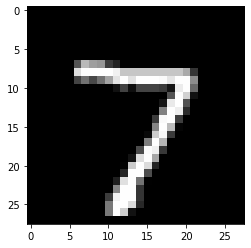

pred :  7 [8.60329342e-12 1.43295317e-15 9.54195056e-10 6.01646661e-06
 1.28266275e-14 3.69315174e-08 9.85722598e-14 1.00000000e+00
 2.04994049e-13 4.19492441e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


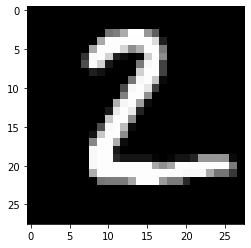

pred :  2 [4.0234193e-07 8.7327322e-07 9.9999261e-01 9.2034549e-09 8.7116234e-14
 3.5965644e-07 1.5311127e-08 3.2418733e-15 1.4849248e-07 2.5273102e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


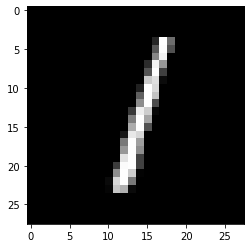

pred :  1 [9.28842070e-09 9.99998927e-01 3.17149852e-06 2.14034693e-10
 8.64131266e-07 2.35448642e-05 3.11219459e-08 1.15634585e-07
 8.92794196e-06 8.69530614e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


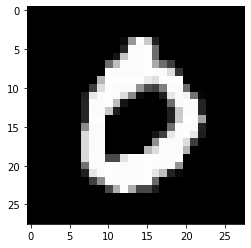

pred :  0 [9.9996889e-01 1.9861707e-08 7.2576979e-05 6.8289119e-06 5.4437553e-12
 3.8664055e-08 1.7168479e-06 2.3203123e-07 6.3794131e-13 6.1950038e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


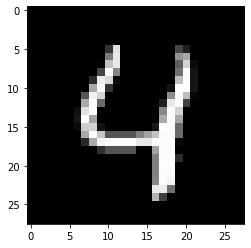

pred :  4 [1.5584525e-11 5.9780170e-13 2.7572145e-08 1.7304278e-11 9.9999827e-01
 5.0910742e-08 1.2079631e-09 3.1612302e-07 1.4389193e-10 5.1358342e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


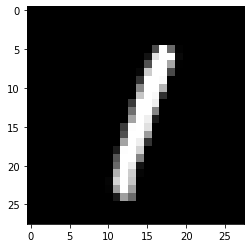

pred :  1 [6.0278154e-08 9.9999905e-01 3.1626158e-08 6.2307759e-10 8.2825891e-06
 5.3204798e-07 7.4148305e-09 5.4753809e-06 1.1355098e-06 4.4212200e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


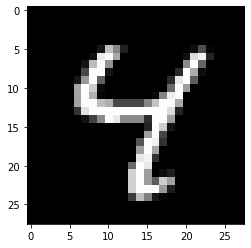

pred :  4 [7.4459268e-16 3.1045756e-12 4.5493564e-08 2.7770859e-08 9.9999088e-01
 7.5026101e-08 2.9477692e-12 5.7448300e-08 4.6719644e-05 1.2164276e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


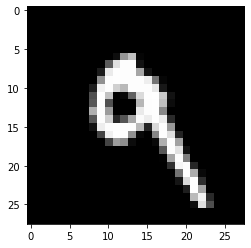

pred :  9 [1.0147037e-12 4.4946960e-06 9.0448711e-06 6.3391240e-06 4.7529807e-06
 6.8043162e-05 3.4203803e-11 2.3901400e-10 3.4501751e-10 9.9999952e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


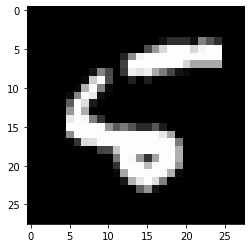

pred :  5 [3.5071421e-10 1.9923903e-11 2.3830744e-05 5.6163527e-09 1.2231058e-07
 8.6600184e-02 4.4842064e-03 7.5689992e-12 2.8818846e-04 1.4753910e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


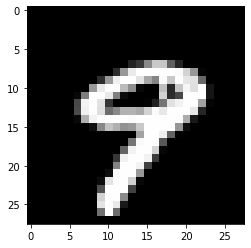

pred :  9 [1.17539485e-11 1.68200033e-18 4.76797313e-13 1.40781849e-05
 7.92743085e-05 6.65539901e-10 8.02598377e-10 2.80886889e-04
 2.90530033e-06 9.99986291e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


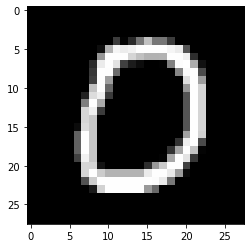

pred :  0 [9.9999845e-01 6.7665212e-08 3.6049089e-05 1.0733774e-08 4.8279570e-14
 5.3379349e-06 3.5072727e-08 1.0641075e-10 3.6695881e-15 1.4024523e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


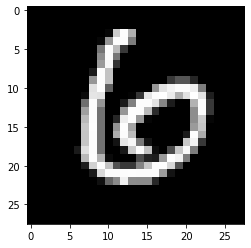

pred :  6 [4.5250090e-06 3.9805589e-11 9.7191969e-06 1.9239945e-08 1.8130336e-11
 2.2612328e-06 1.0000000e+00 1.6577557e-11 2.4768769e-06 1.1203388e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


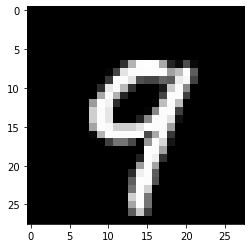

pred :  9 [4.0913819e-14 2.1297983e-15 3.7228187e-07 5.6886837e-09 7.4466316e-06
 4.2201982e-08 1.0774592e-12 5.9940595e-07 3.3660972e-09 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


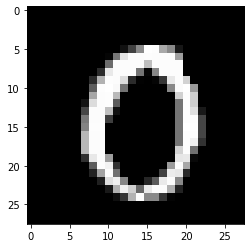

pred :  0 [9.9998087e-01 1.8094277e-10 1.2472330e-09 5.3349600e-09 6.0696474e-12
 3.2878364e-07 1.2950744e-07 9.3241042e-06 1.3901236e-09 3.6126421e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


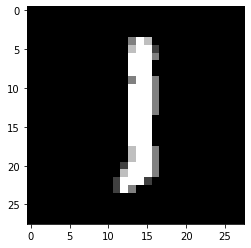

pred :  1 [9.3802965e-11 9.9999696e-01 6.8070378e-08 9.5093654e-08 3.9064321e-09
 2.1155194e-05 3.7139318e-09 1.5970354e-08 1.2751584e-06 1.0188288e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


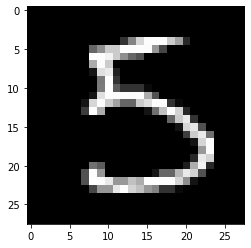

pred :  5 [4.0224255e-09 8.1324188e-06 3.3029828e-08 7.0944833e-07 4.4142241e-09
 9.9996173e-01 6.1429431e-11 1.3405048e-09 1.1456332e-08 4.7688345e-14]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


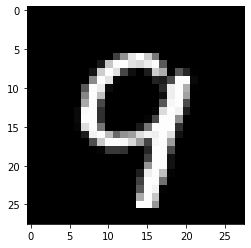

pred :  9 [2.6822857e-08 6.9638634e-16 1.4027566e-07 7.2954720e-10 1.2539226e-07
 2.4452576e-10 1.2737867e-09 4.6032183e-05 3.9588440e-07 9.9999940e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


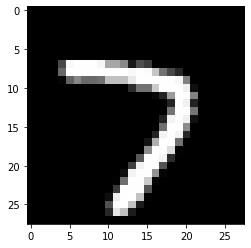

pred :  7 [5.2534840e-08 3.0153647e-13 2.7925336e-07 5.9142263e-08 1.3871907e-14
 3.2519204e-10 7.6118125e-15 9.9998355e-01 1.1186021e-15 5.4161836e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


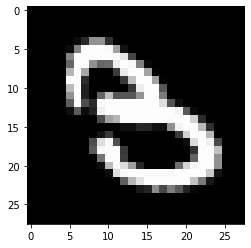

pred :  3 [1.7235724e-08 1.3352334e-08 2.5944701e-06 9.8209035e-01 2.7952792e-06
 1.3181567e-04 2.3515421e-09 2.3359105e-12 9.8171830e-04 3.2588407e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


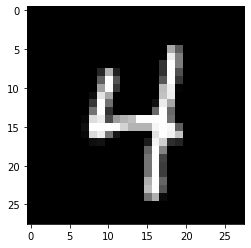

pred :  4 [9.53810598e-15 2.07310524e-08 1.36411465e-10 3.38449162e-08
 1.00000000e+00 1.01247714e-07 1.06919924e-11 1.81875457e-08
 1.28696307e-11 2.55460350e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


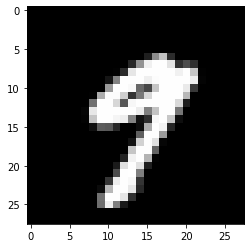

pred :  9 [1.1324547e-08 2.2992723e-10 1.3964981e-14 1.4401364e-07 1.0917321e-06
 5.3611529e-06 6.5674772e-15 1.7338306e-02 1.5886675e-07 9.9990761e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


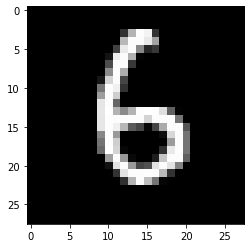

pred :  6 [2.0458110e-10 4.1974274e-10 1.1437660e-07 2.7453916e-08 9.9686613e-11
 6.9463253e-04 9.9999380e-01 2.9003041e-15 1.8617280e-07 2.8086374e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


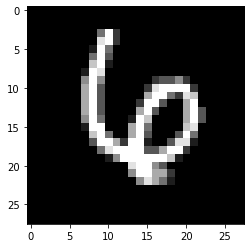

pred :  6 [7.9598994e-09 2.2800624e-09 4.9739106e-07 1.4469757e-09 1.0666456e-06
 9.1125851e-10 9.9999887e-01 1.9728918e-06 3.1923209e-10 1.5492267e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


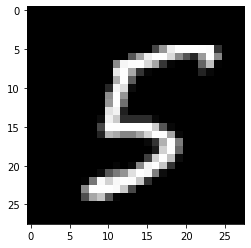

pred :  5 [3.20077244e-13 1.17505309e-07 7.65137020e-09 2.15246718e-08
 4.79481472e-12 9.99999642e-01 1.88932987e-07 1.09146124e-14
 2.31569402e-13 1.14095455e-10]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


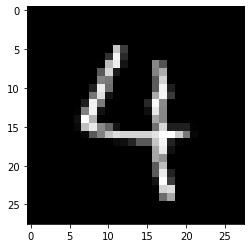

pred :  4 [6.9891564e-13 5.3258144e-11 1.5989738e-08 5.6230035e-11 9.9999928e-01
 6.4115022e-07 4.1344100e-10 3.1825832e-07 1.2049881e-12 1.0041321e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


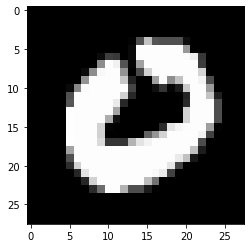

pred :  0 [9.99927163e-01 6.64500746e-11 1.20889254e-08 5.01031383e-10
 1.12605605e-07 1.35978762e-09 1.19313598e-03 1.88419538e-08
 6.57923227e-09 1.00397694e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


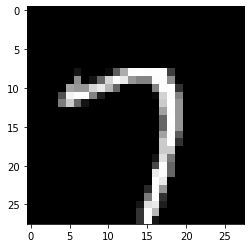

pred :  7 [2.1017604e-07 5.0114052e-13 5.1995631e-08 5.8259452e-08 5.9855961e-12
 1.2691323e-10 9.6312628e-12 9.9999791e-01 5.6166389e-14 6.0718514e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


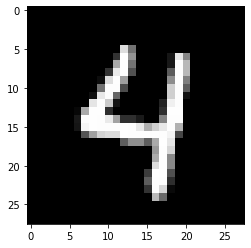

pred :  4 [6.9901098e-15 5.5998659e-14 2.0659476e-09 5.1595278e-10 1.0000000e+00
 1.1273181e-06 6.0045632e-13 3.6563616e-08 6.0827437e-12 1.4398329e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


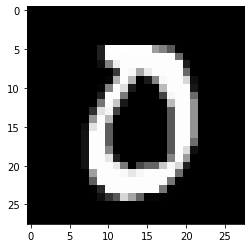

pred :  0 [1.0000000e+00 7.7309742e-11 9.0345740e-04 4.2163143e-07 6.9969563e-14
 1.3308807e-06 8.8344235e-11 9.1127808e-09 5.5289284e-10 1.3339786e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


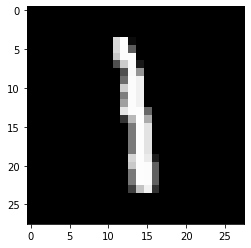

pred :  1 [2.4168325e-15 9.9997318e-01 1.5335706e-06 1.4259792e-05 5.3686506e-07
 1.5799196e-05 2.0090464e-08 1.4072963e-07 2.5002144e-05 2.1242346e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


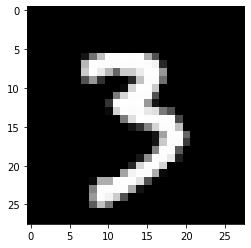

pred :  3 [2.0403593e-10 2.9802407e-09 1.8265757e-09 1.0000000e+00 4.0751340e-11
 8.5030907e-09 7.4181392e-17 1.7498191e-09 1.1038412e-09 2.3517485e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


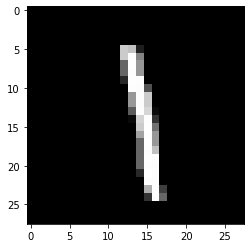

pred :  1 [5.1307610e-15 9.9998987e-01 4.3797138e-07 1.2832588e-08 3.8396035e-08
 7.3094429e-06 3.3867259e-08 3.0266014e-05 1.1873701e-05 2.7005842e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


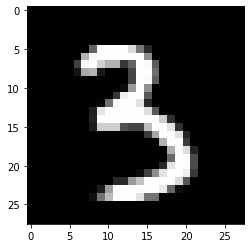

pred :  3 [1.2770964e-11 6.3908925e-07 2.0765697e-10 9.9999988e-01 3.6500885e-09
 1.3334596e-06 1.9923226e-14 9.8644440e-11 6.5652706e-08 1.0148296e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


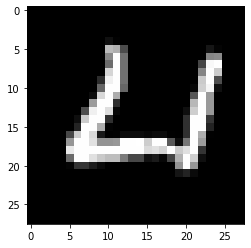

pred :  4 [1.1744797e-03 2.9498446e-12 6.4638646e-09 2.2041839e-12 9.9993503e-01
 6.2945539e-05 4.5865600e-06 7.4858497e-10 2.0447801e-11 4.3710948e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


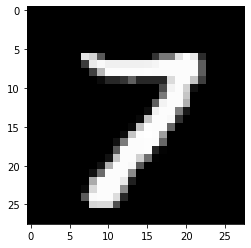

pred :  7 [1.4318872e-08 1.8160420e-10 3.6454028e-07 1.0156938e-07 2.1199226e-14
 3.2087681e-09 1.4546212e-13 9.9999928e-01 1.5279822e-08 2.6259930e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


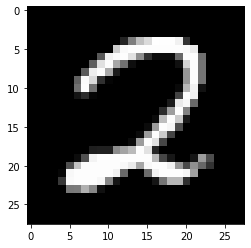

pred :  2 [1.4137275e-07 1.3657510e-03 9.9997669e-01 3.4240571e-10 6.1652392e-13
 1.3178534e-05 3.7660712e-12 3.4934388e-12 1.0680333e-11 3.7231043e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


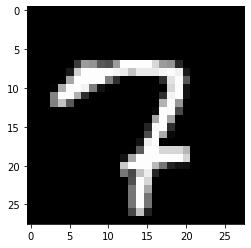

pred :  7 [3.9412780e-09 4.8494708e-10 6.4389408e-03 1.9446217e-08 2.2688802e-15
 1.2032387e-11 3.3319753e-12 9.9999976e-01 1.5038198e-08 1.5105228e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


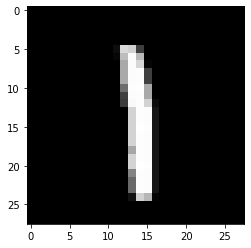

pred :  1 [9.97314888e-15 9.99985099e-01 1.78562755e-06 6.40449205e-09
 2.81102750e-08 1.20135155e-05 1.36096432e-07 3.36289406e-04
 1.30272101e-05 1.76363386e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


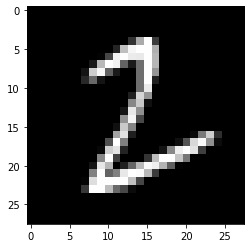

pred :  2 [2.0607134e-09 7.0507900e-05 9.9894798e-01 6.2810409e-06 5.9931034e-19
 8.0896621e-07 1.0417981e-09 9.8110556e-12 2.5076645e-07 5.7452510e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


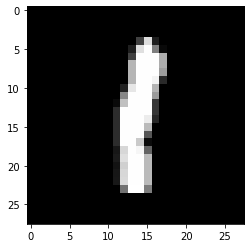

pred :  1 [7.1388598e-08 9.9999583e-01 2.4201103e-09 1.9140488e-07 6.1644435e-08
 3.1771671e-07 1.3943273e-07 1.8068638e-06 8.5825204e-06 3.7269180e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


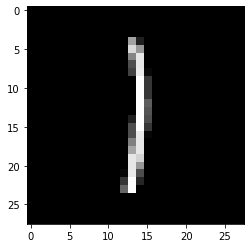

pred :  1 [3.7306798e-13 9.9998742e-01 5.0476896e-08 5.7248758e-07 1.2438891e-11
 2.7151957e-06 1.1818124e-08 1.3735647e-06 4.6168162e-07 2.6244911e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


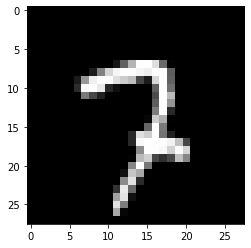

pred :  7 [1.8558735e-10 5.8490313e-10 2.2455131e-06 3.2415016e-06 1.1152654e-12
 6.8750478e-11 1.4517899e-11 9.9999952e-01 1.1242918e-11 3.1358979e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


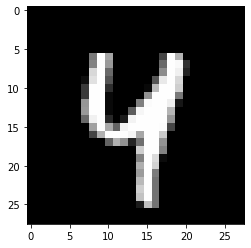

pred :  4 [6.1705152e-15 2.7199630e-07 5.0387212e-13 2.6981604e-07 9.9998975e-01
 2.7498552e-09 6.8017973e-11 2.9571345e-06 3.3602467e-09 5.6906651e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


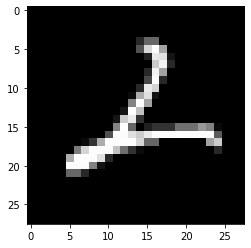

pred :  2 [1.79532864e-11 1.41887568e-08 9.99879122e-01 2.49661156e-07
 1.61409378e-04 9.97454890e-07 5.56518444e-07 2.78473564e-11
 9.53398796e-07 1.20089595e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


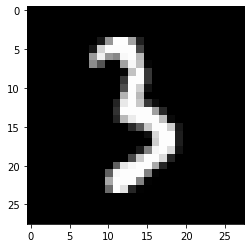

pred :  3 [2.9854150e-11 7.4479203e-07 1.1269429e-06 9.9994564e-01 2.3875077e-07
 2.0647049e-04 7.1983025e-10 1.2550011e-08 5.3878386e-09 1.2577945e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


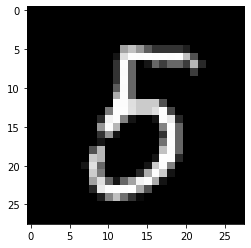

pred :  5 [2.4170321e-10 6.8431888e-08 1.2193375e-10 4.0619614e-07 3.4604083e-11
 9.9996924e-01 8.3949562e-06 1.5060579e-09 1.0885508e-06 7.9289165e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


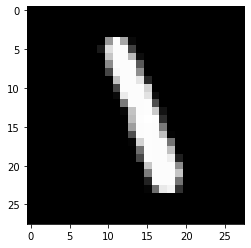

pred :  1 [7.2418527e-16 9.9999964e-01 5.8634720e-07 1.7052516e-05 8.2249977e-07
 1.6298424e-06 2.6105878e-08 3.1632984e-11 8.7473654e-06 8.1970429e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


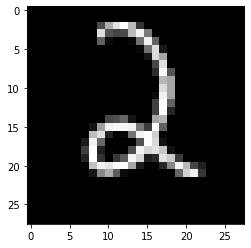

pred :  2 [5.7092220e-11 4.7468970e-06 1.0000000e+00 4.8069109e-12 1.4701054e-15
 2.6812373e-08 5.2490273e-06 4.2346790e-12 5.2093729e-11 4.5545158e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


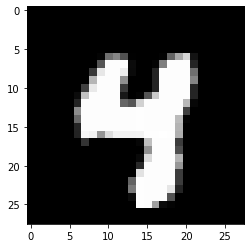

pred :  4 [7.0827630e-16 2.6880999e-11 1.8476423e-12 5.0017020e-06 9.9999976e-01
 5.1223014e-06 2.2276651e-13 1.4132112e-07 5.2321316e-09 1.5749409e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


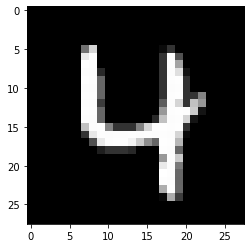

pred :  4 [3.2222992e-12 1.0027859e-13 2.7162704e-08 1.3728345e-11 9.9999964e-01
 3.3943877e-09 3.3461411e-11 1.3962261e-07 4.4673884e-10 3.0356646e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


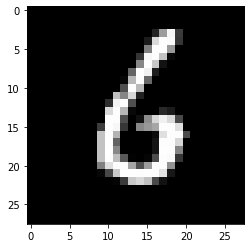

pred :  6 [9.9623463e-08 2.9450928e-09 6.6030998e-07 3.2851705e-08 4.2819007e-08
 2.8076768e-04 9.9998331e-01 2.3248959e-12 3.9783728e-11 1.9517346e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


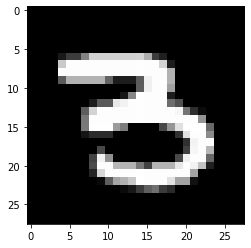

pred :  3 [2.1143283e-08 6.0819292e-09 1.7344445e-07 1.0000000e+00 2.7251245e-11
 5.7028640e-08 3.7738333e-14 9.8311609e-11 2.0371931e-07 8.9290442e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


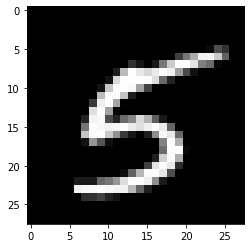

pred :  5 [7.1217539e-11 1.0015282e-09 6.4164070e-11 8.4037104e-08 2.6217490e-09
 1.0000000e+00 2.8184441e-10 1.2062938e-09 1.0601773e-10 1.3259721e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


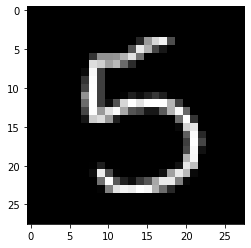

pred :  5 [7.0887506e-12 7.3089401e-10 4.4009745e-13 2.9001666e-07 1.0790917e-09
 9.9997497e-01 1.6108392e-11 1.3456314e-08 2.4346437e-07 2.3002978e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


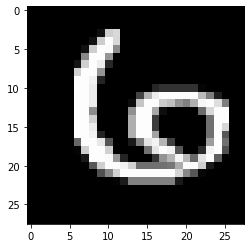

pred :  6 [1.67199801e-07 1.32157368e-07 7.04168770e-06 1.23888365e-11
 5.67000846e-09 6.90903689e-05 1.00000000e+00 3.28812281e-12
 6.53022153e-06 4.07703288e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


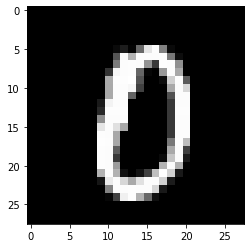

pred :  0 [9.99997377e-01 5.95610297e-11 2.27178631e-07 1.49402424e-09
 1.44205342e-11 1.10739575e-05 2.08103461e-06 1.32384670e-09
 4.20570416e-07 9.65227969e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


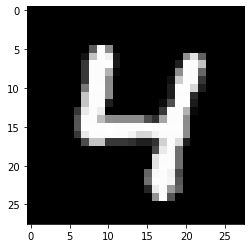

pred :  4 [6.1190433e-14 2.4575520e-16 1.7939031e-09 4.2675383e-10 1.0000000e+00
 8.7746017e-08 3.7324149e-10 1.1037245e-07 1.9580642e-09 8.5112367e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


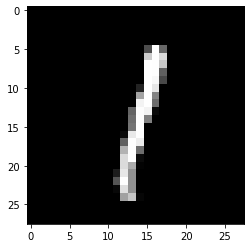

pred :  1 [4.9704063e-09 9.9999559e-01 1.8658774e-08 3.1051073e-09 1.0719903e-06
 1.7958383e-06 1.0744359e-09 6.4753690e-06 3.0100084e-06 5.6738600e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


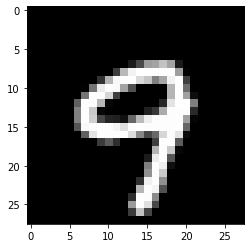

pred :  9 [2.4672379e-11 4.5122154e-19 1.5364632e-08 3.4612208e-07 1.6736984e-04
 2.6655562e-09 5.4769969e-13 3.3999538e-07 2.4932945e-11 9.9999952e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


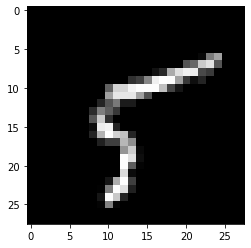

pred :  5 [1.1488855e-07 9.4055230e-07 2.3400141e-11 1.1964037e-10 1.1545485e-11
 9.9999928e-01 3.4079213e-12 4.0858984e-04 2.9338979e-08 3.3113139e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


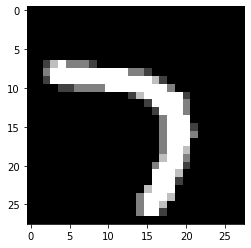

pred :  7 [1.3794924e-09 5.4593552e-11 2.9682214e-08 1.0980676e-07 1.1071189e-11
 3.1254718e-08 1.0703597e-12 1.0000000e+00 8.2075738e-14 1.2351005e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


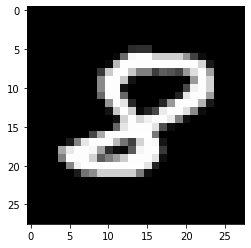

pred :  8 [5.73284975e-10 1.22018385e-11 1.64151192e-04 1.31930074e-05
 2.93985912e-11 7.42353441e-05 1.76146886e-09 1.64429923e-06
 9.97570634e-01 4.17730735e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


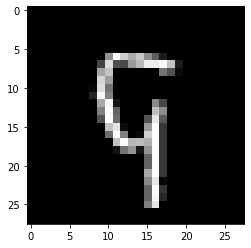

pred :  9 [6.7703222e-14 1.7330661e-12 3.5691881e-09 8.1285062e-11 2.8923678e-06
 6.6906214e-04 3.5441053e-07 3.7080342e-06 2.8255681e-06 9.9997336e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


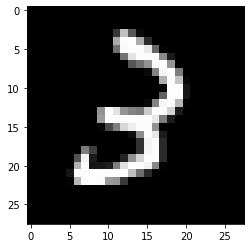

pred :  3 [8.31634501e-12 1.47282453e-08 8.63055757e-05 9.98981416e-01
 5.21951243e-13 1.76718473e-07 2.63548888e-11 3.68505804e-09
 2.27345737e-07 1.49531725e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


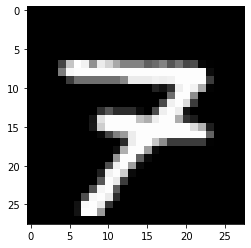

pred :  7 [3.6252201e-10 1.4283512e-17 1.7769958e-12 3.2325368e-06 4.1602077e-09
 8.2915740e-12 5.4577566e-13 9.9996948e-01 1.1077120e-08 1.7269971e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


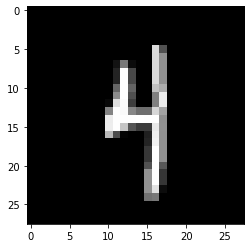

pred :  4 [8.7233958e-14 2.4497404e-09 1.0545938e-08 6.2751489e-08 9.9983668e-01
 7.4261427e-04 1.4662446e-10 1.6434133e-10 1.7082058e-09 1.2523234e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


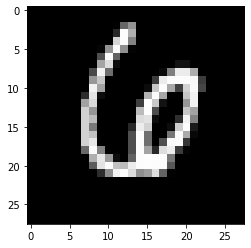

pred :  6 [2.9364172e-08 1.8640944e-09 1.4191742e-05 6.3478146e-05 2.8562845e-09
 4.0734823e-13 1.0000000e+00 2.1504914e-06 2.3643012e-09 3.8696055e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


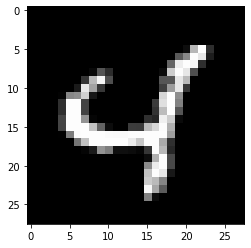

pred :  4 [5.5267357e-10 7.3021400e-10 4.2989918e-06 2.3598691e-08 9.9999809e-01
 2.1709005e-07 9.5926340e-12 4.7612553e-10 5.1595799e-07 2.6360154e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


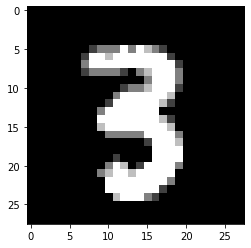

pred :  3 [2.4389346e-08 8.6441432e-10 1.5127978e-07 9.9997389e-01 3.8959884e-11
 1.2762339e-08 5.0693033e-15 1.1627314e-08 5.0884973e-06 5.9501112e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


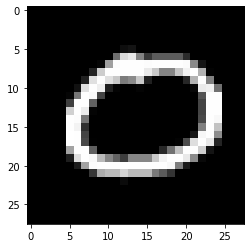

pred :  0 [9.9999976e-01 2.6444900e-09 1.4622942e-08 1.7421007e-08 2.3006133e-15
 1.3511707e-05 2.0445219e-08 7.6442404e-08 9.3162316e-15 2.3407251e-10]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


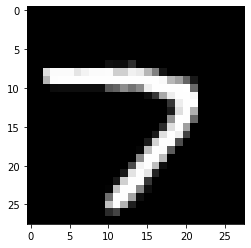

pred :  7 [1.01319969e-07 1.31805857e-14 1.03430715e-07 8.80195383e-09
 1.13571533e-14 1.59675953e-10 9.65343257e-14 9.99993682e-01
 6.36286491e-16 3.01978116e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


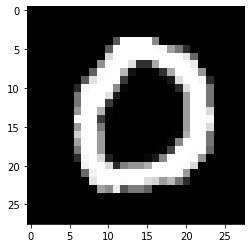

pred :  0 [1.0000000e+00 7.5102982e-08 1.3814633e-07 2.9901766e-09 6.8310531e-14
 8.5733006e-08 3.3259308e-08 5.1902069e-09 1.0252220e-13 9.1348822e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


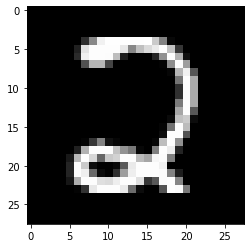

pred :  2 [7.0360825e-06 1.3411697e-09 9.9997270e-01 3.2579899e-04 2.3244748e-12
 2.0481782e-05 1.2482247e-10 8.1833727e-11 6.7340556e-14 1.3259403e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


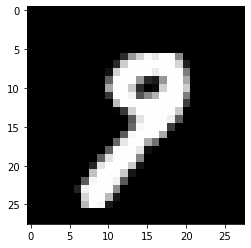

pred :  9 [8.4495894e-10 1.6978188e-08 8.8553005e-09 6.1867733e-09 1.0647074e-08
 1.6860785e-08 3.7408511e-15 1.4456332e-02 6.0001016e-04 9.9982822e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


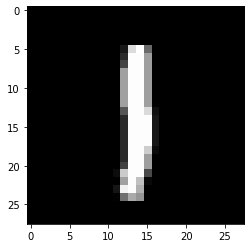

pred :  1 [1.0176711e-12 9.9953502e-01 5.1787289e-08 5.5135563e-09 7.7936534e-07
 5.4116557e-05 4.1961830e-08 1.2505883e-05 1.3074279e-04 7.9446943e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


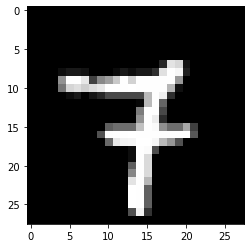

pred :  7 [6.3204603e-15 1.1866867e-12 2.8084108e-09 1.1282265e-03 9.4037958e-08
 2.2002072e-11 1.2294882e-12 9.9997246e-01 4.6892540e-10 1.6008606e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


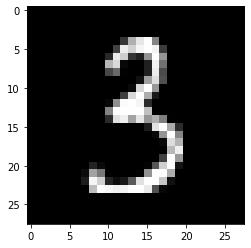

pred :  3 [8.1661478e-10 5.1906972e-07 1.8639974e-10 9.9999672e-01 8.8523961e-09
 1.3889264e-06 2.1451287e-10 1.8101716e-12 1.2216505e-06 1.2253814e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


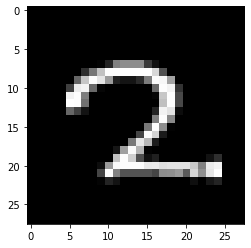

pred :  2 [7.5628998e-07 1.8074811e-03 1.0000000e+00 7.9346418e-10 2.0405644e-15
 1.1102868e-07 3.3494521e-07 4.6054222e-07 1.4483259e-09 3.0863557e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


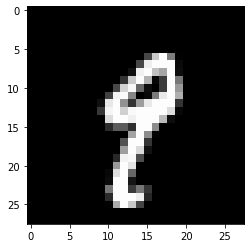

pred :  9 [1.2386444e-12 3.0601029e-07 4.2886658e-13 6.5784256e-10 1.8657076e-05
 2.7574026e-07 4.6548923e-10 6.0966827e-06 1.6722540e-06 9.9996185e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


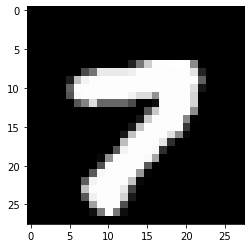

pred :  7 [1.05606574e-07 1.13165448e-14 1.93903560e-09 4.18706895e-06
 5.43460242e-13 3.79017635e-08 6.78482986e-13 9.99985218e-01
 1.40400989e-08 2.42930473e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


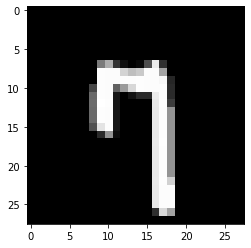

pred :  7 [7.5355340e-09 5.8061822e-10 1.1422283e-10 7.9722139e-11 3.5072077e-07
 8.1951626e-08 1.1754765e-13 9.9957538e-01 2.3954433e-10 1.7189085e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


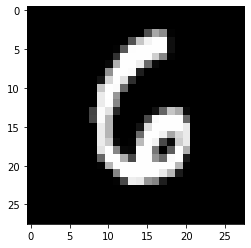

pred :  6 [2.4234883e-08 1.6588884e-07 1.9590505e-07 1.9321815e-11 1.0328636e-08
 1.2592278e-05 9.9999905e-01 1.1772935e-10 1.4927574e-08 5.1164627e-04]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


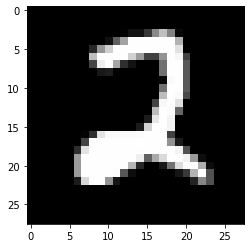

pred :  2 [5.1879305e-09 4.7594533e-08 1.0000000e+00 4.5757376e-10 1.0261968e-12
 1.7404724e-07 1.4549126e-09 1.9535521e-11 1.2082176e-11 1.5232413e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


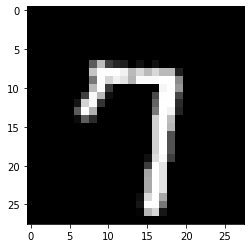

pred :  7 [1.4298942e-09 8.2237651e-13 7.9570722e-10 5.5320326e-09 6.6697300e-11
 1.1206283e-08 9.8280574e-13 9.9999976e-01 8.3043381e-14 6.3224002e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


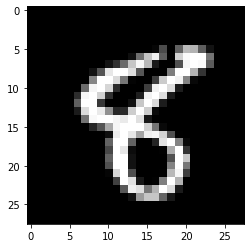

pred :  8 [1.2992507e-07 3.6184242e-09 1.0255835e-06 1.9523623e-07 1.3007893e-07
 2.0576040e-06 9.7167913e-07 1.1846645e-09 9.9999756e-01 3.6319145e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


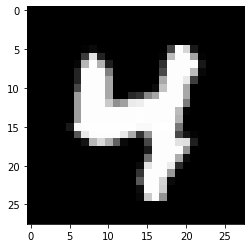

pred :  4 [9.1060472e-15 3.9509684e-11 6.4240974e-11 2.8849285e-05 9.9999905e-01
 3.3810013e-06 1.1213263e-10 6.1231917e-09 1.0715915e-08 7.4154108e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


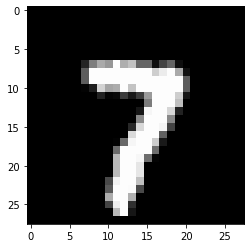

pred :  7 [1.0348049e-06 2.9836175e-10 8.9556691e-09 6.1659806e-09 6.4851661e-13
 1.5491749e-09 1.3199184e-13 9.9996287e-01 2.2626490e-07 5.6657824e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


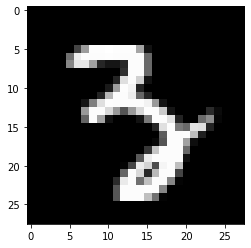

pred :  3 [3.4607467e-10 2.1904302e-07 2.1154596e-10 9.9999940e-01 2.7159427e-07
 2.0465548e-06 8.7992721e-12 3.3472999e-05 1.4674106e-11 4.1472781e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


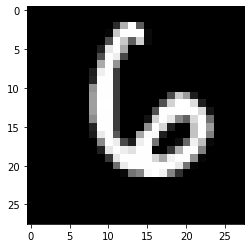

pred :  6 [2.4194688e-09 5.7034238e-10 2.0480365e-06 4.2534092e-09 8.1571116e-08
 1.1671140e-10 1.0000000e+00 1.0240612e-09 1.6431862e-08 3.2250171e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


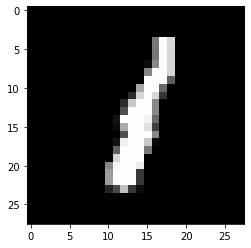

pred :  1 [3.4627575e-08 9.9998742e-01 9.7192844e-07 1.4845764e-09 8.0617360e-07
 2.0205446e-06 1.5630596e-05 2.1966642e-07 3.4893474e-06 9.8122632e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


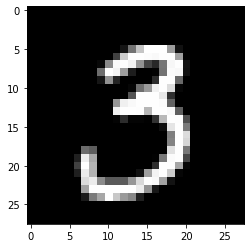

pred :  3 [1.0380895e-06 1.4754964e-07 5.6158602e-09 9.9999845e-01 6.3014781e-11
 4.5442898e-09 3.1057141e-15 1.1725763e-10 3.4404465e-08 1.9465544e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


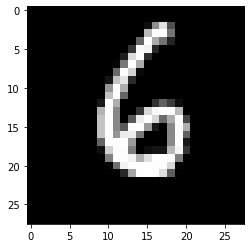

pred :  6 [8.4792945e-14 1.2160871e-08 6.3701000e-09 1.6164927e-06 1.5037789e-09
 4.3145397e-07 1.0000000e+00 1.7848586e-13 6.9935315e-09 1.1610494e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


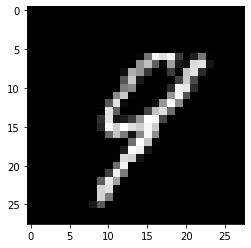

pred :  9 [4.8716207e-13 7.1556067e-10 6.6649171e-09 9.4400026e-09 1.5822053e-04
 1.1911072e-05 2.0775404e-10 1.2333473e-08 3.9739539e-06 9.9993277e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


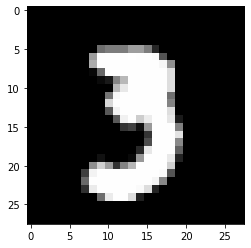

pred :  3 [1.3105264e-07 2.2700515e-09 2.1093587e-07 9.7847891e-01 2.1248516e-08
 1.5589595e-04 4.5769697e-17 2.9819591e-12 2.5828499e-06 7.7725053e-02]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


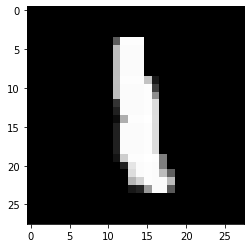

pred :  1 [5.1343001e-13 9.9999714e-01 6.5010786e-04 1.6421545e-09 3.7788635e-05
 1.5731425e-06 9.7044328e-08 7.6342083e-10 1.4069676e-04 1.1967255e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


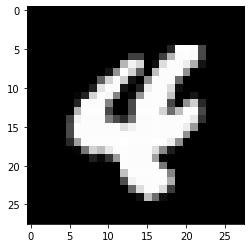

pred :  4 [3.5759323e-10 4.9938513e-12 1.3308577e-08 4.2059006e-07 9.9978209e-01
 3.1411179e-08 4.0427622e-05 2.6210691e-09 3.4688310e-05 3.4699440e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


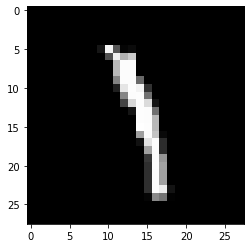

pred :  1 [2.5824688e-15 9.9830961e-01 9.9430594e-08 3.7016056e-07 1.2580875e-05
 4.3596276e-07 4.2189845e-11 5.4757777e-08 4.9276457e-07 1.3723060e-01]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


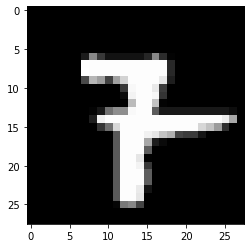

pred :  7 [7.2933922e-08 2.1812059e-09 8.0263482e-05 4.7670372e-07 4.1419362e-08
 4.8139348e-10 5.2946845e-13 1.0000000e+00 6.3344338e-08 4.2636575e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


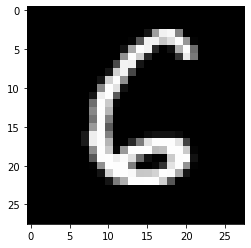

pred :  6 [1.4246192e-06 3.5862246e-05 3.0209907e-08 7.5842232e-14 7.8012451e-11
 7.6606797e-05 9.9999940e-01 9.4514325e-15 3.9803841e-11 1.0365722e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


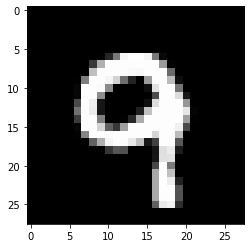

pred :  9 [2.1814182e-09 1.0024178e-15 2.9579763e-07 2.1742446e-05 1.1610250e-08
 1.2480915e-10 7.1300792e-09 9.4755040e-07 1.2616222e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


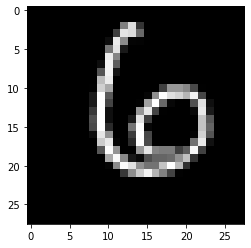

pred :  6 [5.2951016e-08 1.6054893e-08 6.7549095e-06 1.2227128e-09 2.8114776e-12
 1.5028383e-09 1.0000000e+00 2.6043550e-09 1.6123602e-08 2.2237599e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


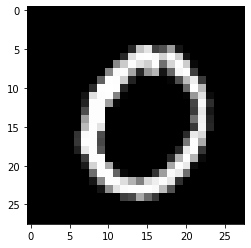

pred :  0 [9.9999881e-01 1.0363298e-06 5.8574745e-09 9.8317843e-10 6.7435893e-15
 1.0364849e-06 7.1772689e-07 1.5319240e-07 3.8569183e-12 7.8877331e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


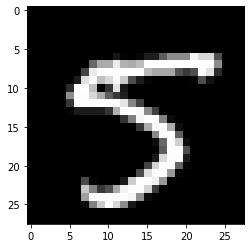

pred :  5 [1.1565884e-13 7.9485279e-11 1.3812682e-11 2.5043687e-09 1.3559887e-12
 1.0000000e+00 2.8873537e-16 3.8284079e-06 2.2951875e-11 7.9117282e-11]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


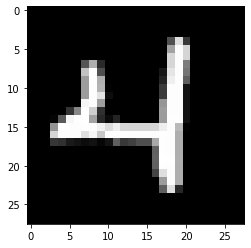

pred :  4 [6.9040232e-11 1.4152699e-12 1.7863522e-07 2.6702072e-09 1.0000000e+00
 5.0873954e-08 2.8904784e-12 6.4357302e-09 5.5109461e-10 8.1548048e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


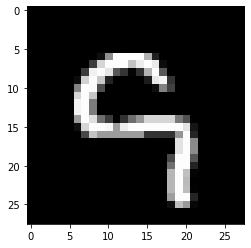

pred :  9 [6.7245385e-12 1.5438895e-12 1.6484403e-09 6.7334304e-07 3.2208110e-09
 7.6485276e-03 4.6752063e-10 3.2974103e-09 1.9856989e-03 9.9998236e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


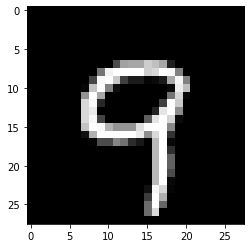

pred :  9 [1.5804535e-12 2.8216386e-18 1.3275289e-08 3.4128590e-08 2.4114181e-07
 1.3595159e-08 1.0222882e-11 1.7980035e-07 5.3810631e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


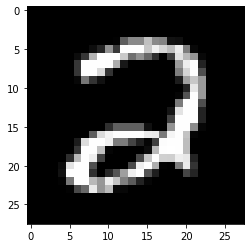

pred :  2 [2.67041992e-06 1.32183831e-09 9.99999881e-01 1.73763878e-10
 3.29768060e-13 1.27694975e-08 2.40551712e-09 3.24097103e-11
 3.83864773e-10 1.41805370e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


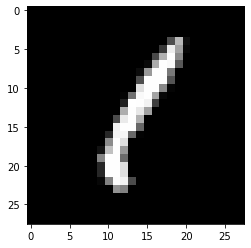

pred :  1 [2.3327172e-03 9.9996722e-01 7.4536125e-05 8.2251379e-11 3.7980987e-09
 4.2847930e-08 1.3024950e-05 1.4329200e-08 1.1386731e-04 8.1929974e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


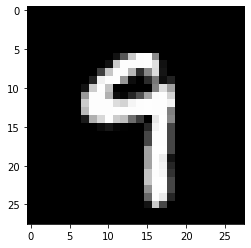

pred :  9 [1.5659067e-12 1.1662862e-10 1.3740461e-09 3.8454538e-11 6.0154314e-05
 7.6628351e-07 2.6759172e-13 1.0265140e-06 3.5192809e-08 9.9999976e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


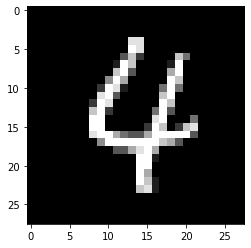

pred :  4 [4.5836555e-12 1.7510042e-09 3.2509437e-08 3.2743654e-09 1.0000000e+00
 4.9174982e-08 1.4436738e-08 3.3849478e-04 8.5058605e-10 5.8580952e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


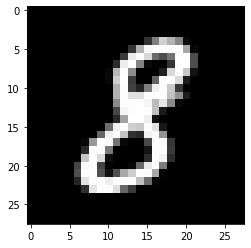

pred :  8 [3.9474133e-07 8.3305551e-08 1.3853593e-05 1.7728767e-07 1.8222781e-09
 5.2039034e-10 4.4712525e-07 4.0444856e-11 9.9999821e-01 6.4066335e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


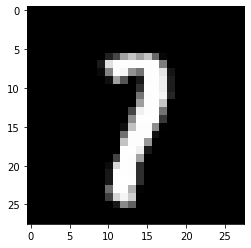

pred :  7 [1.10156495e-10 4.97460365e-04 7.43578812e-06 7.27687066e-08
 6.64636332e-11 2.19859841e-09 3.25121908e-14 9.98024762e-01
 5.34472019e-06 7.06038463e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


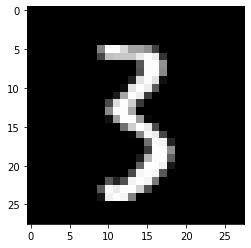

pred :  3 [1.0961425e-07 1.9113993e-06 3.4609400e-09 9.9999499e-01 4.4873656e-09
 8.5253923e-06 3.2773328e-13 5.3503673e-09 2.1813193e-08 1.2025683e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


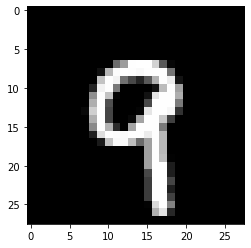

pred :  9 [6.6698064e-11 4.3131137e-12 2.5731703e-08 1.4849205e-07 3.4499681e-08
 3.8287618e-10 1.1838095e-11 6.5945628e-08 3.7635959e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


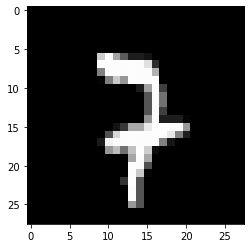

pred :  7 [3.5987096e-14 4.8378856e-10 2.4175858e-06 2.4610542e-06 3.3939749e-08
 4.7195983e-11 2.4193131e-08 9.9995798e-01 7.2551054e-10 1.0693508e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


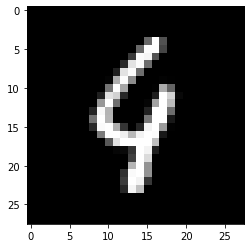

pred :  9 [3.9670277e-12 2.0406221e-08 7.7373625e-07 2.0786988e-09 8.6781323e-02
 2.9901152e-08 5.1471591e-04 8.9236813e-09 2.3750210e-06 9.3488449e-01]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


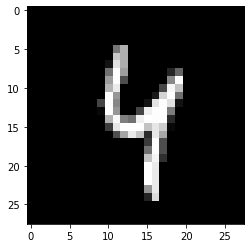

pred :  4 [9.2642323e-17 2.3814464e-06 2.3958499e-10 1.1386991e-06 9.9999952e-01
 3.4773231e-09 8.8605456e-11 5.5681095e-09 1.8016182e-09 2.1998592e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


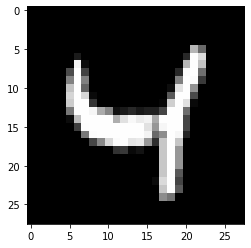

pred :  4 [9.61557765e-14 3.27448199e-14 4.42742894e-05 2.53153818e-08
 1.00000000e+00 4.62441960e-08 1.73481552e-12 2.20048840e-11
 5.88530380e-09 1.09654394e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


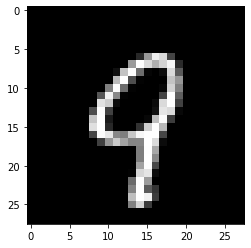

pred :  9 [6.3424212e-13 4.8747417e-10 3.8049816e-08 3.8492831e-06 1.3080723e-06
 5.2891638e-09 1.6543019e-09 1.3272227e-06 1.0848593e-06 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


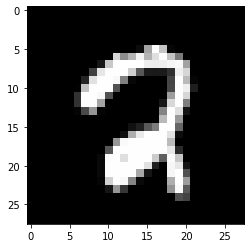

pred :  2 [1.00729036e-10 4.19677099e-10 9.99836087e-01 2.06257234e-10
 4.98566412e-13 2.99033043e-09 7.94619322e-04 2.92554200e-02
 3.21350396e-02 3.54650240e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


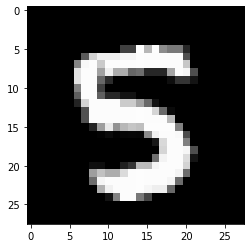

pred :  5 [2.2541316e-12 1.3090724e-09 1.9521935e-10 7.9070145e-05 1.5853792e-14
 9.9998164e-01 4.4035292e-12 3.3144175e-12 8.6920444e-09 6.6295448e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


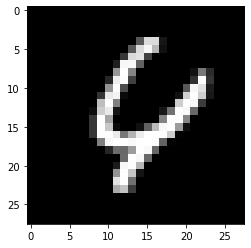

pred :  4 [3.9183794e-07 2.3531897e-12 4.7707800e-07 4.6698901e-08 9.9715865e-01
 3.7343731e-10 2.2491813e-04 1.3975030e-06 1.1481884e-04 2.9218594e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


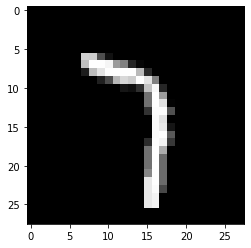

pred :  7 [5.8803240e-12 7.1443495e-08 6.4326287e-08 3.1621978e-09 7.1280051e-11
 1.9326882e-09 3.9493088e-12 1.0000000e+00 2.1012952e-11 2.1513129e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


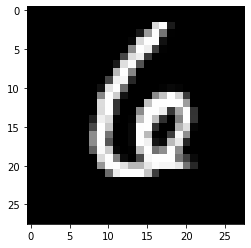

pred :  6 [3.3666268e-11 5.3970592e-07 2.4309105e-07 6.4425554e-10 7.8914434e-07
 4.0371100e-07 9.9999928e-01 1.0062366e-09 1.0109715e-08 5.2357206e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


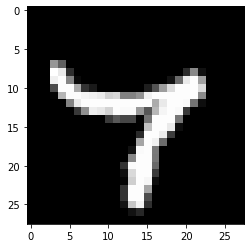

pred :  7 [4.5805834e-14 5.1444207e-15 2.9975143e-07 1.5525627e-08 8.9226663e-03
 7.8814061e-08 2.4078780e-08 9.9930775e-01 1.1220469e-07 1.3061346e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


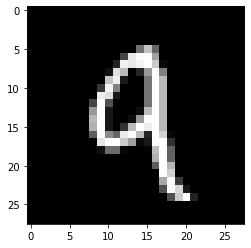

pred :  9 [1.3017429e-08 5.1629024e-07 5.9720874e-04 1.4994441e-07 1.8779337e-03
 9.1575254e-09 2.2817121e-12 1.0565004e-08 1.6357775e-05 9.9962097e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


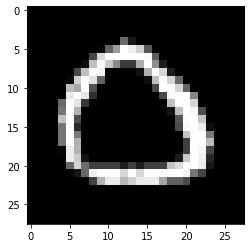

pred :  0 [9.9985111e-01 1.2260915e-10 1.1523343e-05 3.0875264e-05 2.6301533e-13
 5.0367644e-06 1.8651933e-09 7.3880116e-08 3.7956471e-11 5.3426623e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


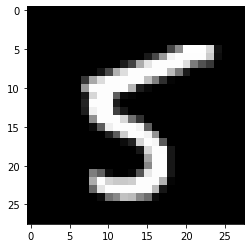

pred :  5 [8.1313469e-14 2.3521611e-09 5.3018926e-12 4.3124598e-10 5.1982117e-13
 1.0000000e+00 2.8192557e-14 2.5352032e-10 4.4680405e-08 1.1523031e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


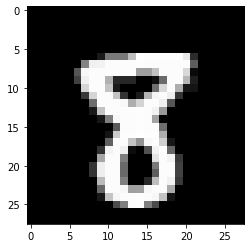

pred :  8 [4.1228283e-09 4.6034437e-10 5.3468432e-07 1.1968437e-05 1.3358187e-09
 1.2524854e-06 8.2495266e-10 4.2261972e-09 9.9999869e-01 2.5433133e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


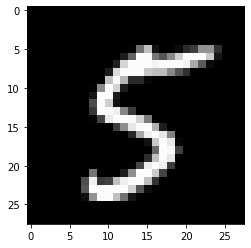

pred :  5 [2.7971762e-11 2.1640192e-07 6.9101225e-11 3.9770871e-09 1.3413928e-12
 1.0000000e+00 3.1558632e-14 1.3873946e-10 4.4864583e-09 1.6306974e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


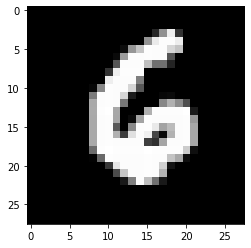

pred :  6 [7.6357082e-10 5.9799388e-11 2.8348867e-07 6.1385606e-08 6.9892315e-07
 4.2568382e-07 9.9999940e-01 3.4531163e-11 2.3268836e-08 5.4525435e-03]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


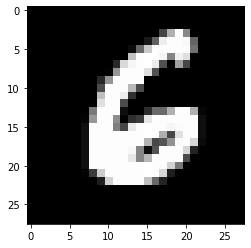

pred :  6 [3.1291641e-08 7.3958328e-09 1.0932277e-07 3.1164045e-09 3.8556166e-08
 1.5693903e-04 9.9999827e-01 1.0113021e-14 2.6110710e-08 1.5779372e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


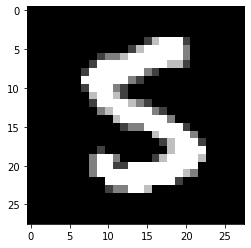

pred :  5 [1.3519896e-10 4.4470298e-07 3.8029226e-11 7.0060753e-07 1.7194430e-14
 9.9999988e-01 4.7264559e-10 2.5627814e-12 4.7918416e-09 2.0207064e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


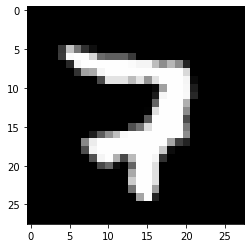

pred :  7 [1.8043994e-10 2.7301642e-12 2.7310848e-04 9.3650939e-05 4.7417117e-08
 6.6711231e-13 7.5636422e-09 9.9991751e-01 4.6316423e-11 6.7020160e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


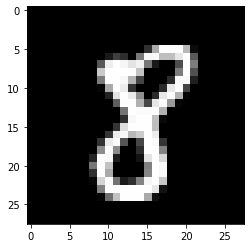

pred :  8 [7.1977771e-11 2.0267636e-07 1.8941415e-05 1.5364428e-08 7.1200289e-11
 1.0842346e-06 1.8376189e-08 1.2658855e-10 9.9999964e-01 8.2761062e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


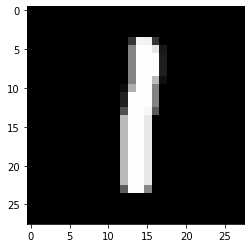

pred :  1 [1.1124712e-09 9.9999070e-01 1.7233003e-07 1.3251352e-07 1.7521209e-08
 3.2944890e-06 3.1229200e-07 3.1013565e-06 2.7090991e-06 1.6612631e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


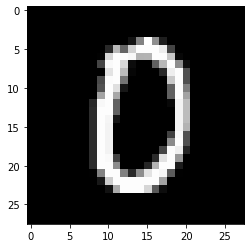

pred :  0 [1.0000000e+00 8.3077642e-13 3.0733634e-05 5.7738550e-11 1.0216736e-12
 4.5402462e-06 7.1481793e-08 1.0558120e-07 3.4627340e-10 5.5863775e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


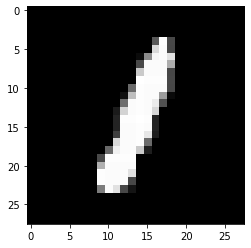

pred :  1 [2.24952444e-07 9.99979854e-01 1.35219602e-06 4.26661040e-10
 3.49223023e-06 9.77388368e-07 1.05274744e-07 2.44891368e-07
 1.75130499e-05 2.63096123e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


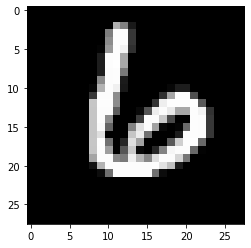

pred :  6 [2.9067149e-09 2.7401625e-10 9.8851688e-06 4.5806515e-11 5.1619025e-09
 5.2428334e-08 1.0000000e+00 3.6912695e-09 1.3693662e-08 2.1030665e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


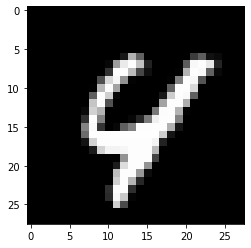

pred :  4 [4.51150423e-10 1.32416915e-14 1.66628104e-06 3.86500254e-09
 9.92420197e-01 1.32783029e-08 1.72331681e-07 1.90710580e-06
 2.95425234e-05 7.51554966e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


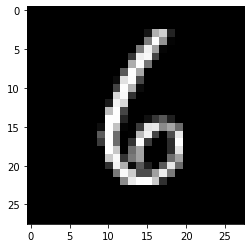

pred :  6 [6.9960031e-08 4.7096869e-06 5.9103672e-07 1.6091274e-09 9.1774943e-09
 1.7409373e-07 1.0000000e+00 8.1790958e-15 2.0214958e-07 8.7716817e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


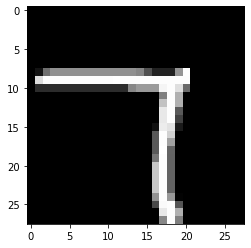

pred :  7 [3.1175102e-09 1.5799820e-10 6.3604972e-07 2.5637483e-09 1.2868138e-14
 1.5724959e-10 7.0572563e-14 1.0000000e+00 1.1260257e-15 8.4373380e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


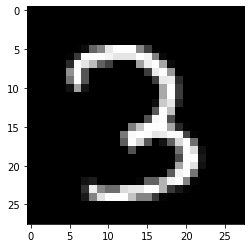

pred :  3 [1.2481878e-12 1.6007246e-09 7.7966679e-06 1.0000000e+00 3.7971568e-09
 3.1754919e-07 6.8652126e-17 3.9033949e-08 3.1816015e-08 1.0607725e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


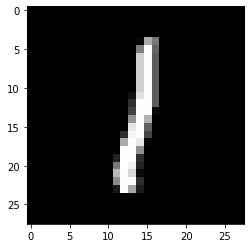

pred :  1 [1.0634466e-09 9.9999976e-01 3.0231769e-07 2.0297704e-10 3.1749436e-09
 7.3007277e-06 4.9400512e-08 1.0071511e-06 1.2057068e-06 4.3333991e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


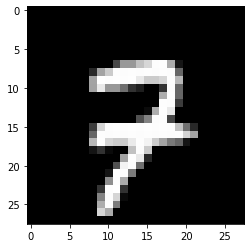

pred :  7 [7.9634112e-12 1.0730569e-14 5.1449962e-05 7.6661462e-07 1.9171158e-11
 1.6700975e-08 3.9199037e-13 9.9879956e-01 7.1838251e-12 6.7421794e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


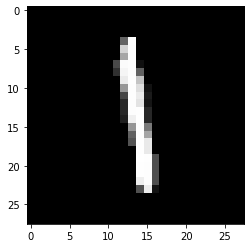

pred :  1 [1.0224382e-15 9.9999726e-01 7.0634894e-07 1.9032612e-06 2.3174451e-08
 3.8689119e-05 5.5720721e-09 1.8656444e-06 9.5275300e-06 2.5071754e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


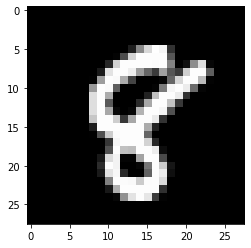

pred :  8 [6.2335161e-08 6.8475425e-10 1.1861337e-06 1.8244982e-04 1.8667548e-10
 5.9030776e-09 4.4635985e-06 6.2437344e-09 9.9999976e-01 3.6159158e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


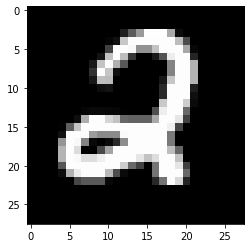

pred :  2 [9.6462560e-10 3.0225672e-10 1.0000000e+00 1.0414391e-06 1.1525497e-09
 1.5424702e-09 1.1262922e-11 1.1505234e-15 4.2024944e-08 4.1195228e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


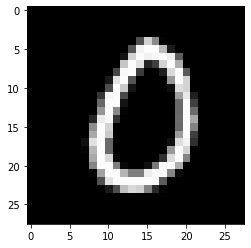

pred :  0 [9.9999946e-01 3.2139011e-09 7.0531598e-08 5.4676061e-08 9.7081251e-14
 1.1547397e-06 4.1829062e-06 1.2796237e-09 1.5333095e-09 9.2040699e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


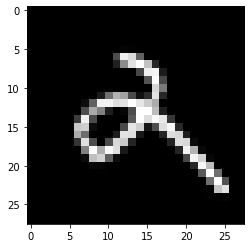

pred :  2 [1.4240709e-11 2.3368376e-08 3.4508383e-01 6.0927650e-06 1.1988282e-03
 6.3516140e-06 4.2869326e-09 8.8855301e-10 8.4267917e-08 9.4527006e-04]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


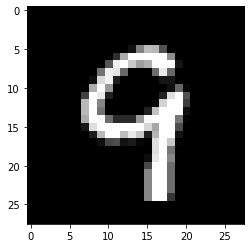

pred :  9 [1.1902836e-13 1.4275661e-14 3.1013963e-09 1.5366215e-08 1.1340937e-07
 1.0129137e-07 4.2948631e-09 1.2890310e-08 3.7870493e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


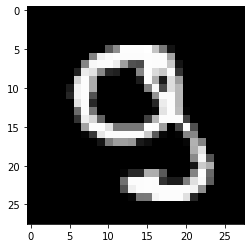

pred :  9 [9.8611906e-07 1.8768439e-14 4.3007731e-04 2.9055456e-05 8.2495422e-10
 1.9082725e-03 5.2826632e-12 5.0184865e-12 8.7436944e-02 9.9972701e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


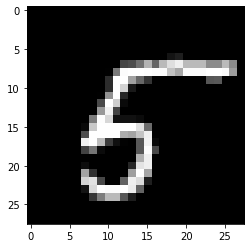

pred :  5 [1.4517464e-10 8.0578537e-11 3.6116307e-10 3.2297706e-11 1.1802489e-12
 9.9999940e-01 1.3861918e-09 1.8794555e-10 1.2834369e-07 1.9356951e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


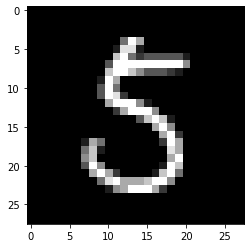

pred :  5 [1.4289386e-11 2.9702460e-06 4.5107322e-09 6.6133055e-08 2.5213101e-10
 9.9995947e-01 4.3297926e-10 3.1872376e-12 6.9891348e-06 3.4129957e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


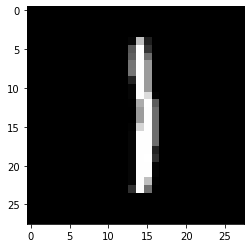

pred :  1 [1.11653979e-13 9.99996305e-01 1.11831426e-07 1.58025010e-10
 2.46009897e-08 1.06219738e-06 1.19508661e-06 1.40905380e-04
 2.21217690e-07 3.48542453e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


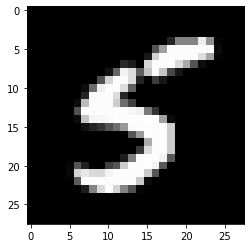

pred :  5 [7.3069602e-14 1.1906846e-07 1.3971330e-13 1.8468462e-08 2.0577679e-07
 9.9999970e-01 1.5066138e-11 4.1526502e-14 1.1564870e-09 1.4773572e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


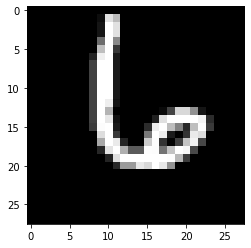

pred :  6 [2.2551081e-08 5.3301158e-10 1.2236683e-07 9.4706330e-15 5.6454992e-06
 2.3985500e-08 9.9999911e-01 2.5968652e-07 3.1790534e-12 3.1510594e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


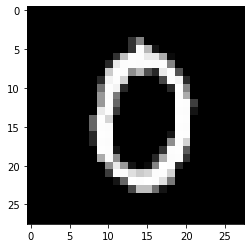

pred :  0 [9.9999696e-01 3.5315506e-13 8.5487466e-07 2.8280617e-10 1.6496258e-13
 1.7200724e-05 9.5388671e-08 2.1357901e-06 4.4630983e-09 2.8753281e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


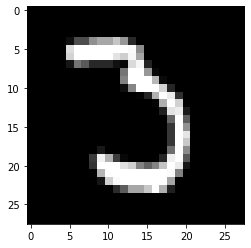

pred :  3 [1.9072177e-05 5.7544071e-07 4.3192506e-04 9.8743021e-01 9.4547720e-18
 2.9054304e-06 1.0225480e-10 2.3645594e-06 1.7945702e-13 7.7074249e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


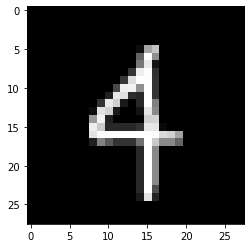

pred :  4 [9.6385541e-13 3.0576175e-05 9.9878516e-06 7.8035185e-08 9.9963236e-01
 9.1217982e-05 1.9448350e-06 4.1996762e-05 2.7273124e-08 1.5740317e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


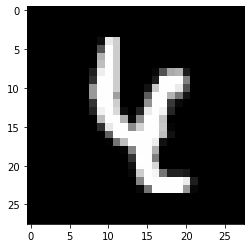

pred :  4 [6.9119376e-16 5.9750317e-05 1.1998795e-10 1.0613949e-07 9.9999964e-01
 5.8079355e-09 2.2925789e-08 5.5721889e-09 7.5719356e-07 3.6603701e-10]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


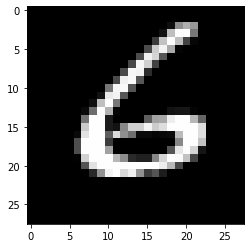

pred :  6 [2.0271909e-09 3.8288679e-08 1.1212547e-08 3.9845889e-07 1.0313142e-08
 1.3366790e-07 1.0000000e+00 1.3079855e-11 7.2908286e-13 5.0715838e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


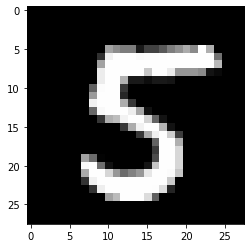

pred :  5 [4.6780335e-10 2.1103616e-10 2.6727700e-09 2.5914754e-10 6.2801354e-14
 1.0000000e+00 2.2860203e-12 4.4680763e-11 7.2331774e-10 3.3345824e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


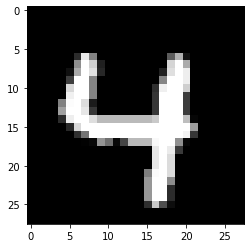

pred :  4 [3.1033780e-13 9.1572928e-14 3.4825167e-11 5.1561067e-09 1.0000000e+00
 6.5356693e-09 6.2088140e-11 6.1942924e-06 3.9526231e-09 8.6534361e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


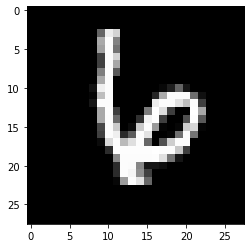

pred :  6 [8.55661264e-10 4.89649282e-13 1.41784703e-05 1.37045895e-11
 2.96743593e-07 9.62436242e-11 1.00000000e+00 1.19082202e-07
 9.92429694e-09 1.15720468e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


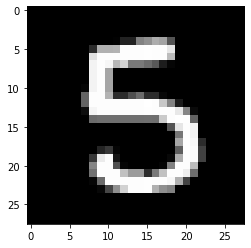

pred :  5 [7.9869356e-10 4.3652144e-11 1.5323871e-11 6.1442414e-08 7.6879665e-14
 1.0000000e+00 4.2550377e-10 2.1682992e-11 1.3344609e-06 3.6304791e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


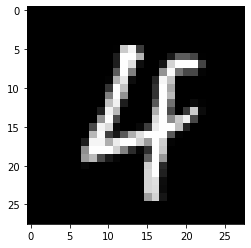

pred :  4 [4.7502613e-10 2.5380140e-10 2.8082607e-09 1.4298779e-07 9.9999738e-01
 3.2964500e-08 2.9442055e-09 5.8401227e-03 3.6960601e-09 2.4736795e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


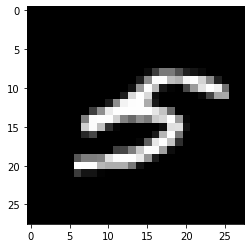

pred :  5 [3.9911706e-06 1.6323707e-09 2.9913988e-08 1.2867638e-06 1.9099433e-08
 9.9850649e-01 5.8062437e-06 5.3287081e-08 3.8856432e-11 3.8817577e-13]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


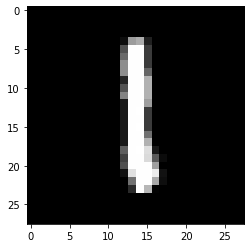

pred :  1 [1.1018496e-12 9.9999821e-01 4.2978277e-06 1.3024806e-08 5.3735499e-10
 2.2764147e-05 3.1588885e-07 3.9877541e-06 1.8894922e-05 7.1864908e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


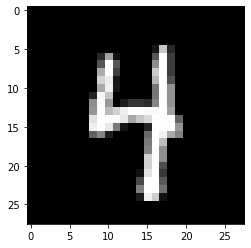

pred :  4 [1.87671235e-13 1.57447531e-08 6.20420049e-10 1.15271785e-11
 1.00000000e+00 7.22803065e-07 1.12649688e-10 4.97690451e-07
 2.51209244e-11 1.05338813e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


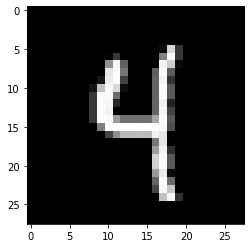

pred :  4 [7.33689859e-15 8.92143959e-08 6.72509010e-12 1.09708786e-07
 1.00000000e+00 7.10915674e-06 8.93343423e-14 1.38672596e-09
 4.49030235e-09 6.04921482e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


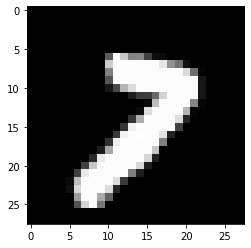

pred :  7 [1.3265931e-07 9.5143138e-09 3.2797630e-07 1.6199750e-05 5.7256205e-12
 2.9428595e-08 3.3362441e-11 9.9714744e-01 3.6114296e-05 4.0805637e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


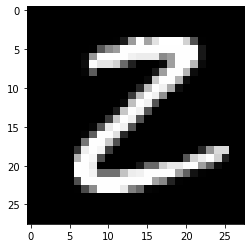

pred :  2 [7.8861731e-08 3.1075206e-06 9.9996233e-01 3.8105759e-07 1.3931427e-15
 8.9902530e-10 9.7375941e-10 7.6888311e-14 1.7854836e-07 1.1792685e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


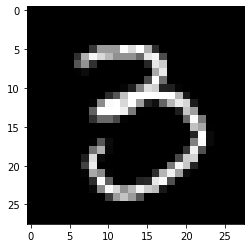

pred :  3 [1.08133236e-07 1.79802739e-09 4.77058393e-09 9.99997973e-01
 1.37571066e-10 7.77966670e-06 4.98885736e-14 2.81062000e-08
 5.22059854e-05 2.89512858e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


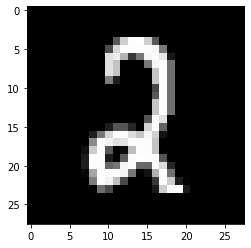

pred :  2 [3.6410718e-08 1.6092640e-07 1.0000000e+00 1.7220074e-07 2.4112084e-13
 3.5578205e-07 7.3629254e-09 4.8349562e-12 4.8691593e-09 2.7023541e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


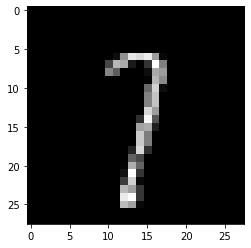

pred :  7 [6.0058260e-12 7.3672072e-06 9.3798587e-09 7.4149830e-06 1.9442044e-10
 3.6545835e-08 2.4591920e-13 9.8809862e-01 3.7046708e-09 6.0344788e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


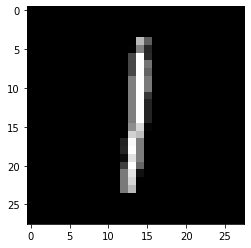

pred :  1 [4.25955868e-11 9.99999762e-01 2.08051554e-09 7.69515964e-07
 1.39794010e-10 1.00753405e-05 3.46281688e-08 1.16268927e-06
 1.65553772e-07 1.39389115e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


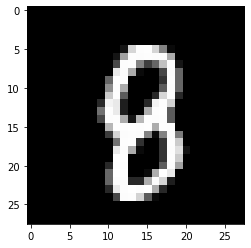

pred :  8 [4.4522515e-08 3.4249714e-10 8.8284189e-09 5.8520534e-05 1.7041494e-07
 1.1110097e-06 2.7941763e-03 3.3712536e-07 9.9975467e-01 3.9132237e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


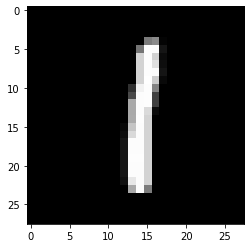

pred :  1 [3.0177843e-11 9.9999893e-01 2.9018304e-08 4.2167525e-07 1.7244568e-08
 5.1225361e-06 2.2306811e-08 3.3161064e-06 1.9105319e-06 3.0528285e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


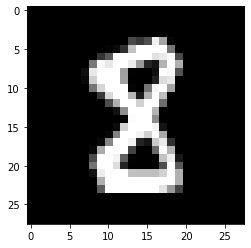

pred :  8 [2.9948026e-07 7.2705724e-08 6.5969229e-02 1.0640928e-07 7.3846551e-09
 2.7459927e-07 3.8143386e-09 2.6120608e-09 9.9978572e-01 1.8585800e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


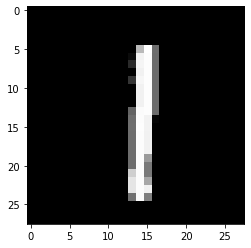

pred :  1 [2.4637239e-12 9.9999678e-01 1.1440130e-08 3.2422389e-07 1.8157078e-08
 3.8944211e-07 4.8083237e-08 8.9139985e-06 7.1004604e-07 1.3877289e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


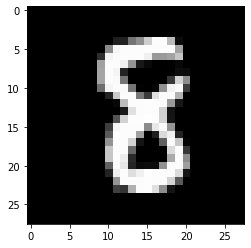

pred :  8 [2.2733121e-07 1.6111029e-08 2.0226471e-05 5.1371046e-08 5.6608020e-09
 2.1373181e-08 7.2736202e-07 2.1639045e-10 9.9999827e-01 4.6572663e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


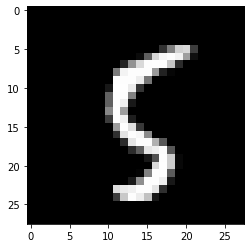

pred :  5 [4.0620016e-12 1.9693212e-05 3.1287598e-11 1.8560127e-07 3.9259625e-14
 1.0000000e+00 8.7308628e-08 2.1903715e-11 1.7625527e-07 5.0598592e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


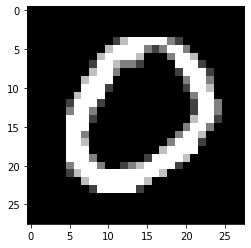

pred :  0 [9.9999964e-01 1.1885290e-07 8.7838333e-07 5.5401816e-10 1.6177046e-12
 9.8978512e-07 4.0131033e-07 9.6737829e-10 3.5979479e-14 1.3304694e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


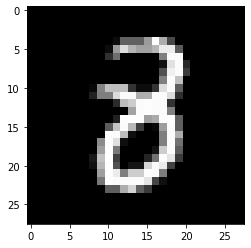

pred :  8 [1.2679347e-06 5.7505387e-09 2.2257056e-05 1.7076731e-03 5.3641955e-08
 2.1846784e-09 1.7506829e-06 8.0222035e-10 9.9996835e-01 2.4331442e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


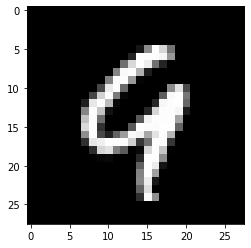

pred :  9 [2.9703351e-11 2.2636825e-13 4.0287277e-06 7.6533553e-07 2.9433509e-06
 2.3019251e-08 2.4431472e-05 1.1931080e-07 2.1661561e-09 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


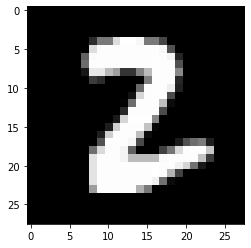

pred :  2 [2.2348257e-07 1.3759437e-07 9.9999857e-01 5.5853519e-07 5.3844369e-17
 3.4755942e-08 4.1938919e-13 5.5735683e-10 1.1469041e-07 3.1842497e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


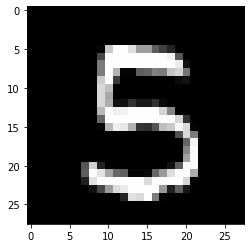

pred :  5 [4.8014865e-12 1.8859840e-10 1.3412029e-09 5.6532253e-06 6.8723463e-15
 9.9993551e-01 3.5006559e-12 2.8577721e-13 1.0146273e-10 1.5398860e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


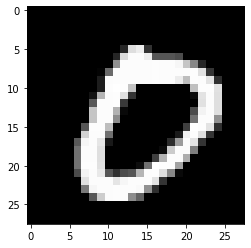

pred :  0 [1.00000000e+00 1.16127865e-06 1.05874358e-08 3.92382932e-10
 2.58570817e-14 1.11792615e-05 1.75689552e-09 6.77221550e-08
 2.65255218e-09 1.80651472e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


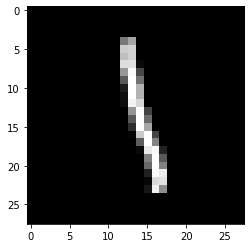

pred :  1 [5.2098667e-16 9.9981213e-01 1.6146454e-06 6.3005717e-07 1.2811587e-07
 1.5580654e-04 8.4255936e-10 6.7739947e-09 9.7313523e-04 2.6531950e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


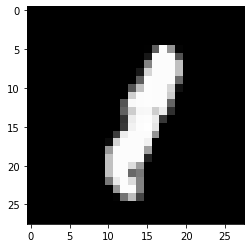

pred :  1 [1.1231073e-06 9.9998534e-01 6.4331502e-06 2.7262592e-10 1.2122857e-06
 1.3271745e-08 3.6466595e-08 1.7755316e-05 4.2427950e-05 5.3572226e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


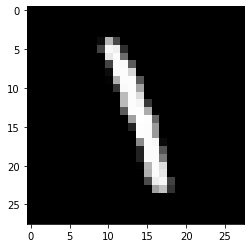

pred :  1 [6.7151654e-17 9.9995399e-01 2.9328868e-07 4.6609521e-06 2.0321752e-07
 3.4337449e-05 2.1209754e-09 6.6695104e-12 3.9686061e-06 1.5747841e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


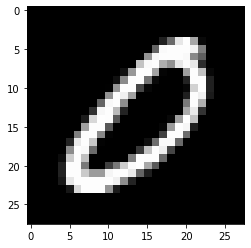

pred :  0 [9.9999917e-01 5.0318960e-08 7.7153680e-05 4.2272913e-10 8.4545176e-11
 5.3440954e-07 2.8075192e-07 4.0824877e-10 1.3254435e-09 5.4185649e-11]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


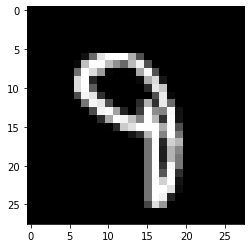

pred :  9 [5.91312860e-13 4.65837161e-11 3.17953996e-11 4.86134127e-07
 1.36137009e-04 4.58168081e-08 1.00151436e-10 8.58545536e-05
 6.26389374e-05 9.99654889e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


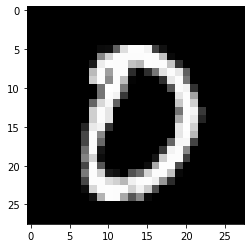

pred :  0 [9.99992907e-01 3.43960305e-10 1.80020572e-06 8.02544808e-10
 8.90628039e-14 1.28626625e-05 1.32362385e-10 4.35159855e-05
 5.65487171e-11 8.32746155e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


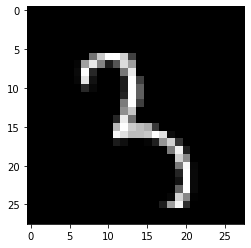

pred :  3 [2.8543452e-17 2.6072116e-06 1.3633702e-05 9.9526680e-01 1.0581914e-10
 3.4207446e-06 8.6019403e-10 8.3161000e-10 4.4234693e-03 3.6349136e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


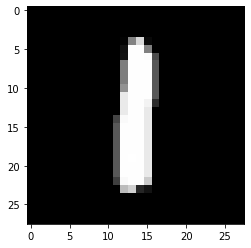

pred :  1 [5.6795524e-10 9.9998730e-01 6.4597180e-07 1.5137676e-09 1.5601740e-06
 1.1013903e-05 2.9593803e-06 5.2125019e-06 6.9090296e-05 9.2016521e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


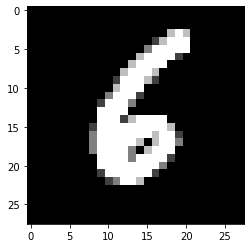

pred :  6 [6.1264394e-09 2.3977266e-08 1.1093094e-06 3.9115277e-11 5.0558604e-08
 1.8864870e-04 1.0000000e+00 2.9362754e-13 6.8920802e-10 8.7712421e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


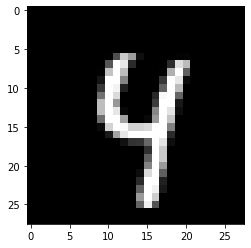

pred :  4 [3.7339915e-16 1.0012728e-08 1.2562308e-10 1.1133251e-08 1.0000000e+00
 1.0402212e-06 1.5489384e-13 9.1363245e-06 8.3779232e-09 1.1686501e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


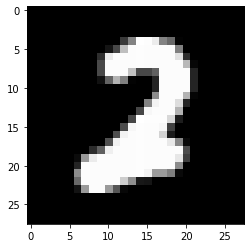

pred :  2 [4.9637244e-10 1.4531399e-06 9.9185681e-01 5.1338375e-03 5.1564232e-16
 2.2684502e-07 3.0128397e-10 9.6378708e-06 1.8656254e-04 1.3688674e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


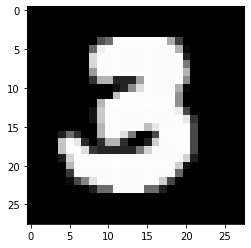

pred :  3 [3.9228513e-07 9.1556346e-10 3.5515288e-05 9.9941456e-01 9.5040885e-12
 2.7271201e-06 5.6100597e-12 1.1728026e-13 7.1321265e-05 2.0466727e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


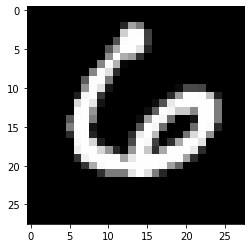

pred :  6 [1.0256652e-07 2.9444960e-10 7.5688160e-07 3.9725383e-09 2.8016962e-09
 1.4790127e-11 1.0000000e+00 7.4609936e-09 7.2533340e-10 2.9866555e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


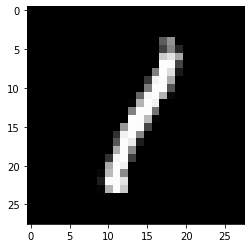

pred :  1 [1.2842597e-07 9.9999881e-01 4.0640366e-06 2.1920067e-10 1.3749310e-07
 6.3133015e-08 3.3092491e-09 9.1062833e-07 8.5916021e-08 2.0311154e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


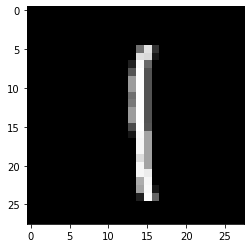

pred :  1 [1.5493158e-14 9.9999833e-01 4.4206105e-09 5.2473126e-07 9.1052443e-12
 1.5277288e-06 2.6118669e-05 1.9180368e-06 3.4135119e-05 4.4177725e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


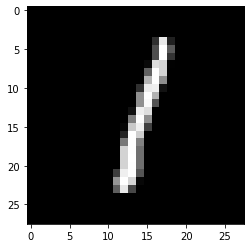

pred :  1 [2.7407717e-08 9.9999970e-01 9.1673735e-07 1.8652537e-09 3.9347395e-07
 4.9680348e-06 8.9609699e-08 2.3194428e-07 3.0742092e-06 8.1439785e-11]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


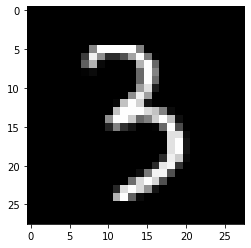

pred :  3 [2.5049190e-12 6.1304689e-10 1.7542828e-10 1.0000000e+00 1.6969317e-08
 1.8299373e-07 1.4254997e-12 1.2442469e-08 2.7949847e-07 6.4566192e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


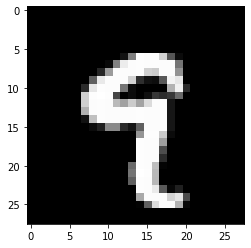

pred :  9 [3.59038665e-14 1.07448750e-12 7.54465574e-08 1.07671765e-08
 1.99698461e-05 3.52978837e-08 6.69114232e-13 7.74496311e-06
 7.08699226e-04 9.99913394e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


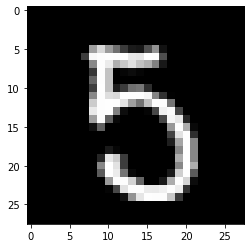

pred :  5 [8.7914387e-08 9.3847929e-10 9.3516557e-12 3.8498997e-06 4.6734139e-10
 9.9999535e-01 3.6462070e-12 5.2572307e-07 1.9602025e-08 3.3725559e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


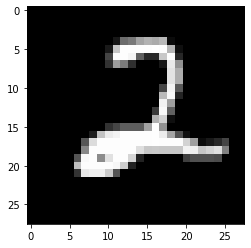

pred :  2 [1.0591940e-12 8.6184535e-08 1.0000000e+00 6.9664752e-10 2.5033252e-11
 5.3709192e-07 7.2464964e-08 1.0636605e-11 1.4644907e-12 1.2987563e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


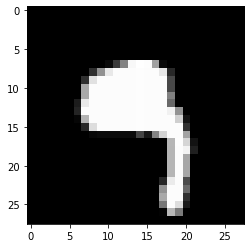

pred :  9 [4.0197159e-10 2.2692581e-10 4.3090829e-09 8.7143671e-06 4.7949115e-06
 1.3968015e-05 8.3225487e-16 5.6979252e-07 9.4646477e-09 9.9999869e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


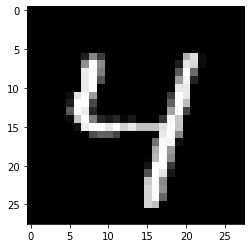

pred :  4 [3.0446672e-12 5.7762887e-15 3.0462313e-11 1.3693048e-10 9.9999785e-01
 1.2012593e-08 4.4201930e-11 4.7284365e-04 1.7213884e-07 3.8148755e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


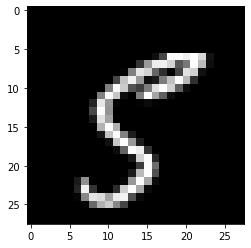

pred :  5 [6.5525291e-10 1.3706832e-08 6.4125774e-11 2.0386742e-05 3.7083568e-15
 9.9610019e-01 2.3787199e-14 5.1019981e-07 1.9321126e-06 5.0366805e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


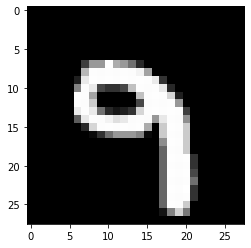

pred :  9 [1.5198914e-10 2.8001937e-10 2.5062728e-11 4.1851401e-04 8.6239371e-10
 7.6920044e-09 1.5855708e-09 1.2577881e-06 3.6184554e-07 9.9999970e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


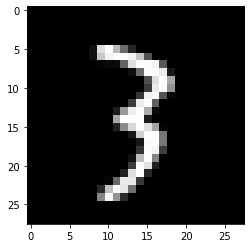

pred :  3 [5.0413840e-13 4.0268336e-08 1.5135084e-08 9.9999130e-01 1.2696916e-10
 8.4832024e-08 9.9066034e-15 1.6823411e-04 3.3990071e-09 5.9332532e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


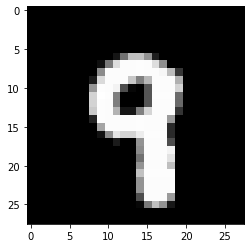

pred :  9 [8.8750535e-12 5.5273099e-12 3.9655736e-09 7.7134139e-08 5.0788976e-06
 1.6905481e-08 3.0826595e-13 2.0629121e-05 3.9009750e-03 9.9990916e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


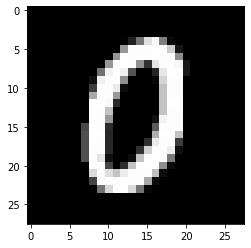

pred :  0 [9.9995792e-01 3.1634177e-12 2.2038817e-04 5.1020732e-10 1.1683625e-08
 2.8602207e-09 5.3058639e-06 1.3497707e-05 3.1603378e-07 2.5299788e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


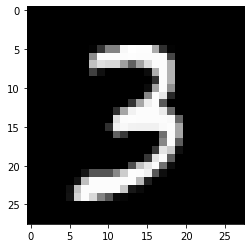

pred :  3 [6.3850096e-14 2.7349567e-10 9.6501481e-08 1.0000000e+00 5.6191943e-12
 1.1180844e-10 1.1258195e-15 7.8667781e-06 3.8283179e-13 9.5135562e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


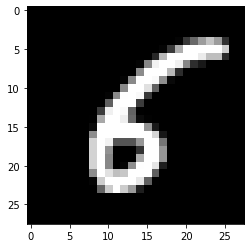

pred :  6 [9.9401774e-08 8.1176148e-07 2.2797515e-07 6.3669686e-12 1.5470295e-11
 3.8422784e-01 9.9654579e-01 1.1381615e-14 3.0426992e-08 4.6393410e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


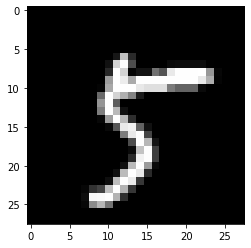

pred :  5 [1.0501617e-12 1.9173023e-11 3.0909462e-11 2.6523248e-05 7.4751193e-14
 1.0000000e+00 7.9631253e-15 2.3934960e-02 1.8622134e-10 5.3384719e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


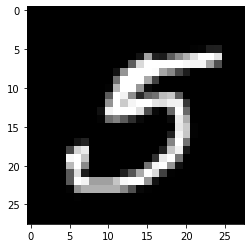

pred :  5 [1.7815230e-08 2.8396368e-08 7.6830408e-14 1.9578897e-08 9.9091317e-12
 9.9999976e-01 8.7542569e-12 7.7695782e-13 2.1605157e-07 2.9126436e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


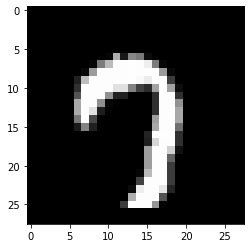

pred :  7 [7.7471714e-06 1.6453437e-12 6.1326122e-09 3.6432373e-09 2.9077751e-12
 2.9181805e-07 1.3370453e-12 9.9999750e-01 6.9675277e-13 2.0019595e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


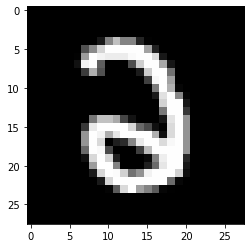

pred :  2 [3.1179190e-04 8.9322673e-12 9.9992740e-01 2.3234390e-05 8.7224559e-12
 2.1102541e-07 2.5370318e-06 4.9719731e-08 5.2799987e-10 1.2410134e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


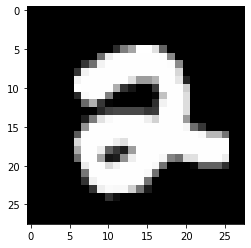

pred :  2 [1.8859275e-07 2.2339946e-11 1.0000000e+00 5.0658099e-07 1.5986473e-12
 5.1633528e-08 6.3068660e-07 2.9863021e-08 9.4443931e-06 1.2466550e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


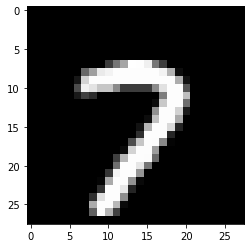

pred :  7 [1.3586533e-07 1.3715696e-12 1.1913837e-08 5.0606144e-07 1.2608677e-15
 3.4561061e-12 2.5292103e-13 9.9999809e-01 1.0284860e-11 3.6097442e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


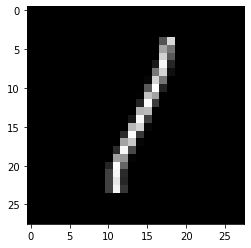

pred :  1 [6.4147248e-09 9.9965763e-01 1.6409159e-04 2.2457827e-10 1.7282568e-06
 2.1269938e-05 2.4333482e-09 1.3763098e-07 2.8796094e-07 1.6688389e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


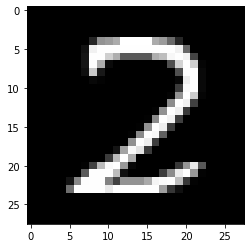

pred :  2 [4.2562618e-07 3.0370941e-07 9.9996519e-01 9.6866897e-06 6.8535204e-12
 2.3267674e-05 1.1317269e-12 8.6904849e-13 3.8387009e-09 7.7639498e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


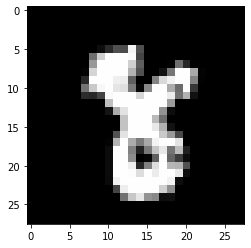

pred :  8 [2.9102390e-08 1.3792832e-07 2.0044324e-06 1.6390395e-05 5.9271312e-09
 2.5002892e-08 1.1825362e-08 1.4281225e-09 9.9999845e-01 3.6359292e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


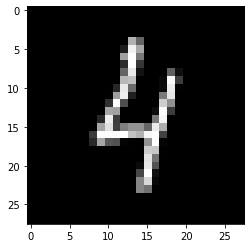

pred :  4 [1.22106153e-11 8.73064607e-08 6.96743291e-06 2.97190212e-07
 9.99999523e-01 6.99210432e-07 1.25367805e-08 3.25012406e-05
 9.82055770e-10 1.11521931e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


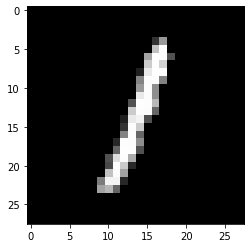

pred :  1 [6.8031407e-09 9.9999917e-01 1.1375811e-06 8.5051424e-11 1.0792189e-06
 1.6636548e-06 2.2252500e-08 1.8004881e-07 4.5985125e-06 4.4107482e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


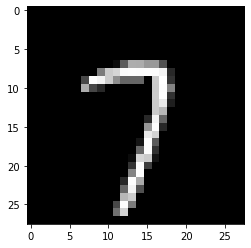

pred :  7 [1.5405208e-09 1.9071694e-08 3.8986761e-07 1.9110939e-05 7.3426877e-13
 3.3231484e-11 2.9840710e-15 9.9999714e-01 1.0164058e-13 1.2362401e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


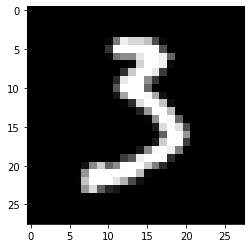

pred :  3 [1.7431775e-08 1.9095592e-06 9.8954069e-07 1.0000000e+00 2.2390196e-11
 1.1212511e-05 5.1964027e-11 3.8734305e-09 1.1550684e-07 2.2271514e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


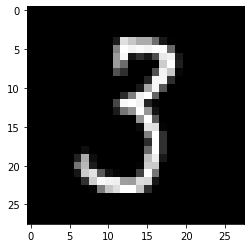

pred :  3 [1.3415804e-07 2.7319345e-05 4.6336170e-09 9.9999982e-01 1.1083708e-09
 7.0648567e-09 1.1077325e-13 6.8478528e-11 3.3657716e-06 1.5018077e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


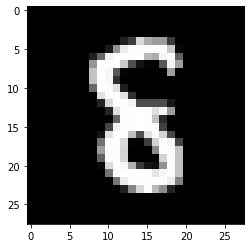

pred :  8 [2.0025150e-09 1.4974383e-10 3.7842477e-07 1.8859156e-10 2.7935172e-12
 2.0723939e-02 2.7173758e-04 5.8947844e-13 9.9688339e-01 3.4732699e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


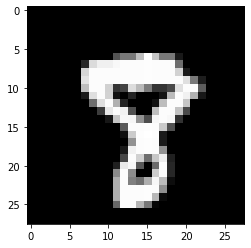

pred :  8 [1.5886281e-09 6.3757886e-13 1.5303244e-06 2.6875079e-01 9.0639354e-12
 1.8550544e-08 6.9196249e-13 1.2101754e-04 8.2768238e-01 1.1217445e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


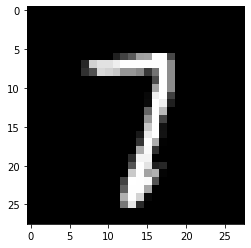

pred :  7 [5.8035138e-10 4.2026329e-07 2.6289676e-05 4.3608024e-06 2.4411646e-15
 4.7446540e-11 1.4105080e-12 9.9991107e-01 1.0866417e-11 1.0731441e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


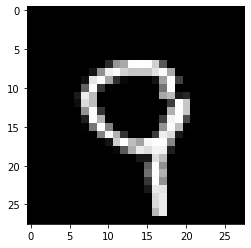

pred :  9 [2.8453960e-07 8.2200990e-16 6.1593781e-08 1.6940380e-11 9.8822362e-08
 2.6869926e-11 1.6879616e-11 1.6480684e-04 7.7357356e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


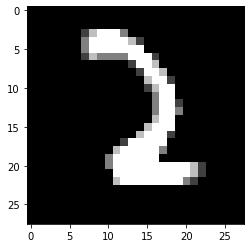

pred :  2 [5.3482250e-09 1.8062495e-09 9.9999762e-01 2.1112626e-05 1.1563496e-14
 2.7202351e-09 6.3201032e-06 4.5970736e-10 3.5575234e-10 4.1765542e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


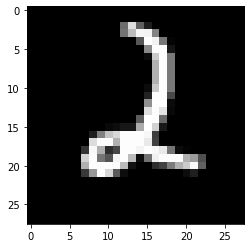

pred :  2 [1.6190266e-11 6.4948201e-04 1.0000000e+00 5.7768379e-08 9.0694180e-12
 1.1309123e-10 5.3286371e-08 5.6353610e-15 9.5274337e-11 2.0740060e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


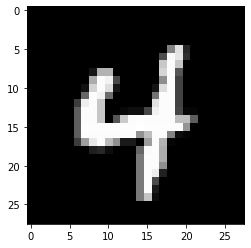

pred :  4 [4.94152733e-13 1.99426559e-10 3.07837622e-09 4.55640592e-09
 1.00000000e+00 4.99717707e-08 7.53270726e-08 1.65137326e-09
 1.35551865e-11 3.41958344e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


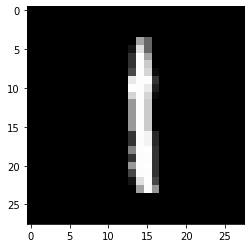

pred :  1 [9.7136676e-13 1.0000000e+00 2.8392035e-08 1.6997369e-08 1.6775321e-09
 6.0844999e-05 2.2784518e-07 1.5314465e-05 1.4853192e-06 5.5948757e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


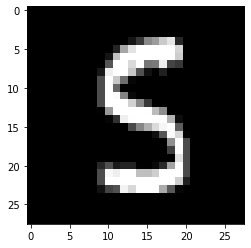

pred :  5 [2.8856034e-12 3.4494730e-07 5.7206051e-10 6.8113629e-08 4.5209706e-14
 9.9999893e-01 7.7135492e-11 1.1815158e-14 1.6163962e-09 3.3027828e-03]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


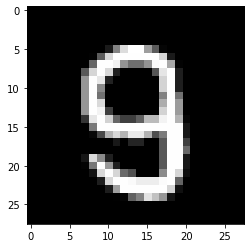

pred :  9 [5.2778068e-07 2.3216013e-14 3.2031610e-07 2.3381117e-05 3.8495798e-10
 4.6607765e-05 1.2732778e-11 4.5403628e-10 1.9815075e-01 9.7632754e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


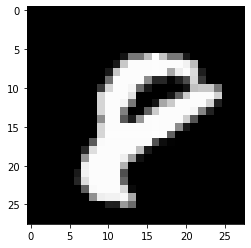

pred :  8 [2.0415721e-08 3.0100911e-12 3.2412123e-07 6.6474315e-10 2.1640903e-06
 6.5563388e-11 2.2215946e-08 1.7836890e-06 1.0000000e+00 8.9749694e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


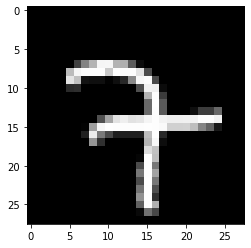

pred :  7 [3.3426164e-13 1.8827627e-11 4.6584010e-04 2.9745220e-09 1.2254557e-06
 6.9323569e-10 8.5775982e-09 1.0000000e+00 8.6501834e-13 9.0259089e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


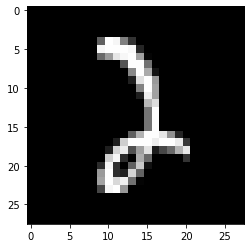

pred :  2 [3.8192269e-11 3.3353791e-07 9.9999678e-01 1.8871437e-07 7.4117584e-10
 1.7526793e-06 9.4383331e-08 3.0664057e-06 1.1906319e-04 2.2906098e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


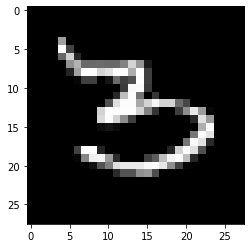

pred :  3 [3.3449958e-09 3.3550614e-06 5.8555759e-07 9.9999231e-01 3.4007774e-09
 1.7555699e-08 1.1669044e-07 3.9682521e-07 3.6288192e-09 1.4026433e-14]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


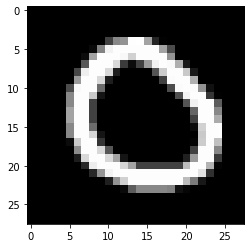

pred :  0 [1.0000000e+00 3.5413246e-09 9.4991692e-06 3.4900524e-10 1.0212382e-10
 3.3187339e-07 4.5210942e-09 6.4351746e-10 6.8025468e-12 3.5134575e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


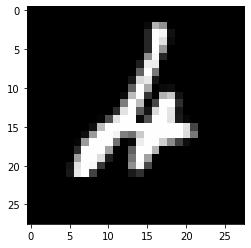

pred :  2 [1.0181128e-10 6.0385169e-08 8.9924186e-01 7.6491560e-08 1.9922447e-01
 4.9213924e-08 6.8413508e-01 2.0178889e-10 8.8831840e-08 3.3412505e-14]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


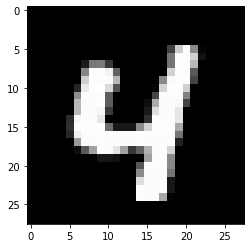

pred :  4 [9.85174789e-12 1.13666346e-12 4.91603737e-11 1.82766389e-08
 1.00000000e+00 1.36722615e-08 9.12646569e-10 1.55191799e-07
 1.24777739e-06 9.44968178e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


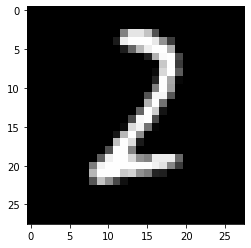

pred :  2 [1.4311152e-07 2.3644974e-05 9.9999666e-01 5.4648775e-05 6.1880733e-16
 1.0388778e-08 5.4825469e-09 3.8344092e-11 5.9992551e-08 6.2119381e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


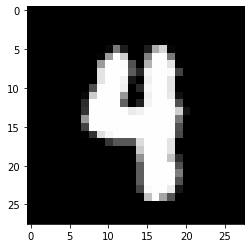

pred :  4 [3.0707391e-14 8.6512145e-11 6.7577758e-12 3.7308315e-08 9.9905598e-01
 5.7575630e-07 2.2082805e-10 6.3307020e-06 1.9983656e-07 1.2385249e-02]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


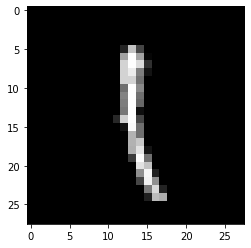

pred :  1 [1.9889834e-12 9.9975741e-01 3.4291406e-07 1.8581748e-04 1.9536632e-08
 5.7082158e-05 2.6521198e-07 2.4159573e-07 3.1408933e-06 2.1846420e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


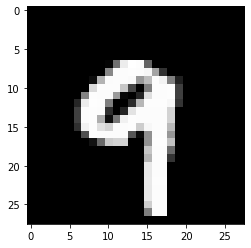

pred :  9 [3.45229297e-11 1.06625075e-14 3.79899712e-09 9.85217639e-07
 2.37440830e-07 4.66891059e-08 1.19833574e-10 1.88006163e-06
 1.22697874e-09 1.00000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


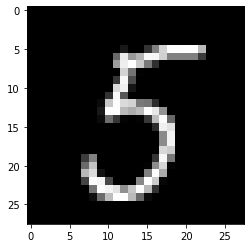

pred :  5 [9.7029969e-14 1.0116346e-05 4.3990508e-10 6.0817811e-08 1.6109898e-11
 1.0000000e+00 4.3951343e-10 7.2662740e-12 1.1085114e-11 3.2355979e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


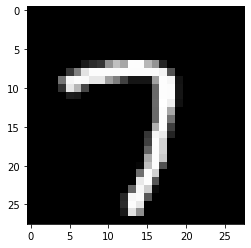

pred :  7 [1.6864098e-08 3.1687486e-09 1.3224360e-05 3.5698520e-07 4.7486165e-16
 9.8509256e-11 1.0886503e-14 9.9999762e-01 4.0785219e-16 8.3649944e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


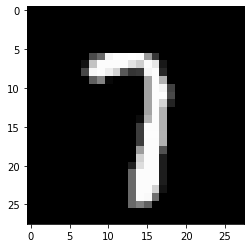

pred :  7 [4.5083839e-09 1.2191650e-07 4.6887994e-04 5.1928506e-09 2.3894024e-13
 3.8181271e-11 3.7309522e-12 9.9988258e-01 5.0675734e-11 2.5422210e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


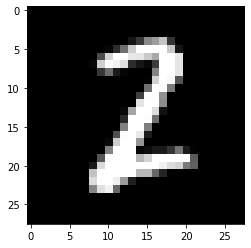

pred :  2 [6.3303329e-10 1.5461445e-04 9.9999970e-01 7.7348687e-07 5.5874919e-17
 3.7649492e-09 7.0934612e-11 1.9831377e-07 1.1012248e-06 6.3731805e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


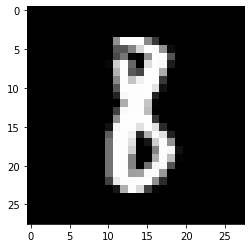

pred :  8 [1.0242229e-06 4.8163533e-04 2.6504664e-05 4.0037528e-05 2.5497393e-08
 1.6334851e-06 8.1786384e-05 3.4365048e-08 9.7869563e-01 4.6974630e-10]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


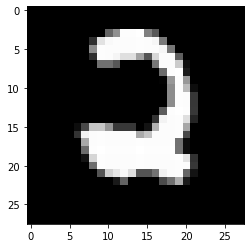

pred :  2 [4.4142912e-09 2.5104557e-10 9.9999958e-01 3.7191583e-06 9.8847423e-12
 2.2619187e-08 6.5621379e-07 1.5034152e-12 3.1097477e-13 2.9848926e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


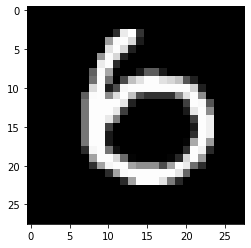

pred :  6 [2.2201523e-01 1.3272294e-09 9.8268160e-10 7.2877714e-07 1.2951181e-12
 5.5747249e-05 9.1508210e-01 1.8374632e-06 3.0274006e-11 2.2214839e-16]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


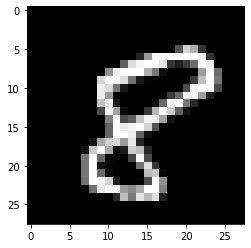

pred :  8 [1.0982078e-11 2.7186012e-13 7.5463258e-06 2.1696348e-08 6.5945659e-11
 2.1690418e-09 3.7489571e-08 7.8099097e-11 1.0000000e+00 8.6979362e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


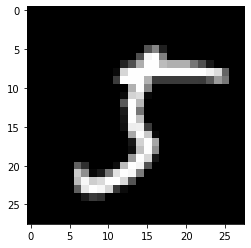

pred :  5 [3.0225640e-12 9.2350109e-07 2.5687959e-12 1.2628500e-07 3.5258043e-16
 1.0000000e+00 1.4012555e-14 1.9968910e-11 1.7837349e-06 7.3424118e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


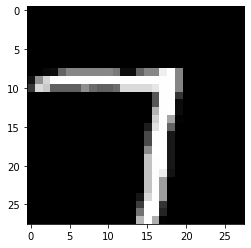

pred :  7 [2.3156313e-10 7.7758167e-10 3.0968328e-09 2.7472616e-08 8.2500453e-14
 3.6463849e-10 3.8191211e-13 1.0000000e+00 1.9761407e-13 2.8533931e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


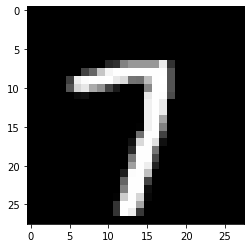

pred :  7 [1.88226809e-10 1.35429055e-08 6.09619747e-07 8.44875956e-08
 4.99573733e-12 5.33528777e-12 2.23700995e-14 9.99997616e-01
 5.13954927e-14 1.36796698e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


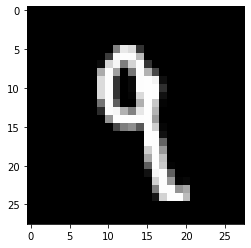

pred :  9 [8.57128442e-13 1.03439648e-04 1.65786886e-08 2.80877499e-09
 2.59282649e-01 2.49115910e-08 1.33540775e-14 1.39259569e-07
 1.42365694e-04 9.99398172e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


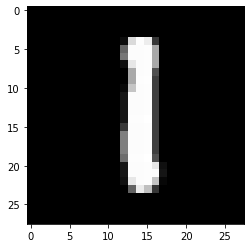

pred :  1 [1.0782594e-11 9.9997652e-01 9.8815156e-07 7.6923754e-08 1.3205815e-08
 9.5246141e-06 3.9680724e-08 1.6625746e-06 4.6501232e-06 5.7104177e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


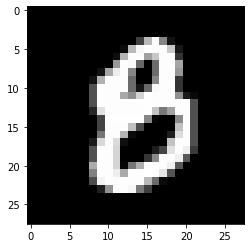

pred :  8 [3.4931302e-04 5.0202531e-10 4.9352107e-06 1.6632676e-04 1.6921828e-09
 6.2649990e-05 6.8441979e-05 5.1266994e-12 9.9705696e-01 3.3099232e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


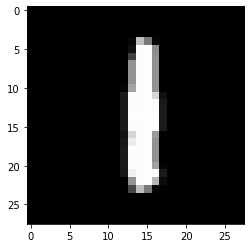

pred :  1 [8.6550851e-13 9.9999881e-01 1.7985026e-07 1.2415521e-07 3.7522693e-06
 3.2029868e-07 1.0081573e-06 1.3275367e-06 2.7109859e-06 6.7080782e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


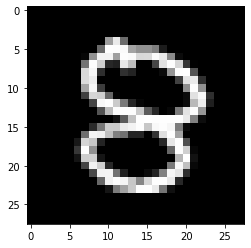

pred :  8 [8.6164810e-08 1.7355651e-14 3.5852194e-04 9.4021423e-05 2.7619556e-09
 1.0369413e-05 3.2921441e-09 1.3594924e-12 9.6596801e-01 6.3901633e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


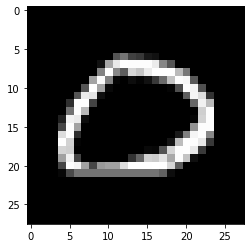

pred :  0 [9.9986625e-01 1.7426140e-10 2.8811655e-06 6.2606564e-09 1.8482396e-14
 7.5914102e-08 4.2938963e-09 1.9922853e-04 2.3856398e-14 9.2473892e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


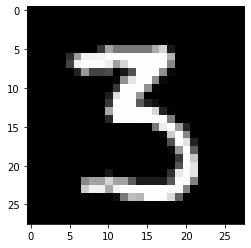

pred :  3 [3.0861524e-10 2.3172650e-07 8.1257703e-09 9.9999386e-01 7.1246919e-10
 6.2965923e-06 3.1248454e-16 4.8329674e-11 4.9674519e-08 1.1570061e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


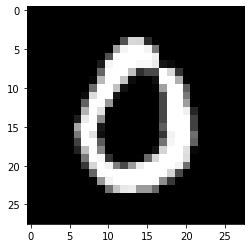

pred :  0 [9.9998862e-01 1.7138312e-10 6.9698691e-04 2.8020382e-09 1.8177218e-11
 1.1381524e-07 9.4231245e-06 1.0720680e-06 2.8611495e-12 1.6218672e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


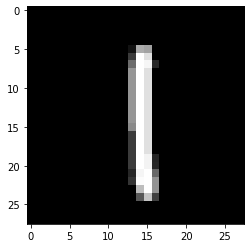

pred :  1 [2.5044293e-14 9.9999952e-01 6.3287942e-08 4.6478061e-09 1.7072049e-10
 1.1820717e-06 1.1537215e-06 1.0217766e-05 3.3014933e-06 1.2443638e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


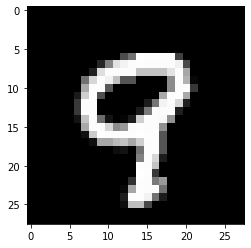

pred :  9 [5.98060609e-13 1.01856135e-14 4.02271887e-08 4.52220440e-03
 2.88090996e-10 2.77315841e-08 2.24682703e-11 4.38441566e-05
 6.98927834e-05 9.99949574e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


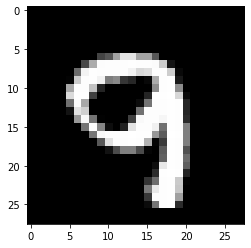

pred :  9 [3.9210576e-08 1.3839072e-12 2.8028830e-07 4.1018635e-02 5.4888982e-09
 7.6069406e-10 1.6921740e-08 5.3548320e-06 3.1953961e-05 9.9915254e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


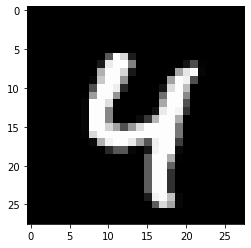

pred :  4 [1.1653877e-14 3.3043843e-14 7.3775173e-09 1.6573978e-08 9.9999249e-01
 5.3992807e-08 8.4429358e-10 2.6554339e-08 8.4396309e-11 1.2531877e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


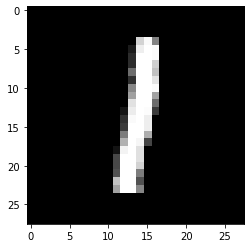

pred :  1 [3.9010559e-09 9.9999934e-01 5.2865239e-08 8.5148084e-09 1.5333491e-07
 3.3965802e-07 1.1787170e-08 8.1114860e-07 7.3540417e-07 1.3010641e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


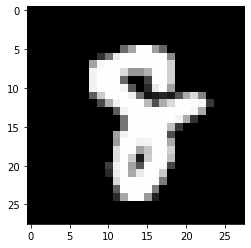

pred :  8 [6.0514481e-06 2.0705543e-10 7.0133487e-05 1.8645399e-06 2.2481551e-08
 2.5331393e-10 7.1771424e-08 4.4447184e-04 9.9999535e-01 2.4643540e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


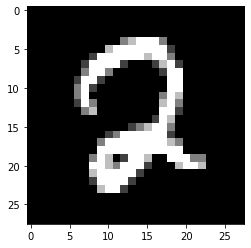

pred :  2 [1.5669863e-07 1.3402313e-09 1.0000000e+00 1.4926221e-10 2.5398311e-13
 5.2857399e-04 9.6515885e-07 9.3632401e-08 2.1660242e-05 1.9755964e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


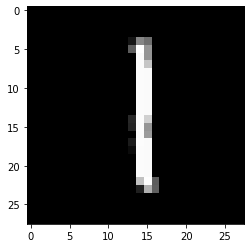

pred :  1 [7.1522801e-13 9.9999976e-01 1.4702732e-08 2.1082704e-09 4.5494239e-09
 1.5768008e-05 2.0772524e-07 8.9118985e-06 1.4416892e-07 9.0493053e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


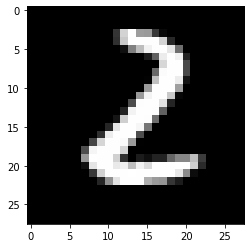

pred :  2 [7.9763138e-09 2.0034349e-06 9.9999946e-01 1.8032144e-06 3.0570354e-14
 1.2294543e-10 7.9063804e-09 8.2116177e-13 2.2962793e-06 1.3777990e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


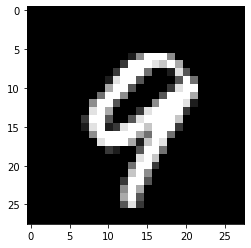

pred :  9 [6.1521331e-12 3.4635512e-15 1.7062895e-05 2.7810100e-05 7.1370087e-06
 2.6722780e-11 2.1011621e-08 1.4537345e-08 2.6747349e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


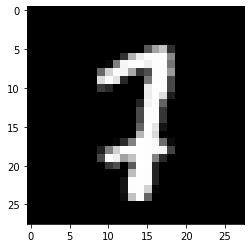

pred :  7 [7.7118072e-09 1.7243624e-04 9.3773603e-03 1.5877051e-06 6.2228005e-12
 1.0061579e-09 1.2618321e-08 9.8594773e-01 1.0787363e-04 1.6612909e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


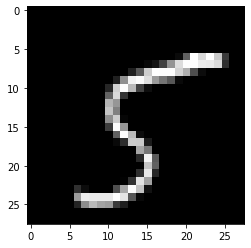

pred :  5 [6.9871009e-14 8.5082013e-09 4.4255917e-15 1.3304060e-06 1.3724128e-15
 9.9999928e-01 1.5420074e-14 1.4940299e-07 2.5971955e-10 1.1726200e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


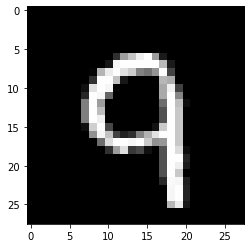

pred :  9 [4.5007374e-07 1.1514707e-13 2.2339821e-04 2.0758728e-10 3.8566757e-08
 7.8976088e-09 3.3968748e-09 3.7491288e-06 1.8245788e-07 9.9999976e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


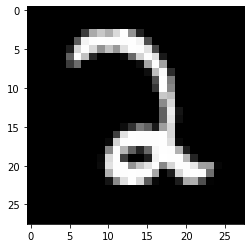

pred :  2 [2.7720850e-08 2.7226712e-08 1.0000000e+00 7.1836205e-08 1.9591892e-16
 1.5198553e-06 6.2242258e-08 3.3235018e-12 1.9541810e-12 1.1161481e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


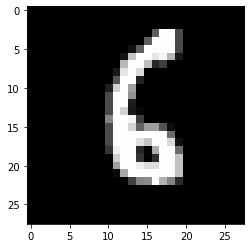

pred :  6 [3.9223627e-10 7.2831164e-05 5.8490932e-06 2.2779638e-12 2.2267784e-12
 7.0717931e-04 9.9999344e-01 8.1734465e-16 7.6265860e-07 1.4788252e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


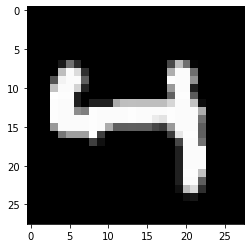

pred :  4 [4.8419424e-12 2.1080583e-12 9.0990824e-08 9.2111474e-09 9.9973607e-01
 7.0623873e-10 2.7626129e-10 1.3623460e-05 2.5408247e-09 1.7941718e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


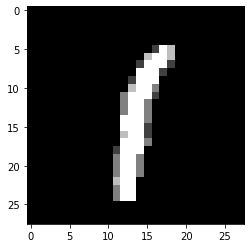

pred :  1 [1.5248263e-08 9.9968338e-01 3.6106923e-11 6.2372801e-10 4.3561741e-07
 3.8293356e-06 1.2435406e-05 1.3586879e-04 5.0541759e-04 1.1030363e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


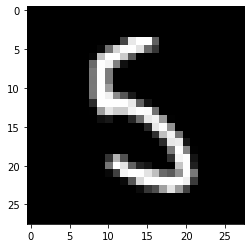

pred :  5 [5.6805377e-14 1.7078996e-07 5.6772453e-10 2.6123922e-07 1.0160474e-09
 9.9998128e-01 9.3097761e-09 1.1019905e-12 7.5072944e-07 7.6526328e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


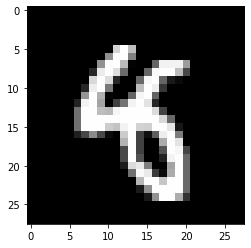

pred :  8 [2.1149440e-13 2.9092138e-07 2.5674332e-09 1.9502129e-05 5.8560032e-01
 1.6948581e-04 7.3865709e-09 5.1621387e-09 9.9761903e-01 1.6078428e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


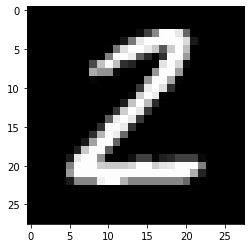

pred :  2 [1.1546339e-08 7.2443727e-05 9.9998689e-01 7.9476912e-08 2.7288066e-15
 8.4051288e-10 5.4084719e-09 6.1169894e-14 1.3588704e-08 2.8385290e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


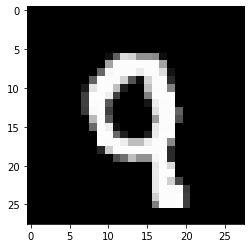

pred :  9 [1.6692911e-07 2.2795742e-10 1.2230202e-04 3.0514869e-08 5.8429158e-08
 2.5404854e-09 2.6818892e-10 8.1323844e-05 2.3769482e-05 9.9999660e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


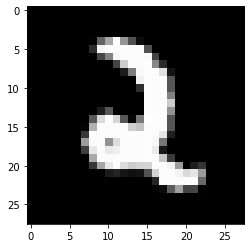

pred :  2 [4.2831849e-11 2.2116612e-06 9.9999952e-01 2.0943002e-08 1.4545014e-06
 2.9805562e-07 3.3606681e-10 1.2833071e-09 2.0361344e-09 1.7630192e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


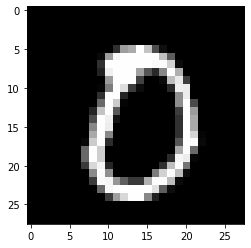

pred :  0 [9.9997854e-01 9.6717763e-09 4.6327713e-08 1.6329189e-07 2.9600329e-13
 2.4482608e-04 1.5850755e-08 2.7135982e-08 3.1158817e-07 4.7037975e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


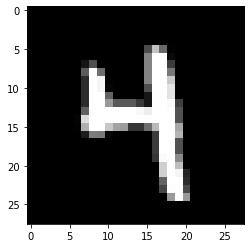

pred :  4 [6.82280079e-13 1.17779952e-09 6.58281323e-08 5.58573499e-09
 9.99999225e-01 1.61734079e-06 6.41444580e-12 6.62931967e-08
 3.33969163e-09 1.08865825e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


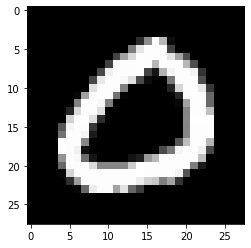

pred :  0 [1.0000000e+00 8.2955133e-08 4.5074341e-07 8.0138769e-08 6.8565826e-15
 3.2622737e-08 1.2493258e-09 3.5946044e-08 1.1550561e-13 8.8219885e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


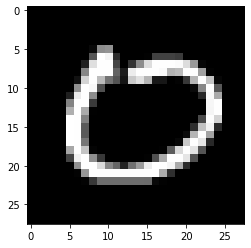

pred :  0 [9.9999017e-01 7.4302235e-08 4.8333870e-09 1.3697600e-09 3.2462433e-14
 9.0253678e-05 1.7530678e-07 1.0328675e-06 1.6681100e-13 7.3964003e-12]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


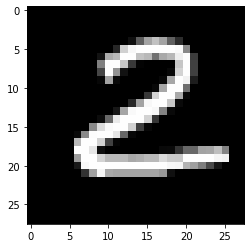

pred :  2 [2.1128144e-10 1.7802316e-07 9.9999452e-01 9.4014155e-07 4.8467629e-17
 2.5601812e-09 2.8594189e-09 8.0975105e-15 1.2708649e-07 3.3739872e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


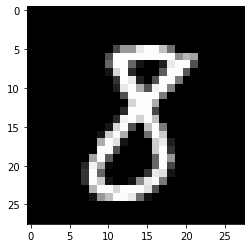

pred :  8 [3.3125898e-09 1.6406620e-08 4.0290579e-06 4.2390598e-06 1.8966755e-11
 1.2085111e-04 1.8063588e-10 5.1854204e-08 9.9998218e-01 6.5251974e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


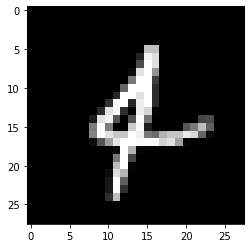

pred :  4 [5.3849691e-10 3.3978597e-07 2.5681435e-05 1.4307291e-07 9.9976945e-01
 3.9214521e-07 4.7086429e-05 2.7081370e-04 1.7723036e-09 1.3948884e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


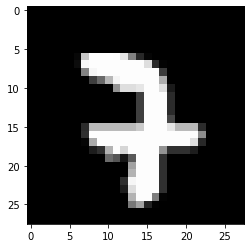

pred :  7 [1.60035884e-12 7.21890236e-09 1.28124548e-05 1.61290169e-04
 1.48463158e-07 1.44012056e-08 1.03853003e-10 9.99987602e-01
 2.47184460e-11 1.13528294e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


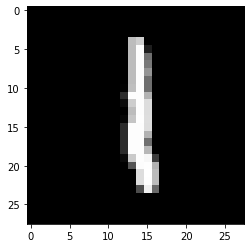

pred :  1 [1.9668377e-13 9.9999976e-01 6.7523621e-07 1.0319381e-08 1.5712592e-08
 1.2132618e-06 4.4372609e-07 3.8092514e-06 2.4997862e-06 2.2414062e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


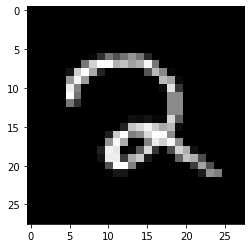

pred :  2 [1.54419064e-11 1.54859936e-12 9.99968231e-01 3.14062332e-10
 8.85480979e-13 1.04273745e-07 3.71835335e-06 4.23276797e-05
 1.85910665e-06 6.78598881e-04]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


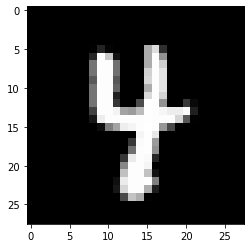

pred :  4 [6.13766121e-11 4.58680454e-08 3.73447995e-10 2.67038391e-10
 9.99998569e-01 5.32483480e-09 1.04466635e-11 1.11526251e-03
 5.17832632e-07 1.53596156e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


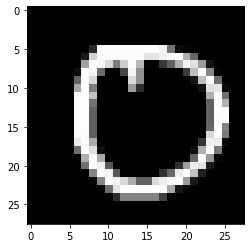

pred :  0 [9.9998283e-01 1.1170778e-07 2.6770190e-06 1.9350899e-05 2.9878030e-14
 9.0477915e-05 1.0138473e-07 2.6841548e-11 4.2607634e-10 1.9309487e-17]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


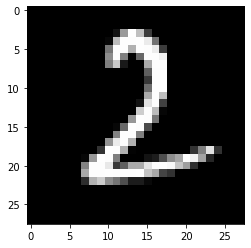

pred :  2 [5.9974361e-08 2.0605555e-06 1.0000000e+00 7.0231032e-08 4.6901792e-16
 8.3810878e-09 1.1714506e-12 2.9111587e-13 2.1367759e-08 3.4212908e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


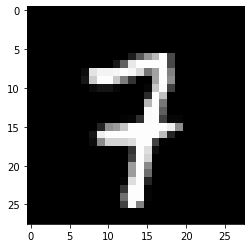

pred :  7 [4.46030636e-13 4.84205787e-10 3.01877776e-07 2.24219948e-05
 5.21330895e-11 6.70089071e-12 1.90406154e-12 9.99956489e-01
 1.06777115e-10 1.46478415e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


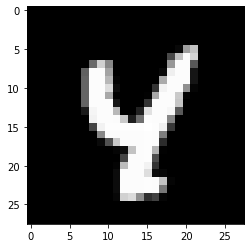

pred :  4 [8.1251729e-15 4.9150954e-09 2.1080133e-09 1.2560014e-09 9.9999917e-01
 1.0518412e-09 1.1902945e-10 6.3876326e-09 1.4755130e-03 3.1697944e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


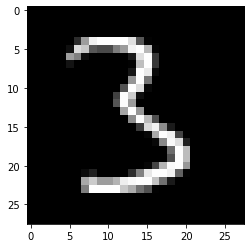

pred :  3 [8.6685175e-09 4.0495396e-04 6.9356439e-08 1.0000000e+00 1.0508024e-09
 4.4543579e-08 8.2344537e-13 9.8489569e-14 2.9790059e-10 7.2721601e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


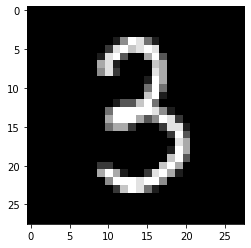

pred :  3 [1.5282218e-11 1.9676221e-09 2.4154505e-07 9.9997962e-01 3.1449126e-08
 1.1654247e-06 1.3903674e-13 5.6428955e-13 3.8424224e-07 5.9597260e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


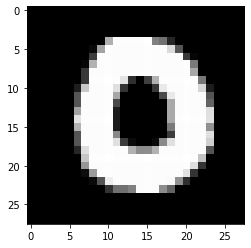

pred :  0 [9.9999952e-01 6.4467339e-14 2.2479064e-06 5.2020108e-09 1.6669079e-09
 3.3634657e-09 9.4125039e-07 5.7116241e-09 4.2076358e-08 2.1607723e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


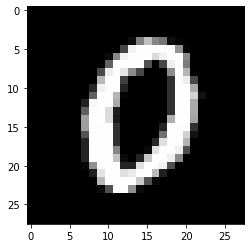

pred :  0 [9.9999768e-01 4.5270671e-12 7.1034337e-05 4.1626698e-12 6.1613459e-10
 8.1217066e-10 2.2558374e-06 9.0440722e-09 6.7441208e-10 1.0059476e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


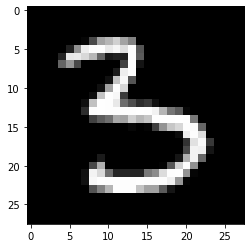

pred :  3 [9.93201354e-11 1.67341852e-06 1.04783786e-10 9.99999821e-01
 1.32148298e-05 3.75866890e-04 2.43116876e-12 1.11147051e-12
 6.93751237e-11 4.67911517e-13]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


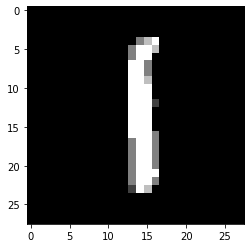

pred :  1 [2.29702460e-13 9.99999285e-01 1.30472335e-08 3.92404065e-09
 4.20989146e-08 5.97445069e-05 7.44027773e-08 1.97946724e-06
 1.40890379e-05 4.38133441e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


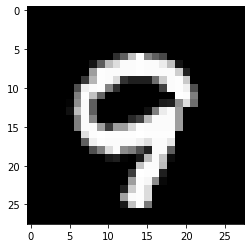

pred :  9 [1.0931265e-09 3.9422998e-17 5.9468321e-06 1.7304420e-03 7.2914935e-10
 2.3323580e-08 2.6032065e-10 5.9290935e-05 1.3379014e-06 9.9996907e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


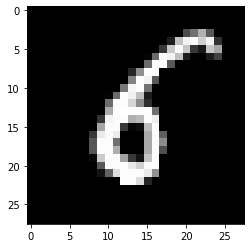

pred :  6 [1.6599596e-09 1.7692107e-08 9.5444541e-08 1.6646043e-13 3.7011516e-10
 1.1848211e-03 1.0000000e+00 3.0307396e-15 1.7145212e-06 2.8868479e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


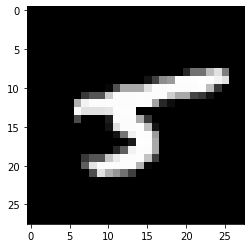

pred :  5 [3.3474084e-09 9.0866897e-10 4.8047226e-11 4.6217480e-08 6.6832609e-07
 9.9997509e-01 7.7535503e-08 1.3558129e-08 1.5162412e-05 2.8852019e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


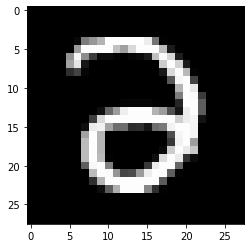

pred :  2 [7.2112679e-04 2.6501552e-09 9.9999380e-01 9.3069673e-04 9.3712704e-10
 2.3632596e-09 3.3534664e-09 5.8164042e-13 1.0934769e-09 3.6541270e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


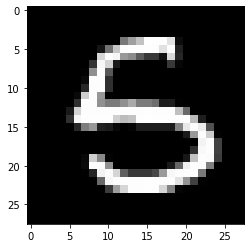

pred :  5 [3.3823701e-11 1.1548256e-08 3.8461945e-11 3.3377623e-07 1.9049797e-09
 9.9998820e-01 1.4397470e-08 2.7955836e-17 2.1210313e-04 9.0894510e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


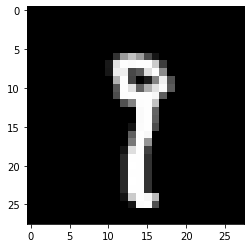

pred :  9 [9.20377489e-12 1.98692083e-04 4.05499456e-09 1.61424580e-07
 1.49130894e-08 8.42716119e-08 7.72144664e-13 2.69174576e-04
 1.55418515e-02 9.83609319e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


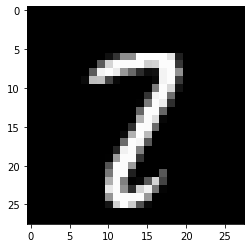

pred :  7 [5.3901510e-09 2.6195025e-07 1.3834417e-01 4.2803003e-06 7.7277262e-16
 4.8710356e-09 7.4428994e-13 9.4091898e-01 2.8030942e-07 2.2168991e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


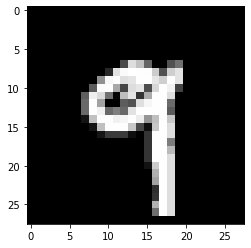

pred :  9 [1.3577162e-10 3.6315714e-11 1.2108835e-09 1.2975363e-08 2.4266660e-08
 1.6448536e-09 2.2811343e-15 7.0306999e-07 5.1813966e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


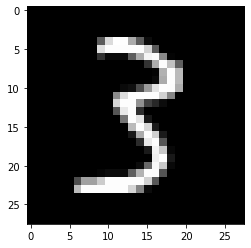

pred :  3 [1.7391451e-09 1.0501964e-07 6.8744029e-08 9.9999720e-01 1.8013561e-10
 4.8695519e-08 8.4406240e-16 6.3410124e-11 2.1643257e-06 1.1328382e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


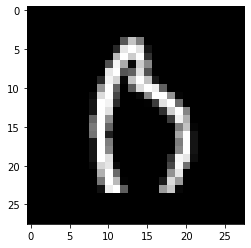

pred :  0 [9.9957824e-01 1.2348420e-08 7.0323622e-09 4.8170719e-08 6.5871714e-06
 1.0030377e-05 1.3993413e-09 8.7697128e-07 3.2782555e-04 2.8317836e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


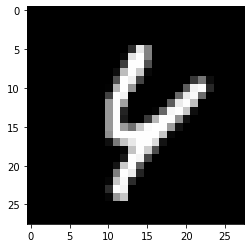

pred :  4 [2.0624297e-11 1.3628111e-11 2.7296764e-07 7.1831374e-07 9.9998897e-01
 1.8540700e-09 2.1027048e-05 7.5404409e-06 1.4159083e-04 1.5308149e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


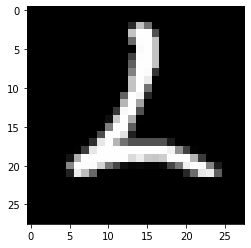

pred :  2 [2.2864096e-11 2.5885005e-05 9.9080032e-01 5.4746208e-11 1.3040608e-13
 1.8160742e-07 6.2012672e-04 1.9158372e-14 7.8269435e-10 1.4375133e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


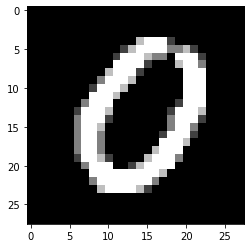

pred :  0 [9.9999940e-01 1.2241081e-09 1.9129293e-06 1.5096184e-09 1.3448417e-11
 2.9101597e-09 2.0299099e-06 6.1732415e-09 3.1622231e-12 5.1703624e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


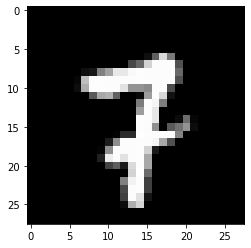

pred :  7 [2.9945884e-09 4.5163301e-08 1.0273729e-06 1.1226977e-07 1.0379998e-09
 1.6550292e-11 3.0832212e-11 9.9999762e-01 6.9721855e-06 8.7565502e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


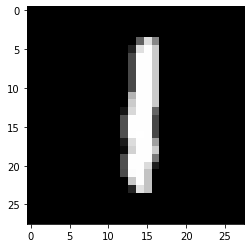

pred :  1 [3.5946676e-11 9.9999100e-01 1.0102781e-07 1.4693384e-06 4.2699793e-07
 1.4370606e-05 4.2765301e-08 1.5383958e-06 1.8765436e-06 1.3497076e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


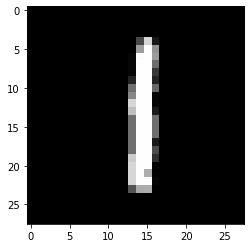

pred :  1 [2.1684802e-12 9.9999803e-01 2.3000071e-08 5.0815891e-07 2.3216790e-08
 3.3730448e-05 1.2688957e-07 1.9340907e-06 8.3710796e-07 7.5507742e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


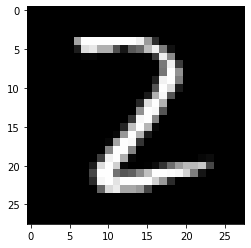

pred :  2 [3.6823476e-08 7.3047877e-06 9.9999970e-01 1.0360956e-06 1.7130926e-10
 8.6217371e-09 3.6594017e-09 3.6563922e-14 1.1495951e-08 1.5066290e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


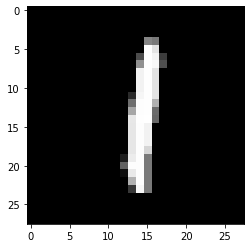

pred :  1 [3.4878746e-11 9.9999964e-01 3.6557200e-08 1.4382876e-07 1.1940915e-05
 9.1766367e-07 9.3524015e-09 6.9798989e-07 2.0994365e-07 3.9498720e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


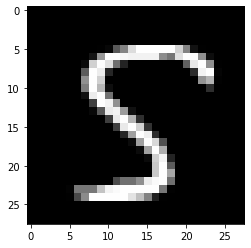

pred :  5 [4.3194281e-12 3.7429639e-11 3.7849098e-08 7.4157011e-05 7.3267114e-13
 9.9999624e-01 8.1071844e-15 1.2958024e-12 2.6874184e-07 6.9501446e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


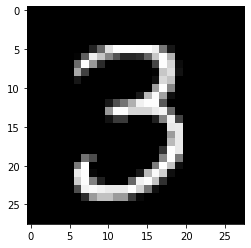

pred :  3 [1.7270135e-09 9.9917197e-06 1.8604909e-07 9.9999988e-01 5.6927107e-09
 4.0758996e-09 4.2224738e-17 2.5538021e-09 1.0293299e-11 8.4950946e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


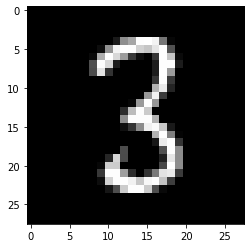

pred :  3 [4.3146176e-09 6.5336252e-09 2.1040669e-05 9.9537337e-01 4.9983490e-12
 7.9064341e-07 8.8577278e-14 1.2179145e-11 5.0552262e-07 1.5095386e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


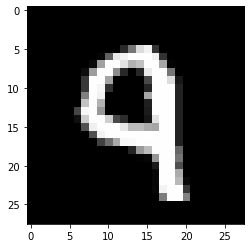

pred :  9 [4.3989334e-10 1.7644060e-11 9.8016399e-06 6.4843753e-09 1.0326765e-04
 3.4747128e-08 5.3178184e-10 1.6811084e-07 3.4134709e-06 9.9997771e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


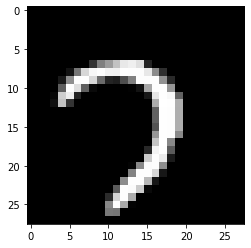

pred :  7 [2.7878633e-09 4.0846590e-11 1.2040918e-05 8.2787355e-06 3.2876869e-14
 2.1584838e-10 1.0164121e-12 9.9945992e-01 5.1314611e-13 3.8276798e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


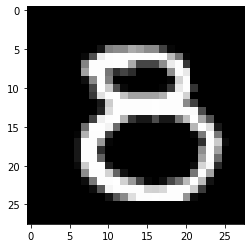

pred :  8 [5.0230933e-06 4.6137741e-13 4.8534014e-07 3.2708049e-04 1.1654097e-07
 1.6412139e-04 4.0088782e-08 1.9627454e-13 9.9999130e-01 3.9424453e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


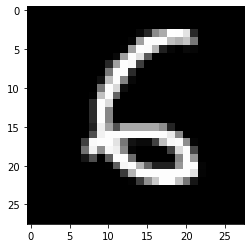

pred :  6 [1.8827437e-12 5.2545161e-08 4.6578657e-07 1.3782279e-12 1.7752258e-10
 8.7586343e-03 9.9993849e-01 2.2379093e-15 6.4109906e-10 9.7145252e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


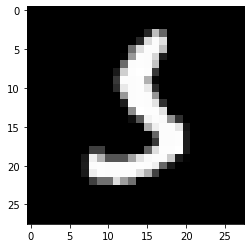

pred :  3 [7.3744566e-11 5.1161647e-03 8.0029814e-09 9.9975896e-01 2.5660218e-10
 4.9450877e-01 1.0672393e-07 5.5902061e-11 1.2142376e-08 7.3585976e-10]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


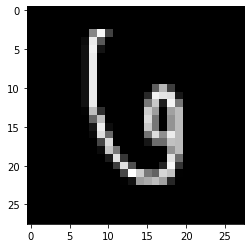

pred :  6 [6.0464744e-10 5.7277395e-12 1.5334544e-07 1.0117826e-10 3.0026113e-06
 2.8193328e-09 9.9999177e-01 1.1151391e-04 1.0500171e-09 1.7449260e-04]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


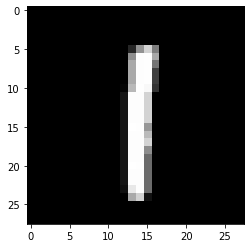

pred :  1 [1.8350804e-11 9.9998981e-01 3.6353311e-09 6.2503597e-07 1.3777550e-08
 4.4398030e-06 2.3545951e-08 1.3374568e-05 4.6123428e-06 3.5243812e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


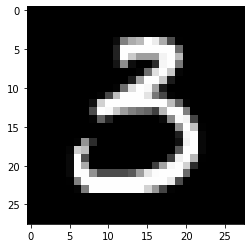

pred :  3 [1.3208630e-07 2.0682812e-04 2.4003807e-08 9.9999821e-01 3.5130385e-11
 1.4787182e-07 4.3890456e-13 1.2324347e-12 6.3193620e-06 5.1640887e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


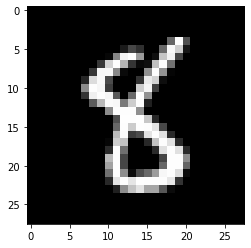

pred :  8 [1.0892725e-08 2.4110443e-08 3.7940043e-07 5.5497903e-08 1.8815081e-09
 2.6029646e-03 3.3308208e-07 1.8909384e-12 9.9994600e-01 4.8770503e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


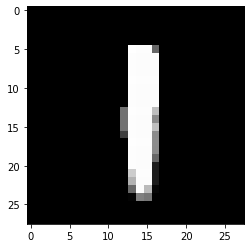

pred :  1 [2.3480629e-10 9.9998033e-01 1.7092528e-08 1.1053520e-05 1.0812123e-06
 6.7710238e-07 1.7616982e-08 5.1041666e-06 2.3577613e-06 3.5441903e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


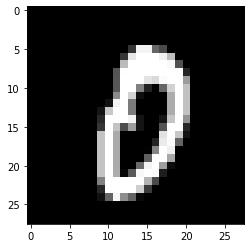

pred :  0 [9.9999142e-01 6.8554065e-11 3.0411462e-05 9.0396055e-09 7.1668270e-12
 1.2806058e-04 1.2859203e-07 8.3332128e-07 8.1197521e-07 1.6480466e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


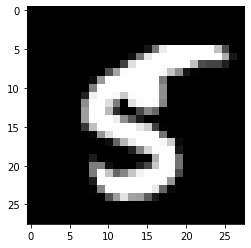

pred :  5 [6.2521537e-11 5.5261165e-07 2.0870265e-12 3.4781178e-06 5.9310465e-12
 9.9998033e-01 7.6956441e-09 3.0037552e-11 1.1419774e-05 8.3509021e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


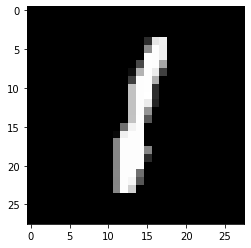

pred :  1 [4.3840012e-09 9.9998987e-01 3.7499369e-08 1.4250886e-09 2.8823732e-09
 3.7675302e-06 3.7000318e-05 8.0628587e-07 4.3976307e-04 7.7873191e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


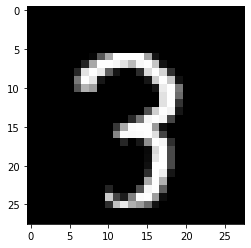

pred :  3 [1.3484079e-13 6.2585132e-11 1.5366714e-08 9.9999833e-01 3.0010879e-14
 4.0791819e-09 5.7036162e-15 2.7785909e-06 6.0284675e-09 5.2166843e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


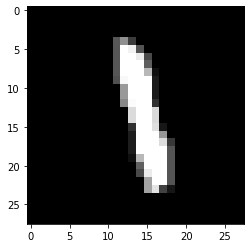

pred :  1 [7.2633292e-14 9.9999261e-01 3.0668343e-05 9.5194510e-09 1.6791490e-05
 2.5927438e-06 3.9718717e-09 6.5067320e-07 1.3551789e-05 8.3976065e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


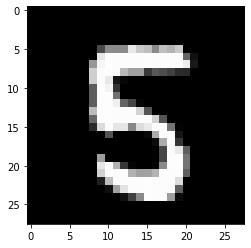

pred :  5 [4.6854209e-09 7.5281427e-11 1.7301622e-09 5.9136060e-08 1.2010700e-14
 1.0000000e+00 3.5529444e-11 5.6734158e-13 6.6142168e-11 7.6618007e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


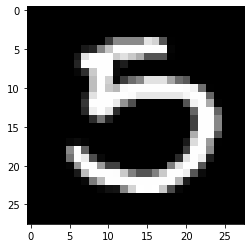

pred :  5 [4.2304373e-06 2.5927743e-11 3.0639458e-07 2.1255621e-05 2.2198555e-14
 9.9998832e-01 7.7506251e-11 2.9966582e-08 9.4342556e-10 1.9109991e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


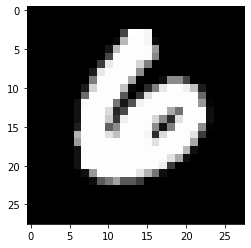

pred :  6 [6.7985329e-06 1.3789194e-12 2.0154029e-02 3.8160941e-08 1.5869732e-07
 1.3723306e-09 9.9997425e-01 3.9478195e-11 2.2085451e-05 1.5842915e-04]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


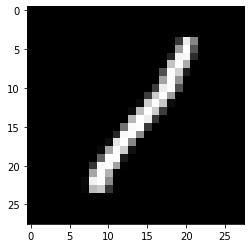

pred :  1 [7.6478380e-13 9.9987173e-01 6.2096734e-07 1.6709004e-08 9.4652984e-07
 9.5831945e-07 6.5181749e-10 1.0326907e-07 2.5952138e-05 3.3204323e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


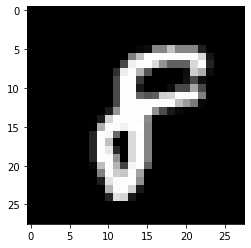

pred :  8 [7.7268032e-07 8.9524796e-08 6.6914276e-06 2.4205754e-10 2.0289034e-10
 1.2791077e-07 3.8977283e-05 4.1107653e-10 9.9999869e-01 1.2261191e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


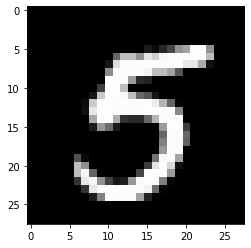

pred :  5 [7.4234549e-11 6.9735414e-08 7.3320273e-12 3.8607693e-11 3.9817988e-10
 1.0000000e+00 1.1487271e-12 4.5728149e-10 4.5307344e-10 6.2479553e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


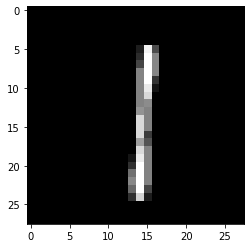

pred :  1 [1.6129114e-11 9.9993557e-01 4.0653796e-09 6.5807353e-06 3.1423011e-10
 2.8564059e-06 3.9417461e-08 1.5093839e-05 3.0317173e-07 1.0462168e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


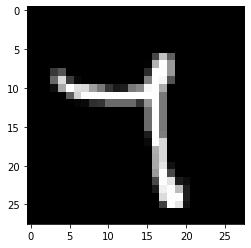

pred :  7 [2.61160989e-11 6.91287525e-08 1.09114922e-06 1.63668545e-09
 2.86221504e-04 6.16608702e-07 5.03982147e-15 9.76824045e-01
 1.05325555e-07 7.96705484e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


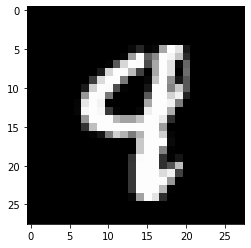

pred :  9 [3.2706683e-14 8.9646246e-09 4.6173243e-12 7.8307892e-08 7.4194670e-03
 5.1780646e-09 6.1337289e-11 8.1092509e-07 4.6669841e-03 9.7019005e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


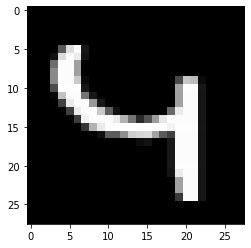

pred :  4 [7.4091777e-16 2.0842758e-10 1.6543619e-09 7.0831256e-09 9.9996507e-01
 1.0898399e-08 1.8136303e-07 5.4730185e-09 3.5107095e-10 2.8258148e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


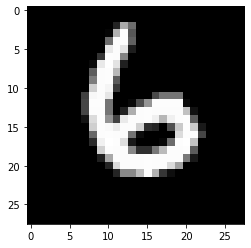

pred :  6 [1.5993649e-11 2.9137641e-13 8.6515665e-06 2.9228248e-10 1.0747371e-09
 5.8062960e-07 1.0000000e+00 1.2841591e-13 7.1518613e-08 3.9987848e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


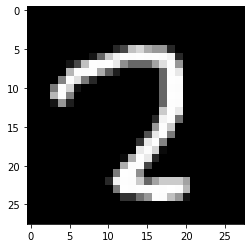

pred :  2 [4.2055315e-09 8.8084236e-12 9.9285108e-01 7.4153718e-06 7.1476841e-13
 2.6853020e-11 4.1714306e-11 7.3041171e-02 2.1075600e-08 9.0084529e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


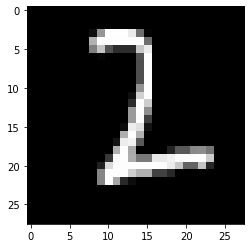

pred :  2 [1.7053117e-09 3.8564205e-04 9.9999225e-01 9.5403955e-08 1.3510104e-17
 4.2306510e-08 2.8116617e-07 2.4985893e-14 1.1514598e-09 1.5539964e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


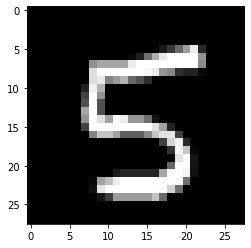

pred :  5 [1.9096308e-11 9.8417652e-10 9.9358169e-12 1.2124626e-06 7.1837081e-14
 1.0000000e+00 2.0911835e-11 1.3824530e-09 1.2320677e-07 1.5103190e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


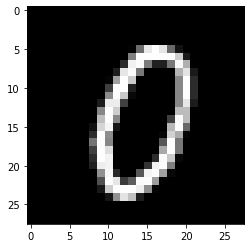

pred :  0 [9.9999714e-01 1.2162767e-09 4.6734078e-07 1.3651642e-09 1.9913255e-12
 9.8229611e-07 6.0404122e-06 1.0789961e-07 1.7867525e-09 4.2583448e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


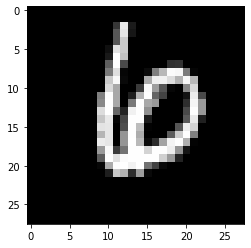

pred :  6 [1.4354360e-05 3.0619464e-08 9.8544359e-04 1.5732228e-05 5.8321796e-09
 3.0032230e-05 9.9947584e-01 2.8684592e-09 7.9685054e-07 2.0799165e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


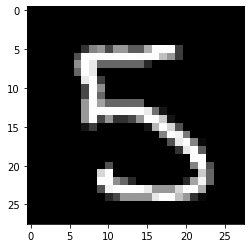

pred :  5 [5.5231154e-12 4.6786961e-13 1.3195492e-08 3.1041305e-05 3.0013800e-10
 9.9999917e-01 1.1078043e-13 1.9808645e-14 1.9768279e-08 5.9115569e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


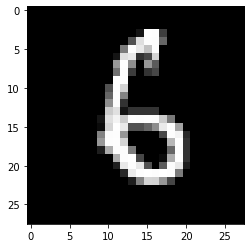

pred :  6 [4.2349721e-11 3.6935655e-09 3.7646515e-07 2.7167797e-04 2.1201402e-11
 3.7014484e-04 9.9998236e-01 5.4578319e-16 2.1393369e-08 2.6738692e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


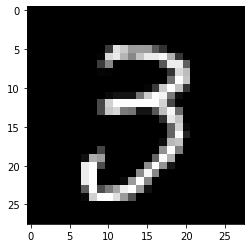

pred :  3 [3.9892598e-08 9.6359123e-08 2.5788466e-07 9.9970472e-01 2.8817013e-10
 1.2431344e-06 4.6309087e-15 7.2351680e-09 5.4180072e-07 1.4135119e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


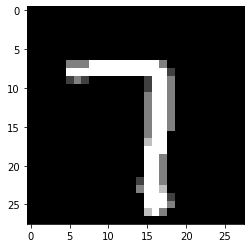

pred :  7 [6.5071974e-09 8.7930268e-09 4.4097936e-07 8.5215307e-10 1.5907694e-12
 2.1821037e-10 6.6393656e-16 9.9998891e-01 9.7714358e-14 6.6615053e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


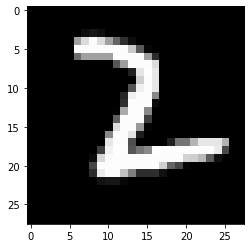

pred :  2 [6.5790029e-10 1.9176794e-05 1.0000000e+00 8.1683993e-08 1.5256318e-16
 2.5784161e-09 6.5761929e-10 3.1763414e-10 3.8188737e-09 1.0177147e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


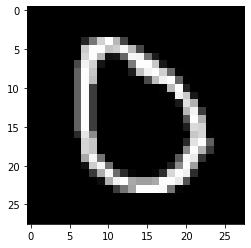

pred :  0 [9.9999928e-01 1.3108441e-05 2.7465504e-07 5.6341396e-06 3.0261610e-10
 1.6482974e-05 6.5051124e-09 4.5497124e-08 1.7785682e-13 2.7226514e-11]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


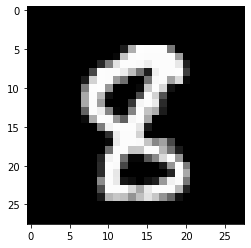

pred :  8 [3.6281347e-04 2.0293882e-09 6.6736341e-04 3.2237172e-04 1.4667663e-12
 3.7656118e-08 3.7653336e-07 9.0680523e-08 9.9997753e-01 5.4148641e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


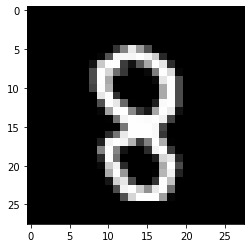

pred :  8 [6.4336717e-08 2.0471567e-11 5.3248627e-06 4.6162813e-06 2.8071430e-08
 2.2162958e-08 2.2652127e-08 4.2259751e-11 9.9999928e-01 6.5047097e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


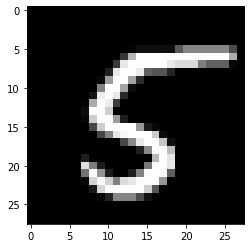

pred :  5 [1.4141433e-14 9.5391940e-08 2.9357605e-09 4.6951609e-10 5.6749251e-15
 1.0000000e+00 8.8058701e-12 8.6022883e-13 1.1726434e-10 8.3086684e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


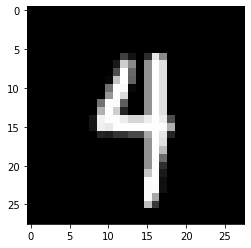

pred :  4 [2.8915123e-14 3.2657519e-09 6.4284272e-10 6.7464623e-10 9.9904341e-01
 7.1689641e-07 3.2234274e-10 1.6138687e-05 4.7418969e-10 1.1447966e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


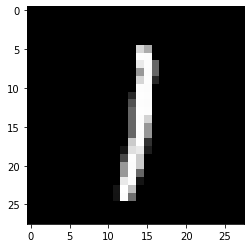

pred :  1 [1.6190027e-10 9.9999541e-01 1.1097876e-10 3.7223000e-09 6.1015449e-08
 3.1398749e-06 1.5391999e-08 1.8476637e-06 4.4786398e-07 7.6133244e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


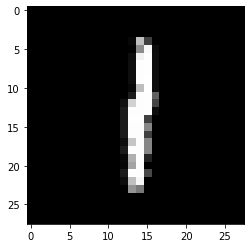

pred :  1 [1.0157106e-12 9.9999797e-01 1.6183551e-09 4.4073108e-08 1.7910356e-06
 9.6232714e-07 7.6434823e-08 3.2378665e-07 8.2193324e-08 1.6488091e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


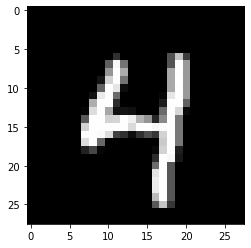

pred :  4 [2.5608623e-11 9.2251720e-14 3.7591943e-09 1.3712964e-10 9.9999970e-01
 3.0150144e-07 9.7104822e-13 1.3632571e-07 3.2401597e-12 6.4759706e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


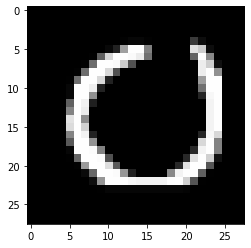

pred :  0 [9.9999607e-01 9.1329177e-08 8.5059497e-08 4.8355331e-10 4.9665726e-11
 9.5107625e-06 1.1404293e-06 2.0512841e-11 2.3814359e-09 6.1642273e-17]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


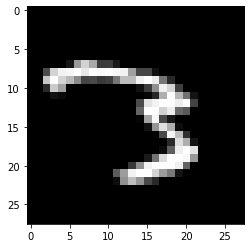

pred :  7 [1.4340977e-09 2.2384007e-05 2.1421084e-07 3.4111804e-01 1.7517824e-13
 1.5377913e-12 2.3274818e-09 5.4417825e-01 4.4146276e-13 9.1906151e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


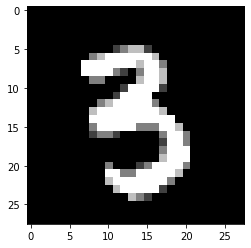

pred :  3 [6.2611338e-09 3.7664236e-08 1.8651951e-07 9.9998868e-01 7.1028400e-12
 2.4881734e-07 4.3026355e-13 4.2622039e-09 5.4044557e-07 7.9880947e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


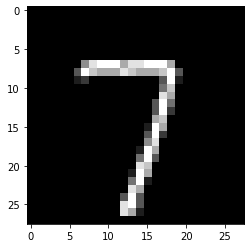

pred :  7 [6.5876138e-11 4.3183738e-12 6.6755916e-07 1.8091889e-07 2.1414062e-16
 4.0504823e-08 5.1002607e-15 1.0000000e+00 7.7522841e-14 1.3687486e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


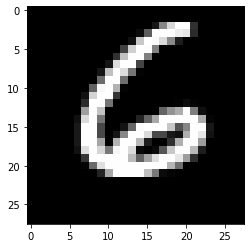

pred :  6 [6.5215482e-09 4.5113023e-08 3.4830566e-10 3.8916124e-08 8.4281171e-10
 2.2889799e-07 1.0000000e+00 2.7285348e-12 5.9267604e-12 8.3481705e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


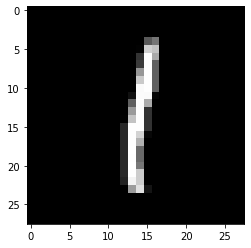

pred :  1 [2.4595617e-10 9.9999917e-01 1.4589483e-08 1.7927761e-07 1.3769038e-08
 1.0924961e-05 2.2934701e-09 4.4446006e-07 7.6132949e-07 5.8689570e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


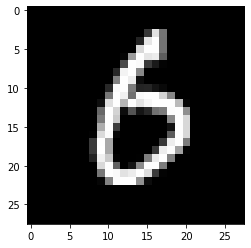

pred :  6 [9.4346120e-07 1.1547094e-07 3.6156578e-09 2.4405913e-06 2.0865500e-11
 4.6737492e-03 9.9954426e-01 1.8983422e-07 3.9417987e-06 4.5831772e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


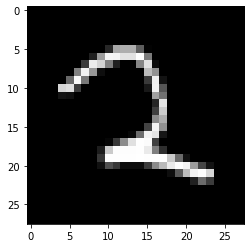

pred :  2 [1.2036477e-14 1.4863920e-06 1.0000000e+00 1.9596493e-08 4.2089074e-14
 1.0914032e-06 9.3710838e-08 2.7892796e-08 6.7784413e-07 1.7823490e-06]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


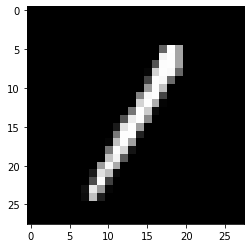

pred :  1 [1.3371162e-09 9.9999881e-01 2.3067939e-07 3.9328921e-08 3.3319167e-09
 7.0845076e-08 4.8903964e-10 8.7803073e-07 2.8527744e-08 1.6863302e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


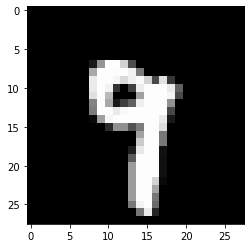

pred :  9 [8.2670650e-12 5.0013677e-10 8.1445684e-11 2.3509289e-08 5.5706501e-04
 1.2530385e-10 5.5438732e-13 4.4619143e-03 4.8288490e-07 9.9895525e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


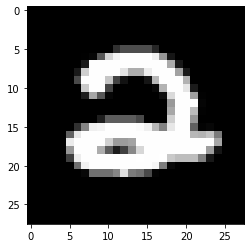

pred :  2 [1.2014999e-06 3.5485522e-13 9.9999464e-01 4.7068468e-07 4.4596751e-10
 8.0512472e-11 1.0569328e-06 7.4161917e-08 1.3750757e-10 7.9632558e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


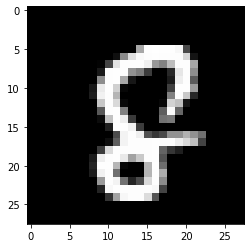

pred :  8 [2.3405257e-05 1.8116222e-12 3.7213802e-02 9.2405564e-08 1.4888362e-12
 1.9440877e-06 1.4290214e-04 1.2507880e-08 9.7939688e-01 3.6981742e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


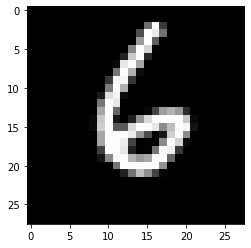

pred :  6 [1.2159810e-11 8.0495735e-11 4.3004988e-07 3.0461530e-07 1.2120625e-08
 1.7926700e-07 1.0000000e+00 4.8824650e-10 2.2730139e-10 1.3968222e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


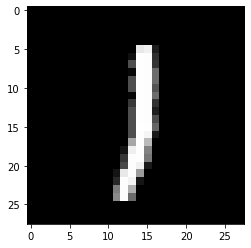

pred :  1 [1.09740016e-10 9.99995112e-01 1.60952951e-09 1.14052492e-08
 8.85979858e-08 1.95163716e-06 1.76059984e-08 2.59893523e-06
 5.39522716e-07 3.38231075e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


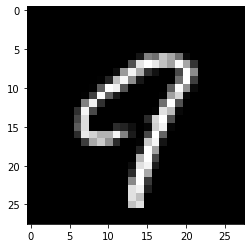

pred :  9 [2.9867291e-12 1.3574474e-13 3.0035551e-07 2.9696809e-09 4.1759569e-05
 6.2336944e-08 1.1868062e-09 7.0122778e-03 2.2358821e-08 9.9984741e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


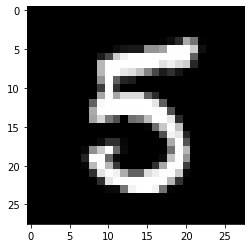

pred :  5 [3.9114344e-13 5.5227503e-07 1.0375494e-11 6.3899597e-09 3.2518950e-14
 9.9999964e-01 7.8900957e-09 4.8391843e-11 1.7486090e-06 1.9487981e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


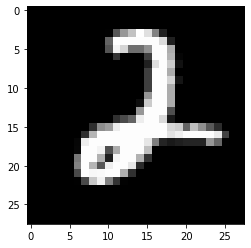

pred :  2 [5.6745524e-09 3.3010430e-08 1.0000000e+00 4.8448531e-08 1.8849116e-07
 1.3945780e-08 2.8098588e-08 6.2720581e-13 4.0908280e-10 4.9111451e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


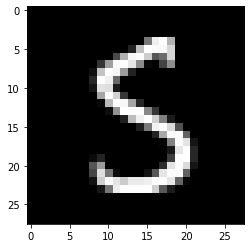

pred :  5 [7.7990392e-12 2.9145733e-07 9.1601765e-10 4.1812989e-08 1.1413735e-12
 9.9999952e-01 9.2968000e-10 7.1383383e-13 1.3185856e-08 5.6416993e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


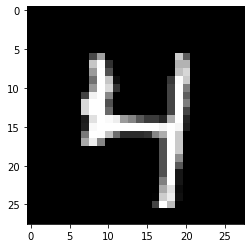

pred :  4 [6.8525853e-14 8.0620647e-15 1.8818958e-09 7.1909872e-14 1.0000000e+00
 7.7101340e-06 7.0033051e-12 1.5096271e-07 4.9831543e-09 9.2976027e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


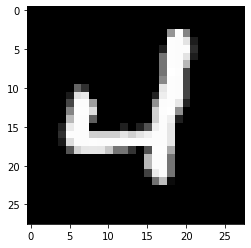

pred :  4 [7.7040294e-09 2.7580076e-09 9.4327331e-04 1.3509161e-08 9.9998116e-01
 2.2248088e-08 5.8957156e-10 2.2969262e-11 8.9217367e-10 4.7383557e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


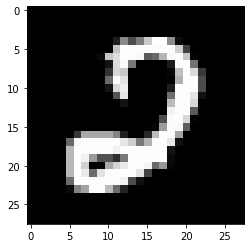

pred :  2 [2.7531385e-04 8.8134647e-12 9.9995184e-01 2.2481508e-08 8.1318130e-10
 1.2135726e-07 1.3031801e-10 1.1967026e-10 1.6782138e-07 2.1521819e-06]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


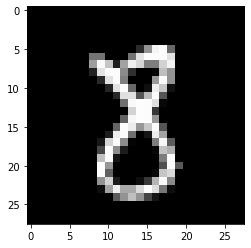

pred :  8 [1.2144900e-08 1.7642975e-08 2.2035837e-04 1.0339167e-05 1.6345009e-10
 1.5917621e-08 1.1187291e-09 7.1314020e-08 9.9997175e-01 9.8295772e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


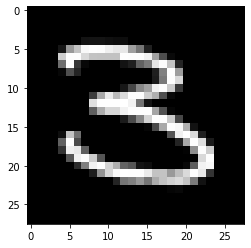

pred :  3 [4.2183326e-11 3.2828451e-09 3.3099784e-07 9.9999899e-01 3.6268560e-08
 3.1127543e-05 1.7359864e-13 4.1110712e-10 3.0129779e-06 2.1273018e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


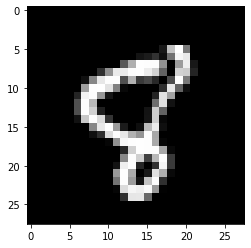

pred :  8 [4.72413997e-10 2.48078305e-13 1.70926921e-06 1.66848011e-08
 8.24768587e-10 3.82136432e-06 1.20032935e-08 2.60991728e-05
 9.99846816e-01 1.44059658e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


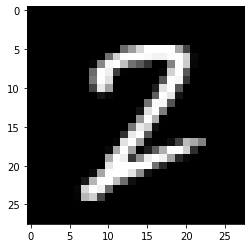

pred :  2 [1.7691770e-08 5.9399994e-05 9.9986941e-01 1.5792402e-05 4.2468845e-16
 5.4775717e-09 4.0297550e-11 8.1786811e-03 2.1485633e-07 1.4122061e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


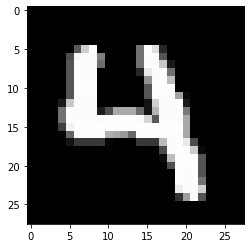

pred :  4 [7.6041335e-12 5.5519738e-11 3.4645744e-08 8.9696059e-08 9.9999791e-01
 2.9380968e-05 4.1724990e-10 8.7753889e-08 6.9514840e-06 6.0997418e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


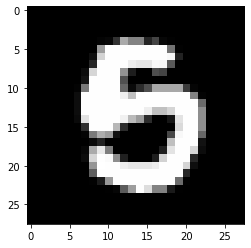

pred :  5 [1.2675376e-07 8.0897225e-13 2.2492499e-07 5.4320356e-08 1.0864723e-10
 9.9949515e-01 2.6860180e-08 6.3696805e-11 5.0283670e-03 2.8514564e-03]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


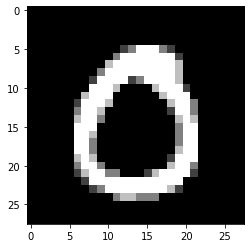

pred :  0 [9.9999839e-01 6.7175625e-07 3.4907551e-08 3.9102410e-09 2.2547540e-13
 6.3250867e-05 1.1121811e-08 4.4542944e-06 3.4773313e-12 9.0753019e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


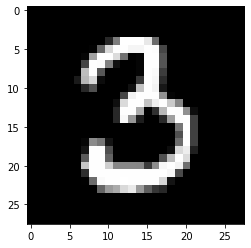

pred :  3 [2.2009419e-07 4.9928897e-08 9.8980877e-07 9.9993610e-01 3.8735798e-12
 1.9530746e-06 2.6677480e-13 1.8789555e-12 2.5716641e-08 5.8482343e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


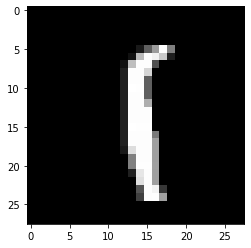

pred :  1 [5.3284352e-15 9.9999088e-01 2.2216749e-08 1.1528669e-08 1.0410254e-09
 6.8081124e-07 5.1414967e-04 2.4204048e-06 3.4951568e-03 6.4933147e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


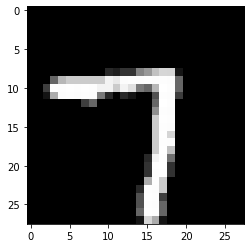

pred :  7 [1.2230200e-10 4.3312090e-12 9.3621588e-10 1.1174891e-07 2.7208123e-12
 3.1887304e-10 7.1311971e-12 1.0000000e+00 1.7964367e-13 1.5613260e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


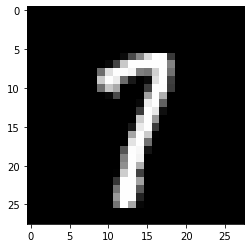

pred :  7 [3.0637031e-09 4.4786953e-05 1.2498055e-08 9.3404668e-07 3.1085455e-12
 1.3472923e-09 9.6211677e-15 9.9957752e-01 1.0144541e-08 1.9623667e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


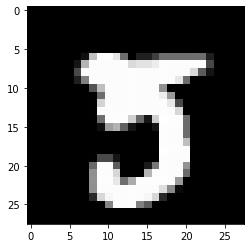

pred :  5 [2.2504836e-09 4.1679077e-11 2.5097315e-11 2.5049448e-03 4.6576365e-10
 9.9788487e-01 4.1933875e-17 2.5951158e-10 3.0550265e-05 3.2731856e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


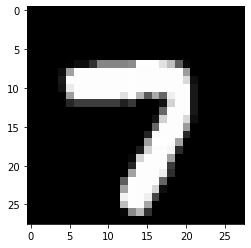

pred :  7 [9.1331444e-08 7.3745831e-15 2.5637328e-06 3.7194117e-09 1.4102888e-14
 5.1813966e-08 8.1085800e-14 9.9999171e-01 1.3225532e-11 1.9887090e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


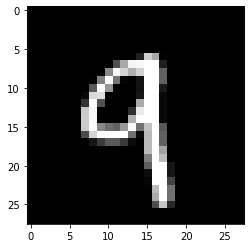

pred :  9 [5.2661972e-11 5.6405691e-10 2.9555062e-07 3.0611872e-08 1.4743209e-04
 9.4555766e-08 6.8968334e-12 2.9130976e-07 5.7875468e-06 9.9962187e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


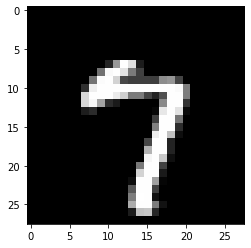

pred :  7 [3.8466243e-07 6.1605933e-14 9.0344741e-08 4.7212327e-09 2.8034012e-13
 1.8018596e-08 5.4060013e-11 9.9983025e-01 2.2706566e-10 2.1940470e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


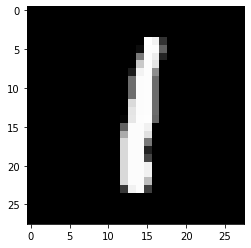

pred :  1 [4.06100431e-11 9.99996901e-01 6.19980938e-07 1.73743753e-09
 1.11225473e-09 5.86530950e-06 2.12071177e-06 9.05590582e-07
 1.08097265e-05 1.26511681e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


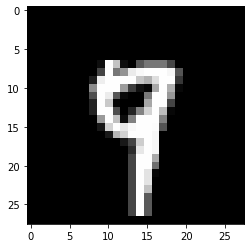

pred :  9 [8.3237518e-13 1.9090136e-09 4.6469816e-13 7.1399188e-07 4.5740604e-04
 3.4165221e-10 4.7404923e-15 1.8082798e-02 1.8570944e-07 9.9532026e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


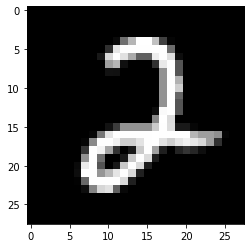

pred :  2 [1.3322406e-10 7.5623113e-10 1.0000000e+00 3.4025764e-08 4.1751481e-11
 9.2358164e-08 7.0193835e-07 2.6198446e-09 3.7859134e-08 2.8788650e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


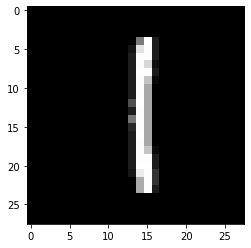

pred :  1 [1.0806595e-12 1.0000000e+00 7.7897440e-09 1.4134108e-07 3.6977577e-10
 1.2118436e-05 1.0917441e-07 1.7505076e-06 2.9575816e-07 2.3280144e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


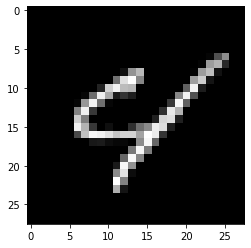

pred :  4 [3.2176577e-11 1.2340384e-13 2.9251312e-06 3.1522390e-08 9.9827313e-01
 3.0325125e-09 2.3021929e-08 1.9001916e-05 4.9161976e-05 2.0951713e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


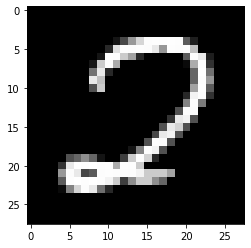

pred :  2 [1.2586917e-06 2.0679751e-08 8.1341910e-01 3.2727689e-06 2.8421804e-14
 7.8844096e-05 6.4422229e-14 6.4827332e-12 1.2221275e-13 2.0778099e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


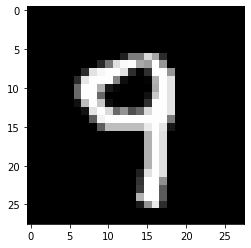

pred :  9 [1.4716921e-09 6.1115349e-13 1.7673708e-10 2.8444003e-09 2.3793680e-07
 4.7852655e-09 6.0605722e-14 9.5538708e-06 8.9404796e-07 9.9999917e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


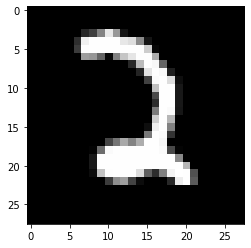

pred :  2 [2.8981908e-08 2.3299302e-08 1.0000000e+00 1.4402188e-07 1.9371178e-12
 6.4994232e-08 2.4704295e-08 8.5849100e-10 5.1238254e-12 1.0929055e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


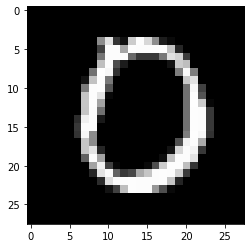

pred :  0 [9.9998337e-01 3.8744446e-08 2.7108166e-07 2.5532745e-10 4.0756894e-13
 1.5088916e-04 1.4087707e-05 3.0315552e-11 2.3872364e-15 3.4543910e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


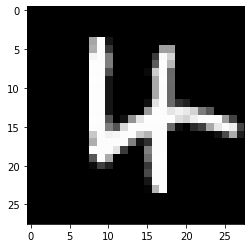

pred :  4 [2.3089155e-09 1.6140555e-12 3.1417608e-04 2.4226503e-13 9.9861884e-01
 3.5947983e-07 4.9468756e-05 5.5898780e-10 5.4607477e-12 5.2147167e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


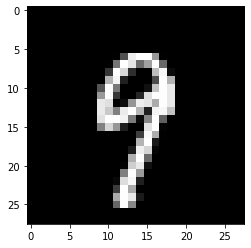

pred :  9 [3.9940506e-11 6.1979613e-08 2.1022643e-12 3.0462198e-07 2.0811507e-05
 7.2418679e-08 1.5536658e-14 2.0786792e-05 9.0027882e-08 9.9999917e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


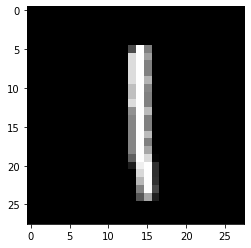

pred :  1 [7.4534935e-14 9.9999964e-01 8.2585082e-08 6.3332742e-08 1.3533803e-10
 1.3170850e-06 5.8709696e-07 3.1486114e-05 1.0158788e-05 5.9988203e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


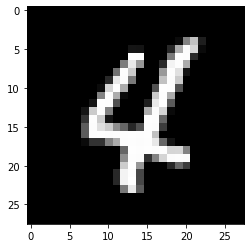

pred :  4 [8.9274085e-13 4.9888968e-06 9.7979429e-09 7.4537720e-06 9.9999750e-01
 9.2728004e-07 2.3037598e-09 3.0620456e-08 2.2098124e-03 4.5820238e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


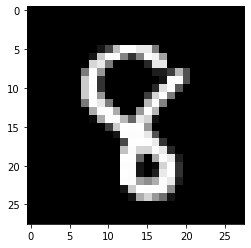

pred :  8 [7.5807347e-11 1.1073111e-11 6.4107589e-06 1.7787796e-08 1.0795498e-07
 1.5011439e-05 2.1763522e-07 5.4832583e-09 1.0000000e+00 2.0596497e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


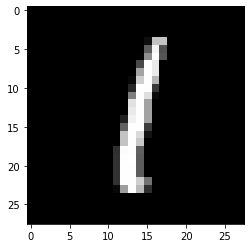

pred :  1 [1.2289789e-09 9.9999702e-01 4.0407826e-08 1.1036981e-09 8.9028891e-09
 1.1567529e-05 5.3434383e-07 6.9423049e-07 4.9007263e-05 1.0896335e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


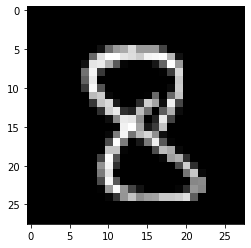

pred :  8 [2.3794676e-11 2.6958592e-14 2.2473335e-03 6.5703816e-08 2.9342377e-09
 9.1315640e-05 1.6484866e-10 2.6934219e-11 9.9999273e-01 1.7380118e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


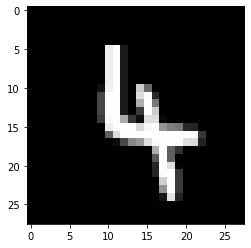

pred :  4 [1.28708923e-17 3.14590238e-08 1.22143788e-07 1.29305292e-07
 9.98651803e-01 7.91043043e-04 1.00371938e-06 1.09822205e-08
 1.99402409e-12 3.04826301e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


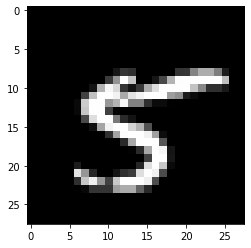

pred :  5 [1.6898080e-14 4.1768866e-10 4.5281143e-11 2.8863688e-08 8.5924214e-08
 1.0000000e+00 1.2996037e-13 2.2989579e-07 1.6748123e-06 1.4514017e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


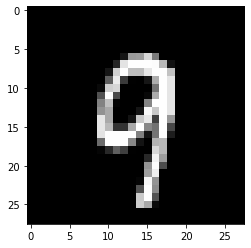

pred :  9 [9.2794389e-10 1.6308885e-10 3.9156598e-07 1.0183111e-04 3.7476613e-09
 5.4778853e-09 1.5286692e-13 5.0366132e-05 2.0795365e-08 9.9999893e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


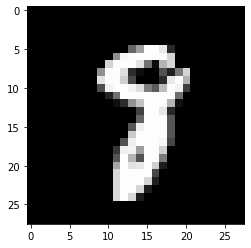

pred :  8 [2.0821709e-09 8.2536035e-06 7.7036023e-04 6.3674463e-07 1.7757211e-09
 1.4988794e-07 2.1286423e-10 5.9050322e-04 9.9996579e-01 4.4108957e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


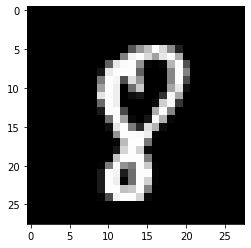

pred :  8 [1.0110241e-07 4.7133440e-08 1.0586083e-03 1.7280054e-07 2.6345089e-11
 1.1103900e-06 8.6532702e-07 2.6246475e-06 9.9999130e-01 6.0445644e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


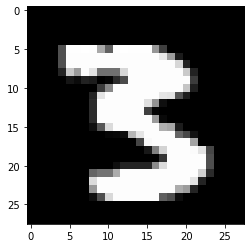

pred :  3 [8.1779978e-09 3.7778074e-07 2.8020850e-10 9.9995047e-01 7.5361731e-11
 2.4271660e-06 8.2801502e-15 4.8237393e-11 6.8435642e-05 1.4888449e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


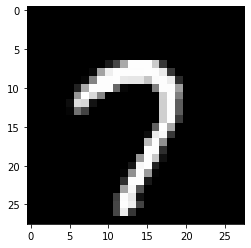

pred :  7 [4.16150760e-06 1.48758067e-13 6.01044267e-05 1.36132972e-08
 4.68605054e-15 1.01180532e-07 3.16552103e-14 9.99984622e-01
 1.98962851e-12 1.14470175e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


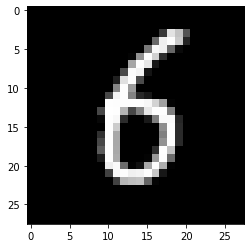

pred :  6 [1.87930865e-10 2.83572898e-08 8.05241172e-08 1.10493975e-11
 5.24921440e-09 6.15358353e-04 9.99999523e-01 1.20590846e-11
 1.83529569e-09 2.90763680e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


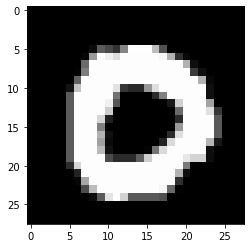

pred :  0 [1.0000000e+00 2.9735350e-09 4.1543657e-08 7.0432088e-07 1.3568172e-11
 9.7863676e-08 2.7679111e-08 9.9053632e-06 1.0594055e-13 1.1563729e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


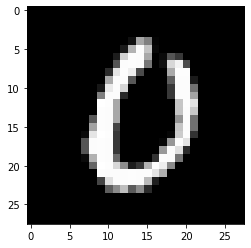

pred :  0 [9.9999940e-01 3.9719433e-11 5.1501996e-07 7.0332440e-10 2.0874825e-10
 9.3216634e-09 3.2733931e-06 1.0092024e-09 3.6959402e-09 1.4980455e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


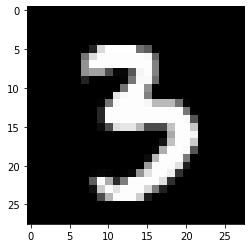

pred :  3 [2.3752541e-12 1.6194706e-08 2.7579955e-10 9.9999976e-01 4.2035805e-10
 5.9835420e-06 2.6573779e-13 1.2116765e-08 3.8455841e-08 2.1418889e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


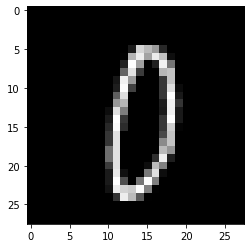

pred :  0 [9.9836004e-01 1.7984956e-11 2.8645723e-05 2.2022551e-08 5.5203508e-10
 1.4409423e-04 2.2529639e-07 2.0112070e-06 4.0055532e-08 5.1495372e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


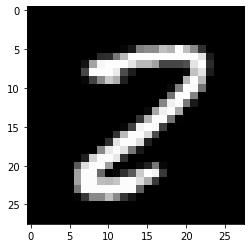

pred :  2 [2.1221288e-07 2.2984865e-07 9.9686527e-01 7.4194926e-05 4.5305069e-15
 6.8094890e-09 5.8327128e-13 6.2985018e-06 2.6743743e-05 1.5201784e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


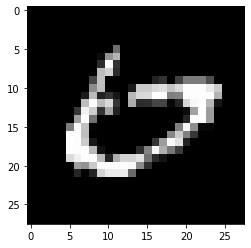

pred :  0 [9.6570992e-01 1.7468635e-14 9.7232757e-08 2.1839492e-09 5.9737833e-11
 2.9686391e-03 8.9719862e-02 5.0252277e-07 1.8040191e-12 5.4616936e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


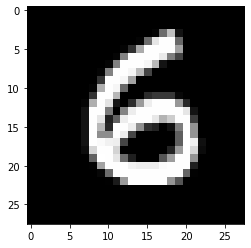

pred :  6 [1.4357152e-09 3.7041215e-08 8.9815337e-09 3.3528076e-09 2.3325433e-13
 1.1236072e-03 9.9994129e-01 1.4577797e-16 4.2811212e-06 2.0958483e-03]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


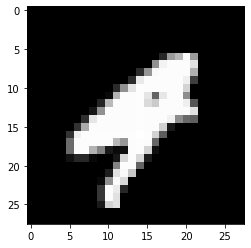

pred :  4 [1.9217325e-07 2.6663061e-11 2.6175608e-06 4.3172131e-06 5.6406975e-01
 8.0043442e-08 3.5194807e-09 7.7721590e-05 1.4562391e-06 9.3324780e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


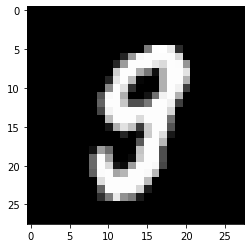

pred :  9 [2.1240990e-07 2.0753910e-09 1.7537761e-06 4.2146742e-03 7.0379444e-09
 7.0749644e-05 5.6288623e-11 3.1890712e-10 1.6362157e-01 9.7066438e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


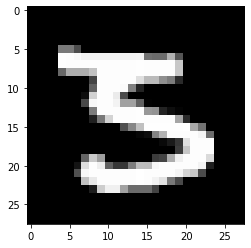

pred :  3 [3.7072880e-08 1.2132288e-07 3.3227635e-10 9.9321866e-01 5.6042553e-11
 8.2848918e-01 7.1415042e-15 8.6728660e-13 6.5449504e-09 3.3681715e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


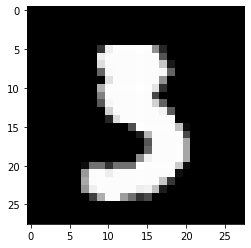

pred :  3 [1.3910977e-08 6.0559510e-06 1.1709750e-08 9.8905027e-01 2.5026641e-09
 1.4782757e-02 3.4929789e-16 2.1791598e-13 3.8073173e-07 5.5184960e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


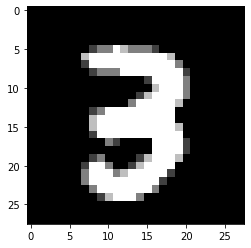

pred :  3 [9.2774871e-11 1.5125035e-09 1.3689432e-06 9.9999523e-01 1.4460748e-11
 1.4798840e-08 7.0517094e-15 1.5027187e-08 4.6311811e-08 8.8415163e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


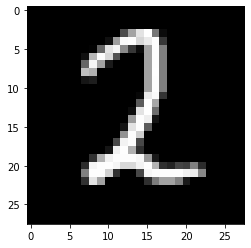

pred :  2 [7.4243042e-11 1.7476082e-04 9.9999827e-01 2.8917801e-08 6.4861961e-12
 1.2104176e-06 1.0605211e-10 2.2307541e-11 1.4012069e-07 2.6520333e-15]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


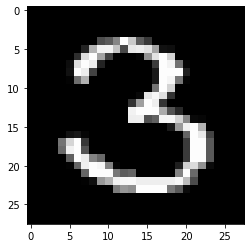

pred :  3 [3.0552901e-08 6.6117543e-08 6.7312218e-09 1.0000000e+00 2.5460070e-08
 3.8199812e-09 1.9538967e-13 2.0965861e-12 2.4536355e-09 2.0895818e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


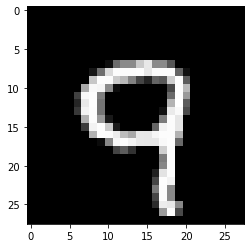

pred :  9 [2.93754732e-09 5.02403795e-17 1.82672039e-07 1.35177754e-11
 7.59730938e-07 8.86547002e-10 6.33601635e-12 3.85133389e-05
 3.54902134e-08 9.99998808e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


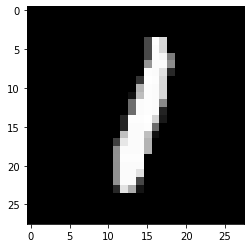

pred :  1 [1.7297110e-08 9.9999726e-01 3.3284297e-05 3.3511821e-10 8.2801171e-06
 5.8341601e-07 3.3901401e-07 1.9630733e-07 2.2570812e-06 7.6770212e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


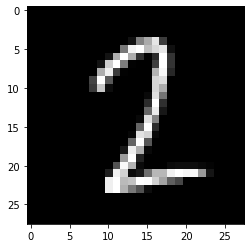

pred :  2 [1.1874239e-06 9.4793439e-03 9.9636549e-01 9.1834791e-06 1.9290368e-11
 2.1487745e-07 4.6334558e-10 2.8585262e-06 2.8343026e-11 9.7956344e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


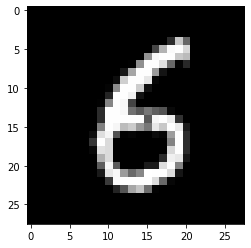

pred :  6 [5.38261768e-10 1.98089779e-07 2.27996222e-09 4.15721724e-09
 1.25500391e-11 3.49850059e-02 9.99611139e-01 2.10557165e-15
 3.80549153e-07 1.07199285e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


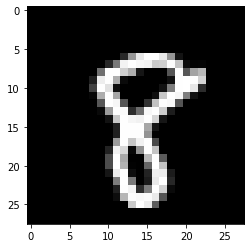

pred :  8 [2.2789916e-10 1.2194376e-10 3.4534560e-07 6.0596401e-05 3.0595831e-11
 2.2706752e-09 1.2081256e-07 6.0504202e-10 1.0000000e+00 4.9103452e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


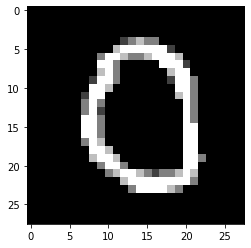

pred :  0 [9.9999928e-01 7.7001287e-11 3.3653671e-06 4.3310126e-11 1.0850413e-10
 1.9926071e-07 4.2080470e-07 1.6522845e-08 2.7221307e-12 1.1879392e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


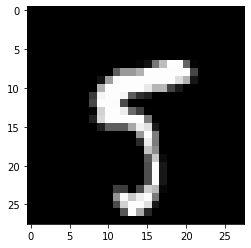

pred :  5 [5.4998226e-15 1.6969107e-10 2.4161596e-15 4.4156959e-06 1.1744440e-12
 9.9991810e-01 2.1055316e-15 1.5886844e-05 3.1611922e-08 1.0855675e-02]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


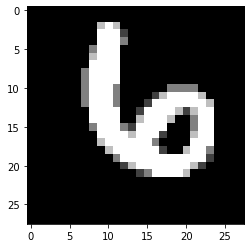

pred :  6 [2.4271299e-11 1.3469834e-10 4.0357995e-06 2.1279348e-11 8.8574888e-07
 4.6818389e-09 1.0000000e+00 2.9655403e-11 7.7558575e-08 4.2962643e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


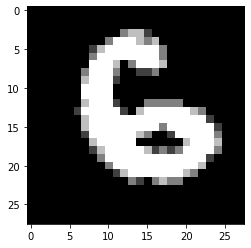

pred :  6 [1.6556048e-10 5.2498246e-13 1.8685860e-06 4.3939984e-08 7.3459586e-11
 8.9019537e-04 9.9997747e-01 6.5833518e-16 1.2764335e-03 1.6648482e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


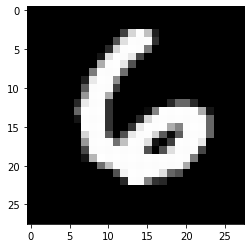

pred :  6 [5.0966413e-08 1.8724435e-09 7.9938513e-07 5.8515537e-10 8.2163538e-08
 3.6329952e-09 1.0000000e+00 2.5530298e-11 5.2872773e-09 1.6769292e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


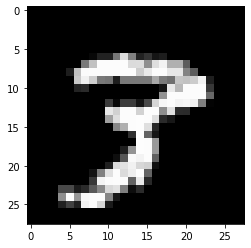

pred :  3 [2.4055011e-11 1.4429414e-12 2.9321075e-12 9.9875605e-01 2.3984363e-15
 5.9179667e-10 4.7516785e-16 5.2732229e-04 1.6451673e-09 1.4137322e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


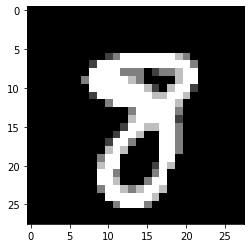

pred :  8 [2.1339105e-10 1.2733190e-11 1.0361168e-05 1.0432135e-04 6.4544703e-11
 7.8564426e-09 2.1847763e-11 5.3447684e-07 9.9998915e-01 1.0742843e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


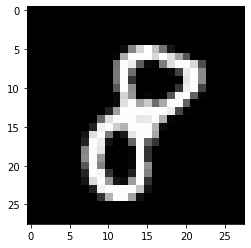

pred :  8 [1.6051334e-07 1.6835365e-08 5.3511692e-05 1.1086950e-06 1.0922475e-08
 6.2252347e-08 9.0513206e-09 1.1548366e-08 9.9998999e-01 1.7152499e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


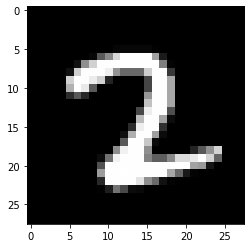

pred :  2 [5.6171807e-08 5.4486514e-05 9.9999976e-01 1.3264938e-06 1.3946302e-17
 1.5018060e-10 5.9608679e-10 1.0994172e-07 8.0101135e-09 7.3692406e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


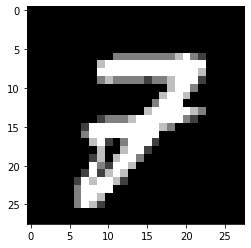

pred :  7 [3.9099204e-09 1.5095852e-11 2.5843786e-07 1.4304221e-03 3.7767407e-11
 1.6262788e-10 2.2216408e-12 9.9989063e-01 3.9676679e-06 1.0158837e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


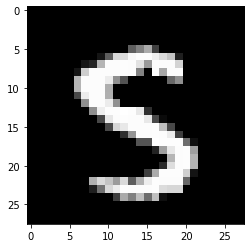

pred :  5 [6.3324367e-13 6.5375080e-11 2.2348225e-10 2.3595463e-05 8.8682256e-14
 9.9970019e-01 8.2104627e-12 1.4259980e-11 1.2579123e-05 6.6223741e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


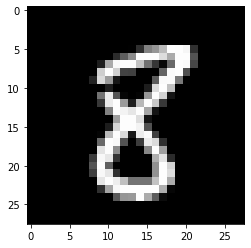

pred :  8 [7.0544516e-08 5.4899793e-08 9.8230274e-05 6.9475835e-05 2.8245616e-11
 3.4813181e-09 1.2848889e-06 3.3718063e-11 9.9986184e-01 6.3169843e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


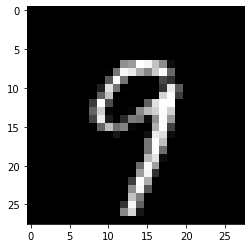

pred :  9 [2.71709530e-11 3.98717517e-12 5.32039274e-11 4.70556927e-10
 1.12864225e-08 1.66897980e-08 1.06957195e-12 5.18143177e-04
 1.50242274e-09 9.99999821e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


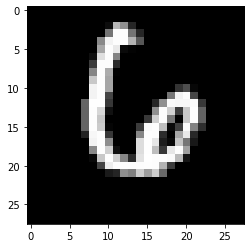

pred :  6 [9.6768877e-09 3.4722676e-12 3.7520243e-05 1.3615425e-12 1.6669977e-08
 1.4992495e-11 1.0000000e+00 1.5989639e-07 8.5787271e-09 2.2864011e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


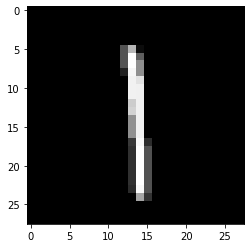

pred :  1 [2.7106520e-14 9.9997222e-01 1.2930356e-07 1.3358048e-05 4.5934076e-11
 3.5544974e-05 2.1833880e-08 4.9785117e-06 5.0179701e-06 2.6830520e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


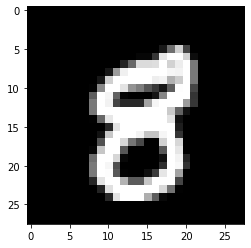

pred :  8 [3.6843200e-09 2.3335360e-09 8.1863476e-07 2.8704187e-07 2.0489646e-08
 2.4470458e-07 4.2126849e-05 1.3568995e-08 9.9999940e-01 1.8641353e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


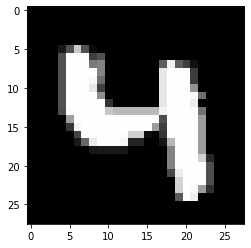

pred :  4 [6.8027025e-12 6.0472329e-11 1.0472729e-09 9.2155936e-09 9.9999875e-01
 4.4922576e-08 2.7922628e-10 1.7010658e-09 6.8571001e-07 4.1924213e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


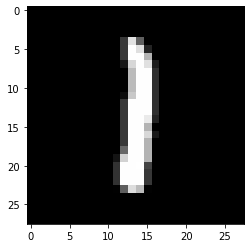

pred :  1 [1.04949195e-10 9.99991536e-01 2.25689917e-07 1.22754109e-08
 3.77935514e-08 1.21337707e-05 1.11597465e-07 1.00647958e-05
 7.32605542e-07 1.23038808e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


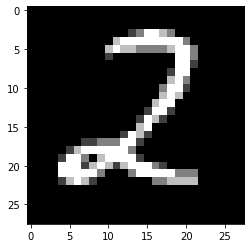

pred :  2 [2.0187292e-09 2.9429793e-04 9.9999988e-01 8.3793748e-06 2.0448923e-12
 2.8524967e-08 5.4146054e-12 8.0064122e-14 4.8880550e-14 1.8068884e-15]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


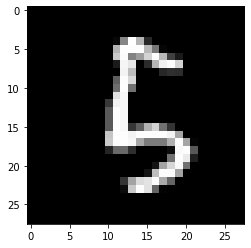

pred :  5 [3.6396081e-11 3.6498275e-07 3.8262833e-08 2.7198493e-03 5.4294696e-07
 9.9705553e-01 5.2717030e-03 4.5074464e-13 3.4877521e-05 3.4796374e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


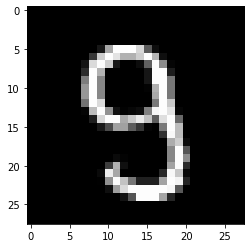

pred :  9 [1.58657514e-07 6.35560886e-13 2.96596482e-07 3.55639277e-05
 1.15095155e-07 1.46567822e-04 5.01835681e-14 3.25104266e-12
 3.00143911e-05 9.76660490e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


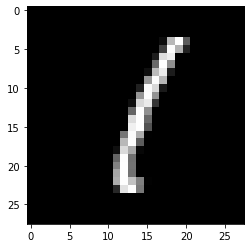

pred :  1 [1.5026019e-07 9.9999982e-01 2.3548828e-06 3.3476172e-10 2.0209271e-07
 1.2798563e-06 1.6472404e-08 5.6060387e-08 5.0903368e-06 1.8835045e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


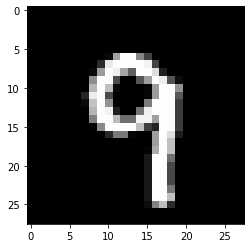

pred :  9 [1.4369528e-10 1.5980315e-12 5.5170357e-10 2.7275206e-08 4.7822778e-07
 8.3066992e-10 7.1941978e-14 2.0880612e-05 2.7164621e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


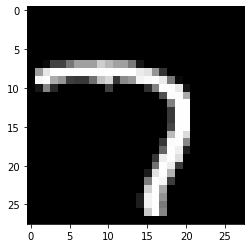

pred :  7 [2.5043487e-06 2.1093574e-12 2.1822495e-06 1.4861233e-07 6.0225567e-14
 1.2738159e-09 5.1810251e-14 9.9999976e-01 4.0448821e-17 2.2002933e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


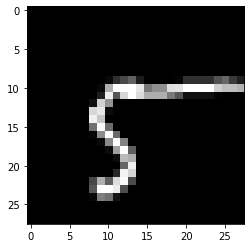

pred :  5 [2.4249124e-08 2.0699750e-07 1.0678058e-10 1.6070531e-10 1.0917143e-12
 1.0000000e+00 1.3122191e-10 2.0939112e-04 4.7207438e-10 4.0075288e-10]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


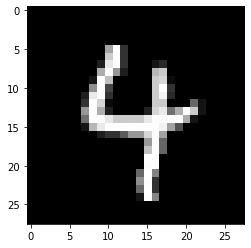

pred :  4 [4.97049058e-17 2.71421285e-09 3.72023107e-11 1.15274915e-10
 1.00000000e+00 2.53066560e-07 2.22691332e-09 1.41183987e-09
 1.37009640e-10 4.89339627e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


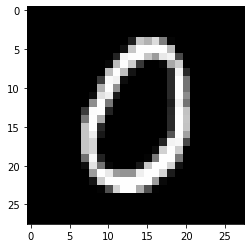

pred :  0 [9.9999869e-01 1.8963203e-08 4.6793841e-05 4.1896447e-10 3.5853858e-13
 1.0603361e-06 4.7944202e-05 4.9265179e-07 1.4007144e-12 3.9611288e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


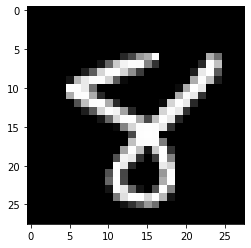

pred :  8 [2.0506650e-12 6.0210686e-16 4.2388398e-05 5.8866906e-05 1.1149970e-05
 6.4134070e-08 1.3065929e-09 6.3383375e-08 1.0000000e+00 1.7779988e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


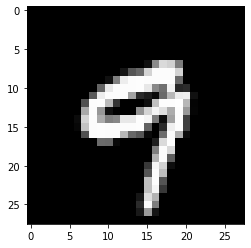

pred :  9 [5.4381155e-10 1.4021349e-18 2.5047844e-09 1.7727078e-05 6.0646258e-08
 8.2943387e-07 9.7505802e-11 2.6552758e-05 7.7406276e-10 9.9999970e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


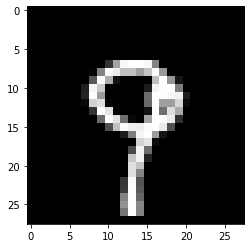

pred :  9 [6.6597799e-10 1.1895240e-12 1.2405672e-11 7.6931156e-10 1.1271821e-05
 5.0260563e-11 3.5303903e-14 1.0637939e-03 2.8262042e-08 9.9996817e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


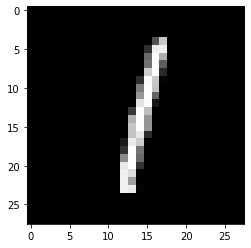

pred :  1 [2.3995235e-09 9.9999815e-01 2.5555185e-08 2.4930069e-09 7.6466506e-07
 3.2625817e-06 2.1295774e-09 3.9355166e-07 1.8627190e-05 1.3007917e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


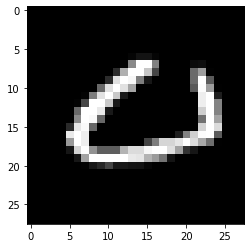

pred :  0 [9.9965471e-01 2.1035558e-12 1.0404682e-08 3.1385248e-08 1.2934137e-06
 1.1316104e-08 1.6744092e-05 2.1942480e-05 7.2263718e-12 2.7390823e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


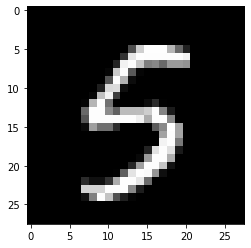

pred :  5 [5.0150509e-12 1.2963465e-08 1.8634172e-07 8.4368111e-08 1.8830285e-11
 9.9999952e-01 8.4943048e-09 2.2698729e-10 9.4731993e-11 2.6713610e-03]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


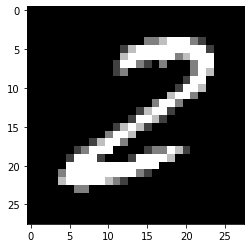

pred :  2 [8.9167614e-08 2.5650911e-07 9.9631429e-01 2.5946188e-06 2.1051299e-15
 1.9869580e-07 1.7754213e-11 6.7698673e-11 4.0083910e-07 1.9103412e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


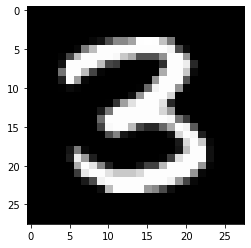

pred :  3 [3.5693684e-11 1.4743586e-07 3.1662578e-10 1.0000000e+00 6.8844208e-10
 3.5266101e-09 3.0011063e-13 4.4588390e-15 7.9700591e-10 6.1103407e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


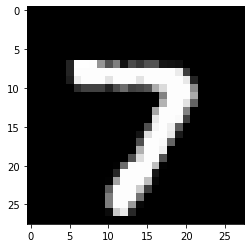

pred :  7 [9.2801419e-11 7.4636369e-14 2.7938267e-08 8.3722051e-07 3.7534534e-14
 5.9828142e-11 3.0123812e-13 1.0000000e+00 1.3905133e-13 5.4761017e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


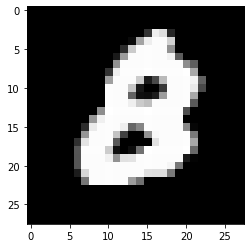

pred :  2 [6.65014982e-03 3.98285788e-12 6.83330357e-01 1.59617739e-05
 4.30230358e-07 3.20153788e-08 3.08779568e-06 1.03471794e-10
 2.34645605e-03 1.82718039e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


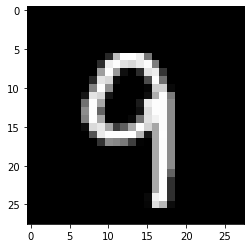

pred :  9 [1.0220177e-10 7.2534964e-11 2.6962568e-09 1.1691489e-07 1.6993019e-07
 1.0899427e-10 2.1435387e-09 2.8996106e-07 6.0536669e-09 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


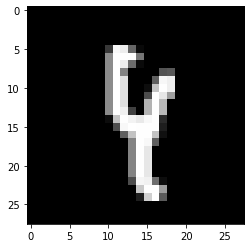

pred :  4 [5.67789181e-15 1.07230117e-04 6.15296911e-11 1.86552443e-05
 9.99742329e-01 1.16583635e-11 8.73718431e-10 3.91285255e-07
 3.47435474e-04 2.05142533e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


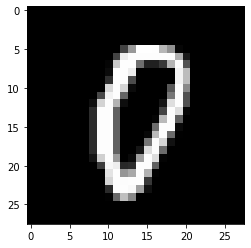

pred :  0 [9.9904692e-01 1.8825669e-13 2.9541905e-05 1.0214857e-10 1.9638391e-09
 7.7194485e-08 5.1450729e-04 3.0837728e-06 4.4008702e-05 4.1594207e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


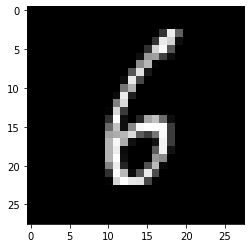

pred :  6 [8.4259592e-11 1.8904724e-09 1.1205151e-04 5.3797844e-14 2.4669862e-09
 3.7945211e-03 9.9987304e-01 3.5298754e-12 3.0399717e-05 2.3667679e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


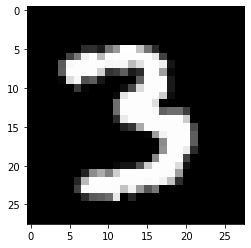

pred :  3 [2.7224282e-11 1.3059227e-09 1.7315759e-08 1.0000000e+00 1.1726506e-09
 2.4040711e-10 6.5859856e-17 3.3576777e-09 1.4874751e-10 1.2606011e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


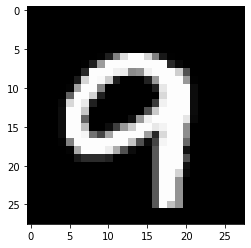

pred :  9 [1.2264675e-07 1.6120162e-15 2.1905817e-06 1.7944167e-05 2.6073435e-06
 8.7555225e-09 8.8637281e-10 2.6555011e-07 9.8666089e-07 9.9999982e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


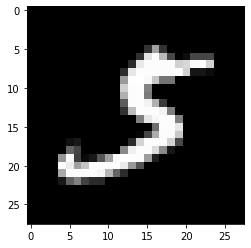

pred :  5 [3.1346911e-11 4.0290558e-07 2.3806969e-08 3.4435391e-03 2.1170480e-08
 9.9985099e-01 3.0677334e-12 1.5601970e-09 1.6192784e-07 2.5883824e-02]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


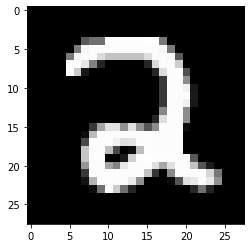

pred :  2 [4.2808551e-08 2.9637337e-09 1.0000000e+00 3.5276645e-10 2.4489777e-10
 9.9013448e-07 2.2617438e-10 1.9505131e-12 7.2223935e-11 4.5388862e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


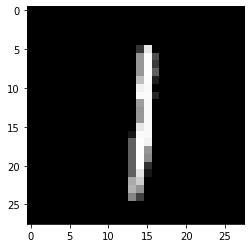

pred :  1 [4.33875809e-12 9.99816358e-01 3.19636806e-09 2.97377900e-09
 2.87605121e-06 2.07203101e-07 1.70900822e-08 1.01822756e-04
 1.42923852e-07 2.36466326e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


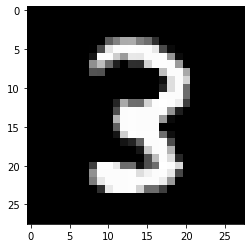

pred :  3 [1.3769419e-10 2.9364172e-08 8.1338578e-07 9.9886590e-01 6.5085835e-14
 1.3475295e-06 4.5090779e-14 2.1789957e-11 2.3051962e-06 4.7874451e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


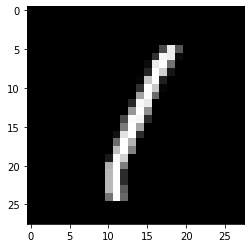

pred :  1 [2.50972448e-07 9.99998569e-01 7.17319040e-07 1.03511276e-10
 5.94622520e-08 1.52069333e-06 3.33113661e-08 6.23014955e-07
 9.04561716e-07 1.11782803e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


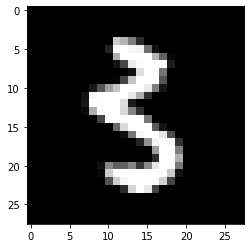

pred :  3 [3.6269475e-07 9.7749798e-06 2.6958196e-09 9.9887276e-01 1.3476143e-08
 1.7627776e-03 7.7602891e-10 5.9579092e-11 1.8065373e-05 1.0872244e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


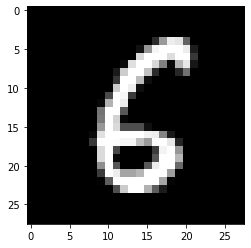

pred :  6 [5.1937525e-07 3.2240333e-08 2.0166088e-05 6.2931122e-13 2.4504633e-14
 1.0853559e-02 9.9995387e-01 1.1494974e-14 2.1170401e-06 1.2873755e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


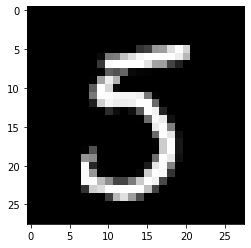

pred :  5 [5.72421777e-10 9.40038433e-07 1.12651194e-10 8.82677256e-08
 6.25155987e-14 9.99983907e-01 8.09128944e-11 1.14846528e-10
 2.24262493e-07 6.03020191e-03]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


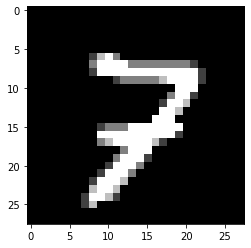

pred :  7 [6.4142745e-12 4.9882177e-15 2.0703673e-04 5.5805336e-05 7.8867024e-11
 4.0690740e-08 7.5566479e-13 9.9987042e-01 2.9967396e-07 1.0830921e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


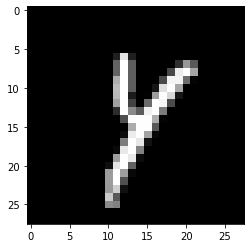

pred :  4 [6.20583297e-14 1.18793025e-04 8.07874774e-12 2.07581063e-09
 9.99997497e-01 4.04297964e-08 1.66725689e-10 2.09814310e-03
 3.79949808e-04 3.00830209e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


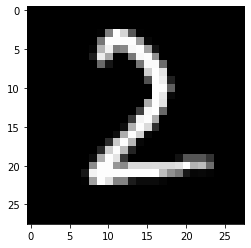

pred :  2 [6.5079078e-08 8.7582322e-08 1.0000000e+00 1.8148553e-07 6.4855678e-15
 5.8922898e-09 1.2036686e-10 6.5225212e-12 2.7828520e-10 9.4227778e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


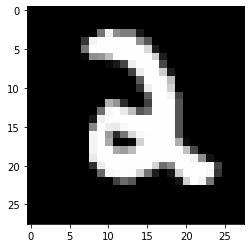

pred :  2 [2.6551880e-10 2.4786372e-08 1.0000000e+00 4.1174106e-05 5.6349210e-11
 1.3435797e-08 3.7180303e-08 2.6422321e-12 6.6420075e-10 9.2393086e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


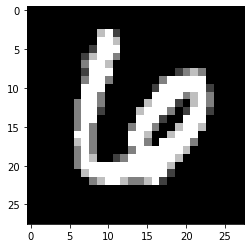

pred :  6 [2.3019789e-05 1.1322057e-09 3.6892295e-04 1.8259705e-08 6.0463883e-08
 6.3698991e-11 1.0000000e+00 9.7226223e-07 6.6501837e-10 2.7834814e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


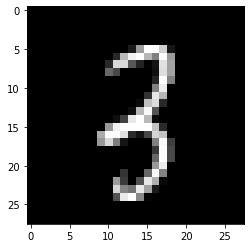

pred :  3 [2.0032225e-12 2.0960625e-08 4.6073178e-06 9.9997056e-01 2.8143319e-12
 2.9714997e-07 4.4751277e-12 1.0118445e-04 2.3758728e-06 4.1516589e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


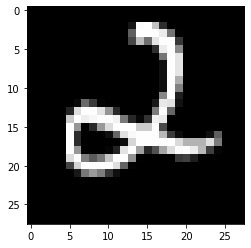

pred :  2 [1.2699665e-08 7.4168456e-11 9.9998903e-01 4.0103600e-07 2.1523749e-06
 3.2694807e-08 4.1681528e-04 5.5240871e-15 9.2518655e-07 6.5254421e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


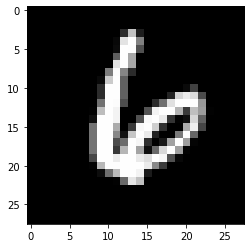

pred :  6 [6.2291903e-08 3.4442362e-11 4.3052878e-05 2.1412269e-08 2.4000306e-06
 1.3014672e-12 9.9999946e-01 1.2883759e-10 1.4565205e-05 2.7028682e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


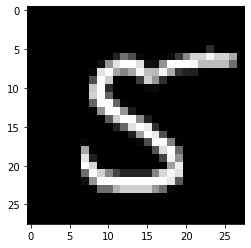

pred :  5 [1.6200768e-11 2.7889695e-09 1.5047336e-10 4.5382675e-10 1.2004833e-11
 9.9999964e-01 2.8047664e-12 1.1192488e-11 4.3851323e-08 1.9784263e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


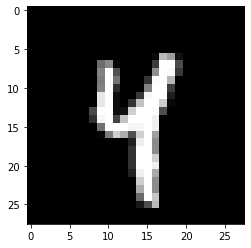

pred :  4 [6.2159466e-15 6.6707134e-03 8.0875736e-14 2.1541973e-07 9.9999082e-01
 9.6804186e-08 4.5547937e-11 1.4484448e-07 1.0039147e-06 1.7961955e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


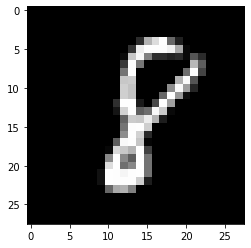

pred :  8 [2.78975847e-08 1.71478291e-06 1.03496426e-07 2.36072779e-07
 1.24838380e-07 1.78068840e-05 5.22228618e-07 1.29984992e-08
 9.99989331e-01 6.21199447e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


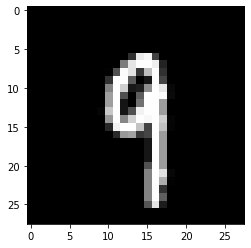

pred :  9 [1.2914216e-14 4.2039375e-08 2.6739466e-10 9.1178279e-08 5.2166121e-07
 1.6471683e-08 2.9772633e-13 3.9571715e-09 4.5790577e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


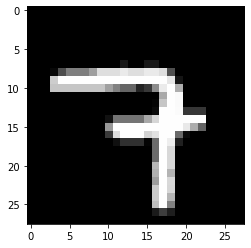

pred :  7 [2.2373589e-11 1.2651402e-13 1.5029508e-08 1.6513467e-04 3.8164565e-09
 3.7431334e-12 1.0484951e-11 9.9149549e-01 2.5459157e-11 2.1054745e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


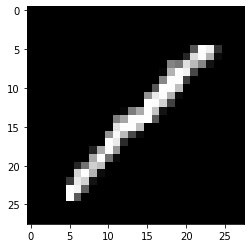

pred :  1 [8.3036689e-11 9.9985242e-01 2.8352164e-11 6.0826540e-04 1.1420792e-06
 3.6427182e-06 3.1946890e-11 2.1664412e-09 3.8591429e-07 9.9134090e-11]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


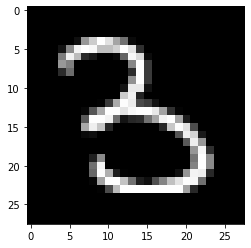

pred :  3 [8.96700908e-11 8.40192806e-05 2.88294405e-06 1.00000000e+00
 1.44862715e-05 1.94611331e-08 2.31808378e-10 1.81401498e-12
 5.01558484e-09 8.50092430e-15]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


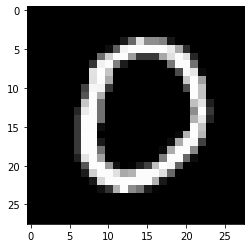

pred :  0 [9.9999988e-01 4.1509463e-07 2.2504085e-07 3.5953601e-11 2.8742698e-13
 2.1713228e-07 6.5739359e-06 1.4711617e-09 2.0647832e-15 3.1476670e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


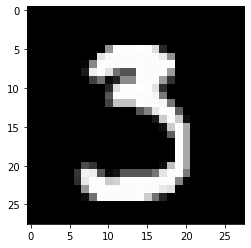

pred :  3 [4.2608266e-07 2.6906431e-08 3.4472271e-07 9.9997711e-01 7.9012351e-14
 1.1312641e-06 2.8899296e-18 1.8192444e-11 1.1573498e-09 2.1821260e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


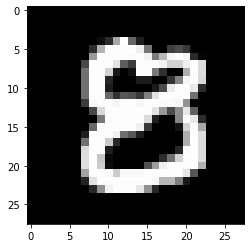

pred :  8 [8.33285139e-06 1.01651245e-13 7.41191834e-05 2.04890966e-04
 2.63772684e-11 4.36633718e-06 2.84794108e-08 2.91109063e-14
 9.99240756e-01 8.22879542e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


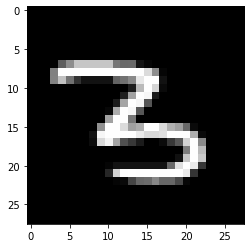

pred :  3 [6.6949313e-10 5.7831078e-09 1.3808608e-03 9.9993223e-01 6.0013633e-11
 5.8672698e-09 1.4553845e-09 4.1712783e-06 2.7130986e-10 7.1486960e-16]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


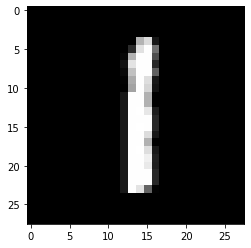

pred :  1 [3.9167220e-12 9.9999464e-01 6.0097115e-08 6.2246770e-08 4.9170175e-09
 9.5743017e-06 4.9067708e-08 1.5902873e-06 3.3270444e-06 1.7178321e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


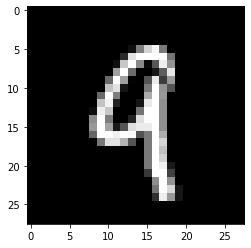

pred :  9 [5.8744272e-12 1.0360056e-06 8.1056783e-07 1.2053135e-06 2.6164055e-03
 2.2734760e-06 2.2786590e-12 4.1506830e-08 2.1820767e-08 9.9980962e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


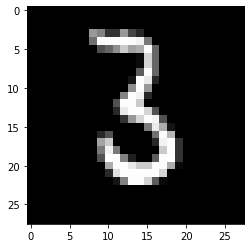

pred :  3 [4.2463002e-09 6.3984089e-06 2.5653839e-04 9.9960113e-01 1.0260735e-12
 4.4737540e-08 4.8889979e-06 4.9409717e-13 2.9281802e-07 4.2904617e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


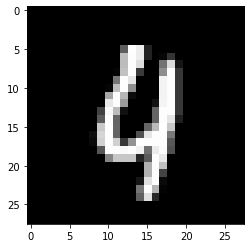

pred :  4 [1.7078011e-06 4.6044910e-09 2.5753272e-07 2.3687576e-06 9.9984801e-01
 1.4148733e-08 3.7649798e-08 1.6646683e-03 4.9108172e-11 2.6679039e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


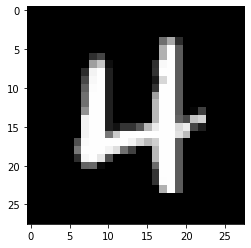

pred :  4 [7.06070125e-07 1.07589484e-11 3.59342721e-07 5.87662974e-10
 1.00000000e+00 1.38869325e-08 4.19722568e-07 6.92185687e-09
 1.06751308e-09 1.28070187e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


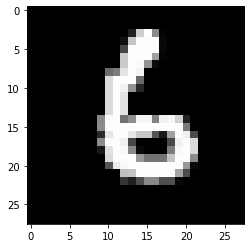

pred :  6 [3.5477590e-10 3.1029052e-05 9.5443954e-07 3.8900933e-05 3.4739273e-10
 1.3868570e-05 9.9999923e-01 3.0251606e-15 4.6836250e-09 4.7445887e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


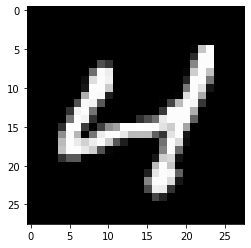

pred :  4 [2.3446328e-08 7.4863657e-17 2.4030674e-06 8.3266824e-11 9.9999851e-01
 1.0020136e-09 2.6430829e-09 1.7225742e-04 6.6619748e-07 1.1836335e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


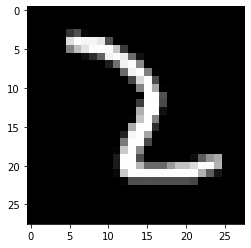

pred :  2 [2.5562224e-14 1.6966420e-01 9.9993467e-01 2.3888663e-08 1.2788184e-13
 3.4014569e-10 2.0975023e-08 8.7650959e-13 1.1824685e-08 5.4392563e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


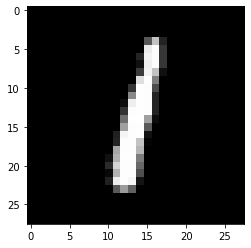

pred :  1 [2.3173776e-09 9.9998915e-01 1.9307726e-07 1.5027975e-10 2.2885301e-07
 5.2815808e-06 7.0785309e-06 2.8629609e-07 3.3464734e-05 9.0349989e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


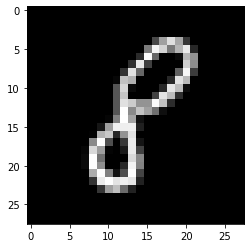

pred :  8 [3.3297408e-07 2.0160329e-08 1.7163953e-05 1.6285496e-06 1.5479706e-08
 3.4836184e-08 6.7529082e-04 5.1739744e-14 9.9893832e-01 3.3912183e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


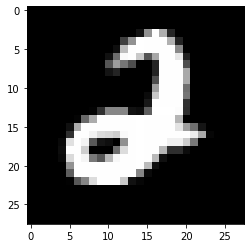

pred :  2 [3.8567713e-08 2.4757843e-11 1.0000000e+00 1.2181103e-03 4.5861309e-08
 1.5401947e-09 1.6487666e-06 6.8925692e-13 2.3104981e-08 2.3869746e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


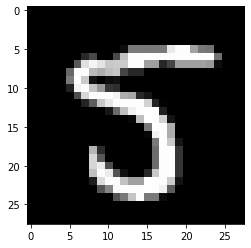

pred :  5 [1.2380114e-12 1.5090635e-08 2.2097562e-09 5.8320910e-07 1.5696288e-13
 9.9998760e-01 3.0433883e-13 5.9491773e-11 1.9807230e-08 1.9635096e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


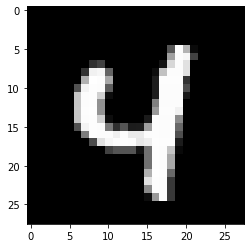

pred :  4 [1.3730178e-11 7.1285762e-11 7.7256673e-11 7.0041672e-10 1.0000000e+00
 4.2972907e-08 7.8418078e-11 4.9657842e-08 2.0159088e-09 6.9922548e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


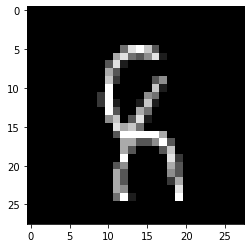

pred :  8 [4.5211560e-12 3.5205716e-07 2.0727515e-04 8.4083766e-08 8.5970759e-04
 3.5536566e-05 3.1173722e-06 4.9455801e-10 9.9854285e-01 1.0871145e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


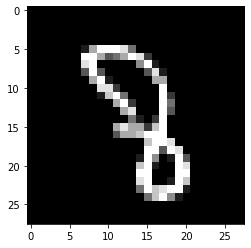

pred :  8 [1.9145085e-13 2.2832447e-08 2.7221804e-06 1.6625343e-05 7.4416443e-05
 1.6480835e-05 1.1551362e-08 5.4425908e-07 8.9499640e-01 3.7951224e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


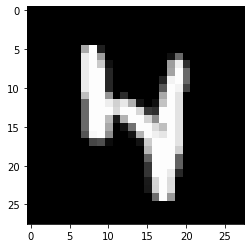

pred :  4 [1.3625478e-16 2.8210859e-13 2.0655250e-10 2.8148261e-08 1.0000000e+00
 1.8412177e-07 1.2629708e-12 2.8464198e-04 8.2684499e-09 2.0257093e-10]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


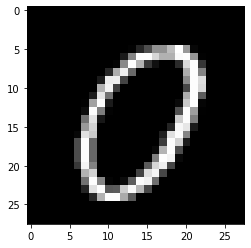

pred :  0 [9.9932563e-01 4.5845766e-07 1.5802692e-05 2.3364265e-07 1.1921547e-11
 2.4822757e-06 8.5347673e-11 3.8428716e-06 1.5252546e-11 2.0999014e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


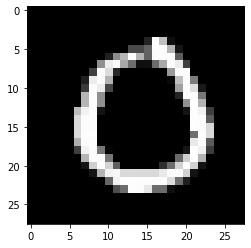

pred :  0 [1.0000000e+00 1.7824034e-08 4.3813952e-08 4.5136303e-10 8.1345737e-14
 2.2136089e-08 1.5751436e-06 2.2071500e-08 3.0785975e-14 6.2996821e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


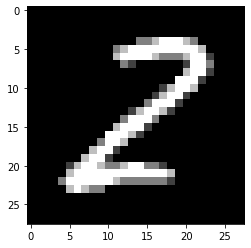

pred :  2 [4.1066494e-07 3.0097615e-06 9.5072579e-01 8.6271875e-06 7.6092220e-13
 2.0118458e-08 2.3222678e-12 9.6791256e-12 2.5620730e-06 5.4599800e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


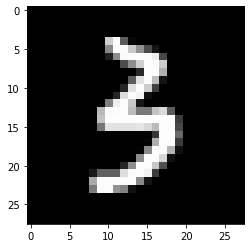

pred :  3 [9.6102615e-10 6.4194795e-11 2.4953870e-06 9.9974322e-01 2.5372847e-05
 1.8683076e-04 2.1260465e-09 2.8787073e-10 9.9453727e-12 1.7331134e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


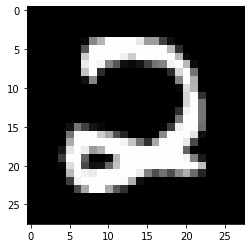

pred :  2 [8.0955928e-08 1.0121513e-10 9.9999964e-01 1.5598147e-07 1.3147142e-14
 5.0211369e-05 4.4127928e-09 4.1224368e-12 5.8049966e-14 8.1180436e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


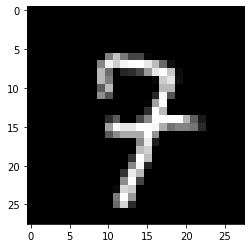

pred :  7 [2.27112420e-14 2.53185667e-12 1.28208319e-10 8.69350743e-08
 4.34995940e-07 4.81856222e-11 1.40670435e-11 9.99942243e-01
 1.02306698e-10 1.70171261e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


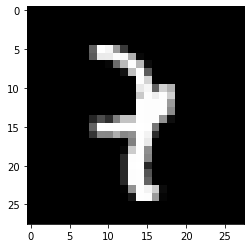

pred :  7 [6.8600952e-13 1.1054575e-03 1.5607187e-06 1.7455220e-04 4.9502237e-06
 7.9365220e-13 1.7182844e-08 1.1378598e-01 1.7026832e-08 6.8678892e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


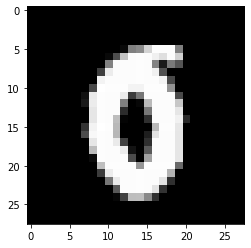

pred :  0 [9.76471424e-01 1.20041810e-09 9.22474257e-08 7.79915899e-06
 2.82749426e-07 1.17461233e-04 1.06649815e-04 8.91941454e-08
 4.78136135e-05 5.17988205e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


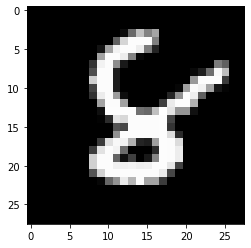

pred :  8 [8.5731196e-12 3.4098490e-14 6.5574022e-07 2.3508942e-07 4.9451373e-06
 1.4464557e-03 1.2797105e-05 1.4834347e-14 9.9999815e-01 7.4596668e-10]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


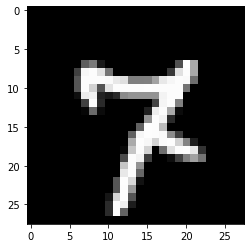

pred :  7 [3.7599653e-11 2.7769084e-10 1.0291680e-09 5.9612120e-09 9.2604765e-08
 8.5034924e-10 2.0689514e-10 1.0000000e+00 3.7866266e-09 6.9521695e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


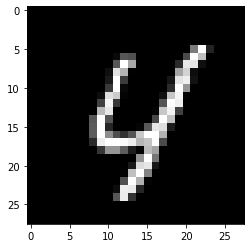

pred :  4 [8.0833604e-11 4.8904336e-10 3.9756633e-06 1.6329718e-09 9.9999297e-01
 6.4711958e-06 8.1993870e-11 2.0966294e-07 6.1897978e-08 4.2601400e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


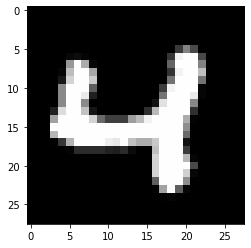

pred :  4 [4.4856215e-12 1.9094741e-11 2.0595349e-05 4.7051230e-09 9.9999982e-01
 9.9421683e-08 5.2851521e-12 5.0129763e-08 5.5476977e-07 2.4120092e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


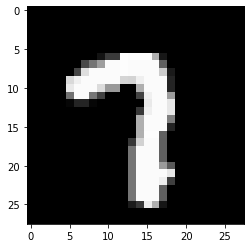

pred :  7 [1.0950610e-09 2.7969978e-07 1.0765791e-02 5.3021182e-07 4.6957268e-13
 6.4512701e-11 3.6401459e-13 9.9984205e-01 1.3481920e-09 6.6413113e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


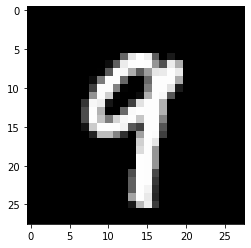

pred :  9 [5.2513668e-13 4.0953818e-09 1.5077235e-11 3.0881151e-07 1.7105975e-05
 1.7113569e-08 3.0743008e-15 2.2317803e-05 3.3711156e-05 9.9999934e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


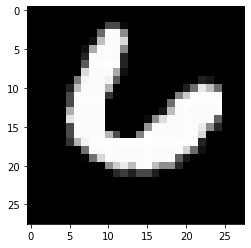

pred :  6 [1.09358494e-04 7.83070576e-14 1.81067861e-07 5.84736862e-14
 3.74525785e-04 2.17704517e-13 1.00000000e+00 9.27011661e-06
 6.36760644e-10 4.74493476e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


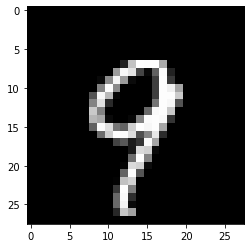

pred :  9 [2.15474253e-12 6.47994841e-13 1.85229471e-10 1.05182965e-08
 4.14358374e-06 1.33399236e-10 2.42288377e-11 2.28000161e-07
 2.10446296e-06 1.00000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


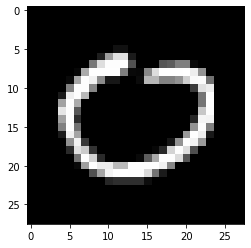

pred :  0 [9.9979180e-01 8.1936932e-08 2.0268903e-08 4.6604803e-10 1.9208390e-14
 1.2657033e-06 2.3891772e-07 8.0198050e-04 1.7589700e-14 1.9964208e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


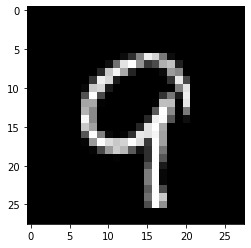

pred :  9 [1.04629261e-09 5.32176503e-14 3.87073305e-06 1.08883534e-04
 3.26722400e-08 3.33291283e-10 4.36311538e-08 6.44857394e-08
 2.87801285e-08 9.99999821e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


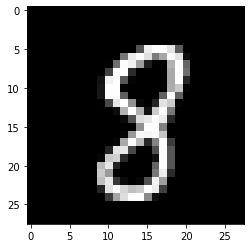

pred :  8 [8.5856799e-10 2.6135909e-09 2.1698739e-05 4.3563882e-06 7.2761179e-09
 1.3467767e-06 2.6271604e-07 2.3660256e-08 9.9994695e-01 1.4865398e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


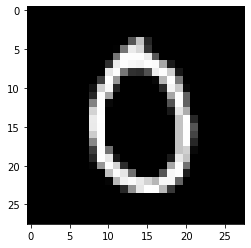

pred :  0 [9.9999976e-01 3.2577295e-11 3.7678161e-05 1.0635723e-09 1.1891285e-13
 8.7913673e-07 3.0202952e-07 4.7591897e-08 5.9139049e-10 2.3654103e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


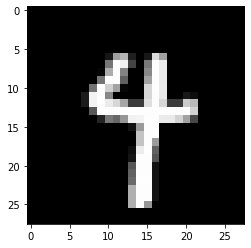

pred :  4 [7.0210900e-13 6.4758565e-10 1.0138298e-11 1.5568320e-09 9.9998522e-01
 3.2021163e-09 2.6741952e-11 3.4758449e-03 2.0671196e-06 5.0939023e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


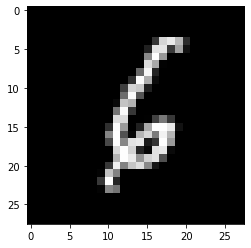

pred :  6 [4.4063802e-07 2.3115769e-09 2.6059151e-04 2.5197539e-07 2.3239289e-05
 1.0110636e-05 9.9999380e-01 5.1160205e-09 1.2812345e-07 1.1393562e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


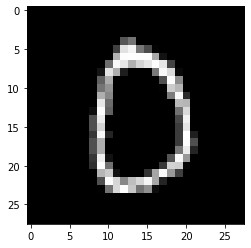

pred :  0 [9.9999750e-01 4.6838550e-10 3.4996867e-04 2.5023776e-09 8.5786192e-15
 3.4703019e-06 5.7496369e-10 2.1885457e-08 4.5457785e-10 1.3627047e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


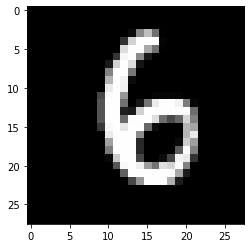

pred :  6 [1.1683111e-12 2.1249813e-08 8.7786913e-07 4.5137640e-06 2.6572007e-09
 6.2172489e-08 9.9962497e-01 1.0284584e-15 8.8262856e-03 7.5533986e-04]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


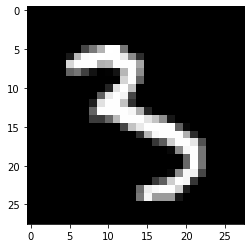

pred :  3 [1.6637845e-14 5.8152764e-08 1.2766513e-10 9.9999928e-01 2.3604035e-03
 1.3046768e-05 7.0531422e-13 3.0159935e-08 1.3764975e-07 2.1568673e-13]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


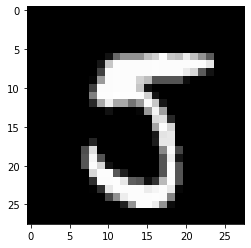

pred :  5 [9.0145841e-10 5.4880713e-09 4.6986304e-07 1.1691979e-07 8.7540559e-16
 9.9999970e-01 1.8379429e-14 7.2045873e-06 9.2869378e-08 5.1136597e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


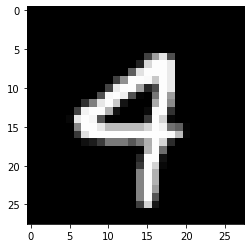

pred :  4 [1.4156729e-11 1.2169345e-11 9.4646708e-08 1.6196846e-07 9.9822545e-01
 7.0563623e-08 3.6818593e-10 3.0795673e-06 2.6470381e-09 1.9208103e-02]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


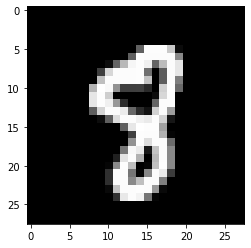

pred :  8 [7.9545764e-08 8.9689856e-09 1.9577963e-06 2.9309129e-05 6.3241784e-10
 1.8701709e-06 5.5037297e-10 8.5424466e-07 9.9985790e-01 6.9063902e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


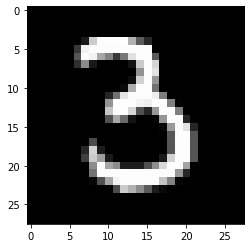

pred :  3 [3.3469805e-09 2.2106670e-07 1.6589104e-07 1.0000000e+00 7.1016613e-12
 4.2094157e-07 7.4786496e-12 9.9125252e-10 1.2789875e-08 2.7020267e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


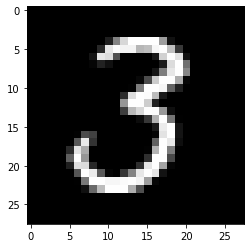

pred :  3 [2.8633320e-09 7.4421837e-07 6.2240474e-08 9.9999988e-01 4.4712073e-10
 9.5566177e-09 7.2424575e-13 4.0347385e-11 2.0962496e-05 4.2944288e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


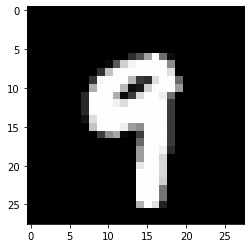

pred :  9 [1.7981078e-11 1.4870064e-11 7.0775308e-10 2.8116802e-09 9.5883012e-04
 2.5169115e-08 5.4153408e-15 1.6148963e-06 3.4550241e-05 9.9999106e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


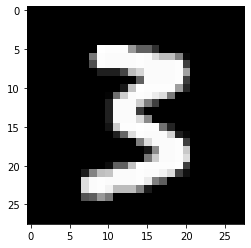

pred :  3 [5.2029109e-10 1.2630078e-07 4.9472551e-08 9.9999970e-01 4.9400461e-10
 1.8374894e-06 8.7664495e-17 9.4427299e-11 3.1142015e-08 1.3761976e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


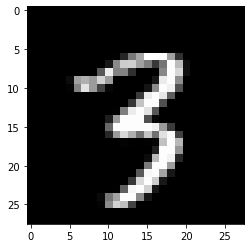

pred :  3 [5.1832466e-15 1.7149905e-08 2.6574415e-11 1.0000000e+00 8.6969931e-11
 2.5952323e-08 3.8891447e-14 1.4107880e-08 8.0749899e-08 9.6337396e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


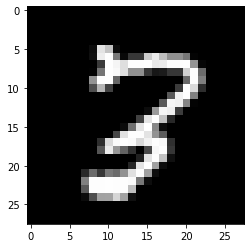

pred :  3 [4.3133319e-10 1.6121957e-10 3.0677617e-03 9.9402297e-01 1.3563099e-15
 1.0774454e-07 7.0762957e-12 4.5557916e-03 6.4587593e-04 1.7102466e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


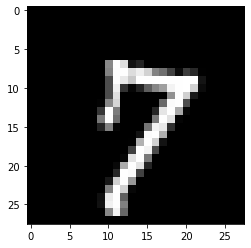

pred :  7 [1.11698775e-08 8.11781875e-14 1.66995889e-10 1.18787746e-07
 9.53548351e-08 2.10541842e-08 4.44233273e-13 1.00000000e+00
 6.05019507e-12 1.70033601e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


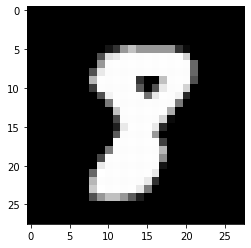

pred :  8 [8.2935671e-08 8.8450628e-07 2.5087595e-04 1.5913585e-06 3.9633314e-11
 1.0716161e-06 2.0904938e-11 3.1764173e-06 9.9999857e-01 2.9231344e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


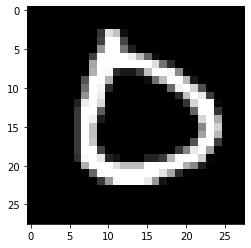

pred :  0 [9.99999881e-01 2.08273399e-10 1.16961894e-06 2.09289341e-09
 4.64642718e-15 1.45951135e-05 1.11332088e-06 1.24433175e-09
 1.31652785e-15 2.19171296e-11]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


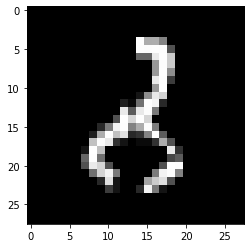

pred :  2 [2.6621025e-08 8.3088875e-04 9.9479049e-01 1.6316772e-04 1.9109589e-09
 8.3694779e-12 3.8091150e-07 6.2723364e-12 2.0042419e-02 1.1390259e-10]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


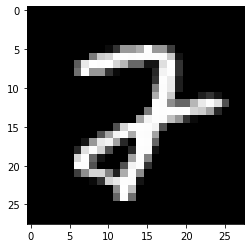

pred :  2 [2.2463088e-07 1.9244597e-09 9.8872221e-01 1.3857201e-07 5.5863900e-11
 1.0634709e-09 3.4220953e-08 2.0784140e-03 1.4680624e-04 6.5005361e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


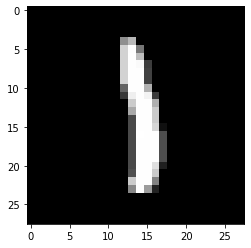

pred :  1 [2.0593263e-13 9.9999905e-01 5.9475128e-06 2.1854993e-09 3.7155510e-07
 6.0016700e-06 3.7143657e-08 1.8403665e-05 4.5384108e-06 6.1261599e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


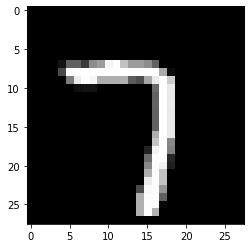

pred :  7 [1.5405393e-08 4.6885923e-10 6.2927441e-08 6.7113540e-08 6.6335461e-15
 3.1370089e-09 1.4241367e-14 1.0000000e+00 2.3127034e-15 1.0935498e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


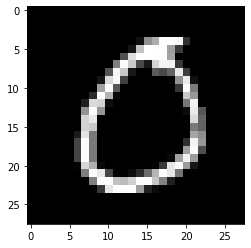

pred :  0 [9.9999875e-01 2.3242269e-06 1.0927899e-05 3.5940544e-09 3.3401003e-16
 1.6127955e-06 8.1817814e-07 9.6955421e-10 7.7113758e-14 6.8521717e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


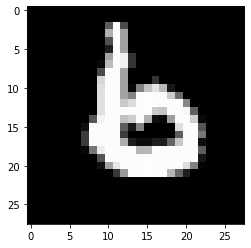

pred :  6 [1.3028315e-07 7.0016089e-12 6.9111586e-04 1.1598000e-04 1.0105955e-08
 1.5026701e-06 9.9999809e-01 7.6259996e-14 6.7228814e-09 7.5883304e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


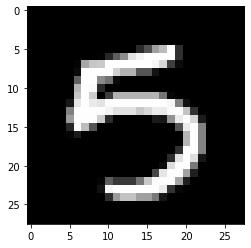

pred :  5 [4.0440457e-11 3.0867120e-10 1.5809999e-15 3.7292878e-06 2.8021477e-11
 9.9998695e-01 3.0368215e-11 5.1182878e-06 1.7500870e-08 6.2622094e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


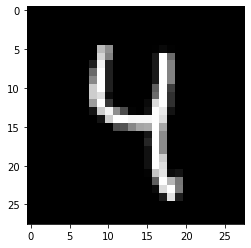

pred :  4 [1.8963280e-15 2.4820482e-08 2.0752315e-10 1.3634397e-08 1.0000000e+00
 3.4837910e-08 2.6674452e-15 4.0247066e-08 2.3376712e-08 4.0939682e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


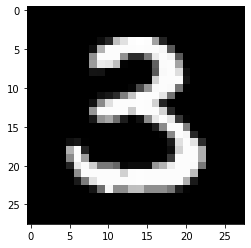

pred :  3 [1.36430789e-09 2.12562395e-06 4.91331704e-08 9.99999285e-01
 1.59124144e-10 1.72761489e-07 1.04233665e-13 1.55343183e-14
 5.71776049e-09 8.28025470e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


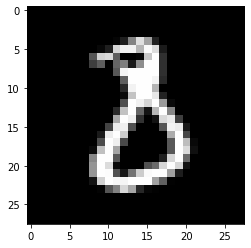

pred :  8 [4.7983082e-07 2.8735947e-06 2.0137429e-04 5.8215857e-03 9.9778632e-12
 2.7465217e-09 7.0816333e-07 1.2519317e-11 9.9801195e-01 2.1347044e-10]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


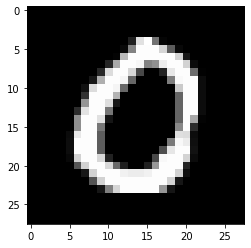

pred :  0 [9.9999154e-01 3.6479031e-09 3.7370293e-07 1.4962207e-08 6.2514970e-15
 2.6274660e-07 2.9670116e-07 6.4185741e-07 1.8815905e-13 7.6379443e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


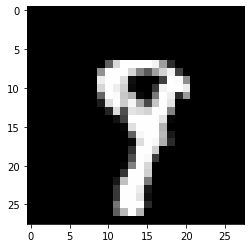

pred :  9 [2.0042402e-11 1.3246998e-10 4.0763989e-12 2.5232674e-05 9.3826776e-07
 3.4892089e-09 9.7405549e-16 1.2470155e-05 7.3975616e-07 9.9994957e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


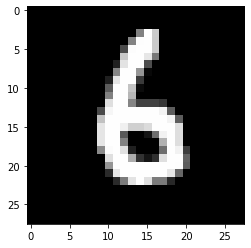

pred :  6 [1.05974056e-10 7.12152723e-06 8.94705579e-07 6.05077275e-06
 1.66574239e-08 1.50794367e-05 9.99999523e-01 2.06611597e-14
 2.57702459e-09 3.45911833e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


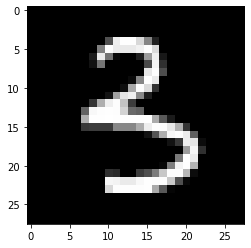

pred :  3 [9.0136856e-11 9.1555353e-07 3.9993697e-08 9.9999881e-01 6.9978950e-07
 1.7741323e-04 3.2817086e-11 6.4296286e-14 3.9007869e-06 2.5140721e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


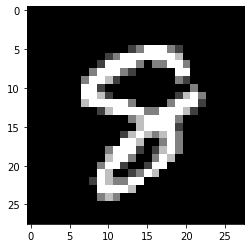

pred :  8 [3.4154033e-09 8.4356515e-12 1.3844669e-03 5.3706863e-08 1.8917636e-09
 1.0222488e-08 1.7873125e-08 4.2878423e-08 9.9999893e-01 3.6268383e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


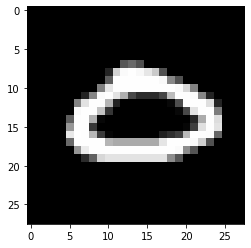

pred :  0 [9.9999809e-01 2.0769145e-10 7.9591982e-06 6.9862083e-10 1.3917679e-06
 4.1088435e-05 4.6447688e-08 2.1129847e-04 4.0806776e-12 9.9730887e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


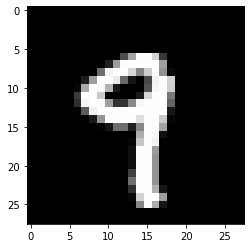

pred :  9 [3.4025109e-12 5.4514053e-11 8.4439022e-10 1.5993246e-08 2.8130412e-04
 7.6747331e-11 2.6139183e-14 2.1738599e-06 4.6533773e-05 9.9999762e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


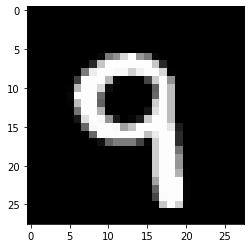

pred :  9 [1.8650261e-09 1.8544068e-12 3.1846631e-07 1.7484729e-07 6.2304584e-09
 9.0563464e-07 1.9143873e-10 4.7345881e-07 5.6130924e-05 9.9999970e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


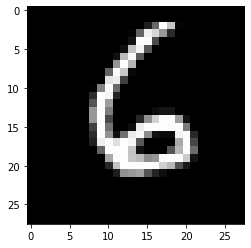

pred :  6 [7.9882377e-12 1.8361186e-09 4.1194997e-07 1.7266282e-07 5.2154627e-09
 1.3859156e-07 9.9999982e-01 5.1313728e-13 5.6077574e-09 3.0649133e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


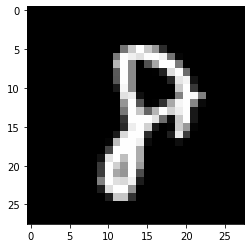

pred :  8 [2.3154039e-08 3.9459942e-09 5.1164627e-04 6.7293672e-07 2.8125546e-09
 5.9516116e-09 4.5567990e-08 1.7175807e-05 9.9999976e-01 3.2294571e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


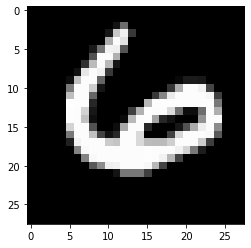

pred :  6 [1.8333541e-05 1.7342639e-11 6.1841078e-05 1.1415647e-07 7.6326687e-09
 2.2219440e-10 1.0000000e+00 1.3037997e-09 1.9048063e-08 3.7377529e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


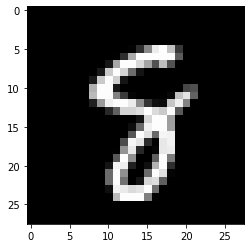

pred :  8 [2.7056005e-10 4.6662861e-11 4.4622492e-08 3.3973154e-07 7.3338424e-09
 1.0926467e-06 1.8223539e-06 4.5251511e-08 9.9999106e-01 3.4634289e-01]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


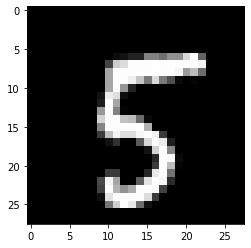

pred :  5 [2.8921494e-12 2.0426139e-10 1.7135361e-11 2.9059652e-06 7.4705401e-15
 1.0000000e+00 9.3456686e-15 5.0437244e-08 1.0014638e-08 1.1977863e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


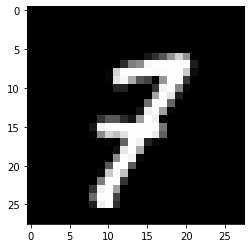

pred :  7 [1.4937299e-14 1.2012679e-05 1.5275349e-10 1.4094271e-06 2.4833467e-11
 3.4983788e-07 8.8786346e-14 9.9911356e-01 7.5287716e-08 4.5359135e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


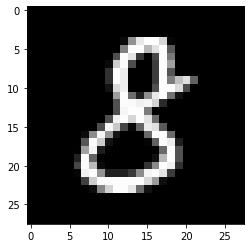

pred :  8 [5.7693808e-07 6.6413300e-08 1.1781934e-06 9.0536436e-05 5.8162277e-07
 4.0290384e-08 2.0925174e-06 3.1081544e-12 9.9932981e-01 5.6690060e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


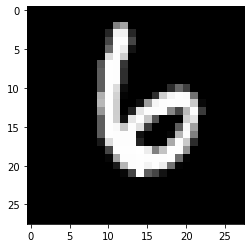

pred :  6 [9.1999837e-12 2.8929728e-11 1.1827354e-05 6.2145695e-08 2.1270047e-08
 4.9400675e-09 1.0000000e+00 5.0591879e-12 4.4154111e-09 9.6160795e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


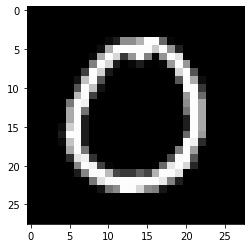

pred :  0 [9.9999285e-01 4.6631283e-07 1.2309772e-06 4.1577567e-07 4.5385093e-14
 4.2058905e-06 1.1133315e-08 1.1097685e-10 3.4101953e-13 1.7131567e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


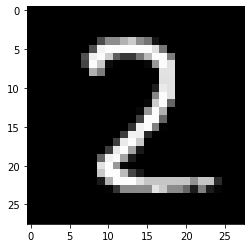

pred :  2 [2.7805430e-07 2.6675055e-08 9.9999976e-01 4.2515436e-09 2.1617211e-11
 1.3168872e-07 7.2926089e-13 8.4790287e-08 7.5705884e-08 2.9290167e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


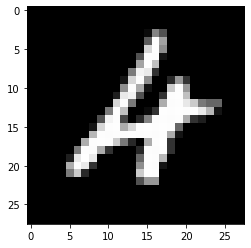

pred :  4 [1.7108584e-07 1.8551011e-11 4.8227435e-01 1.1598276e-08 9.7981083e-01
 2.3830388e-10 5.8161706e-02 6.3608759e-08 1.2084598e-05 2.4573708e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


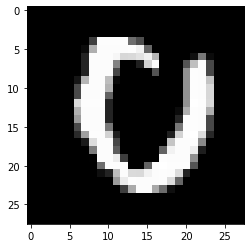

pred :  0 [9.9970734e-01 7.7442532e-12 3.2280759e-08 3.8351988e-11 2.0295555e-08
 1.8054238e-06 1.2478232e-04 6.3015806e-09 4.6363377e-10 2.4710234e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


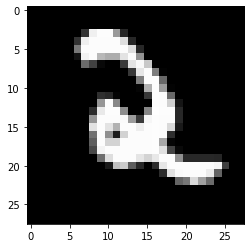

pred :  2 [3.2193151e-11 1.9251361e-08 9.9999344e-01 3.0764440e-06 8.5000629e-08
 1.6792865e-09 1.5768917e-06 1.9521171e-12 2.1147668e-09 1.0202371e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


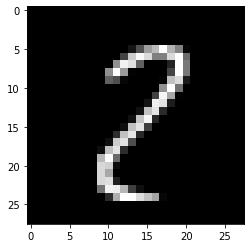

pred :  2 [1.1134376e-08 5.1411924e-08 9.8327208e-01 9.4477844e-07 1.2110998e-14
 7.1626324e-08 3.2241820e-11 1.9715428e-03 3.9622903e-02 9.7807973e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


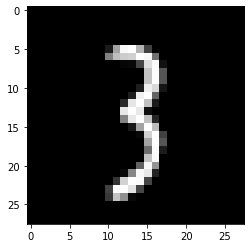

pred :  3 [7.2768874e-11 3.0682617e-07 7.7623206e-09 9.9999678e-01 6.8506942e-09
 1.6671433e-07 1.1568355e-13 1.3373440e-06 1.3904460e-05 6.6844118e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


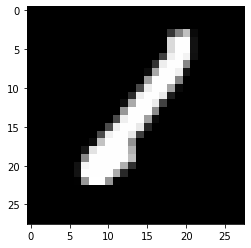

pred :  1 [5.5278164e-08 9.9999428e-01 2.8517842e-02 7.5841848e-09 5.2279492e-10
 1.4391615e-07 3.6485521e-06 5.5793486e-12 5.4465259e-09 6.6852266e-12]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


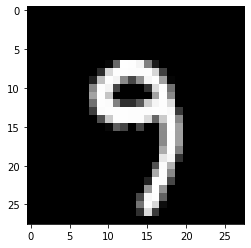

pred :  9 [5.0195080e-13 5.3603006e-15 5.7986477e-13 2.5611069e-05 9.6966482e-07
 3.7817185e-09 1.8834853e-14 2.4850965e-06 5.2712497e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


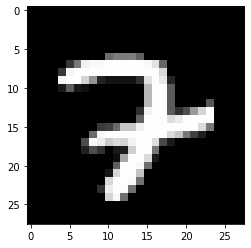

pred :  7 [5.7196039e-09 3.5728386e-13 3.9346665e-02 1.8010779e-10 1.9704183e-07
 4.8685340e-14 1.6547784e-09 9.9999523e-01 4.6415338e-09 5.6866334e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


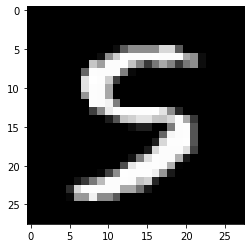

pred :  5 [9.41524549e-12 7.83987875e-11 1.08564535e-07 1.41942451e-07
 4.21107729e-13 9.99973536e-01 2.44146961e-13 5.47695278e-10
 1.13148622e-10 2.19672918e-03]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


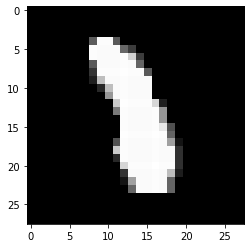

pred :  1 [1.7743940e-09 9.3541288e-01 6.9686770e-04 3.7635082e-06 2.5412572e-08
 5.9539507e-09 5.5238588e-06 7.2681046e-06 8.6197346e-02 1.6730428e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


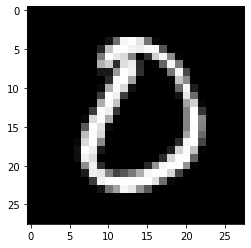

pred :  0 [9.9868762e-01 1.4379564e-06 6.8808276e-07 1.5311836e-05 1.6202785e-10
 8.9959576e-06 1.8160345e-05 9.9825127e-11 2.9504201e-11 1.8871715e-10]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


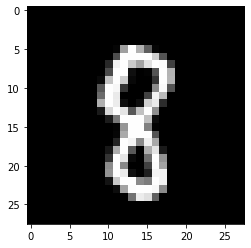

pred :  8 [3.6213692e-07 7.5779383e-09 1.2073631e-05 1.3760480e-06 1.1775390e-09
 1.2708267e-08 3.7970375e-07 5.9592793e-09 9.9999923e-01 4.8839021e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


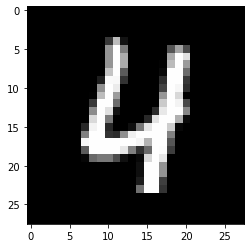

pred :  4 [4.0913388e-12 9.2514191e-12 1.9764651e-07 7.8023544e-07 9.9999225e-01
 9.0111200e-08 2.1639067e-08 2.2871010e-09 1.2237260e-08 1.7407537e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


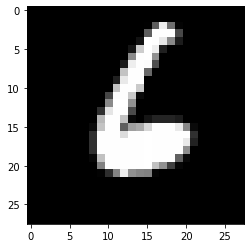

pred :  6 [7.3436333e-11 6.4926121e-07 1.2565431e-05 1.0620286e-11 2.3932500e-07
 3.8826285e-05 1.0000000e+00 1.8139778e-11 2.4745050e-11 1.0439333e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


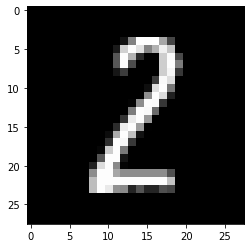

pred :  2 [3.92407088e-07 7.48035563e-06 9.99960899e-01 7.94416394e-07
 5.99125838e-13 4.30280789e-09 1.24010125e-11 3.79089538e-10
 6.61485137e-06 1.69290360e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


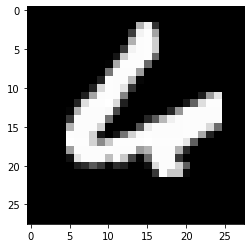

pred :  6 [6.78531592e-07 8.47062264e-12 4.47828133e-05 7.60228886e-07
 8.71708989e-03 1.44465095e-09 9.99665737e-01 1.07824555e-10
 1.01416542e-09 9.09705165e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


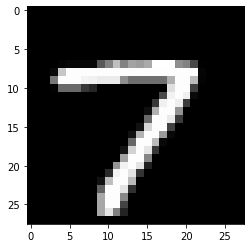

pred :  7 [1.7388100e-09 3.8594739e-11 6.5504137e-11 2.1332738e-08 6.2476350e-15
 5.6048083e-12 1.0090584e-12 1.0000000e+00 3.2493301e-13 1.1403221e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


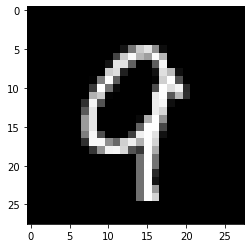

pred :  9 [9.2531494e-08 1.7701222e-08 5.0136150e-05 2.1896105e-06 2.2710716e-05
 8.9017133e-10 1.1181367e-08 2.0033080e-05 5.1097066e-07 9.9999464e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


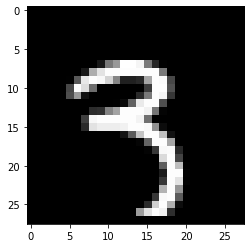

pred :  3 [9.64462711e-12 5.49983614e-10 5.57121666e-07 8.13321233e-01
 3.86672783e-09 1.16725545e-08 1.38892418e-15 8.25072632e-09
 1.44996159e-06 5.03446162e-02]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


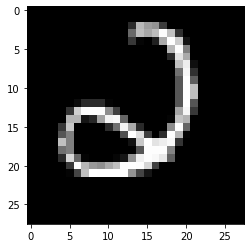

pred :  2 [7.3051453e-04 3.4054669e-11 5.1066667e-01 6.6219553e-07 1.2953016e-07
 1.7001025e-09 1.0058304e-04 3.2537579e-13 4.9930157e-11 1.9483517e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


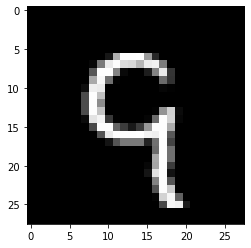

pred :  9 [3.5096530e-13 2.6079398e-16 3.9826818e-07 4.7219301e-11 6.7056312e-09
 4.0382693e-05 3.4788805e-10 1.0363391e-07 1.2593311e-05 9.9999964e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


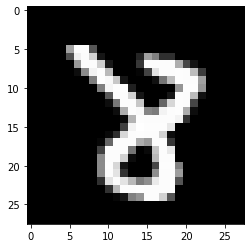

pred :  8 [2.45076381e-09 1.00002029e-09 6.57611527e-05 4.18215990e-04
 9.08326303e-09 5.47073775e-11 1.17744804e-07 6.80549306e-08
 9.99999762e-01 1.80990245e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


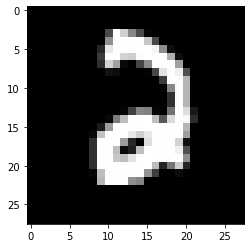

pred :  2 [1.5498790e-08 6.2429445e-14 9.9999928e-01 6.0136132e-05 3.3613586e-15
 3.1561555e-08 2.1734722e-06 1.9293421e-11 6.4097194e-10 4.6298805e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


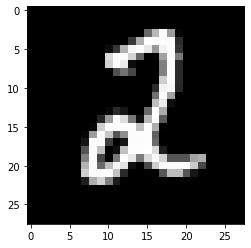

pred :  2 [1.5957792e-10 7.3512406e-06 1.0000000e+00 7.3402134e-08 2.7072948e-13
 9.8686270e-10 6.5783104e-07 5.2092331e-15 1.2913270e-08 1.9495135e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


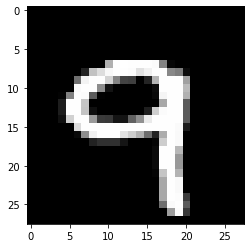

pred :  9 [1.7302437e-10 5.7045271e-16 1.5092111e-07 5.0342096e-06 1.5675819e-06
 4.3060736e-10 7.4876168e-11 3.5003944e-07 2.7952738e-06 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


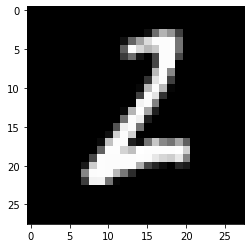

pred :  2 [2.6470586e-09 8.2987547e-04 9.9969405e-01 9.7834982e-07 1.9107492e-15
 9.7329473e-07 3.4801436e-05 1.3816351e-10 1.9300701e-08 2.9973767e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


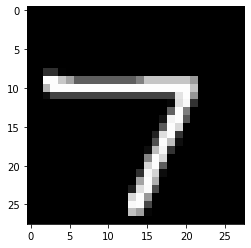

pred :  7 [7.7415365e-08 9.1451047e-15 5.4740941e-09 4.8576034e-08 2.3086147e-14
 2.8612590e-08 2.4445522e-11 1.0000000e+00 3.9673321e-15 1.2726971e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


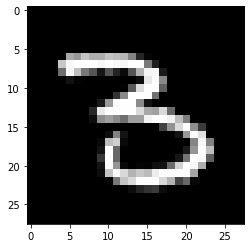

pred :  3 [7.2148318e-08 1.4240385e-07 4.6548084e-06 1.0000000e+00 6.2084079e-12
 2.4959710e-09 7.6794335e-11 3.8590264e-10 3.6804486e-06 5.0166486e-12]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


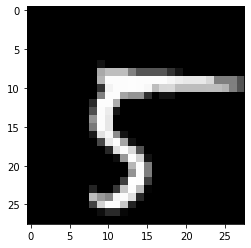

pred :  5 [5.8106692e-10 2.5191627e-09 1.0688724e-12 2.7709113e-08 2.5663897e-17
 1.0000000e+00 2.4540391e-12 1.0983992e-04 1.7293416e-08 3.8399806e-10]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


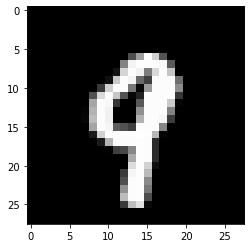

pred :  9 [8.47788839e-10 1.46925565e-08 4.09320506e-08 4.26651131e-05
 1.07046144e-05 1.09079953e-10 6.50456577e-13 6.00424664e-06
 1.21212623e-04 9.99977589e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


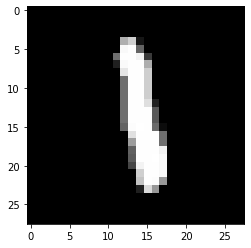

pred :  1 [2.0686237e-14 9.9998564e-01 5.2969453e-06 1.8926308e-08 6.1588878e-07
 1.9444549e-06 1.8274730e-07 3.5819262e-06 7.0659048e-06 3.2096008e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


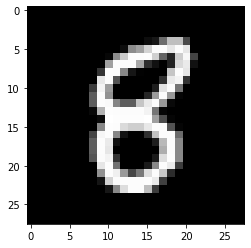

pred :  8 [5.8246150e-07 2.0769095e-11 1.4778716e-06 1.3253918e-05 3.4714367e-10
 6.2039341e-08 6.9987774e-04 3.8622846e-12 9.9986935e-01 7.5948759e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


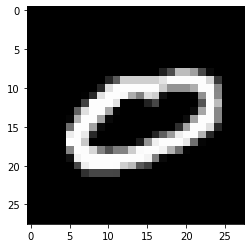

pred :  0 [9.9908972e-01 1.6069144e-11 1.5215826e-06 7.1237038e-09 5.1236766e-09
 1.0088349e-05 4.7075748e-04 1.0591673e-05 1.7317872e-12 5.2314778e-11]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


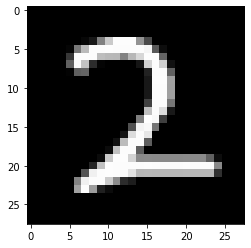

pred :  2 [1.5438624e-09 2.2411306e-05 9.9999952e-01 4.1279984e-07 9.5474843e-14
 4.9865349e-07 3.3051707e-11 1.4286504e-10 7.9365568e-12 2.5539575e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


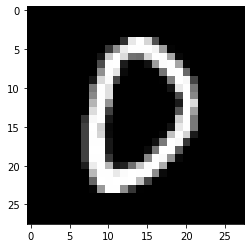

pred :  0 [1.0000000e+00 5.8652611e-11 1.1318624e-03 3.6826389e-10 6.8437755e-12
 9.1636236e-09 3.3158631e-06 2.3193820e-08 3.7215085e-11 2.0362686e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


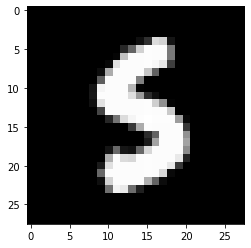

pred :  5 [3.6363607e-11 4.5082510e-07 6.2339204e-08 3.2308311e-05 2.9127628e-10
 9.9969959e-01 1.1538316e-06 7.5691146e-12 3.0595384e-06 3.9447546e-03]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


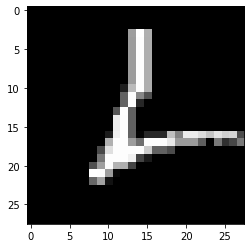

pred :  2 [3.1831249e-08 3.2105560e-05 9.9999404e-01 5.2708149e-09 3.4708558e-09
 1.8326975e-08 1.3970792e-01 3.0039100e-11 1.5932649e-09 2.8118729e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


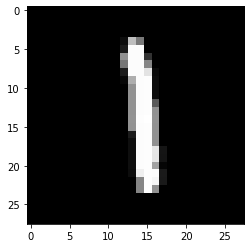

pred :  1 [1.6937553e-13 9.9999976e-01 7.4020073e-07 1.1226837e-09 6.7878240e-08
 1.0251963e-06 5.5918886e-08 4.6363602e-06 5.1637591e-07 2.6269025e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


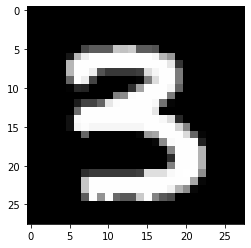

pred :  3 [1.37378081e-10 1.81150490e-08 4.30950803e-10 1.00000000e+00
 1.06428519e-08 1.25204593e-08 1.21511598e-15 6.37077405e-11
 1.52272946e-06 1.08531616e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


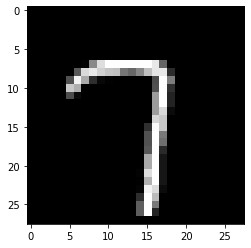

pred :  7 [4.0696754e-10 4.0890593e-09 1.0087589e-05 1.0803856e-08 3.0651406e-13
 1.3986182e-09 2.2768407e-14 9.9999690e-01 1.4172952e-13 1.3456462e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


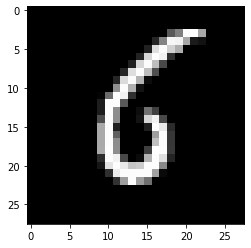

pred :  6 [6.2717538e-07 8.8325203e-07 7.8314397e-06 1.4888730e-12 1.8547755e-11
 5.8710575e-04 9.9999928e-01 2.7350206e-13 2.9343021e-11 2.6293461e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


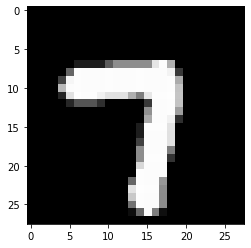

pred :  7 [4.7469348e-11 3.0789882e-12 6.0153191e-08 2.7442450e-08 1.0644327e-13
 4.1117634e-09 6.6408224e-12 1.0000000e+00 4.3324858e-10 4.2632328e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


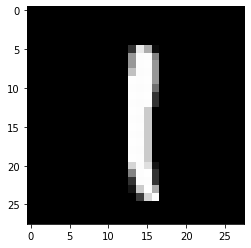

pred :  1 [3.3127743e-12 9.9999416e-01 1.3284794e-07 2.4305444e-07 7.9432882e-10
 9.6320855e-07 1.3971079e-07 6.2267077e-06 2.2980636e-05 1.3856183e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


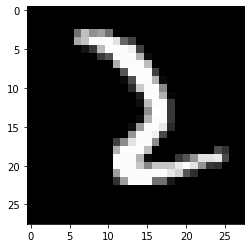

pred :  2 [1.02561414e-11 1.94579363e-04 9.99989748e-01 1.09047875e-07
 1.59746443e-16 1.08145194e-11 3.42897351e-07 4.24485230e-12
 6.08665857e-07 9.02627562e-06]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


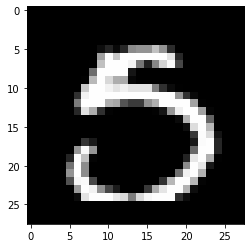

pred :  5 [6.8911013e-06 5.4004108e-09 1.3250700e-08 7.4086529e-07 2.1347104e-12
 9.9932575e-01 3.8360509e-13 1.4287029e-07 1.4536658e-07 4.1065204e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


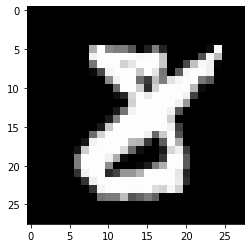

pred :  8 [1.16367875e-08 8.57730420e-09 4.18394804e-04 2.48342752e-04
 1.20500832e-09 1.94101995e-06 1.74520509e-10 6.18149230e-08
 9.96389270e-01 5.74916503e-10]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


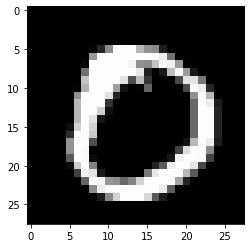

pred :  0 [9.9999619e-01 1.0818708e-07 5.3489263e-10 7.6185609e-07 6.8373103e-14
 1.4221966e-03 9.6710568e-09 2.8179097e-06 1.4551804e-11 2.0599540e-10]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


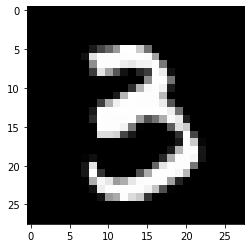

pred :  3 [2.2318118e-09 7.9566554e-08 1.0919200e-09 9.9999869e-01 4.9075284e-12
 7.9920905e-09 3.0225900e-14 7.3870953e-12 4.1321950e-06 4.3088119e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


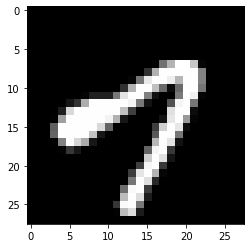

pred :  7 [3.6005797e-05 1.5550593e-14 3.7252101e-10 3.7907850e-11 7.0388443e-05
 8.5502230e-05 1.1381892e-11 9.9993229e-01 5.0931302e-13 9.5480964e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


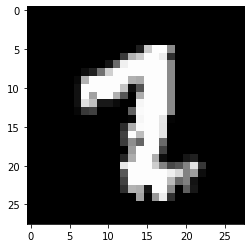

pred :  7 [5.7970861e-10 1.6025633e-02 1.8953264e-02 1.3885498e-03 1.5424790e-09
 4.5177018e-11 9.1584807e-14 8.4981352e-02 7.9907179e-03 6.4199298e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


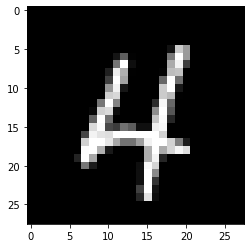

pred :  4 [1.8304851e-13 1.3673755e-07 8.1117332e-07 6.1354437e-09 9.9999982e-01
 2.7021237e-05 2.5067047e-06 1.8932230e-06 4.2157069e-09 6.1813594e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


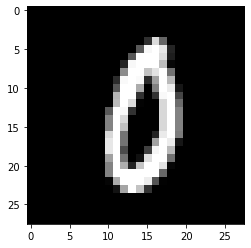

pred :  0 [9.9998873e-01 4.8709214e-10 1.9341707e-04 5.2907984e-07 4.3615756e-08
 6.0723611e-05 1.3300919e-07 3.8678198e-07 1.8328470e-09 3.5238065e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


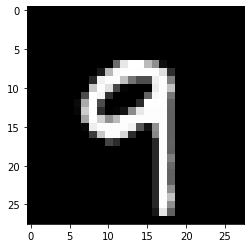

pred :  9 [1.29262365e-11 1.84358605e-13 8.42693204e-09 5.09248275e-06
 2.09967880e-07 2.52635496e-10 1.39649551e-14 2.22772591e-08
 1.27323361e-08 1.00000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


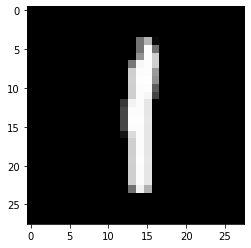

pred :  1 [3.1997259e-11 9.9999672e-01 6.4065082e-09 3.9444180e-07 2.0882810e-08
 2.0814387e-05 1.1439192e-08 3.1889635e-07 7.0466217e-07 5.1783366e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


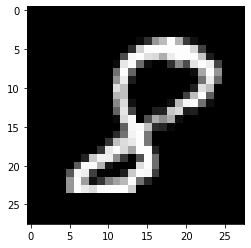

pred :  8 [3.2488980e-08 1.0249742e-08 1.2853742e-04 1.7638560e-09 2.9569944e-11
 9.6651796e-08 7.8014678e-11 1.3628995e-11 9.9999857e-01 1.8882535e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


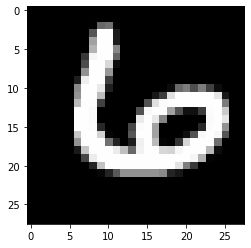

pred :  6 [1.0816310e-06 4.5497906e-08 1.3821229e-06 5.2224780e-10 1.4387972e-08
 7.3694906e-08 1.0000000e+00 4.2310180e-10 4.7114721e-09 1.1373771e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


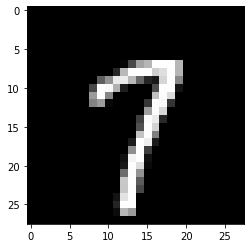

pred :  7 [8.66426486e-10 1.57624368e-06 9.37544486e-12 1.05130175e-05
 2.07809520e-10 1.16583257e-10 2.50006829e-13 9.99942780e-01
 2.93541191e-10 2.90396224e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


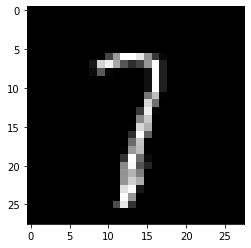

pred :  7 [5.4635532e-11 1.8126793e-05 1.9723989e-06 3.5401024e-07 7.9751868e-13
 1.8829675e-07 1.5921809e-12 9.9481630e-01 3.2447753e-07 1.3255225e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


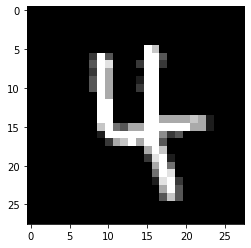

pred :  4 [7.48811955e-14 1.36703177e-10 3.92042754e-09 1.55286695e-09
 9.99999404e-01 9.57186863e-09 2.04361736e-08 6.90162778e-05
 1.61630986e-09 1.21229905e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


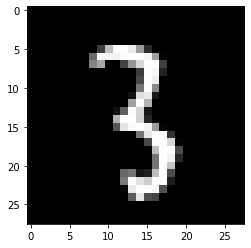

pred :  3 [6.8250072e-11 5.5574223e-10 2.0166750e-08 1.0000000e+00 6.8769591e-12
 3.2660402e-08 1.0564172e-13 3.2093758e-06 5.1944065e-05 2.7171083e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


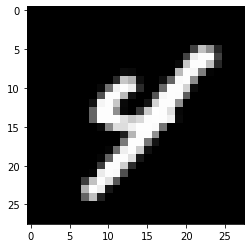

pred :  4 [9.6119744e-12 5.7953150e-07 6.7634820e-10 1.3857715e-09 9.9998790e-01
 3.5849368e-06 7.4735482e-11 1.5253578e-09 6.1348823e-07 2.5082400e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


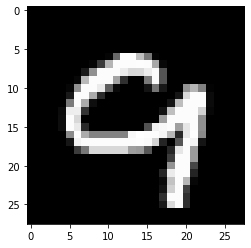

pred :  9 [9.2463966e-07 3.2861667e-12 4.7955837e-06 2.6898705e-10 5.2718158e-05
 5.9094230e-08 1.3591549e-07 1.2496100e-06 1.2090627e-05 9.9999964e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


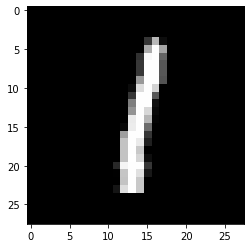

pred :  1 [3.0406557e-09 9.9999905e-01 1.2621275e-07 5.8819483e-09 3.7238998e-08
 6.4682064e-07 1.2552734e-07 5.7097566e-07 1.5641741e-06 1.9170436e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


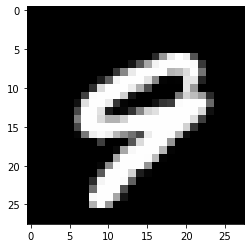

pred :  9 [9.1896060e-11 1.1644167e-18 4.1056114e-09 1.9178265e-06 2.8883983e-06
 5.5611092e-11 3.2727499e-08 1.2567341e-06 1.3254032e-05 9.9999893e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


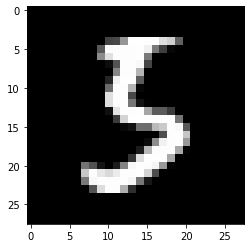

pred :  5 [8.9795719e-11 2.8909612e-06 3.3536794e-06 4.1297078e-03 1.6341098e-06
 9.9786955e-01 1.3556745e-10 6.7089793e-14 2.7124208e-10 8.2568780e-10]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


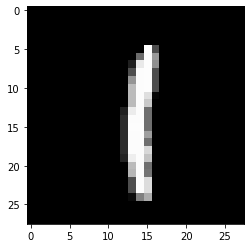

pred :  1 [1.6692033e-11 9.9999905e-01 3.9040877e-08 9.1522787e-07 9.1123592e-10
 2.9087935e-06 1.3862177e-06 1.5436417e-05 2.1350954e-06 1.1078245e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


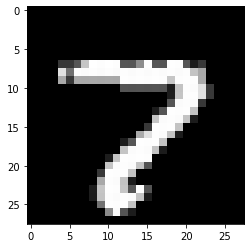

pred :  7 [9.1643750e-09 2.4461890e-15 3.3871267e-08 7.4915464e-05 1.4960023e-14
 8.5997862e-11 2.4039095e-11 9.9999839e-01 5.6179442e-07 2.5846940e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


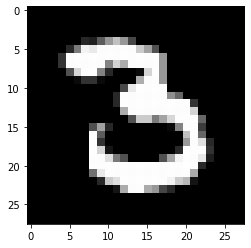

pred :  3 [6.1106330e-05 8.3388848e-08 1.5501593e-05 9.9999958e-01 9.6180720e-14
 1.6304961e-07 1.1917176e-12 1.3099086e-10 1.5508668e-08 1.6570818e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


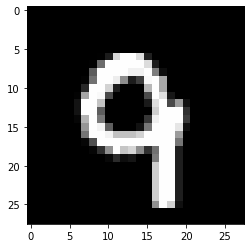

pred :  9 [1.7098136e-08 3.8148569e-12 4.2601968e-07 1.7732784e-08 6.4539945e-06
 1.8176439e-09 1.7514702e-07 5.9958179e-06 7.6414528e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


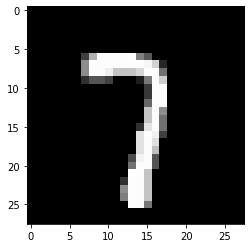

pred :  7 [2.3580635e-09 1.7391692e-08 2.0090938e-03 2.8492668e-08 1.7465046e-13
 6.7875157e-11 1.7083172e-12 9.9996865e-01 1.7431816e-11 3.9447997e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


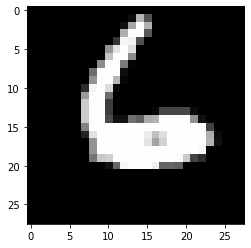

pred :  6 [5.3430632e-10 4.6771212e-11 4.9852701e-05 6.6840443e-11 1.1213029e-06
 4.9815700e-08 9.9999940e-01 3.5256516e-11 2.0904478e-09 6.5752338e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


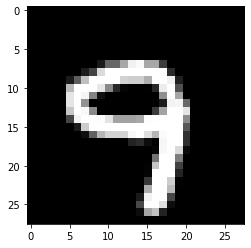

pred :  9 [3.3337139e-10 5.3656960e-17 9.2390839e-10 4.2283887e-06 2.8640807e-05
 1.7522739e-09 1.6103539e-11 2.4357596e-06 2.3267905e-06 9.9999380e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


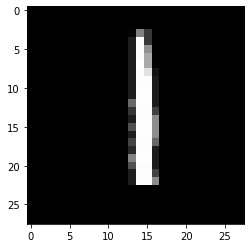

pred :  1 [8.1015658e-13 9.9999863e-01 3.6451645e-08 2.0191537e-08 1.0971763e-06
 2.2641482e-06 2.0494433e-06 1.8473651e-05 4.2050544e-07 2.2183796e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


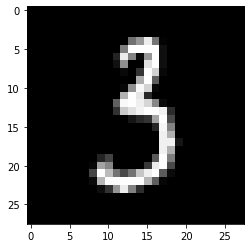

pred :  3 [4.1523358e-09 1.0198783e-05 1.5456972e-10 9.9976373e-01 7.7756717e-09
 7.3140560e-05 4.6236877e-08 1.6505662e-10 2.5362468e-07 1.8197618e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


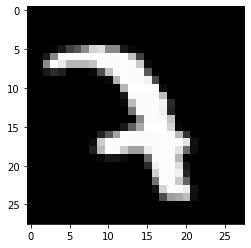

pred :  3 [2.0719901e-12 4.7898889e-03 1.2758374e-04 5.6260455e-01 3.8087176e-06
 2.3997340e-09 5.2599685e-09 4.5665205e-02 2.7138064e-11 1.5316364e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


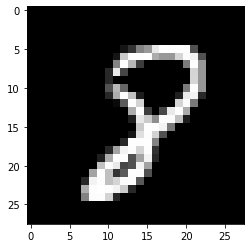

pred :  8 [3.3053065e-09 2.5159297e-10 8.7767839e-04 2.8048084e-05 4.9655308e-11
 1.2996387e-07 2.0710214e-09 3.8421824e-08 9.9998951e-01 4.9480796e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


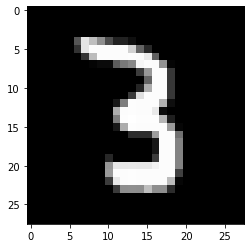

pred :  3 [4.45833752e-11 5.98592464e-09 4.57162469e-06 1.00000000e+00
 1.42319663e-11 3.74830972e-10 3.10479317e-13 9.30462318e-10
 1.08787575e-07 1.94863912e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


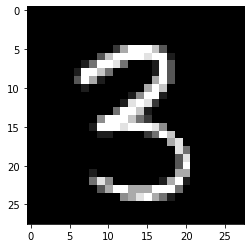

pred :  3 [2.53204610e-11 8.12778178e-10 7.21845197e-08 9.99996305e-01
 4.94637276e-10 1.92444503e-07 1.03900635e-16 8.14302314e-09
 2.29552711e-07 1.57146012e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


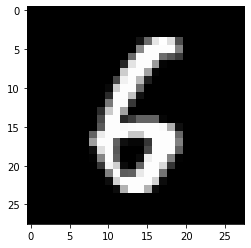

pred :  6 [4.3983317e-07 9.9019248e-10 9.5053856e-06 3.9785397e-11 1.6713498e-08
 9.0111792e-03 9.9996740e-01 1.0997747e-13 2.9760543e-09 4.7337551e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


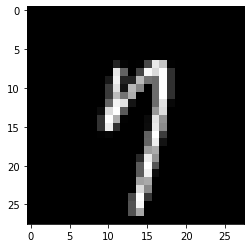

pred :  7 [2.9628577e-09 1.1957491e-06 4.7814079e-12 5.0570703e-10 8.7288361e-05
 2.5376005e-06 2.1802252e-12 9.9832124e-01 1.7149314e-12 6.8831444e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


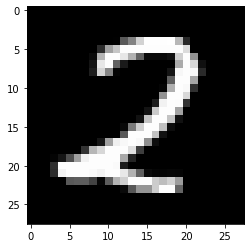

pred :  2 [3.5059988e-06 1.4687127e-07 9.9999923e-01 1.5736281e-05 1.2010100e-11
 1.4379789e-07 1.7018843e-12 7.1416817e-11 1.0081678e-08 1.0151422e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


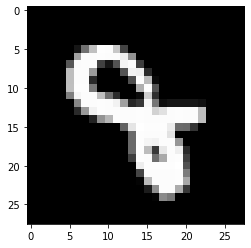

pred :  4 [5.6589007e-17 7.9768114e-10 6.5603172e-07 2.3181293e-07 4.6314397e-01
 9.1203406e-10 1.3147113e-05 5.6759627e-06 9.2572570e-03 9.6328847e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


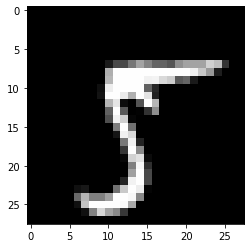

pred :  5 [4.2790918e-12 3.4603591e-09 3.1947434e-15 8.8080254e-05 1.8863757e-18
 9.9997449e-01 4.8388790e-15 2.1375087e-07 3.6862953e-09 1.0432601e-03]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


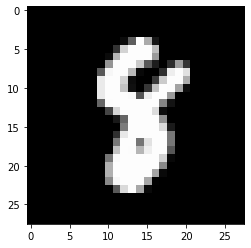

pred :  8 [1.01819012e-07 2.97839979e-05 2.07800031e-06 3.04436276e-06
 1.38747746e-05 1.34669378e-07 1.33060896e-08 3.06952461e-06
 9.99998927e-01 1.37092975e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


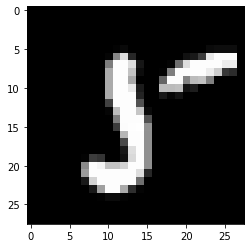

pred :  5 [2.08362270e-15 2.83050228e-09 4.77753215e-09 8.03046305e-08
 9.09245955e-07 9.99997079e-01 1.67540244e-13 1.07063684e-13
 8.23463552e-07 4.12377164e-13]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


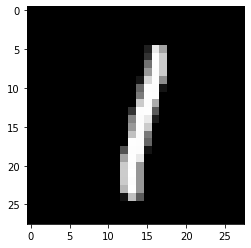

pred :  1 [7.2762113e-10 9.9999821e-01 1.4747621e-07 5.7003785e-10 1.4967240e-05
 9.6645761e-07 9.0105656e-09 3.0162311e-05 7.5672972e-08 7.7229900e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


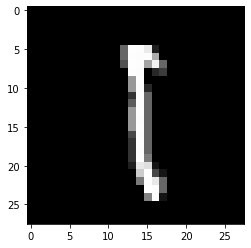

pred :  1 [1.6891216e-14 9.9651003e-01 6.6553675e-08 1.0128205e-06 9.7758769e-13
 3.3753361e-07 6.6192619e-08 9.8370424e-07 2.8648973e-03 3.1384708e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


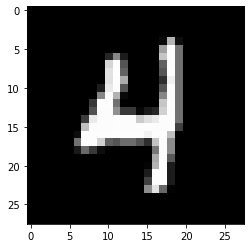

pred :  4 [9.2204534e-15 4.0345575e-13 2.8591505e-06 7.9048917e-08 1.0000000e+00
 4.5199303e-07 7.3394640e-10 4.4691038e-09 9.0853686e-11 2.5198574e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


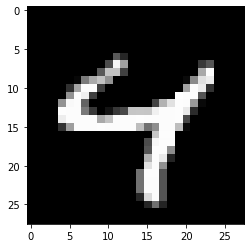

pred :  4 [1.8922101e-14 3.1291382e-17 1.5570020e-08 3.8473303e-08 9.9998271e-01
 1.4951930e-09 1.9687774e-10 5.2168965e-04 1.7294835e-06 1.2852252e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


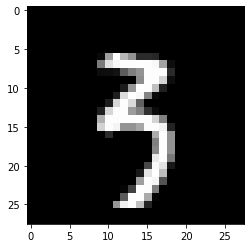

pred :  3 [7.6905229e-09 5.2549272e-08 4.4842784e-12 9.9594200e-01 6.9206720e-08
 1.6164094e-02 2.3306566e-14 1.2402900e-06 1.5448226e-09 3.8972339e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


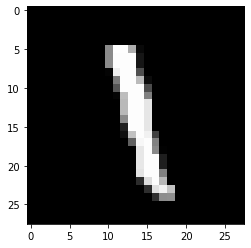

pred :  1 [2.10260894e-16 9.99996245e-01 6.65591642e-07 7.42492148e-07
 1.05788274e-06 1.11683603e-05 4.72890893e-10 1.01559445e-08
 3.10182986e-06 1.35995424e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


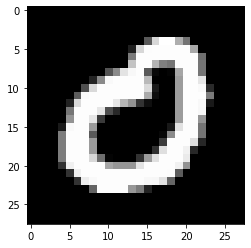

pred :  0 [9.9999976e-01 3.8939197e-07 2.3252799e-06 4.4062034e-07 2.4907940e-15
 1.4275147e-06 8.5620414e-08 1.9551645e-09 2.1031386e-12 6.0551048e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


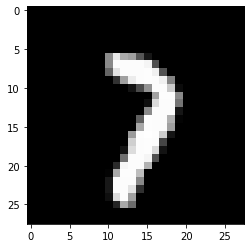

pred :  7 [1.0588325e-08 2.7003266e-06 3.1943282e-06 1.4481837e-07 2.3380925e-10
 4.2410082e-12 4.8555534e-13 9.9948037e-01 3.1518618e-07 6.1575134e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


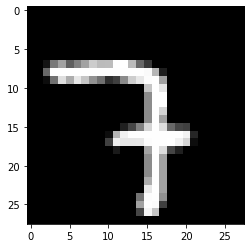

pred :  7 [5.8120318e-14 1.3472146e-10 2.4464919e-06 1.0724918e-07 1.2816236e-10
 2.7655254e-12 2.1977094e-13 9.9999833e-01 1.5218530e-13 2.9290336e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


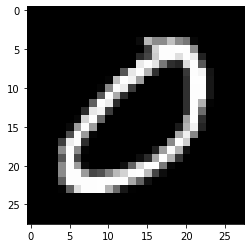

pred :  0 [1.0000000e+00 1.7619226e-07 7.8437013e-05 1.4240405e-08 3.9952864e-14
 1.3120834e-05 8.1897944e-10 2.2600501e-09 3.5674744e-12 8.2959006e-10]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


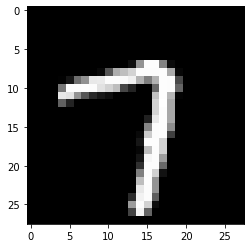

pred :  7 [9.7933466e-09 2.9509422e-08 2.9148528e-06 2.4146789e-07 3.2870614e-13
 2.2119437e-10 1.1203167e-11 9.9999702e-01 5.5490887e-13 1.0046972e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


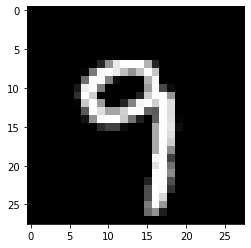

pred :  9 [8.2746573e-11 1.2269868e-11 1.2322057e-10 1.9908034e-10 4.7022595e-06
 3.7359354e-07 2.6571281e-14 3.4516088e-05 1.2986474e-09 9.9999976e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


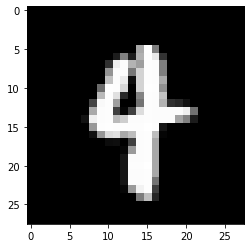

pred :  4 [6.10699685e-11 1.62540985e-07 2.96502431e-08 1.41720955e-08
 9.63855386e-01 6.45121234e-10 2.73530115e-10 6.69565797e-03
 4.36708469e-05 1.57406926e-02]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


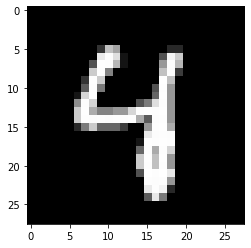

pred :  4 [1.3871556e-15 1.5727135e-08 2.8334174e-14 4.2831624e-10 9.9999762e-01
 6.8456922e-07 3.1581154e-10 5.0568638e-06 5.2990468e-10 8.5379761e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


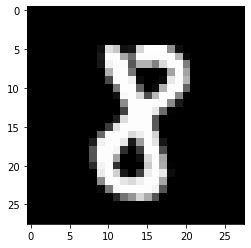

pred :  8 [2.2856312e-09 6.3861827e-09 3.5548210e-04 9.0055707e-08 5.7419076e-11
 9.6763904e-07 2.0388742e-09 3.3499825e-07 9.9999809e-01 3.8326871e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


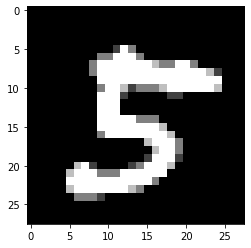

pred :  5 [1.27832342e-13 3.33903405e-10 4.64699283e-08 4.67163682e-06
 2.42612419e-12 9.99993145e-01 3.62738584e-17 2.12887983e-08
 1.00759735e-07 2.42909607e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


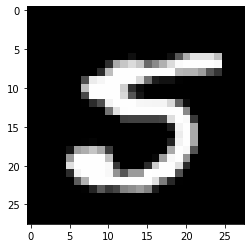

pred :  5 [1.7864136e-07 4.0596010e-06 6.1168154e-10 4.2783640e-07 8.3087537e-15
 9.9997932e-01 1.0325473e-10 2.1329247e-11 8.0451619e-09 9.8690930e-11]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


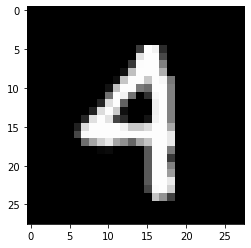

pred :  4 [1.0670759e-08 6.9461954e-08 1.3461113e-03 3.0696768e-08 9.9993229e-01
 1.8478752e-06 3.7775947e-09 1.3991046e-06 8.9451313e-10 2.4690224e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


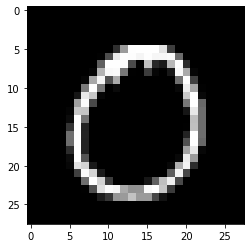

pred :  0 [9.9998927e-01 4.6983482e-07 3.7543685e-07 1.0162790e-07 4.0859304e-14
 7.6457902e-05 1.9892575e-11 2.6335070e-07 4.7702948e-12 3.8996688e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


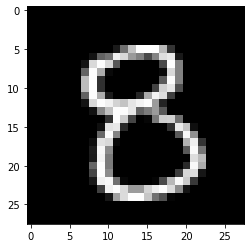

pred :  8 [4.7663299e-08 4.6602266e-12 6.9118039e-07 2.0683963e-05 2.4240107e-08
 1.8370312e-05 3.7103175e-07 4.5647019e-10 9.9981844e-01 1.8671155e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


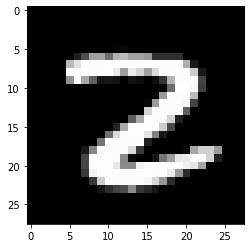

pred :  2 [1.0686454e-06 1.9081564e-07 9.9999821e-01 3.9431453e-04 4.4862393e-15
 5.0585947e-10 2.6540250e-09 3.3761216e-07 1.7348364e-07 4.7312203e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


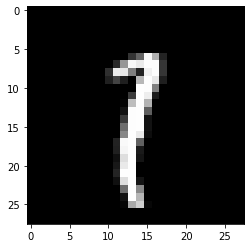

pred :  1 [2.0693867e-09 9.9213451e-01 5.0659161e-09 6.9964834e-08 7.0889366e-13
 8.6989769e-07 4.9193322e-10 2.5387108e-03 2.4964451e-05 7.4885958e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


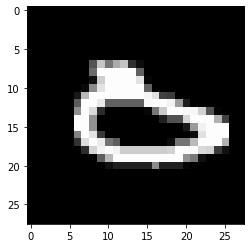

pred :  0 [9.8526573e-01 1.1301975e-08 9.4887473e-06 1.3802044e-07 2.2688396e-09
 1.4673897e-07 1.3721049e-02 1.2118217e-05 1.7546792e-12 2.9211781e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


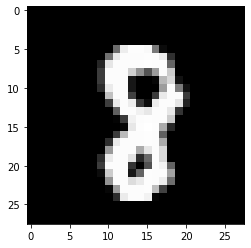

pred :  8 [5.7738060e-07 1.5560809e-07 1.9294024e-04 1.1478621e-06 1.2181683e-10
 5.3411298e-09 4.7409973e-08 3.4247057e-07 9.9999702e-01 5.5633036e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


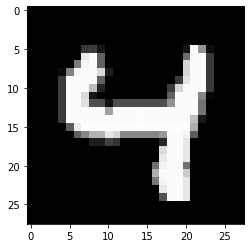

pred :  4 [5.2451253e-15 1.4713896e-12 3.1813450e-09 4.8917701e-09 9.9999976e-01
 5.3114679e-08 1.2675568e-11 2.7563982e-09 1.4313161e-03 6.7419091e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


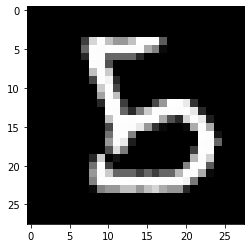

pred :  8 [8.0947551e-09 4.1645881e-10 2.2326115e-06 4.1757019e-07 6.7591685e-08
 4.6113551e-01 1.9560066e-06 6.7022281e-21 9.3416321e-01 1.7908502e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


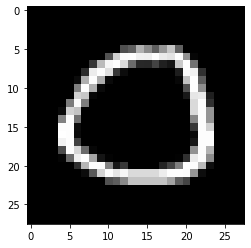

pred :  0 [9.9999720e-01 7.1436239e-07 1.4431514e-07 1.3605309e-07 9.6890066e-16
 5.1272673e-06 5.7167437e-10 3.6219508e-10 1.0427343e-13 9.0762846e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


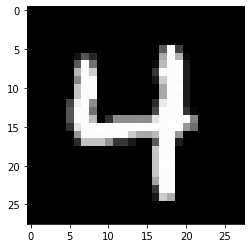

pred :  4 [5.1043167e-12 4.0556978e-13 3.1152947e-08 2.1324023e-09 1.0000000e+00
 6.3198886e-09 1.3975680e-12 2.8771223e-09 7.4847715e-12 2.0987540e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


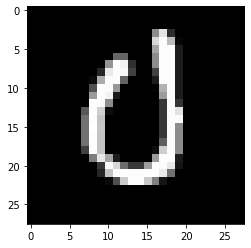

pred :  0 [9.9993527e-01 3.5703864e-09 3.0867266e-08 1.3355294e-11 6.0977754e-08
 3.1788204e-06 5.7587904e-06 9.8689338e-07 8.1322397e-12 3.1337541e-10]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


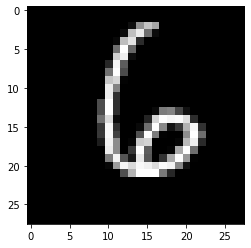

pred :  6 [1.3536455e-11 3.6637893e-08 1.0562330e-07 2.0666590e-11 4.4386195e-07
 1.5903236e-08 1.0000000e+00 2.2678335e-11 2.4572452e-10 5.9058735e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


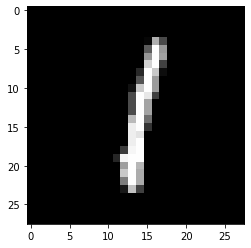

pred :  1 [6.5716033e-10 9.9999899e-01 1.9964789e-08 3.8428418e-08 8.6795362e-09
 4.4138096e-06 9.4031861e-08 1.6000760e-07 3.6453455e-06 5.7057303e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


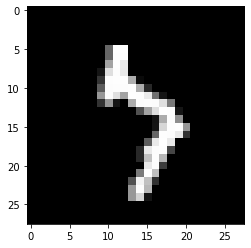

pred :  7 [1.62025124e-13 2.61991087e-08 3.03605430e-09 1.12040234e-05
 1.49717653e-05 3.94925119e-05 2.14888085e-09 6.48988366e-01
 1.05639254e-10 1.03441298e-01]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


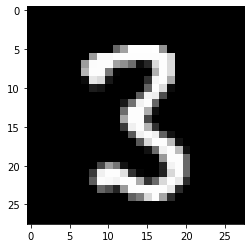

pred :  3 [5.8927813e-10 1.4263593e-08 5.6502364e-07 9.9998355e-01 5.1891200e-12
 7.8807254e-09 1.3832982e-15 2.2373015e-09 8.1911109e-09 3.5342327e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


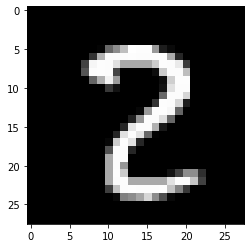

pred :  2 [1.9466518e-06 5.4875138e-10 9.9999899e-01 8.3485929e-06 5.2782032e-15
 6.5643095e-11 8.4255492e-13 4.8169250e-06 2.5643745e-05 1.3202793e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


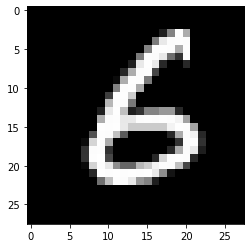

pred :  6 [1.6090590e-10 4.9432487e-07 2.0716093e-06 5.8554689e-11 4.2042841e-11
 2.2268295e-04 9.9997866e-01 1.0369994e-15 4.0153121e-09 2.1108095e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


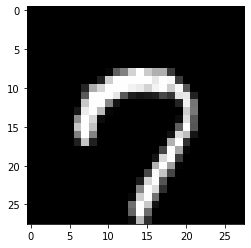

pred :  7 [6.9654699e-05 3.1165973e-11 9.5088257e-11 1.7950027e-06 3.2862105e-12
 3.2661508e-05 4.3916755e-09 9.9999654e-01 1.0897384e-11 1.3177748e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


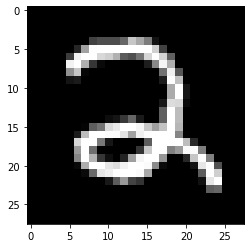

pred :  2 [1.3695711e-10 7.3856969e-13 1.0000000e+00 3.3443431e-10 1.8474476e-09
 3.8408562e-06 1.6382698e-08 4.5877668e-12 6.6102693e-11 4.3908228e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


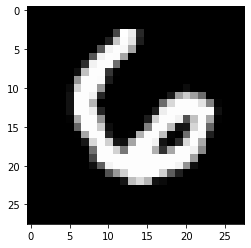

pred :  6 [1.3906588e-06 1.0418453e-10 1.4625634e-06 2.0242783e-12 3.7853360e-06
 1.8238584e-11 1.0000000e+00 2.6218940e-09 3.4816537e-07 4.0075183e-04]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


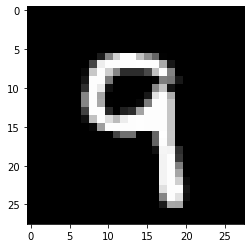

pred :  9 [1.1073085e-12 1.0592005e-11 1.9516211e-09 1.7765623e-06 4.9851559e-07
 5.5736029e-09 3.4266669e-12 6.6858490e-07 8.1443051e-07 9.9999940e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


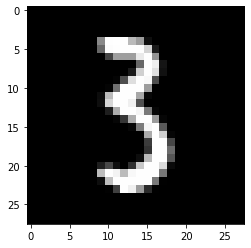

pred :  3 [2.7568046e-08 6.4808130e-04 5.9975733e-08 9.9999440e-01 4.4234888e-08
 8.1879443e-06 1.5750722e-09 7.0621075e-13 2.8076624e-08 1.8794251e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


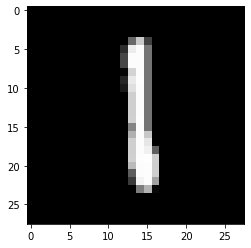

pred :  1 [6.0145123e-13 9.9999982e-01 4.4369983e-07 5.1291941e-08 3.5965486e-10
 3.3148499e-05 2.8340867e-07 5.8262458e-06 7.2259390e-06 2.7483451e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


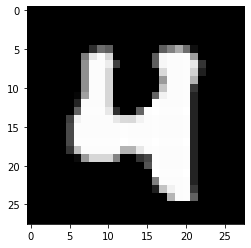

pred :  4 [1.0992767e-11 3.5877152e-11 4.7042195e-06 2.8708691e-08 9.9999785e-01
 1.3636654e-07 5.6511254e-07 5.3617250e-10 6.2633859e-07 7.3294381e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


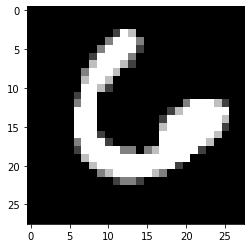

pred :  6 [1.6072392e-04 4.5646364e-12 1.5130590e-07 3.2173370e-12 1.5142779e-10
 1.6737130e-07 9.9998325e-01 1.2984889e-07 6.4386024e-13 1.0278468e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


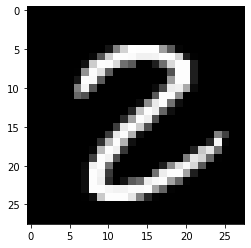

pred :  2 [1.0765103e-06 8.6239950e-08 9.9988246e-01 7.0879814e-06 1.4317238e-15
 1.1067194e-08 3.9308517e-12 3.8761186e-10 4.1499450e-05 1.1060250e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


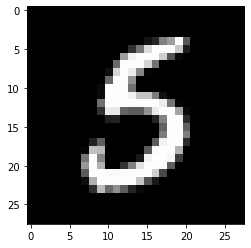

pred :  5 [3.4702801e-09 3.6092777e-05 1.9772344e-09 2.5450834e-07 1.8033698e-11
 1.0000000e+00 1.5551886e-06 6.4903360e-10 1.6492760e-10 3.4492984e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


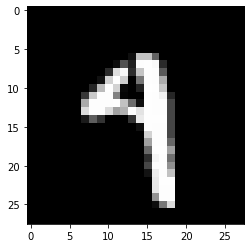

pred :  4 [5.1965956e-13 1.0697297e-07 2.2632380e-09 2.5437727e-09 9.8549795e-01
 4.1283702e-08 3.7736296e-15 5.1358342e-04 7.6071552e-07 1.0923037e-01]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


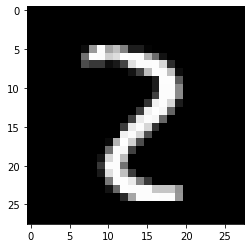

pred :  2 [3.3014460e-06 5.3900867e-10 9.9999881e-01 3.7140862e-06 5.3420843e-14
 6.6207678e-11 2.4775014e-13 7.3433961e-07 7.8471130e-05 4.7902788e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


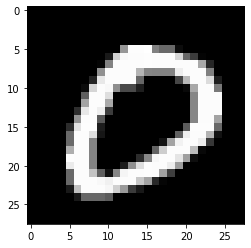

pred :  0 [1.00000000e+00 2.43377176e-08 1.01055363e-07 1.06374785e-07
 9.01942041e-13 5.76902011e-08 2.33498731e-09 3.44794046e-07
 1.69047935e-13 1.10122791e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


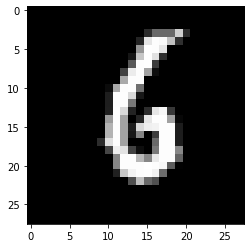

pred :  6 [3.5188161e-09 6.7572512e-07 1.7103071e-07 1.2463568e-07 1.7815537e-08
 3.4201444e-06 1.0000000e+00 9.5404492e-12 2.4585426e-11 1.0209855e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


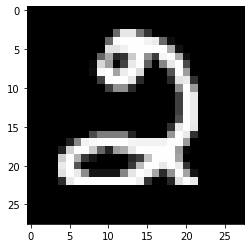

pred :  2 [7.1952215e-08 1.2070718e-07 9.9999702e-01 1.2417890e-05 7.4341524e-15
 1.8050966e-06 2.8710430e-09 2.1204476e-11 9.8962403e-14 1.1522530e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


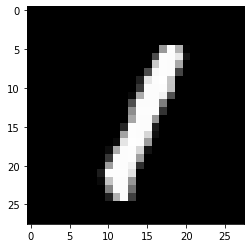

pred :  1 [1.2025322e-07 9.9999756e-01 1.2676313e-06 2.9889904e-09 2.1851224e-07
 4.7946141e-08 1.8586244e-08 4.9565679e-06 2.4731876e-06 1.6128116e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


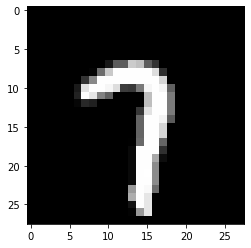

pred :  7 [1.08953735e-10 1.25111555e-07 1.51137090e-06 6.62938291e-08
 5.06941988e-11 4.66019747e-13 3.74221270e-12 9.99998212e-01
 2.32289923e-10 7.91737475e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


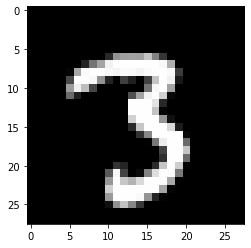

pred :  3 [1.3354842e-10 6.1313372e-09 5.9266450e-09 9.9999952e-01 9.9054608e-13
 4.8241610e-08 1.8668347e-16 5.8464025e-09 4.2513975e-09 6.1800807e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


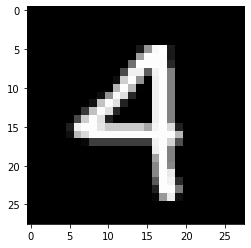

pred :  4 [1.7902355e-09 9.9750186e-10 1.1954308e-03 1.3083449e-07 9.9998719e-01
 8.5511886e-08 7.7580392e-10 6.7842514e-08 2.1340205e-10 2.4732915e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


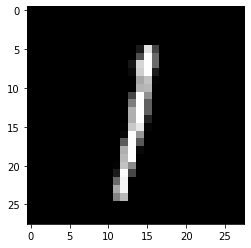

pred :  1 [1.4577230e-10 9.9999690e-01 7.1280124e-09 5.9703718e-09 3.0084770e-09
 4.3768600e-06 4.3412996e-08 8.3290894e-07 4.6373420e-06 2.4385578e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


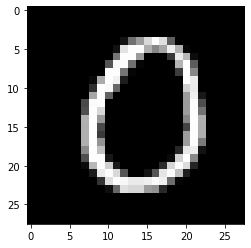

pred :  0 [9.9999976e-01 1.0755231e-06 8.4606121e-08 3.5507968e-11 6.2988406e-13
 3.4614419e-07 1.1590122e-05 6.1660599e-10 3.2505062e-14 9.9059907e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


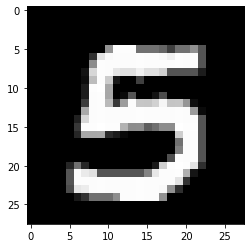

pred :  5 [5.0054016e-11 6.4555078e-10 1.0966903e-11 8.0915171e-08 2.4161862e-12
 9.9999875e-01 3.1718687e-13 4.1333866e-13 2.7691746e-07 1.8819426e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


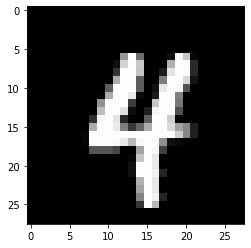

pred :  4 [2.3275525e-13 3.6220682e-10 4.3893200e-10 1.0174194e-07 1.0000000e+00
 1.1683341e-07 2.6126126e-10 9.0345740e-04 6.7172188e-12 1.6793714e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


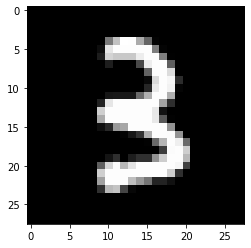

pred :  3 [4.6296083e-12 4.7665665e-08 2.1432876e-05 9.9999863e-01 2.3921798e-09
 4.3123964e-07 1.1379982e-11 9.9306156e-14 4.2655790e-09 4.2630415e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


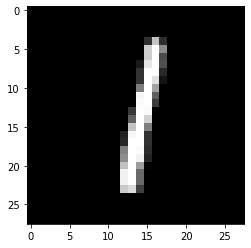

pred :  1 [1.6721940e-09 9.9999952e-01 2.1329942e-07 5.7876433e-09 5.2491671e-08
 1.5096048e-06 3.0384019e-08 8.1238181e-07 1.1464169e-06 1.3413072e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


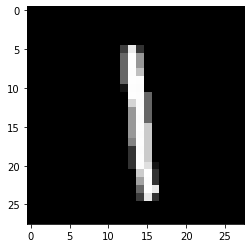

pred :  1 [1.7416493e-15 9.9999899e-01 1.3528552e-06 3.3499202e-08 1.8895414e-10
 7.5941766e-06 3.5587436e-07 1.0481458e-04 1.2080346e-05 1.5838992e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


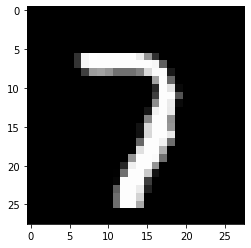

pred :  7 [1.75631829e-10 6.70897279e-12 1.16121610e-05 3.35236798e-08
 2.52441124e-12 6.77589998e-11 1.16798645e-11 9.99999642e-01
 6.72878550e-12 8.67903971e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


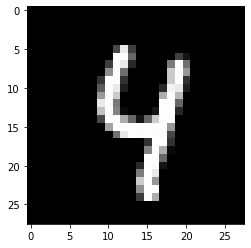

pred :  4 [2.84212323e-16 4.63436844e-09 2.02956138e-10 9.50727497e-09
 1.00000000e+00 3.02510642e-07 3.20065047e-13 2.41588941e-06
 1.17154634e-07 3.81038876e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


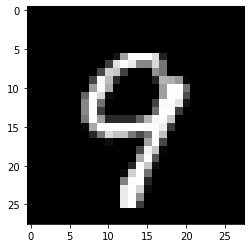

pred :  9 [6.1471744e-11 9.9922222e-16 4.9643711e-07 6.3020980e-07 2.0364716e-06
 6.7707873e-10 4.3391177e-14 1.5174518e-07 3.8075970e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


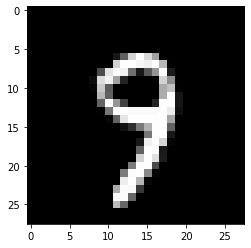

pred :  9 [1.6742947e-12 1.6007588e-12 3.9527510e-09 1.5415740e-06 2.0680265e-08
 1.4102010e-07 6.6858867e-13 1.2508035e-04 1.4606698e-07 9.9958038e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


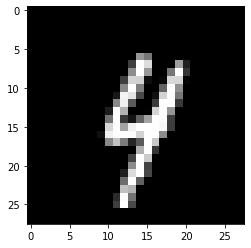

pred :  9 [1.9349806e-11 1.5389952e-07 7.2349576e-10 4.8844324e-09 8.2019073e-01
 1.9925530e-08 6.0338657e-08 5.4442444e-06 1.0152419e-08 9.7808361e-01]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


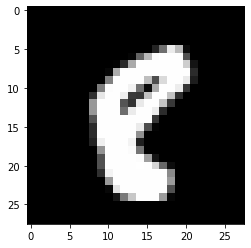

pred :  8 [3.9073377e-05 1.2107438e-07 1.3619661e-04 1.0898758e-05 1.1976428e-11
 5.5597576e-07 4.0510118e-02 6.1791017e-11 9.9400878e-01 8.9227242e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


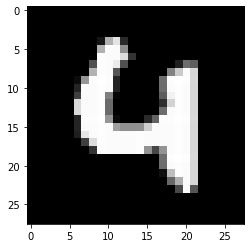

pred :  4 [8.70038264e-10 4.78791946e-14 1.25828890e-07 5.46147988e-11
 1.00000000e+00 1.25410615e-08 1.56091797e-08 2.19772223e-09
 6.24243679e-09 8.03683815e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


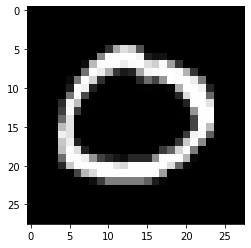

pred :  0 [9.9995738e-01 8.1509484e-09 4.3497272e-05 4.6906680e-06 1.0513190e-14
 2.1460558e-08 5.4116860e-11 8.8751221e-08 1.6038745e-14 2.9687085e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


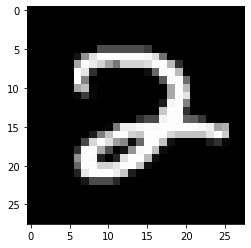

pred :  2 [1.2374773e-09 2.2214087e-15 1.0000000e+00 4.8729127e-09 5.2622132e-14
 2.8380271e-09 1.2797989e-06 5.3002246e-08 2.9035840e-09 2.8341677e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


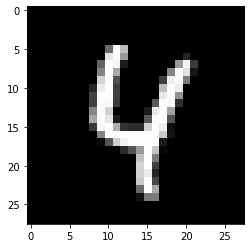

pred :  4 [5.8166871e-15 8.9628802e-09 3.7283896e-09 9.9779685e-10 1.0000000e+00
 7.2072254e-08 6.4030597e-10 5.9539741e-07 2.9892127e-09 5.0914821e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


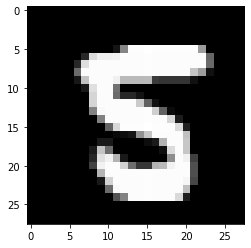

pred :  5 [5.6484717e-10 3.5883330e-10 5.8200227e-09 2.5556440e-07 2.1041768e-13
 9.9999893e-01 3.6198239e-10 2.7993363e-12 2.7330145e-08 2.7514125e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


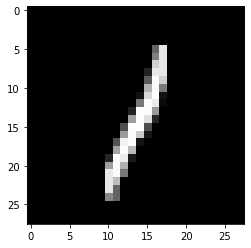

pred :  1 [3.4188036e-10 9.9998868e-01 4.7189958e-05 1.6713951e-11 6.3944717e-05
 1.9060312e-06 8.4202965e-09 5.9067270e-07 1.1158884e-09 2.3460788e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


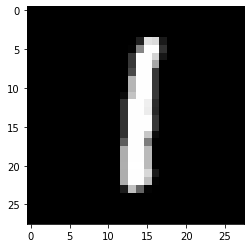

pred :  1 [3.6559655e-11 9.9999619e-01 3.9676713e-08 1.3630081e-08 9.1906847e-09
 3.8514236e-06 1.6760986e-06 1.6059012e-06 9.6063586e-06 3.8246345e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


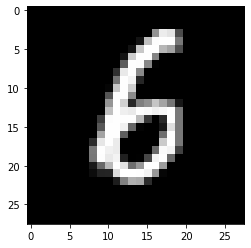

pred :  6 [6.8197670e-10 1.7800193e-07 5.2595851e-06 2.1871309e-12 3.9174952e-10
 8.6279892e-05 9.9999911e-01 2.6801656e-14 1.1098438e-08 6.7383343e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


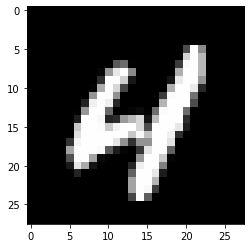

pred :  4 [2.0843842e-09 2.3363346e-15 4.7523441e-05 4.2104092e-10 9.9999917e-01
 7.8117353e-09 6.5581336e-09 4.5208872e-09 5.7886922e-09 6.9538544e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


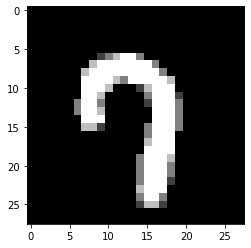

pred :  7 [4.5733061e-05 3.4008016e-10 7.0599939e-09 1.2042672e-11 6.7258410e-10
 1.3441839e-09 1.2831376e-10 9.9999928e-01 2.6604538e-11 3.1843483e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


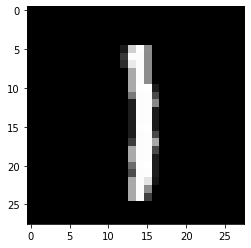

pred :  1 [1.9207932e-12 9.9999428e-01 5.2970208e-08 7.5072437e-09 2.1159852e-09
 1.8134695e-05 1.6702035e-07 4.4569373e-04 2.5128177e-06 1.5652590e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


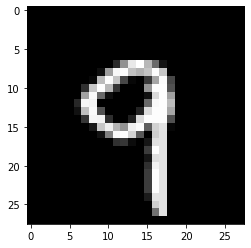

pred :  9 [1.1546829e-11 8.8714661e-12 3.8133746e-11 5.6231812e-07 3.8295269e-07
 1.4064790e-11 9.7662232e-13 9.1571806e-08 9.9800147e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


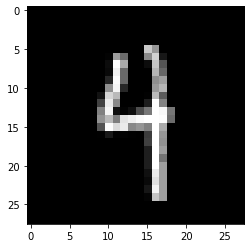

pred :  4 [4.2890847e-16 7.2681283e-09 4.9638595e-09 1.4731526e-07 9.9952787e-01
 3.0558874e-06 4.2021032e-11 2.6993186e-07 2.3700791e-10 4.0283501e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


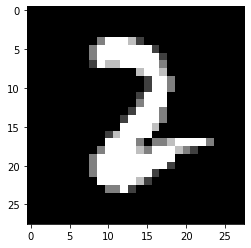

pred :  2 [8.1385361e-09 1.6460760e-07 9.9999380e-01 2.8287970e-05 2.3513120e-14
 1.3110740e-07 1.2408335e-09 3.9651670e-08 4.4163380e-07 2.0562256e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


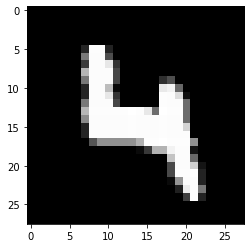

pred :  4 [1.2141008e-16 4.3821218e-12 8.5798894e-07 1.3657528e-09 1.0000000e+00
 2.7678545e-05 7.4804263e-10 4.7550269e-11 2.9883662e-11 4.4067542e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


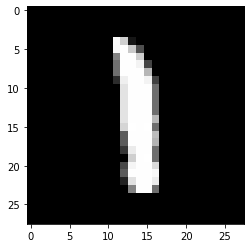

pred :  1 [7.4216637e-13 9.9999785e-01 1.1500377e-05 1.5647089e-07 1.1883353e-05
 1.2787375e-06 5.7595839e-09 2.2408410e-06 2.7020874e-07 7.3348046e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


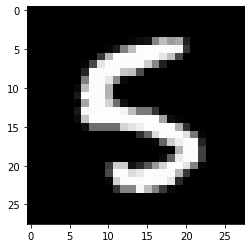

pred :  5 [3.3116010e-11 7.4739936e-10 1.2809429e-12 4.6241901e-08 4.8796155e-14
 1.0000000e+00 4.7333280e-11 2.4916722e-12 2.3858257e-07 2.0350379e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


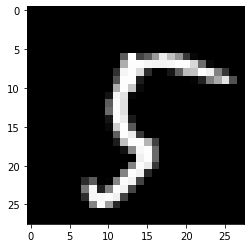

pred :  5 [9.07190902e-12 2.78801888e-08 3.10773347e-12 3.64268149e-09
 7.96482699e-15 1.00000000e+00 7.83301050e-13 1.07023626e-10
 1.30036319e-08 1.00580735e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


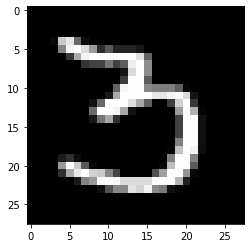

pred :  3 [2.8741141e-07 2.0423140e-06 1.0153605e-11 1.0000000e+00 7.0290324e-14
 1.4283978e-07 6.3687510e-13 3.2103188e-08 3.5003402e-13 5.0692435e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


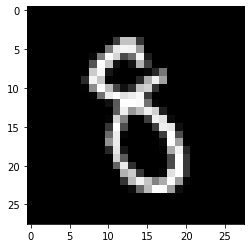

pred :  8 [8.9533287e-09 1.0244876e-08 5.7483266e-08 3.3018364e-06 1.1050868e-08
 6.0363323e-07 1.1604832e-05 1.4948358e-10 9.9996912e-01 1.1479032e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


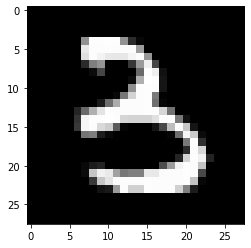

pred :  3 [2.0021311e-11 1.0662673e-06 2.1313288e-07 9.9999356e-01 9.5727037e-10
 3.6629160e-06 3.2154737e-11 3.0132072e-14 5.9587910e-07 1.0667884e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


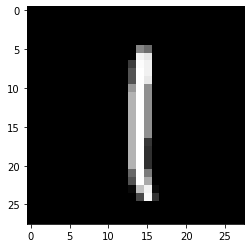

pred :  1 [1.8947753e-13 9.9999964e-01 5.2216635e-09 6.7277051e-07 1.4117126e-10
 2.7493940e-07 1.5023447e-06 4.3750069e-06 3.4225752e-06 2.0552496e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


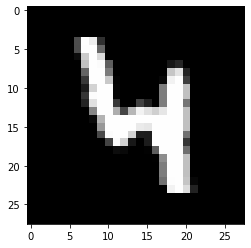

pred :  4 [1.08117899e-16 1.56689939e-11 2.27606045e-09 1.70495096e-05
 1.00000000e+00 1.08918624e-10 7.38625019e-08 1.33279010e-09
 2.48838585e-08 2.19282856e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


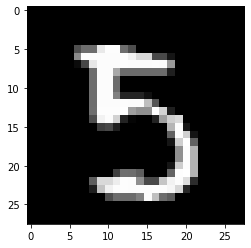

pred :  5 [1.4017616e-09 1.4284079e-10 3.0615547e-12 1.7401576e-04 1.1726372e-09
 9.9998832e-01 1.9703060e-14 2.4427915e-10 2.1252699e-11 1.6676170e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


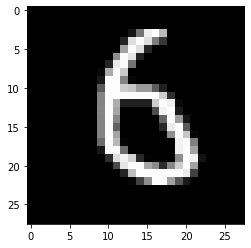

pred :  6 [3.6255507e-05 8.1930211e-06 3.9708320e-10 3.8203548e-06 3.0909242e-10
 8.9594923e-06 9.9594915e-01 1.4477700e-10 2.0888888e-06 2.1605405e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


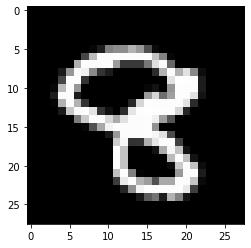

pred :  8 [2.7943127e-11 8.6010246e-13 9.8818168e-07 9.7017705e-02 2.2553199e-07
 5.2425904e-09 1.2034231e-04 5.1124822e-08 9.9969852e-01 1.6864240e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


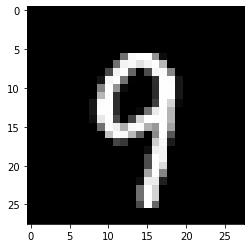

pred :  9 [4.63634209e-12 4.61440781e-13 7.00182967e-10 1.99906049e-06
 5.32565252e-07 1.30151205e-08 1.06163721e-12 2.01734838e-06
 2.52108066e-07 1.00000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


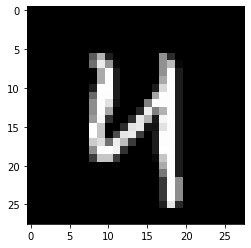

pred :  4 [9.2409437e-08 2.2020998e-08 1.6433358e-09 1.8051887e-07 9.9996626e-01
 4.0297590e-07 1.7396070e-08 2.3649596e-09 6.4380223e-10 9.4810457e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


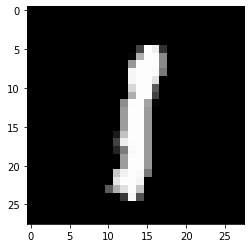

pred :  1 [1.2668022e-08 9.9996519e-01 2.7658409e-09 3.7822161e-07 3.6020082e-09
 2.3109610e-06 5.2330250e-07 4.9590690e-06 9.1402333e-05 3.7904002e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


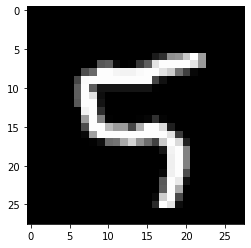

pred :  5 [1.3411082e-13 2.5265935e-12 1.2377926e-07 2.8314000e-08 3.0319038e-06
 9.9985087e-01 1.5179264e-11 2.2648728e-05 8.3226575e-07 9.5670548e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


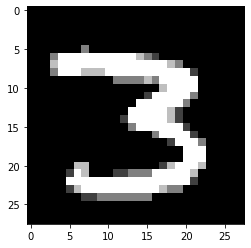

pred :  3 [5.9968381e-09 2.9282235e-08 5.9707851e-08 1.0000000e+00 2.3102612e-11
 1.7864373e-11 1.2991414e-15 1.8450717e-08 2.0207332e-12 1.9486883e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


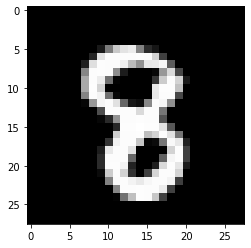

pred :  8 [3.7838976e-07 3.0284400e-11 7.7784052e-06 1.2121950e-05 1.6173800e-09
 1.5156643e-07 1.6177827e-07 3.6979392e-11 9.9999976e-01 3.8419848e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


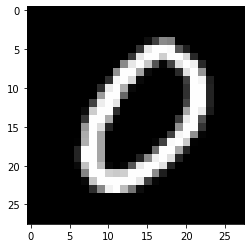

pred :  0 [9.99999762e-01 4.01220774e-07 2.52030554e-06 1.61783664e-09
 1.14451699e-12 1.02945314e-08 3.00676629e-06 1.29684785e-09
 7.98729693e-11 8.23057690e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


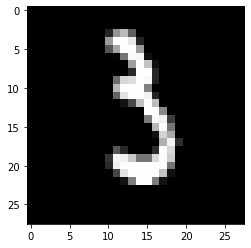

pred :  3 [1.0733134e-09 6.8188906e-02 4.7499584e-06 9.9996197e-01 9.0837087e-14
 1.9653371e-06 1.2961146e-07 1.4352156e-07 1.1751522e-08 1.4578636e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


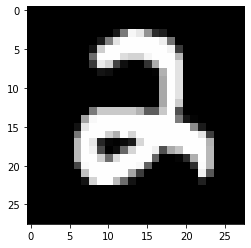

pred :  2 [6.41118980e-09 1.24769200e-13 1.00000000e+00 6.36903110e-07
 7.54653007e-11 5.97365224e-09 3.28891679e-06 4.46100168e-14
 1.02961465e-07 4.13386166e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


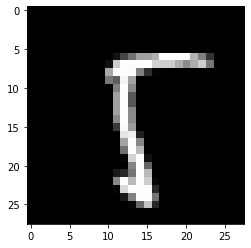

pred :  5 [1.0300438e-09 1.7484205e-06 4.7181179e-09 9.7914366e-10 7.2792087e-14
 9.9671841e-01 3.8073790e-07 2.9393967e-09 3.9526463e-02 6.1151386e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


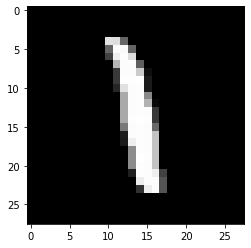

pred :  1 [1.57131282e-16 9.99998510e-01 1.30646595e-05 1.57558986e-06
 2.50211406e-06 1.93729818e-07 1.20779958e-07 1.60564539e-08
 2.25348276e-06 2.55338080e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


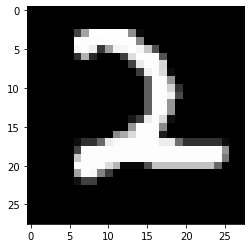

pred :  2 [3.1776123e-11 4.9337308e-05 9.9999332e-01 6.5524637e-07 2.2036908e-13
 6.0243610e-10 4.9612825e-10 6.3041200e-12 1.0274105e-13 6.6272776e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


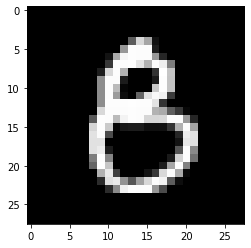

pred :  8 [1.4055627e-06 9.0430846e-10 1.8181129e-08 8.7876964e-05 3.7160896e-07
 2.0323837e-06 3.9701564e-07 4.6757744e-11 9.9974960e-01 3.2946229e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


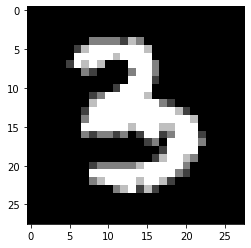

pred :  3 [4.4910513e-11 4.5684843e-09 2.3944534e-05 9.9999702e-01 1.0925773e-07
 5.5078099e-06 1.3769327e-08 9.6289765e-10 1.5246388e-06 1.8152335e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


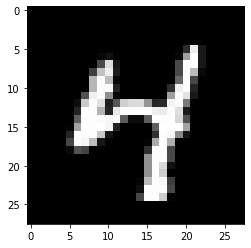

pred :  4 [1.2136870e-11 1.7331262e-15 4.0693982e-09 3.2717152e-11 1.0000000e+00
 1.8894380e-07 7.3223291e-08 1.5667081e-04 2.6721252e-11 5.2588302e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


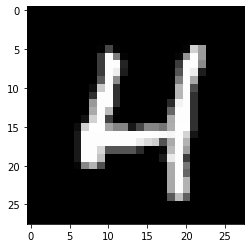

pred :  4 [3.97349913e-06 6.86765271e-12 1.71967058e-05 4.37767747e-12
 1.00000000e+00 2.36808337e-05 1.96805280e-10 1.36022527e-10
 5.01844610e-09 1.12349234e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


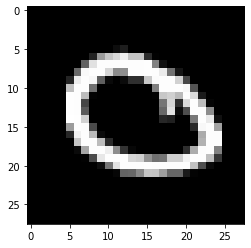

pred :  0 [9.9999982e-01 9.0174901e-10 2.8649464e-07 1.4764868e-06 2.5549163e-10
 1.4501944e-09 1.4488468e-07 2.3363329e-07 4.5294015e-11 2.7518965e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


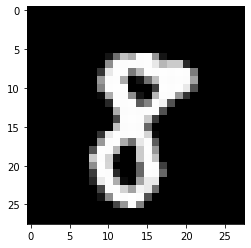

pred :  8 [1.6726853e-09 6.1145002e-08 6.1732862e-06 1.9048754e-08 2.5157668e-10
 6.9311182e-07 1.4841574e-09 3.9841957e-08 9.9999976e-01 8.3441080e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


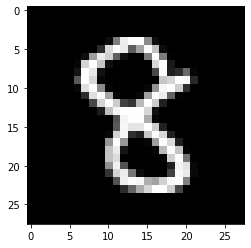

pred :  8 [1.3065032e-09 2.6600175e-11 1.9940734e-04 1.2582200e-06 3.2699063e-07
 5.9966355e-06 4.1509441e-08 5.4433213e-15 9.9999750e-01 2.1829906e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


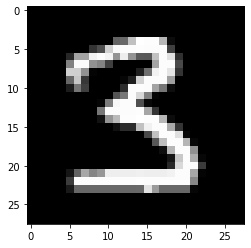

pred :  3 [5.1584820e-11 6.2317395e-06 2.8656074e-11 1.0000000e+00 1.8036959e-08
 3.2196272e-08 1.0472963e-14 5.4249738e-12 7.1782651e-08 7.4792417e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


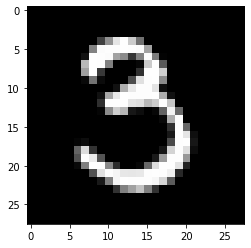

pred :  3 [2.4225398e-07 3.3394531e-07 4.5445150e-09 9.9999964e-01 9.1225888e-13
 6.5430470e-07 1.3056965e-12 1.3096949e-08 3.0052196e-09 6.6446559e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


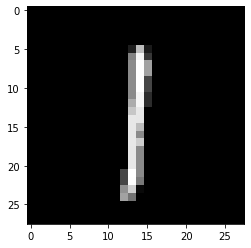

pred :  1 [3.4071934e-12 9.9995518e-01 4.0018991e-10 2.5427191e-06 2.8957167e-11
 6.8989134e-06 4.4762206e-08 9.2116306e-07 8.2078732e-06 8.3248686e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


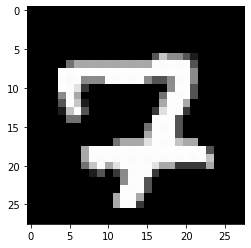

pred :  7 [3.4745206e-08 8.2739940e-11 1.0699478e-01 1.5717038e-05 3.5774979e-12
 1.2477724e-10 4.7557984e-07 8.5402668e-01 1.6559918e-06 5.1127142e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


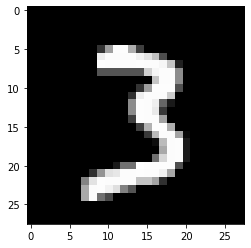

pred :  3 [6.1804606e-10 2.1152046e-07 1.0027626e-06 1.0000000e+00 1.0824377e-12
 1.4542080e-09 5.2307137e-17 2.1466431e-10 8.2235182e-12 5.3694059e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


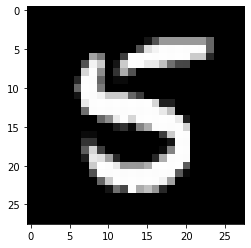

pred :  5 [5.5961451e-12 1.5753953e-07 1.9658459e-11 4.4244405e-07 1.7741645e-12
 9.9999201e-01 1.0374476e-09 5.8473526e-12 8.0608368e-07 7.9152423e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


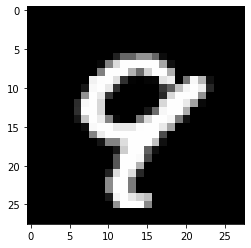

pred :  9 [8.0138760e-12 1.6600361e-16 3.5487084e-09 1.9387850e-08 1.2611783e-05
 1.0458082e-08 2.8079152e-11 4.5326775e-05 4.2243975e-01 9.8735988e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


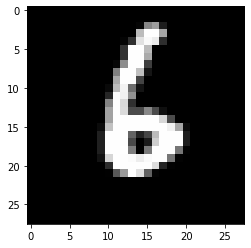

pred :  6 [1.2638463e-11 2.8116642e-09 1.3596464e-05 6.1231682e-09 2.5221929e-08
 2.0055243e-06 1.0000000e+00 1.0898263e-10 4.0400927e-10 5.2431681e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


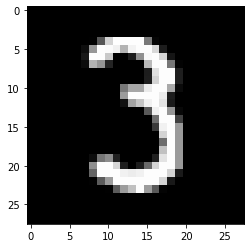

pred :  3 [3.1458740e-07 6.3014727e-09 6.1007688e-07 9.9999678e-01 5.8789702e-11
 8.7490164e-08 3.2641591e-12 1.2697527e-09 7.1520660e-08 8.5405329e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


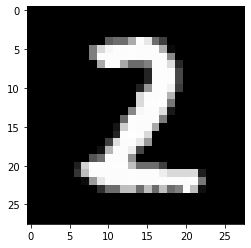

pred :  2 [8.3334436e-07 1.3545050e-06 1.0000000e+00 5.7448469e-06 6.1427764e-12
 1.9942552e-09 3.3019854e-13 1.0357314e-09 2.9644193e-08 2.8316578e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


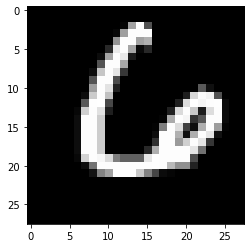

pred :  6 [4.1589141e-04 1.7772272e-11 2.7616252e-08 2.3220363e-13 6.6250818e-09
 4.4080927e-08 9.9994528e-01 2.7879273e-07 1.4057944e-12 5.6330374e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


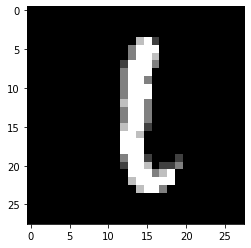

pred :  1 [8.5201204e-13 9.9997854e-01 5.0317904e-06 7.8568130e-10 2.0516941e-08
 2.4715857e-05 1.9162083e-08 2.5903399e-09 8.5484982e-04 4.9983540e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


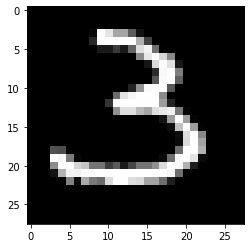

pred :  3 [1.0911387e-10 7.3934007e-07 4.2091688e-08 1.0000000e+00 8.6785376e-14
 4.3091671e-08 2.1217145e-14 1.5009733e-13 1.5353625e-11 1.4540111e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


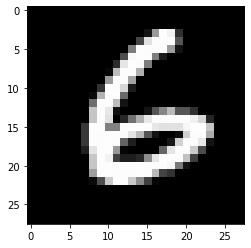

pred :  6 [8.3934907e-08 1.3891045e-07 1.9221111e-06 3.1059469e-10 7.8072590e-11
 1.6226739e-06 1.0000000e+00 2.4210231e-14 5.6241756e-10 2.4383939e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


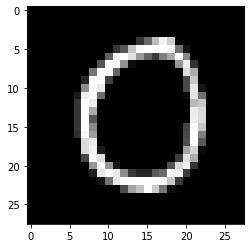

pred :  0 [9.9999958e-01 1.8587068e-07 2.2702258e-08 1.0335182e-11 7.1654905e-15
 2.1735044e-05 5.9023432e-06 8.2284419e-09 1.6775815e-15 3.8084522e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


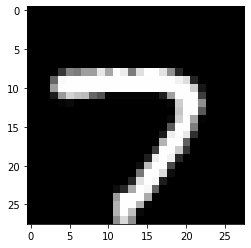

pred :  7 [1.27228986e-07 1.26849763e-11 2.97664045e-08 1.73306137e-06
 1.90534111e-15 2.12086752e-06 1.96521022e-13 9.99932647e-01
 8.69255585e-17 1.00162666e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


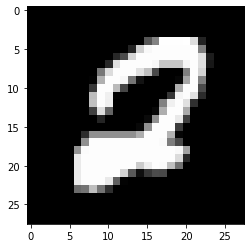

pred :  2 [3.2083569e-06 4.0180047e-11 9.9971783e-01 4.6239941e-07 3.5538680e-10
 2.2424025e-09 1.0819657e-07 3.9278074e-09 1.2271263e-05 3.3140343e-05]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


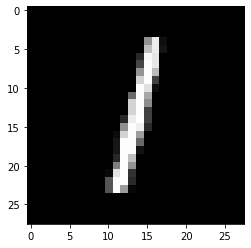

pred :  1 [1.1530054e-08 9.9999642e-01 3.1484493e-07 6.6313999e-10 3.2315333e-07
 7.2986950e-06 1.4277795e-07 6.8110644e-08 1.2007663e-05 9.4607988e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


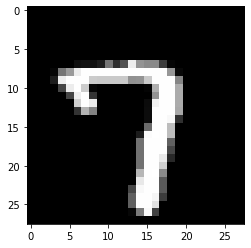

pred :  7 [1.0106432e-09 8.5032446e-11 2.1715350e-06 5.2134208e-10 5.0837644e-13
 5.0109899e-11 4.6116496e-11 1.0000000e+00 1.0319636e-12 1.7050720e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


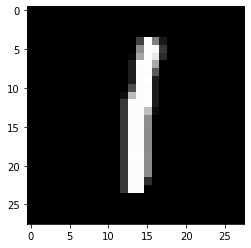

pred :  1 [2.6633936e-11 9.9999523e-01 2.5704416e-09 1.3359130e-07 1.6035513e-07
 3.5015546e-06 3.7131120e-08 3.3568583e-07 1.1863916e-06 2.3420807e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


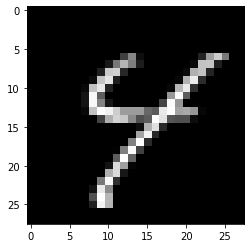

pred :  4 [6.2936371e-14 6.9777482e-15 2.6338042e-12 4.1330952e-09 9.9989092e-01
 6.5427787e-07 2.1634897e-12 5.3823900e-05 1.3577351e-05 4.2502063e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


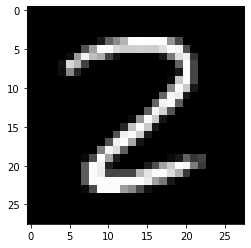

pred :  2 [7.1442914e-09 7.4421232e-06 9.9983704e-01 2.2546556e-05 4.6010848e-09
 3.0138544e-06 3.5369789e-12 4.8603017e-15 3.1182314e-08 1.7484920e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


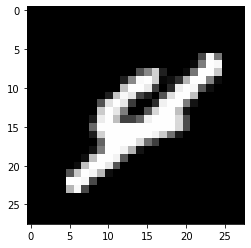

pred :  4 [8.7799428e-08 1.3156970e-11 6.4645988e-05 5.8307108e-13 9.9479043e-01
 1.8700629e-07 1.7061618e-08 3.3723757e-09 3.4473747e-02 9.6652116e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


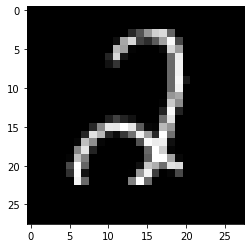

pred :  2 [2.1080523e-10 9.0482530e-08 9.9711424e-01 1.4914939e-06 1.0987931e-06
 4.0662016e-07 5.7460219e-09 4.5964702e-13 1.8985631e-07 3.5643814e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


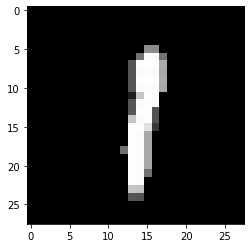

pred :  1 [6.7060982e-11 9.9999332e-01 2.1788868e-08 8.2306394e-07 5.8954492e-07
 3.7914178e-09 2.8428273e-09 1.0814103e-04 2.6077810e-08 2.7148253e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


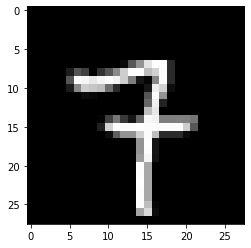

pred :  7 [2.83927087e-14 1.09011314e-10 5.59686325e-11 9.31696650e-06
 5.60714764e-09 4.10852732e-12 6.13171081e-13 9.99764919e-01
 1.39030974e-12 2.64826417e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


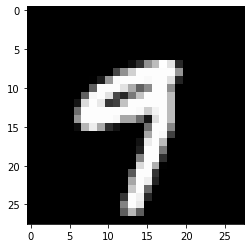

pred :  9 [9.40997211e-11 5.38057966e-12 7.31677132e-12 1.05675440e-06
 5.41478395e-04 5.14569308e-07 2.42546826e-15 1.02348386e-04
 3.18633397e-07 9.99936819e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


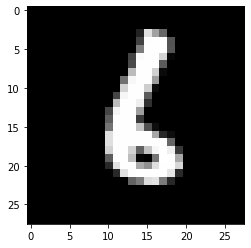

pred :  6 [1.7807408e-09 1.4236569e-04 3.9526140e-06 5.0467847e-08 5.8276062e-10
 1.0286142e-06 9.9999392e-01 1.5810686e-12 3.1815423e-05 1.8339292e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


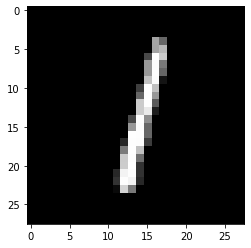

pred :  1 [1.2514412e-09 9.9999881e-01 4.9672502e-07 1.6250416e-10 4.9233995e-07
 7.2111793e-06 2.9237198e-08 2.2185288e-06 6.0242351e-06 2.2515514e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


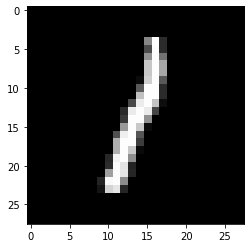

pred :  1 [3.3566934e-08 9.9999958e-01 3.2267140e-05 7.3258524e-11 5.2292862e-06
 2.8307009e-06 1.4743592e-08 1.8063986e-08 3.7144457e-07 2.3720430e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


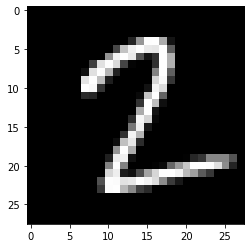

pred :  2 [3.0364035e-08 3.4314394e-04 9.9998868e-01 1.5229712e-07 2.5688803e-15
 7.0333854e-08 2.6095498e-10 1.2719331e-11 1.3159920e-09 3.7629660e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


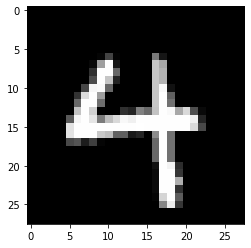

pred :  4 [4.5749103e-13 3.9594040e-14 1.0087430e-08 1.0658717e-08 1.0000000e+00
 5.2394819e-07 5.2242964e-08 2.8699918e-09 8.0956158e-10 3.3733357e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


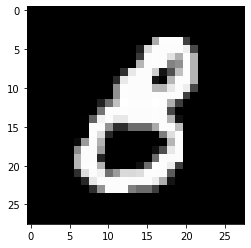

pred :  8 [5.2062073e-06 3.1737903e-07 8.3246537e-10 1.5398622e-02 6.8187783e-10
 5.3181184e-06 1.3533235e-04 3.7155520e-14 9.8172063e-01 4.6336970e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


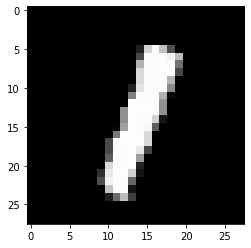

pred :  1 [7.7722103e-07 9.9998790e-01 3.9092907e-07 3.3079539e-10 1.3893882e-07
 9.8397670e-08 7.4899811e-09 6.2784449e-05 6.5245194e-06 3.4234810e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


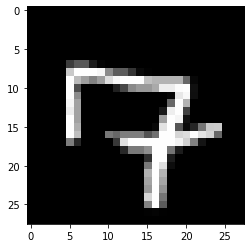

pred :  7 [1.28628272e-08 2.04661288e-12 1.79277449e-05 1.29575568e-08
 1.97776444e-05 1.76226783e-10 8.63788507e-09 9.99998689e-01
 1.16127406e-10 2.54912675e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


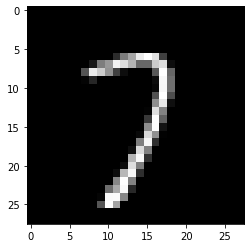

pred :  7 [9.4096488e-11 5.1110538e-10 1.8173425e-05 3.2028968e-06 3.9784805e-14
 5.9259153e-11 9.1971579e-16 9.9998033e-01 3.2010367e-12 7.4665854e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


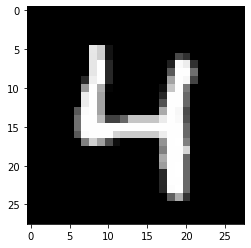

pred :  4 [5.0274390e-14 6.7771082e-13 1.4805073e-09 6.1844341e-10 1.0000000e+00
 2.3896911e-08 3.5808585e-11 5.4154835e-08 6.0504289e-11 1.9349383e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


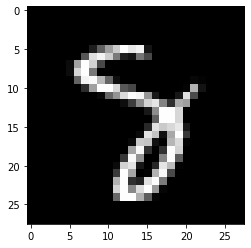

pred :  7 [2.2517951e-11 1.0887448e-12 3.1318617e-05 4.3316908e-07 2.1725737e-09
 2.5355843e-07 2.0799373e-06 9.9121213e-01 6.9200438e-01 2.1364683e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


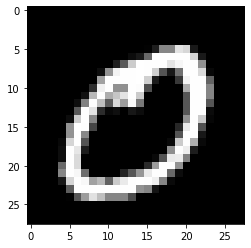

pred :  0 [1.00000000e+00 3.47747914e-07 2.96246094e-06 1.54564859e-08
 7.07274231e-17 1.05743995e-04 9.13176327e-13 1.12711646e-07
 3.86776939e-12 2.25824601e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


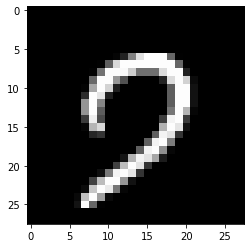

pred :  7 [3.6924281e-05 6.8975792e-17 2.1594816e-07 4.1423371e-09 9.5207618e-12
 6.5236105e-10 1.0804714e-13 9.9182773e-01 2.2757718e-11 1.9909838e-01]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


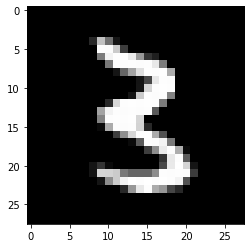

pred :  3 [9.3749444e-12 1.7073972e-06 1.3407267e-06 9.9999630e-01 4.6266205e-10
 4.1154294e-08 3.0029272e-13 2.4481916e-11 1.5326314e-05 9.8498504e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


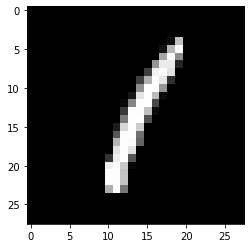

pred :  1 [1.0999847e-05 1.0000000e+00 1.0161530e-07 1.6046396e-10 1.8557764e-06
 9.2525489e-08 2.1383772e-07 1.1877308e-06 5.2272742e-07 1.3363010e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


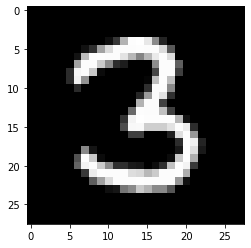

pred :  3 [5.0048504e-10 6.5133753e-07 4.9996462e-08 1.0000000e+00 5.4237347e-11
 5.7139914e-08 4.0551023e-13 1.7700721e-11 4.5388232e-13 3.3524383e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


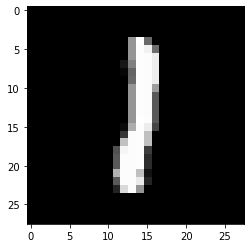

pred :  1 [8.4032853e-10 9.9999261e-01 1.8976329e-05 6.3226375e-09 1.1542106e-09
 4.1412707e-07 4.1489336e-08 1.6817828e-06 1.3859137e-06 1.1278520e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


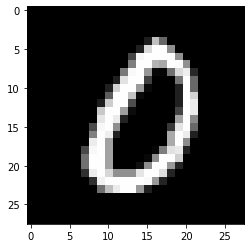

pred :  0 [9.9999964e-01 3.3460361e-07 4.2138081e-06 4.6386091e-07 2.8555871e-13
 1.5452176e-07 2.1397504e-05 7.6827189e-10 4.5323939e-10 6.9858288e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


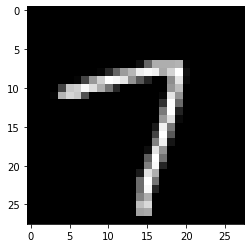

pred :  7 [3.9138081e-07 3.8708786e-11 7.8033554e-06 4.1936225e-08 1.6344798e-13
 5.9968608e-09 5.2337553e-14 9.9999905e-01 1.6559045e-14 1.8402707e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


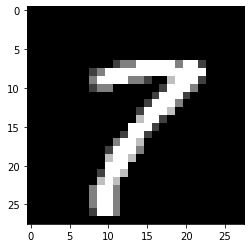

pred :  7 [6.8133832e-10 1.9995886e-08 1.5781487e-07 6.7806623e-06 1.9135291e-14
 5.6881087e-09 3.0428223e-15 9.9999130e-01 1.8163253e-07 3.7774294e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


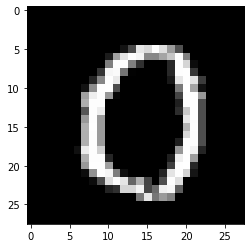

pred :  0 [9.9999011e-01 4.0803956e-09 6.4808514e-09 1.7516890e-09 1.3245298e-11
 5.6646606e-08 3.7037933e-06 1.6095395e-08 1.0923902e-10 8.9817613e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


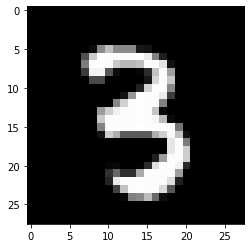

pred :  3 [5.5244325e-12 1.0371296e-08 2.1044138e-09 9.9999988e-01 7.7152498e-09
 9.2332003e-10 7.0679255e-14 3.5024377e-09 1.1899161e-07 2.8693967e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


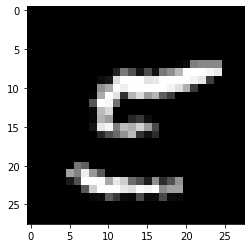

pred :  5 [1.5773825e-11 1.8103566e-06 1.4573929e-09 1.3974156e-09 3.2971601e-12
 1.0000000e+00 1.0493982e-17 5.3703457e-07 3.1318420e-10 1.1553786e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


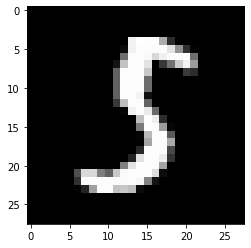

pred :  5 [2.9516034e-10 8.5340142e-03 7.2025698e-11 7.3386705e-05 1.9096269e-15
 9.9995637e-01 6.9867284e-10 3.2118800e-12 1.4118682e-07 3.5626420e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


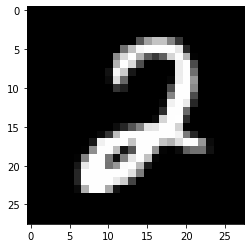

pred :  2 [1.5312806e-06 6.5699746e-10 1.0000000e+00 7.0307125e-09 1.7871300e-10
 6.8848671e-10 1.3241756e-08 1.8940140e-08 1.1314157e-07 3.9776333e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


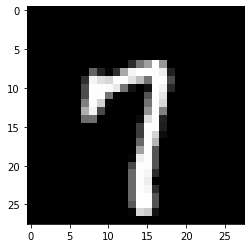

pred :  7 [6.8673323e-10 5.8774990e-08 3.3585297e-09 3.9814894e-09 8.5268841e-09
 1.6182709e-10 1.7015899e-11 9.9999344e-01 1.1380183e-10 2.4900858e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


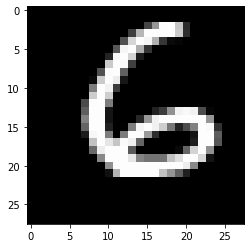

pred :  6 [1.5375567e-08 5.3605520e-09 4.3598023e-09 1.7484654e-08 3.0008903e-12
 4.2771745e-08 1.0000000e+00 4.5782139e-15 1.4353072e-09 1.0118565e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


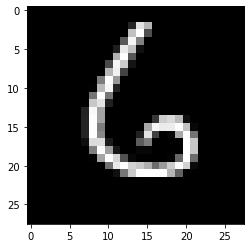

pred :  6 [5.6080141e-09 6.3672883e-07 1.4349979e-09 5.6166872e-12 9.8648165e-08
 8.6196700e-08 9.9999976e-01 7.7570478e-10 5.1201226e-12 3.6989658e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


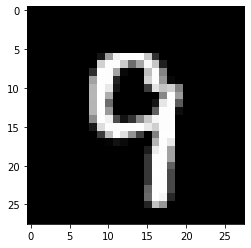

pred :  9 [4.6499297e-11 1.7749556e-13 1.2501482e-09 3.7470627e-08 2.7812646e-05
 3.6661714e-07 1.4456294e-13 1.2355400e-05 8.2388581e-08 9.9999523e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


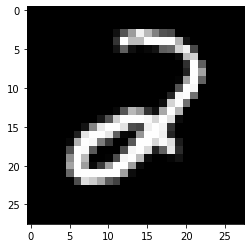

pred :  2 [1.9672236e-06 7.8490128e-13 9.9999797e-01 7.0118904e-04 8.5358298e-10
 2.9249622e-07 2.6468656e-06 2.1855762e-15 1.1499439e-04 1.3344778e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


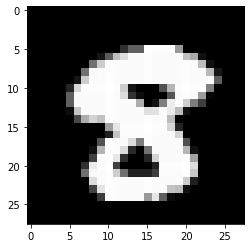

pred :  8 [2.0023451e-07 5.3277422e-12 5.7837674e-06 4.8028887e-06 1.9102337e-09
 3.9560496e-06 5.6575988e-08 5.7282755e-08 9.9999404e-01 7.7500981e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


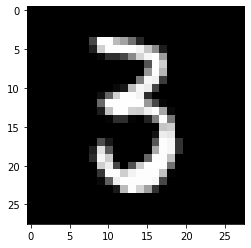

pred :  3 [2.3529520e-08 4.8229190e-08 1.6898116e-06 9.9999845e-01 9.4158707e-09
 3.5232640e-06 1.1854177e-08 9.9017062e-12 2.3697380e-08 3.6121681e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


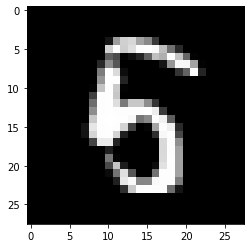

pred :  5 [2.8045363e-12 2.7217508e-09 1.7341929e-09 2.4182796e-08 2.0722139e-06
 9.9049902e-01 2.6404858e-04 9.3826090e-14 3.4767389e-04 5.8302669e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


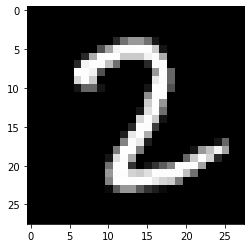

pred :  2 [5.7018852e-08 1.9040527e-06 1.0000000e+00 7.4986040e-08 1.0026582e-16
 2.2295889e-07 1.0220085e-09 1.6888867e-10 7.8382939e-11 2.0205289e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


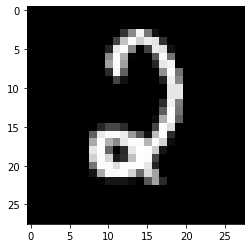

pred :  2 [5.2437385e-06 4.5816649e-11 9.9999917e-01 1.2781163e-09 2.4962804e-13
 1.2778354e-06 3.8160198e-07 4.3412623e-10 4.4246682e-09 5.4307613e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


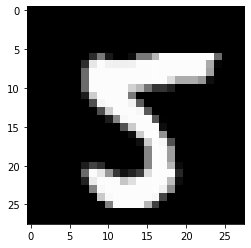

pred :  5 [4.9851765e-14 1.3790241e-09 7.4758937e-09 1.7306871e-07 1.2699167e-14
 9.9999958e-01 6.4890474e-18 6.9155454e-10 1.2084055e-07 5.7045394e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


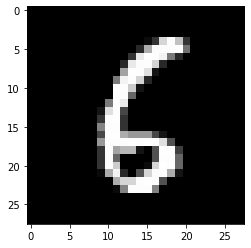

pred :  6 [2.5878118e-05 5.7202289e-08 1.1283807e-06 4.6564419e-12 2.4389856e-12
 3.9687753e-04 9.9997497e-01 7.2998838e-14 2.7032279e-06 2.6809355e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


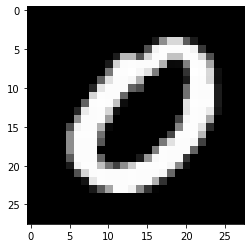

pred :  0 [1.00000000e+00 1.01777742e-09 8.47972430e-08 1.62251523e-09
 2.97247747e-11 1.31177496e-08 8.84568749e-07 3.90944521e-08
 2.84374499e-12 4.35307762e-10]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


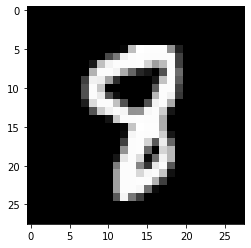

pred :  8 [5.7591802e-08 1.5708351e-10 2.9386234e-07 1.1319732e-04 2.5128497e-11
 1.7898095e-08 2.3901321e-09 2.1707110e-06 9.9997306e-01 4.1311628e-01]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


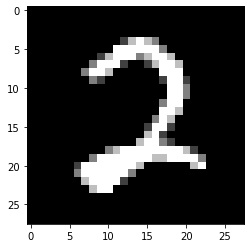

pred :  2 [4.6923120e-07 2.0692495e-08 9.9999946e-01 1.5351371e-07 5.2289552e-18
 2.2158445e-05 6.4543809e-12 5.9196975e-07 1.2595609e-10 1.4908752e-06]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


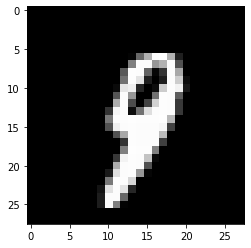

pred :  9 [4.7772720e-11 3.4290341e-08 1.2925891e-11 7.8280076e-09 1.0010495e-04
 1.8282452e-07 8.0924124e-08 3.1351581e-05 8.5865526e-07 9.9720526e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


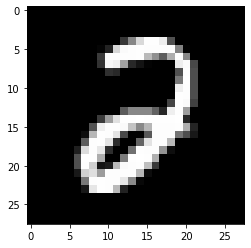

pred :  2 [1.1497877e-05 1.5663271e-13 9.9999344e-01 6.0534042e-08 3.7432479e-12
 4.4548293e-10 3.8145190e-06 1.3143138e-09 1.8901193e-05 1.2942581e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


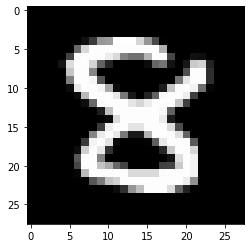

pred :  8 [3.3137257e-10 1.3093845e-13 9.9209103e-07 2.6166439e-04 8.7986848e-08
 4.3494679e-06 4.4643903e-06 1.5940580e-13 9.9996686e-01 9.3933500e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


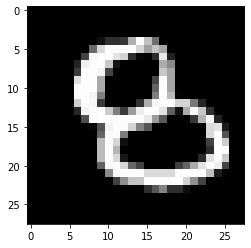

pred :  5 [6.5461495e-07 2.2838066e-08 4.1286462e-06 1.9128377e-12 3.0321523e-10
 6.8272960e-01 2.9648453e-02 2.3342934e-16 4.9484760e-02 1.0976526e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


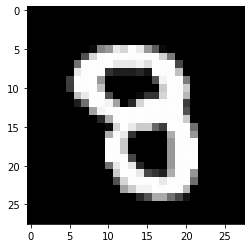

pred :  8 [4.2287778e-05 7.3567124e-15 8.0075858e-07 8.6581707e-04 6.3117178e-10
 3.4312586e-06 1.9644048e-07 2.9925784e-09 9.9619961e-01 3.5254955e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


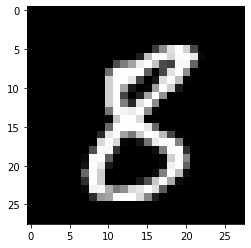

pred :  8 [4.6456434e-09 1.3878889e-07 5.0583418e-07 4.2615946e-07 1.5553493e-11
 1.1017721e-06 6.4292617e-06 5.8065670e-11 9.9999475e-01 1.9966606e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


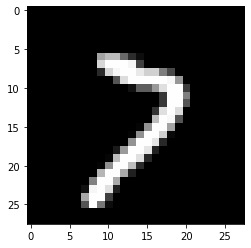

pred :  7 [8.3107528e-07 1.1290373e-10 1.6659498e-04 2.0558112e-08 6.3429141e-14
 2.0972213e-07 3.0760384e-14 9.9999899e-01 8.9323696e-12 5.8662066e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


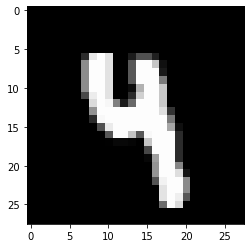

pred :  4 [3.8098084e-13 5.5272942e-10 4.9851412e-09 8.3116362e-08 9.9380171e-01
 7.9945455e-09 2.4535078e-14 2.4276312e-06 8.0299617e-07 1.8498591e-01]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


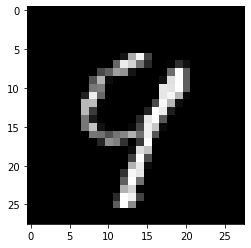

pred :  9 [1.9483935e-12 3.8403010e-11 1.0057292e-07 6.8016980e-06 4.8770322e-05
 6.9279520e-11 1.6792184e-10 3.3224154e-01 3.0152185e-07 3.5833913e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


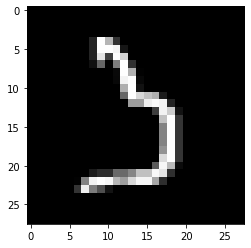

pred :  3 [2.1405683e-13 1.0468092e-06 6.3075603e-08 3.3605805e-01 9.8175461e-13
 1.5636396e-01 7.7567819e-10 1.1309453e-07 1.6052855e-10 1.5959757e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


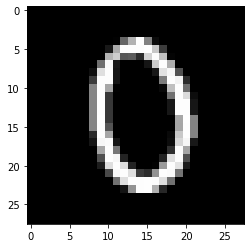

pred :  0 [1.0000000e+00 1.5891424e-14 1.2994111e-03 2.3180650e-11 8.4068158e-13
 3.8766899e-07 1.5111604e-08 6.0483001e-09 1.2062116e-08 1.8244982e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


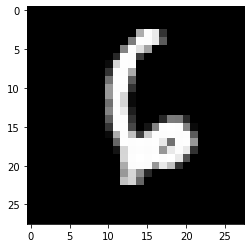

pred :  6 [2.1018695e-10 3.4464559e-08 2.8999093e-05 6.7646784e-11 3.9207935e-04
 1.4269352e-04 9.9999273e-01 8.0148812e-09 1.0084615e-09 5.6034349e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


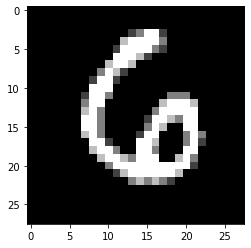

pred :  6 [2.1414026e-08 2.2308683e-08 1.3610818e-06 2.9247401e-12 7.9192250e-07
 5.7867711e-09 9.9999261e-01 5.7614240e-11 2.4954154e-08 2.7686357e-04]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


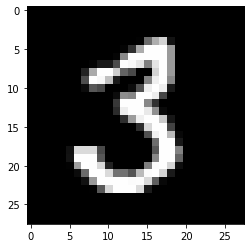

pred :  3 [3.8542566e-08 1.9545857e-06 1.5465031e-07 9.9999821e-01 2.0442255e-12
 1.6149610e-08 6.2022829e-14 7.6120777e-14 5.2232899e-08 4.0281243e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


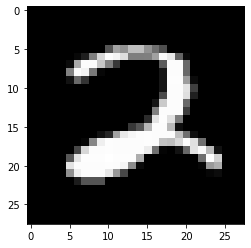

pred :  2 [1.6685500e-12 5.0183693e-09 1.0000000e+00 6.3316496e-10 1.6497062e-11
 7.9220990e-06 3.0095388e-09 2.0663428e-08 1.3339282e-11 3.8669512e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


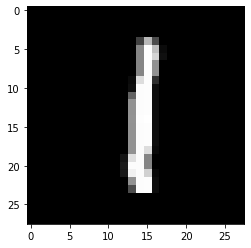

pred :  1 [1.8668741e-12 9.9999797e-01 4.7504902e-09 1.3583568e-07 3.4725659e-08
 6.7934554e-05 5.0831275e-08 1.3841556e-06 2.9999323e-06 6.9586039e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


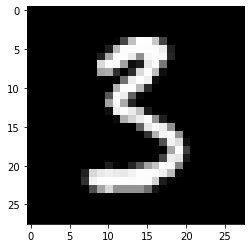

pred :  3 [6.2635500e-08 7.2586947e-05 8.2412382e-10 9.9958587e-01 1.4383732e-10
 1.0958314e-03 2.4962780e-11 6.1708158e-13 1.6205398e-08 2.9828239e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


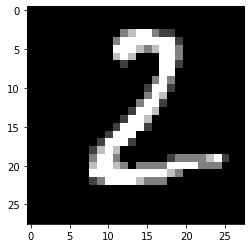

pred :  2 [9.8174908e-09 5.7506131e-06 9.9999833e-01 8.8015213e-08 5.4478654e-17
 3.6745509e-09 9.3445862e-10 2.0821259e-14 3.6393828e-09 3.2982939e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


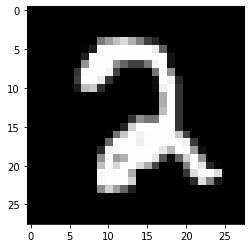

pred :  2 [2.3032392e-11 8.5373806e-09 1.0000000e+00 1.7908698e-10 2.0890903e-15
 1.8332005e-03 1.2176892e-07 8.4641798e-08 1.0625758e-07 7.7175377e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


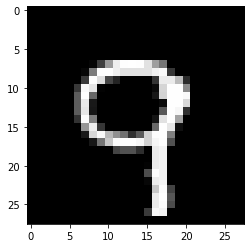

pred :  9 [5.6108121e-07 6.1682471e-14 5.9290875e-07 4.1013930e-09 1.2713522e-09
 1.1073729e-10 1.9693828e-13 2.8470900e-05 1.6410023e-09 9.9999952e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


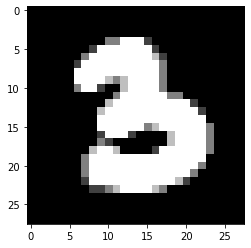

pred :  3 [3.7897553e-05 2.2971949e-06 5.4904798e-05 9.9985695e-01 1.7544299e-14
 4.4691169e-05 4.4758597e-09 7.3970491e-12 3.7301041e-05 9.1350088e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


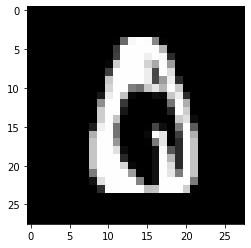

pred :  0 [9.9787295e-01 2.4182105e-08 6.5189248e-05 4.5392849e-08 3.7730152e-09
 5.6824088e-04 6.8895442e-06 1.6697702e-11 7.5429547e-05 1.3360181e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


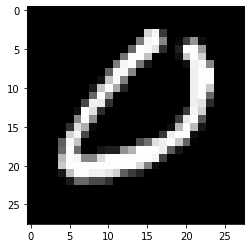

pred :  0 [9.9707204e-01 1.7734728e-10 2.3315475e-05 2.5603106e-07 2.4473000e-11
 5.4511226e-08 9.0511530e-06 1.6930108e-11 6.0706778e-12 5.0610515e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


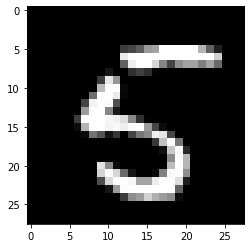

pred :  5 [4.2069653e-10 3.8683083e-08 3.1435327e-12 3.1599324e-08 2.5100115e-09
 1.0000000e+00 1.5961416e-06 1.8166820e-11 1.3093715e-10 7.7987122e-12]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


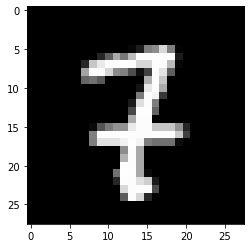

pred :  7 [8.5802165e-09 1.7742458e-08 1.4570892e-02 2.4271103e-06 5.9420299e-12
 1.3427163e-08 1.1806582e-09 9.9999654e-01 8.9362220e-06 2.2353669e-11]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


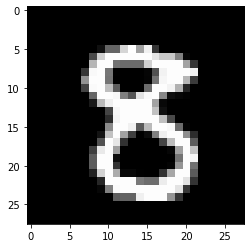

pred :  8 [1.6861685e-08 1.2745006e-10 8.6992509e-07 1.8362518e-05 2.5688145e-09
 2.8853892e-06 3.2412896e-07 1.7439099e-11 9.9998653e-01 1.5688831e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


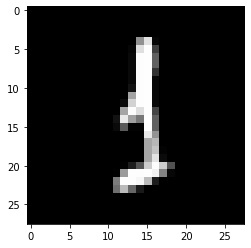

pred :  1 [1.0497797e-11 6.4010340e-01 3.1145192e-10 4.4280589e-03 1.5814457e-08
 6.0117669e-05 5.5498086e-09 6.5220766e-11 9.6607927e-08 2.0384525e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


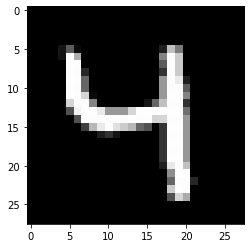

pred :  4 [2.6354937e-15 4.1691321e-11 2.4090011e-10 3.8113498e-07 1.0000000e+00
 1.3251629e-07 1.7731868e-12 4.4218609e-08 9.8430846e-09 4.8021925e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


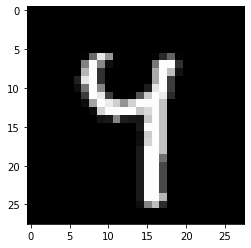

pred :  4 [6.7721267e-15 2.3088770e-08 2.3713960e-13 5.6829763e-10 9.9994183e-01
 9.4492307e-08 1.0394167e-12 9.3953568e-05 1.9271697e-06 6.4475536e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


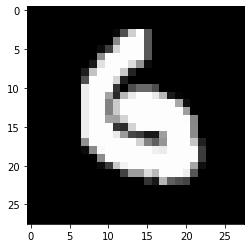

pred :  6 [3.0036094e-09 7.8278203e-11 3.0772670e-05 2.9791326e-07 1.8438588e-07
 9.7970888e-06 9.9976540e-01 6.1353727e-13 1.4499457e-05 7.2932243e-04]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


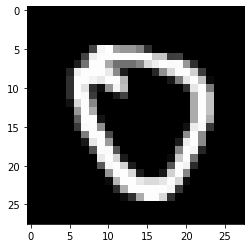

pred :  0 [9.9999213e-01 3.8703710e-10 3.3216057e-09 1.2430525e-10 3.3120793e-12
 5.4758959e-05 9.9610406e-07 4.2043625e-06 1.7878903e-10 7.0078222e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


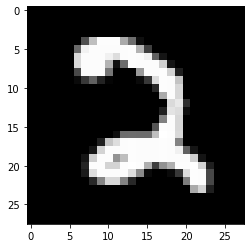

pred :  2 [1.3610935e-08 1.6166467e-08 1.0000000e+00 6.0921983e-11 8.8838008e-14
 4.1974758e-06 1.3024314e-11 1.3432133e-08 1.0542313e-09 2.1971343e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


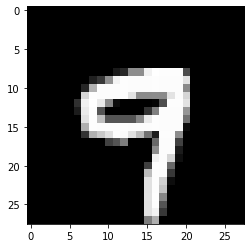

pred :  9 [6.3914923e-10 8.5558515e-20 8.8223158e-11 2.7560174e-07 5.8973271e-09
 2.6884052e-07 1.1811909e-11 6.8234986e-05 5.1606128e-09 9.9999970e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


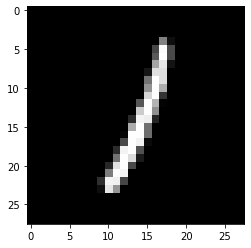

pred :  1 [3.8581432e-10 9.9999821e-01 1.7157161e-05 3.0758687e-10 1.9751651e-05
 9.5156116e-07 4.5726711e-08 2.1980316e-06 3.3702729e-09 1.7476943e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


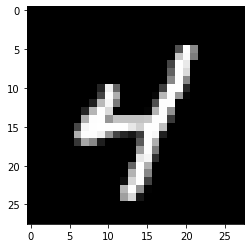

pred :  4 [1.1101543e-13 4.5948756e-09 1.9454362e-06 9.7506829e-09 1.0000000e+00
 4.2783475e-07 1.5813183e-09 4.6712845e-10 2.4272873e-07 9.4729691e-10]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


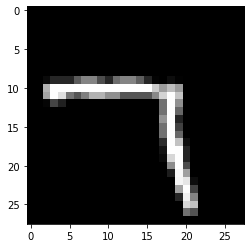

pred :  7 [2.1128627e-10 4.4925468e-09 7.5419759e-09 1.1018903e-05 9.0567077e-13
 8.2895824e-08 1.0040735e-10 9.9999470e-01 2.2886095e-14 2.9984117e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


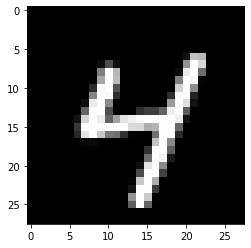

pred :  4 [2.7203322e-14 1.1140201e-15 3.3662495e-10 1.8826820e-09 1.0000000e+00
 2.1833975e-07 1.1621266e-11 2.6411328e-07 7.0914996e-11 4.7021294e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


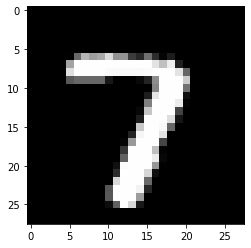

pred :  7 [7.6464640e-10 7.3525086e-10 1.1331872e-06 6.9577011e-09 7.8874208e-12
 9.9283049e-14 1.6240454e-12 9.9997711e-01 1.2170373e-10 1.4649875e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


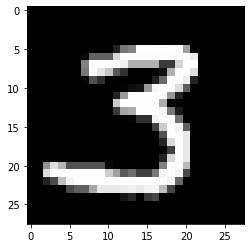

pred :  3 [1.2597141e-07 5.2802833e-09 1.0172836e-07 1.0000000e+00 8.9622386e-11
 5.7503744e-09 3.9841207e-15 8.1516120e-14 4.5829500e-11 1.8202547e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


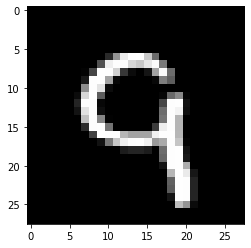

pred :  9 [3.6608220e-11 2.1912290e-14 7.8987578e-06 1.9987314e-11 1.8396170e-09
 1.3768436e-06 8.6667363e-08 7.8949014e-08 2.7728252e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


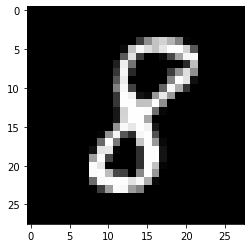

pred :  8 [2.8094837e-08 4.8546767e-06 1.6658672e-07 2.5920897e-07 4.6732251e-07
 1.6600206e-08 1.8318983e-07 1.4350615e-12 9.9999070e-01 2.1475707e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


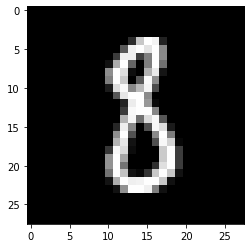

pred :  8 [1.5493418e-07 1.4126190e-06 1.2484832e-06 1.1773156e-05 7.1446113e-11
 1.4742743e-05 7.0868323e-06 6.6232969e-10 9.9998748e-01 6.0500196e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


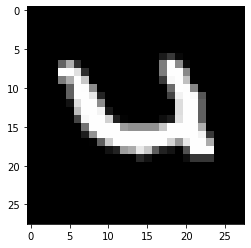

pred :  4 [2.5300839e-09 3.9501166e-15 9.0257458e-07 6.4038564e-13 9.9999881e-01
 1.0766482e-11 6.9296700e-11 4.6139094e-06 2.8304817e-12 8.5137090e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


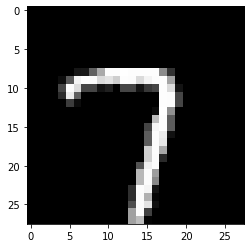

pred :  7 [1.9017135e-08 1.0664263e-09 3.4811525e-05 7.1506849e-09 6.5261449e-15
 3.4535264e-10 1.7120465e-11 1.0000000e+00 7.9204282e-14 1.0290061e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


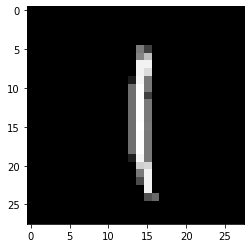

pred :  1 [6.0073982e-15 9.9999964e-01 1.1711219e-09 4.9153954e-07 9.4996755e-10
 7.9114230e-08 4.9670896e-05 7.3618903e-06 3.2208650e-06 3.5794213e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


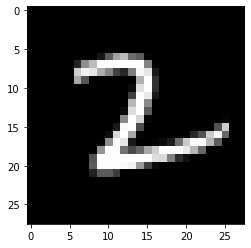

pred :  2 [6.6374545e-12 9.9644065e-04 9.9999154e-01 2.0029448e-07 1.8835959e-15
 8.2677873e-09 4.4958855e-07 1.2847363e-07 1.8218056e-07 4.5590087e-15]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


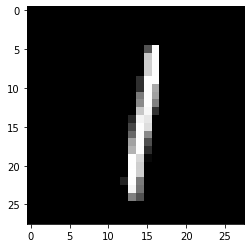

pred :  1 [1.3401277e-11 9.9998641e-01 1.1310068e-07 2.2566311e-08 2.4111790e-05
 2.6124872e-07 2.5553710e-09 2.6468593e-05 2.6342114e-08 8.6803431e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


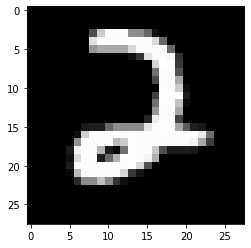

pred :  2 [4.4732523e-11 4.3301726e-10 1.0000000e+00 5.7520697e-07 1.1774620e-10
 2.4680983e-08 2.8791675e-07 9.6656580e-12 1.7599743e-13 8.9618878e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


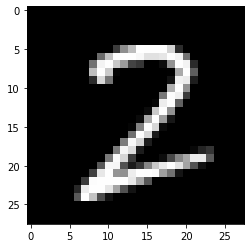

pred :  2 [8.5157268e-07 2.1242438e-06 1.0000000e+00 7.6442848e-06 5.5006773e-17
 3.8297571e-07 4.1390906e-13 4.6688214e-08 1.6086325e-10 4.4386363e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


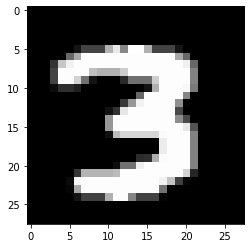

pred :  3 [1.2831848e-09 1.1332904e-09 8.4262730e-09 1.0000000e+00 4.9618523e-13
 9.8311332e-09 1.5010390e-17 5.8910423e-09 4.4284315e-10 7.3537365e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


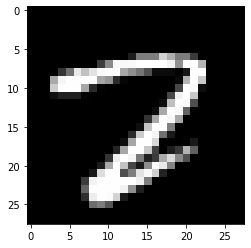

pred :  2 [1.9972330e-08 1.6188006e-08 9.2680919e-01 1.1590123e-03 2.5056786e-16
 1.2957167e-11 4.3745269e-10 2.2652030e-02 1.5869793e-07 2.0965933e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


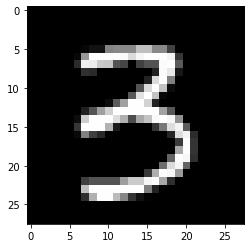

pred :  3 [1.3625674e-10 2.2225736e-08 2.7567189e-09 1.0000000e+00 3.4620424e-09
 2.5126845e-09 4.7341106e-16 5.1217197e-10 8.1688661e-08 2.4164274e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


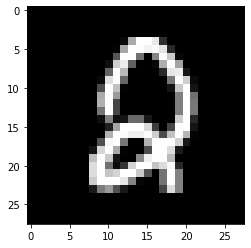

pred :  2 [4.4107437e-04 4.3855270e-11 9.9977458e-01 9.3144648e-09 5.2239848e-09
 3.9012644e-07 1.6387449e-06 6.1533352e-14 1.4239550e-03 6.1572966e-05]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


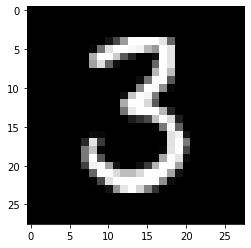

pred :  3 [4.8245354e-09 9.3501814e-07 4.2122206e-08 1.0000000e+00 5.6817195e-10
 3.8444199e-07 1.1578598e-13 8.9233950e-12 5.2303282e-08 5.0969350e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


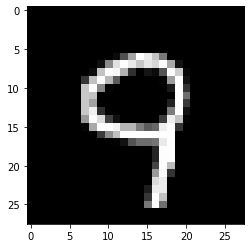

pred :  9 [9.9930567e-13 8.8908855e-18 1.0101768e-09 2.2715978e-09 2.3159748e-07
 1.6429480e-08 3.6643548e-12 2.2650379e-06 2.6128308e-07 9.9999952e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


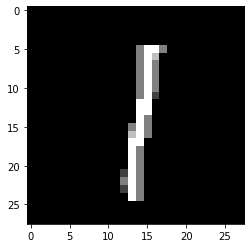

pred :  1 [1.1931449e-10 9.9999285e-01 9.5642765e-09 2.0747795e-07 7.1636983e-08
 1.1763958e-06 6.0745758e-10 1.8858394e-05 3.1500065e-06 1.5330697e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


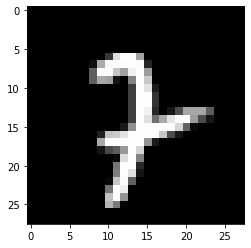

pred :  7 [9.69564845e-11 2.95268336e-07 1.01301074e-03 4.63435734e-10
 8.73121678e-07 8.91178742e-10 2.52053245e-09 9.99984801e-01
 2.78234666e-07 1.18931595e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


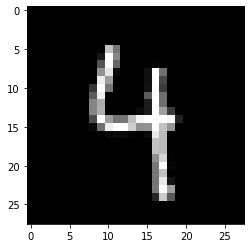

pred :  4 [6.66022049e-15 3.35425483e-08 1.10789052e-10 7.69485524e-08
 9.99999404e-01 1.86312406e-07 1.13638385e-12 1.05727906e-07
 4.58667514e-11 2.07824323e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


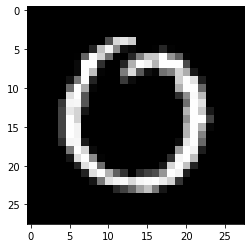

pred :  0 [9.9997640e-01 3.0701379e-09 2.1183428e-06 1.2382560e-06 2.5842614e-12
 3.6119996e-08 2.8863758e-07 5.9563479e-07 3.5798030e-13 3.7032068e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


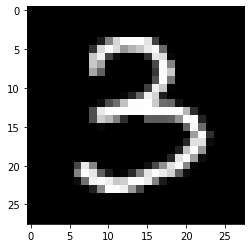

pred :  3 [3.5670817e-11 1.6047193e-06 4.3201842e-09 1.0000000e+00 3.2763021e-09
 3.4301003e-08 6.6247268e-13 2.6808623e-13 1.2597856e-08 9.8607761e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


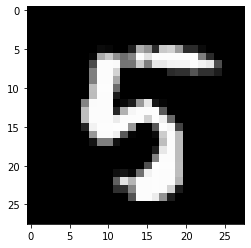

pred :  5 [1.5946359e-13 1.9301491e-10 1.3274913e-15 1.4652251e-07 2.2825632e-10
 1.0000000e+00 1.2179842e-07 1.6777026e-08 5.5055619e-08 1.4384611e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


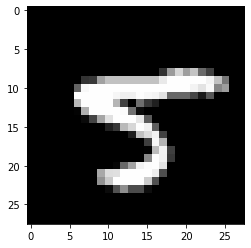

pred :  5 [1.2394639e-13 5.4439449e-11 7.3354404e-12 5.1620827e-06 3.4104213e-14
 9.9999624e-01 1.3280093e-13 3.5187695e-05 1.0595461e-07 1.2245870e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


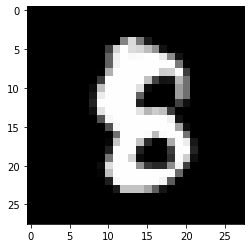

pred :  8 [2.18899345e-07 1.03820284e-07 5.35271056e-07 9.79637844e-06
 2.98697866e-09 1.34882331e-02 1.24096870e-04 2.96090152e-10
 9.99818683e-01 1.74462795e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


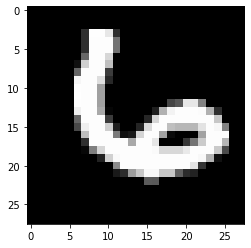

pred :  6 [3.1012707e-06 3.3516121e-09 4.8772461e-07 1.8501910e-13 1.8528612e-05
 1.9955500e-08 1.0000000e+00 6.3140389e-11 1.1121445e-09 4.9379101e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


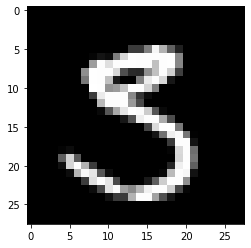

pred :  5 [5.9312985e-11 1.7689940e-09 2.7221958e-10 3.3210248e-01 3.8198607e-11
 3.7092000e-01 3.6033650e-15 4.5296129e-13 1.3718270e-05 1.4724731e-03]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


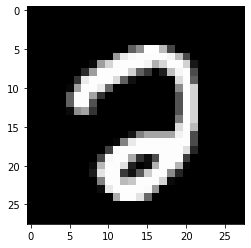

pred :  2 [2.2141039e-03 7.7234538e-12 9.9762154e-01 4.7984265e-09 8.8026448e-16
 6.4337297e-07 2.1478106e-06 6.5308809e-04 8.3282077e-07 2.9489224e-06]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


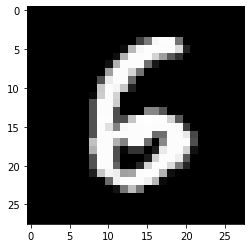

pred :  6 [5.9440192e-10 4.2511057e-09 9.6182805e-07 2.6543373e-10 1.8540974e-10
 2.5633842e-02 9.9982667e-01 2.2744752e-14 8.8391729e-08 5.7855987e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


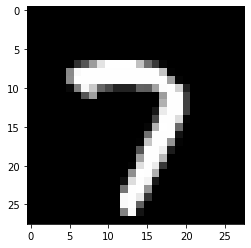

pred :  7 [4.2346230e-08 1.1311485e-12 6.8471254e-06 1.1983363e-09 4.8128120e-15
 7.6328069e-11 3.9822331e-13 9.9999976e-01 2.7074431e-14 6.1418837e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


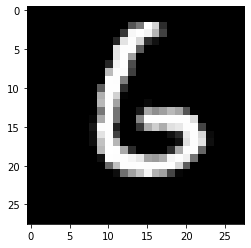

pred :  6 [4.1766396e-10 3.1868108e-09 2.2209918e-09 4.2930122e-07 8.0212968e-11
 1.5119483e-07 1.0000000e+00 4.3201757e-13 4.5864826e-11 4.3199393e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


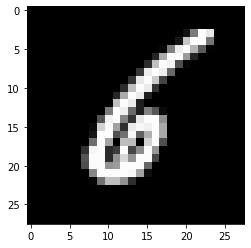

pred :  6 [7.7207446e-08 2.9967055e-07 3.6714060e-05 2.1834461e-12 8.4889359e-11
 3.9744377e-04 1.0000000e+00 3.2706418e-15 4.3903506e-06 2.1491924e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


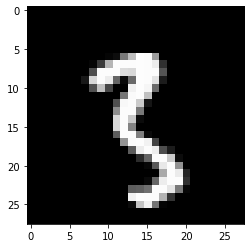

pred :  3 [1.1538024e-07 4.7206879e-04 2.6909743e-06 9.9948531e-01 2.2920027e-11
 7.4767822e-06 3.3043245e-12 1.5491246e-09 2.8523505e-03 2.2454735e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


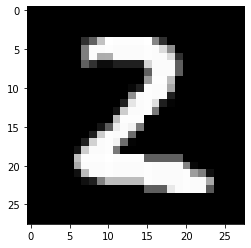

pred :  2 [2.1681693e-07 4.6159336e-08 9.9999911e-01 2.1690182e-06 1.1807494e-11
 5.8181358e-09 1.3123193e-10 3.3262889e-14 4.9793755e-08 3.3537045e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


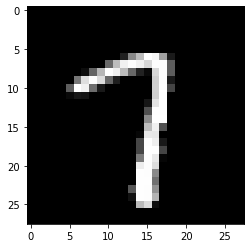

pred :  7 [5.3679872e-10 5.6009353e-06 1.3568997e-04 2.3494530e-07 2.2008429e-13
 2.0723272e-11 2.9650466e-12 9.9977100e-01 3.3312034e-10 1.2175964e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


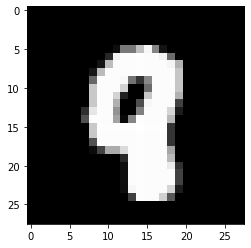

pred :  9 [3.5181986e-09 4.0624532e-11 1.8833870e-08 1.2260718e-04 2.2535120e-05
 3.7372843e-08 7.7947977e-09 4.0721025e-06 9.1473466e-01 9.9459177e-01]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


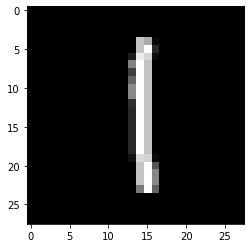

pred :  1 [5.8773158e-13 1.0000000e+00 1.8966928e-08 1.0444727e-08 4.4605258e-10
 8.2402094e-06 4.5918991e-08 1.1793288e-06 6.6930647e-07 4.0135376e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


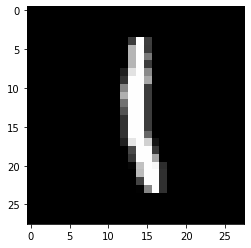

pred :  1 [3.1844817e-14 9.9999976e-01 4.1601089e-07 7.2597224e-08 1.7652476e-07
 5.5823302e-06 9.7740937e-08 6.7294826e-07 1.8274949e-06 1.9195912e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


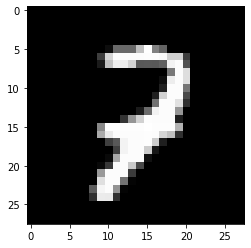

pred :  7 [1.3071830e-10 8.1276574e-10 4.3565035e-04 1.6054511e-04 2.3973537e-10
 9.6204449e-09 1.9702284e-09 8.6997741e-01 1.0835725e-07 8.3431602e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


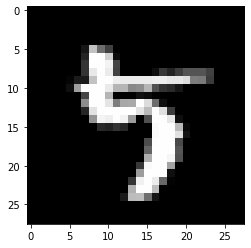

pred :  4 [3.2718647e-15 4.3413628e-17 7.0798090e-11 7.6557196e-09 7.9847664e-01
 8.6349249e-03 5.2641155e-12 4.2939186e-03 2.8243787e-07 8.5365772e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


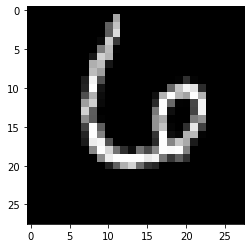

pred :  6 [1.9239046e-06 3.0637246e-14 2.1329522e-04 7.3412630e-12 2.8456961e-06
 9.6026159e-11 9.9993610e-01 2.1476008e-05 5.1314123e-13 4.3281812e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


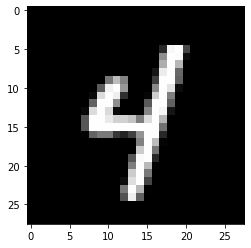

pred :  4 [1.59817848e-15 9.63637717e-07 1.21928110e-11 1.37818276e-07
 1.00000000e+00 1.00511166e-07 9.79092779e-11 4.60163296e-11
 3.93345267e-09 1.65809269e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


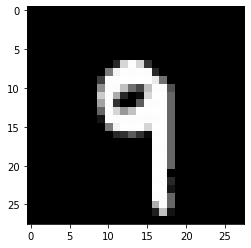

pred :  9 [8.7261627e-13 3.5580101e-11 7.3435530e-10 4.4974166e-07 5.3792593e-07
 1.7358004e-10 5.0748780e-14 8.4762160e-06 1.6190567e-08 9.9999976e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


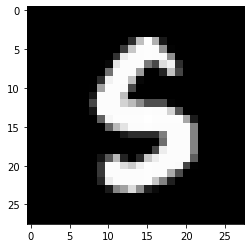

pred :  5 [5.6584078e-12 1.1851425e-07 1.8041069e-10 1.1660945e-05 2.2424045e-11
 9.9999964e-01 2.3431720e-07 1.2460398e-12 7.6152517e-08 1.4227629e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


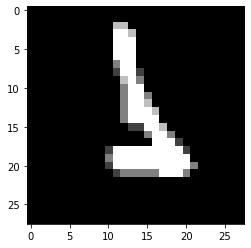

pred :  1 [2.9566573e-14 1.1223793e-01 5.3614080e-03 3.6847036e-05 4.6293525e-12
 1.0916276e-05 1.8423796e-04 6.0276247e-14 6.9274208e-08 8.8779331e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


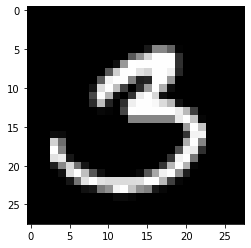

pred :  3 [4.3459951e-09 2.9154796e-07 3.4005322e-12 9.9858475e-01 2.3166971e-09
 2.5400836e-05 2.2683513e-16 1.6784193e-12 2.4366111e-07 3.6844611e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


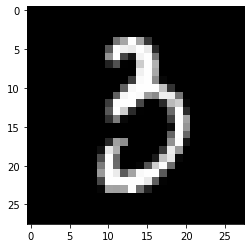

pred :  3 [1.1065997e-05 1.6680188e-08 4.4341093e-07 9.9959040e-01 1.0321181e-10
 1.9538495e-06 2.6889911e-08 2.1948474e-10 3.9262421e-05 5.1370241e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


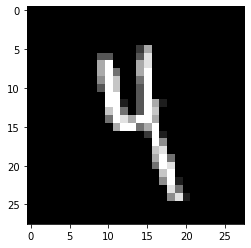

pred :  4 [1.4879680e-15 1.8951425e-05 1.8245839e-09 6.9878546e-08 9.9688661e-01
 3.0698145e-06 9.1515486e-14 2.3486328e-09 1.0393114e-05 6.4360321e-02]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


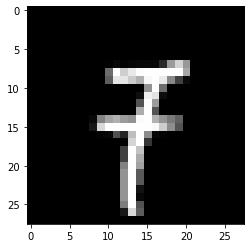

pred :  7 [1.37373275e-15 1.21317054e-04 3.89591029e-13 3.91659540e-08
 7.41705506e-08 1.79900269e-06 1.53762409e-12 9.99673247e-01
 1.64980540e-09 2.80984568e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


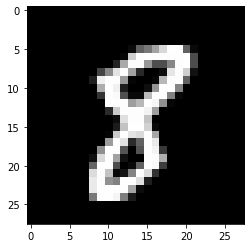

pred :  8 [9.1475574e-09 2.2196600e-07 1.2814999e-04 9.6315574e-08 1.0692125e-09
 8.0432132e-09 1.6856156e-08 2.1658163e-10 1.0000000e+00 3.4248038e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


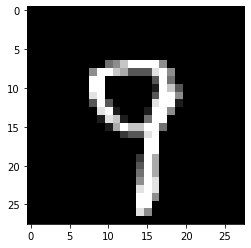

pred :  9 [1.03890785e-11 2.71383888e-10 3.57026700e-11 4.40198017e-10
 4.02438246e-07 1.52456670e-09 2.48480468e-12 4.54178452e-03
 2.36294198e-07 9.99531984e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


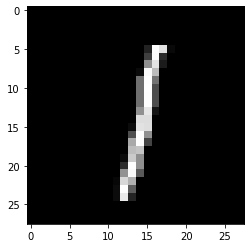

pred :  1 [6.12103701e-11 9.99906659e-01 5.85125504e-09 1.22212285e-09
 1.55876642e-05 8.79223535e-06 1.00234665e-08 1.02952245e-05
 3.20057939e-06 2.84529000e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


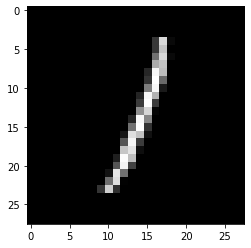

pred :  1 [1.8061427e-09 9.9998760e-01 5.6621279e-06 1.1653929e-09 3.1639811e-05
 1.2565359e-05 2.7076552e-10 1.9687457e-06 2.7741225e-07 1.7167995e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


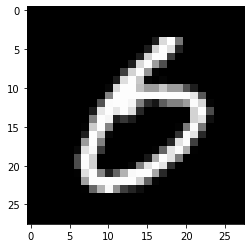

pred :  6 [6.0728401e-02 2.4509580e-07 3.3139553e-05 5.5980650e-05 1.2057147e-12
 9.2720985e-04 6.7790425e-01 1.5260389e-09 1.4402738e-05 1.0833131e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


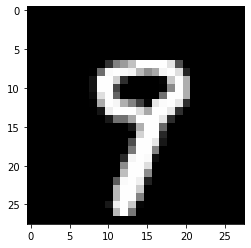

pred :  9 [5.3245651e-11 1.2427691e-12 4.3282691e-12 1.8111760e-07 1.4573929e-07
 6.1744307e-09 5.3351730e-13 5.6032088e-05 2.8131020e-05 9.9992585e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


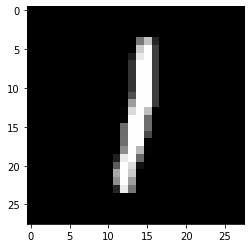

pred :  1 [3.7928338e-10 9.9999958e-01 1.0681898e-08 9.5137098e-10 5.3422227e-08
 7.5830894e-06 2.1116158e-08 8.2493420e-07 4.2460735e-07 4.9211741e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


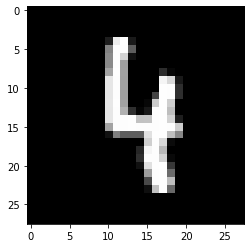

pred :  4 [1.9945964e-14 3.5272378e-06 8.3305463e-10 7.3517306e-08 1.0000000e+00
 5.8492686e-09 6.5577299e-10 1.2386989e-08 5.7079810e-11 5.6600815e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


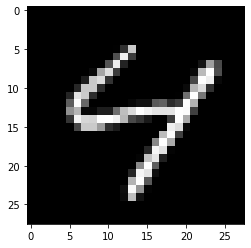

pred :  4 [1.48417498e-12 1.01598366e-16 2.14969265e-09 4.07810619e-10
 9.99956250e-01 7.21748776e-08 6.59525767e-11 1.64550543e-03
 1.05056248e-08 1.17725134e-02]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


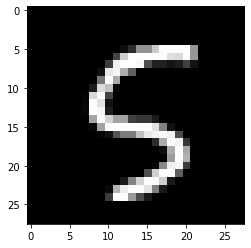

pred :  5 [2.7448820e-13 4.8621640e-08 1.0514154e-10 1.0711712e-07 7.6378452e-15
 9.9999970e-01 1.9749162e-09 6.5818830e-12 1.8335692e-07 7.3499825e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


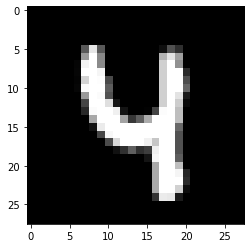

pred :  4 [8.4466147e-16 3.3623992e-10 7.2416087e-11 1.7123682e-07 1.0000000e+00
 3.3962287e-08 1.6801017e-11 4.7424443e-08 1.6097093e-07 3.0530514e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


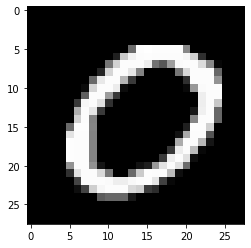

pred :  0 [1.0000000e+00 8.9915652e-08 2.7198579e-08 9.2672039e-09 2.6186340e-14
 3.0042926e-08 1.5888622e-08 5.1837887e-08 1.4881604e-12 8.5281482e-10]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


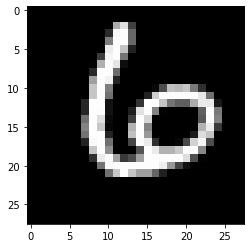

pred :  6 [7.7639683e-08 1.0439110e-08 6.8070938e-07 2.4356456e-10 1.3128124e-10
 1.9122579e-08 1.0000000e+00 5.8247899e-08 4.7969624e-09 2.0887352e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


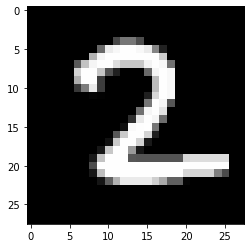

pred :  2 [1.4398699e-09 2.0213058e-06 1.0000000e+00 1.4546200e-07 8.1261131e-20
 1.5755313e-06 1.5705806e-10 2.8140381e-11 2.0676447e-11 3.4312012e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


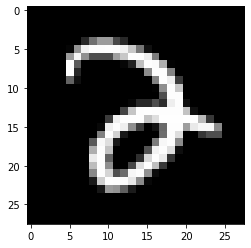

pred :  2 [1.9513217e-07 3.4278075e-14 9.9998367e-01 2.7906513e-05 2.4869657e-09
 1.5202024e-09 3.4172164e-08 8.9845416e-05 2.8107097e-09 6.3100421e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


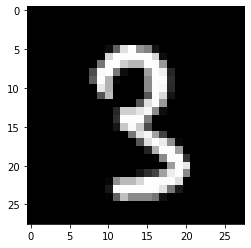

pred :  3 [1.4162800e-08 1.3511487e-07 3.0566378e-07 9.9949628e-01 5.0562045e-13
 7.5753951e-07 5.1136052e-15 2.0012568e-11 6.0067352e-05 2.4851097e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


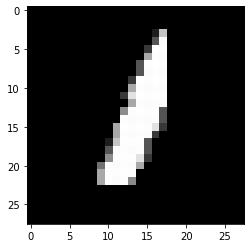

pred :  1 [7.3309231e-08 9.9846232e-01 1.4730853e-05 3.4415866e-09 5.2782398e-05
 2.2787376e-08 4.3187101e-05 5.3214131e-07 1.1832487e-05 1.9699176e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


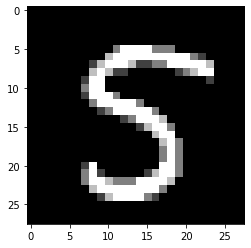

pred :  5 [6.62781418e-12 4.13135137e-10 4.09348377e-09 4.19410071e-07
 2.48485098e-13 9.99993086e-01 8.83002981e-14 1.27792904e-12
 1.05093925e-08 1.28000975e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


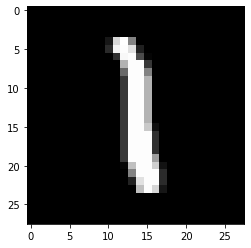

pred :  1 [6.5875033e-14 9.9999189e-01 2.4485588e-04 4.6873808e-08 3.8908681e-09
 1.6086894e-06 1.7751896e-07 2.3586947e-06 7.2034468e-06 3.5224240e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


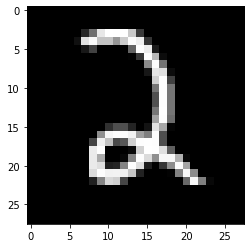

pred :  2 [2.5284823e-09 4.7395055e-08 1.0000000e+00 7.4213955e-09 1.2162116e-13
 3.1353760e-09 2.9251366e-08 1.3461985e-12 1.4126492e-11 4.9459787e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


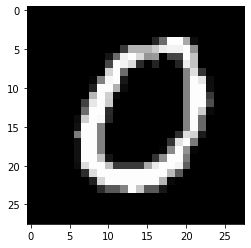

pred :  0 [1.0000000e+00 1.5001721e-07 9.7341172e-07 8.8776320e-11 1.3902435e-12
 9.0800462e-08 6.4614833e-06 1.3015213e-09 3.2584206e-14 3.6948127e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


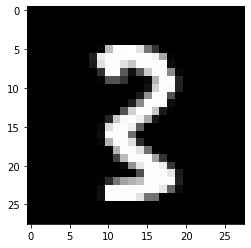

pred :  3 [2.8823777e-06 1.2731334e-07 1.4251769e-02 9.9924433e-01 4.1563801e-15
 1.8863915e-09 1.6264603e-12 1.1035612e-09 1.9526482e-04 3.6315437e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


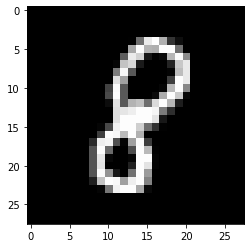

pred :  8 [5.3883653e-08 1.3190750e-06 2.8501162e-07 2.4413573e-06 7.6262694e-08
 5.4507010e-10 5.6669141e-06 5.7253148e-12 9.9999660e-01 4.2376269e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


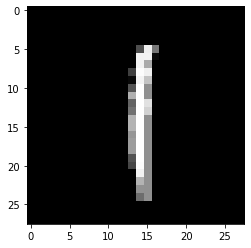

pred :  1 [6.2104273e-14 9.9999970e-01 1.4305626e-09 1.8866974e-07 1.6959675e-08
 2.9025156e-07 2.2128427e-06 4.8289157e-06 4.9555211e-07 3.1424557e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


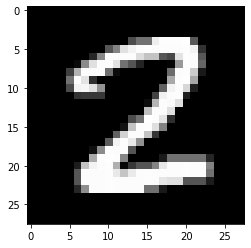

pred :  2 [1.9318315e-07 1.9936440e-06 9.9999946e-01 1.1949824e-05 3.9147297e-11
 2.7538747e-06 3.4234872e-11 6.4555598e-13 3.5411492e-09 4.7887944e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


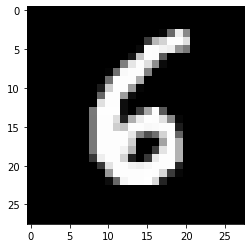

pred :  6 [6.9454198e-10 9.1340851e-08 9.9931768e-08 1.3076219e-10 1.0934330e-09
 2.5601057e-05 1.0000000e+00 1.2758618e-15 1.2471646e-08 4.1209752e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


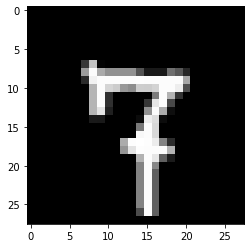

pred :  7 [8.1721227e-12 1.2793528e-09 6.1491654e-08 2.3011557e-07 7.4482850e-12
 7.1363304e-11 3.5362238e-08 1.0000000e+00 5.6661950e-08 2.1120681e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


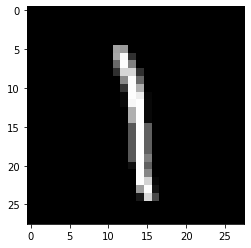

pred :  1 [7.5712945e-16 9.9996972e-01 2.7356327e-06 7.4069789e-07 1.0096312e-10
 6.5890970e-05 1.7221305e-07 2.1010960e-06 3.2848120e-04 3.8128695e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


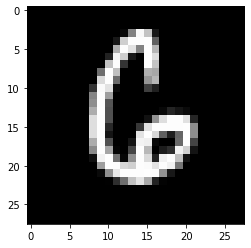

pred :  6 [9.7460955e-08 8.8874543e-08 1.7039365e-05 6.1264535e-12 2.1535573e-10
 2.3444528e-07 9.9999946e-01 3.4091274e-10 9.8321316e-08 1.0824256e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


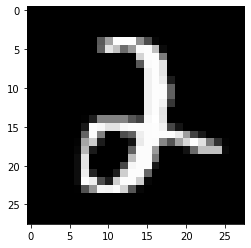

pred :  2 [5.0822649e-08 1.5957772e-05 9.9991262e-01 5.6979115e-06 5.5300891e-03
 1.2939076e-09 4.3563003e-10 1.5531928e-07 1.8976174e-06 1.1424804e-15]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


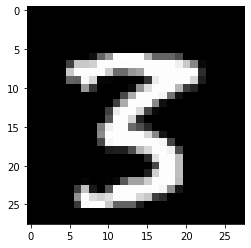

pred :  3 [9.3995679e-11 1.6465360e-09 6.6276062e-10 9.9999869e-01 1.2425599e-13
 4.0724615e-05 2.6669963e-16 3.4749266e-07 1.8018305e-06 4.7103713e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


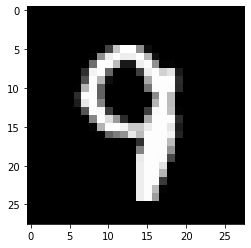

pred :  9 [2.2988765e-11 9.7155443e-12 7.9801707e-11 6.3653083e-11 7.0065631e-05
 1.9415076e-09 2.0729213e-10 1.3994479e-01 7.4864323e-07 9.9979901e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


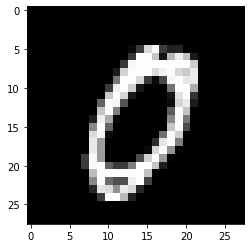

pred :  0 [9.9999094e-01 8.6701502e-10 5.4907799e-04 1.5797214e-08 1.9890184e-15
 3.9252613e-05 2.9967182e-10 2.8414302e-06 9.4995756e-12 1.9523072e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


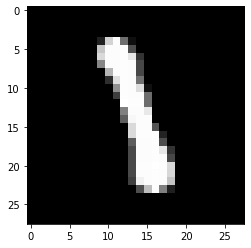

pred :  1 [9.19365008e-16 9.99929190e-01 1.76766935e-06 1.40330195e-03
 1.44939186e-10 1.31620545e-05 8.14558643e-09 5.26323762e-10
 2.17050314e-04 8.46028492e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


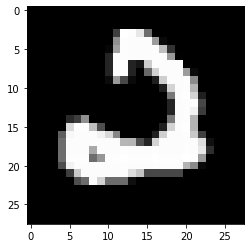

pred :  2 [4.44731631e-06 1.28431599e-09 9.99988973e-01 3.30269313e-06
 1.27857387e-14 1.10420665e-07 2.81173520e-08 5.20149407e-13
 6.89750364e-16 9.15161067e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


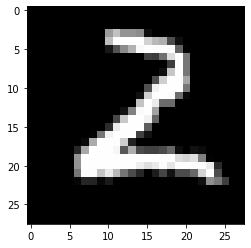

pred :  2 [4.8969626e-12 1.8330167e-07 1.0000000e+00 3.7394230e-08 4.3634597e-14
 3.8035504e-09 1.1743815e-08 6.0660243e-16 2.3898494e-09 4.9263437e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


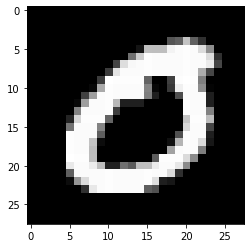

pred :  0 [1.0000000e+00 2.3184853e-07 2.9967225e-07 3.7511509e-09 1.2195979e-14
 8.5458527e-07 6.7968017e-08 4.6243116e-09 4.6069437e-12 1.2751195e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


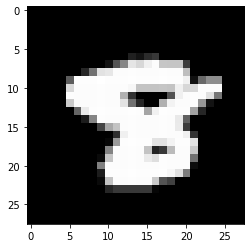

pred :  8 [3.9963350e-08 1.3593848e-14 3.0353665e-04 1.3771653e-04 2.3556184e-05
 1.8727944e-08 2.6661996e-07 2.9170513e-04 9.9973571e-01 1.9923316e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


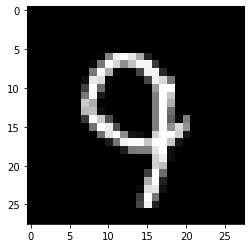

pred :  9 [3.2332704e-08 9.5861680e-14 2.1143876e-09 7.7434441e-11 9.1769878e-05
 3.9538878e-10 4.2290574e-10 1.2250680e-01 6.6197353e-10 9.9999952e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


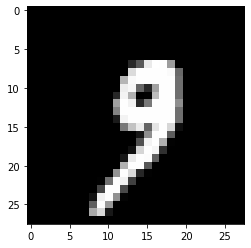

pred :  9 [1.3978181e-09 6.6232877e-09 7.0645594e-13 3.5935784e-05 9.7147586e-06
 3.8259039e-08 2.5735209e-14 7.4118511e-06 2.2752804e-08 9.9995714e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


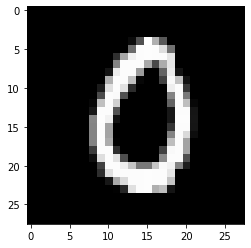

pred :  0 [9.99996543e-01 1.47481610e-10 8.04322895e-07 3.47664191e-08
 1.94220738e-13 6.50570564e-06 6.26787050e-06 1.28405455e-08
 8.50308227e-11 3.87236327e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


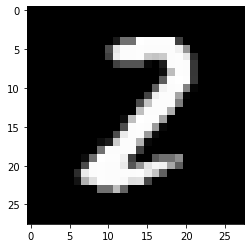

pred :  2 [2.4581784e-06 4.8393626e-06 9.9993563e-01 7.3209958e-06 8.4603243e-15
 7.0599704e-08 1.6819637e-12 8.1054930e-07 3.1407435e-06 1.5018392e-06]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


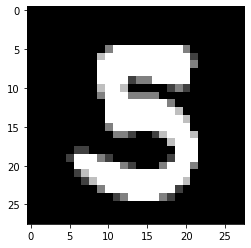

pred :  5 [1.2401355e-09 1.6499178e-10 4.7097604e-11 5.7870954e-02 3.2490031e-12
 9.1165298e-01 4.5118548e-11 1.0229464e-13 1.2123926e-05 6.6365217e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


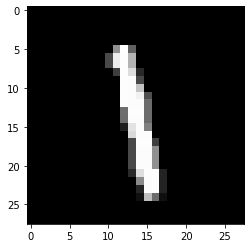

pred :  1 [2.6093614e-17 9.9999434e-01 8.5725446e-07 7.6689025e-07 1.5275583e-06
 1.0021413e-04 2.5655009e-08 1.6516378e-07 7.1325419e-05 2.5411735e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


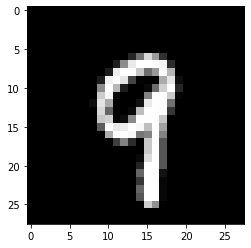

pred :  9 [2.4866667e-13 6.5558452e-09 4.1963287e-11 3.6422163e-05 5.5145133e-09
 2.8053111e-09 1.2232101e-12 4.5784333e-07 5.6387705e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


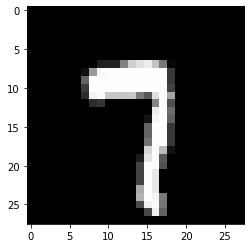

pred :  7 [8.1958418e-10 8.5430898e-11 6.2529980e-06 4.0747109e-05 2.7963932e-14
 3.1433174e-08 4.5951358e-14 9.9969345e-01 4.4460097e-10 1.3093510e-01]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


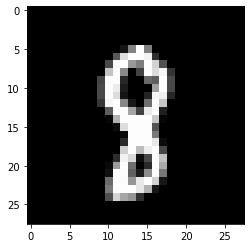

pred :  8 [3.2395562e-07 3.9612686e-07 4.0235172e-08 7.3421252e-06 2.5053220e-07
 3.0765215e-09 1.9864679e-10 1.3819554e-08 9.9999881e-01 1.1145413e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


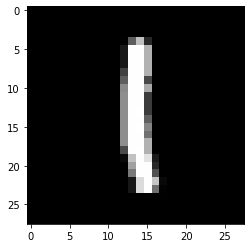

pred :  1 [1.54325359e-12 9.99997079e-01 2.89931478e-07 8.87336213e-08
 1.03939755e-07 3.25547517e-05 3.40322060e-07 2.72778607e-06
 1.23301279e-05 4.80368278e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


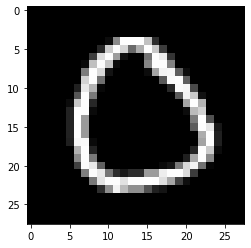

pred :  0 [9.9999893e-01 2.7929955e-06 6.9088914e-05 3.7798380e-08 6.8417688e-11
 1.7231155e-06 1.3246979e-09 7.1249976e-12 5.2676034e-11 1.2664036e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


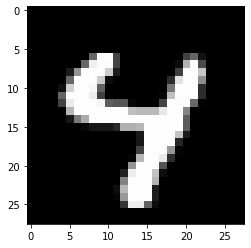

pred :  4 [5.8224812e-15 7.6504305e-18 3.7632049e-09 2.8594243e-09 9.9996495e-01
 9.1932750e-10 2.6148012e-10 7.3820949e-03 3.8081364e-06 6.8209188e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


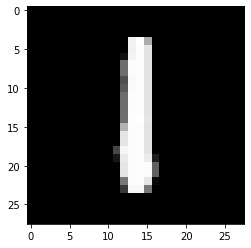

pred :  1 [1.4625738e-11 9.9999350e-01 6.5060499e-07 1.4064108e-09 5.3698539e-09
 3.7027745e-05 1.6551724e-06 6.0287698e-06 5.0056224e-05 6.0964118e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


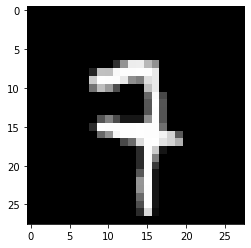

pred :  7 [5.0260341e-16 4.1984887e-08 8.6000455e-08 1.4192208e-06 7.6601605e-09
 5.3572837e-08 3.5518485e-10 9.5876831e-01 1.2108101e-12 1.3608932e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


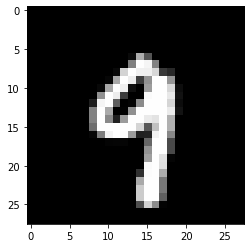

pred :  9 [6.3921199e-12 1.8539417e-10 5.7054068e-09 1.5669273e-06 5.9511667e-06
 1.1919695e-09 4.3750064e-12 7.9067206e-07 1.5085146e-07 9.9999505e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


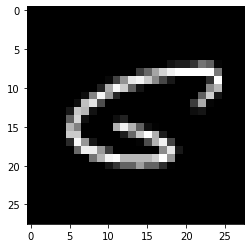

pred :  5 [4.6468649e-06 5.5200348e-14 2.4636455e-07 4.8278310e-09 2.7545560e-11
 9.8211795e-01 2.8243344e-06 1.8008324e-08 2.0704567e-05 5.7617954e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


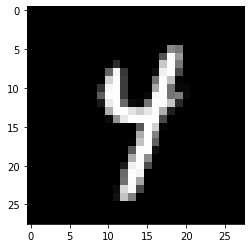

pred :  4 [1.4223675e-13 6.4283609e-04 4.2653104e-13 3.9559643e-07 9.9980092e-01
 2.3375497e-09 2.3376008e-11 5.5350327e-08 3.6086324e-06 5.4097176e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


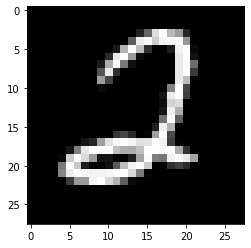

pred :  2 [7.73640295e-07 4.21315072e-09 9.99954939e-01 1.01769885e-07
 2.46231108e-11 4.20455308e-07 2.87328339e-09 4.80485790e-12
 2.02963393e-11 1.19351013e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


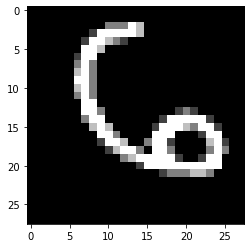

pred :  6 [2.9531268e-08 6.0004881e-09 2.2249087e-06 4.0963733e-13 6.3972156e-09
 2.1659496e-09 9.9999821e-01 1.7447990e-10 2.3923579e-09 3.6745720e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


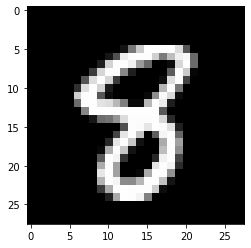

pred :  8 [2.6737199e-08 3.3837509e-11 1.8665457e-07 5.3714371e-05 4.6144058e-10
 7.1029222e-06 9.9536619e-09 4.4085402e-11 9.9999487e-01 1.3262033e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


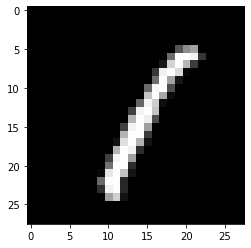

pred :  1 [3.0748230e-11 9.9999046e-01 2.8578896e-07 2.1043725e-10 6.8918180e-06
 1.1404146e-05 1.2408720e-08 3.8854009e-06 1.0761828e-06 6.8955908e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


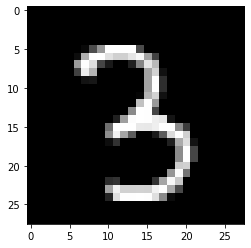

pred :  3 [8.9272932e-16 5.6991178e-10 1.4860956e-08 9.9999899e-01 7.1629023e-09
 8.2206139e-07 2.5740594e-15 1.9092503e-09 1.2227240e-06 1.8306398e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


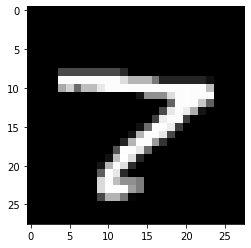

pred :  7 [3.0385991e-08 2.1744245e-11 5.0357940e-08 4.9203503e-08 1.7055646e-10
 1.1237202e-06 1.5182495e-07 9.9999869e-01 4.1328985e-09 2.1663855e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


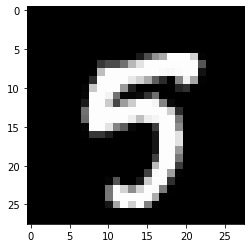

pred :  5 [8.8925949e-15 1.5406860e-12 1.8239218e-14 9.0070431e-09 1.5903844e-08
 9.9959582e-01 2.8317155e-14 4.1793690e-08 4.1877897e-07 5.1676422e-02]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


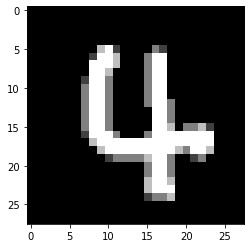

pred :  4 [8.71306227e-08 2.07056608e-10 1.78845050e-09 9.25285737e-10
 9.99999523e-01 1.81953619e-05 1.64568424e-04 6.55710697e-04
 5.09892395e-09 1.00262255e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


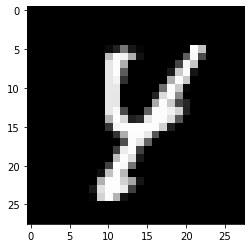

pred :  4 [2.6388275e-12 2.5772472e-08 4.5439233e-10 3.8069032e-09 9.9499619e-01
 5.9296815e-07 3.7566891e-11 5.2545965e-06 1.2389123e-03 2.4303415e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


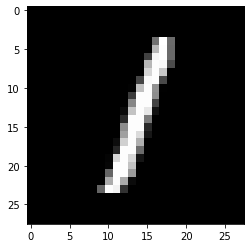

pred :  1 [1.02060644e-08 9.99998987e-01 4.30141341e-07 6.71846537e-11
 1.09542930e-06 1.25525075e-05 1.72312191e-08 4.38800214e-08
 5.59000637e-06 2.37462783e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


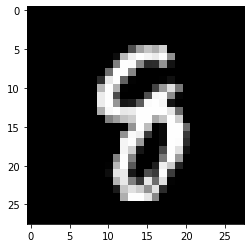

pred :  8 [2.06848694e-09 5.52306068e-09 1.05791494e-10 6.53618372e-06
 3.78990336e-07 4.29326796e-08 1.62273645e-03 4.05433724e-07
 9.99945700e-01 3.44771147e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


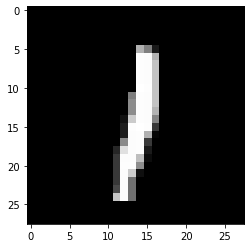

pred :  1 [9.8693942e-11 9.9999309e-01 9.9959934e-09 9.8097930e-10 4.9841506e-06
 1.7994033e-07 3.9929823e-08 2.2853699e-05 3.9872538e-07 1.1348629e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


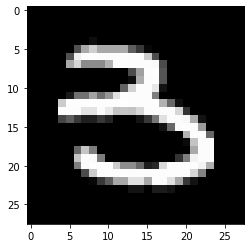

pred :  3 [1.4369296e-06 1.6776490e-07 5.6821992e-09 9.9996400e-01 2.8146943e-10
 4.3467415e-05 3.1572408e-11 5.4548299e-10 1.5470386e-04 3.3518248e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


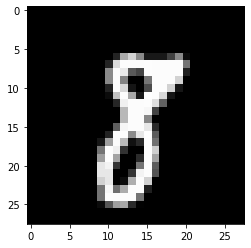

pred :  8 [5.7056297e-11 6.7124425e-08 4.4886306e-06 9.4974695e-09 2.0173771e-10
 4.1519360e-07 4.6268742e-11 4.0903565e-06 9.9999726e-01 2.7007656e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


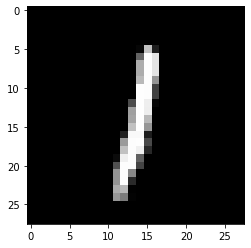

pred :  1 [1.1334892e-09 9.9999803e-01 1.2641254e-08 1.1107305e-09 6.6162706e-08
 4.8756301e-06 3.9580645e-08 2.3326650e-06 3.5448085e-07 2.3144889e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


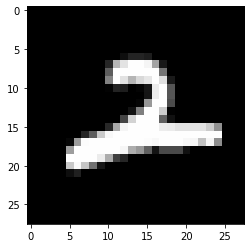

pred :  2 [1.1903700e-13 9.4051093e-11 9.9977022e-01 5.8421560e-05 2.0182750e-05
 1.0774799e-06 6.0149605e-09 1.3403239e-06 3.1994695e-11 1.0899676e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


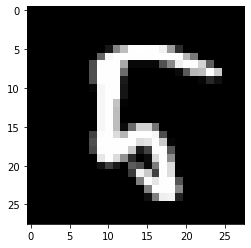

pred :  5 [9.3553713e-11 3.9741240e-12 4.3619668e-08 2.2681224e-08 2.6752323e-10
 9.9962652e-01 3.4670353e-02 6.3048239e-10 1.0246421e-04 3.0712933e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


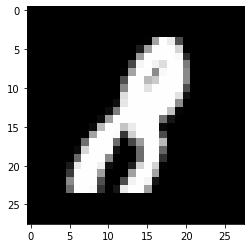

pred :  8 [1.5208125e-04 8.5279346e-04 4.1435837e-06 1.6672172e-06 4.5530522e-09
 6.4591568e-09 6.2537495e-08 6.5767197e-10 9.9967182e-01 6.7009717e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


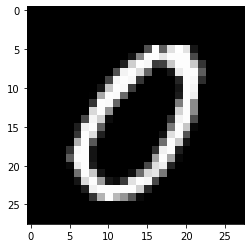

pred :  0 [9.9961078e-01 1.2788595e-06 6.6658329e-05 8.5342748e-08 1.7716308e-13
 2.4032817e-05 4.4970280e-10 3.7805592e-08 1.2290322e-10 9.6669793e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


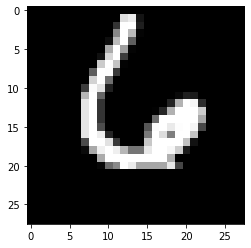

pred :  6 [8.89601921e-08 1.53309743e-11 1.80939594e-07 5.00532016e-13
 1.24507790e-06 1.36257975e-11 1.00000000e+00 5.82605342e-09
 1.56734174e-11 3.04759578e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


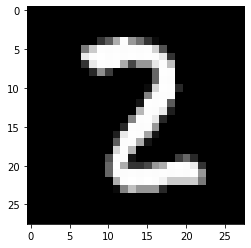

pred :  2 [4.5240636e-08 3.0387977e-07 9.9999821e-01 2.6059713e-06 4.3386955e-14
 3.0932984e-08 2.3060304e-11 4.2474664e-09 8.5007068e-09 7.0469505e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


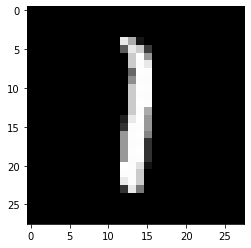

pred :  1 [5.9860103e-11 9.9999690e-01 3.8719679e-07 8.7389216e-09 6.8654757e-09
 8.9670402e-06 6.4248667e-08 2.4928599e-05 7.9262441e-07 2.3645289e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


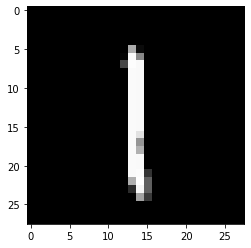

pred :  1 [2.4296377e-13 9.9999785e-01 6.8369523e-08 1.1449523e-05 2.1260077e-11
 2.1765412e-05 7.8985167e-08 2.0852283e-06 3.0524620e-06 3.1535201e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


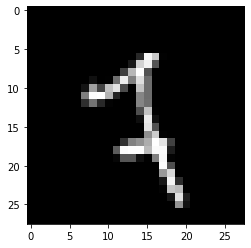

pred :  7 [6.5370085e-15 1.1328668e-05 2.0197034e-03 5.4142177e-03 1.5578509e-05
 4.3801124e-10 2.0843068e-07 2.4916381e-02 1.1318594e-02 9.5676434e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


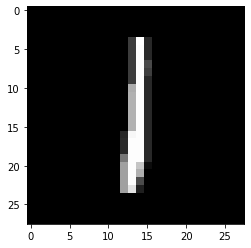

pred :  1 [2.9853849e-12 9.9999940e-01 4.7748106e-08 3.9265359e-08 2.0924654e-10
 4.7884387e-05 7.3850888e-06 1.1649091e-06 7.3880716e-07 9.7689075e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


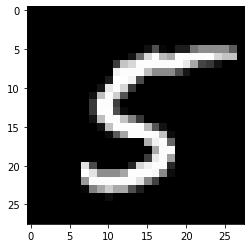

pred :  5 [5.04723149e-14 2.51075498e-08 5.83895488e-10 1.10248984e-10
 1.39656410e-15 1.00000000e+00 6.65162326e-12 1.31682046e-13
 1.46011814e-11 1.18143157e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


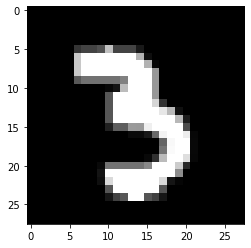

pred :  3 [8.5671825e-09 6.4171267e-08 8.3376361e-10 9.9998873e-01 8.3761255e-11
 3.0129463e-08 2.7524563e-14 7.4628153e-09 1.5858325e-07 2.6312470e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


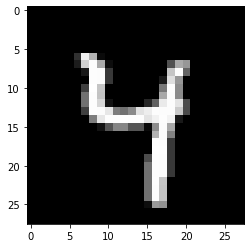

pred :  4 [2.5172722e-15 1.0159019e-13 1.2040875e-12 1.0824028e-08 9.9999940e-01
 2.5147282e-08 5.3317344e-13 8.9289085e-07 4.7430800e-07 7.0155562e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


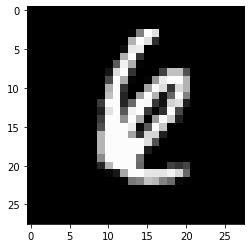

pred :  6 [5.7250154e-06 2.0405415e-07 5.8860660e-02 1.0380741e-07 3.1176209e-04
 1.4750680e-08 3.3759034e-01 5.2378449e-12 2.5847524e-02 4.7181384e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


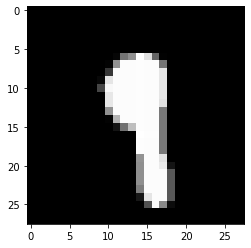

pred :  9 [1.0172316e-10 1.5094280e-03 3.2062537e-09 7.7117921e-09 1.0829335e-08
 4.7504926e-08 2.0866872e-13 4.5288706e-07 6.7966372e-05 9.9999893e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


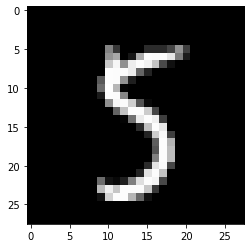

pred :  5 [1.6473534e-12 9.8492401e-06 2.9728570e-11 3.2827637e-07 1.0808843e-12
 9.9999952e-01 2.8654379e-11 4.4291473e-11 3.2175826e-08 1.0400754e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


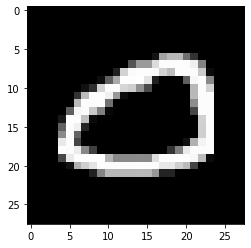

pred :  0 [9.9999940e-01 3.5461372e-09 1.0904928e-08 1.3913055e-07 1.4988927e-14
 1.1766181e-06 1.1024021e-09 6.6028292e-07 1.1981093e-14 5.1263842e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


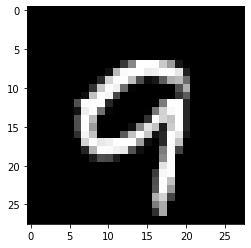

pred :  9 [5.8181499e-08 3.1616697e-15 3.5581701e-07 3.8272381e-05 2.6965745e-06
 5.0733715e-09 4.1897611e-08 1.2431681e-07 6.1814509e-10 9.9998301e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


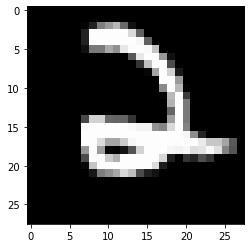

pred :  2 [2.09686513e-09 8.62692209e-12 1.00000000e+00 1.24002690e-05
 4.13773486e-12 1.21493135e-10 1.92105770e-04 1.15753025e-10
 1.28036462e-11 5.42389484e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


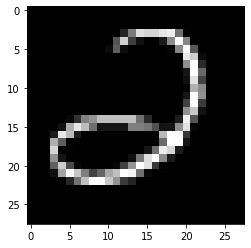

pred :  2 [2.1545755e-07 9.4047774e-09 7.8457177e-01 4.9277934e-01 1.8467738e-10
 3.9385503e-07 1.9257982e-07 9.5029863e-15 9.8396715e-16 6.5320163e-17]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


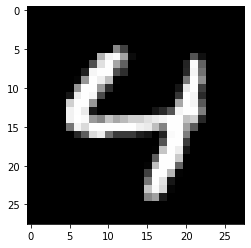

pred :  4 [1.2728352e-12 2.6848486e-13 1.4207915e-10 9.0586605e-09 9.9999678e-01
 3.7589096e-08 3.2679937e-10 2.6171404e-07 2.1253634e-07 3.5916865e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


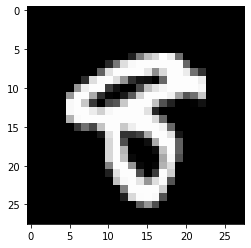

pred :  8 [2.4062103e-07 1.4093228e-11 3.5697670e-07 3.7147822e-07 1.4668972e-09
 1.6769340e-07 2.1764602e-07 5.9878460e-08 9.9997991e-01 2.2225031e-01]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


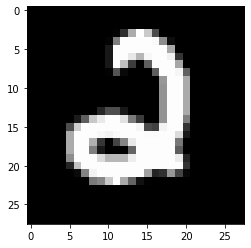

pred :  2 [5.4270619e-09 5.5256654e-12 1.0000000e+00 1.7489291e-06 4.3267812e-13
 3.3282010e-09 3.1519384e-08 2.7053126e-13 8.2739238e-09 6.2663070e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


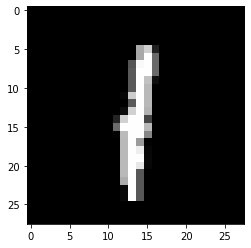

pred :  1 [1.05603998e-10 9.99988675e-01 1.49305568e-09 9.20923249e-09
 1.06707332e-09 3.01722775e-06 1.08544455e-05 3.04400921e-04
 8.74423279e-07 6.28525925e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


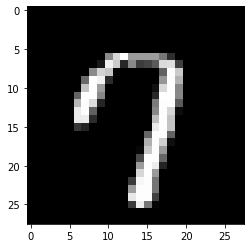

pred :  7 [1.2226854e-08 1.3580988e-11 5.7257523e-08 2.3998230e-11 3.3474898e-06
 3.9124138e-12 3.8304637e-10 9.9906600e-01 4.8007379e-11 3.2493055e-02]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


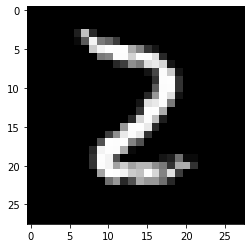

pred :  2 [1.8093251e-09 4.6196655e-09 1.0000000e+00 2.6185583e-07 1.7010695e-16
 1.9849351e-09 1.6261487e-10 5.8116726e-08 1.4054575e-07 8.4710672e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


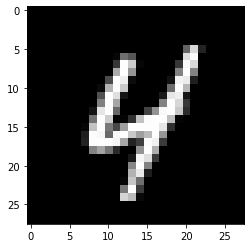

pred :  4 [1.0208074e-11 1.3222562e-10 1.2558571e-06 4.4336335e-08 9.9996704e-01
 8.6226919e-07 9.9401676e-10 3.1053767e-11 3.1791961e-10 4.1996922e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


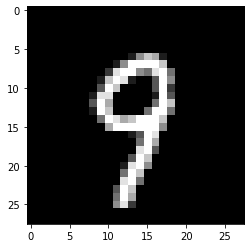

pred :  9 [6.9087585e-13 8.6635338e-11 5.1537733e-14 2.8197442e-07 2.1648955e-06
 1.5219353e-08 5.9273142e-12 1.9094348e-04 1.4863806e-06 9.9999094e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


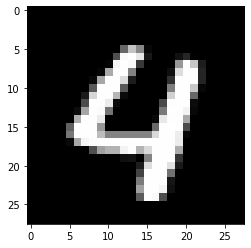

pred :  4 [7.4896200e-10 9.1067417e-15 1.0439270e-08 1.0944743e-09 9.9999380e-01
 3.2082923e-08 1.2736142e-09 8.0150085e-06 1.4142797e-08 5.2459836e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


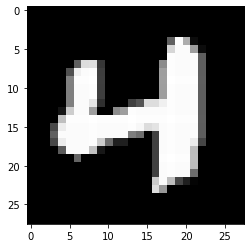

pred :  4 [6.4576844e-11 1.3851133e-13 3.5955338e-06 1.3977682e-08 9.9998623e-01
 4.0491668e-09 2.6683017e-10 1.0559988e-06 2.9264717e-07 3.6272002e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


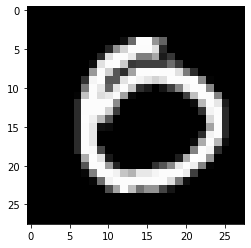

pred :  0 [9.9999946e-01 2.6743779e-08 1.7380125e-07 2.4489322e-07 2.8580282e-13
 2.9750416e-05 1.9348479e-07 1.0089411e-08 1.6252741e-10 4.4303341e-13]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


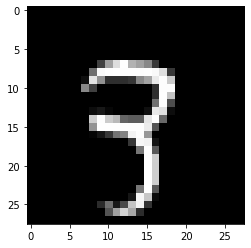

pred :  3 [7.2922056e-13 1.5598644e-08 1.9548335e-08 7.8914011e-01 8.8400440e-13
 1.2260290e-07 1.5321882e-15 3.0321777e-03 2.6710717e-10 3.4710765e-03]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


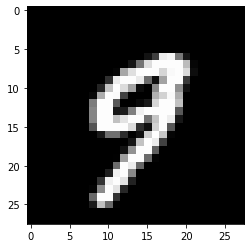

pred :  9 [4.8849053e-10 1.4828458e-11 2.3149765e-11 1.1377134e-08 4.0408733e-05
 1.8475606e-07 3.6957780e-13 1.8107563e-05 4.7398128e-08 9.9999958e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


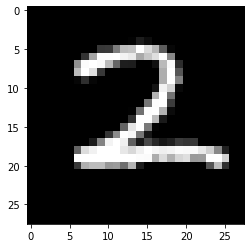

pred :  2 [3.42243086e-14 6.90535387e-07 9.99987900e-01 1.12365740e-07
 1.02217016e-13 3.06834818e-06 9.24209320e-11 2.44811140e-08
 1.96788474e-09 9.32589561e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


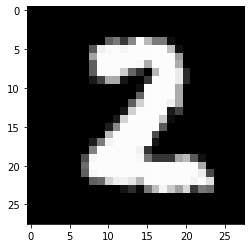

pred :  2 [5.0720797e-07 1.5282060e-07 9.9999958e-01 2.0556956e-06 5.6691538e-13
 2.2192779e-08 6.4038018e-11 5.0733395e-10 1.7180591e-07 8.0490059e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


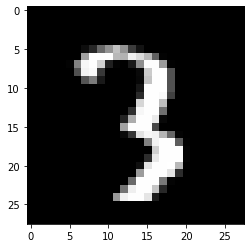

pred :  3 [3.96076956e-11 1.42620365e-05 5.06215625e-10 9.99990344e-01
 2.31477892e-10 2.48935650e-10 2.17210234e-12 8.12286544e-07
 6.96105303e-07 2.19788035e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


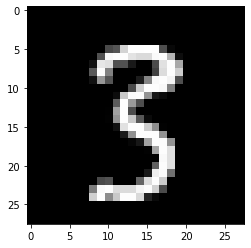

pred :  3 [5.6282561e-09 2.3738671e-09 2.6663480e-10 9.9999976e-01 5.0864465e-11
 3.7103493e-07 7.4394247e-16 1.3809094e-08 1.9230269e-05 1.4571213e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


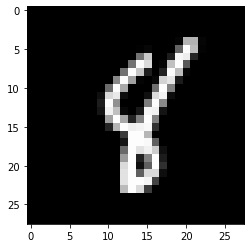

pred :  8 [3.4037977e-15 3.8405389e-02 1.5407463e-10 4.6033033e-10 3.6385655e-04
 3.5251999e-06 7.0986493e-06 9.1680112e-09 9.9998254e-01 1.1083630e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


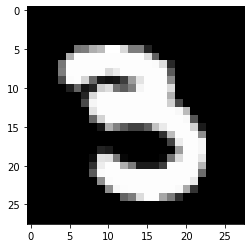

pred :  3 [8.8514173e-07 3.8009446e-10 3.8306336e-09 9.9355793e-01 1.3378942e-09
 1.3385296e-02 2.3607218e-14 1.5152139e-10 2.8451316e-06 3.4174323e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


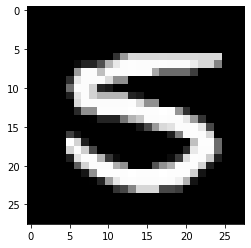

pred :  5 [3.0006589e-10 6.1886113e-10 3.2129664e-11 6.8649165e-06 9.1721910e-13
 9.9997252e-01 3.0512890e-08 5.5537476e-13 4.9753935e-06 1.3037109e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


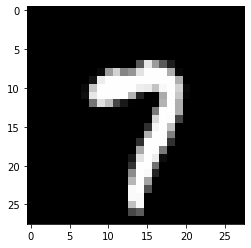

pred :  7 [8.4666539e-07 2.9082813e-11 1.1566531e-06 1.1493146e-06 1.6994491e-11
 5.2135229e-09 3.7038666e-12 9.9999952e-01 3.4842507e-11 6.0016504e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


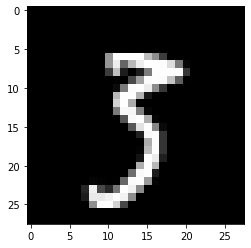

pred :  3 [1.4155972e-11 1.0806247e-08 5.7441391e-12 9.1040391e-01 5.2433474e-14
 5.4171383e-03 9.8985475e-17 1.8158455e-09 2.4067278e-06 4.8289389e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


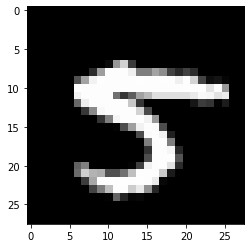

pred :  5 [1.5442083e-11 4.6492643e-11 2.3696916e-09 9.0299829e-05 3.9624616e-15
 9.9996996e-01 9.6781455e-16 2.6767037e-07 4.7616233e-08 6.0228766e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


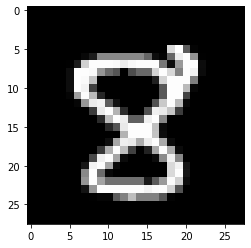

pred :  8 [5.0577480e-09 2.2327529e-09 1.0297596e-03 1.3859408e-05 1.4114225e-09
 1.6445219e-08 1.9721496e-09 1.5354320e-08 9.9999619e-01 9.2400981e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


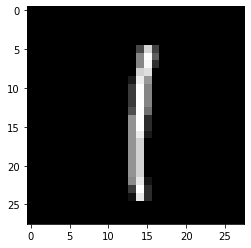

pred :  1 [1.99928333e-12 9.99998212e-01 3.21034588e-10 4.74187482e-06
 2.60719291e-09 5.70157795e-07 4.67880596e-08 9.66816174e-07
 1.34138668e-06 1.10635064e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


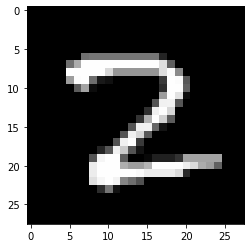

pred :  2 [2.9330769e-07 2.9944058e-05 1.0000000e+00 3.4010645e-06 3.8442246e-17
 1.0670632e-09 3.3789267e-11 1.0467941e-08 1.2209893e-11 1.3202615e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


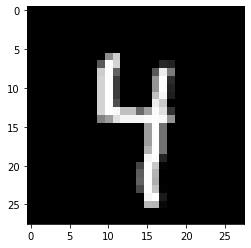

pred :  4 [1.2110121e-14 9.6565373e-08 7.2162346e-12 2.8671969e-12 9.9999952e-01
 1.2742887e-05 5.7768044e-12 3.9685719e-06 9.1525010e-08 1.8230345e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


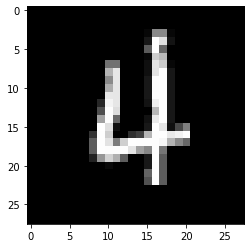

pred :  4 [1.7438188e-05 2.5206491e-08 1.3314188e-03 2.3501263e-08 1.0000000e+00
 1.5320482e-05 6.8929154e-08 1.3522380e-07 2.1781896e-11 1.9452626e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


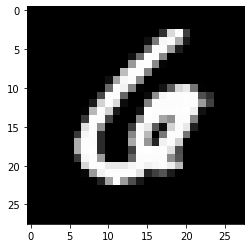

pred :  6 [1.2102866e-07 2.7454883e-10 7.3143136e-05 2.5230435e-07 2.7501951e-06
 1.3360390e-11 9.9999923e-01 2.2816677e-07 2.0925613e-06 4.2816373e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


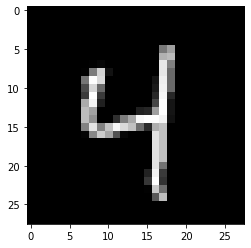

pred :  4 [9.1353774e-15 8.5866786e-10 3.4432068e-10 3.9951004e-08 9.9999923e-01
 2.6661792e-07 2.8026700e-12 8.7238627e-10 3.3842495e-10 3.1654265e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


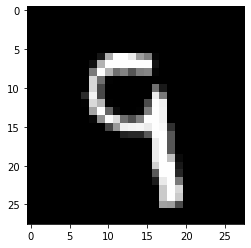

pred :  9 [2.6439737e-14 1.8163755e-09 3.2950982e-08 3.0933441e-07 1.8502794e-07
 9.4919823e-09 4.5951163e-11 6.1578010e-07 1.0420809e-04 9.9999779e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


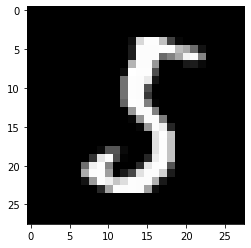

pred :  5 [1.5372335e-09 5.7621002e-03 2.1057567e-11 2.1632910e-03 4.7156880e-13
 9.9369097e-01 2.0454844e-07 9.2632214e-14 8.7221833e-06 1.3393196e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


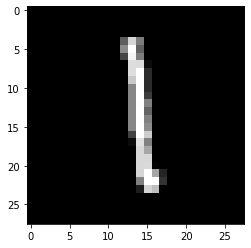

pred :  1 [1.5138647e-14 9.9999750e-01 2.5322879e-07 1.2426372e-07 4.6404253e-10
 3.1549580e-06 3.6470702e-08 8.8129741e-07 1.3886821e-05 6.1157017e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


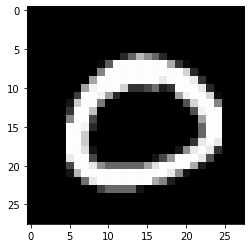

pred :  0 [1.0000000e+00 1.8935914e-08 4.1449830e-06 1.3692781e-07 1.0205678e-15
 6.2699240e-07 1.2679522e-09 3.6111935e-08 4.8186493e-13 1.0463829e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


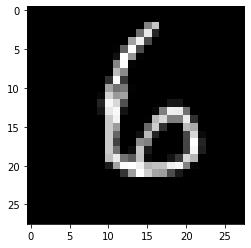

pred :  6 [6.6714698e-12 1.3263318e-06 7.6233571e-09 3.2675465e-09 8.5528609e-06
 3.5735770e-06 9.9996400e-01 1.2803060e-11 7.5925280e-11 7.0865547e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


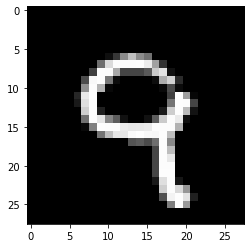

pred :  9 [7.2549111e-14 5.6072430e-17 1.8241083e-06 3.0784250e-08 1.3158390e-05
 1.8198051e-09 8.7576058e-10 1.6709634e-09 1.2914237e-05 9.9999928e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


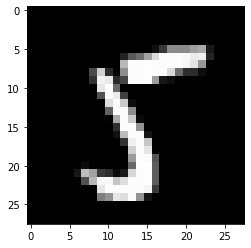

pred :  5 [8.4423154e-12 2.2653815e-06 2.7184482e-11 8.9512460e-09 3.1277450e-15
 1.0000000e+00 3.0841842e-12 1.0753497e-10 1.3152976e-06 2.8900748e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


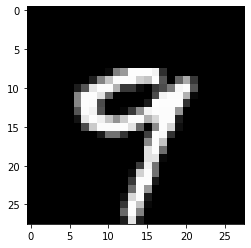

pred :  9 [6.2406417e-12 1.7666737e-17 3.2331685e-10 3.4318919e-07 1.1662280e-05
 1.4769534e-09 7.3604816e-13 3.4795278e-06 1.5119792e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


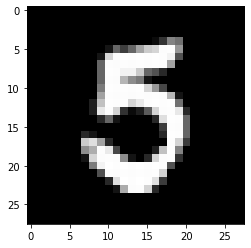

pred :  5 [1.1643037e-06 2.1594795e-07 2.3364788e-10 5.9251481e-05 8.2063414e-13
 9.9997950e-01 6.9421917e-09 2.4897057e-08 3.3174649e-07 8.7946653e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


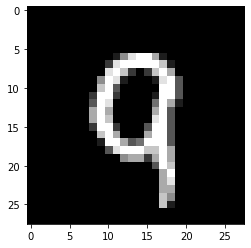

pred :  9 [4.01795887e-07 7.08718639e-11 1.21259793e-04 7.29667923e-11
 3.45863045e-05 1.38530964e-08 8.89946797e-11 6.60704318e-05
 1.32579501e-07 9.99999285e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


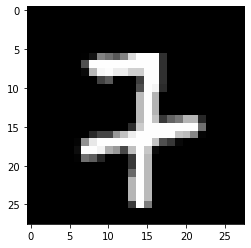

pred :  7 [6.8149848e-13 3.4179673e-11 8.5749650e-07 9.5189972e-07 1.7092299e-08
 4.7753932e-08 1.0707615e-09 9.9999583e-01 1.6576658e-09 1.8064123e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


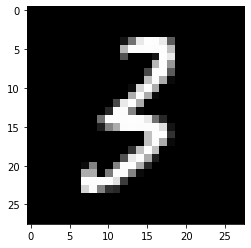

pred :  3 [9.9058877e-07 1.9572884e-08 1.5161985e-06 9.9997628e-01 2.1460619e-06
 1.0557771e-03 5.5930777e-10 1.0036791e-10 1.0397876e-08 5.6939564e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


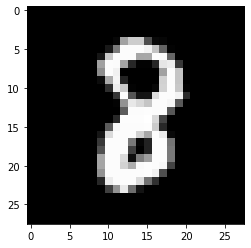

pred :  8 [1.2565729e-07 5.6435641e-07 7.1194768e-04 1.7079509e-06 6.9375915e-11
 4.0887204e-07 1.2739022e-07 2.6262336e-07 9.9953479e-01 3.2648583e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


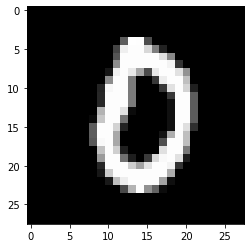

pred :  0 [9.9999928e-01 1.7388447e-11 8.9668611e-06 3.1216427e-07 1.4706952e-10
 3.7200149e-07 2.6399064e-07 2.3238810e-08 1.1313234e-08 6.5614778e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


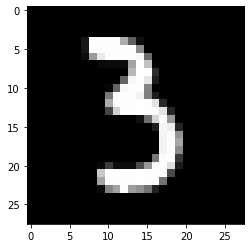

pred :  3 [8.1305532e-11 4.3472575e-08 1.9787141e-08 1.0000000e+00 8.2747517e-11
 3.1504510e-06 1.7380290e-11 1.0935264e-10 1.7589106e-09 9.2187668e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


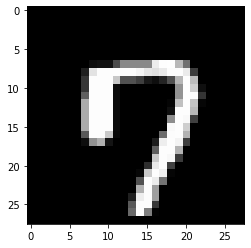

pred :  7 [6.3295666e-08 2.5101669e-15 2.6935797e-12 8.5181658e-14 3.4345670e-05
 4.3835789e-07 5.4529184e-13 9.9998236e-01 2.8226874e-11 3.3909649e-02]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


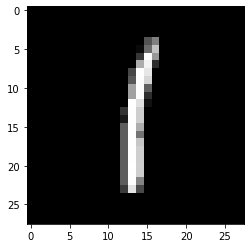

pred :  1 [3.6391501e-11 9.9999923e-01 2.2058357e-09 6.5178369e-07 1.7679912e-10
 4.5798024e-06 1.5017067e-05 1.0754718e-06 2.5003751e-06 4.2891815e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


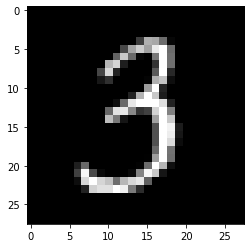

pred :  3 [1.54801185e-08 1.48127697e-07 1.96896531e-06 9.99761581e-01
 1.08648635e-07 2.26183133e-07 1.64512171e-11 4.12541067e-06
 1.30701661e-09 1.29699757e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


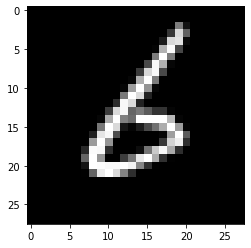

pred :  6 [6.5900458e-09 1.0616616e-08 9.7744902e-05 8.6083620e-09 3.7571982e-07
 1.7376564e-05 9.9994171e-01 7.6060772e-12 1.0554868e-09 7.9196429e-14]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


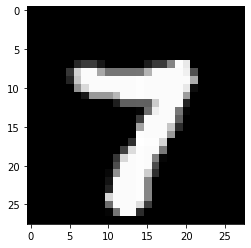

pred :  7 [1.2529865e-09 8.8149399e-13 6.6734235e-10 3.9605112e-08 3.5842117e-12
 1.1246318e-09 5.0345643e-12 9.9999970e-01 2.5016679e-08 2.3578132e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


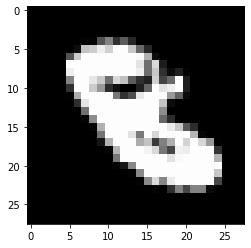

pred :  8 [7.4759930e-13 1.5086814e-11 1.9279122e-04 3.4508109e-04 1.1668226e-06
 9.3614683e-05 1.4345970e-07 2.8518871e-12 9.8801392e-01 3.0258396e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


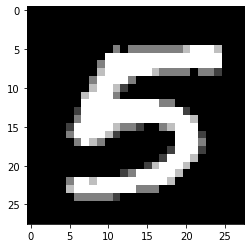

pred :  5 [1.8699557e-09 1.8089540e-11 4.5267712e-13 8.3970775e-08 1.6324999e-11
 9.9999946e-01 1.7197327e-09 3.0474372e-09 2.1641366e-09 2.4549559e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


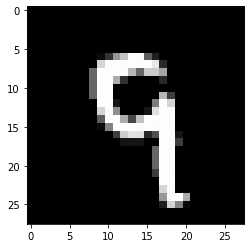

pred :  9 [4.6762758e-14 1.3608604e-11 3.0033056e-09 5.6564312e-07 2.4278975e-08
 9.3802532e-07 2.9707300e-12 2.1081530e-06 1.6532067e-06 9.9999970e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


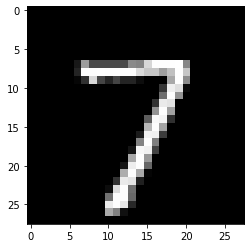

pred :  7 [1.6372794e-12 1.4087753e-10 1.0604245e-09 9.9096007e-07 1.2718414e-14
 3.7493680e-10 3.7589269e-14 1.0000000e+00 1.0554369e-12 5.2259128e-11]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


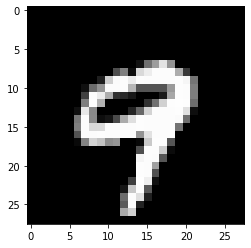

pred :  9 [2.0790923e-12 1.5128053e-18 6.1367723e-07 2.2103002e-05 2.4490059e-06
 2.9327119e-08 3.0511042e-11 1.3171227e-06 7.7273515e-10 9.9999976e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


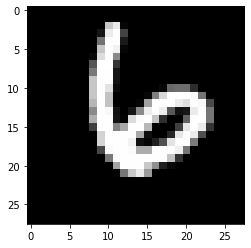

pred :  6 [5.3536825e-10 2.0279533e-12 7.2052676e-06 7.1895996e-11 2.0710470e-07
 4.1889098e-10 1.0000000e+00 7.4980244e-10 6.2658887e-09 5.6477961e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


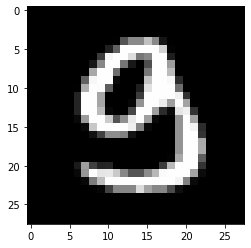

pred :  9 [9.7377290e-07 5.5106203e-10 1.4012530e-10 7.7468157e-04 3.7058562e-10
 2.3316741e-03 4.6418811e-12 4.3148868e-14 1.9483268e-03 9.5663464e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


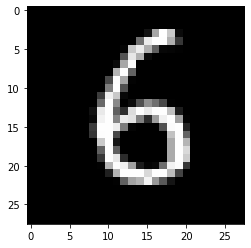

pred :  6 [2.0330260e-09 1.3061600e-08 8.3452491e-08 2.0280677e-10 8.3275437e-10
 4.8777461e-04 9.9997580e-01 4.0761638e-13 4.5850641e-08 1.4775270e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


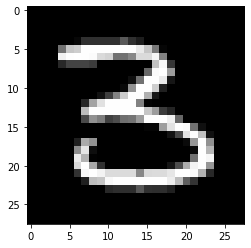

pred :  3 [9.3278296e-10 9.8979365e-07 2.0790281e-09 1.0000000e+00 4.0343984e-08
 1.6659416e-09 8.4910891e-11 2.2600394e-11 8.9341256e-08 6.7073192e-13]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


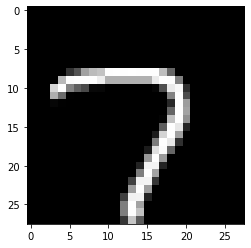

pred :  7 [2.4556407e-08 4.9076379e-13 5.8925963e-08 1.6020572e-08 1.1896470e-15
 8.0418547e-11 1.0464741e-13 9.9999988e-01 5.2324273e-18 1.8803611e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


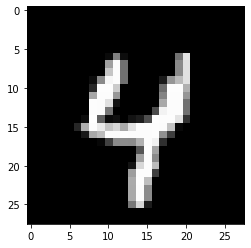

pred :  4 [1.3872191e-15 3.6803232e-13 2.7802514e-07 5.4650727e-08 1.0000000e+00
 5.2908515e-08 2.2525511e-11 6.1274212e-09 7.1657720e-09 1.1726693e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


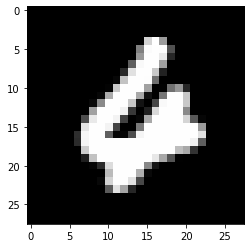

pred :  6 [2.5836493e-05 2.1984862e-12 1.4959872e-03 4.1414169e-05 1.9797397e-01
 3.7793480e-08 9.8352855e-01 2.7850069e-07 1.5638220e-10 3.0195377e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


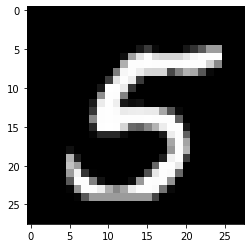

pred :  5 [3.9390136e-14 5.5515663e-09 1.8888322e-13 6.9047112e-10 2.7484367e-11
 1.0000000e+00 1.9451149e-12 7.7958716e-12 1.6417559e-10 9.1457005e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


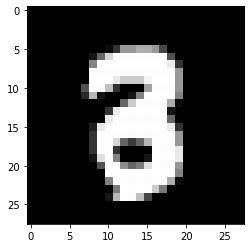

pred :  3 [8.2685925e-05 3.4425010e-08 3.2344460e-03 9.8684859e-01 7.3747516e-15
 4.5770864e-08 6.5508016e-11 1.2277789e-06 2.3671091e-03 3.7620924e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


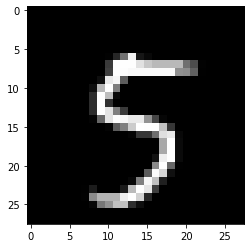

pred :  5 [3.5154730e-14 1.4990501e-10 1.7112497e-15 6.9023974e-07 1.0913983e-11
 9.9999923e-01 6.6169448e-14 2.4459774e-07 4.3111625e-09 3.3940109e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


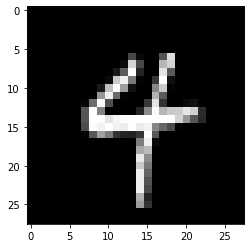

pred :  4 [8.3104214e-18 2.7840133e-11 1.0124839e-09 1.0931814e-06 9.9999809e-01
 8.7678514e-10 3.0606062e-10 2.1488646e-07 2.4816589e-09 1.2998494e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


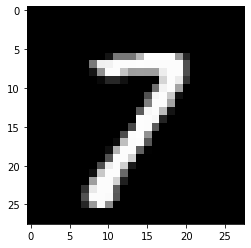

pred :  7 [2.6492378e-11 3.2323194e-07 4.6560426e-06 5.4678020e-07 1.1305461e-13
 7.4633846e-09 1.4707281e-15 9.9999106e-01 2.2200208e-10 3.9702925e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


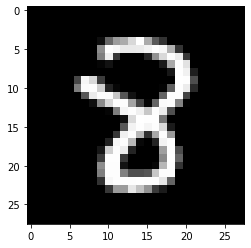

pred :  8 [3.3170724e-09 9.9134277e-11 2.1014810e-03 1.8560886e-04 9.2957812e-08
 9.7937016e-07 1.6318983e-08 2.5981479e-13 9.9998844e-01 3.9494712e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


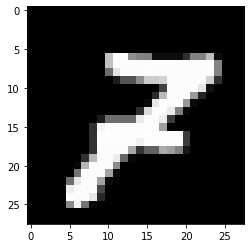

pred :  7 [3.7524944e-10 3.4556480e-10 1.0206459e-07 3.7693977e-04 1.3720734e-10
 6.4527659e-09 2.2166325e-13 9.9998987e-01 1.8859655e-02 4.5531173e-11]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


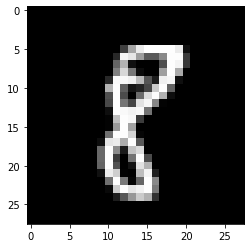

pred :  8 [1.23113750e-05 8.41280780e-07 1.00409285e-04 1.62221824e-07
 4.21296775e-08 1.31907796e-09 1.27123053e-06 6.51952178e-07
 9.99998093e-01 3.61337582e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


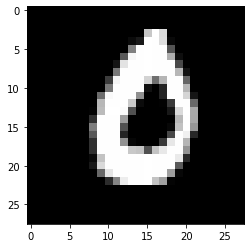

pred :  0 [9.9995887e-01 1.5982922e-10 2.1501255e-05 2.3663044e-04 2.1396747e-09
 1.8137479e-07 7.3624491e-05 4.3938242e-11 5.8884279e-08 2.0189177e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


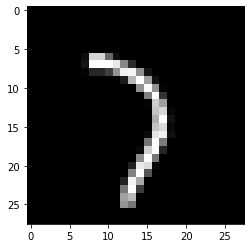

pred :  7 [1.2858859e-11 2.9312019e-08 5.8016638e-05 8.2075946e-09 3.9235246e-09
 4.6091304e-09 1.7432746e-11 9.9999869e-01 1.0671038e-09 1.6858278e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


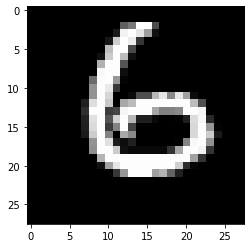

pred :  6 [9.05511499e-10 5.91520999e-11 7.03818978e-06 2.62758981e-10
 4.94106839e-12 1.48683785e-05 1.00000000e+00 1.02267966e-12
 3.53967877e-08 1.78681063e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


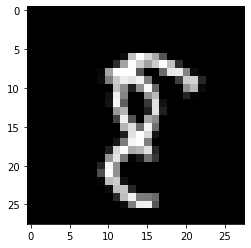

pred :  8 [1.5937686e-10 6.2843297e-10 8.3450668e-06 3.7026453e-08 5.3337057e-10
 3.4425420e-07 5.9353189e-10 4.8617721e-03 9.9999690e-01 8.9338720e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


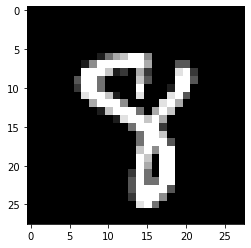

pred :  8 [1.1114398e-14 9.6906790e-14 2.5500321e-07 5.8120695e-05 4.3172336e-06
 3.2640347e-08 1.6242607e-10 1.6613241e-06 9.9790436e-01 1.3734400e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


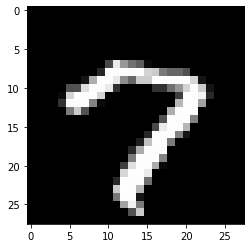

pred :  7 [1.46687626e-07 1.57846813e-16 1.49846077e-04 1.24387844e-09
 4.47159061e-14 1.06262743e-09 3.37341266e-12 9.99677539e-01
 4.32152758e-09 1.13636255e-02]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


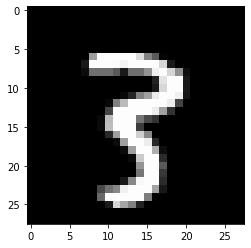

pred :  3 [7.1253203e-13 4.3569634e-07 2.7966562e-09 9.9994880e-01 3.2111650e-11
 2.0035007e-07 6.0099194e-15 4.9779487e-09 1.4307133e-08 1.3296165e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


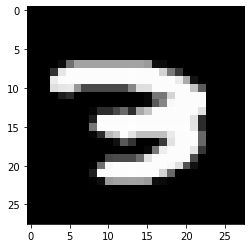

pred :  7 [1.0139285e-07 8.7925986e-11 5.2117109e-03 1.0928184e-02 5.7158002e-12
 4.2973559e-12 1.9583517e-09 3.8156480e-02 3.3585886e-12 7.8696012e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


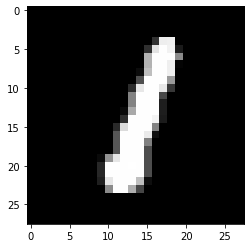

pred :  1 [6.2666059e-09 9.9996793e-01 1.3029575e-04 2.0671105e-09 1.6335862e-08
 4.8280202e-07 8.5986147e-07 6.6262601e-08 2.8464628e-05 8.6665952e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


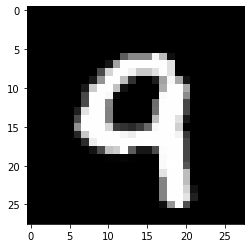

pred :  9 [2.0473618e-09 2.2735655e-13 3.1033374e-05 9.3171124e-09 9.3448507e-05
 9.4719255e-09 3.7908396e-09 8.6505967e-09 1.8270191e-08 9.9999976e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


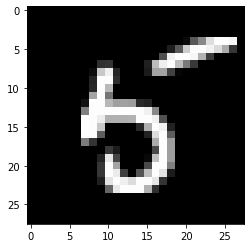

pred :  5 [4.4733783e-12 1.6966769e-07 7.0666482e-13 1.2791922e-12 1.3720274e-02
 9.9998301e-01 2.4398966e-07 2.4763039e-11 8.9754195e-09 3.7126850e-13]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


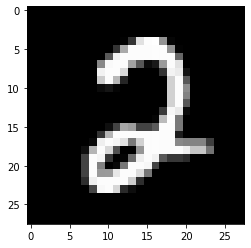

pred :  2 [5.1391163e-07 5.0199084e-10 1.0000000e+00 1.6176770e-08 8.7169711e-15
 1.6466161e-07 3.4804039e-08 3.5808210e-07 7.7441499e-08 2.1852744e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


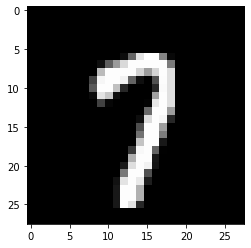

pred :  7 [4.0910467e-10 1.9558106e-08 4.2119416e-07 6.2972919e-07 4.0844541e-12
 1.1487529e-09 4.6511666e-13 9.9997866e-01 2.4300017e-11 9.3518447e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


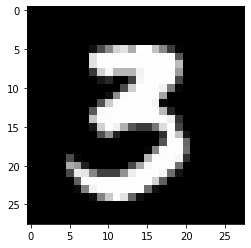

pred :  3 [3.4868890e-08 2.1328628e-08 8.7561904e-09 9.9999702e-01 9.7589894e-11
 3.1925556e-08 8.1363343e-16 2.4450325e-11 1.2192510e-07 4.1092585e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


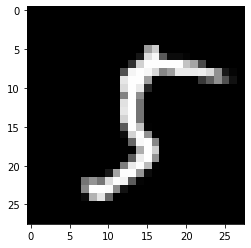

pred :  5 [1.28589075e-11 8.32455953e-06 2.66259098e-11 5.43373488e-08
 4.81581700e-14 1.00000000e+00 1.92501749e-13 1.86140556e-12
 6.20904856e-08 5.01058643e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


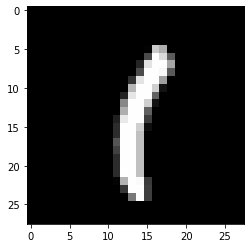

pred :  1 [8.8042293e-07 9.9997807e-01 2.8682062e-10 7.6001612e-08 3.9357005e-07
 8.7552473e-07 9.6143822e-07 1.4787912e-04 1.5925420e-05 9.2151184e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


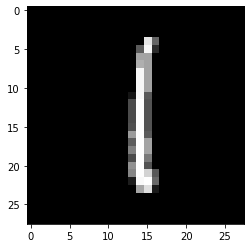

pred :  1 [1.5641747e-13 1.0000000e+00 8.3660110e-09 2.1406217e-07 1.8555904e-10
 5.1348252e-05 7.5585444e-07 7.5916677e-07 3.1218036e-07 1.4486953e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


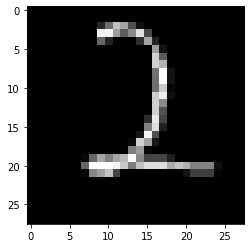

pred :  2 [1.1300181e-09 6.5205353e-01 9.9999833e-01 1.0478929e-06 5.3319326e-15
 7.6759959e-10 1.6877002e-06 2.0325733e-12 4.0508599e-16 4.1307679e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


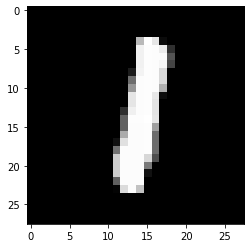

pred :  1 [5.4009803e-08 9.9997890e-01 6.5784266e-06 6.7704455e-08 6.8355831e-08
 8.0919342e-08 3.8432617e-07 1.5458935e-06 1.1175946e-05 2.5908170e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


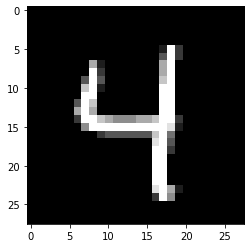

pred :  4 [1.8634782e-14 7.6282806e-11 3.9533559e-12 2.3899464e-08 1.0000000e+00
 1.5055562e-06 1.7262691e-13 1.4056035e-09 3.9383358e-11 1.8249277e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


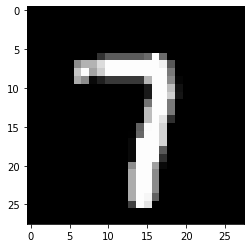

pred :  7 [1.2087629e-09 5.3716082e-08 9.8890432e-06 4.7657572e-08 4.5146846e-12
 1.4589343e-12 2.0382997e-12 9.9999976e-01 1.5767899e-11 6.0385108e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


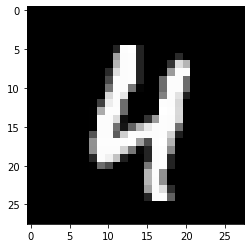

pred :  4 [2.4387519e-09 9.9575063e-11 2.2564633e-08 1.7484389e-06 9.9999845e-01
 5.2241347e-07 1.2585776e-08 1.5773782e-07 4.1166444e-09 3.8717667e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


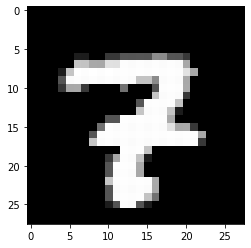

pred :  7 [4.6675233e-11 8.6112064e-12 8.6387299e-06 2.8132911e-06 2.0804778e-11
 4.8329607e-10 3.7811716e-12 9.9991661e-01 1.1706958e-08 2.8293687e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


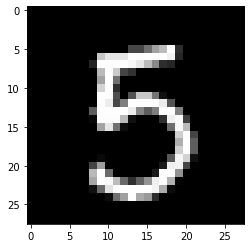

pred :  5 [6.7258021e-10 2.8628228e-10 4.4190107e-12 7.9029132e-07 1.3108651e-11
 9.9999917e-01 2.5937487e-11 1.8396555e-09 8.0981062e-09 8.7492293e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


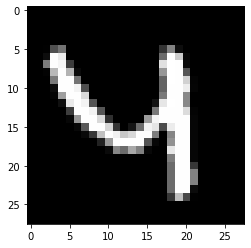

pred :  4 [1.2547161e-12 6.8806139e-10 3.0306158e-09 2.3235131e-08 9.9996758e-01
 1.0589743e-11 8.4617255e-08 1.4448356e-09 4.8967109e-08 1.6680360e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


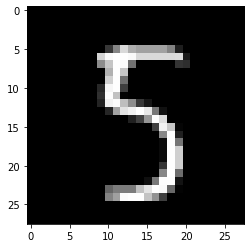

pred :  5 [8.5460632e-13 5.0085278e-06 5.4135828e-12 4.2393831e-06 1.3465480e-08
 1.0000000e+00 1.4788689e-11 2.3566518e-09 9.5342137e-11 5.3159379e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


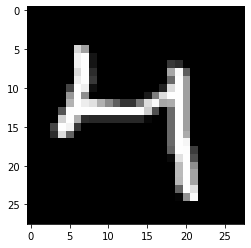

pred :  4 [3.0670108e-10 4.6005058e-09 1.5364434e-11 2.1215077e-05 9.9942714e-01
 3.7736577e-08 1.2532835e-08 2.3861974e-02 1.9520438e-07 8.3536781e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


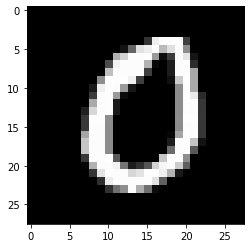

pred :  0 [9.9999946e-01 3.8584105e-09 1.5973399e-08 6.8277615e-09 4.3423571e-13
 1.0473413e-08 1.4775256e-05 2.8504668e-09 1.4547364e-11 5.7095029e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


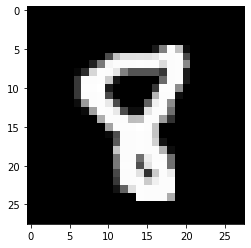

pred :  8 [8.6969315e-10 2.2765793e-11 1.7956226e-06 1.1948234e-06 1.7069933e-10
 1.3395240e-08 3.3304159e-06 7.9790411e-08 9.9999964e-01 2.4002744e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


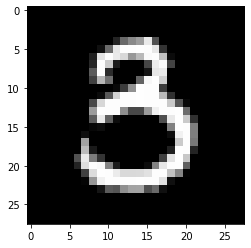

pred :  3 [8.4727202e-07 6.5340394e-08 3.5667451e-09 9.9997437e-01 3.0200399e-12
 4.4321541e-06 1.7834480e-11 1.9695070e-09 1.9682247e-07 3.9313093e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


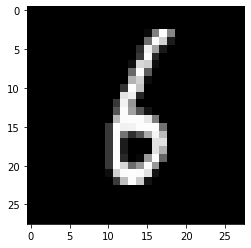

pred :  6 [2.03762146e-10 2.09486661e-05 1.07232204e-07 1.73401427e-09
 1.08011045e-10 4.81238961e-03 9.99974489e-01 5.09993469e-13
 1.84834003e-04 1.16364318e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


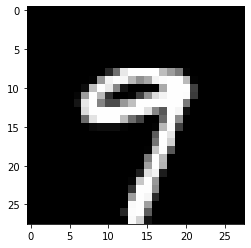

pred :  9 [1.7338125e-09 1.8046074e-16 6.8410020e-14 3.0686803e-07 5.0686126e-09
 3.2812362e-09 2.8766171e-13 9.8606944e-04 1.0940583e-10 9.9999952e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


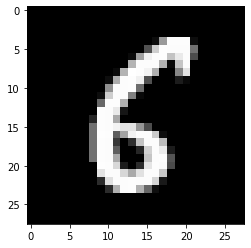

pred :  6 [2.8231159e-05 2.6582782e-07 2.2791581e-05 2.7558277e-11 5.0428987e-15
 9.4890594e-04 9.9999499e-01 5.9862376e-15 9.6618351e-06 5.4087014e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


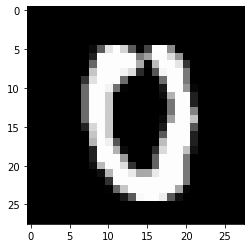

pred :  0 [9.9998665e-01 4.8276325e-15 7.7174584e-05 4.2923260e-12 5.3438426e-12
 1.6354297e-05 1.3277955e-07 5.4561260e-06 2.9278296e-10 2.1955311e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


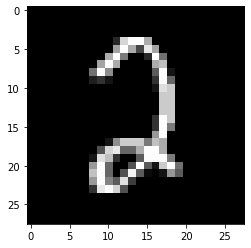

pred :  2 [1.8397575e-05 9.3514023e-09 9.9999845e-01 1.2481659e-09 7.5664410e-13
 1.2224937e-05 3.4770777e-09 2.2356048e-08 4.0647050e-09 3.6586829e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


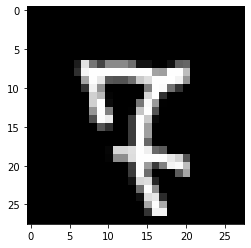

pred :  7 [3.5566126e-11 6.9981848e-10 4.3760123e-10 3.8746276e-07 1.4400703e-13
 6.3941661e-07 9.5246628e-09 8.9864576e-01 6.3537014e-01 5.4834285e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


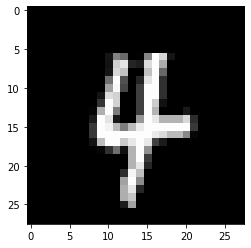

pred :  4 [6.2171331e-11 1.6980268e-11 1.4263954e-07 3.1856016e-09 9.9996579e-01
 3.2503345e-07 3.2308031e-07 3.3807755e-04 5.3671862e-11 5.9385861e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


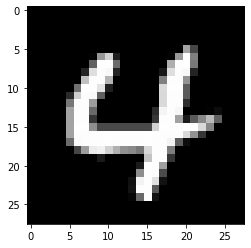

pred :  4 [2.7755118e-09 8.5621749e-15 1.3193881e-08 4.7116944e-10 9.9999982e-01
 1.4843223e-08 1.1684806e-08 9.3071758e-05 1.3858051e-10 2.2654310e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


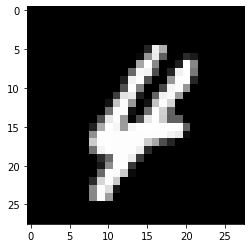

pred :  4 [1.0867460e-06 2.1895623e-10 3.1298101e-03 2.9617135e-11 9.9917150e-01
 1.9506612e-07 9.0903044e-04 2.7816145e-07 2.1294911e-06 4.9621585e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


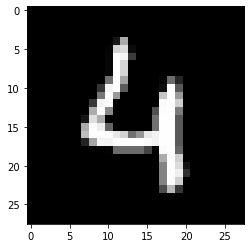

pred :  4 [6.4604722e-10 8.9368308e-09 1.8505918e-07 1.0300920e-07 1.0000000e+00
 1.5363102e-09 8.3152202e-08 6.0131939e-09 4.3945701e-11 5.0997924e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


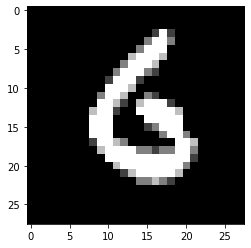

pred :  6 [7.1974376e-10 7.7627174e-06 2.7326914e-08 2.7331307e-05 2.2343441e-07
 1.0873240e-05 9.9999523e-01 1.6684831e-12 1.8850210e-09 1.8494725e-03]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


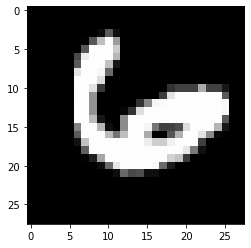

pred :  6 [3.0684606e-07 3.0207444e-11 1.6048334e-05 4.7223038e-13 2.4399815e-06
 1.0409435e-10 1.0000000e+00 1.2703567e-06 3.0245986e-09 1.7282204e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


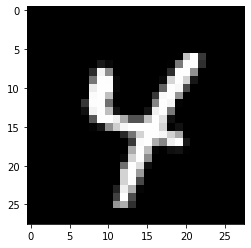

pred :  4 [1.7162910e-14 5.7590346e-09 2.8837311e-13 1.2586940e-10 1.0000000e+00
 1.3860093e-09 5.0870896e-10 1.7476082e-04 7.9084170e-09 2.0478372e-10]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


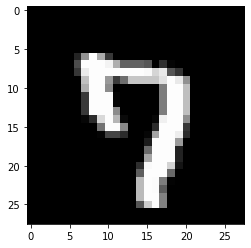

pred :  7 [1.3231456e-08 1.0654650e-16 8.9459074e-12 3.4711966e-11 3.8263584e-05
 2.3821062e-07 6.6404291e-16 9.9997413e-01 3.1763880e-11 8.4337592e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


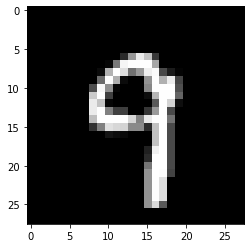

pred :  9 [8.1139651e-10 9.3856340e-14 6.2348242e-08 6.5625758e-09 2.3421734e-07
 5.9816792e-09 4.7216327e-15 1.8819534e-05 3.1545758e-04 9.9999869e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


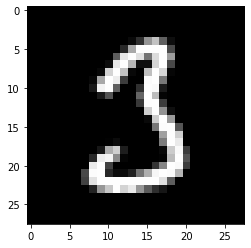

pred :  3 [1.41051305e-05 3.40132246e-05 1.89541715e-05 1.36456966e-01
 6.82216696e-12 1.63432956e-03 3.54003632e-12 1.48547633e-10
 1.03775974e-10 1.76237972e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


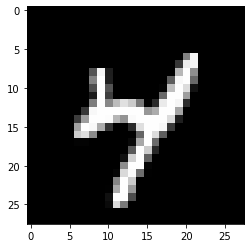

pred :  4 [1.1110249e-13 2.3194115e-13 3.2530431e-10 1.7561450e-09 1.0000000e+00
 2.4006999e-07 1.7353129e-11 1.4364103e-06 1.6799169e-06 3.5947282e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


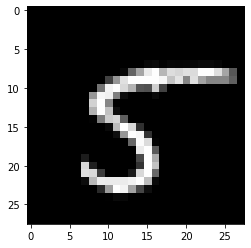

pred :  5 [2.0705906e-13 1.1389271e-08 1.9644787e-10 1.5098554e-08 9.2801590e-15
 1.0000000e+00 4.3172246e-14 1.1649890e-08 6.8834584e-11 1.0098633e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


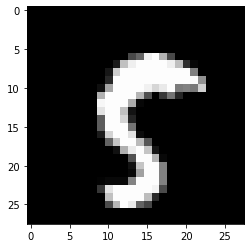

pred :  5 [1.9367532e-07 5.6868237e-07 1.4363224e-10 1.9091368e-04 1.5853905e-15
 9.9999762e-01 6.2835621e-14 1.2908843e-07 4.0120794e-06 2.8383732e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


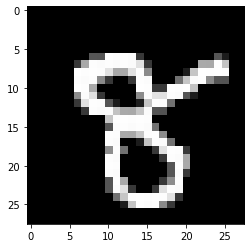

pred :  8 [5.7699106e-12 6.5699577e-15 7.7292793e-07 1.5832326e-08 1.3735935e-08
 2.4272691e-05 1.2606929e-10 5.9472738e-10 9.9998832e-01 7.1519977e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


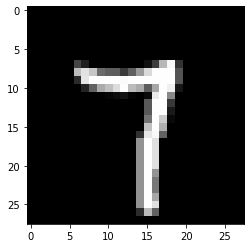

pred :  7 [3.0826580e-10 2.9463165e-06 8.4460163e-09 1.0116838e-07 5.8239893e-12
 4.3518822e-10 2.2648107e-12 1.0000000e+00 4.8051809e-11 5.7180909e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


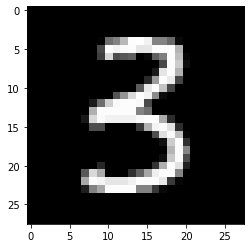

pred :  3 [5.0037718e-10 7.4973354e-07 6.6498194e-09 1.0000000e+00 1.5096738e-08
 1.7740861e-07 1.7398707e-10 3.3996209e-14 6.5126763e-08 1.7963606e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


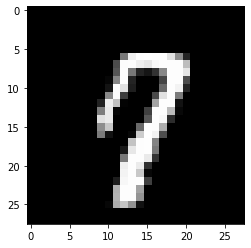

pred :  7 [1.0118255e-09 1.5356781e-08 2.3612006e-09 2.1684102e-08 2.9121060e-07
 1.4246646e-09 1.8496468e-10 9.9920332e-01 1.4655060e-05 6.0532331e-02]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


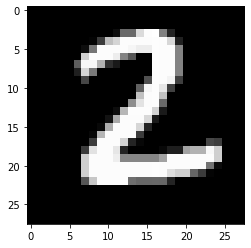

pred :  2 [3.27643956e-09 1.36755425e-05 9.99991417e-01 1.41505136e-08
 1.10432228e-15 5.92949423e-09 2.50376581e-10 9.75878856e-14
 1.38558387e-09 3.27053719e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


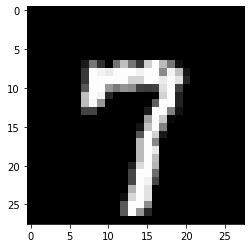

pred :  7 [1.1842149e-09 5.1701546e-11 4.0993773e-06 5.0536022e-07 2.7156806e-15
 4.4987720e-09 3.0592957e-12 9.9999976e-01 9.0547041e-13 1.3890980e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


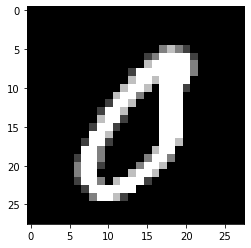

pred :  0 [9.9999619e-01 8.8560188e-07 3.5905771e-07 9.8953073e-08 5.3155294e-09
 1.7760303e-06 1.2832110e-10 3.0745448e-07 4.2443125e-07 1.5723768e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


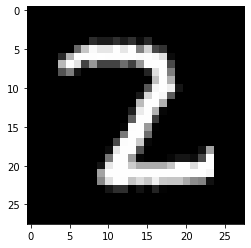

pred :  2 [4.1800607e-09 6.6106668e-07 1.0000000e+00 2.0362754e-06 2.4099716e-13
 1.2031533e-08 9.8406110e-12 3.6776412e-10 2.4662489e-08 3.5290271e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


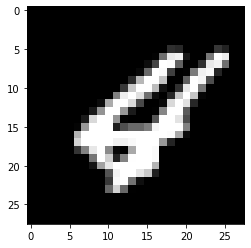

pred :  4 [1.52975619e-02 1.40827545e-14 7.10636377e-04 6.30011812e-08
 4.36107934e-01 8.31480793e-06 1.56968832e-04 1.18806776e-09
 1.78231247e-07 3.30122560e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


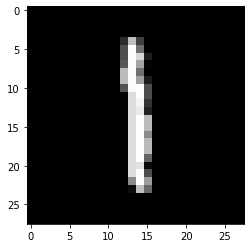

pred :  1 [9.1644743e-14 9.9998730e-01 7.0259068e-07 1.7821110e-08 1.1508852e-08
 2.1943450e-04 1.6008292e-08 1.4330431e-06 2.7845050e-05 6.0737568e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


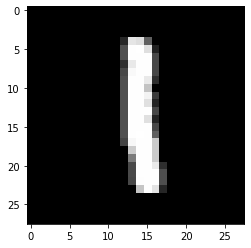

pred :  1 [2.6143896e-12 9.9999726e-01 3.6110438e-07 1.4339398e-08 1.5893693e-07
 2.5581471e-06 2.1910893e-08 6.1692634e-07 1.1453050e-05 4.5466047e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


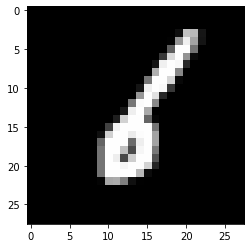

pred :  6 [4.1384948e-11 1.9026190e-02 2.4396479e-03 7.9616114e-10 5.6193716e-10
 8.1179833e-06 9.9128509e-01 3.2762050e-11 1.0165121e-06 8.9201365e-14]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


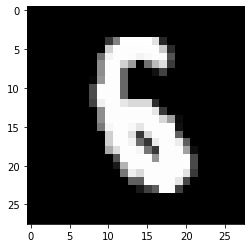

pred :  6 [1.2340248e-12 1.2535686e-07 4.8906134e-07 1.4651196e-06 2.1939204e-08
 5.3111315e-03 3.7394005e-01 6.4346586e-14 9.0844035e-03 8.6146593e-04]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


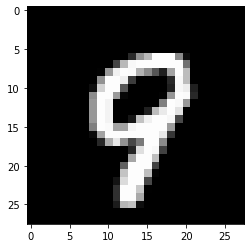

pred :  9 [2.3993722e-13 8.2475466e-17 1.1625551e-06 5.8408435e-08 6.3812301e-08
 2.3130413e-09 6.9756134e-09 2.2412748e-06 1.6702744e-06 9.9999964e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


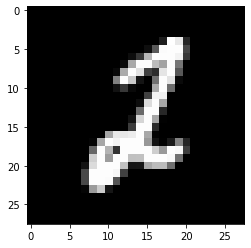

pred :  2 [6.7995659e-15 2.4295449e-02 9.9999851e-01 4.7452307e-12 3.6431744e-13
 1.1754388e-05 1.8717857e-06 3.9074455e-09 4.4416936e-07 4.6278677e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


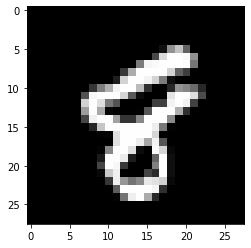

pred :  8 [2.63065403e-10 5.22921516e-14 1.03374605e-05 1.92278026e-06
 5.31213384e-09 4.39739637e-07 6.85720778e-08 1.52671209e-08
 9.99999821e-01 3.32230330e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


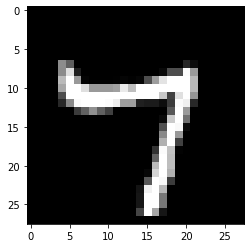

pred :  7 [3.7057201e-11 1.1017561e-14 9.2398901e-11 3.4910941e-12 5.0904889e-09
 7.1269460e-05 6.1010062e-13 1.0000000e+00 2.5050123e-10 2.2929289e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


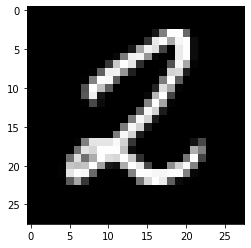

pred :  2 [4.6496279e-11 1.9359315e-05 9.9628007e-01 1.2657945e-07 1.0091055e-14
 4.5091433e-06 1.1021299e-07 1.6736825e-11 2.5080482e-10 2.3042135e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


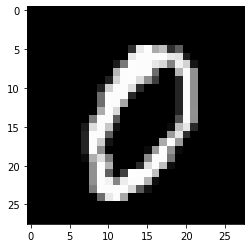

pred :  0 [1.0000000e+00 5.2990622e-08 9.0933264e-07 3.0932377e-09 2.2333521e-14
 2.2670627e-04 2.4650615e-06 5.0716615e-08 4.9004617e-10 1.2704427e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


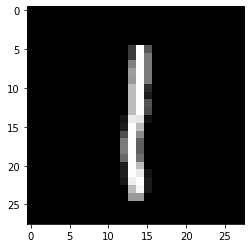

pred :  1 [1.0763177e-11 9.9998307e-01 1.5076251e-08 1.1457807e-06 2.1276630e-11
 3.1759448e-06 4.5541077e-07 1.9624669e-05 6.8893765e-05 7.5003026e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


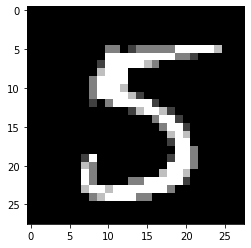

pred :  5 [8.5618893e-13 1.0254271e-06 1.6090889e-11 7.4571102e-07 3.4480912e-13
 1.0000000e+00 7.7742665e-12 9.9724031e-12 1.6098464e-12 1.0227227e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


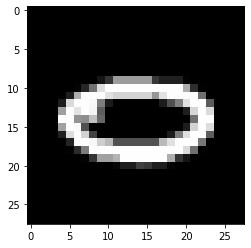

pred :  0 [9.9378753e-01 6.8707484e-11 3.1304269e-06 9.8378428e-10 2.1183416e-07
 6.1243081e-05 5.7045479e-05 3.9871931e-03 6.5501389e-11 1.9916892e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


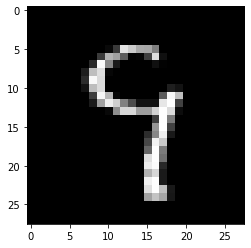

pred :  9 [2.7076187e-14 6.8176305e-11 2.3531451e-08 4.9101057e-11 9.8895729e-03
 6.7384831e-06 1.5084268e-09 2.7519464e-04 6.4902036e-07 9.9838167e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


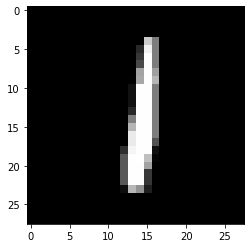

pred :  1 [5.12445078e-12 9.99991119e-01 1.16817432e-06 1.03841815e-08
 6.98248869e-07 9.36866684e-07 2.42694614e-06 5.09170104e-06
 3.95989582e-06 5.47195356e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


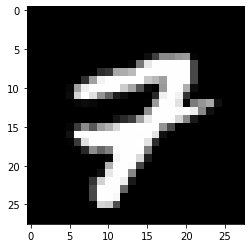

pred :  7 [1.6115678e-07 1.1526914e-11 1.7871261e-03 4.6658417e-05 2.4878055e-09
 1.1490087e-10 5.2358999e-11 7.6322687e-01 3.5336095e-07 7.9894662e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


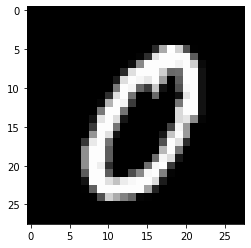

pred :  0 [1.0000000e+00 8.2210613e-07 7.0372130e-07 6.6724724e-09 3.3097270e-14
 9.8390126e-07 4.0680806e-08 6.1305977e-10 6.6183847e-10 5.9329823e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


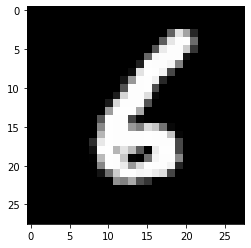

pred :  6 [2.5600750e-08 8.9954767e-08 1.0146778e-06 2.9682806e-10 1.3176974e-09
 7.5916316e-05 1.0000000e+00 3.3697326e-13 1.5120492e-07 7.0348337e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


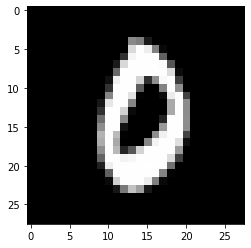

pred :  0 [9.9998921e-01 6.0613556e-11 1.3417006e-04 3.4342934e-06 6.9934185e-07
 4.6020441e-06 2.2252395e-06 1.3196009e-06 3.4858480e-10 7.8852065e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


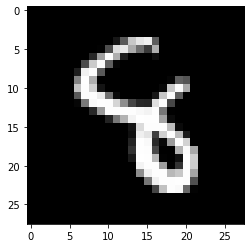

pred :  8 [1.9814791e-19 2.0081281e-07 5.9395916e-07 1.1369006e-05 7.0594460e-02
 3.5488422e-06 3.1924383e-09 3.2231797e-11 9.9994016e-01 3.4634510e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


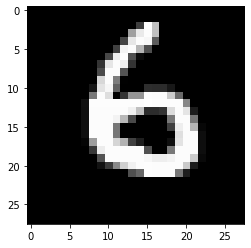

pred :  6 [7.6683175e-09 4.7435500e-11 6.6043594e-07 1.9020364e-06 1.3635099e-08
 2.1126584e-07 9.9999905e-01 5.1610945e-13 4.2577435e-09 1.4685322e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


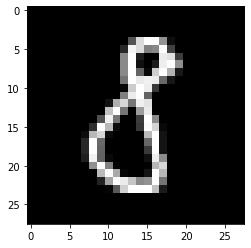

pred :  8 [2.3810565e-03 1.2313189e-04 3.4026431e-07 1.9744635e-03 2.2332287e-10
 9.0586178e-07 4.3672554e-07 2.9166669e-09 9.9996465e-01 2.8659111e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


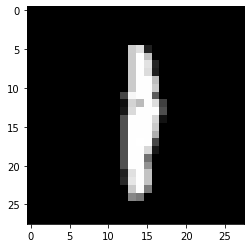

pred :  1 [1.2725342e-12 9.9993593e-01 3.4011098e-08 7.7862573e-08 3.1552138e-06
 2.8762349e-08 1.4561419e-06 1.1973809e-04 2.1224205e-05 1.4019012e-04]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


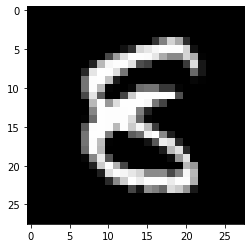

pred :  8 [2.5081692e-09 1.3770738e-09 5.2962807e-09 7.9832196e-10 1.1607022e-11
 4.7804924e-06 2.8224587e-03 2.2246092e-12 9.9993527e-01 3.0000995e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


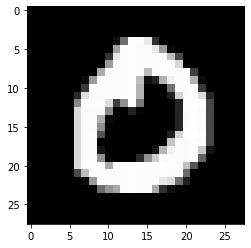

pred :  0 [9.99999762e-01 2.67618560e-07 2.32082904e-08 4.85632518e-06
 7.45285778e-13 2.07966465e-07 8.57838813e-08 1.33839775e-08
 9.23985020e-12 1.14179549e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


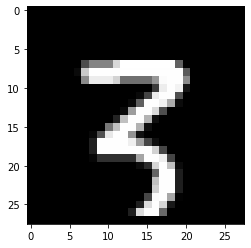

pred :  3 [1.3681822e-10 8.5338597e-10 1.3897023e-05 9.9986035e-01 2.9795739e-14
 3.2037492e-06 5.5765769e-14 1.6805530e-04 8.3978939e-08 1.7183197e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


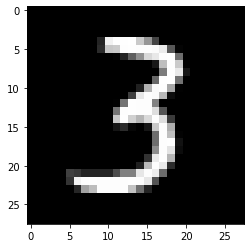

pred :  3 [5.1620108e-09 1.3354168e-08 8.2369255e-08 1.0000000e+00 5.9501078e-11
 7.4037049e-10 3.5540727e-13 7.8175218e-12 2.7813851e-08 6.1221994e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


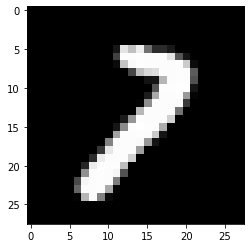

pred :  7 [1.3906407e-09 3.3248925e-05 2.8395653e-04 1.0043869e-04 4.4978040e-12
 2.6752309e-11 1.3898186e-13 9.9970460e-01 3.6755398e-05 6.0935759e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


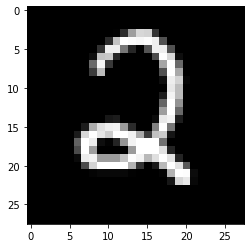

pred :  2 [2.6499872e-10 5.6981126e-08 1.0000000e+00 4.1934983e-10 3.9964110e-08
 1.7264438e-07 4.4984482e-08 1.3396165e-11 9.9811610e-11 5.7236963e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


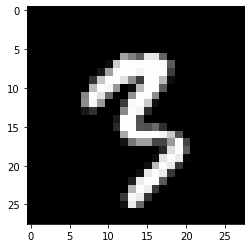

pred :  3 [1.0335646e-09 5.0588312e-08 2.2626585e-10 9.9998248e-01 1.0001180e-12
 5.5490789e-05 6.9233411e-15 3.4308069e-08 1.7431378e-04 6.7573786e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


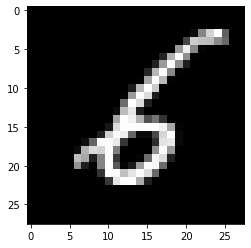

pred :  6 [5.1969873e-11 4.7132271e-08 4.5062265e-07 8.4029972e-10 2.3694238e-10
 2.3801714e-02 9.9999833e-01 7.7277486e-14 9.5422558e-07 1.3852884e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


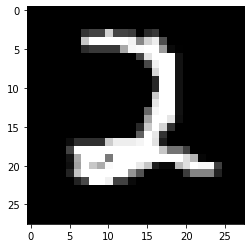

pred :  2 [6.8425687e-10 4.7832992e-07 9.9999976e-01 8.2309734e-06 1.7780323e-13
 7.6901854e-09 2.3555744e-08 2.6691388e-12 1.8384488e-13 2.5592899e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


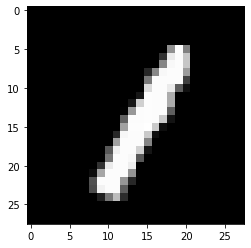

pred :  1 [2.4430025e-09 9.9999809e-01 3.9125729e-07 3.8271117e-10 1.7551623e-05
 4.3540538e-08 1.4093733e-08 8.9460747e-07 1.0807103e-06 4.8541672e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


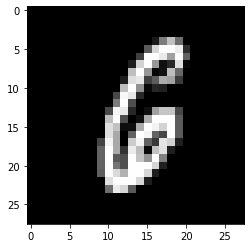

pred :  6 [7.83650080e-07 4.82150941e-09 3.08666968e-05 4.61192076e-06
 3.14951052e-08 6.67677596e-05 9.98563170e-01 9.30981507e-12
 5.74352089e-06 1.15575105e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


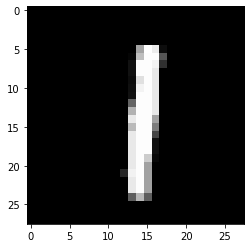

pred :  1 [3.13202415e-12 9.99992251e-01 1.11493854e-07 3.64140362e-07
 2.67068981e-06 4.68761314e-08 2.06308606e-08 1.12673179e-05
 1.57769341e-06 6.33219912e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


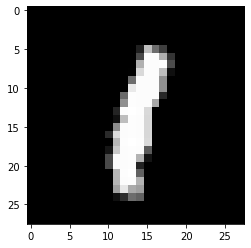

pred :  1 [1.0645603e-06 9.9999118e-01 5.3927218e-09 1.8924376e-10 6.0008148e-05
 1.4089802e-07 2.2071754e-06 6.7341440e-05 3.9268078e-05 6.8973208e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


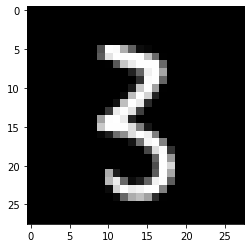

pred :  3 [6.9801881e-10 2.4125118e-08 3.1754251e-07 9.9999690e-01 3.0978534e-10
 2.9097439e-05 1.1401566e-13 1.9032376e-08 1.2421497e-06 3.6854814e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


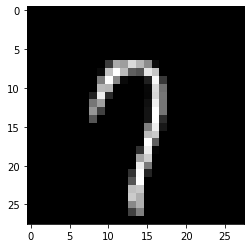

pred :  7 [1.1235126e-09 1.9609365e-07 3.1010959e-08 4.4183493e-10 4.4754522e-08
 1.0939791e-10 1.6080588e-10 9.9971521e-01 7.2234815e-11 3.6692321e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


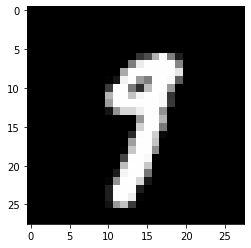

pred :  9 [9.0289998e-11 9.1257691e-04 7.2192773e-12 2.6299492e-08 7.8146786e-07
 1.7263162e-08 1.6805584e-13 2.1800399e-04 1.1676731e-04 9.9217975e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


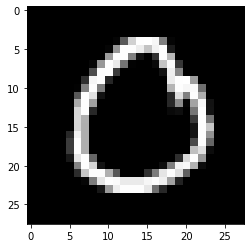

pred :  0 [9.9999976e-01 1.6392396e-07 7.3742644e-06 7.8356301e-08 2.5403217e-12
 1.5987085e-08 9.1874724e-10 1.4239848e-10 4.2439134e-12 3.7088881e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


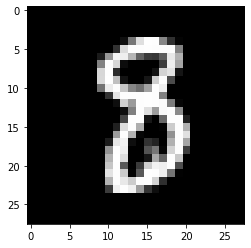

pred :  8 [4.7295180e-06 4.8105527e-08 6.9389163e-05 2.0024180e-04 8.9877199e-09
 9.8462215e-07 7.9724693e-08 1.6089411e-08 9.9988496e-01 2.6421657e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


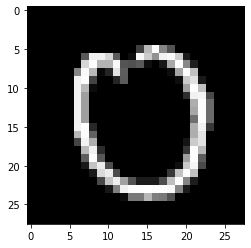

pred :  0 [9.9999332e-01 2.9279777e-08 2.4338043e-08 1.2205966e-06 5.9353154e-11
 7.3020924e-06 7.0052835e-08 9.3014208e-08 4.0595695e-12 2.2589902e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


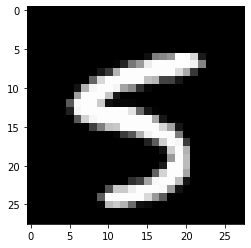

pred :  5 [1.0889826e-14 8.0808871e-09 1.0821028e-13 3.4788775e-06 2.5173531e-08
 9.9999970e-01 2.1840021e-14 1.7369074e-09 2.4252930e-07 1.8575719e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


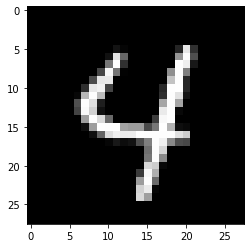

pred :  4 [2.1949758e-15 1.1525441e-11 2.8603255e-12 1.2176758e-10 1.0000000e+00
 2.3878812e-07 1.6786595e-12 1.1844929e-05 4.0352850e-11 4.1693431e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


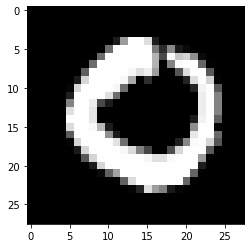

pred :  0 [9.9999893e-01 3.8867238e-08 1.1619460e-09 7.2056378e-10 1.6540068e-11
 1.1659794e-06 2.4437904e-04 1.6062318e-10 7.0753448e-10 5.4272531e-11]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


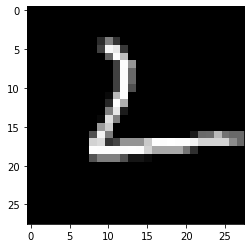

pred :  2 [5.0679599e-11 1.1242635e-08 9.9863160e-01 3.9031528e-10 7.8242421e-03
 3.5129488e-05 1.2171268e-03 1.2680773e-10 9.5567028e-14 2.0075667e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


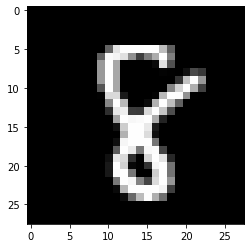

pred :  8 [2.0641673e-09 9.3631947e-10 1.2570092e-07 7.6862852e-07 7.1188819e-09
 7.8354056e-08 1.7495547e-06 6.2803751e-10 1.0000000e+00 1.7545992e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


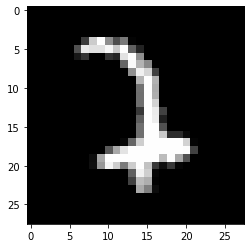

pred :  2 [1.3213038e-13 7.1072578e-04 9.9969840e-01 2.2234472e-06 6.2232819e-10
 9.5673229e-09 2.1356893e-05 1.4850275e-06 4.0541323e-07 2.4409159e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


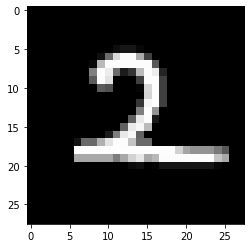

pred :  2 [2.28745516e-12 2.66581774e-04 9.99985278e-01 8.99425814e-08
 1.82453499e-13 4.30267937e-06 1.93537829e-12 3.52028962e-07
 1.06740054e-10 2.31233457e-06]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


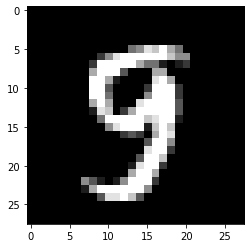

pred :  9 [1.6559205e-10 5.1758649e-12 4.9298804e-10 1.0759961e-04 1.0288324e-09
 9.9999886e-07 4.3697085e-13 7.3306539e-09 4.1026254e-07 9.9999964e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


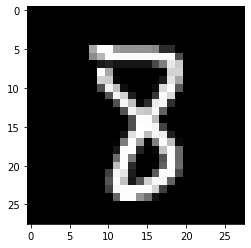

pred :  8 [1.5529951e-08 6.0793165e-10 1.9998081e-06 1.4882154e-05 1.2770367e-09
 4.4084186e-07 1.5145184e-09 3.5045230e-07 9.9999642e-01 2.2436102e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


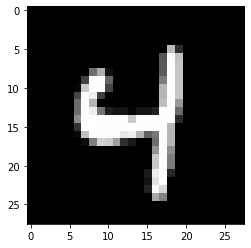

pred :  4 [3.0656071e-14 2.8135376e-12 2.4573133e-08 1.0040233e-07 9.9999952e-01
 7.6897749e-07 9.9671302e-13 4.6244061e-10 2.7606731e-11 3.8368016e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


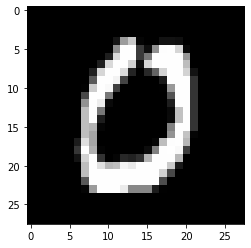

pred :  0 [9.99964237e-01 5.57945773e-11 4.53051925e-03 4.22937418e-09
 1.53613931e-14 8.30762656e-06 2.13154314e-10 3.70852575e-08
 1.33558605e-14 1.98519465e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


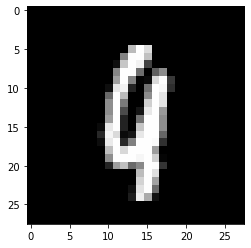

pred :  9 [4.0993772e-08 5.3859279e-05 3.7163496e-04 2.1718942e-09 1.9617677e-03
 3.3455061e-09 4.1529536e-04 9.0000412e-08 6.4137578e-04 2.9420078e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


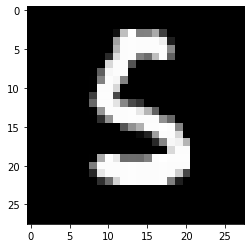

pred :  5 [7.7168644e-10 8.5954751e-05 1.0693171e-08 2.6410987e-08 1.7393040e-13
 9.9999756e-01 1.4574159e-06 3.5838675e-17 1.2106109e-09 4.3813789e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


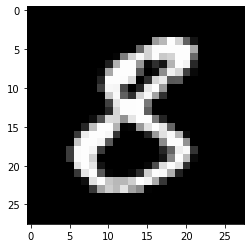

pred :  8 [1.2401349e-10 3.5513374e-08 3.3080822e-05 5.2583033e-07 1.3962940e-09
 3.4964125e-06 4.6887994e-04 4.2417441e-12 9.9729830e-01 7.8222016e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


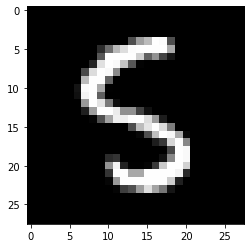

pred :  5 [2.9039315e-10 7.2193118e-10 7.6739546e-08 1.3081521e-08 2.1034894e-14
 9.9999952e-01 1.1409633e-10 2.4954162e-15 6.6701440e-09 3.7028272e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


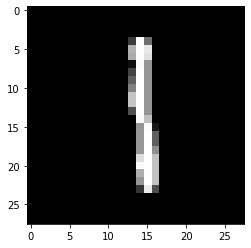

pred :  1 [1.1845594e-11 9.9999845e-01 8.0155846e-09 5.9818160e-07 2.5801921e-09
 9.7623612e-05 1.9405471e-07 1.0734706e-06 1.3223332e-06 2.2054920e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


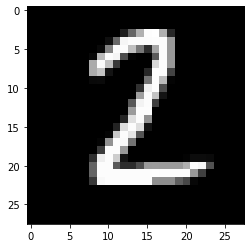

pred :  2 [1.20109434e-08 8.11096379e-06 9.99999762e-01 3.60016941e-08
 2.48127392e-14 1.14095194e-07 2.46621334e-10 2.65470680e-14
 9.36477118e-09 4.45499647e-15]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


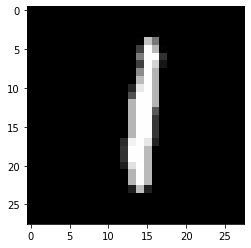

pred :  1 [1.9927133e-11 9.9999547e-01 7.3998578e-08 9.9345861e-08 2.5179044e-05
 8.9727331e-07 1.6961235e-07 1.6429998e-06 8.4167123e-06 8.3669525e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


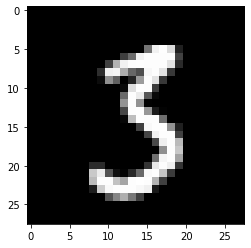

pred :  3 [1.90880245e-09 2.02901970e-06 8.74030126e-10 9.99752343e-01
 9.71490412e-14 6.69747591e-04 1.16243473e-11 9.67565524e-12
 1.10648095e-08 1.79573210e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


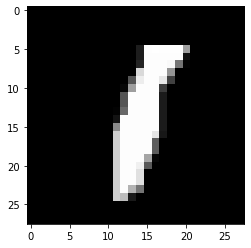

pred :  1 [2.5060436e-07 9.9993527e-01 5.7736763e-08 7.9067881e-09 2.1807359e-07
 3.8745057e-07 7.4441858e-05 3.1039621e-05 9.3632007e-05 5.3512815e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


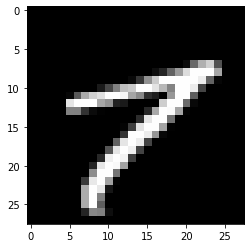

pred :  7 [4.9876780e-10 2.9921004e-08 9.0206174e-07 1.7742730e-08 1.1463802e-09
 3.3136769e-07 7.4066066e-12 9.9598241e-01 7.4392424e-06 8.0507689e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


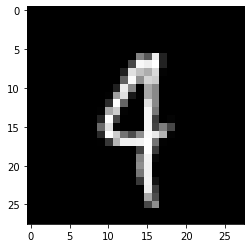

pred :  9 [9.5400077e-13 2.0414552e-06 2.6282206e-07 1.1479840e-09 8.1844046e-05
 1.8662156e-06 9.5496262e-06 5.3300428e-05 1.7437270e-07 9.9985111e-01]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


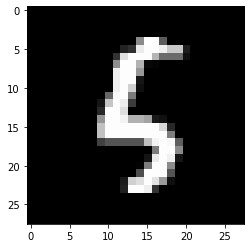

pred :  5 [4.0995368e-14 1.9480214e-05 6.5564705e-09 6.5919603e-06 2.5975934e-05
 9.9983644e-01 1.6313195e-03 8.4832572e-14 1.8702367e-10 1.4791172e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


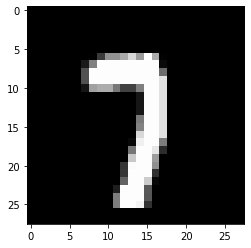

pred :  7 [1.6803493e-10 3.3063472e-07 2.2059128e-06 1.5850507e-07 1.2178210e-12
 5.0966436e-11 2.7558934e-13 9.9980146e-01 1.6693920e-10 1.3075042e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


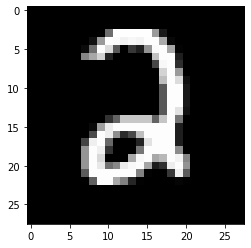

pred :  2 [3.0789255e-07 2.7048818e-11 1.0000000e+00 1.3130172e-07 2.3328415e-13
 3.3039244e-10 9.9625936e-08 8.3223706e-13 1.4127900e-10 2.4862873e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


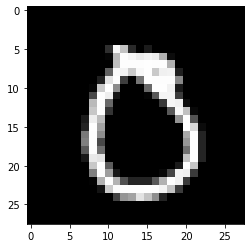

pred :  0 [9.9999511e-01 8.1732031e-07 7.6154447e-07 4.8520916e-09 3.2094121e-12
 4.6889772e-06 1.8654404e-11 2.4754613e-07 7.2017530e-09 1.3434887e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


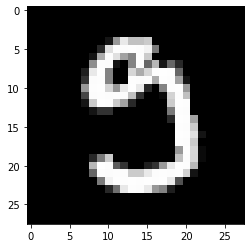

pred :  5 [8.0412626e-04 7.6985762e-10 9.0634923e-05 1.3864040e-03 2.0723793e-14
 3.6628798e-01 1.8204123e-13 8.9028340e-10 3.2872511e-12 6.7444361e-08]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


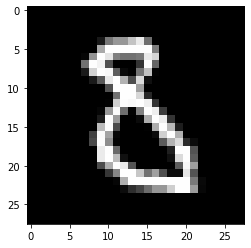

pred :  8 [2.5077913e-09 9.8174212e-08 1.4060561e-06 1.7179118e-05 6.0162308e-10
 1.9803643e-04 4.8615824e-05 5.6007397e-11 9.9987626e-01 3.8944883e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


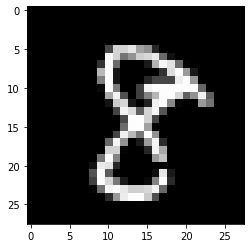

pred :  8 [9.6392945e-08 1.3345046e-09 8.3931145e-06 1.5936273e-08 8.2617573e-11
 2.3575555e-07 6.5189548e-11 2.0269319e-07 9.9999958e-01 2.9970257e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


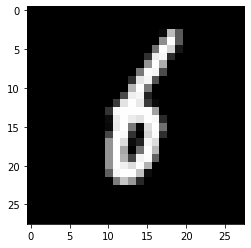

pred :  6 [1.6462227e-08 2.8787542e-06 1.9647814e-07 8.7184278e-09 2.6220754e-08
 8.3043436e-05 9.9999857e-01 3.0119318e-10 2.9045343e-04 3.4892822e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


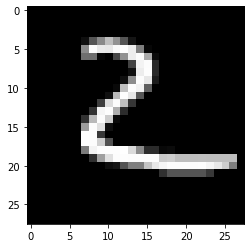

pred :  2 [9.8957180e-09 7.1161267e-05 9.9903870e-01 5.9977278e-06 1.1330926e-07
 6.4137584e-09 1.8665940e-05 4.5942745e-15 2.0179303e-11 5.0708149e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


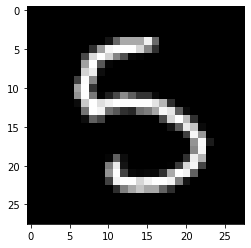

pred :  5 [1.5464285e-10 1.5820673e-08 3.9204049e-09 4.9046961e-05 3.3617726e-09
 9.9920589e-01 3.7302748e-09 4.7075532e-10 5.1893608e-07 3.1133567e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


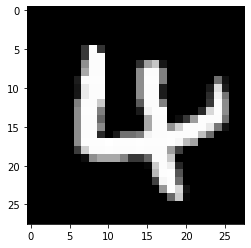

pred :  4 [2.9540062e-04 5.6836837e-09 1.2376256e-06 3.5536223e-11 9.9999881e-01
 6.0002541e-05 3.7279725e-04 2.2438455e-06 8.4990859e-09 1.2947131e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


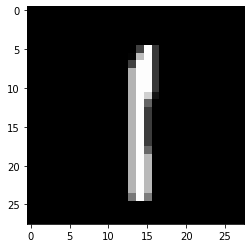

pred :  1 [8.0535934e-12 9.9999917e-01 7.9578202e-09 2.4854960e-05 7.7417421e-12
 1.2416084e-06 3.5472601e-07 7.1442746e-06 2.7983199e-06 2.5576237e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


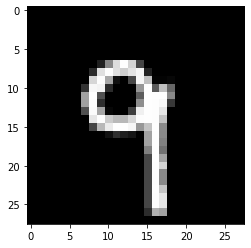

pred :  9 [2.5913048e-12 6.8497896e-10 3.9166587e-10 9.4147655e-11 6.4933456e-06
 1.4994268e-11 1.0516289e-12 1.0564148e-06 1.7406767e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


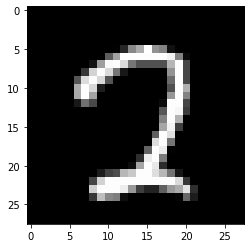

pred :  2 [1.7171304e-05 6.4845240e-09 9.9899036e-01 2.5917673e-06 9.1624293e-14
 4.5922999e-07 9.8645289e-13 1.3995171e-04 3.0593032e-11 2.8973222e-03]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


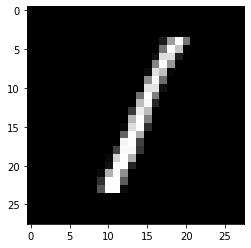

pred :  1 [1.6446599e-08 9.9999976e-01 8.9140958e-05 2.1467730e-11 6.4769623e-08
 1.5279744e-05 4.3136819e-08 2.8659123e-08 2.9950353e-08 1.9301354e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


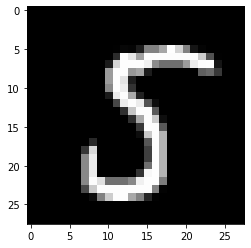

pred :  5 [4.7302957e-11 1.9698848e-05 1.1016139e-09 9.9544303e-11 6.2195279e-15
 9.9999642e-01 4.5060584e-11 2.2348340e-11 9.9287709e-06 3.2719167e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


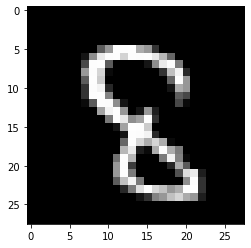

pred :  8 [3.4830530e-12 2.9788308e-13 1.4400780e-03 4.3861860e-08 2.8901685e-09
 4.9549341e-04 1.8768782e-08 7.2326459e-12 1.0000000e+00 1.9778587e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


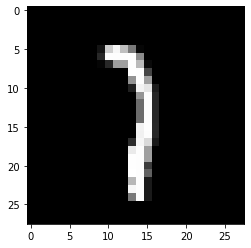

pred :  7 [6.3879207e-14 4.6915293e-02 5.5927038e-04 2.0448595e-06 1.1620369e-09
 2.3631685e-06 2.9351208e-10 1.3640061e-01 6.8567178e-06 2.2563215e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


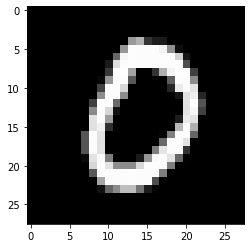

pred :  0 [9.99999762e-01 1.16042442e-09 2.38014436e-05 1.53445498e-07
 1.05465956e-13 5.73484282e-09 9.38381817e-08 6.09111481e-08
 3.52273599e-10 9.67179517e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


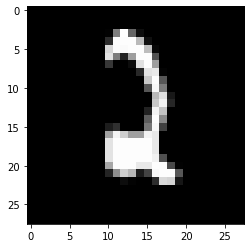

pred :  2 [3.2786104e-08 6.3410255e-07 1.0000000e+00 1.9689860e-06 3.9358968e-14
 1.8835143e-10 2.1151622e-07 1.1597019e-11 1.9420918e-10 1.7428593e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


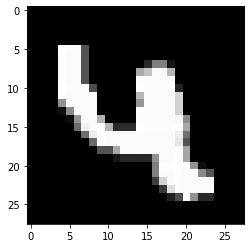

pred :  4 [9.5117412e-12 3.9340156e-07 2.0856978e-06 3.2782887e-06 9.9815023e-01
 1.2941020e-10 7.8516377e-06 8.0293148e-08 1.8669367e-03 4.8950838e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


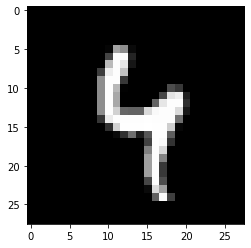

pred :  4 [1.6614932e-16 1.9598856e-11 3.1488590e-10 1.1021350e-09 9.9994850e-01
 4.8774416e-07 6.1079081e-10 5.3721102e-08 2.7343414e-10 4.2262971e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


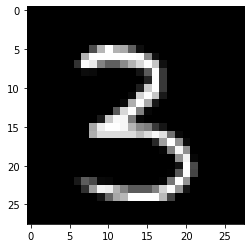

pred :  3 [6.80634273e-14 1.09839116e-09 2.33243700e-05 9.99995410e-01
 1.16813015e-09 8.55733597e-05 4.63798015e-15 7.85819587e-09
 9.57635712e-06 1.13174356e-13]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


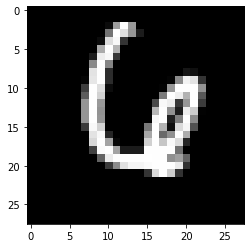

pred :  6 [4.2022918e-09 5.6725877e-15 7.3464857e-05 3.5422890e-10 1.0715528e-06
 3.8659700e-12 9.9999976e-01 4.9689206e-06 5.8647043e-10 3.9147155e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


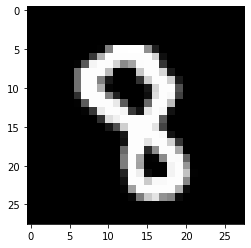

pred :  8 [4.62043875e-10 6.43060674e-11 1.82448829e-07 4.04393995e-06
 5.21287689e-07 1.08794836e-07 9.05144137e-09 3.76234510e-08
 9.99998927e-01 9.81405683e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


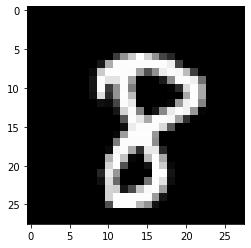

pred :  8 [3.65268267e-11 7.35376007e-13 4.56584303e-06 1.41212344e-03
 2.93586688e-09 4.55857885e-09 1.27409105e-08 2.81078627e-08
 1.00000000e+00 2.25253734e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


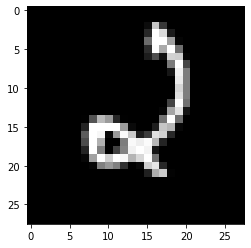

pred :  2 [8.7518536e-08 9.8423480e-10 9.9999672e-01 8.1069963e-08 7.7498908e-06
 4.6514466e-11 4.4417552e-06 6.0174071e-12 3.9374686e-09 1.1138486e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


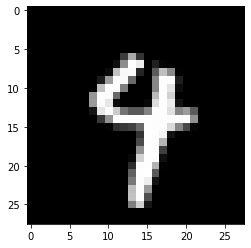

pred :  4 [2.0685233e-12 1.9278239e-10 4.3888240e-11 3.9975072e-07 9.8270810e-01
 5.7813017e-12 7.7069323e-11 5.7124287e-02 1.2022266e-08 1.7235428e-02]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


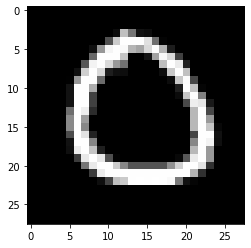

pred :  0 [9.9999797e-01 4.2825400e-07 4.6666537e-06 6.1928773e-09 5.1438769e-13
 1.0205135e-05 6.1192111e-07 2.0729173e-10 2.4888375e-15 3.5492310e-12]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


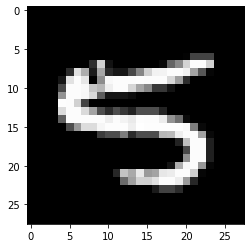

pred :  5 [3.1734073e-12 6.0947866e-12 1.1987763e-11 1.4593485e-07 6.3839555e-04
 9.1821861e-01 4.5678218e-13 8.4421235e-06 2.8115511e-04 1.8630326e-03]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


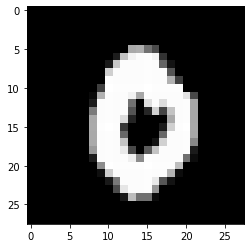

pred :  0 [9.9999607e-01 6.6633249e-10 1.8486877e-06 4.0081143e-04 3.6552251e-08
 2.9094122e-06 2.4118850e-05 5.8781043e-06 8.6596970e-08 3.5133475e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


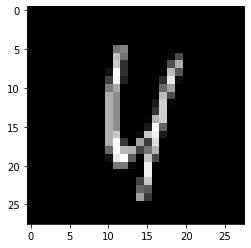

pred :  4 [2.8900968e-09 9.7234558e-09 1.6232460e-05 6.1143307e-10 9.9536973e-01
 2.2293891e-05 6.8678732e-05 5.1009476e-07 7.6200545e-06 1.0382276e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


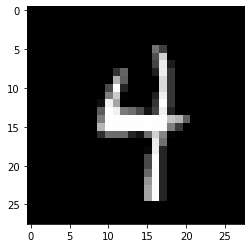

pred :  4 [2.4516235e-17 3.6702832e-10 6.5515166e-10 2.1995424e-05 1.0000000e+00
 1.2198320e-06 1.0413571e-09 6.3863259e-10 3.6493868e-12 6.0400890e-10]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


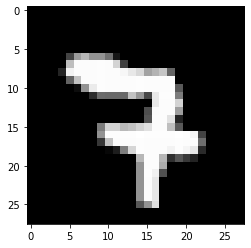

pred :  7 [7.0871520e-13 4.4729645e-10 3.1272384e-07 2.1677465e-06 1.0150372e-07
 8.4739116e-10 1.5894647e-09 1.0000000e+00 2.9908936e-10 1.6694352e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


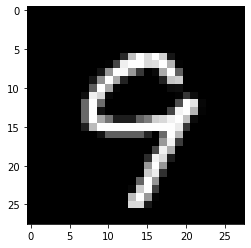

pred :  9 [2.3565695e-14 3.2869484e-17 1.2318139e-09 3.0555915e-07 5.8293466e-08
 1.3746413e-07 2.3813280e-12 1.1808020e-06 2.9657468e-09 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


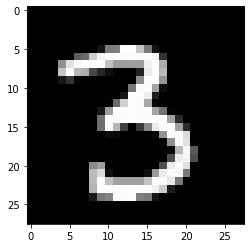

pred :  3 [2.1627233e-11 4.0625037e-09 1.5353068e-11 1.0000000e+00 1.0042057e-10
 1.2940490e-08 3.3169771e-17 1.2472086e-10 3.0586644e-09 7.4740299e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


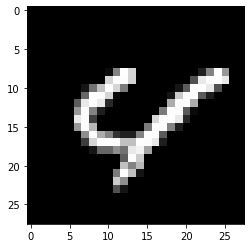

pred :  4 [2.7419311e-09 4.3787334e-14 1.1938285e-07 4.0535772e-10 9.9927050e-01
 1.6380909e-09 8.3639967e-10 8.3095124e-08 1.9778305e-05 2.6691177e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


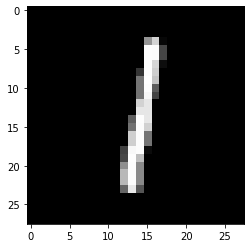

pred :  1 [4.0350176e-10 9.9999887e-01 3.0444076e-07 1.1756388e-08 3.5007563e-08
 3.2770945e-06 9.4713482e-09 1.9351553e-06 1.1479858e-06 1.8531322e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


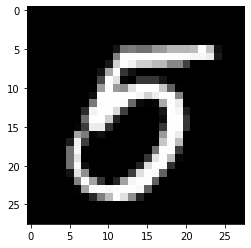

pred :  5 [1.4308095e-04 5.7085121e-08 3.8452375e-09 1.3435450e-10 3.4765654e-10
 9.9999619e-01 5.5462765e-12 5.7138827e-06 3.6734736e-08 1.2690150e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


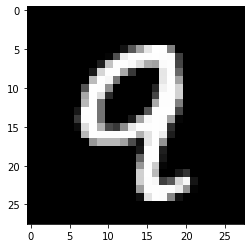

pred :  9 [1.0425549e-10 3.6043411e-11 7.3561807e-07 6.3990893e-07 9.3892565e-09
 1.5690543e-07 3.2142029e-08 4.4616175e-07 5.3170323e-04 9.9998993e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


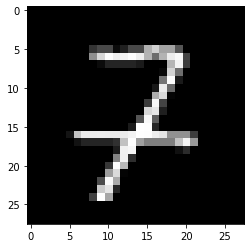

pred :  7 [2.0725820e-13 9.2098995e-09 2.3810893e-02 2.6455546e-05 2.2552898e-07
 1.3087205e-07 6.7205191e-10 9.9639094e-01 5.4133640e-09 2.9426224e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


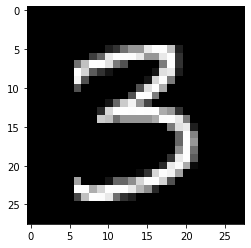

pred :  3 [5.5101790e-10 1.9922375e-08 3.2812408e-10 1.0000000e+00 1.9096400e-09
 6.3086820e-11 1.1086687e-17 1.6726032e-08 2.9794889e-10 2.8565204e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


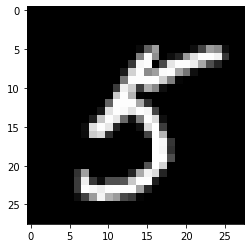

pred :  5 [5.3205579e-10 1.5225451e-06 5.6335318e-12 3.5383423e-06 6.2002931e-11
 1.0000000e+00 3.5372217e-12 3.5313454e-11 1.8490058e-09 1.2940046e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


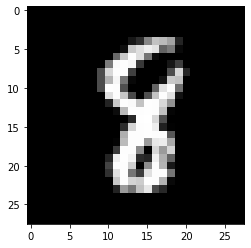

pred :  8 [3.8807220e-09 1.9714236e-04 1.2896496e-06 9.2573856e-08 7.5910089e-07
 2.2673514e-09 9.8867048e-08 5.2104937e-08 9.9999905e-01 2.2661686e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


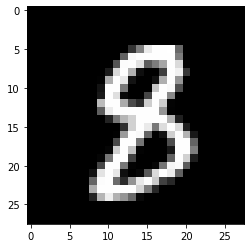

pred :  8 [2.33655673e-08 2.12013944e-08 4.52611403e-06 1.25229359e-04
 1.10136136e-06 2.41869373e-07 7.96743791e-08 1.05331335e-08
 9.99894381e-01 9.38981771e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


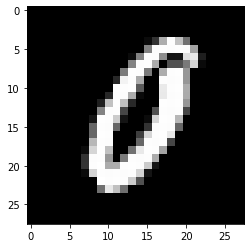

pred :  0 [9.9976087e-01 1.7798450e-12 5.7969838e-02 9.6408947e-08 8.8668239e-06
 1.4555254e-10 1.4446951e-05 4.7765569e-09 2.2561439e-05 3.4368080e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


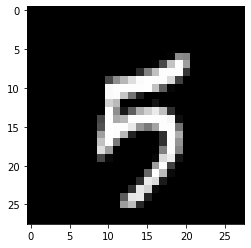

pred :  5 [2.6514303e-12 1.2957221e-10 2.2531418e-13 1.1865472e-05 1.4065577e-06
 9.7184289e-01 1.4939964e-08 5.6958930e-07 1.7814696e-07 9.4550490e-01]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


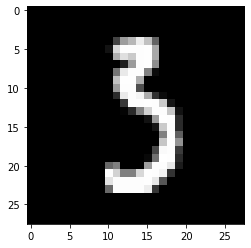

pred :  3 [6.4779809e-10 8.0759259e-05 1.7636700e-10 5.5205578e-01 4.1231367e-12
 1.5766680e-02 1.0009306e-09 7.7205009e-10 7.3105512e-06 1.4828682e-02]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


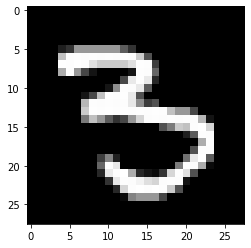

pred :  3 [8.9730063e-09 4.2627754e-08 4.3367043e-09 9.9999189e-01 8.5209862e-08
 2.3694411e-05 2.0678279e-13 1.8025154e-09 1.4874973e-07 3.9648437e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


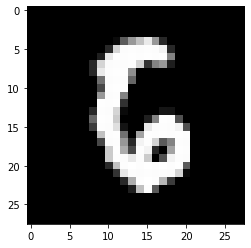

pred :  6 [2.3308115e-07 1.5075475e-08 1.7918480e-07 5.6448606e-11 6.6824476e-12
 5.3332448e-03 9.9999654e-01 1.3120639e-10 3.5209698e-06 4.7100186e-03]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


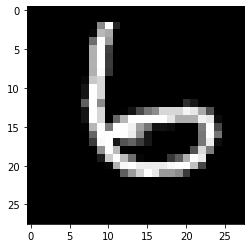

pred :  6 [3.9536822e-11 4.0954343e-10 3.3010195e-07 2.4037790e-09 7.4179603e-08
 1.1365163e-06 1.0000000e+00 6.4209449e-16 7.0016802e-07 2.3094216e-13]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


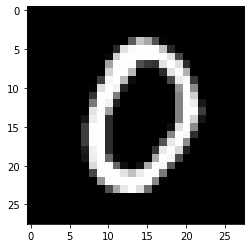

pred :  0 [1.00000000e+00 6.02626560e-11 3.82508151e-05 3.21980803e-10
 5.88999986e-12 1.24409025e-08 1.21795637e-07 2.24856137e-07
 4.98630616e-11 9.34533164e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


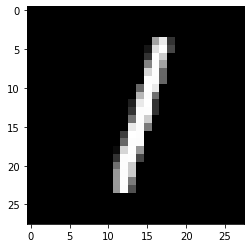

pred :  1 [9.9648503e-09 9.9999964e-01 1.0982997e-06 2.6759162e-10 1.4074232e-06
 1.0810602e-05 6.7466717e-09 1.2922700e-07 2.6139800e-05 3.0786743e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


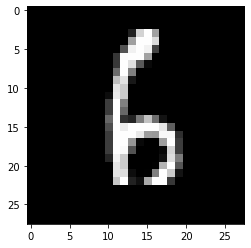

pred :  6 [2.2090177e-10 7.5922358e-08 5.1032175e-06 5.1939530e-08 1.4039216e-08
 3.1670928e-04 9.9998045e-01 7.9948068e-16 2.2000074e-04 2.5128377e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


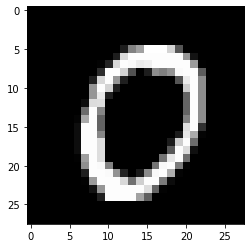

pred :  0 [1.0000000e+00 8.6275111e-09 1.6496851e-06 7.1141448e-09 1.1128090e-16
 6.3842100e-07 1.6408654e-08 1.7187031e-07 8.4556345e-14 1.5513134e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


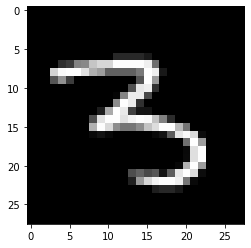

pred :  3 [4.7805783e-12 4.6296290e-07 3.3906446e-07 9.9999881e-01 4.7502208e-08
 8.1742437e-06 6.4995277e-14 6.0041971e-09 1.2376710e-09 5.0740385e-13]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


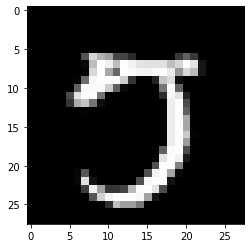

pred :  7 [4.2152931e-07 5.3813627e-11 3.3438207e-06 2.5209785e-04 1.1501147e-12
 4.6393594e-01 4.7048531e-17 8.3997083e-01 9.1472848e-19 2.7620700e-10]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


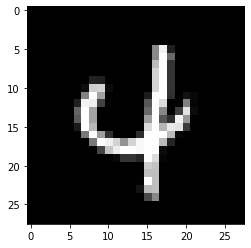

pred :  4 [1.8025703e-09 1.3347541e-09 1.3263509e-06 3.7645578e-11 9.9999875e-01
 4.0139891e-08 1.3451382e-05 1.6041394e-08 4.0472985e-09 1.2167955e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


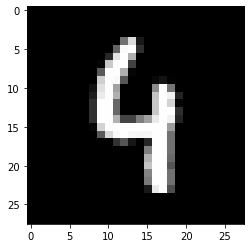

pred :  4 [1.4487174e-14 2.5442606e-07 3.7008251e-11 2.1291804e-08 9.9997205e-01
 3.8365584e-08 7.8682145e-09 2.0586668e-09 1.3520902e-10 6.6375732e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


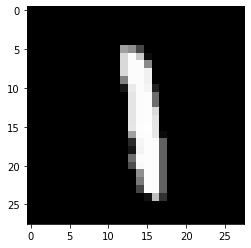

pred :  1 [1.0685839e-14 1.0000000e+00 1.0384232e-06 2.0925452e-10 1.0862377e-07
 7.5891990e-07 2.3742680e-07 1.6794291e-05 6.5261588e-07 2.8838611e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


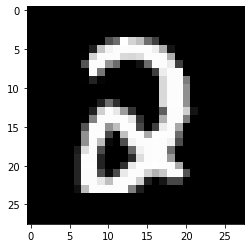

pred :  2 [1.2451105e-05 3.1437623e-11 9.9997425e-01 7.1012491e-06 4.8793975e-08
 5.7115340e-10 6.6133566e-08 2.5486828e-09 6.1839012e-07 9.2377670e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


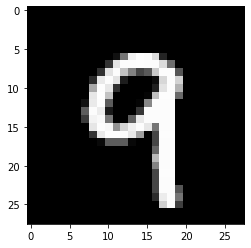

pred :  9 [1.0506110e-11 5.3439620e-13 1.1741754e-08 5.6904178e-06 3.0102523e-08
 6.7337735e-10 1.4245593e-12 1.5982756e-08 2.0996528e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


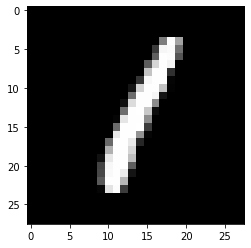

pred :  1 [2.06566419e-05 9.99999762e-01 1.13547954e-04 3.48669739e-11
 3.97476299e-07 2.09691336e-07 6.73862132e-07 1.01423410e-07
 1.14524767e-06 1.30590272e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


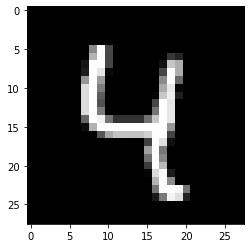

pred :  4 [7.8933492e-16 2.3143816e-10 1.3263652e-11 1.1067331e-10 1.0000000e+00
 9.8377359e-07 4.6953419e-13 2.4295363e-07 1.3851842e-10 4.1197276e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


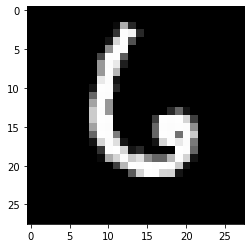

pred :  6 [1.4725662e-08 7.3713771e-11 4.4366004e-09 1.4561042e-12 2.2683930e-06
 4.7000287e-07 9.9997938e-01 3.3877498e-10 2.0892131e-12 2.2527082e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


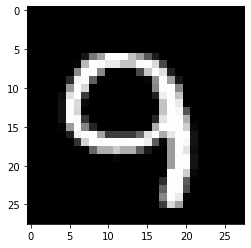

pred :  9 [1.9363469e-07 1.9073183e-12 4.8638526e-06 1.5773843e-07 2.2435579e-05
 9.4032941e-08 7.3996603e-08 1.8094021e-06 1.9183569e-06 9.9999940e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


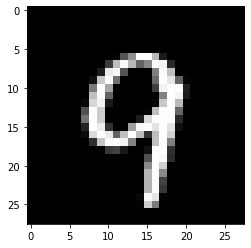

pred :  9 [3.5086025e-09 2.4702136e-15 3.7337662e-07 4.4182357e-08 4.9303486e-07
 5.1341120e-10 8.9415914e-12 2.7335541e-06 4.1771933e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


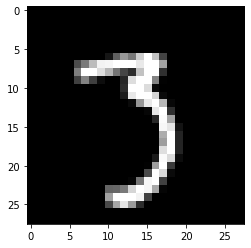

pred :  3 [1.0236282e-08 2.0640464e-08 1.9722680e-11 9.9995017e-01 9.3891075e-14
 2.6005491e-06 2.1257723e-15 2.6723742e-04 3.3219016e-10 1.7091127e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


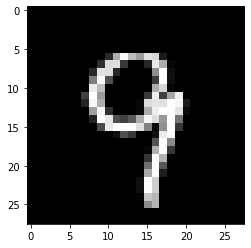

pred :  9 [3.4046793e-12 3.9259270e-13 1.1018350e-12 7.0716513e-09 1.2800097e-04
 2.2553479e-09 3.9011749e-09 2.3475289e-04 6.6778836e-09 9.9998283e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


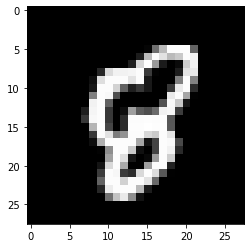

pred :  8 [1.1251560e-08 4.0498694e-13 1.2474306e-05 1.1867583e-03 1.7350805e-08
 5.4780109e-09 1.2418628e-04 3.2494480e-09 9.9927318e-01 3.6361217e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


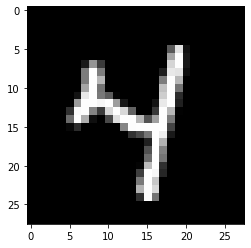

pred :  4 [6.3570724e-14 6.7884254e-10 4.4258260e-12 6.8729470e-08 1.0000000e+00
 1.6922378e-07 1.4353461e-12 2.8996547e-07 5.7584284e-06 2.2151958e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


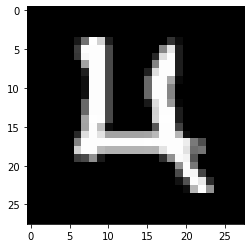

pred :  4 [8.7773977e-08 1.3277688e-09 3.9592518e-07 4.8076079e-12 1.0000000e+00
 6.7503565e-06 1.4033727e-08 8.2385242e-07 3.4617170e-10 1.2915049e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


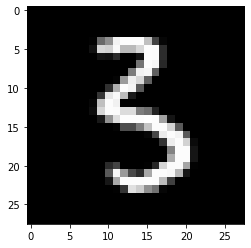

pred :  3 [3.3397538e-10 1.6841526e-05 7.7679934e-09 9.9873191e-01 2.0802636e-07
 3.4018844e-01 1.0494490e-08 5.4287642e-15 5.7922702e-09 1.8231203e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


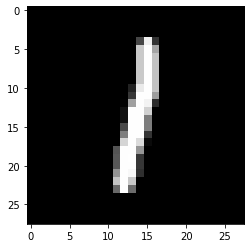

pred :  1 [5.7797225e-09 9.9999881e-01 2.4955023e-07 1.4825419e-09 1.1422497e-07
 3.0365541e-06 2.7704781e-08 3.2280099e-07 1.4703307e-06 2.7446324e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


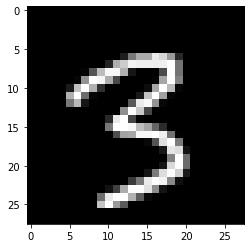

pred :  3 [5.2840839e-12 6.1072005e-09 9.8071928e-10 9.9999928e-01 3.2319798e-13
 1.8568244e-06 1.1049133e-13 1.0692268e-09 3.7891175e-06 3.0592625e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


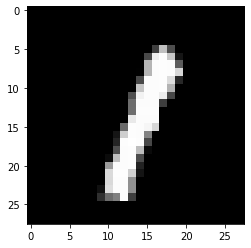

pred :  1 [1.04232186e-07 9.99994397e-01 2.96404608e-08 5.27157873e-09
 1.49636421e-07 2.74893885e-08 5.69276493e-09 5.23570816e-06
 7.51698053e-07 1.57429295e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


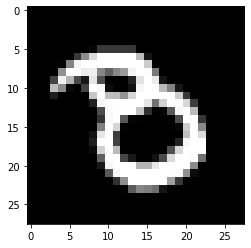

pred :  3 [5.5375642e-01 3.4230823e-11 1.2969425e-06 8.4940046e-01 2.1737277e-15
 1.9413690e-05 7.0578869e-07 5.7027853e-07 1.1834834e-05 2.8698864e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


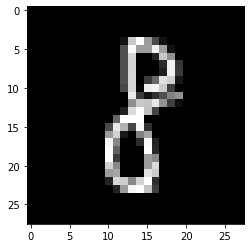

pred :  8 [7.8810342e-07 2.5150184e-06 4.3797307e-05 1.4367577e-05 1.5530979e-09
 7.4923490e-10 1.0510075e-08 4.5307303e-08 1.0000000e+00 2.3638493e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


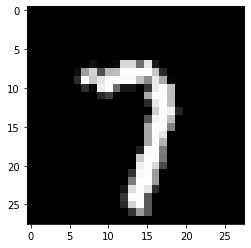

pred :  7 [1.8560064e-08 1.3141880e-06 7.6400102e-07 2.8036101e-07 1.4919559e-14
 9.4282021e-12 3.2285496e-12 9.9999452e-01 6.2997086e-12 3.8369224e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


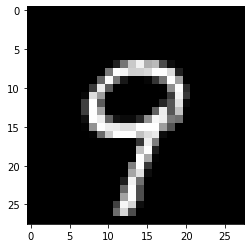

pred :  9 [1.4237301e-13 1.0546278e-16 2.5804479e-09 9.0616723e-08 7.5150450e-07
 4.4358730e-09 4.4635235e-13 1.9582295e-08 3.5538733e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


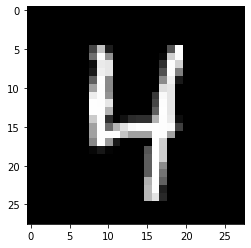

pred :  4 [1.5413575e-14 8.1871548e-10 1.9320468e-13 1.5653238e-09 1.0000000e+00
 1.0481532e-07 4.0403009e-10 5.9544991e-06 5.8380169e-11 1.2896292e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


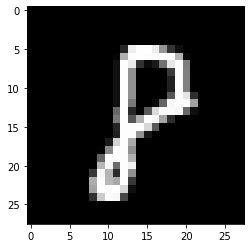

pred :  8 [3.4523971e-06 2.9702531e-07 1.2818366e-02 5.6627671e-09 8.0840472e-09
 8.2663843e-07 1.0271421e-09 9.7948741e-06 9.9994171e-01 9.1765061e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


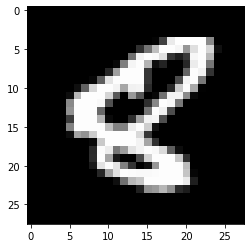

pred :  8 [3.4237618e-07 5.9110487e-11 4.1369498e-03 3.3503849e-09 2.2611002e-05
 2.3804007e-07 1.8326165e-05 2.0897860e-13 9.9729645e-01 1.6255301e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


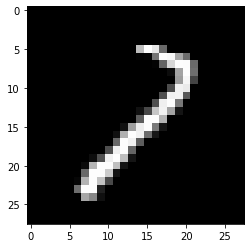

pred :  7 [3.1875935e-10 2.4197102e-03 2.6408732e-03 8.9578390e-07 1.2012632e-09
 1.0775507e-10 3.6371794e-11 9.8712802e-02 2.4512410e-04 7.5280666e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


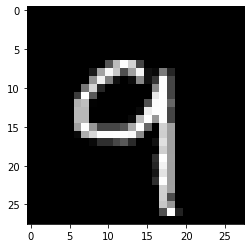

pred :  9 [2.0667024e-11 8.1290140e-12 2.7536618e-08 4.4146391e-06 1.0881554e-06
 1.6000094e-10 1.2727722e-08 8.7762260e-08 1.6317147e-08 9.9999851e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


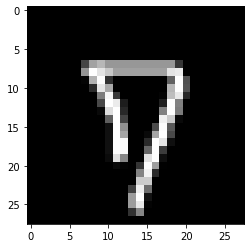

pred :  7 [9.9489507e-06 5.9310232e-16 1.9196443e-07 1.3840565e-10 8.0273890e-07
 5.8863927e-09 7.9016689e-11 9.0903175e-01 1.4959834e-05 3.0675775e-01]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


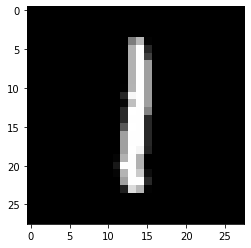

pred :  1 [2.1281824e-11 9.9999952e-01 1.6394850e-07 2.7145752e-09 9.4347241e-10
 1.4066080e-05 3.5253697e-07 1.0194134e-05 4.9121036e-06 4.7726161e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


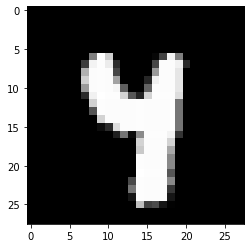

pred :  4 [2.5180948e-14 8.4258189e-10 5.2549914e-14 9.5069854e-09 9.9999845e-01
 3.8406269e-09 2.6319411e-12 4.2864667e-05 5.6207042e-05 2.0056084e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


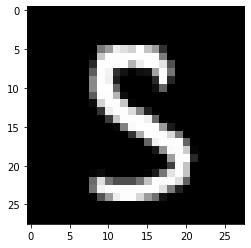

pred :  5 [4.8333754e-10 1.0632295e-09 2.3009494e-09 3.8776696e-03 4.3532001e-11
 9.6322304e-01 2.6930377e-14 1.3442557e-13 7.2506067e-05 1.6626453e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


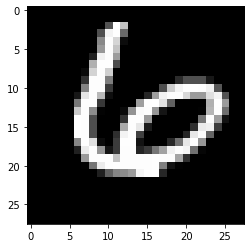

pred :  6 [2.6349312e-07 4.9600429e-10 6.7232924e-07 2.8967429e-08 1.9836804e-11
 2.0894645e-06 1.0000000e+00 1.4197513e-10 2.4083372e-08 1.1197608e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


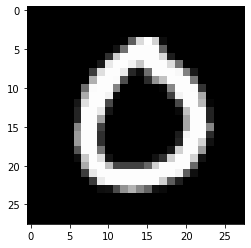

pred :  0 [1.00000000e+00 3.08109165e-08 4.18519051e-07 2.30848070e-08
 3.36880377e-15 1.42749421e-08 1.57962120e-07 1.52136863e-07
 1.81558802e-14 1.08519195e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


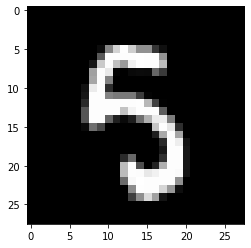

pred :  5 [1.4462961e-10 1.5790105e-08 2.1115573e-10 1.1996068e-05 2.5171645e-13
 9.9919581e-01 1.3311515e-09 1.8463345e-09 2.4708960e-08 1.5920401e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


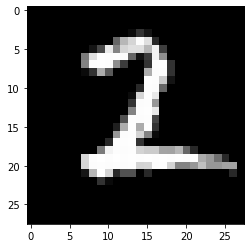

pred :  2 [8.5440795e-12 8.7648223e-05 9.9999511e-01 1.6691549e-08 3.0232891e-13
 1.7033679e-07 7.3931072e-10 3.4907782e-10 1.2410455e-07 6.1189619e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


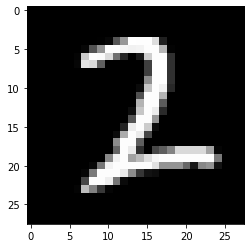

pred :  2 [9.9029440e-10 4.0075043e-05 9.9996775e-01 8.5701785e-08 1.4217233e-11
 1.6351535e-07 9.5993748e-11 1.5652939e-09 1.2181847e-06 1.5559272e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


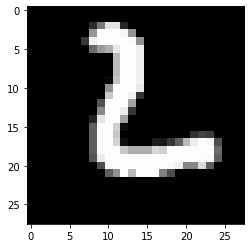

pred :  2 [1.4143736e-05 1.1233371e-05 9.6489322e-01 2.0951703e-07 3.0009748e-13
 3.6421030e-10 4.4741154e-02 1.4372554e-16 2.4926206e-10 2.8859558e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


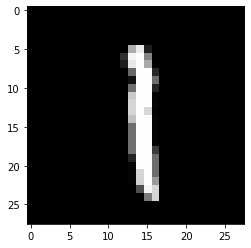

pred :  1 [2.2110872e-14 9.9999678e-01 2.1758634e-08 1.1656180e-08 3.0532451e-08
 2.5094133e-07 3.8793564e-07 2.8172795e-05 9.1518251e-07 2.3944203e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


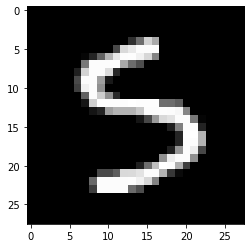

pred :  5 [1.5328503e-13 2.1976510e-09 1.8337561e-09 1.6937298e-05 1.4316017e-14
 9.9996912e-01 1.6454457e-10 2.3056810e-09 1.4514100e-08 5.5840611e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


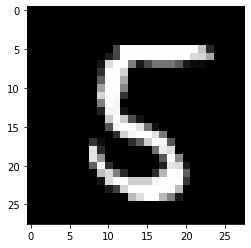

pred :  5 [1.6791150e-11 2.9359455e-07 8.6081977e-09 1.4391615e-09 8.8990725e-12
 9.9999964e-01 2.1839952e-07 2.4035128e-13 1.6922297e-07 3.0930343e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


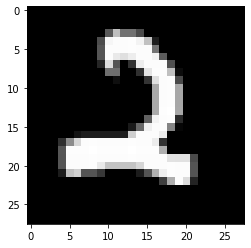

pred :  2 [1.7308231e-12 5.9375552e-08 1.0000000e+00 6.0501670e-06 9.4693415e-13
 1.9531790e-06 1.0763054e-11 1.8518593e-11 1.3139972e-14 1.2721655e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


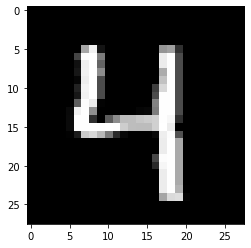

pred :  4 [7.4673850e-13 2.5033944e-09 1.2461830e-11 2.6771173e-07 1.0000000e+00
 1.6832951e-07 2.1424318e-12 3.3109490e-08 1.9071383e-10 5.7720882e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


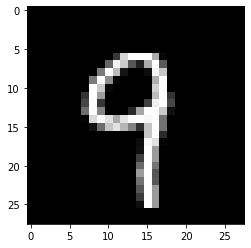

pred :  9 [9.7491383e-13 3.1957692e-10 9.3906979e-11 4.0010520e-10 9.5337291e-06
 1.3177986e-08 3.4230431e-11 4.0676601e-05 3.1515178e-06 9.9999779e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


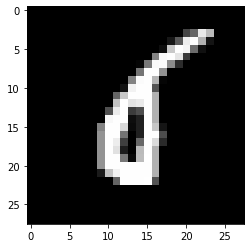

pred :  6 [9.2161777e-08 1.8506016e-06 2.9522386e-07 3.7366638e-12 7.3778476e-11
 1.2508035e-04 1.0000000e+00 9.3326388e-13 4.6400564e-05 1.3585776e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


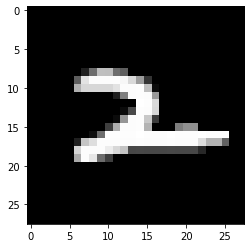

pred :  2 [7.16507420e-13 1.87353049e-08 9.99999046e-01 1.21753487e-07
 4.99173041e-07 3.87933987e-08 1.18843836e-07 1.44956684e-05
 5.42890746e-08 5.79530646e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


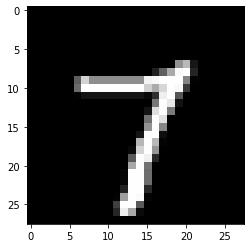

pred :  7 [1.0903553e-12 4.9623949e-08 1.9953244e-09 3.0115489e-05 1.3732306e-10
 6.1940352e-07 3.9025814e-13 9.9999976e-01 3.9593946e-11 3.0373923e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


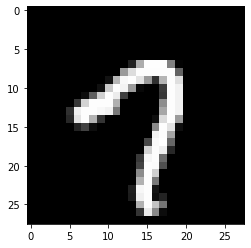

pred :  7 [2.8656391e-08 8.3213709e-13 2.4047742e-09 2.5732216e-10 1.6209588e-06
 2.1230153e-09 1.9435953e-11 9.9998701e-01 1.1190321e-13 7.6079641e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


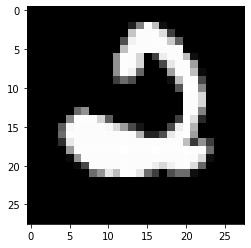

pred :  2 [2.1164285e-06 3.2115008e-08 9.9794781e-01 6.4748224e-07 4.6469084e-10
 7.4690348e-10 3.6544061e-06 3.5836698e-13 2.0920512e-13 1.3598128e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


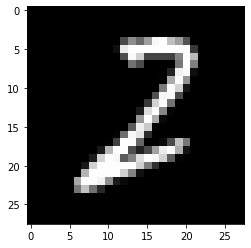

pred :  2 [1.6588148e-08 6.6613022e-05 9.9932361e-01 3.8839913e-05 2.2530204e-14
 4.7773156e-08 3.4074565e-10 6.2380690e-07 1.9357911e-07 5.1846732e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


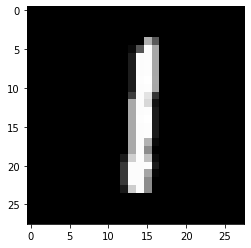

pred :  1 [1.20048554e-11 9.99999404e-01 2.51710350e-08 5.98782663e-07
 5.23028554e-09 5.46677711e-06 5.47422951e-09 4.89986633e-07
 2.13460993e-07 7.48689555e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


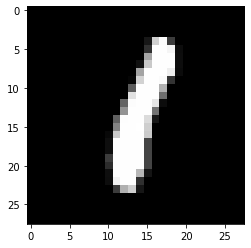

pred :  1 [4.2441284e-06 9.9999487e-01 3.0354059e-07 2.9822764e-09 1.2556811e-06
 1.9094625e-08 9.6632539e-06 1.3694578e-06 5.1459090e-05 3.9373613e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


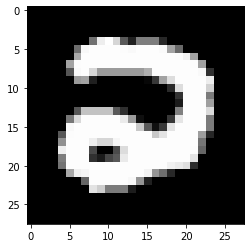

pred :  2 [2.2891164e-04 9.0940059e-14 9.9995267e-01 2.9190131e-05 1.0563074e-11
 1.4968080e-09 3.3190156e-07 2.8641867e-11 7.0267947e-10 4.6426803e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


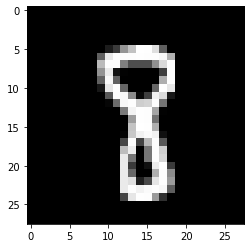

pred :  8 [9.96113059e-08 1.38333203e-08 2.64427570e-07 2.61213336e-05
 1.08425779e-09 1.16873189e-09 1.00443556e-10 7.07037007e-09
 9.99999046e-01 7.64131546e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


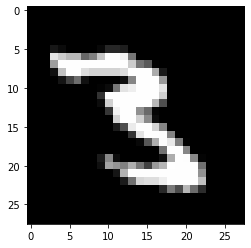

pred :  3 [1.6026070e-12 1.7416477e-04 1.6950531e-07 9.9910331e-01 2.0762858e-09
 1.5504718e-10 3.8826836e-13 5.1214660e-10 2.6525497e-02 1.5528705e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


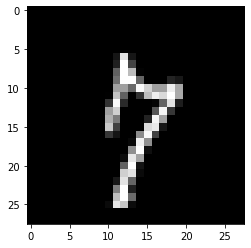

pred :  7 [3.9212518e-12 1.3773629e-07 1.9645639e-11 1.0333709e-10 6.6753328e-03
 3.4928064e-06 8.9233274e-12 9.9830759e-01 1.5643725e-08 9.8368396e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


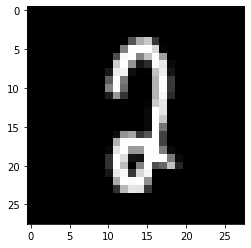

pred :  2 [2.1426602e-05 3.4033764e-07 9.9991691e-01 3.8149574e-07 1.1303160e-12
 2.4729825e-06 1.7977233e-06 1.1483926e-05 1.1286139e-03 8.9270783e-05]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


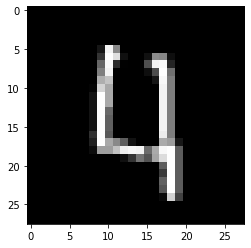

pred :  4 [6.0043321e-06 8.9971195e-09 2.7013286e-08 6.7056793e-10 9.9999583e-01
 1.0639676e-04 4.8702992e-10 7.7875802e-06 8.5294133e-11 1.4123321e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


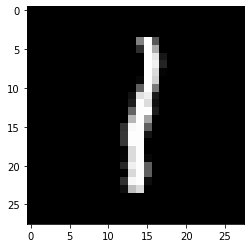

pred :  1 [3.4402377e-11 9.9999785e-01 1.7627882e-07 1.2561662e-06 2.5762397e-08
 9.0047934e-07 6.0784617e-09 2.9872137e-08 6.5668837e-07 3.5506023e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


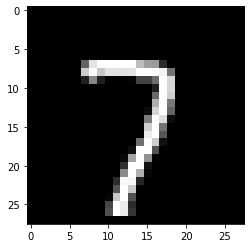

pred :  7 [9.1754503e-12 1.6909519e-11 7.0057105e-08 3.9807926e-08 7.2771091e-15
 6.8794422e-11 1.2196492e-14 1.0000000e+00 1.1280583e-13 9.5541478e-11]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


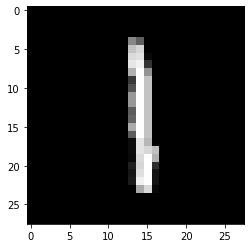

pred :  1 [9.5512906e-14 9.9999911e-01 1.4157911e-08 6.4162329e-08 7.4293371e-10
 1.9074123e-05 5.9332645e-08 5.8336568e-06 8.8098903e-07 1.0845924e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


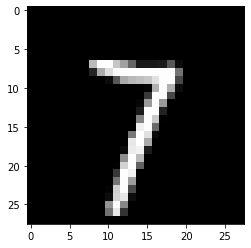

pred :  7 [3.2405075e-11 6.4481463e-07 1.6687744e-10 3.2215066e-08 4.1442197e-12
 6.6753969e-10 7.5700563e-15 9.9999976e-01 6.4053408e-11 6.3928335e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


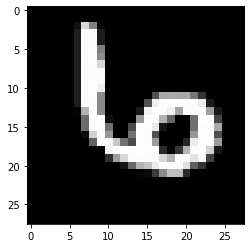

pred :  6 [4.1277107e-11 2.3115616e-07 4.3603947e-08 2.0490807e-09 5.8386246e-05
 1.1292182e-10 1.0000000e+00 1.0674429e-07 1.4103818e-08 3.4762355e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


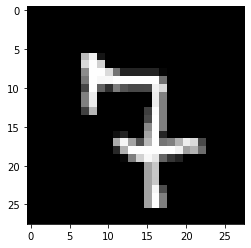

pred :  7 [1.40029243e-12 6.25274410e-09 2.11805105e-04 6.41436992e-09
 1.90789713e-08 3.92592199e-08 4.11809742e-05 9.99998808e-01
 1.61925371e-07 1.18593285e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


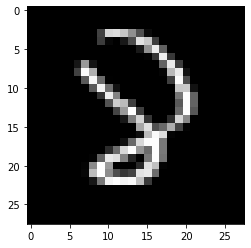

pred :  2 [1.0295018e-05 3.1459935e-11 3.7597963e-01 2.0369887e-04 4.4706231e-12
 4.9620114e-10 4.0754378e-03 4.8212034e-10 1.3705760e-01 1.7060731e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


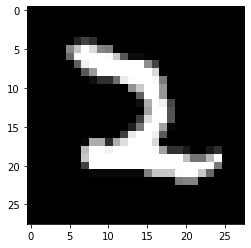

pred :  2 [2.6386626e-15 8.7756515e-03 9.9998951e-01 2.3375844e-06 2.7073916e-14
 5.5789371e-07 1.5774848e-11 1.5659137e-07 6.1620509e-10 6.3593897e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


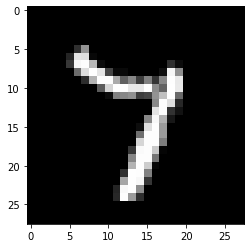

pred :  7 [4.6685589e-10 5.9697970e-07 3.2034023e-07 9.8960573e-09 1.6179053e-08
 1.5118783e-08 4.2895843e-12 1.0000000e+00 1.0515534e-07 8.2077747e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


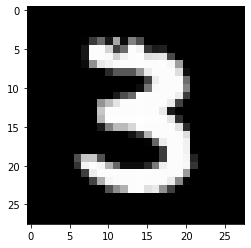

pred :  3 [2.0665389e-09 8.7477897e-10 4.0847663e-08 1.0000000e+00 2.4300401e-10
 1.5278300e-09 8.0753309e-15 2.9831309e-12 3.5582957e-07 2.9209177e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


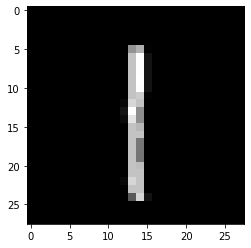

pred :  1 [2.6848090e-12 9.9900949e-01 7.1471122e-09 4.2396784e-04 2.8250480e-10
 1.1976041e-05 3.6195631e-09 3.9458987e-06 4.2660658e-06 5.0519755e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


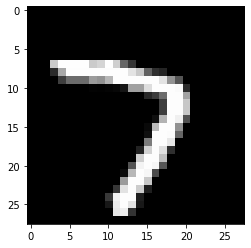

pred :  7 [6.81178447e-10 1.09873265e-13 3.33643840e-07 7.33557326e-10
 1.27825821e-12 2.49336107e-11 2.60456343e-13 1.00000000e+00
 3.63314034e-13 4.33576162e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


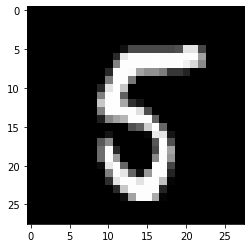

pred :  5 [2.3682074e-07 4.2783883e-09 1.2355269e-09 5.7838189e-11 2.6499299e-15
 9.9996066e-01 5.1033830e-06 1.5673904e-10 2.2119334e-06 6.9689975e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


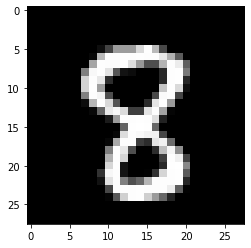

pred :  8 [1.1742118e-07 1.5772652e-11 6.7627430e-04 2.3474397e-05 1.0915160e-09
 4.9803992e-07 1.2122914e-08 9.8048125e-11 9.9995828e-01 5.7359784e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


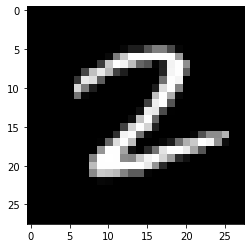

pred :  2 [7.3987951e-13 3.0104291e-05 1.0000000e+00 4.6953113e-07 7.5833728e-17
 2.0434099e-07 3.6293088e-10 1.4292134e-06 1.6359974e-07 1.1635917e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


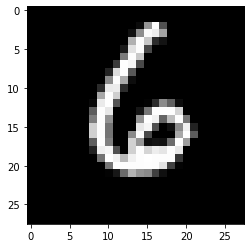

pred :  6 [2.1944361e-11 8.4393816e-09 1.1790611e-08 3.2968413e-07 5.6756054e-08
 1.6680434e-09 1.0000000e+00 1.3691168e-10 2.4303102e-09 2.9880471e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


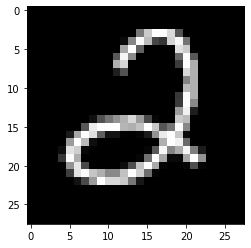

pred :  2 [6.6149142e-10 2.6914410e-10 9.9998146e-01 1.5292777e-05 2.8803468e-08
 2.4720745e-08 4.3881548e-07 1.5319793e-13 1.6544163e-08 2.4208543e-16]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


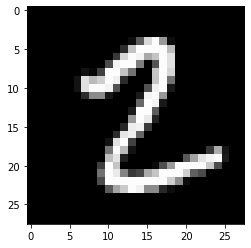

pred :  2 [1.5306565e-05 7.2257222e-05 9.9998719e-01 8.6280880e-07 2.9346893e-14
 6.9907209e-08 1.0257385e-09 1.6777504e-12 3.9568775e-07 2.1852274e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


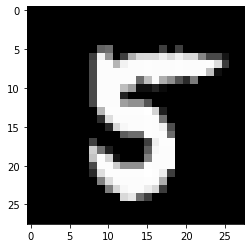

pred :  5 [2.81861617e-10 1.11830406e-10 5.96468075e-09 2.71410405e-09
 5.74097925e-14 1.00000000e+00 7.05860270e-14 3.06627390e-10
 4.37354265e-06 7.66048203e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


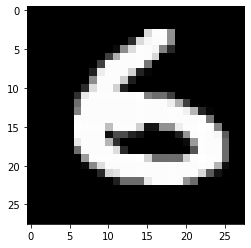

pred :  6 [4.3181228e-10 1.0217960e-09 2.8033401e-07 4.9925637e-09 2.6784691e-10
 1.1087149e-02 9.9998403e-01 6.8924695e-19 2.9084827e-06 1.3582842e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


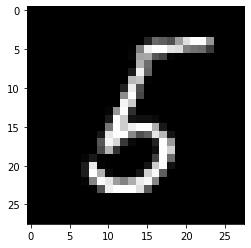

pred :  6 [6.1142753e-09 2.7190358e-06 2.1488246e-08 4.5384752e-10 9.9660613e-10
 1.2985659e-01 1.5231177e-01 5.9879422e-14 1.3136986e-07 2.8926128e-12]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


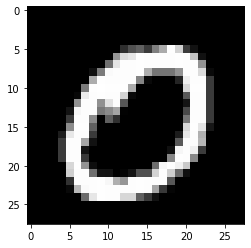

pred :  0 [9.9999917e-01 3.8385693e-07 3.2530590e-08 6.9824518e-10 5.1907978e-14
 2.2134263e-05 5.4477806e-10 1.1975362e-04 4.0316017e-14 1.4793768e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


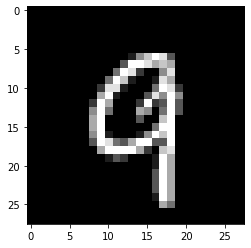

pred :  9 [4.6256282e-06 7.9782420e-10 4.3845721e-06 7.2193711e-07 4.9012478e-06
 1.4118210e-09 6.2893057e-10 1.6606865e-07 3.2536653e-09 9.9999976e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


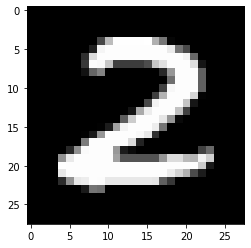

pred :  2 [2.9402759e-06 1.3289958e-08 9.9999917e-01 8.3894133e-07 2.7893107e-16
 2.2358394e-08 3.6784794e-12 1.0829685e-12 7.0328888e-08 1.7546685e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


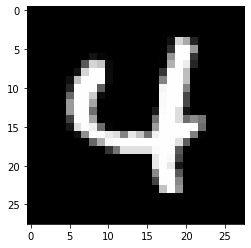

pred :  4 [1.09004716e-09 4.81568896e-10 4.17533741e-08 5.56583446e-10
 1.00000000e+00 1.02344275e-08 5.93383259e-11 3.90941022e-05
 6.29761243e-10 3.80535903e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


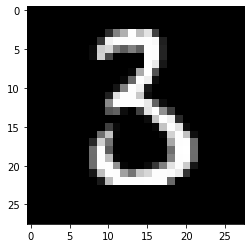

pred :  3 [1.0926017e-08 1.3287773e-05 6.6960780e-07 9.9972987e-01 1.0054389e-12
 2.0890391e-05 5.4473912e-08 3.0380729e-11 6.5122759e-07 4.7211673e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


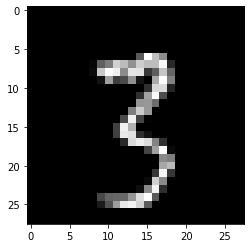

pred :  3 [1.5254902e-11 2.6700084e-09 1.9924873e-09 9.9995100e-01 3.9907930e-14
 1.0480533e-05 3.1601849e-16 4.4244740e-07 1.1604301e-05 9.8182218e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


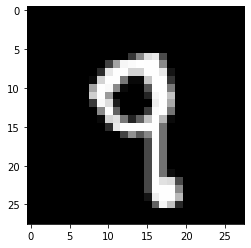

pred :  9 [6.4030109e-10 7.5981492e-11 2.9606406e-07 8.3672722e-07 2.6674268e-06
 2.2488444e-09 5.7959024e-18 7.4082152e-07 8.5338770e-06 9.9999130e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


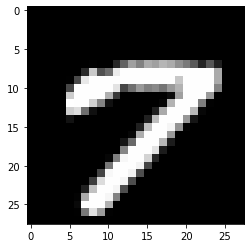

pred :  7 [1.7811645e-10 1.2416169e-17 5.7546068e-10 9.4553968e-08 7.0898392e-14
 8.6260803e-09 5.0126032e-12 9.9999869e-01 4.9087180e-06 3.7210668e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


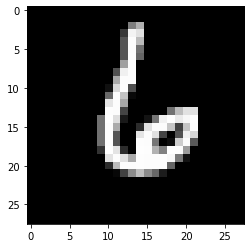

pred :  6 [5.4408439e-10 3.1251884e-10 5.2832329e-06 7.3086412e-08 1.4035047e-07
 1.6666686e-10 1.0000000e+00 8.4833481e-08 4.5936616e-11 2.1553276e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


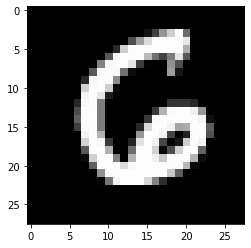

pred :  6 [3.9313567e-05 6.5030724e-07 2.6180626e-08 5.2112631e-14 1.6128199e-10
 4.2368411e-06 9.9997890e-01 2.6036731e-10 3.1012541e-09 2.6792386e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


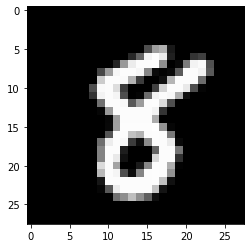

pred :  8 [3.37005446e-09 1.07495906e-08 8.15667988e-07 4.90023311e-08
 9.11980103e-10 1.25488259e-06 4.29366537e-06 3.67882003e-10
 9.99999583e-01 2.02785509e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


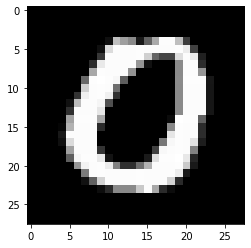

pred :  0 [9.9999785e-01 6.8828188e-10 2.1848452e-07 1.5613758e-09 4.5782669e-11
 2.0795010e-08 4.9229652e-06 2.9539930e-07 1.6022150e-13 1.9383635e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


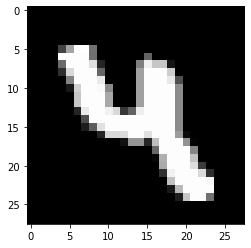

pred :  4 [1.0890448e-14 6.0663844e-08 2.5424521e-10 1.9316963e-06 9.9923730e-01
 2.5036860e-07 3.1762426e-11 3.5087044e-08 4.9364567e-04 1.8422630e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


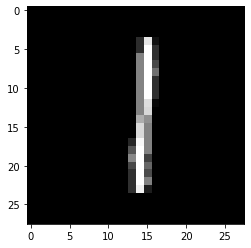

pred :  1 [7.5620767e-11 9.9999893e-01 2.2228534e-08 2.2904199e-08 3.1964124e-08
 1.8644074e-05 6.5595973e-09 4.3036393e-06 5.7003518e-08 7.1496110e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


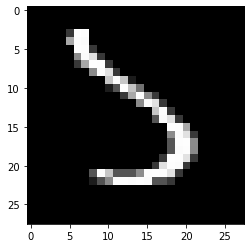

pred :  3 [1.32566215e-11 1.27792358e-04 9.40698452e-09 7.52619922e-01
 2.75849510e-14 1.67906284e-04 1.30097726e-06 4.08384722e-06
 5.59398665e-13 4.29772484e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


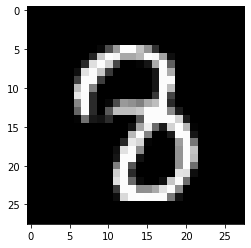

pred :  8 [6.1706544e-08 1.1324492e-10 1.3654704e-05 2.8367802e-05 4.1475312e-09
 3.0999178e-07 9.0688512e-11 1.4691919e-07 9.9995041e-01 5.0829804e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


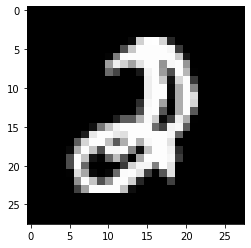

pred :  2 [1.1864113e-07 1.7994204e-09 9.6718991e-01 5.0078863e-01 2.0691912e-11
 7.8788581e-10 3.3531354e-08 3.2725584e-05 4.0273908e-06 5.7780141e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


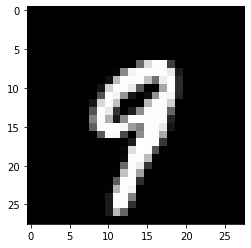

pred :  9 [4.8419727e-11 7.0725514e-10 6.5590372e-12 6.2873298e-09 9.7871434e-06
 5.7388694e-09 2.0076147e-11 2.1540732e-06 1.5702826e-08 9.9999970e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


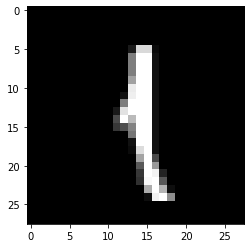

pred :  1 [2.0447039e-13 9.9990892e-01 1.1119642e-09 5.4562612e-08 6.7639351e-04
 8.9341938e-08 4.0434966e-08 1.2856119e-06 1.6986002e-07 1.2284341e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


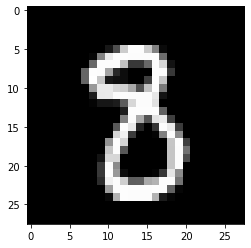

pred :  8 [8.8529453e-07 8.7838826e-11 2.6735663e-04 4.7692538e-06 1.5259478e-10
 8.2781426e-08 9.9249930e-10 2.9080014e-09 9.9999857e-01 3.2948440e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


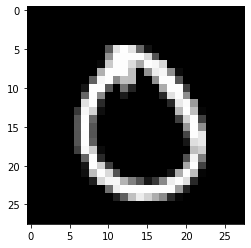

pred :  0 [9.9999774e-01 4.3778092e-09 1.6215444e-04 1.2945198e-09 2.6545235e-11
 1.4674220e-05 5.9445213e-09 4.4144599e-09 5.8948242e-11 3.7419848e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


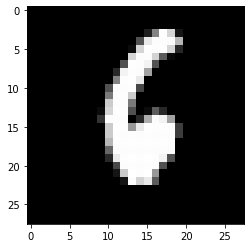

pred :  6 [6.1522681e-10 1.9331861e-07 4.9323097e-07 6.7339370e-11 1.6847750e-06
 6.9773370e-05 1.0000000e+00 7.8587165e-10 9.6267538e-10 2.2037963e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


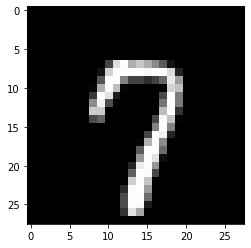

pred :  7 [5.9162488e-07 9.6319237e-12 1.2252155e-05 9.3444391e-11 2.5029671e-11
 2.3990063e-07 4.1394064e-13 9.9999332e-01 4.7393513e-12 1.5673173e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


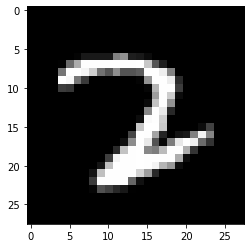

pred :  2 [9.4738271e-12 1.6501546e-04 9.9998379e-01 1.0534665e-07 3.0761413e-12
 2.9245560e-12 1.9344006e-06 1.2274674e-04 1.6506890e-10 6.6954289e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


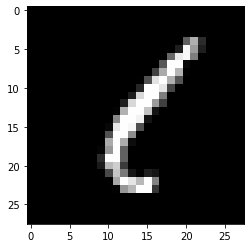

pred :  1 [2.3028429e-08 9.8930627e-01 1.9503680e-08 7.3304722e-09 2.6307157e-07
 4.5816611e-07 1.2400746e-04 9.4803490e-09 5.9219271e-01 2.1324865e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


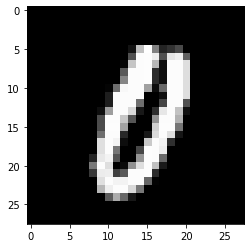

pred :  0 [9.9963200e-01 2.9106332e-08 8.0961108e-06 5.0434068e-08 1.4876477e-07
 4.7256974e-05 1.0736937e-06 2.0808818e-06 1.5190244e-04 7.5125871e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


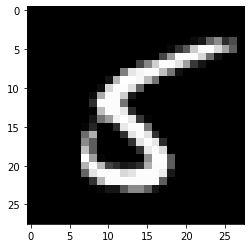

pred :  5 [6.9552628e-12 9.4985980e-06 1.0854925e-10 2.2431102e-11 1.8331047e-14
 9.9999923e-01 9.0561258e-08 5.4176725e-16 2.4228921e-08 2.2159945e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


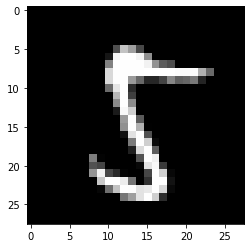

pred :  5 [1.3231599e-13 2.1024350e-06 3.6057830e-04 1.4731532e-08 3.0003083e-11
 9.9999380e-01 4.2822635e-14 2.8644543e-11 4.3062219e-06 1.6152188e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


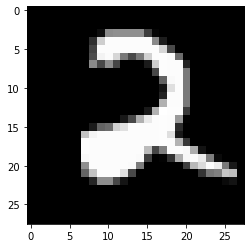

pred :  2 [1.5204249e-10 3.1254568e-10 1.0000000e+00 2.5186522e-10 9.7611958e-13
 7.2444927e-08 1.7063741e-07 1.4132225e-12 1.4183161e-11 8.5599548e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


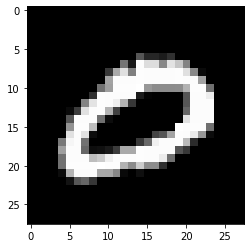

pred :  0 [9.9994349e-01 3.6018172e-12 1.0366970e-05 1.5566894e-09 5.9474585e-09
 2.6376995e-07 1.1514983e-07 6.8230527e-08 1.7402854e-14 3.2924774e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


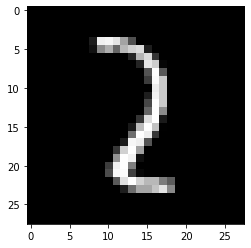

pred :  2 [4.0957822e-08 1.2064309e-05 9.9999684e-01 3.5298740e-07 1.9077423e-10
 7.0781718e-12 2.0106452e-08 7.0623678e-08 3.8679787e-05 2.3547858e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


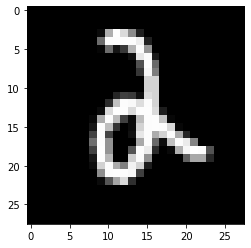

pred :  2 [2.4818292e-09 6.5421548e-09 9.9999958e-01 1.1300166e-04 5.7582878e-07
 8.3953637e-08 1.4043997e-06 1.3454548e-11 2.0082525e-09 9.5629303e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


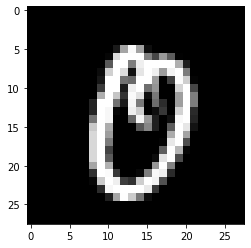

pred :  0 [9.9992716e-01 1.4570490e-08 6.7838602e-07 5.8340265e-07 3.2515868e-13
 1.6394258e-04 6.0419616e-08 2.2563677e-07 5.9005618e-04 1.2499094e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


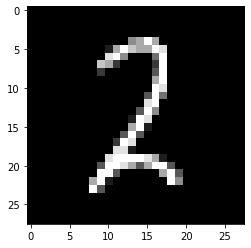

pred :  2 [7.3258663e-11 1.4730394e-03 1.0000000e+00 4.1387299e-08 3.3226161e-11
 1.1875949e-06 6.2706410e-11 1.3587712e-09 3.0834315e-08 2.1683850e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


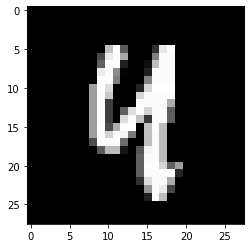

pred :  9 [2.8676567e-08 1.1783197e-07 2.0113307e-09 1.1832758e-05 2.7874333e-01
 6.0447945e-07 1.0875183e-08 1.5119755e-07 1.8926661e-05 3.5226601e-01]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


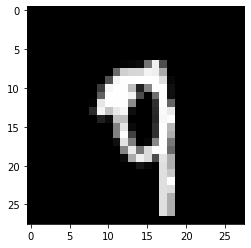

pred :  9 [1.4860893e-05 2.0827180e-10 1.5687095e-06 4.9947351e-07 3.2571195e-06
 9.1517813e-07 3.7351029e-12 1.8784791e-02 2.2446406e-07 9.6588862e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


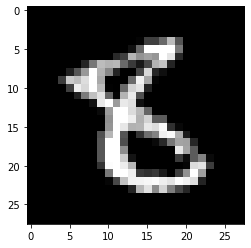

pred :  8 [2.5102810e-08 7.4056643e-11 8.7153730e-06 4.8476325e-09 6.1331590e-10
 4.4672787e-03 1.0011792e-03 5.2975686e-11 9.9693829e-01 2.5430522e-11]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


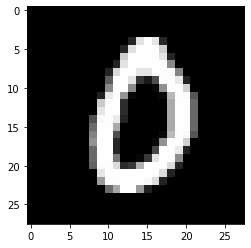

pred :  0 [1.00000000e+00 4.56427535e-10 1.06536165e-04 4.41676136e-08
 3.30983921e-11 1.11305383e-07 2.14930935e-07 3.61365848e-09
 8.27690305e-10 1.56025430e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


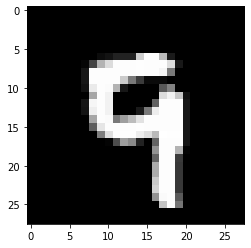

pred :  9 [1.7087799e-12 8.6980953e-17 2.3841573e-10 6.0349016e-06 2.0184452e-06
 1.8210411e-09 1.1905488e-10 5.6895387e-06 2.2675797e-06 9.9999851e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


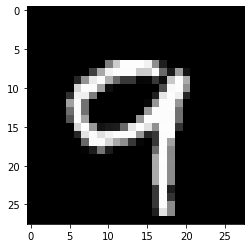

pred :  9 [2.0396122e-10 4.6266354e-15 1.0392336e-06 6.3397922e-05 2.1045674e-08
 4.5135676e-11 2.8649709e-09 5.6277546e-08 5.0157283e-09 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


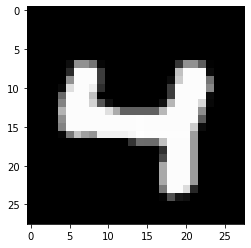

pred :  4 [2.3937498e-13 1.5265809e-12 6.0157667e-08 1.5937427e-08 9.9999821e-01
 1.0593961e-08 1.8815817e-11 1.0740415e-07 4.9300808e-05 4.0139992e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


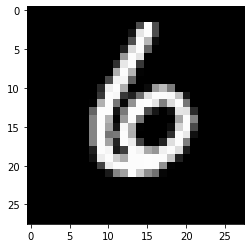

pred :  6 [3.3003269e-07 1.6794394e-10 1.9190541e-06 1.4061708e-05 1.9892861e-09
 9.9731028e-07 1.0000000e+00 1.4340232e-10 4.5100030e-08 5.0543923e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


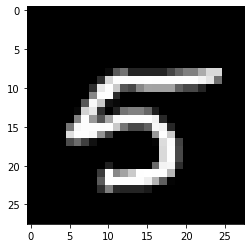

pred :  5 [8.2603274e-10 2.5333756e-14 7.5024097e-08 3.0583085e-09 1.7090466e-09
 9.9999893e-01 1.3121804e-08 1.5005363e-06 3.1797995e-08 4.4241979e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


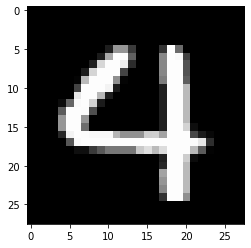

pred :  4 [1.49429780e-09 4.51106736e-13 5.22542223e-08 1.84170058e-11
 9.91167367e-01 1.02446025e-08 2.39141471e-08 2.78205380e-06
 1.41709265e-07 8.49434614e-01]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


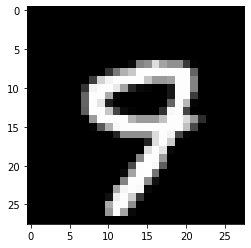

pred :  9 [3.3554431e-13 1.5234079e-19 2.0805094e-11 2.4281153e-06 2.2008034e-07
 1.4842367e-07 2.0022121e-14 5.4294569e-06 1.0027994e-09 9.9999976e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


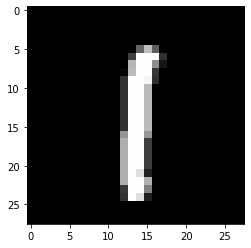

pred :  1 [6.1163574e-11 9.9998385e-01 1.3750116e-08 5.6436203e-08 6.6932300e-11
 4.9187743e-06 1.7898831e-06 4.1296484e-05 2.8935075e-04 4.0492330e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


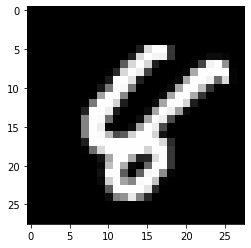

pred :  8 [8.1828077e-08 1.9254433e-13 3.3782005e-06 4.3918644e-05 5.3876638e-03
 4.5163711e-07 2.6689077e-06 8.4170487e-10 8.9593494e-01 1.1686947e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


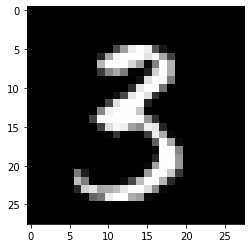

pred :  3 [1.83157145e-09 3.54093466e-08 3.34348070e-11 1.00000000e+00
 7.86846144e-11 2.72815032e-06 1.50667976e-15 5.42629330e-10
 5.33046943e-07 1.06468505e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


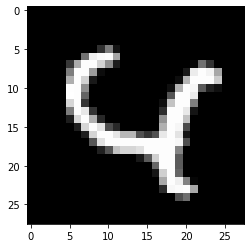

pred :  4 [2.1344468e-11 6.9761210e-16 3.0463752e-06 9.9762885e-11 9.9999648e-01
 2.9807367e-08 1.2362907e-09 7.4755168e-05 7.2871109e-07 3.6472678e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


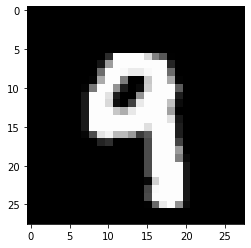

pred :  9 [2.27726102e-11 1.05929345e-11 1.30412872e-08 8.96538131e-06
 1.01713813e-05 1.84699065e-08 9.63375159e-14 1.28817021e-07
 5.76782950e-05 9.99990225e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


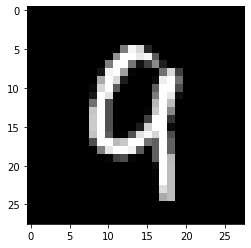

pred :  9 [5.8653677e-07 4.3228634e-09 9.0176241e-07 5.1805097e-07 8.5517764e-04
 6.8318293e-08 5.4232718e-10 5.0073265e-07 1.8343457e-07 9.9999541e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


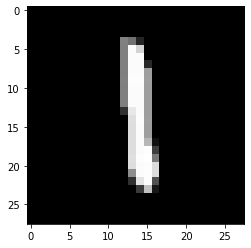

pred :  1 [4.5135545e-13 9.9999976e-01 1.9237891e-06 5.3187268e-08 5.6196562e-08
 5.9132567e-06 3.0891297e-08 9.7299180e-06 1.5218293e-06 7.7783717e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


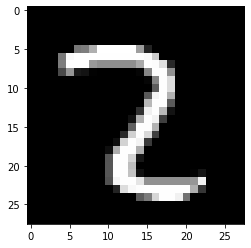

pred :  2 [1.5858626e-07 1.6663151e-07 9.9999416e-01 3.1730929e-06 1.8194432e-10
 8.8272601e-12 3.4318718e-13 5.5411147e-07 4.9525092e-06 3.8698079e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


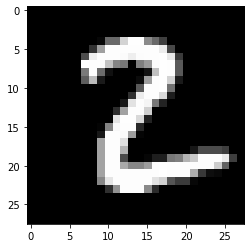

pred :  2 [3.4012282e-07 5.0037389e-08 9.9999821e-01 1.6810090e-07 6.9390130e-17
 6.7057499e-08 1.2203653e-11 1.8642673e-14 3.3561427e-08 6.6541737e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


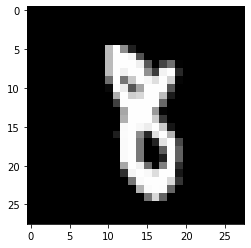

pred :  8 [2.6229959e-08 3.4325659e-01 1.7621292e-07 3.8635731e-04 5.4112089e-08
 4.8735144e-10 3.9854044e-08 1.1368664e-06 9.1602302e-01 3.7109423e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


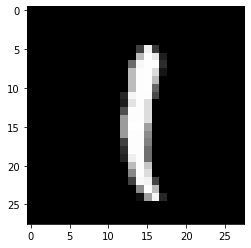

pred :  1 [6.0051762e-11 9.9998796e-01 1.8546228e-08 9.4271292e-07 1.3155108e-08
 6.3475051e-07 9.2747413e-08 9.4702375e-07 7.5940679e-06 1.2150172e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


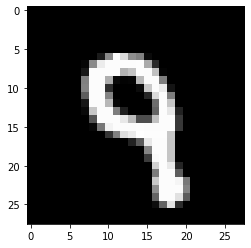

pred :  9 [1.0992688e-10 4.1131005e-11 4.0880789e-08 9.5539381e-09 1.3721883e-03
 1.5312235e-08 1.4618165e-13 1.6480144e-05 9.7014636e-06 9.9955970e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


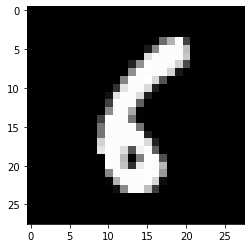

pred :  6 [4.5934695e-07 1.6495270e-07 1.9654590e-06 9.5937503e-12 1.2629275e-12
 1.1139985e-04 9.9999821e-01 2.4350925e-14 2.2536516e-04 5.4603184e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


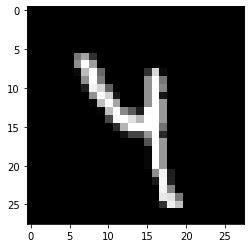

pred :  4 [3.6239301e-16 5.1158255e-09 3.2446483e-09 1.4642731e-08 9.9999982e-01
 6.2435439e-09 8.2132739e-14 4.7941961e-07 5.1927695e-06 4.9858642e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


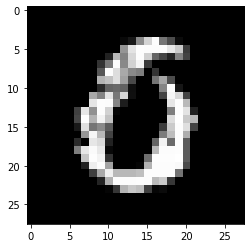

pred :  0 [9.9412274e-01 2.9248728e-09 1.7569006e-07 1.4530310e-11 6.7821651e-09
 5.1062698e-06 2.8088391e-03 5.8333254e-09 3.4974208e-11 1.9165840e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


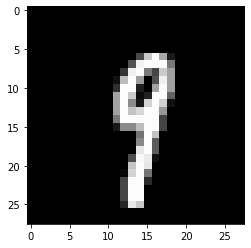

pred :  9 [4.45485662e-13 1.05597974e-04 9.42050864e-12 1.16251192e-06
 1.71512365e-04 2.59669797e-08 3.54868426e-11 6.12881195e-07
 2.07393191e-06 9.99972224e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


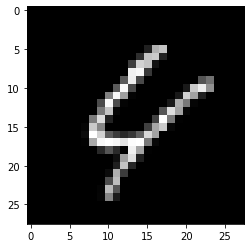

pred :  4 [1.13001704e-07 1.82291771e-09 3.61897000e-05 4.72555985e-06
 9.98340487e-01 9.84043291e-10 7.58796148e-07 1.19623138e-08
 1.03519385e-04 8.29517841e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


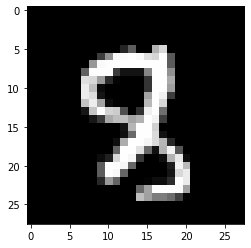

pred :  8 [3.8307231e-08 3.5269753e-08 9.6853077e-03 2.1181215e-07 1.5599471e-09
 2.4709243e-08 7.4215334e-10 2.2238755e-06 9.9525058e-01 1.5811205e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


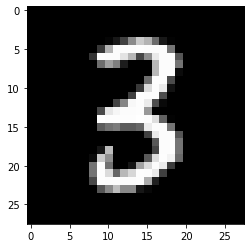

pred :  3 [1.0239640e-08 2.0128821e-08 1.3568581e-06 1.0000000e+00 1.2578419e-10
 6.2362093e-10 3.0538752e-11 5.5377941e-10 2.3814566e-07 3.3205192e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


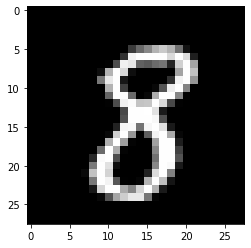

pred :  8 [5.0608939e-09 1.1484708e-08 4.2750358e-07 2.4820247e-06 3.3068703e-09
 1.0974123e-07 2.9801470e-07 1.8907204e-10 9.9999368e-01 8.2053057e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


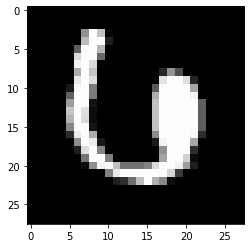

pred :  6 [3.2357861e-05 5.2026054e-13 2.1080476e-07 5.5426894e-09 1.3763689e-05
 5.3581082e-13 9.9651670e-01 6.4655542e-03 2.2369110e-11 1.6317366e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


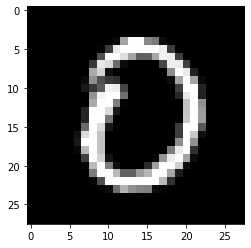

pred :  0 [9.99998868e-01 1.75680503e-09 1.47944957e-06 6.07118533e-09
 1.16875745e-11 1.92417327e-09 1.34261336e-05 1.38619249e-08
 2.67312440e-11 4.85999237e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


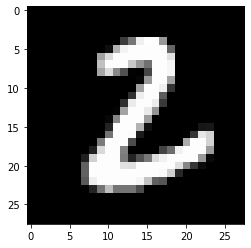

pred :  2 [5.5112221e-09 1.1373300e-05 9.9999362e-01 4.2985471e-07 1.6297417e-17
 6.3318821e-09 3.1515970e-11 1.5647938e-11 3.6377901e-07 1.0752270e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


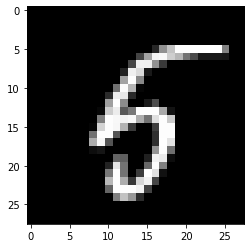

pred :  5 [8.2288057e-12 7.4568178e-11 7.9186918e-10 5.2843008e-10 5.7668909e-10
 9.9964225e-01 9.1626346e-02 6.1819836e-13 8.7468838e-11 9.8982957e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


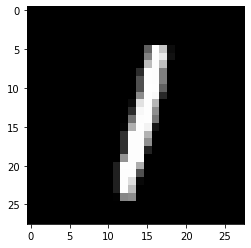

pred :  1 [4.7127729e-10 9.9999833e-01 9.7288591e-08 1.9817602e-10 6.6340726e-05
 4.9581161e-07 5.2320019e-09 2.4091976e-05 4.3999783e-08 3.2817871e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


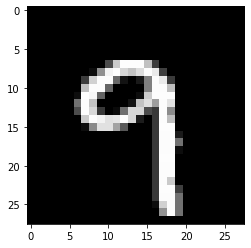

pred :  9 [1.2571620e-08 9.5978139e-12 2.4273776e-09 2.2481239e-09 7.9900673e-08
 6.8730259e-08 2.5157665e-14 2.8696773e-05 5.2564253e-10 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


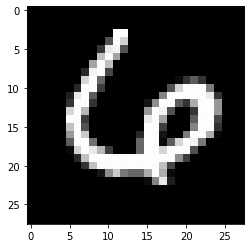

pred :  6 [7.70314455e-06 7.06944269e-12 3.02053450e-05 2.30879778e-08
 7.11140036e-10 1.19969815e-11 1.00000000e+00 3.11545364e-07
 1.40675610e-10 4.04996490e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


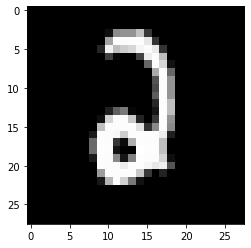

pred :  2 [3.8851249e-07 4.5103639e-12 1.0000000e+00 5.8376802e-08 5.2300586e-12
 1.0490928e-06 3.5366607e-05 4.7013260e-10 6.0900085e-09 2.2030112e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


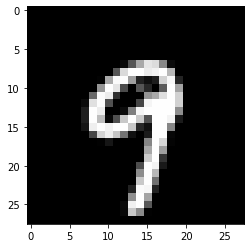

pred :  9 [9.3588826e-12 1.1503966e-14 3.1713123e-09 1.4779378e-06 9.7908675e-08
 1.3833947e-09 1.0601438e-12 1.2148654e-08 1.3753421e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


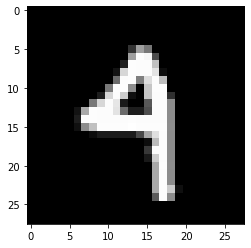

pred :  4 [1.3093583e-11 3.9048134e-10 1.4395501e-07 2.6561443e-07 9.9967170e-01
 3.3199211e-07 8.8835683e-13 1.0383256e-05 2.3090532e-08 3.3912063e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


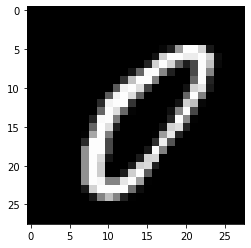

pred :  0 [9.9999362e-01 1.4935939e-09 4.9798221e-08 3.0636665e-10 2.0236991e-12
 2.2221127e-05 2.5658776e-08 1.4535868e-09 1.0585246e-06 1.9866320e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


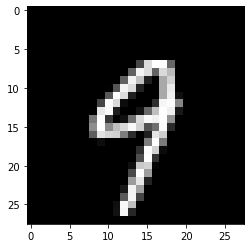

pred :  9 [7.8092654e-12 6.6528918e-12 7.9123658e-10 4.8787206e-07 3.3903732e-05
 1.5010974e-08 1.0028252e-11 1.0284460e-05 9.6491218e-11 9.9999720e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


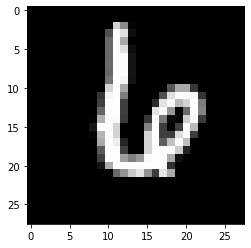

pred :  6 [3.3424911e-08 1.6076800e-12 2.8142333e-04 2.6527367e-11 4.3247542e-06
 1.3182623e-10 9.9999708e-01 5.6604161e-08 4.1763745e-11 7.5221685e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


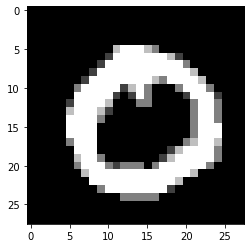

pred :  0 [1.0000000e+00 4.1652061e-07 5.8721623e-09 2.2368163e-06 2.7604147e-15
 1.6930878e-06 1.4441640e-08 4.5694866e-09 1.9320413e-11 2.5858812e-10]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


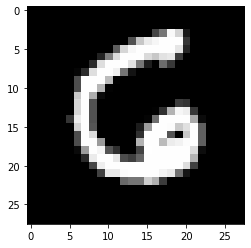

pred :  6 [5.4128941e-07 4.6550440e-06 3.4859463e-07 1.2058474e-13 3.9762714e-11
 1.2364984e-04 9.9889433e-01 3.8357224e-09 2.2784634e-12 6.4613749e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


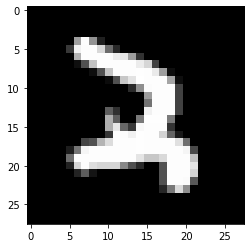

pred :  2 [1.11891040e-13 4.22656536e-04 9.98510480e-01 9.73105431e-04
 4.65775685e-08 6.70586189e-07 1.03096316e-10 4.76201620e-07
 5.95187528e-12 6.13221758e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


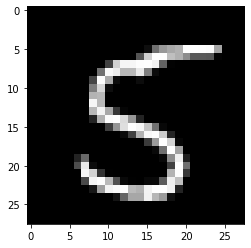

pred :  5 [5.7396411e-11 5.9354946e-08 4.9886513e-09 5.2382454e-08 5.0974134e-14
 9.9999946e-01 1.4683409e-10 3.8159444e-14 5.6902465e-09 1.8131098e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


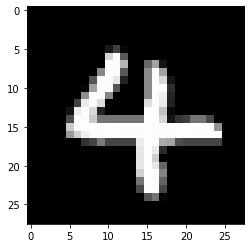

pred :  4 [1.0132261e-12 4.4311266e-10 5.2929150e-10 1.4453228e-10 1.0000000e+00
 1.9402547e-05 1.9846324e-05 4.6898873e-05 7.5786061e-12 3.9153760e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


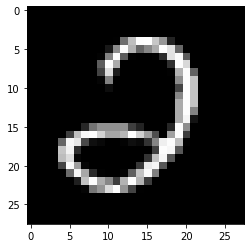

pred :  2 [8.5377433e-06 1.3972263e-09 9.9820054e-01 2.7012511e-08 1.4859397e-08
 6.5225343e-08 9.6130798e-11 2.7175942e-10 2.9421540e-07 1.5511195e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


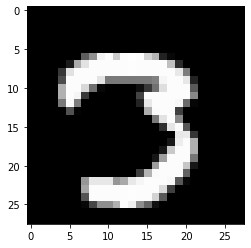

pred :  3 [2.0630860e-06 9.4241434e-11 3.5836227e-05 9.9981976e-01 8.1531783e-15
 9.0267531e-07 7.8516661e-16 1.1131426e-04 1.5808974e-15 2.2148547e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


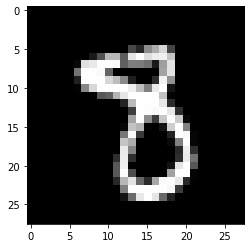

pred :  8 [2.6363213e-07 4.6201791e-08 3.9641862e-05 5.7593286e-03 2.3723961e-09
 5.4986355e-08 1.5833751e-11 1.1293621e-05 9.8968458e-01 1.5488267e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


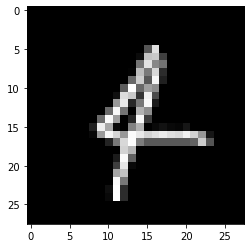

pred :  4 [3.65712322e-11 5.56821078e-07 3.49202892e-05 7.53216085e-08
 9.96480465e-01 1.54461795e-05 5.48713751e-06 1.07574066e-04
 4.65826089e-09 8.99173180e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


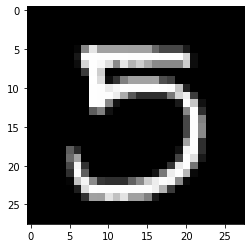

pred :  5 [4.3021337e-06 5.5980220e-09 1.2309825e-07 1.4296174e-04 7.7260389e-14
 9.5056731e-01 8.8672189e-16 2.5166237e-06 8.7090860e-13 6.4624839e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


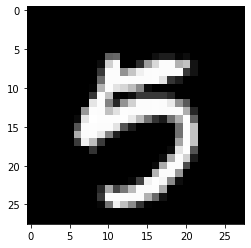

pred :  5 [2.6780875e-09 3.2345007e-10 5.1898746e-15 3.4022331e-04 2.8536668e-08
 9.9355000e-01 5.9153767e-12 3.8786368e-08 3.6365830e-07 2.7683467e-02]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


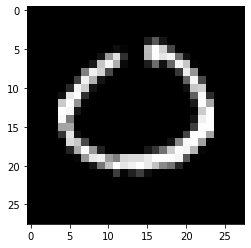

pred :  0 [9.89832044e-01 1.06331576e-07 9.56449497e-09 2.32250497e-10
 1.81469233e-13 8.95529354e-07 2.71054778e-05 9.39434841e-08
 4.64241872e-13 3.90887260e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


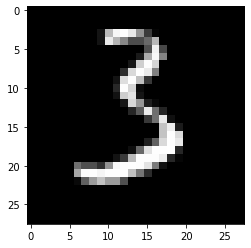

pred :  3 [3.4917556e-07 5.8299058e-05 7.8210235e-04 9.9998546e-01 1.4263107e-15
 1.6696620e-05 4.6731137e-07 1.1151915e-11 5.7120209e-15 6.6573730e-12]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


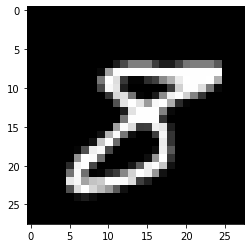

pred :  8 [3.4100609e-08 2.7643603e-08 8.5683801e-08 1.9390023e-09 2.8969209e-11
 7.2436603e-07 1.0302269e-12 6.7412398e-10 9.9953467e-01 8.8116931e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


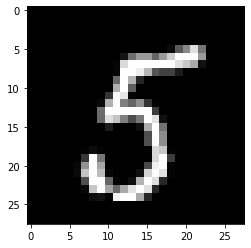

pred :  5 [3.3898245e-10 5.1776133e-06 7.1791813e-12 4.5683166e-10 1.5737252e-15
 9.9999958e-01 2.1294300e-10 8.5988881e-14 2.4672277e-06 4.1298945e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


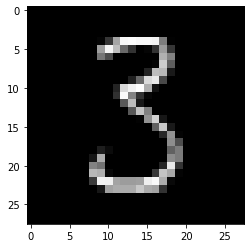

pred :  3 [6.6508396e-11 1.4120581e-05 9.6668941e-08 9.9977517e-01 6.2605610e-09
 5.2855590e-05 2.9460184e-10 5.2776522e-14 1.1020842e-04 2.5077003e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


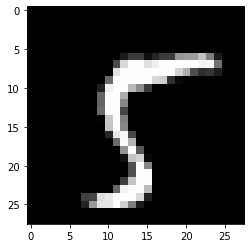

pred :  5 [1.7899068e-10 2.8836107e-09 1.5497865e-13 1.3706303e-07 1.7419732e-17
 1.0000000e+00 9.5522745e-14 1.5401866e-08 1.0423169e-09 1.2515642e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


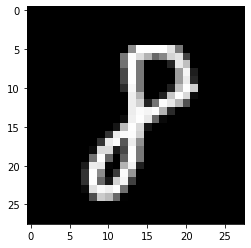

pred :  8 [4.4398362e-08 2.4180192e-06 3.2556272e-05 5.1537693e-08 1.7443623e-11
 6.2541545e-08 1.0720311e-08 1.0003489e-06 9.9999928e-01 1.3342509e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


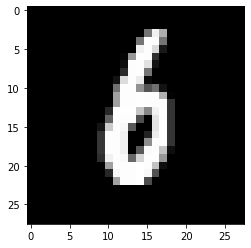

pred :  6 [1.4285244e-07 3.7500140e-05 3.9023271e-06 5.6039724e-09 8.9975231e-07
 2.8588752e-06 9.9997902e-01 3.0724093e-10 8.1690378e-06 6.9260397e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


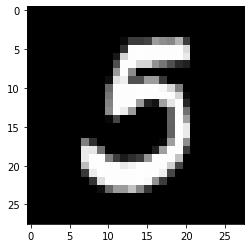

pred :  5 [5.2023830e-07 1.4325859e-07 1.3815127e-08 2.8856397e-03 1.4020816e-14
 9.9980509e-01 2.5957373e-08 3.2878610e-11 1.7452693e-09 8.6334381e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


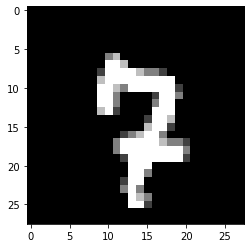

pred :  7 [5.9372834e-08 6.4503789e-09 6.2862039e-04 9.4701022e-07 5.4734389e-08
 7.1855486e-09 2.8047706e-09 9.9998951e-01 2.5345023e-06 6.3360773e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


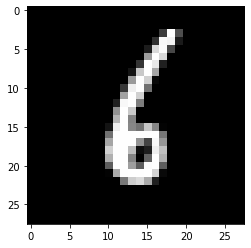

pred :  6 [1.6910576e-08 3.7159568e-06 6.7991459e-07 7.8293477e-10 1.8654769e-10
 3.5852943e-05 9.9999988e-01 1.6261756e-11 4.5039815e-06 2.2136772e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


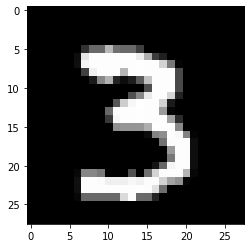

pred :  3 [7.0754154e-09 3.6688994e-09 6.7364745e-09 1.0000000e+00 1.2052008e-10
 8.8216978e-10 9.7379077e-18 4.5313198e-11 3.7144703e-09 2.2769247e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


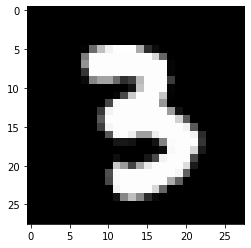

pred :  3 [2.2780812e-08 3.4048874e-08 1.0735806e-07 9.9999952e-01 1.3267650e-11
 1.3367363e-09 6.3259389e-14 7.9009235e-09 4.9643805e-09 1.4942331e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


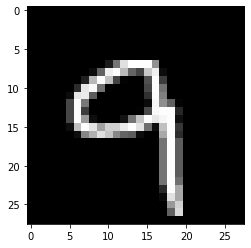

pred :  9 [5.10319231e-10 1.03760736e-10 4.59254096e-07 2.57552733e-06
 2.31382692e-05 1.72929134e-07 2.44832377e-10 6.22907095e-08
 6.01407464e-06 9.99940991e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


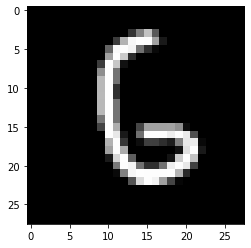

pred :  6 [1.2720429e-06 2.9517949e-10 2.0834463e-07 6.4885042e-10 4.1414719e-11
 5.2865446e-02 9.9824667e-01 1.7802261e-15 7.3799981e-08 1.6290116e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


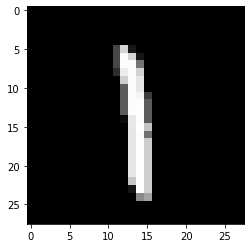

pred :  1 [1.9512393e-15 9.9998653e-01 2.3464872e-06 2.8377256e-08 9.2845065e-09
 3.6721307e-05 7.9017076e-07 1.2296203e-05 1.0412683e-04 3.1493108e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


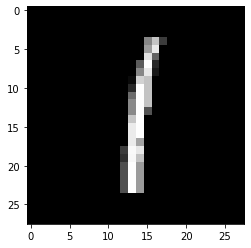

pred :  1 [1.9044875e-11 9.9999917e-01 7.5956030e-10 2.2025912e-08 4.8068634e-09
 1.7333548e-05 8.0314592e-08 4.1408285e-07 6.0585508e-06 2.9698679e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


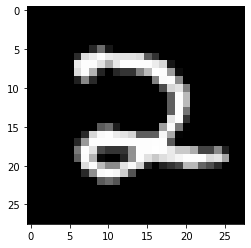

pred :  2 [5.2461044e-08 1.4258974e-11 1.0000000e+00 4.0370827e-09 1.3531925e-13
 3.8781064e-07 1.8275793e-09 8.9478920e-07 1.3288613e-12 2.7069904e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


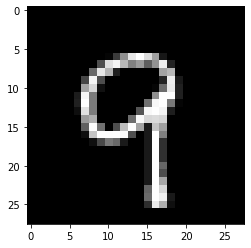

pred :  9 [3.7936421e-11 1.4709926e-10 1.1596932e-07 3.8926073e-06 1.3485058e-09
 6.7575541e-09 1.1506316e-10 2.2985677e-07 4.4622830e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


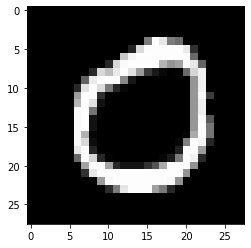

pred :  0 [9.9999946e-01 8.0807986e-06 3.5443335e-08 4.6739270e-08 2.0720246e-17
 5.5861473e-04 5.6294806e-07 3.3516183e-09 5.9324488e-16 6.8142834e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


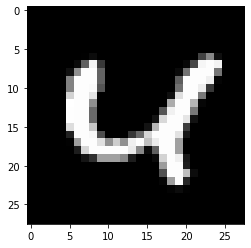

pred :  4 [1.5243066e-07 1.9487521e-14 1.1385894e-06 1.4749688e-09 9.9999619e-01
 3.7283307e-10 1.9915449e-09 9.7915530e-04 1.3543165e-06 4.9358606e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


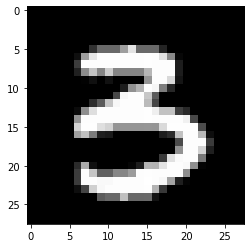

pred :  3 [4.60653543e-10 1.17993004e-07 3.79611613e-08 1.00000000e+00
 2.57618787e-10 1.45796577e-07 1.29197597e-14 6.22242102e-12
 5.38664899e-08 6.11809003e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


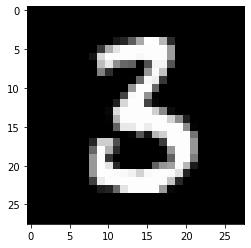

pred :  3 [1.5995479e-11 1.3894517e-07 8.6274333e-08 9.9974060e-01 1.4561974e-10
 1.2185925e-06 2.7355293e-11 5.5962494e-13 1.6458333e-03 1.5040248e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


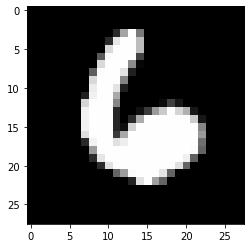

pred :  6 [7.4014558e-11 3.9801946e-11 3.2963085e-06 3.7036585e-10 1.0919633e-06
 9.7404644e-08 1.0000000e+00 5.9974986e-10 2.7026633e-08 7.3355955e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


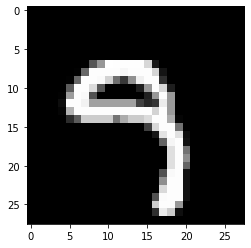

pred :  9 [5.7573291e-10 4.8060059e-11 4.0666435e-09 4.4696836e-07 1.5070516e-06
 9.7147304e-06 1.3445607e-13 2.2178888e-04 1.8128702e-08 9.9998033e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


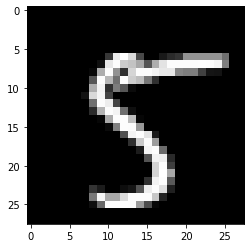

pred :  5 [6.0181327e-15 1.7042336e-11 1.1999058e-12 2.5696536e-08 5.3513319e-11
 1.0000000e+00 4.4312800e-17 2.5186822e-09 1.8847633e-08 9.6677928e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


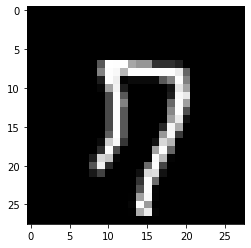

pred :  7 [1.4124632e-02 2.9635044e-15 1.6301870e-04 9.0002211e-10 1.0211492e-09
 8.5728553e-09 2.2889291e-13 2.8059506e-01 6.8908287e-07 3.4881830e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


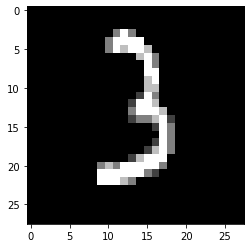

pred :  3 [8.9680956e-09 8.7325492e-07 3.4039766e-02 9.9792302e-01 9.9464295e-13
 3.2020571e-06 4.8757949e-09 1.8084867e-09 1.6055098e-09 1.9460678e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


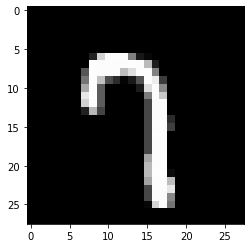

pred :  7 [2.68598588e-09 1.96365169e-09 1.03595135e-04 2.25540808e-09
 1.95509164e-11 2.46923662e-07 3.82024124e-14 9.93182242e-01
 5.61131454e-11 1.61869049e-01]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


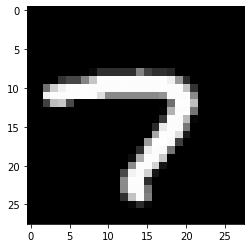

pred :  7 [1.7123961e-07 1.9751939e-14 3.7892457e-07 2.0916564e-09 4.6239471e-14
 1.5910115e-09 2.2495392e-09 1.0000000e+00 5.5347605e-11 8.5956835e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


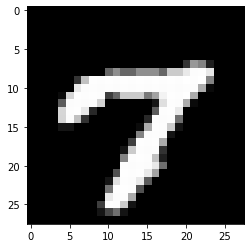

pred :  7 [2.0929374e-09 3.1912447e-13 2.4516359e-07 2.0774049e-05 5.5566641e-12
 3.3692718e-08 2.4018759e-10 1.0000000e+00 1.7189088e-06 2.8615903e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


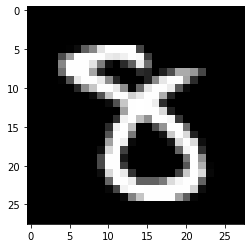

pred :  8 [7.9254880e-07 4.3925552e-09 3.1846762e-04 6.6218008e-06 1.3392284e-07
 5.7821819e-07 9.7010922e-10 2.1770330e-09 9.9869299e-01 2.1092259e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


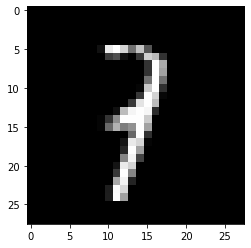

pred :  7 [1.3109131e-14 2.5805831e-03 2.1652887e-07 1.3923645e-04 2.1641552e-03
 8.0738046e-06 2.9731491e-13 2.6639402e-03 3.0571218e-07 3.6008113e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


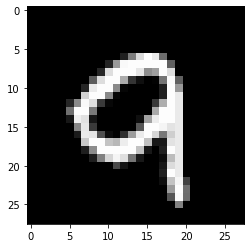

pred :  9 [1.0715860e-07 3.6806079e-11 2.3737550e-04 1.9754807e-06 5.9485535e-07
 7.1404871e-10 4.5413244e-06 1.3683969e-07 3.0522045e-07 9.9999762e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


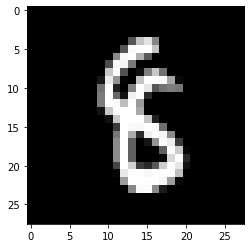

pred :  8 [5.9383848e-07 9.0965629e-04 1.0271267e-05 2.6530027e-04 1.9520243e-08
 4.0294904e-05 2.3850799e-04 1.9055974e-13 9.9531192e-01 1.5425834e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


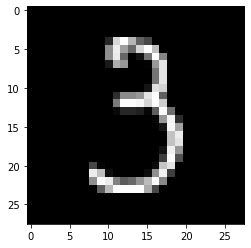

pred :  3 [2.6027919e-08 1.0908324e-07 1.4382024e-07 9.9991316e-01 2.1686004e-08
 1.1888215e-07 2.9669023e-12 3.5944914e-10 4.2885539e-08 2.0312521e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


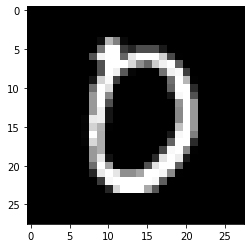

pred :  0 [9.9999845e-01 3.3041717e-13 4.7924817e-03 1.5068941e-09 9.4085221e-14
 9.4442221e-06 3.7143092e-08 6.0657339e-07 2.0407231e-12 2.8958095e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


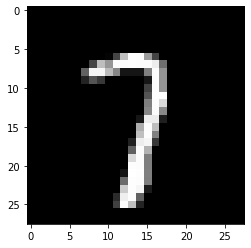

pred :  7 [5.5868082e-10 3.0241474e-06 4.1101877e-05 3.0018985e-08 4.3360836e-13
 5.3802952e-11 1.5706299e-12 9.9935365e-01 7.7164192e-11 8.8113859e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


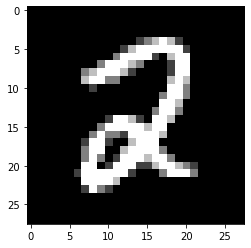

pred :  2 [2.2694954e-07 1.4000997e-05 9.9999940e-01 2.2933423e-06 2.2574638e-14
 3.6427579e-09 3.5336683e-08 2.7753227e-08 5.2514577e-07 2.1869953e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


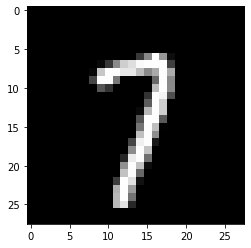

pred :  7 [1.0100207e-09 7.4543054e-06 2.2681398e-08 2.9805605e-08 5.1062934e-12
 1.4856691e-10 9.0304575e-16 9.9999368e-01 2.9502342e-11 1.7722438e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


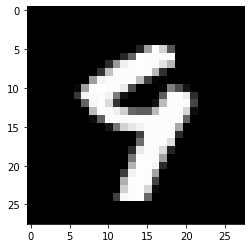

pred :  9 [1.8759009e-12 1.6064922e-14 1.9669730e-09 6.2893484e-08 1.1717631e-05
 4.1940522e-09 5.4618966e-11 1.7551184e-03 2.2158027e-04 9.9986446e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


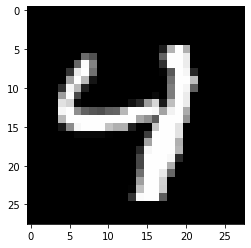

pred :  4 [8.6279833e-14 9.6576691e-14 4.3694360e-08 2.3230102e-06 9.9997705e-01
 7.0336501e-09 3.9565378e-09 6.7642245e-06 1.6727596e-06 5.6944977e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


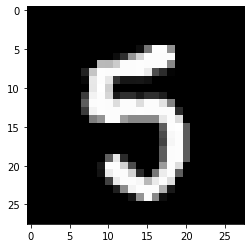

pred :  5 [3.8537454e-10 3.1867606e-10 1.7929528e-12 7.8467572e-08 2.2570700e-12
 9.9999928e-01 2.8922584e-09 2.0796864e-09 2.4477051e-08 1.0472834e-03]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


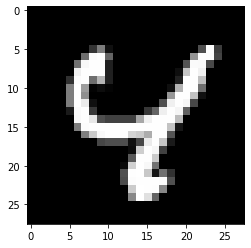

pred :  4 [9.0580930e-16 1.4425051e-14 5.0429620e-09 5.7351110e-07 9.9999905e-01
 8.4749665e-09 2.3071514e-08 1.7906735e-06 3.0291378e-03 1.0639071e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


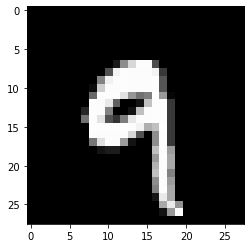

pred :  9 [9.24841999e-08 1.11874295e-11 1.91336440e-07 1.03826223e-05
 7.72497160e-08 2.12203268e-08 8.36512110e-12 1.16663068e-05
 1.60191043e-08 1.00000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


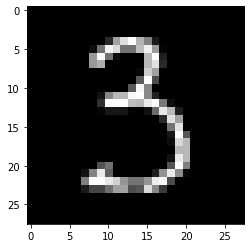

pred :  3 [3.9074752e-09 6.7107721e-06 4.7415760e-08 9.9997073e-01 1.4017743e-10
 4.5133399e-07 5.9354938e-12 1.7694993e-10 1.8619863e-06 2.4699949e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


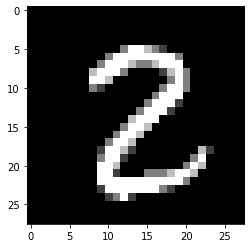

pred :  2 [1.4769670e-06 3.5946201e-07 9.9999928e-01 1.4749043e-05 4.0580074e-15
 1.1078340e-09 4.5565812e-12 4.8432454e-08 1.1177817e-06 2.6102964e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


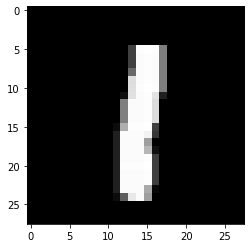

pred :  1 [3.8388035e-09 9.9992567e-01 6.9598917e-07 3.6195149e-07 2.8374318e-09
 1.4123435e-07 9.8128589e-07 2.0683037e-05 1.4832616e-04 1.7561854e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


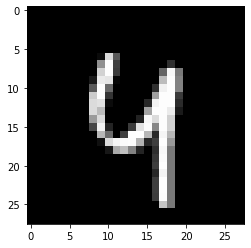

pred :  4 [3.2629843e-11 3.0792220e-09 8.1470004e-09 4.3382681e-07 9.8229235e-01
 1.8645245e-09 1.2689370e-09 9.7846325e-08 1.0301769e-10 2.7393699e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


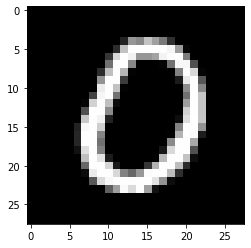

pred :  0 [1.0000000e+00 2.3816860e-07 7.5273107e-07 5.9745695e-11 1.7136137e-12
 1.8166501e-08 6.9741702e-07 1.5261502e-08 6.6424500e-14 1.3473933e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


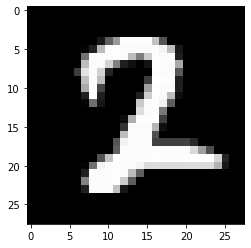

pred :  2 [6.1081645e-10 3.4338416e-06 9.9970388e-01 8.1890221e-08 5.6349233e-14
 1.1651657e-06 1.5259748e-09 1.3042598e-09 8.7386188e-06 1.7938081e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


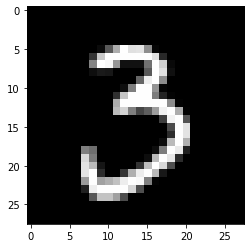

pred :  3 [3.91527308e-08 3.57127194e-09 1.49814259e-08 9.99999762e-01
 1.13952354e-10 3.03032834e-08 5.09633432e-14 4.32882646e-10
 6.69380142e-08 1.82896557e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


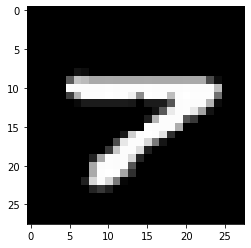

pred :  7 [9.7823367e-08 4.1947282e-11 2.2387505e-04 5.2225202e-09 4.0146589e-10
 1.0236473e-05 1.6640371e-08 9.9991047e-01 3.2969547e-05 4.3331286e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


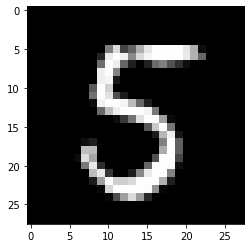

pred :  5 [1.8262508e-10 8.2591072e-08 9.4466393e-11 9.1315027e-09 9.1852686e-13
 9.9999833e-01 5.5930560e-10 1.3845877e-13 5.4575695e-09 6.9107169e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


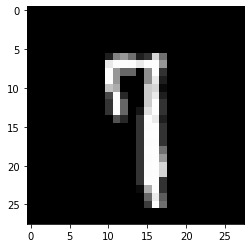

pred :  9 [5.6588855e-11 1.8298626e-04 9.6626867e-09 2.1081158e-11 1.7505101e-09
 5.4755143e-09 2.1220406e-12 5.2098829e-01 6.1562657e-04 9.7684419e-01]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


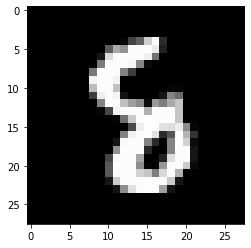

pred :  8 [2.2729489e-10 4.7376957e-07 1.6901307e-06 3.7956163e-08 7.5183956e-12
 5.9118638e-06 4.9997449e-02 1.9451354e-10 9.9894178e-01 1.8149614e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


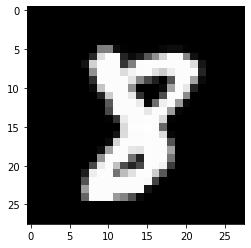

pred :  8 [6.9625732e-09 9.7327387e-08 9.5859170e-04 3.9285644e-07 2.5836501e-12
 1.2217326e-05 1.0965083e-11 5.0396181e-08 9.9999225e-01 1.0161932e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


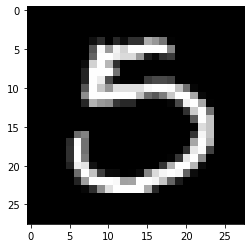

pred :  5 [4.9640848e-06 2.6428951e-10 5.8023659e-07 5.2948899e-06 3.5679064e-14
 9.9791420e-01 5.6834346e-09 6.3232046e-09 2.4364379e-08 4.4600346e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


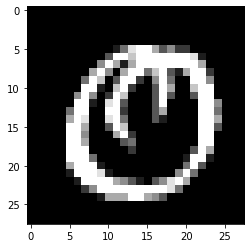

pred :  0 [9.9993557e-01 8.8978132e-09 1.7983825e-07 1.1785664e-08 8.4963503e-12
 4.2185343e-07 2.7562813e-10 1.8682589e-09 1.4913082e-04 9.3434919e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


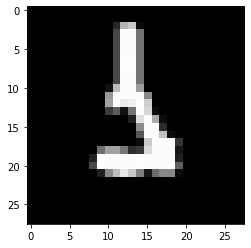

pred :  1 [4.3816786e-12 7.7281326e-01 1.5251297e-05 1.5884638e-04 5.9756009e-09
 2.7153254e-02 2.0578206e-03 1.0225773e-10 5.2914112e-10 1.0425654e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


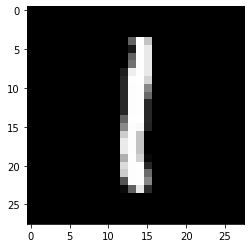

pred :  1 [1.3125195e-10 1.0000000e+00 5.6740252e-08 1.0642532e-07 1.3581254e-10
 5.7141606e-06 2.7360265e-06 1.1725574e-06 4.7048788e-06 1.6871972e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


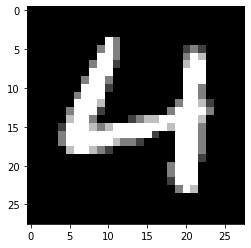

pred :  4 [2.3842948e-09 9.9099960e-13 6.3125192e-08 1.8392416e-09 9.9999982e-01
 2.9486003e-09 7.9547777e-07 2.2734518e-10 1.5894503e-08 5.0627966e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


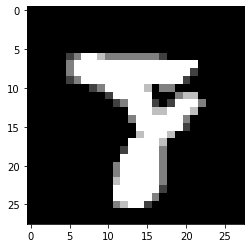

pred :  7 [2.8646649e-09 1.1169349e-11 7.4340187e-07 5.6279561e-07 6.1063793e-11
 1.0094257e-09 8.1087237e-13 9.4700152e-01 1.3393697e-01 6.6331029e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


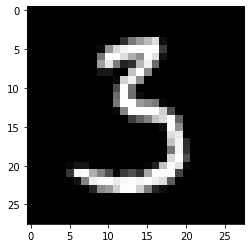

pred :  3 [2.0060387e-10 1.6921759e-04 2.0217297e-10 9.5648968e-01 2.4718963e-11
 5.0462544e-02 1.3427118e-11 1.6958630e-13 8.8120835e-09 2.3922598e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


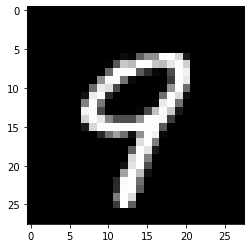

pred :  9 [6.8224040e-15 4.2987613e-14 1.3422156e-10 3.6463259e-08 2.7230021e-07
 1.3346784e-08 8.0133754e-11 3.9579813e-06 3.1672262e-05 9.9999768e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


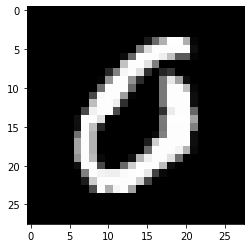

pred :  0 [9.9828458e-01 1.6726812e-10 8.1463644e-05 8.6262117e-09 5.4890554e-09
 9.9858937e-07 6.2690691e-05 3.2202428e-07 2.1687988e-12 1.0660166e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


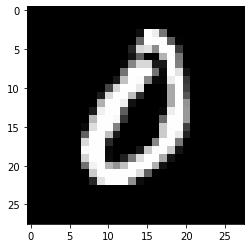

pred :  0 [9.9999213e-01 2.6398925e-10 5.5708188e-05 1.6432364e-06 1.2635699e-06
 3.9121564e-10 5.5157132e-05 1.9484830e-08 4.3664681e-09 4.2326545e-11]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


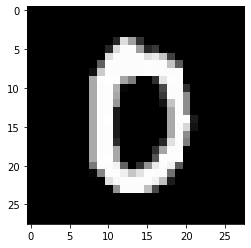

pred :  0 [1.0000000e+00 1.9661214e-13 1.1787713e-03 1.1910434e-11 1.3514494e-12
 2.3698105e-06 5.0203131e-09 4.3801899e-07 2.1335291e-09 1.2198844e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


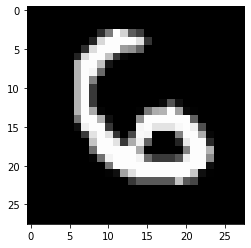

pred :  6 [1.6810651e-09 1.6670876e-07 1.4808088e-06 4.3658099e-09 1.9021670e-08
 1.1403950e-05 9.9999821e-01 3.9493330e-15 8.5614744e-07 6.7837433e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


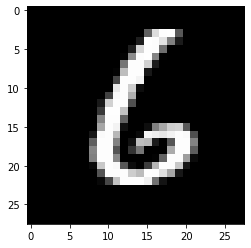

pred :  6 [5.1327686e-07 1.8163530e-07 1.8842278e-06 3.9154669e-12 3.6037381e-10
 2.7676513e-05 9.9999440e-01 5.3583199e-14 2.2968671e-09 1.8482837e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


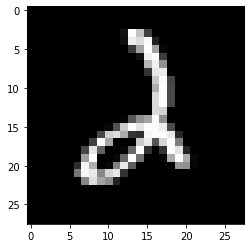

pred :  2 [9.74311654e-09 2.74311624e-05 9.99997973e-01 1.01703583e-04
 5.22472199e-09 2.46882204e-09 1.09471756e-07 1.22820268e-10
 4.79637707e-09 1.87092275e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


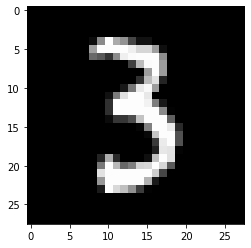

pred :  3 [8.9352070e-10 1.0190362e-09 3.2802839e-06 9.9999976e-01 7.9843271e-11
 1.1019770e-06 1.8010435e-10 2.5273719e-10 4.5837676e-09 5.4217852e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


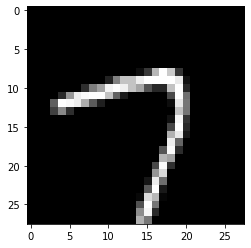

pred :  7 [1.18553366e-07 8.86190128e-14 1.01022746e-08 1.30822627e-07
 1.58502548e-14 7.25707778e-08 1.90082311e-10 9.99996662e-01
 1.05230019e-10 4.37745912e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


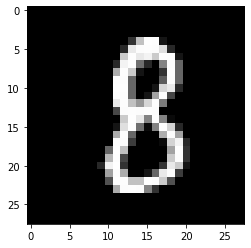

pred :  8 [1.3661678e-08 3.1474030e-08 1.6271244e-06 1.4266723e-06 5.4438885e-07
 3.8922472e-06 1.7595332e-07 4.3326738e-11 9.9998701e-01 1.5060897e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


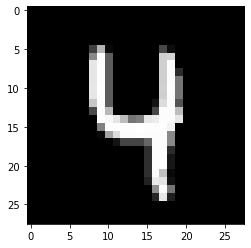

pred :  4 [1.7005255e-15 1.9186449e-11 9.5755012e-13 9.1316117e-08 1.0000000e+00
 8.5970285e-08 4.5493801e-13 1.0058054e-06 2.3838026e-10 8.5814477e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


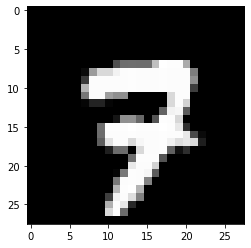

pred :  7 [1.0108157e-11 5.6080556e-17 5.4358861e-06 2.6133657e-04 1.3365310e-11
 1.1040649e-08 7.3213468e-13 9.9373925e-01 1.1623826e-09 2.2271156e-02]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


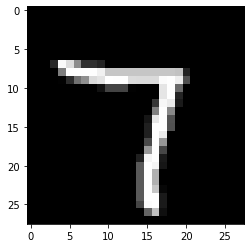

pred :  7 [1.03926714e-10 1.35995870e-09 8.88659031e-08 2.62624980e-08
 4.78190968e-12 7.52864507e-11 1.05777559e-14 1.00000000e+00
 6.32132259e-13 1.86494334e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


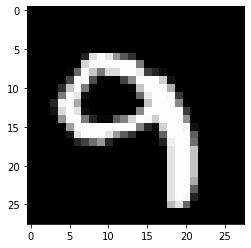

pred :  9 [6.0226291e-09 2.6525192e-11 4.7814064e-09 1.1450053e-04 2.0042367e-05
 1.0566657e-08 8.7865430e-08 3.0354770e-06 1.7794967e-04 9.9990702e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


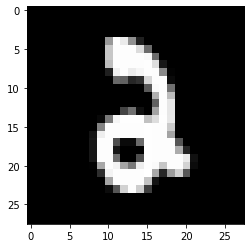

pred :  2 [3.4519360e-08 8.0516593e-08 9.9999160e-01 3.4436584e-04 1.7180259e-15
 3.1550844e-06 3.4371865e-08 1.0976792e-09 1.8315663e-07 2.8249873e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


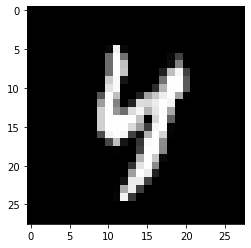

pred :  4 [1.6944080e-13 1.2434100e-07 1.2749359e-10 3.1233816e-07 9.9998701e-01
 2.8388450e-07 9.8672105e-11 6.9808404e-10 7.2732660e-11 2.1840334e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


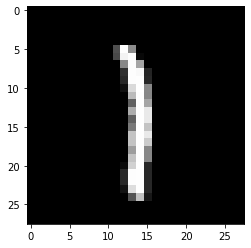

pred :  1 [2.1944118e-14 9.9939466e-01 4.8022127e-07 3.4969258e-08 1.1914200e-08
 7.0437427e-06 2.2978147e-08 1.3142824e-04 4.2588810e-05 9.8103510e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


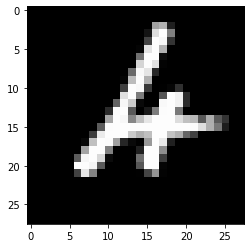

pred :  6 [3.7500761e-10 1.7319593e-08 3.9899611e-01 2.2240069e-08 1.9571424e-02
 2.6386630e-07 9.2606354e-01 3.1753433e-09 3.6647119e-08 3.9736235e-12]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


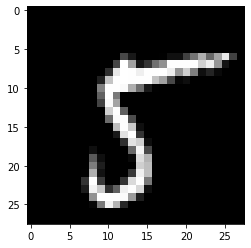

pred :  5 [1.6485218e-13 5.6393429e-10 8.4831048e-12 5.1284674e-09 6.9228622e-16
 1.0000000e+00 6.8796837e-17 1.2043673e-09 2.5842208e-09 1.3583625e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


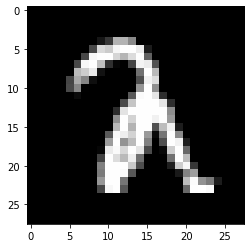

pred :  2 [2.0138670e-10 6.2484349e-07 9.9860239e-01 1.7755900e-08 4.7278625e-10
 4.7404431e-09 3.5226150e-10 9.1078380e-07 1.4419764e-02 6.2125605e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


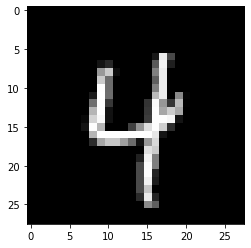

pred :  4 [1.0683369e-11 5.7187641e-09 1.1837345e-08 3.3360037e-10 9.9998868e-01
 1.8709807e-08 5.2288345e-07 1.0058572e-08 8.7925409e-09 2.6363134e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


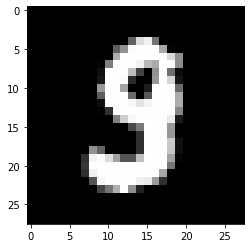

pred :  9 [8.80879369e-08 1.24980004e-09 4.42413257e-05 2.84119844e-02
 6.21439185e-08 5.17275929e-03 1.49919085e-13 1.06275605e-11
 2.65520215e-02 9.70104814e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


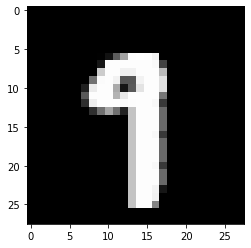

pred :  9 [3.3260335e-11 4.6651230e-06 1.8338479e-08 2.2020306e-06 6.5640629e-06
 4.6822806e-11 1.4863860e-14 2.6091933e-04 4.1835910e-01 9.4135165e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


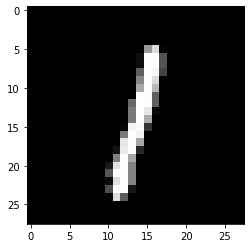

pred :  1 [6.8413453e-09 9.9999905e-01 1.7841134e-07 1.9762520e-11 6.6762090e-07
 8.7576154e-06 1.1800083e-08 1.9387748e-07 3.3578044e-06 2.0260631e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


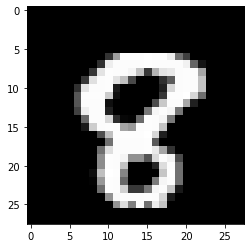

pred :  8 [6.9302286e-10 2.7049552e-14 7.9968572e-04 5.3853810e-06 8.5750212e-11
 1.7453601e-08 3.2463010e-09 5.2115996e-07 1.0000000e+00 5.2198743e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


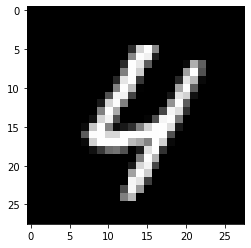

pred :  4 [3.4101697e-09 5.5348634e-12 1.5567133e-05 7.5805912e-07 9.9997979e-01
 1.1455551e-07 1.2897227e-07 1.7190899e-07 9.0533187e-10 3.4484267e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


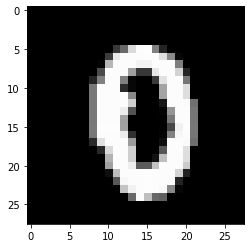

pred :  0 [9.9994719e-01 1.2879458e-14 1.4793873e-04 2.7127484e-07 1.2274673e-10
 6.3481257e-06 3.5703374e-06 3.6134634e-10 3.9097940e-05 7.6037645e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


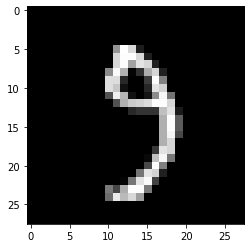

pred :  9 [1.51863105e-06 3.38949846e-08 3.84996174e-10 4.84448610e-05
 3.94536936e-09 1.88719605e-05 2.82686011e-13 1.05289000e-05
 1.01204854e-07 9.98426735e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


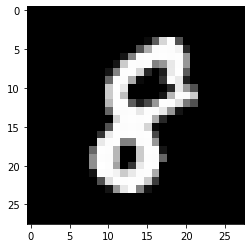

pred :  8 [8.9141298e-07 1.1629687e-08 1.8706918e-04 3.3750525e-09 1.5531978e-10
 2.2947971e-08 1.1150194e-05 3.3292771e-11 9.9999976e-01 1.8385351e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


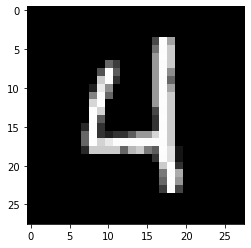

pred :  4 [5.4733086e-06 1.2006403e-07 1.2849354e-06 5.6334222e-09 9.9999893e-01
 7.1562418e-08 7.9501437e-09 2.2911539e-08 1.0607092e-10 7.6147914e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


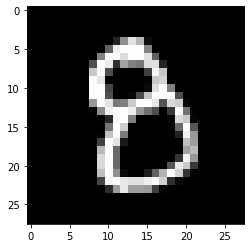

pred :  8 [7.9946331e-06 2.9414381e-13 1.8520679e-05 1.7184738e-07 3.1301461e-10
 1.2255322e-05 8.8470625e-07 3.0065723e-13 9.9998641e-01 1.0670424e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


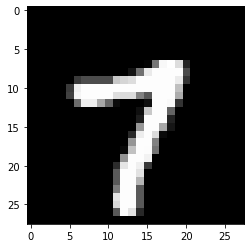

pred :  7 [1.6182686e-09 1.0308550e-10 7.8854017e-09 2.5023348e-09 4.3514484e-11
 6.8486464e-08 1.9467358e-13 1.0000000e+00 7.6737452e-09 8.6660094e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


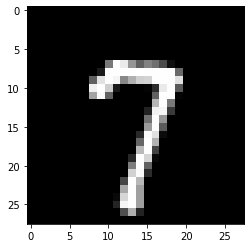

pred :  7 [1.9268423e-10 2.3821345e-10 1.7711386e-08 3.2381677e-06 2.7072585e-13
 7.1804351e-10 6.0225913e-14 9.9999964e-01 2.4935108e-13 6.6478698e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


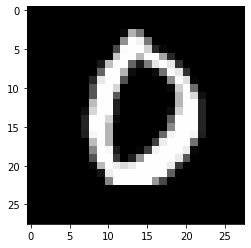

pred :  0 [9.9937856e-01 5.4348924e-13 1.5327334e-04 1.4428018e-11 4.2514439e-10
 3.0440330e-09 9.9965851e-05 9.7446584e-09 8.8291718e-10 3.8944781e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


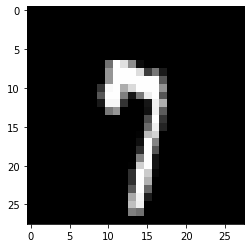

pred :  7 [7.4129886e-10 1.8929713e-05 3.8303634e-07 2.2165547e-07 3.0218031e-12
 1.6840241e-07 1.0937798e-12 9.9987817e-01 2.4943075e-11 2.8897226e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


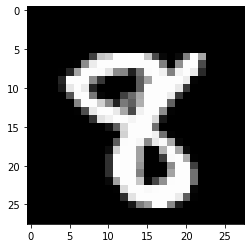

pred :  8 [1.4968231e-08 1.2029324e-09 2.9313600e-05 1.0265635e-07 6.1418013e-09
 9.2099221e-08 1.3598091e-06 1.1096681e-08 1.0000000e+00 2.2249278e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


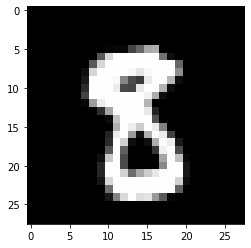

pred :  8 [1.5102225e-06 1.1637143e-08 2.4023273e-06 1.5902519e-04 8.8048533e-14
 9.6615304e-06 5.2831996e-11 7.4545526e-12 9.9920553e-01 7.9104304e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


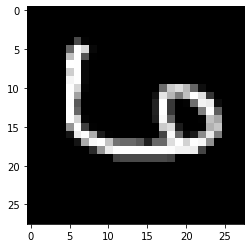

pred :  6 [3.7497282e-04 1.2544224e-11 2.9325960e-05 1.0105752e-10 3.7333667e-03
 2.6000158e-10 9.6853769e-01 6.7151189e-01 9.9698014e-15 2.9809115e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


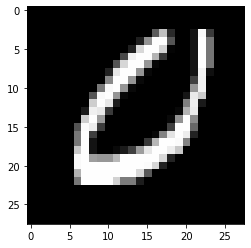

pred :  0 [9.9688178e-01 3.4525154e-08 2.0772219e-04 2.5659560e-08 5.6898826e-11
 5.3191934e-06 3.9470196e-04 7.7077000e-10 1.4117489e-12 2.5918349e-11]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


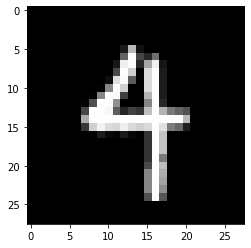

pred :  4 [1.3969217e-14 3.6636562e-12 1.4627398e-09 5.7936543e-08 9.9895859e-01
 2.0777279e-07 5.5507772e-11 3.0602023e-05 8.2268254e-09 6.5907836e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


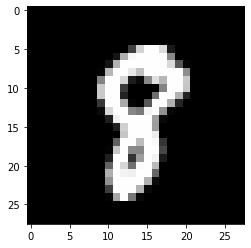

pred :  8 [1.9826839e-05 9.3519378e-07 1.5909495e-07 2.7135999e-05 4.4109058e-10
 5.2629012e-08 6.6018089e-09 2.3196753e-05 9.9999952e-01 8.3343577e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


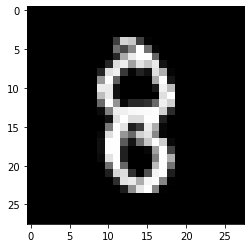

pred :  8 [2.37668860e-06 4.79927786e-09 9.35299977e-05 2.19183562e-06
 2.72658007e-11 6.19819485e-09 1.10402405e-04 2.55578631e-12
 9.99553442e-01 8.64273846e-01]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


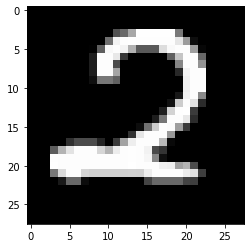

pred :  2 [1.1497558e-07 1.3671740e-08 9.9960148e-01 1.1564171e-04 6.1389344e-12
 2.2891413e-07 1.0262630e-09 5.2202485e-17 2.2050952e-13 1.2343020e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


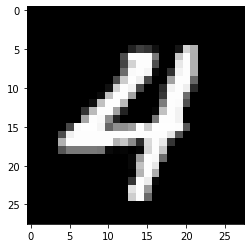

pred :  4 [6.4649464e-10 7.0284158e-14 2.8319050e-06 4.3957149e-09 9.9997234e-01
 1.3245294e-06 5.2589327e-10 7.4342424e-06 6.2062563e-11 1.7756522e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


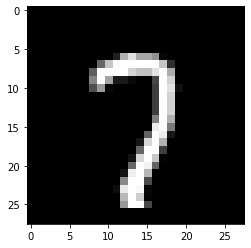

pred :  7 [9.6547140e-08 1.7133531e-11 2.9277802e-04 6.7075661e-08 8.4850456e-16
 2.9269656e-09 9.9812931e-15 9.9998224e-01 1.9770843e-12 5.5987457e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


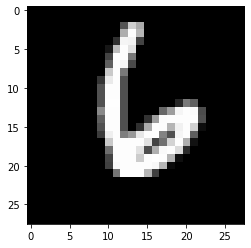

pred :  6 [4.91130958e-09 7.49391729e-11 2.45942465e-05 1.49468317e-12
 3.09880932e-07 4.32291064e-10 1.00000000e+00 1.13002184e-10
 1.16673626e-09 1.43709951e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


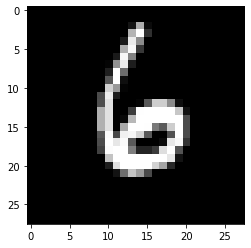

pred :  6 [1.1990643e-15 1.1765141e-11 1.8551598e-05 1.4541506e-06 1.3957667e-09
 1.6084984e-07 1.0000000e+00 2.5813313e-11 3.8105102e-07 2.0626285e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


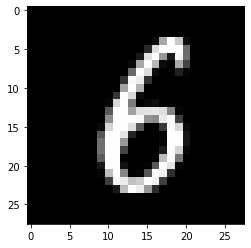

pred :  6 [3.8256904e-09 2.6002464e-08 2.3574891e-08 8.4370835e-12 4.5808308e-09
 8.5112453e-04 9.9990785e-01 6.6016317e-13 6.4519509e-06 1.8186600e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


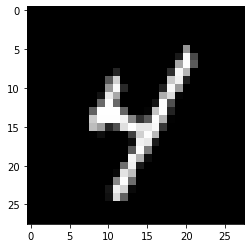

pred :  4 [3.56770887e-14 1.03911464e-06 1.54267543e-10 1.71049774e-09
 1.00000000e+00 3.91337890e-05 6.02865370e-12 1.11231996e-10
 5.22230607e-07 3.79693965e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


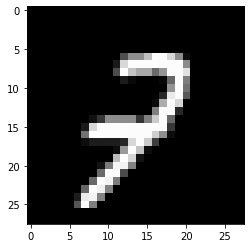

pred :  7 [3.9778701e-12 1.2667599e-10 2.4441120e-05 5.1814318e-04 1.4610200e-12
 4.3853561e-09 3.3115678e-12 9.7455418e-01 3.5163539e-09 1.7494470e-02]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


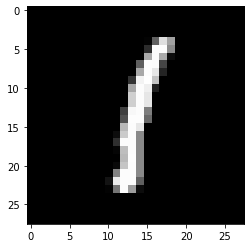

pred :  1 [6.3871695e-09 9.9998307e-01 4.9082821e-10 4.8918167e-09 6.1245380e-08
 2.3443311e-06 1.8449151e-06 3.7155795e-07 1.8909574e-04 1.2419660e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


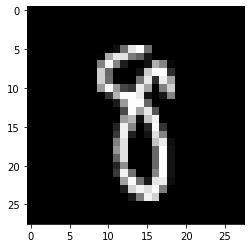

pred :  8 [6.0656616e-06 8.8009804e-09 2.6449516e-07 2.9247406e-06 1.7082440e-10
 7.0225241e-07 4.0345505e-09 1.6798672e-06 9.9997723e-01 6.9057030e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


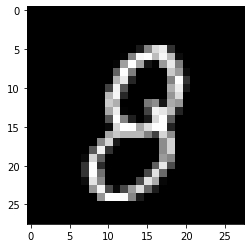

pred :  8 [1.4685040e-09 1.2563368e-09 2.0993026e-05 1.0749520e-04 2.1970569e-08
 3.3877453e-07 3.8084377e-08 2.4925457e-09 9.9325693e-01 1.8739668e-01]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


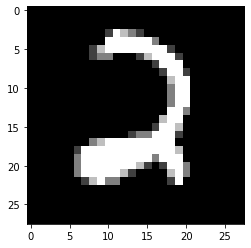

pred :  2 [3.7305185e-08 3.6709205e-10 1.0000000e+00 2.3471686e-07 3.7845989e-12
 4.3270312e-08 9.3040420e-09 5.1838502e-11 2.8338402e-13 1.8974072e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


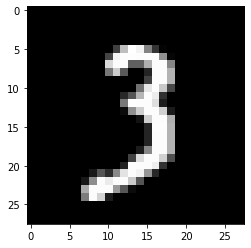

pred :  3 [1.52242796e-09 1.42288386e-08 1.04420533e-05 9.99929845e-01
 1.80813842e-09 4.63451215e-08 1.35116642e-15 1.11113641e-05
 7.09886860e-09 1.60295428e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


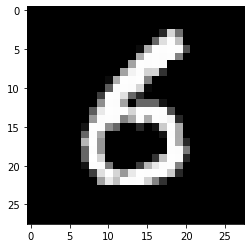

pred :  6 [6.2136507e-10 9.1481643e-06 8.6297292e-10 1.8416858e-06 7.5259028e-11
 2.5744170e-02 9.9985766e-01 5.1285622e-14 6.7119754e-06 3.1983092e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


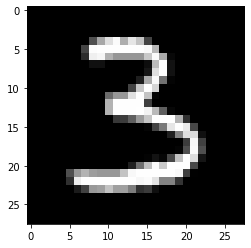

pred :  3 [9.1657949e-12 1.8166875e-05 3.8479300e-09 1.0000000e+00 1.3245129e-10
 4.8553039e-07 8.2050892e-13 9.5804468e-14 2.6030711e-11 2.3052740e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


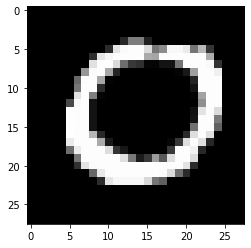

pred :  0 [9.9999976e-01 1.2503134e-08 9.8687067e-09 7.8173883e-08 1.7659336e-12
 2.4819241e-07 3.3944107e-05 8.4039539e-11 3.6710181e-14 5.6377320e-13]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


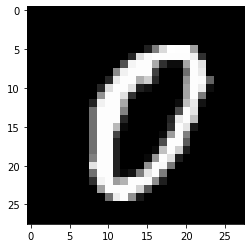

pred :  0 [9.9999976e-01 2.7523739e-09 1.9251802e-08 6.7638013e-11 1.5950587e-13
 5.3388003e-06 2.4251436e-08 5.7821374e-09 4.0743453e-09 1.6127178e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


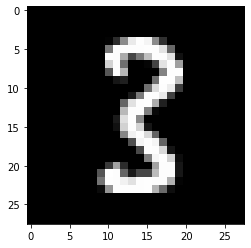

pred :  3 [2.1145076e-10 2.0496270e-06 7.5700223e-07 9.9987143e-01 9.1197445e-11
 1.8483183e-07 4.0363775e-15 1.5798637e-11 2.5257978e-05 1.2754096e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


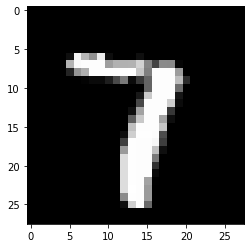

pred :  7 [4.2858286e-09 6.1763835e-06 1.0657477e-06 1.3625682e-07 3.1424885e-09
 1.3169235e-13 2.6415582e-11 9.9641788e-01 4.9200878e-08 5.6724042e-11]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


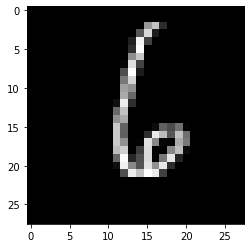

pred :  6 [4.50867399e-10 5.57576129e-07 1.73984190e-05 1.10221859e-10
 1.05446766e-07 3.25113535e-04 9.99992847e-01 1.66596625e-10
 9.83119836e-11 2.71888380e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


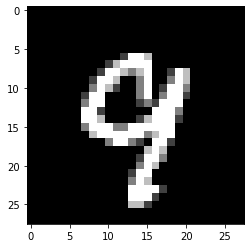

pred :  9 [1.0829680e-09 1.3227934e-14 6.6428345e-07 8.1369808e-06 1.9892957e-07
 2.7326938e-10 1.9912402e-10 2.1292240e-07 2.1717194e-06 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


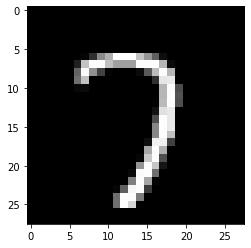

pred :  7 [5.8024513e-10 4.4829873e-12 7.1972527e-06 4.7998710e-06 1.0914181e-13
 6.6711237e-09 7.0966407e-15 9.9992990e-01 5.7108256e-14 2.6412059e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


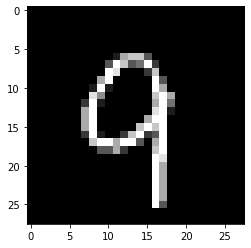

pred :  9 [9.6744380e-08 1.9680603e-10 2.0619305e-07 1.4845651e-07 5.1067789e-05
 6.7376538e-10 8.8605550e-09 2.8455861e-07 7.7227541e-10 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


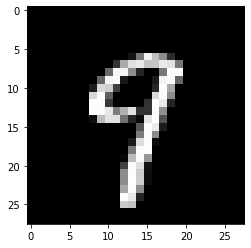

pred :  9 [3.1998525e-12 4.7697357e-10 1.3716579e-13 4.1306937e-08 4.0280149e-05
 2.4768060e-10 8.4242353e-12 4.1368335e-02 8.1623484e-06 9.9391782e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


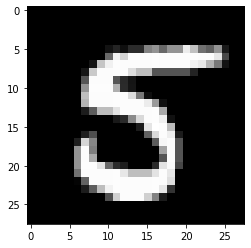

pred :  5 [2.0829921e-10 7.9771958e-09 3.1722092e-08 9.8498454e-09 1.6820839e-14
 9.9998963e-01 6.0008626e-10 4.2706771e-12 1.2423640e-08 1.8546900e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


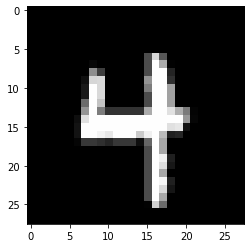

pred :  4 [1.3520031e-13 1.0729167e-12 6.1894205e-08 2.5754916e-09 1.0000000e+00
 1.9643645e-08 1.3213272e-08 1.6619753e-08 1.8179629e-09 2.3084642e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


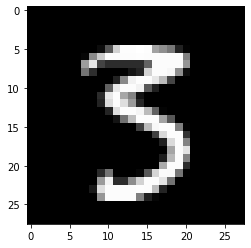

pred :  3 [5.0265261e-11 2.0340462e-07 1.9448553e-12 9.9554408e-01 3.8122056e-10
 4.7519207e-03 5.1238202e-14 9.9555930e-10 4.5302573e-07 1.8399742e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


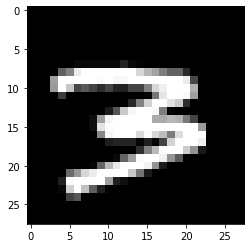

pred :  3 [1.6337444e-09 8.1947166e-10 6.1030642e-06 9.9981278e-01 9.4064275e-13
 2.1980565e-10 5.9125171e-10 5.1051135e-05 3.3987844e-14 1.4464031e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


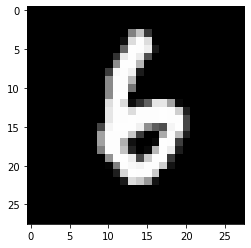

pred :  6 [1.5057233e-11 6.8754707e-10 1.0526903e-05 1.0346737e-06 3.4048179e-07
 3.3412705e-06 9.9999970e-01 2.9008688e-11 3.2375638e-09 5.7125262e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


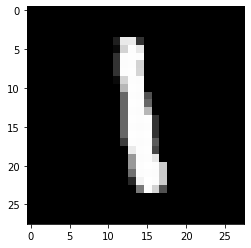

pred :  1 [6.05501979e-16 9.99998331e-01 1.55693597e-05 1.03074207e-08
 1.09317554e-07 1.19371925e-05 4.06153724e-08 3.62644776e-08
 1.68872975e-05 2.11308127e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


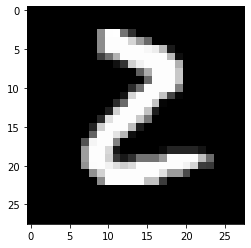

pred :  2 [1.5874696e-07 5.7299774e-09 9.9998343e-01 1.6462803e-04 2.5111149e-15
 7.1782164e-10 7.5474654e-11 6.6491429e-14 1.3723969e-04 5.7306433e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


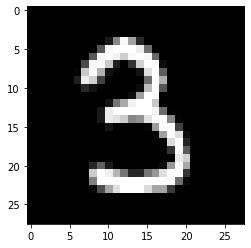

pred :  3 [6.40770813e-12 8.34704394e-09 1.07173314e-07 9.99974787e-01
 1.21163135e-10 5.43052579e-07 6.69092818e-16 3.75800411e-13
 6.98806124e-10 5.47012687e-03]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


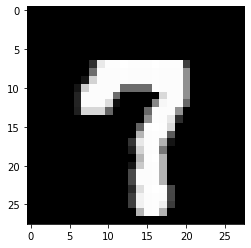

pred :  7 [2.7604967e-09 2.5316006e-12 1.1886181e-06 3.1267344e-09 1.8771072e-12
 2.9264479e-08 2.0277165e-13 9.9999404e-01 1.0687293e-09 2.6737710e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


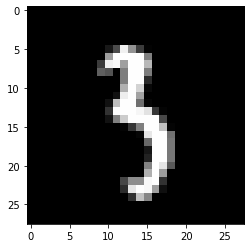

pred :  3 [8.4811142e-12 5.8658770e-05 2.6235086e-10 9.9647450e-01 2.1043420e-04
 3.0210614e-04 6.4111591e-11 1.8472311e-07 8.8715473e-07 2.6751675e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


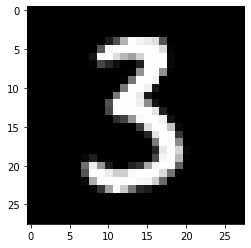

pred :  3 [1.9122350e-09 9.5859184e-07 3.9160741e-11 1.0000000e+00 6.5596599e-09
 3.0997049e-07 1.2695850e-10 4.3692857e-12 5.4813579e-08 1.1667719e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


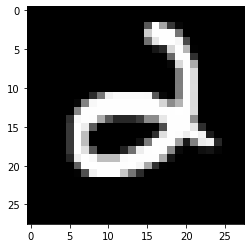

pred :  2 [1.3456423e-07 6.9512904e-14 7.3197067e-02 1.2717355e-05 2.8161754e-05
 2.5344416e-08 5.6267977e-02 8.1382523e-10 1.5078552e-08 4.0857362e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


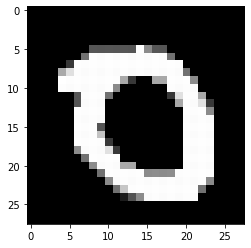

pred :  0 [9.9998355e-01 1.4834972e-10 3.4289211e-09 3.9534560e-11 2.0158462e-10
 8.7731096e-05 6.0303137e-07 3.3393110e-08 2.4355094e-11 8.1751205e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


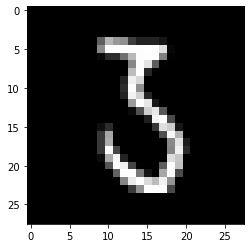

pred :  3 [1.0637636e-08 4.3105524e-06 1.5605356e-06 7.8878880e-01 4.7412139e-12
 2.0993555e-06 2.6654382e-06 7.1472689e-11 2.0433068e-03 1.1393981e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


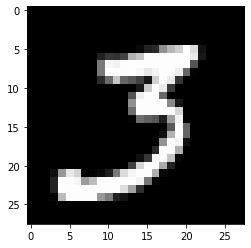

pred :  3 [2.4935184e-07 9.0264821e-06 3.6830763e-09 9.9999958e-01 5.8181765e-14
 1.1847872e-06 2.2435486e-17 4.1293191e-10 6.0020119e-16 1.8366421e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


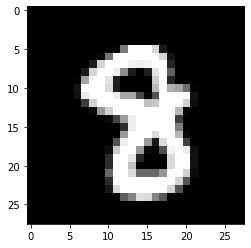

pred :  8 [3.9520746e-08 1.2884423e-10 5.8947380e-06 7.3131632e-05 5.1081447e-08
 5.1760405e-09 3.0768385e-07 3.3144371e-08 1.0000000e+00 2.5588535e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


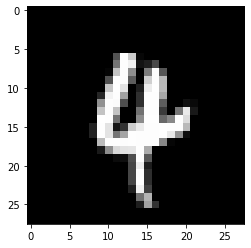

pred :  4 [7.3217699e-12 2.4197432e-11 6.1653668e-06 1.2942051e-07 9.9991721e-01
 1.1821861e-09 3.1321605e-07 1.5189519e-05 7.8866014e-10 8.6551645e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


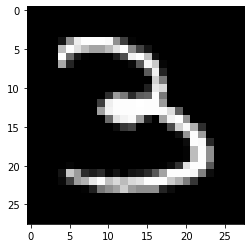

pred :  3 [4.65986234e-12 2.03559885e-05 1.38575174e-07 1.00000000e+00
 7.54360556e-08 1.37814924e-08 5.71999913e-12 4.05751228e-15
 6.37105702e-10 1.34068754e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


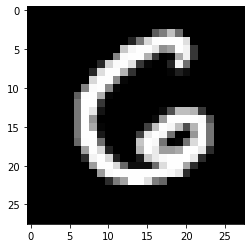

pred :  6 [5.6469440e-04 2.5550823e-06 1.0350639e-09 3.7698763e-14 3.3994657e-10
 6.4091728e-05 9.9948198e-01 7.6715612e-10 7.8607854e-10 5.0252851e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


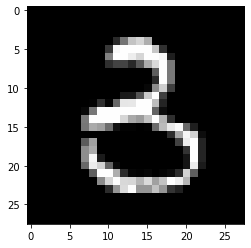

pred :  3 [1.6737695e-10 8.4617540e-09 3.5533309e-04 9.9850929e-01 1.5994123e-09
 1.3222657e-07 1.4666922e-10 4.8695303e-13 4.4077635e-04 2.3682185e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


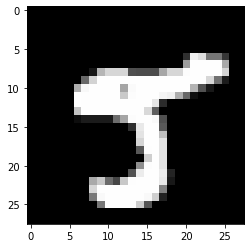

pred :  5 [1.5406279e-15 4.3542774e-12 1.0288445e-12 4.3482010e-05 3.7203018e-11
 9.9981296e-01 4.2763233e-17 8.1760953e-07 1.6047959e-06 3.2411676e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


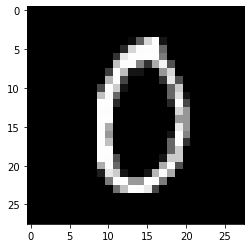

pred :  0 [9.9999958e-01 1.1654006e-11 3.3298426e-07 2.3057062e-10 7.1483249e-13
 1.5938364e-05 3.4020411e-06 3.3523232e-08 9.4662367e-09 1.0249372e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


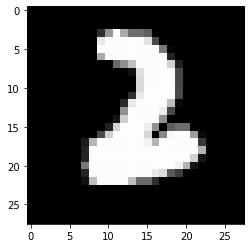

pred :  2 [1.5496389e-09 1.2481225e-06 9.9617922e-01 1.5974110e-01 5.8594405e-13
 2.2314897e-08 1.7755881e-10 5.8437233e-10 5.2588273e-08 1.3963211e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


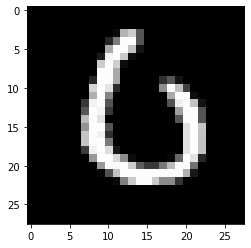

pred :  0 [9.8998296e-01 9.4539397e-11 2.7327019e-06 2.7647713e-12 3.3113231e-11
 1.5947312e-06 9.1149402e-01 2.7000315e-11 5.0051966e-13 3.9092528e-11]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


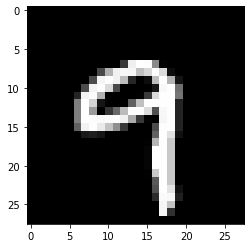

pred :  9 [1.7093066e-10 3.7350707e-14 2.7488250e-07 3.7671830e-09 4.2644143e-04
 2.4810117e-08 9.3662125e-14 5.3500719e-07 1.8376960e-08 9.9999779e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


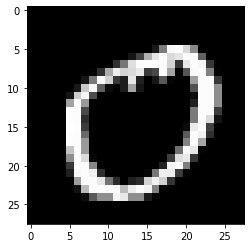

pred :  0 [1.0000000e+00 2.1479036e-07 2.6195160e-08 1.2175052e-08 1.0992414e-14
 2.0266265e-07 1.7532734e-09 2.0155905e-08 1.3578243e-11 1.3565772e-10]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


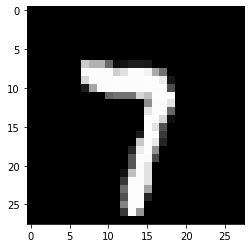

pred :  7 [9.1565427e-10 1.8089983e-08 5.6674571e-07 5.5424280e-08 2.1204666e-12
 2.3707472e-11 7.6094979e-13 1.0000000e+00 9.4828166e-11 5.6116769e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


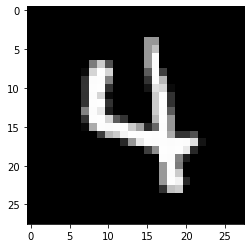

pred :  4 [1.0709575e-13 1.7081471e-09 2.2451168e-08 1.2098393e-10 9.9999905e-01
 1.7717208e-05 7.1628339e-09 3.0760770e-08 1.1213425e-06 2.8630277e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


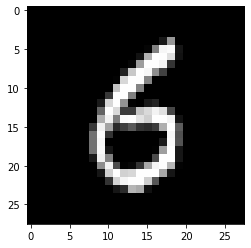

pred :  6 [5.4274345e-09 8.3293833e-07 2.6229694e-09 3.1828880e-04 8.8015928e-11
 7.1978956e-02 9.8805749e-01 1.8781519e-13 2.5404818e-08 1.8174949e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


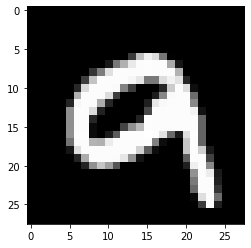

pred :  9 [7.2600722e-07 3.0787001e-16 4.7990680e-04 1.3447224e-09 6.5042291e-06
 2.1175337e-07 9.5397716e-09 1.0922413e-08 1.8675527e-06 9.9999845e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


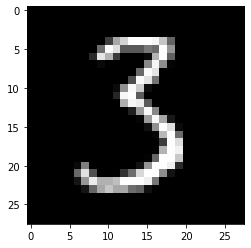

pred :  3 [4.1526821e-10 4.1482359e-05 1.7235048e-10 9.9999976e-01 1.7079443e-10
 4.6174923e-06 2.9021263e-10 1.5803782e-12 6.4305432e-08 1.7334769e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


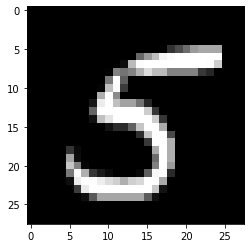

pred :  5 [5.2964013e-13 6.2785102e-07 1.0865924e-14 3.1620651e-09 4.4482022e-12
 1.0000000e+00 9.7548857e-13 1.8477999e-13 1.4283404e-09 2.3136349e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


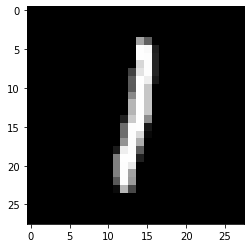

pred :  1 [4.8509047e-10 9.9999923e-01 6.9405139e-08 5.0692772e-10 1.9199098e-09
 2.3772395e-06 8.5831630e-07 1.6310910e-06 1.1213462e-05 1.5725868e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


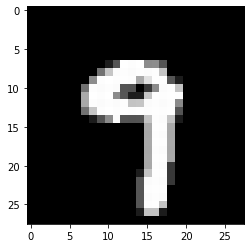

pred :  9 [4.2201334e-12 2.7120030e-13 3.8634085e-10 7.3244379e-08 1.4220896e-07
 5.6469474e-08 1.7560804e-14 1.8173456e-04 8.2041552e-08 9.9999928e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


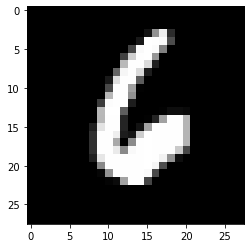

pred :  6 [3.8837840e-07 2.4704153e-08 2.3341016e-05 1.0138694e-09 9.9378701e-07
 2.5885784e-06 9.9999970e-01 1.0384344e-11 3.0822173e-10 1.4486464e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


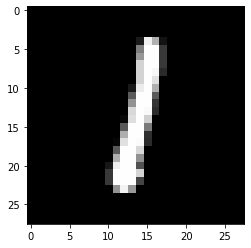

pred :  1 [3.0148131e-09 9.9999797e-01 3.5988836e-07 2.2037498e-09 4.4667940e-09
 5.4007642e-06 1.5303441e-07 6.7377243e-08 1.8644670e-06 1.1089888e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


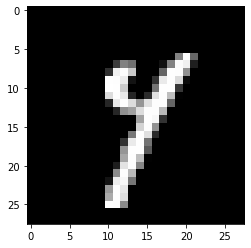

pred :  4 [4.5295934e-14 1.0624882e-04 7.9253959e-15 4.4185118e-09 9.9842381e-01
 6.3902924e-08 5.4422471e-13 2.4277568e-03 4.1795509e-05 8.3444220e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


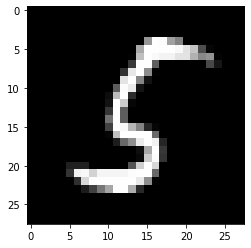

pred :  5 [4.0804327e-10 2.0134449e-04 2.3063791e-10 4.2567873e-08 1.8830903e-14
 9.9995768e-01 7.6722387e-07 2.9897881e-17 1.1142216e-08 1.4691771e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


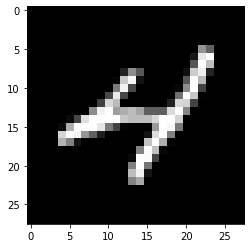

pred :  4 [4.4774434e-11 6.6003535e-15 1.8798439e-05 4.7484701e-09 1.0000000e+00
 9.1864263e-07 1.8110135e-09 5.1382392e-07 3.5455605e-10 1.1735770e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


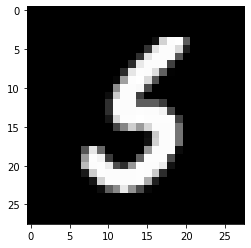

pred :  5 [1.1021030e-10 9.4118889e-08 1.8330603e-09 1.1776090e-03 1.7773544e-09
 9.9964929e-01 3.4359097e-04 3.9429053e-15 2.5663965e-08 6.1058060e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


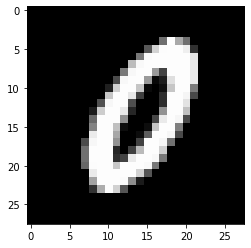

pred :  0 [9.9999791e-01 5.0939656e-13 3.7209094e-03 2.9041450e-08 4.4666240e-09
 1.1031972e-09 6.9104826e-06 1.7411862e-09 2.9889493e-06 6.7118890e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


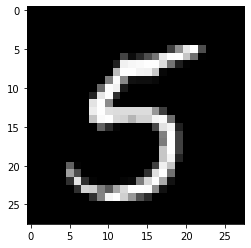

pred :  5 [1.1583235e-13 1.2032405e-08 1.0881801e-12 7.3050521e-10 4.5839488e-10
 1.0000000e+00 3.6186101e-13 1.5527158e-09 3.9775649e-09 9.0649401e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


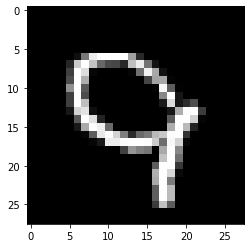

pred :  9 [2.4305431e-08 1.7430293e-14 1.7200879e-06 3.5573403e-10 9.7864866e-04
 2.7102104e-08 8.1828858e-08 3.8634476e-05 6.0262488e-09 9.9998647e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


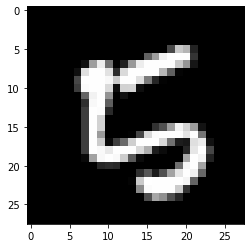

pred :  5 [1.5686848e-07 2.5465094e-10 3.0994179e-11 7.2470424e-10 2.1207441e-06
 9.7916079e-01 1.3326705e-03 4.4790759e-05 1.7807656e-06 5.0323257e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


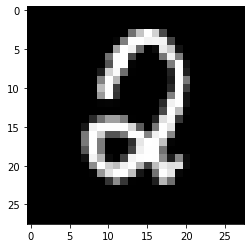

pred :  2 [1.9593690e-06 7.6077783e-11 9.9988627e-01 1.3851782e-11 4.1196055e-09
 3.9084387e-08 2.8997660e-04 1.8076968e-13 1.3959213e-05 1.8308205e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


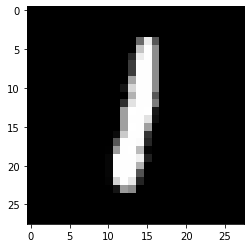

pred :  1 [3.4312111e-09 9.9999881e-01 1.3742952e-07 8.5403729e-10 9.9492823e-08
 1.4895734e-06 3.7643733e-06 1.1807715e-06 6.0900115e-06 4.0281087e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


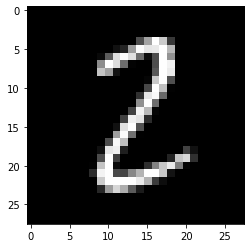

pred :  2 [1.7383252e-06 3.3789873e-04 9.9836689e-01 1.9434094e-04 3.7163973e-13
 1.6790174e-09 1.4410773e-11 9.3697872e-10 6.7806457e-07 2.4144541e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


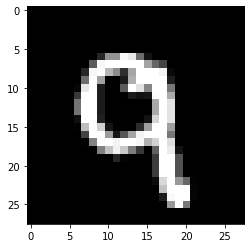

pred :  9 [1.1103488e-06 3.2526477e-09 3.3510923e-03 4.8374176e-07 5.9019914e-07
 1.4700040e-08 8.2230561e-10 1.1369098e-06 2.9922292e-06 9.9999958e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


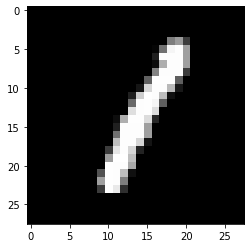

pred :  1 [7.48844187e-08 1.00000000e+00 1.71321119e-07 7.69273423e-10
 9.24914843e-07 1.86218614e-07 4.60848213e-08 8.26617168e-07
 7.13486770e-07 1.15256125e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


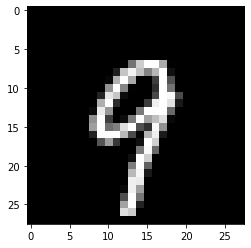

pred :  9 [1.0244314e-11 2.4128106e-12 3.5689685e-10 3.6016665e-08 8.5596902e-08
 2.9838696e-09 1.5115278e-10 1.7721010e-07 1.1620242e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


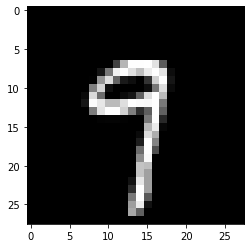

pred :  9 [2.0816567e-11 1.2334643e-09 5.9518328e-11 1.9128562e-08 2.5320634e-05
 3.0089907e-07 1.2065940e-15 3.0593415e-05 2.7246919e-08 9.9996865e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


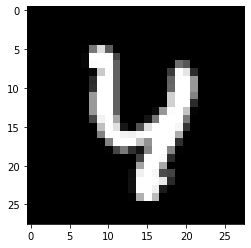

pred :  4 [2.41586460e-15 9.59510346e-16 1.21494415e-08 2.99833047e-10
 1.00000000e+00 9.05766342e-08 2.21273799e-09 1.44266987e-05
 2.97279223e-09 2.95943092e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


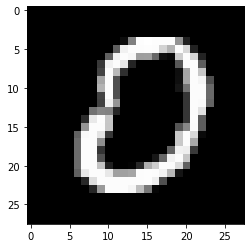

pred :  0 [1.0000000e+00 4.7498041e-08 1.1277793e-06 8.5524521e-10 8.0139523e-12
 6.5761114e-08 2.5002811e-07 1.5758918e-10 3.2088045e-13 2.1541746e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


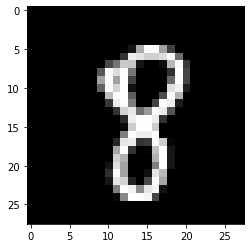

pred :  8 [2.4722195e-09 6.3202021e-09 1.2767039e-06 1.0522024e-05 2.3125043e-08
 9.7432089e-09 1.3048142e-06 2.3615485e-08 9.9999976e-01 8.3303485e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


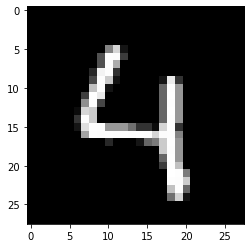

pred :  4 [5.2490835e-13 5.5084527e-11 1.0765031e-06 2.2611388e-11 9.9999988e-01
 1.0247554e-06 9.5896027e-11 9.2182256e-10 3.6763470e-12 1.7723341e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


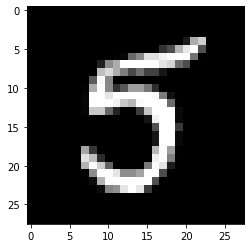

pred :  5 [6.5081002e-10 1.0395077e-05 8.0483653e-10 4.2821398e-07 1.2556456e-11
 9.9997818e-01 1.6715554e-10 1.6895061e-09 2.5022691e-08 1.9225208e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


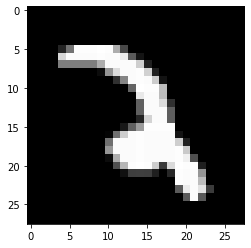

pred :  2 [7.7405894e-16 1.0305345e-03 9.9777734e-01 5.3974250e-05 2.7208177e-08
 1.5984600e-10 5.2881376e-08 4.7869435e-06 1.3829566e-09 3.9099227e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


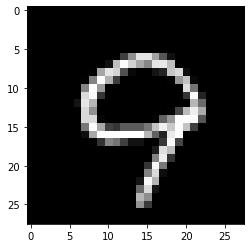

pred :  9 [1.9470481e-09 2.8796211e-16 4.3960945e-08 1.8163174e-08 3.3011975e-06
 6.1866019e-11 1.9476525e-10 2.8654302e-05 3.6270025e-11 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


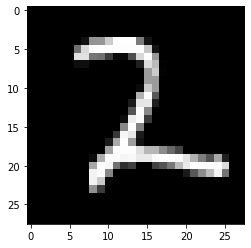

pred :  2 [6.1591895e-12 4.4444525e-05 1.0000000e+00 9.0205950e-12 1.9472622e-14
 1.4950513e-06 6.0862426e-10 1.9523601e-11 3.5823700e-10 9.2855732e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


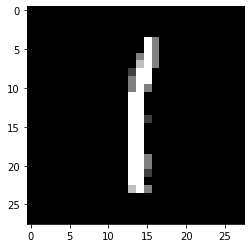

pred :  1 [2.0284989e-12 9.9999982e-01 5.4153232e-10 1.2139835e-05 1.1683925e-10
 3.0500846e-06 4.5768007e-07 1.2097500e-07 4.8792327e-07 1.7481812e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


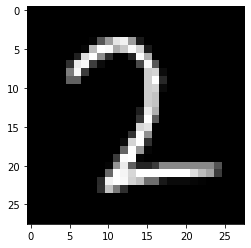

pred :  2 [4.4297517e-09 1.2397766e-04 9.9998158e-01 1.9964779e-09 6.5068242e-13
 2.4146066e-06 3.7043549e-08 2.3133544e-09 1.7804377e-10 1.4023284e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


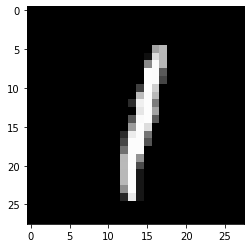

pred :  1 [1.69458503e-10 9.99994218e-01 2.77400485e-08 1.18081087e-10
 9.39709571e-05 1.12470752e-06 8.41668335e-09 1.14672315e-04
 1.13865724e-07 8.37188541e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


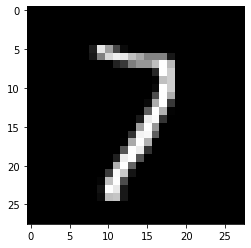

pred :  7 [3.0685382e-10 5.8651914e-08 7.6517317e-06 4.8792860e-08 2.6604857e-10
 9.0540786e-10 8.1547372e-14 9.9999058e-01 4.5504045e-09 1.2609059e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


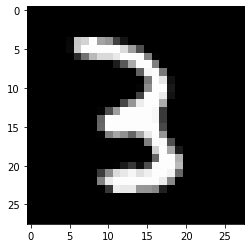

pred :  3 [2.9393014e-13 7.1284646e-08 1.9150129e-05 9.9999857e-01 1.1538397e-11
 7.6283863e-10 5.3500000e-13 1.9559168e-10 3.3610689e-08 5.9330610e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


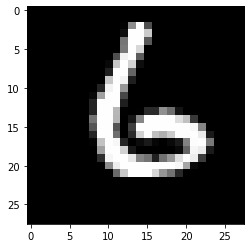

pred :  6 [3.3286246e-10 3.4830252e-09 6.7175367e-09 4.1913358e-06 4.3923292e-09
 2.7897956e-08 1.0000000e+00 3.2531500e-13 1.0631702e-10 7.4639397e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


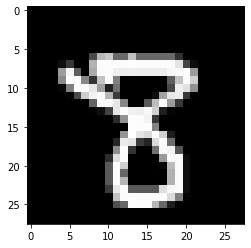

pred :  8 [9.5853415e-11 1.7109683e-12 1.8877089e-03 9.6266871e-05 1.1504670e-10
 1.8241246e-07 5.2367988e-11 1.5012290e-08 9.9983025e-01 2.3005599e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


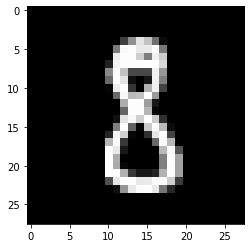

pred :  8 [7.3068048e-07 5.1478332e-07 4.1987430e-05 3.7607349e-06 1.7467437e-10
 3.9158391e-07 1.9233195e-08 2.2524394e-11 9.9999541e-01 7.4476797e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


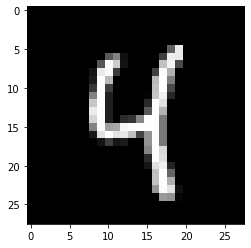

pred :  4 [2.1488386e-14 3.5544920e-06 1.7720551e-11 6.8486634e-07 9.9999964e-01
 8.7034414e-07 1.9442876e-12 6.0294991e-10 1.2956759e-09 2.1199494e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


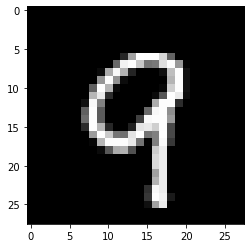

pred :  9 [1.9789084e-10 1.1737185e-12 6.3242123e-07 4.4508866e-05 3.4816900e-09
 1.3745409e-10 7.4497242e-11 6.2417968e-08 2.9569369e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


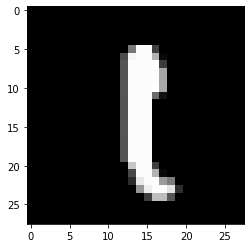

pred :  1 [1.4571504e-10 9.9865860e-01 3.7989846e-06 3.1640380e-07 9.6378745e-09
 1.8293031e-06 4.6945070e-10 1.2807684e-06 7.2729963e-05 1.2727760e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


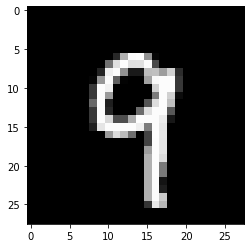

pred :  9 [2.7625378e-11 3.3062553e-11 4.2698121e-09 2.4375754e-07 6.2137486e-09
 3.6285888e-10 5.3354782e-13 4.2921301e-06 1.0662002e-06 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


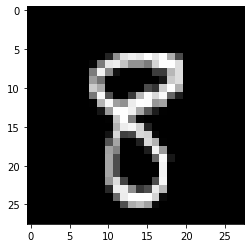

pred :  8 [7.18767357e-09 2.03788375e-12 1.09370944e-07 1.12375617e-03
 1.58001806e-10 7.32536364e-07 8.95633914e-12 5.31298228e-10
 9.99525547e-01 2.33863890e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


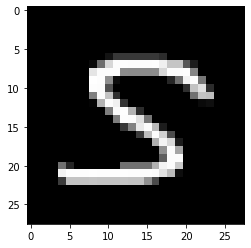

pred :  5 [1.2500909e-09 6.4623609e-09 4.9208573e-08 1.6207844e-02 3.4867768e-15
 5.1776093e-01 4.8438473e-15 4.2803467e-13 3.4466581e-09 9.6368503e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


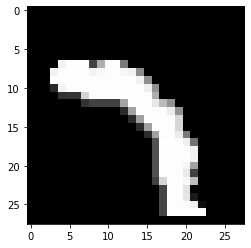

pred :  7 [6.53155590e-13 5.48647279e-08 2.57100563e-09 2.95758247e-03
 5.75675271e-12 1.01029013e-06 5.91336875e-12 9.99227762e-01
 1.02539715e-07 3.95178795e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


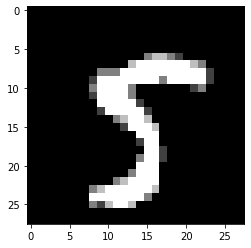

pred :  5 [8.1997817e-14 2.0183924e-07 1.8623023e-10 7.8516041e-07 3.3207910e-15
 1.0000000e+00 3.1705177e-18 2.6206828e-10 1.0786554e-09 8.2788220e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


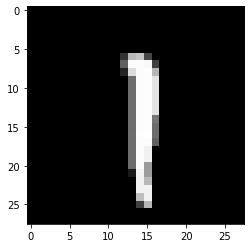

pred :  1 [6.1234804e-14 9.9979889e-01 1.7679998e-08 1.8875010e-08 1.8640989e-08
 2.2406208e-08 2.7950312e-08 2.6160479e-04 1.6042962e-07 1.5564680e-02]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


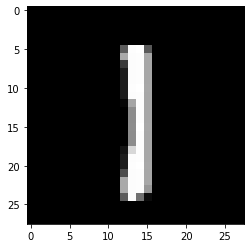

pred :  1 [3.8179360e-12 9.9896777e-01 4.6756746e-08 3.9160258e-07 6.5119708e-11
 6.4716558e-05 5.8370123e-08 3.7523641e-05 8.5148215e-04 2.8419016e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


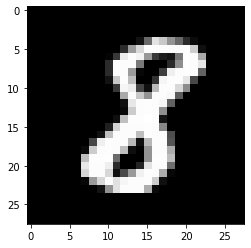

pred :  8 [3.71354753e-10 2.18156174e-07 1.00257814e-04 1.31746197e-06
 4.98345643e-10 1.04416245e-07 8.79587049e-07 3.51124179e-08
 9.99766290e-01 6.83434154e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


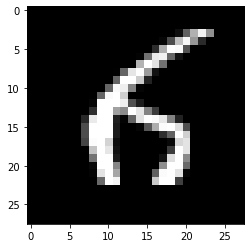

pred :  6 [4.4044515e-09 1.6031514e-08 3.3441013e-06 1.4600206e-11 2.8551803e-08
 1.3300311e-05 9.9999291e-01 2.3774305e-15 2.7279263e-08 9.6870135e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


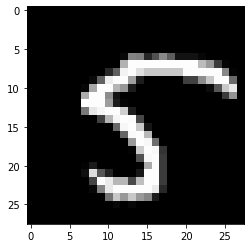

pred :  5 [3.90022409e-16 5.79108539e-10 1.07366914e-10 3.01033110e-09
 7.95971294e-14 1.00000000e+00 4.33841383e-18 9.90123435e-12
 3.92680166e-10 2.43091279e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


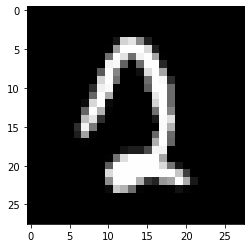

pred :  2 [6.2319505e-01 3.6348201e-06 9.4202071e-01 6.2934336e-10 1.6380119e-10
 7.8819582e-09 7.5058303e-08 2.3097571e-05 2.2463793e-09 6.7509115e-03]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


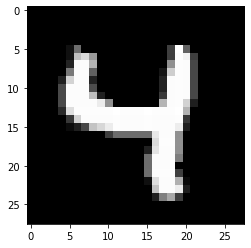

pred :  4 [1.0630458e-15 2.7643746e-13 4.3417092e-10 4.6799863e-07 1.0000000e+00
 5.3344813e-09 2.2402200e-11 2.4942114e-08 4.4392355e-06 7.2357830e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


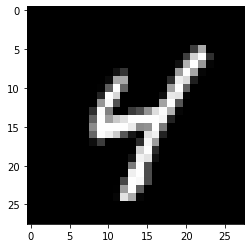

pred :  4 [2.7773067e-13 7.0969697e-10 6.8558350e-08 4.0753947e-09 9.9999869e-01
 1.0034456e-06 3.8474494e-11 7.1595312e-12 4.7717670e-09 9.6374060e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


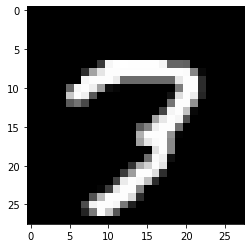

pred :  7 [1.13594294e-10 2.56427502e-14 6.79481857e-08 1.30660534e-02
 2.81310535e-14 1.27430608e-10 1.71543769e-13 9.22048807e-01
 3.65452946e-11 7.13633126e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


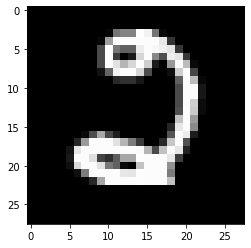

pred :  2 [1.0682551e-04 9.3340688e-08 9.9996191e-01 2.6127398e-03 6.3056190e-17
 1.1487118e-06 4.6733742e-08 2.4581582e-11 2.8213077e-16 1.4484108e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


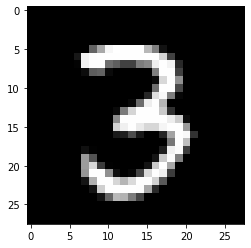

pred :  3 [2.9189108e-12 7.6185713e-10 3.2927549e-08 1.0000000e+00 3.9345516e-11
 2.0953699e-09 3.8164210e-16 2.0627830e-08 1.6712175e-10 3.0028934e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


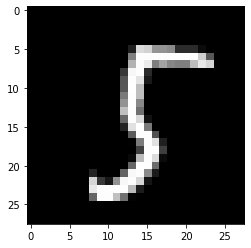

pred :  5 [1.8608491e-11 3.4251563e-05 1.1311749e-11 6.8388957e-08 1.9269479e-15
 9.9999982e-01 2.1195590e-10 1.9563030e-12 1.5950916e-06 2.6980882e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


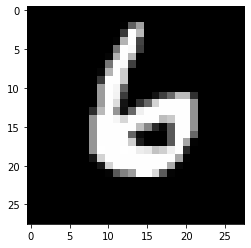

pred :  6 [1.6757053e-10 1.8535440e-12 3.8915179e-05 8.5280832e-10 2.2974685e-08
 1.1119530e-10 1.0000000e+00 2.9285401e-13 1.2383978e-06 6.7197667e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


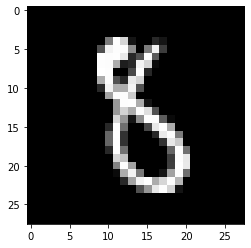

pred :  8 [6.0931686e-09 7.9713900e-06 2.9172290e-07 2.2685528e-04 9.5167360e-11
 4.4170022e-04 4.1985069e-05 2.0502885e-13 9.9645883e-01 5.3497479e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


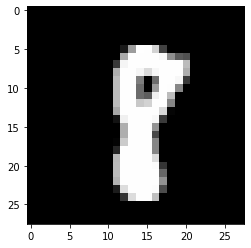

pred :  8 [1.3795818e-09 1.2874603e-04 8.6149039e-06 2.5893979e-08 1.4320640e-09
 2.1319285e-07 4.9061128e-09 6.3505236e-06 9.9999475e-01 1.6615721e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


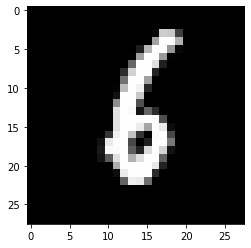

pred :  6 [1.1932736e-08 2.4342908e-05 1.6198351e-08 6.1437113e-09 2.5517668e-09
 9.6115691e-05 1.0000000e+00 1.3486819e-11 7.1951217e-07 8.3063506e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


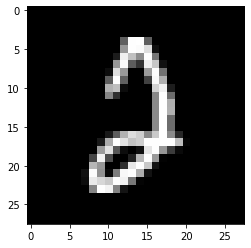

pred :  2 [3.2772929e-05 8.8431484e-09 9.9968147e-01 3.6185901e-07 2.6654214e-11
 1.8521439e-05 5.3945070e-07 9.4292511e-07 1.2029417e-05 4.8185815e-05]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


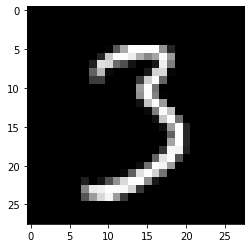

pred :  3 [6.2820773e-06 2.4485014e-06 3.0866049e-05 9.9999666e-01 1.4613217e-11
 1.5118474e-07 1.4004692e-15 7.4161775e-08 3.9804280e-12 7.1048154e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


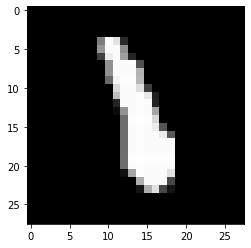

pred :  1 [4.2692536e-15 9.9996185e-01 1.3807416e-04 7.1577131e-07 5.5157864e-07
 1.8764639e-07 2.0589530e-03 1.1752033e-09 2.1058321e-04 2.0204828e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


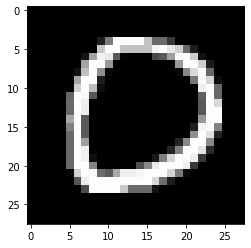

pred :  0 [9.9992716e-01 8.1254842e-07 5.9643030e-06 3.1839631e-06 5.1556022e-14
 1.4761090e-04 3.6443826e-06 5.3291139e-12 9.9266007e-14 5.2082524e-14]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


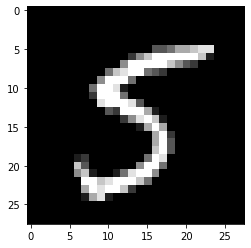

pred :  5 [9.0280257e-13 9.0011360e-07 1.0783845e-08 1.1870439e-09 4.6430476e-13
 1.0000000e+00 1.2769733e-13 1.1397267e-12 3.0419986e-11 9.3959926e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


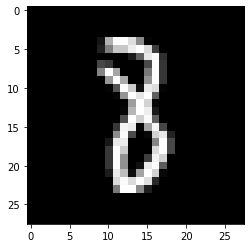

pred :  8 [9.4532191e-07 7.2809144e-07 3.4855813e-02 4.1681230e-03 3.3199951e-10
 2.4479807e-08 8.7756024e-07 1.6542537e-10 9.9970144e-01 1.3795557e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


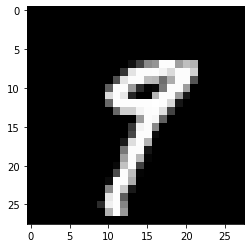

pred :  9 [1.8201191e-11 7.5747522e-07 1.3179555e-14 8.0651077e-08 4.9057881e-08
 2.3789598e-05 2.0609521e-14 5.6695938e-04 2.2328734e-06 9.9645925e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


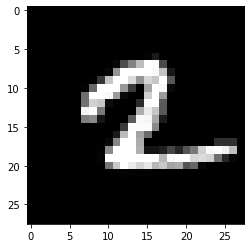

pred :  2 [1.2802347e-08 1.0934957e-05 9.9994236e-01 1.5027031e-06 1.2895142e-10
 9.1234506e-11 2.8021198e-08 6.3583379e-09 7.8740368e-06 1.1098802e-02]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


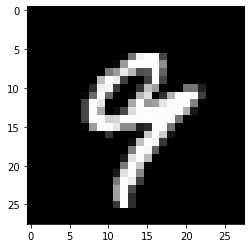

pred :  9 [2.3962210e-13 4.2073583e-14 3.2110947e-09 2.5886719e-08 3.6222637e-03
 1.5611741e-08 5.1826017e-12 8.9890666e-05 5.0083389e-07 9.9999893e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


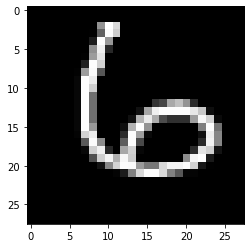

pred :  6 [4.2345483e-09 1.3210489e-06 3.2077357e-06 6.8813844e-11 1.0256031e-06
 3.0134519e-08 9.9999970e-01 1.7375126e-14 7.6084973e-07 3.0063443e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


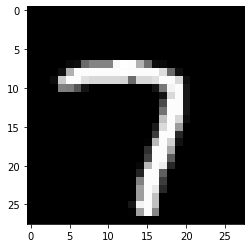

pred :  7 [3.7139550e-08 8.7341098e-12 7.5479124e-07 3.4298500e-09 2.2044075e-15
 3.8371911e-10 6.5388572e-14 1.0000000e+00 2.0493001e-16 1.5960844e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


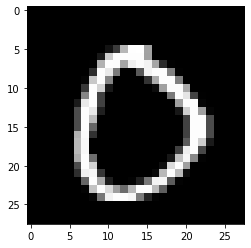

pred :  0 [9.9999923e-01 6.1890660e-08 2.4609216e-07 1.3069525e-08 1.7698055e-11
 1.6520121e-06 9.6733350e-11 2.9185828e-06 7.1518160e-13 5.7478283e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


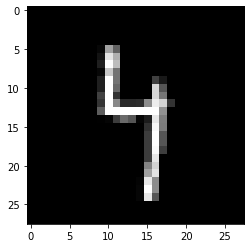

pred :  4 [5.9785868e-17 8.9549692e-05 3.6571668e-10 1.8182681e-09 9.9981833e-01
 3.8795788e-05 1.5323607e-11 1.1002228e-07 2.0426985e-11 4.5771819e-01]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


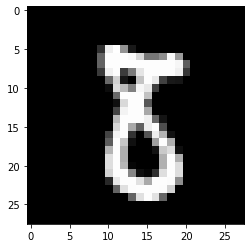

pred :  8 [7.7506156e-06 9.2203621e-08 2.0082774e-05 3.0746460e-06 5.0622836e-13
 8.0020855e-06 2.3301736e-07 9.3841940e-08 9.9989378e-01 1.1057694e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


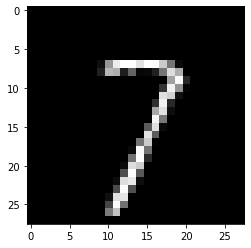

pred :  7 [2.4141548e-12 7.2454149e-09 4.5141341e-08 2.6783347e-04 1.3694117e-14
 8.7631535e-10 2.6680776e-14 9.9990332e-01 6.3479499e-10 3.2887724e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


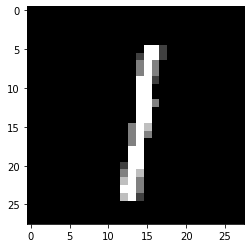

pred :  1 [1.10930716e-10 9.99999344e-01 5.10028297e-10 6.27874073e-08
 2.89487048e-08 1.51123538e-06 7.95024935e-09 1.80128939e-06
 9.57680868e-07 2.73258181e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


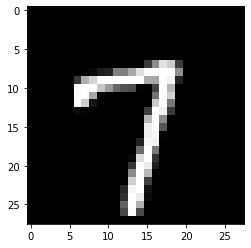

pred :  7 [5.6950453e-09 2.9573979e-09 1.2707972e-07 2.4119067e-06 1.9265134e-12
 8.4987900e-10 2.8208276e-13 9.9999976e-01 1.7343656e-12 4.6801091e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


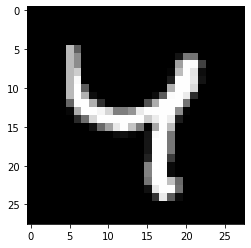

pred :  4 [2.2075042e-15 3.1223791e-12 2.1408952e-09 8.5783554e-08 9.9999869e-01
 6.2289374e-09 5.4689017e-11 8.1374850e-08 2.2228598e-06 3.4087883e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


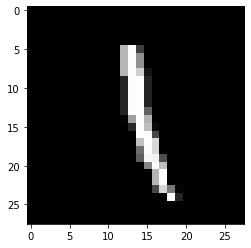

pred :  1 [6.2982935e-15 9.9998719e-01 1.6089150e-06 8.4084846e-09 5.5101373e-06
 4.7832696e-06 6.3491484e-10 1.2099889e-07 2.6313806e-05 7.8203257e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


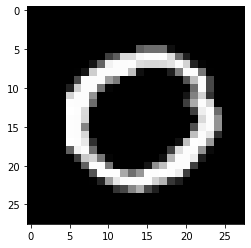

pred :  0 [1.0000000e+00 4.3457817e-08 3.7386156e-09 2.8631244e-09 8.1987140e-15
 1.7272130e-05 9.7529941e-08 1.1362057e-07 1.4416587e-13 8.4072539e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


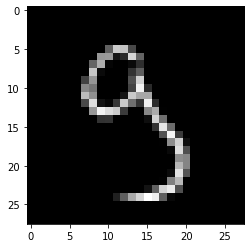

pred :  9 [2.6466391e-13 1.9561082e-09 1.9000473e-10 1.2794286e-02 1.5664101e-04
 6.3397922e-05 2.1735528e-12 7.7291980e-07 2.8843480e-05 4.2575091e-02]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


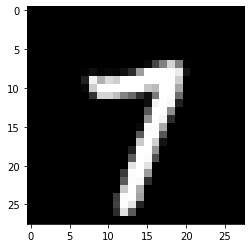

pred :  7 [3.1804759e-10 2.2192483e-08 4.3262780e-09 7.8946159e-06 5.1623403e-11
 8.5935650e-09 1.9130338e-13 9.9999976e-01 4.6494950e-11 1.4161739e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


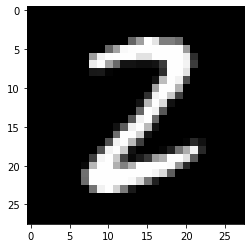

pred :  2 [3.2888678e-09 1.8211133e-06 1.0000000e+00 2.0477612e-06 6.7700022e-17
 4.0641623e-07 1.3429108e-12 2.8968077e-09 1.1479775e-09 5.1243482e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


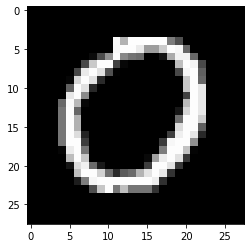

pred :  0 [9.99966085e-01 3.86624890e-07 1.15355106e-04 1.13739231e-08
 2.68716681e-11 3.20568674e-08 8.31055829e-08 3.61318780e-10
 3.15897238e-13 4.28259373e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


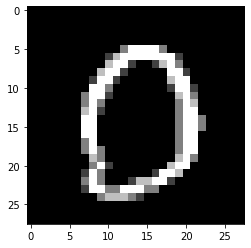

pred :  0 [9.99999642e-01 3.71856035e-09 1.30978805e-07 1.34264072e-10
 3.65105775e-12 2.52468027e-07 2.36667441e-09 2.72885409e-05
 9.51604160e-12 1.18923264e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


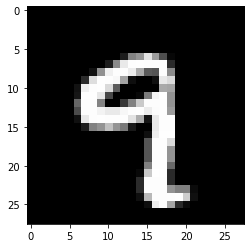

pred :  9 [1.0977534e-11 1.3454721e-12 1.6004589e-09 1.0508004e-09 2.2575149e-07
 1.1790673e-07 1.4176392e-12 7.1462676e-07 3.7861463e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


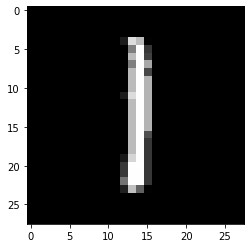

pred :  1 [1.2579109e-11 9.9999475e-01 1.8347787e-08 2.7654403e-07 1.3027657e-09
 1.7245005e-05 7.3568751e-09 2.6132943e-07 8.2716366e-07 1.5631333e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


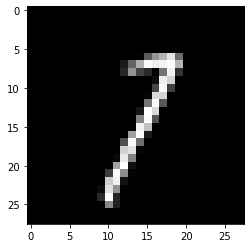

pred :  7 [4.3832441e-11 1.1041760e-03 3.7489713e-08 4.2953261e-07 3.8871999e-11
 2.2020357e-09 2.8008303e-13 9.8498285e-01 1.0681322e-09 3.3236625e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


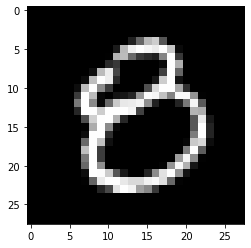

pred :  8 [3.2629281e-02 4.6514157e-09 4.1960710e-08 1.9379708e-07 1.6070117e-12
 3.6234023e-06 2.5326014e-04 4.9217559e-09 2.6569390e-01 3.0752046e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


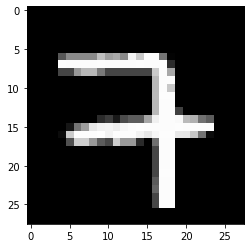

pred :  7 [7.0690578e-14 3.1723403e-13 2.5939941e-03 3.5918951e-03 1.0423721e-06
 6.4423402e-12 8.9529613e-11 9.8553526e-01 2.3869507e-14 2.3408737e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


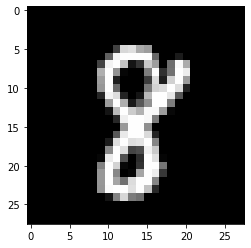

pred :  8 [2.0096712e-08 3.7987400e-07 1.7657023e-05 1.6045732e-07 2.7410161e-09
 2.7939265e-07 1.5281440e-10 1.4276250e-06 9.9999821e-01 6.1676161e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


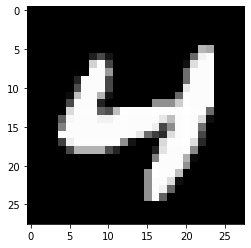

pred :  4 [3.4627803e-10 1.7327008e-14 3.9576321e-07 6.8662613e-09 9.9885279e-01
 1.5725425e-08 6.6124734e-08 6.6268541e-08 6.0878633e-06 1.9320846e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


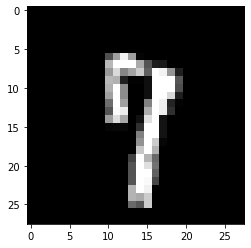

pred :  7 [3.3489888e-11 5.2552232e-06 1.1936713e-09 7.7910414e-08 7.4276328e-04
 1.3494770e-11 2.2199551e-12 7.9301453e-01 1.9734207e-06 1.9034743e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


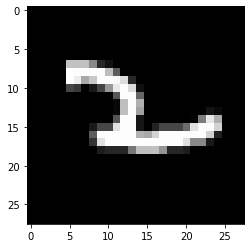

pred :  2 [3.7417880e-10 2.8166087e-12 9.9993521e-01 6.7176393e-07 1.1741850e-05
 3.0735831e-07 1.6437253e-08 8.7612319e-01 1.1050012e-14 2.7977910e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


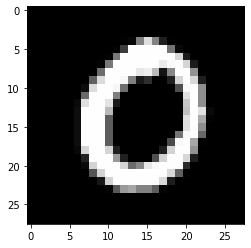

pred :  0 [1.00000000e+00 1.72145231e-09 1.01570535e-07 9.47741441e-10
 3.30469142e-15 2.08777529e-08 1.20775809e-07 6.40732708e-07
 5.79471453e-12 5.59736293e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


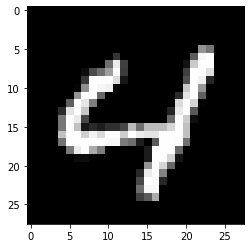

pred :  4 [5.2810819e-08 3.9187336e-15 1.7242169e-06 2.1311040e-10 9.9997616e-01
 2.5687999e-07 3.2627367e-10 3.4254789e-03 3.7521978e-08 1.6331673e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


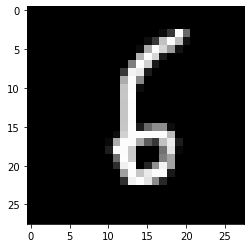

pred :  6 [6.05704514e-11 3.76050375e-05 5.04044522e-08 7.30358884e-10
 1.07189865e-11 3.67635489e-03 9.99961853e-01 1.34158032e-11
 1.40811935e-05 1.60968530e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


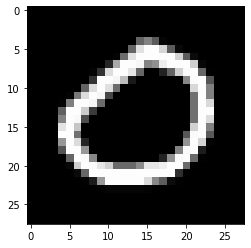

pred :  0 [9.9999905e-01 6.8678105e-08 2.6501111e-08 3.4073155e-09 4.1374425e-16
 3.4026673e-06 1.4449355e-08 5.7597845e-08 1.4337249e-14 1.2143952e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


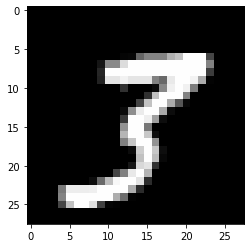

pred :  3 [1.6532238e-12 9.6280584e-10 9.9939283e-14 9.9999487e-01 1.3930026e-14
 8.6506680e-06 6.3347437e-17 7.9479840e-05 4.8498199e-11 2.1084526e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


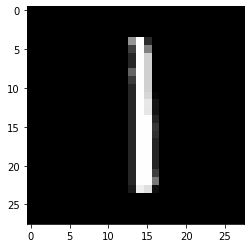

pred :  1 [4.1580416e-13 1.0000000e+00 6.2935840e-08 4.8499080e-09 4.0906194e-09
 4.1691305e-06 4.3488808e-07 3.4081982e-06 7.6396458e-07 2.8965925e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


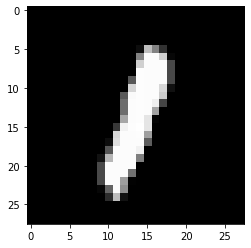

pred :  1 [9.6275221e-07 9.9999458e-01 1.3876308e-07 1.6794489e-10 2.9935663e-05
 1.4932351e-07 3.6794482e-08 2.8373036e-06 2.0411146e-06 2.9859535e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


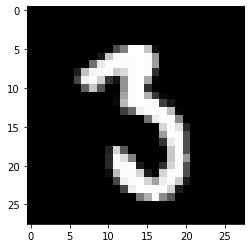

pred :  3 [1.9220415e-06 3.5257647e-06 3.8527755e-06 9.8336482e-01 5.2960755e-14
 4.3189016e-06 1.0648851e-10 8.9823562e-09 6.0909904e-05 1.7881393e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


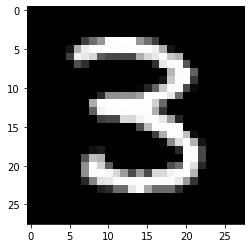

pred :  3 [2.7538061e-10 1.2066448e-07 6.7481935e-08 1.0000000e+00 1.0097921e-08
 2.3793976e-07 2.0878269e-12 4.7055621e-13 3.8927874e-07 1.7337573e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


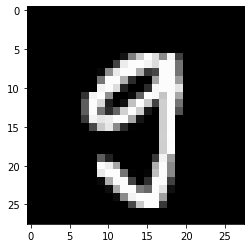

pred :  9 [5.8417850e-06 1.8627374e-12 2.5952335e-07 2.2961851e-06 6.4395544e-11
 1.2719631e-03 8.4028071e-17 5.0591185e-09 1.0262209e-05 9.9987876e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


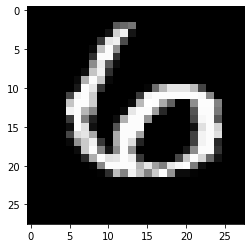

pred :  6 [9.8584314e-06 1.6359458e-09 4.8716188e-06 9.9828661e-09 2.6381219e-09
 5.6221620e-07 9.9999976e-01 3.3501305e-12 9.9720285e-07 6.9379560e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


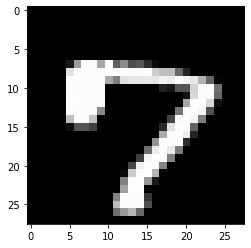

pred :  7 [1.4905334e-07 3.3860376e-14 6.7192762e-10 1.2937805e-11 2.8684852e-10
 7.7410782e-08 2.0268735e-13 9.9999893e-01 9.5139365e-12 4.7229352e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


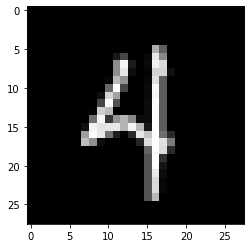

pred :  4 [4.9266439e-15 7.1282606e-08 4.4149042e-06 1.6867532e-09 1.0000000e+00
 1.1684395e-04 1.9372399e-08 1.6659498e-04 9.9682429e-11 3.0189243e-11]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


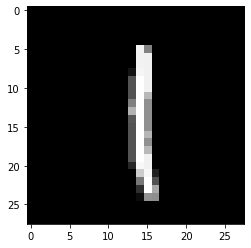

pred :  1 [4.9735139e-14 9.9999940e-01 2.0209223e-08 3.8127112e-08 2.7127638e-09
 1.1554623e-06 3.4158841e-06 1.5567504e-05 3.2237044e-06 1.2903840e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


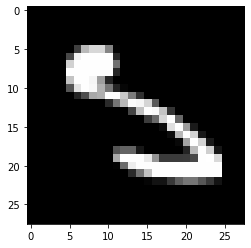

pred :  5 [9.0191357e-15 3.3390522e-04 2.0752079e-06 2.7703551e-09 2.1470711e-08
 9.9834341e-01 5.7701506e-09 1.2169992e-06 1.6181028e-08 2.2736175e-13]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


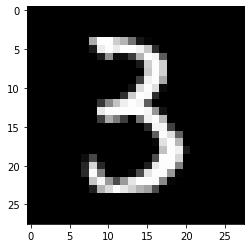

pred :  3 [4.7881986e-08 2.0592421e-07 5.4896443e-08 1.0000000e+00 4.5295354e-09
 5.9111107e-09 1.5142057e-10 2.1741447e-13 5.9765699e-09 3.0794023e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


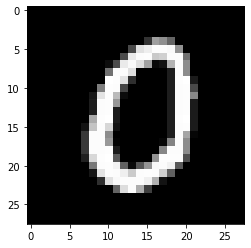

pred :  0 [9.9999857e-01 1.8165573e-11 6.3526710e-07 2.5147269e-09 4.9158073e-13
 2.9420962e-08 2.3853003e-05 2.6290552e-09 9.8297404e-10 9.6893045e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


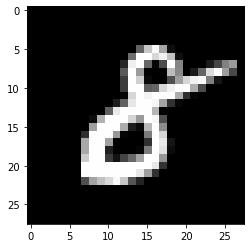

pred :  8 [2.4648770e-07 4.4917154e-09 3.2734871e-04 4.8379849e-07 1.3131354e-10
 1.4775693e-03 1.9985437e-04 6.8381287e-11 9.9622762e-01 1.8962640e-10]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


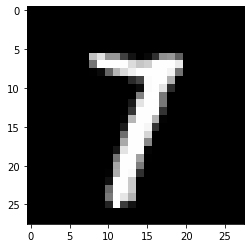

pred :  7 [5.7583369e-11 7.8021985e-05 9.2483852e-08 5.2844348e-07 7.4293613e-11
 1.3408839e-08 3.3766295e-13 9.9999797e-01 5.1240214e-08 4.7893490e-12]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


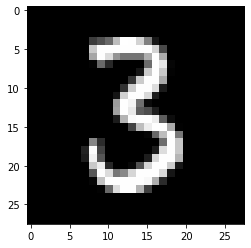

pred :  3 [6.5012919e-09 5.4550643e-08 3.7858626e-08 1.0000000e+00 7.0751724e-09
 6.8237291e-08 2.3173564e-12 2.4466699e-11 1.2767707e-06 3.1970662e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


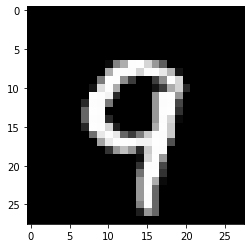

pred :  9 [5.0377391e-10 1.2943222e-13 2.6996352e-07 3.0217932e-11 1.1976973e-04
 7.3126216e-10 7.1149211e-12 2.0432472e-04 1.5440568e-09 9.9999917e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


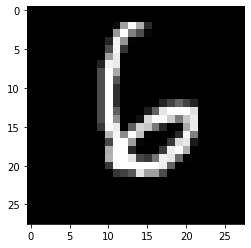

pred :  6 [1.6756893e-10 3.7432691e-12 4.1425228e-04 1.1570358e-10 2.2869852e-11
 8.0379564e-08 1.0000000e+00 8.2060864e-14 2.3656184e-09 1.5195837e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


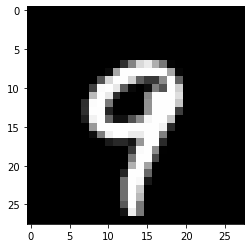

pred :  9 [1.2983216e-11 1.1159388e-14 9.7268877e-09 1.9399751e-09 8.6572118e-06
 1.0036695e-10 1.6140155e-12 9.9396425e-07 1.0013841e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


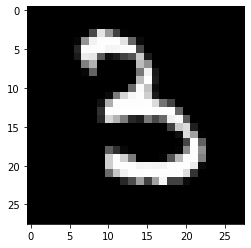

pred :  3 [3.0235270e-12 4.4101301e-07 4.3627471e-05 9.9993074e-01 1.1401159e-12
 1.0484297e-06 5.2357851e-09 2.4697648e-12 9.1460178e-10 3.2490310e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


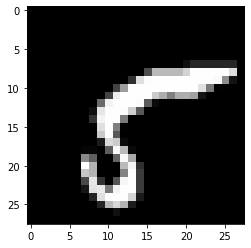

pred :  5 [2.9370821e-09 6.3748646e-09 4.6935576e-14 1.1742553e-13 2.6883545e-16
 1.0000000e+00 2.3317082e-12 3.9631166e-05 4.0821436e-07 8.0168194e-10]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


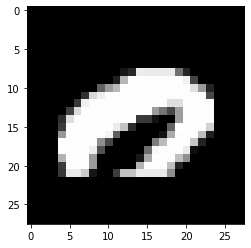

pred :  0 [1.4842522e-01 8.5852329e-15 9.3350085e-05 2.2438046e-10 8.4292230e-07
 3.1805052e-05 2.4631619e-04 5.2881539e-03 9.7692565e-10 5.2046730e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


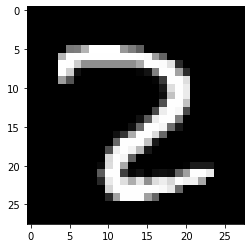

pred :  2 [6.8441486e-06 3.4900258e-10 9.9999833e-01 3.6417596e-06 2.5075447e-11
 1.4665999e-10 6.4679863e-12 5.0904241e-06 4.8595015e-05 3.2375747e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


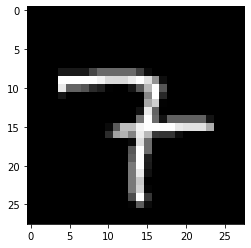

pred :  7 [3.5924671e-15 3.0055161e-10 1.0829264e-06 1.1581399e-04 7.5343490e-07
 5.7225280e-13 1.2939404e-08 9.9995661e-01 8.1388654e-12 6.4447653e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


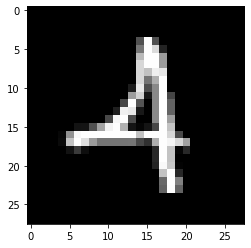

pred :  4 [3.0817249e-09 3.5437726e-08 9.6020734e-01 8.4367348e-05 9.8544306e-01
 4.3053474e-06 4.0090979e-09 2.2709578e-06 8.2922664e-09 1.0153765e-10]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


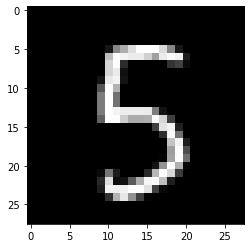

pred :  5 [1.32672198e-11 1.28498803e-08 7.67850714e-12 8.39145287e-09
 1.27072852e-10 1.00000000e+00 4.60675283e-11 9.64828824e-12
 1.14787735e-08 5.01483679e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


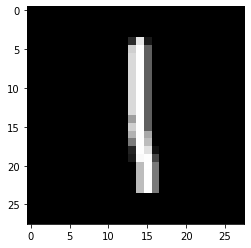

pred :  1 [5.66382268e-14 9.99999523e-01 1.64812278e-07 5.41206582e-08
 9.44927470e-10 1.12254993e-05 1.06908516e-07 3.46483876e-06
 1.16947012e-05 1.89725711e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


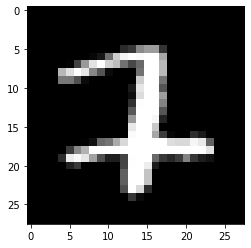

pred :  2 [2.4362085e-13 1.4870250e-05 2.5996387e-01 2.6133657e-04 5.6745986e-08
 7.7103799e-09 3.1555986e-10 2.2489876e-02 4.4587996e-06 4.4940397e-12]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


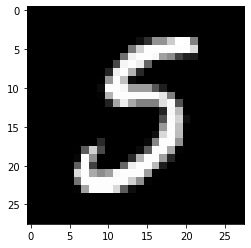

pred :  5 [8.9303938e-08 2.6230521e-07 3.2608784e-07 2.7053156e-05 1.6857173e-13
 9.9998403e-01 1.2330691e-09 1.0210790e-09 1.6963290e-09 9.4224191e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


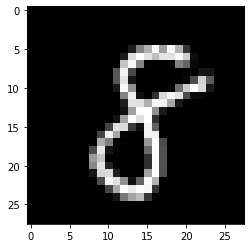

pred :  8 [3.5897108e-09 1.8443750e-08 1.2710480e-07 3.4702705e-05 4.4581869e-10
 1.3330827e-05 4.5153740e-08 1.9835764e-09 9.9990672e-01 5.5086613e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


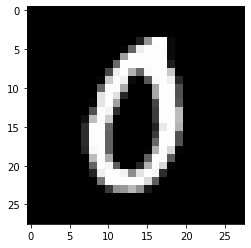

pred :  0 [9.9999905e-01 8.9589572e-11 1.2490275e-06 5.9526108e-09 4.7496203e-09
 2.3304604e-07 4.2165855e-08 1.2130900e-05 4.6740788e-06 2.6208162e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


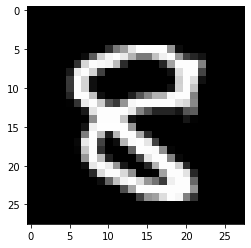

pred :  8 [1.0473514e-06 1.3485276e-11 1.5858037e-05 5.0972762e-05 2.3154746e-08
 9.5912958e-07 1.8820503e-05 8.4260474e-13 9.9997771e-01 1.1186263e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


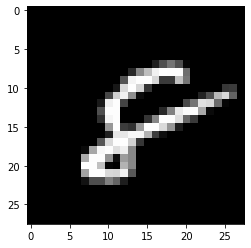

pred :  8 [1.2880032e-05 2.1111998e-13 1.5070438e-03 2.4296936e-09 6.7012943e-06
 1.2311256e-09 9.7189095e-06 2.3972851e-10 9.9997008e-01 1.5190663e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


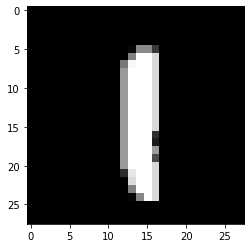

pred :  1 [1.0473218e-11 9.9999171e-01 2.2759141e-06 6.2159535e-09 9.4069179e-08
 2.7263593e-07 5.1255535e-07 1.4211834e-06 2.6623909e-05 5.3599746e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


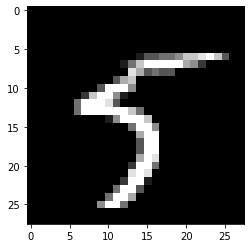

pred :  5 [6.5923449e-17 2.6246210e-09 5.2873496e-16 4.6783306e-09 1.2164113e-09
 9.9996513e-01 1.1212140e-12 6.5803616e-09 1.6373396e-04 2.6651396e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


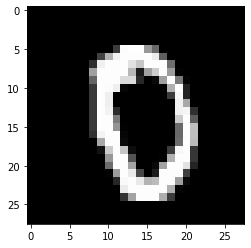

pred :  0 [9.9999571e-01 2.3994670e-14 1.2179222e-06 1.5482364e-08 7.7946296e-14
 5.7646632e-04 7.5761824e-07 4.1002060e-08 2.2897843e-06 4.9228549e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


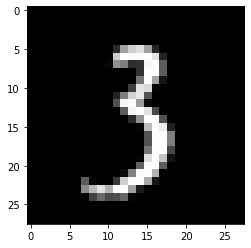

pred :  3 [7.2283681e-09 1.1922191e-06 4.2961268e-08 9.9990201e-01 1.1113201e-08
 2.0859654e-05 3.6175080e-12 1.8887146e-08 7.5775375e-08 2.6602081e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


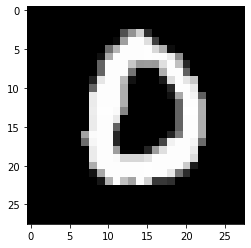

pred :  0 [9.9994272e-01 2.7637959e-12 2.7417484e-05 3.3350067e-09 5.8645783e-11
 2.1197835e-08 2.7664531e-05 7.7825038e-11 1.4032160e-10 6.9210250e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


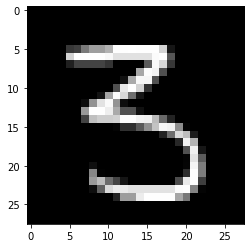

pred :  3 [1.5092823e-08 7.3103699e-08 2.4612477e-09 9.9972332e-01 3.4801400e-07
 4.1580498e-03 3.2374861e-15 5.9796085e-11 1.4639128e-08 1.4028214e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


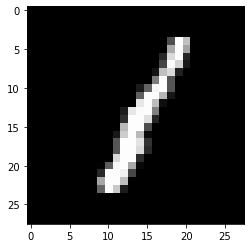

pred :  1 [2.9477538e-11 9.9999702e-01 4.2923284e-07 8.4657250e-09 3.5151217e-08
 1.1752520e-06 1.1984033e-06 3.4448081e-07 4.9524097e-08 2.4559660e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


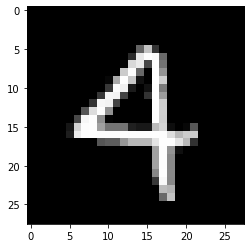

pred :  4 [3.3345088e-10 4.9301035e-11 8.6262822e-04 2.9594915e-07 9.9999726e-01
 1.4465998e-06 1.1559031e-08 9.8991347e-07 8.6496929e-12 1.0988507e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


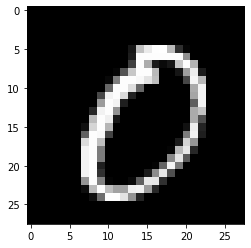

pred :  0 [9.9999595e-01 2.4371107e-05 1.7399687e-08 7.0006646e-11 6.8532521e-14
 1.9686002e-05 4.8974510e-07 1.9869134e-08 6.8261116e-08 2.5383290e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


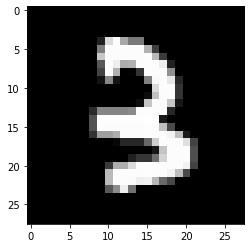

pred :  3 [1.8521408e-12 4.2710198e-08 4.9732089e-02 9.9995559e-01 1.4659908e-13
 4.5235095e-07 1.2890826e-12 3.4953618e-10 1.9967302e-08 1.3766825e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


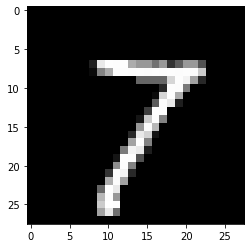

pred :  7 [8.9829977e-11 8.7545327e-10 3.9307411e-11 4.5096549e-06 9.3218839e-15
 4.2723720e-08 1.8940074e-15 9.9999964e-01 7.3022199e-11 7.5348838e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


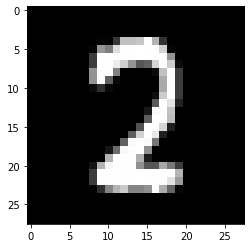

pred :  2 [1.13391150e-06 7.09114545e-08 1.00000000e+00 4.66125186e-07
 1.14463425e-17 9.26462405e-07 4.45308990e-09 3.31891755e-07
 6.11599882e-10 1.02521625e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


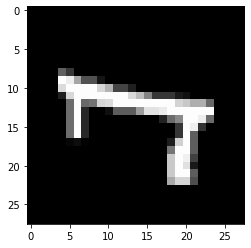

pred :  7 [1.45564949e-11 3.47164386e-09 3.16363637e-11 3.30027172e-10
 2.94032693e-03 6.72561384e-07 1.30832195e-04 9.99014854e-01
 2.48445904e-08 1.15592535e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


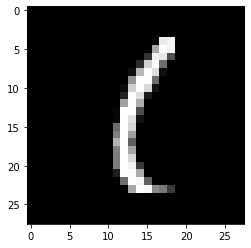

pred :  1 [4.1045178e-06 9.9730283e-01 2.2650714e-07 6.6817726e-08 2.0529016e-10
 5.6433921e-05 3.7300587e-04 5.2906368e-09 1.3366044e-03 3.4804286e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


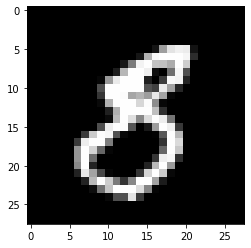

pred :  8 [1.4082152e-08 3.0521753e-07 4.6359311e-10 2.1742746e-06 6.2515433e-08
 5.3837895e-04 2.5072694e-04 9.5625161e-11 9.9968606e-01 3.7384748e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


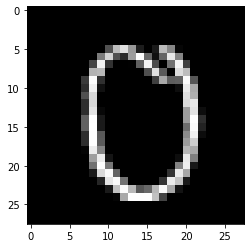

pred :  0 [9.9999726e-01 2.1246549e-10 6.7190682e-05 1.6332303e-09 4.1591305e-12
 5.1623948e-07 1.5217516e-09 1.4946949e-08 1.2027093e-10 5.0302647e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


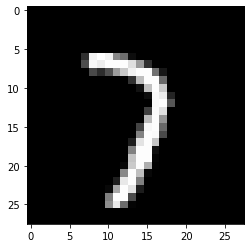

pred :  7 [4.8223090e-13 2.9752385e-08 3.9232009e-06 1.0199414e-07 2.2238615e-09
 6.9979341e-13 2.0539924e-12 9.9999893e-01 1.6581329e-10 2.8691489e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


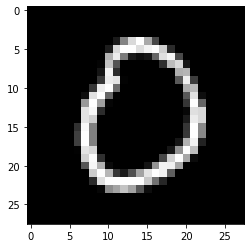

pred :  0 [9.9998188e-01 6.5289106e-07 4.3613953e-05 1.3595042e-10 1.1681106e-12
 4.2663301e-06 1.3390394e-05 9.2757711e-11 3.0939009e-15 1.4203317e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


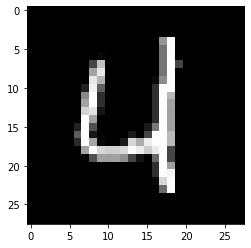

pred :  4 [2.4955368e-06 1.4816259e-09 2.6198870e-07 2.3662308e-10 9.9996352e-01
 9.5272794e-09 8.8974957e-08 6.6146245e-06 3.6494879e-10 4.8387051e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


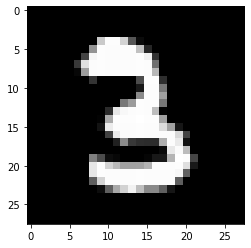

pred :  3 [2.2041754e-12 2.7859539e-06 5.2996562e-05 9.9854636e-01 3.5162292e-15
 5.6890449e-06 1.2562744e-13 1.1694487e-11 2.3867974e-09 2.4078112e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


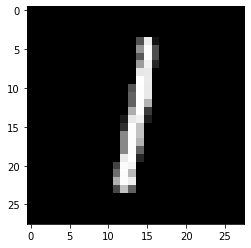

pred :  1 [2.0347561e-09 9.9999964e-01 2.3939155e-08 1.8857440e-09 1.3022639e-09
 2.5355479e-05 1.9512100e-07 4.4792250e-07 5.9899395e-07 2.8837166e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


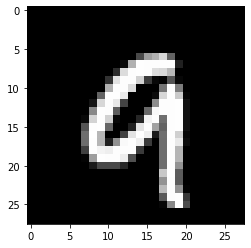

pred :  9 [9.2243778e-07 9.9012770e-11 1.2706947e-06 2.0818710e-02 5.1149673e-05
 8.6347711e-09 4.0451763e-05 1.5627404e-09 3.9886590e-08 9.9996632e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


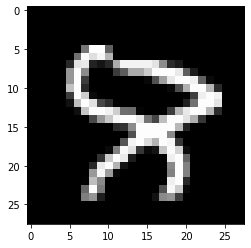

pred :  8 [4.99663111e-09 3.19495976e-13 2.59051194e-06 9.81674759e-08
 1.29937835e-05 7.76707088e-10 3.65794153e-06 6.83949608e-08
 9.98880982e-01 8.59451294e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


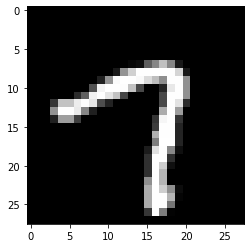

pred :  7 [3.17746697e-07 1.00199627e-13 1.24210571e-08 5.12211571e-08
 1.12249036e-10 2.01150048e-08 3.33986658e-11 9.99993205e-01
 1.01851874e-10 1.92432581e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


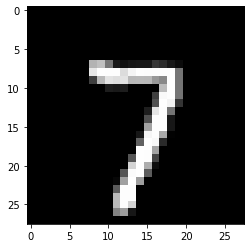

pred :  7 [6.9124524e-12 6.3763300e-11 5.7754246e-09 4.6087195e-08 8.5807108e-12
 2.9371311e-10 1.2059779e-14 1.0000000e+00 3.3812379e-13 5.5775029e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


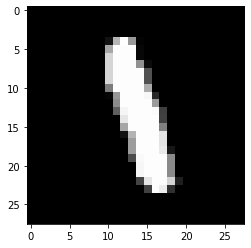

pred :  1 [1.6534343e-13 9.9999809e-01 1.8097162e-06 2.8050504e-06 1.5854604e-05
 5.2872196e-08 7.5347435e-09 1.0479663e-09 2.7170140e-06 1.8876791e-03]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


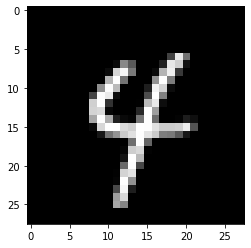

pred :  4 [2.7591606e-16 2.3481549e-08 1.9977757e-14 3.2398292e-10 1.0000000e+00
 4.0944678e-07 1.5833284e-09 8.7168692e-06 1.8341769e-08 3.5901013e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


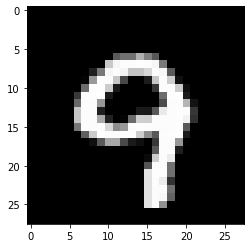

pred :  9 [6.6716288e-10 4.0327855e-18 5.2532507e-09 5.4535013e-07 8.7286653e-06
 1.5885342e-09 1.3424564e-10 6.7925737e-07 3.3781841e-08 9.9999982e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


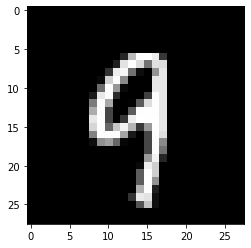

pred :  9 [1.0113422e-11 4.8207527e-10 1.2769911e-08 5.3151746e-07 3.3628999e-06
 2.9608015e-07 8.6929422e-12 4.3041956e-07 1.9190907e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


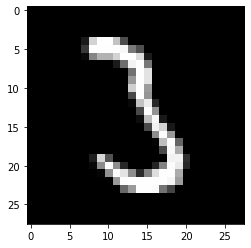

pred :  3 [1.12862345e-07 2.32177990e-05 5.62084892e-07 9.99921262e-01
 7.24234312e-14 4.74675653e-06 4.69847945e-12 2.18839435e-09
 5.12871912e-10 1.50687333e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


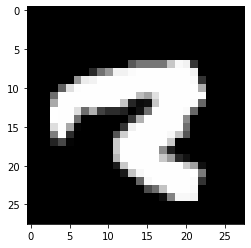

pred :  8 [1.48464352e-10 1.07368905e-11 9.93136127e-05 9.54751813e-05
 9.20524690e-05 1.20926325e-09 8.46906858e-07 6.60112202e-02
 8.30254793e-01 1.78903341e-04]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


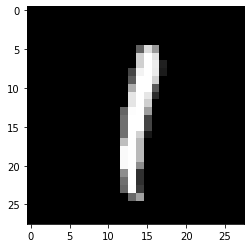

pred :  1 [2.9556006e-08 9.9999893e-01 8.8604490e-10 5.3199340e-08 2.4051468e-08
 4.6537320e-07 4.9213639e-08 3.6445061e-05 1.2263301e-06 1.6072195e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


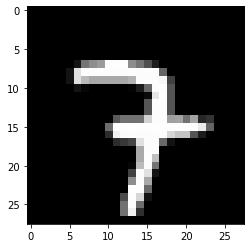

pred :  7 [1.9985722e-14 1.7738000e-11 2.6724708e-08 1.0737358e-06 7.1647879e-09
 6.8243501e-13 1.5669576e-13 9.9999958e-01 4.7455540e-13 3.4070413e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


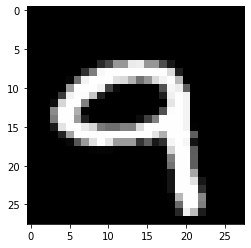

pred :  9 [1.0415820e-08 1.3765597e-12 4.5929789e-07 4.2747928e-08 2.6947312e-08
 4.3190909e-08 7.7027440e-11 3.3405726e-08 5.9683112e-09 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


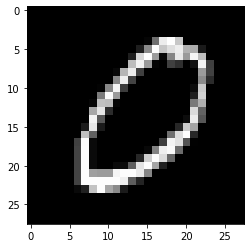

pred :  0 [9.99835610e-01 7.70791019e-07 3.08577764e-05 1.03292116e-07
 2.73906630e-13 2.67791656e-05 4.18663025e-04 7.99544098e-10
 5.13017363e-15 5.09401440e-13]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


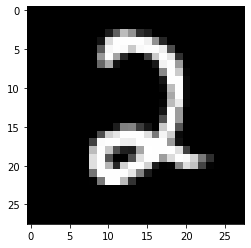

pred :  2 [1.0226330e-08 2.1386891e-11 1.0000000e+00 1.7474477e-09 8.3033244e-14
 8.0704979e-07 4.0120909e-08 2.1546511e-13 5.1303798e-11 1.9137985e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


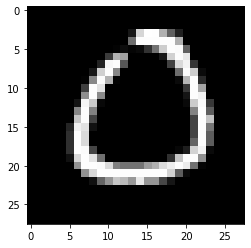

pred :  0 [9.9999899e-01 1.6755888e-06 7.8013457e-08 5.1732101e-08 5.8851153e-12
 6.1895619e-08 1.3347746e-05 1.1391486e-12 2.0357119e-16 8.1689863e-13]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


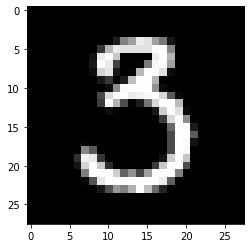

pred :  3 [1.09805615e-05 3.17604317e-05 6.38726350e-10 9.99605656e-01
 5.91225202e-12 5.36482257e-05 2.38768505e-13 1.55404312e-09
 3.87969301e-09 4.92210575e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


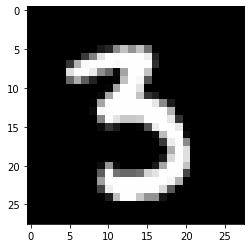

pred :  3 [4.1845177e-10 6.0259788e-07 4.2363536e-11 9.9998164e-01 4.1591606e-09
 5.1991992e-05 3.3118866e-14 7.9475165e-10 2.1810365e-08 7.4257255e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


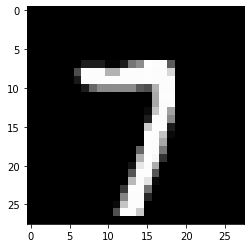

pred :  7 [1.6486195e-09 1.4819199e-09 9.8960435e-08 1.0193799e-06 1.8505464e-14
 1.8286174e-10 6.0176995e-14 9.9999940e-01 2.6709453e-13 2.7031828e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


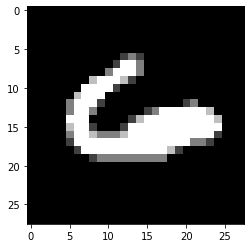

pred :  6 [5.3142726e-09 4.7784910e-12 2.5604963e-03 1.4999467e-12 8.6709741e-05
 2.0450601e-08 9.3450296e-01 1.5391031e-06 4.1802754e-13 3.4430623e-04]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


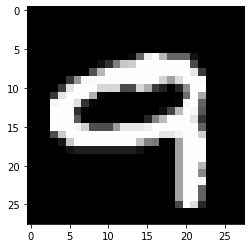

pred :  9 [1.2486046e-08 6.1038577e-13 5.9977392e-06 7.0914390e-09 1.2996473e-07
 1.2602831e-08 3.4339573e-11 2.7593612e-06 3.7291646e-04 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


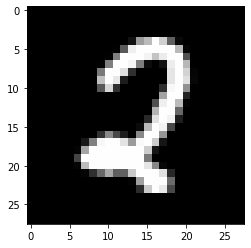

pred :  2 [1.7932369e-06 1.9665801e-08 9.9999958e-01 2.8891062e-08 1.2592335e-15
 1.0302050e-05 3.3027388e-07 6.9045768e-07 3.6103309e-09 7.2457333e-05]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


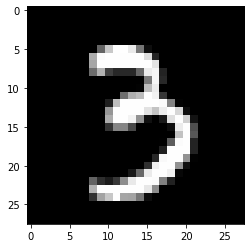

pred :  3 [5.6381166e-10 9.9073887e-09 8.9298791e-09 9.9997127e-01 1.2523204e-12
 4.8987754e-06 3.6026776e-15 5.5304445e-11 3.1218106e-10 4.0413281e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


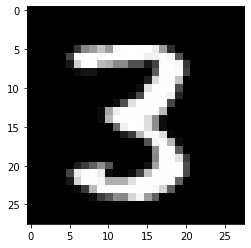

pred :  3 [1.1207057e-11 7.1620758e-07 4.2267190e-10 1.0000000e+00 2.1096332e-10
 3.2241114e-09 6.6489206e-16 1.8917654e-11 2.1590584e-08 9.9650208e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


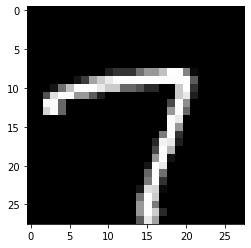

pred :  7 [1.2638463e-07 6.1587752e-13 5.8681313e-09 2.7594401e-08 1.1638100e-15
 1.8387496e-10 8.1506053e-13 1.0000000e+00 6.5335433e-15 1.3324751e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


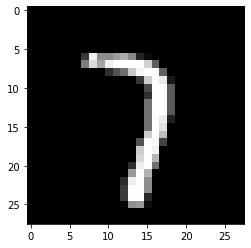

pred :  7 [1.8828661e-08 4.8485623e-07 2.7436970e-05 2.5966546e-07 4.9492604e-10
 9.5146211e-13 5.7628251e-13 9.9996978e-01 5.9460575e-11 7.2544417e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


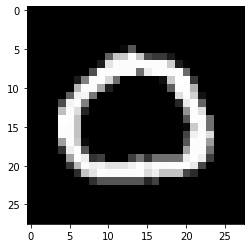

pred :  0 [9.9999917e-01 2.1959341e-08 2.7449205e-06 2.5808874e-06 1.9064307e-16
 1.6409188e-06 7.0130435e-10 2.7505752e-08 6.5639924e-16 1.9169470e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


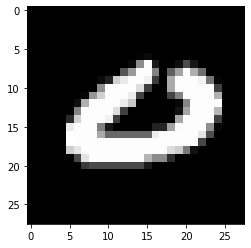

pred :  0 [9.9847478e-01 4.0042331e-15 1.1280832e-07 2.5167698e-10 4.4258395e-06
 8.6537989e-07 2.8339855e-06 5.5836586e-05 6.7836918e-09 1.3759220e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


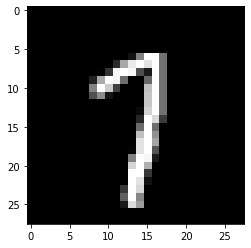

pred :  7 [1.5795865e-11 5.9882063e-06 9.3153893e-09 2.5914680e-08 1.0635972e-08
 4.1600628e-10 9.1726984e-13 9.9837387e-01 1.2192777e-09 1.1251867e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


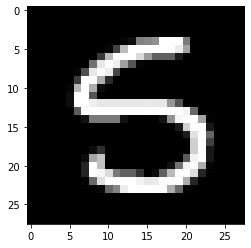

pred :  5 [7.7864687e-11 2.5541539e-08 1.6604962e-11 2.5357135e-08 5.6480562e-12
 9.9998134e-01 2.6197483e-10 7.6653484e-13 3.5314435e-05 7.5373316e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


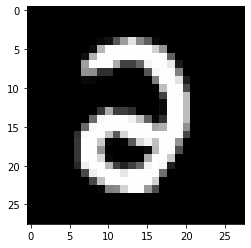

pred :  2 [3.6304707e-05 1.3915851e-13 9.9999988e-01 7.8392559e-06 1.9727721e-11
 4.2166155e-09 2.3188700e-07 1.4670623e-07 7.8241456e-08 9.2568599e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


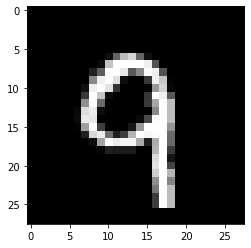

pred :  9 [5.6472814e-08 5.0105625e-10 1.9631931e-07 2.0758353e-08 1.3898891e-07
 4.6885296e-10 3.9946163e-10 5.4967146e-05 1.2985037e-09 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


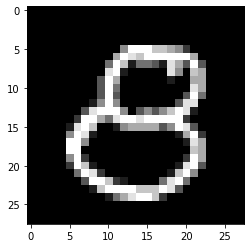

pred :  8 [4.6373508e-08 6.4883121e-12 2.7937509e-05 4.0745735e-04 4.2065482e-10
 4.7203011e-05 1.0092986e-09 7.3001414e-12 9.8547578e-01 2.2498071e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


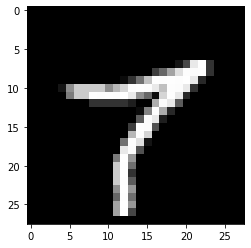

pred :  7 [2.7460631e-11 4.8851756e-10 5.5200513e-08 1.6627775e-08 1.9171880e-12
 1.2880564e-04 9.5567668e-12 1.0000000e+00 1.7067790e-04 6.7850309e-11]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


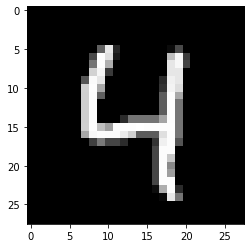

pred :  4 [1.8703426e-15 2.9970395e-13 1.0524110e-09 4.3057224e-09 9.9999988e-01
 8.9250989e-08 1.7130679e-12 2.6146591e-08 1.0430297e-11 1.5128296e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


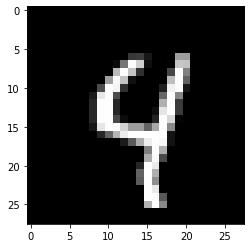

pred :  4 [1.16063896e-17 4.14657975e-10 2.22339502e-09 3.75723563e-10
 9.99997258e-01 2.44927924e-06 1.97138218e-13 3.49423426e-05
 5.09979925e-09 5.08215362e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


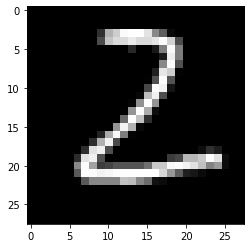

pred :  2 [2.9226981e-09 3.5327673e-04 9.9998409e-01 1.8419414e-07 4.6901252e-16
 2.3186897e-10 1.3427624e-08 3.9972107e-16 7.5312551e-12 1.2935300e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


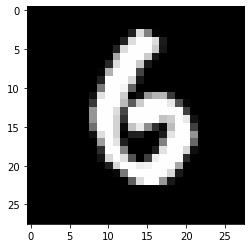

pred :  6 [1.3447424e-10 1.9456531e-08 7.8958617e-09 1.6349313e-06 6.9631048e-09
 6.7419060e-05 9.9999642e-01 3.9271066e-11 7.3100068e-08 4.4885278e-04]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


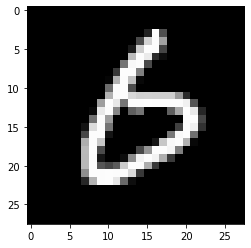

pred :  6 [1.6114833e-05 1.7616680e-08 6.5694671e-08 4.0676366e-07 6.2231216e-08
 1.3456047e-03 9.9935466e-01 1.4552188e-06 6.0383298e-09 1.2171528e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


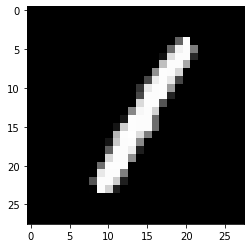

pred :  1 [2.6977318e-10 9.9999988e-01 3.1898546e-07 5.1489174e-11 3.9096954e-06
 1.5128908e-06 7.4389298e-08 1.7537718e-07 1.1079175e-07 7.6078006e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


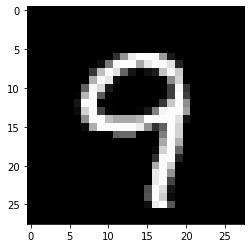

pred :  9 [5.6844451e-12 7.7360355e-18 1.9256345e-09 1.4257242e-06 4.0570797e-07
 1.6561393e-09 2.4271147e-12 2.2834571e-07 1.2897528e-06 9.9999976e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


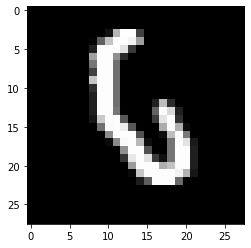

pred :  6 [1.10084615e-11 1.71875880e-09 9.89415184e-07 2.50484771e-08
 2.68332087e-07 7.48184323e-03 9.57466483e-01 1.32453605e-13
 1.66695415e-07 2.81172987e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


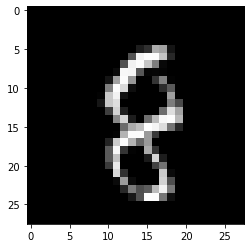

pred :  8 [3.3857309e-12 2.8712002e-10 1.3637123e-05 2.5319765e-05 2.9178409e-09
 1.3626019e-09 7.9444647e-03 2.3425395e-09 9.9847782e-01 3.8258153e-01]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


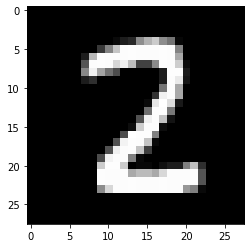

pred :  2 [1.1933641e-07 2.0870068e-08 1.0000000e+00 4.0331579e-07 9.9945002e-14
 1.7604890e-08 1.8053462e-10 3.6942929e-08 1.2033145e-07 4.0651469e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


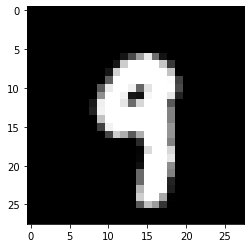

pred :  9 [3.21751820e-10 3.53881280e-09 2.35179787e-09 1.71294730e-08
 1.21576610e-04 1.13859755e-07 7.67086928e-15 5.16113732e-06
 8.74826981e-07 9.99956250e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


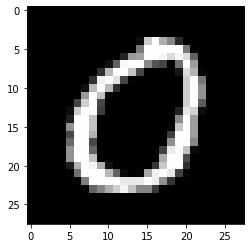

pred :  0 [9.9992263e-01 1.1145968e-06 2.0541279e-06 1.6768499e-10 3.5145029e-13
 2.7819078e-06 1.8724811e-07 1.1961373e-07 1.6818250e-13 1.0928244e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


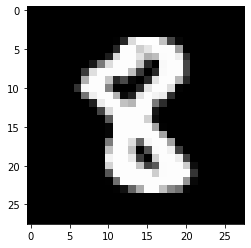

pred :  8 [1.3297604e-06 1.8704597e-08 4.7338009e-04 6.5788940e-05 3.8483466e-10
 2.5006364e-07 6.0100126e-07 1.9881662e-10 9.9995017e-01 1.0263051e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


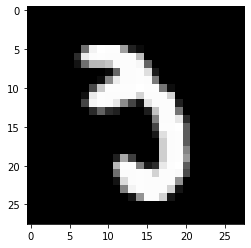

pred :  3 [4.5236476e-07 1.6111467e-07 5.6322915e-06 8.0391741e-01 1.1234987e-11
 1.4306479e-06 7.2795811e-11 5.0207078e-03 5.9892367e-09 1.6674399e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


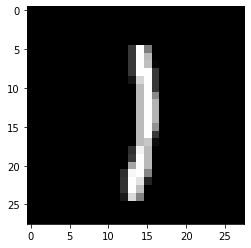

pred :  1 [2.8322314e-12 9.9987185e-01 1.0435592e-07 3.6742076e-09 1.6287181e-07
 1.4006672e-07 1.8807018e-08 1.9188392e-05 4.1326796e-08 4.8081063e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


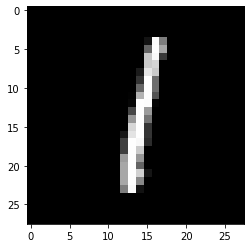

pred :  1 [8.8362095e-11 9.9999726e-01 2.6721457e-07 1.8641975e-09 7.0075781e-09
 5.7711886e-06 6.1088464e-08 2.9213660e-07 3.9772734e-05 5.6022246e-11]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


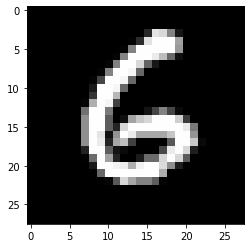

pred :  6 [2.7916053e-08 8.1256040e-08 9.2553904e-08 6.7409989e-09 1.5447747e-10
 4.6173449e-05 9.9999952e-01 4.3630938e-14 2.2794318e-09 1.8457229e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


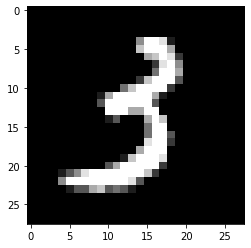

pred :  3 [1.7387080e-08 3.0362196e-05 2.0765402e-08 9.9949038e-01 7.1058553e-10
 1.4519691e-04 4.5830985e-11 2.9380837e-10 3.4340525e-07 1.0155039e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


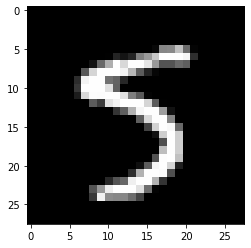

pred :  5 [1.0162910e-14 5.3844921e-08 1.8783294e-11 3.4666300e-08 1.4990771e-12
 9.9999928e-01 4.8714834e-12 8.9848873e-10 6.0361991e-09 1.0877840e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


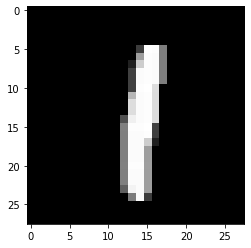

pred :  1 [6.5582556e-10 9.9998975e-01 3.9810509e-08 2.5293554e-07 8.4173985e-07
 1.6262797e-07 1.7112043e-07 3.8261467e-05 4.8790721e-06 1.5208609e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


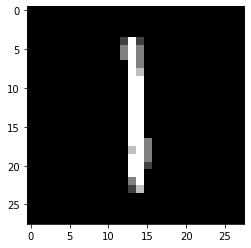

pred :  1 [4.49942357e-13 9.99995351e-01 2.54412726e-07 2.37438917e-06
 1.78677639e-09 1.19982935e-04 2.85814309e-07 7.11757195e-07
 5.26389567e-06 6.56431576e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


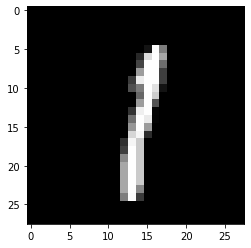

pred :  1 [1.6993309e-09 9.9999267e-01 1.5733045e-08 4.8449639e-08 1.9888926e-08
 1.2076159e-06 2.2789233e-09 6.8344532e-05 6.5668144e-07 1.4658546e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


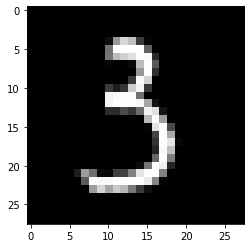

pred :  3 [1.0335193e-09 5.2226778e-06 6.1648517e-09 9.9994016e-01 7.4410123e-09
 4.8710917e-05 1.0117315e-08 6.4377614e-11 5.5852878e-09 9.2651671e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


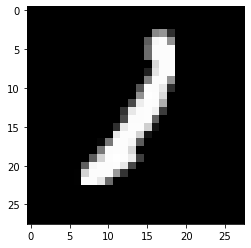

pred :  1 [1.83898209e-07 9.99978065e-01 6.03187799e-01 2.90141400e-09
 3.85417705e-11 8.76549766e-09 1.40674405e-08 1.93646585e-10
 2.97617078e-07 3.13344053e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


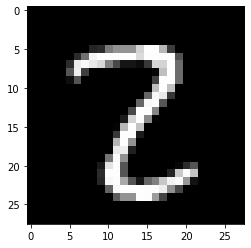

pred :  2 [1.8418527e-06 3.0681083e-08 9.9998665e-01 1.2696397e-06 2.6825120e-11
 1.2521509e-08 5.6043752e-14 5.3072581e-05 2.5075354e-07 4.9982631e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


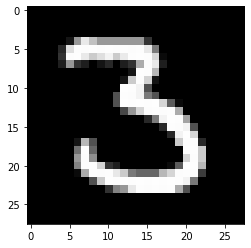

pred :  3 [1.82073556e-09 1.48195809e-07 4.18578905e-09 1.00000000e+00
 3.66877492e-12 8.08130324e-07 2.47539483e-13 1.18289762e-11
 1.46583785e-08 1.64158234e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


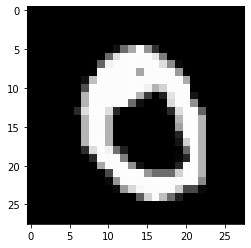

pred :  0 [9.9999404e-01 1.7397256e-09 3.6314589e-08 2.9507790e-08 4.9823392e-12
 2.4232677e-05 1.2984697e-06 1.6145599e-07 5.8582629e-07 9.9905617e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


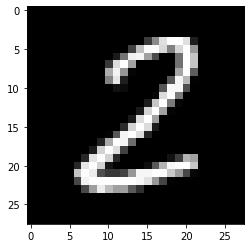

pred :  2 [1.1968128e-09 8.7231107e-05 9.9999708e-01 5.0460312e-07 2.3123308e-13
 6.6424953e-08 5.2420579e-10 4.6533496e-13 5.1494460e-08 3.4120384e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


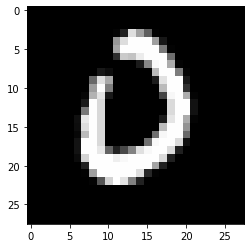

pred :  0 [9.7146523e-01 9.0560901e-12 2.6744008e-03 7.0918077e-08 1.6044935e-09
 7.7535381e-11 8.2681775e-03 3.6146166e-09 4.2397508e-10 7.0826805e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


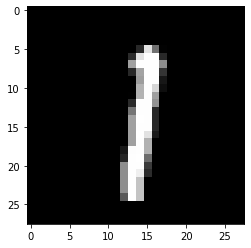

pred :  1 [1.8788283e-10 9.9997854e-01 6.8133510e-08 1.8766787e-07 2.3127248e-08
 5.8045163e-08 8.4170326e-10 5.5797194e-05 1.3308913e-07 2.2345871e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


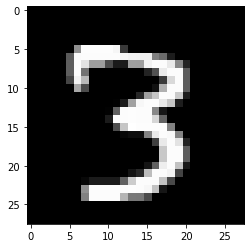

pred :  3 [1.3094163e-14 3.2434355e-09 6.7497702e-10 1.0000000e+00 1.6941455e-10
 5.2371764e-08 2.0569767e-15 3.3574856e-09 3.1128206e-10 7.7056207e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


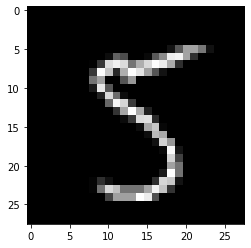

pred :  5 [5.0134609e-13 1.9693823e-06 1.1130432e-11 6.5614938e-07 2.0159529e-11
 1.0000000e+00 5.9090135e-13 6.3570493e-10 8.6926413e-09 1.8364985e-11]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


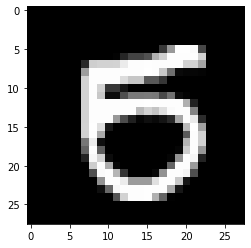

pred :  5 [2.2190485e-05 7.5749823e-11 8.6740029e-14 2.1439465e-10 3.0341972e-12
 9.9989110e-01 2.3819835e-07 1.3155473e-06 1.6734004e-04 7.2357893e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


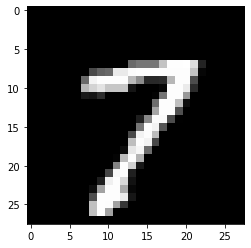

pred :  7 [5.1390328e-09 1.3199639e-09 1.8804559e-10 1.8171769e-06 1.8237617e-14
 1.1876741e-08 2.1061683e-13 9.9999964e-01 6.1774843e-12 6.5054508e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


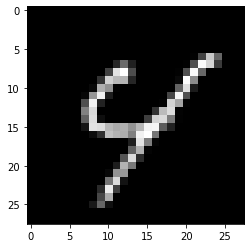

pred :  4 [2.6430244e-15 1.5426848e-13 4.0766869e-12 2.1315116e-09 1.0000000e+00
 2.6947571e-06 6.8192656e-12 1.5564430e-07 1.7613800e-07 1.0119636e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


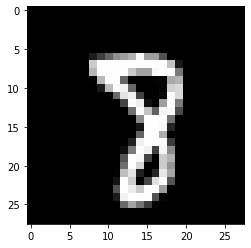

pred :  8 [1.42683270e-08 1.12549824e-10 5.53256359e-06 2.84105539e-04
 4.21126415e-12 7.03766574e-08 2.80378216e-12 9.19988751e-03
 9.78618503e-01 2.06395984e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


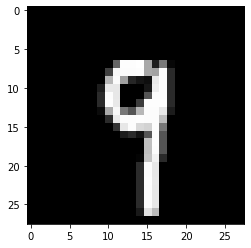

pred :  9 [2.3919594e-14 3.3813734e-09 2.2350589e-12 1.5110604e-07 1.6473850e-08
 2.3279467e-10 5.6282849e-14 2.4743849e-07 9.9069837e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


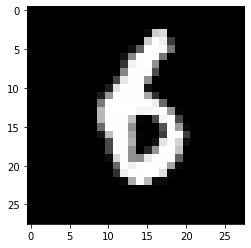

pred :  6 [1.6534857e-08 7.4558839e-06 2.0835227e-08 3.5393238e-04 3.5903923e-07
 1.5602723e-06 9.9999952e-01 1.5565870e-11 5.0577000e-09 6.8296729e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


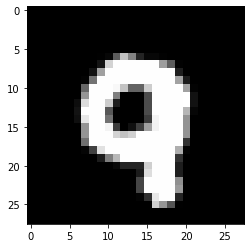

pred :  9 [2.1926121e-07 1.7062803e-14 5.7480941e-07 3.7460319e-07 2.2477554e-05
 5.4481366e-09 2.5451621e-08 3.4416757e-05 3.4170764e-06 9.9998933e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


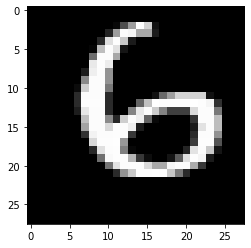

pred :  6 [1.4732151e-08 8.6973289e-14 4.9574943e-08 6.6781155e-12 1.4684738e-12
 1.2588976e-05 1.0000000e+00 4.1527234e-13 2.1842004e-08 2.7441194e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


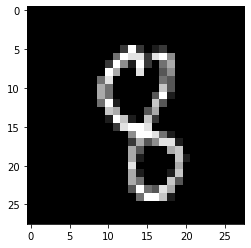

pred :  8 [7.8777531e-12 2.9973640e-10 2.4535245e-08 5.1749349e-03 2.3843654e-07
 2.7447409e-09 4.7075492e-08 6.6819928e-07 9.9976468e-01 2.1362305e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


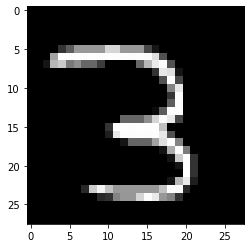

pred :  3 [3.4771698e-17 2.4005417e-11 3.9662813e-05 9.9994719e-01 7.8042142e-09
 1.1062641e-07 4.3699982e-14 5.7808415e-07 7.4421519e-06 1.2349810e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


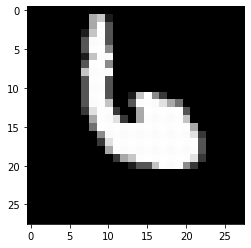

pred :  6 [7.7187732e-15 4.2335649e-12 8.5806462e-08 8.5011040e-11 2.8979990e-05
 1.2409702e-10 9.9999917e-01 1.2928247e-04 2.5791919e-10 7.1702289e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


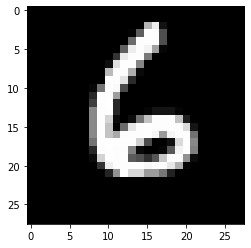

pred :  6 [6.8570670e-11 6.4281238e-09 9.2421075e-08 6.2561114e-08 9.7220285e-09
 3.7652367e-07 9.9999976e-01 2.3423516e-13 6.2168191e-09 4.1304042e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


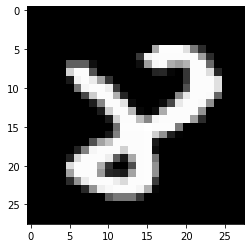

pred :  8 [3.6892089e-08 6.5002376e-13 2.7163003e-05 2.9320940e-06 7.3998119e-09
 2.6546602e-11 1.7061446e-09 3.8233250e-10 9.9999976e-01 9.6518379e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


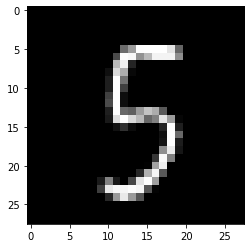

pred :  5 [3.0363059e-11 4.0787949e-08 2.6227531e-10 2.1839244e-07 4.1257544e-13
 1.0000000e+00 1.5494024e-09 1.0266115e-09 3.1025957e-10 1.5422106e-03]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


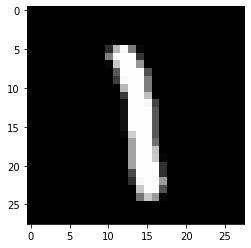

pred :  1 [4.5587456e-16 9.9999386e-01 1.2038650e-04 2.4231600e-08 3.1330922e-09
 6.3183944e-07 6.4223059e-08 1.2418068e-05 5.5694909e-05 1.1326161e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


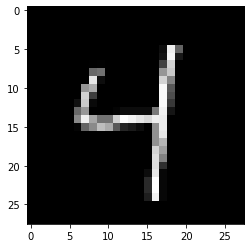

pred :  4 [5.3450630e-13 4.1029735e-09 5.6853727e-10 1.0374130e-07 9.9999696e-01
 8.0119817e-06 8.1912504e-13 6.9798289e-10 1.9580707e-10 2.9469757e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


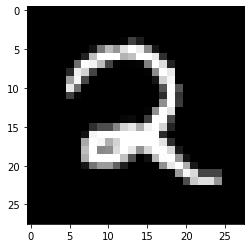

pred :  2 [6.5488176e-14 4.9966027e-09 9.9999851e-01 2.4088241e-08 1.5934563e-09
 7.3778629e-03 9.0800070e-09 1.8024519e-05 4.3470852e-11 1.1267575e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


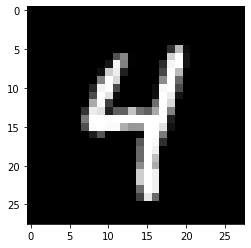

pred :  4 [4.4126428e-16 4.8403939e-07 1.2420962e-12 3.4803422e-09 1.0000000e+00
 9.2971106e-08 1.2225483e-11 2.7144576e-08 3.4021916e-09 2.5542954e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


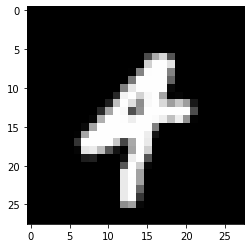

pred :  4 [2.7841716e-08 5.5208966e-07 4.2805391e-07 2.8365459e-08 9.5305514e-01
 2.5662986e-08 3.8793291e-06 5.6105852e-04 1.6591138e-06 9.7271579e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


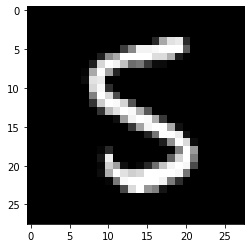

pred :  5 [3.6237578e-12 6.5477348e-09 2.4619742e-10 1.3959059e-08 4.4384093e-14
 1.0000000e+00 2.2963184e-10 1.3147675e-13 1.3749322e-09 1.1365727e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


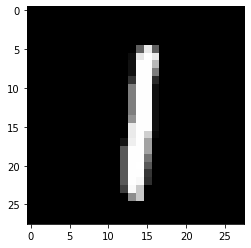

pred :  1 [1.2278671e-11 9.9999678e-01 2.1290788e-08 3.5839044e-08 8.7063796e-09
 1.0841818e-06 2.0483149e-07 2.3979886e-05 2.2340896e-06 2.2315055e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


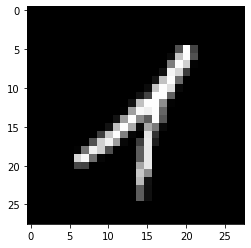

pred :  1 [1.8734363e-13 9.3092418e-01 2.4105777e-06 1.3084915e-06 9.1053284e-05
 2.1960819e-05 1.4808795e-06 6.7609413e-10 2.3784710e-06 3.9383867e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


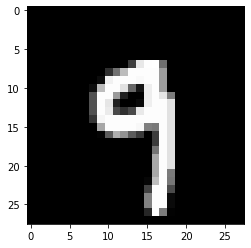

pred :  9 [3.7898434e-12 8.1487594e-12 1.3599522e-11 6.5043810e-07 6.3556888e-07
 1.5517507e-09 2.0030544e-12 1.2565304e-06 4.7329265e-09 9.9999964e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


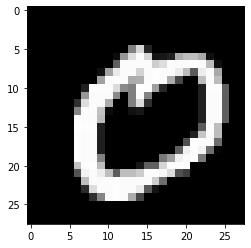

pred :  0 [1.0000000e+00 9.5385531e-07 4.4270723e-06 1.0690011e-06 5.0868871e-17
 6.0037743e-05 6.1533245e-10 6.7939858e-09 3.2522551e-10 4.6194514e-14]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


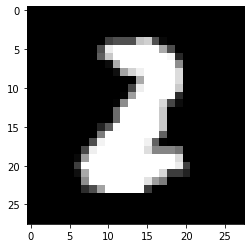

pred :  2 [3.6348059e-08 2.0956993e-04 9.6136737e-01 3.6307275e-03 9.0242213e-13
 1.6571386e-08 2.9875641e-10 2.7694625e-07 3.0391812e-03 1.8785316e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


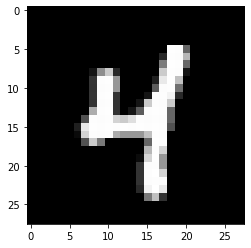

pred :  4 [2.18230204e-15 6.34146363e-06 8.41111816e-12 2.38879352e-06
 1.00000000e+00 1.48900385e-08 2.04810497e-08 1.16179032e-10
 2.67116462e-09 2.23103643e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


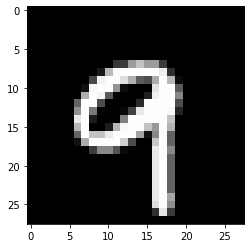

pred :  9 [3.6662622e-09 4.8428126e-15 1.3762487e-06 7.2087109e-06 2.0093886e-07
 4.8276538e-10 7.2706658e-09 3.2695056e-08 7.8049482e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


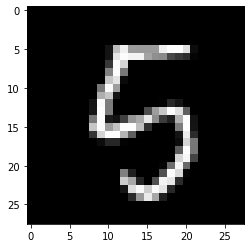

pred :  5 [2.9701749e-12 5.2962505e-09 6.4739724e-12 1.0364276e-06 6.0580041e-11
 9.9993229e-01 5.0273707e-07 1.4978674e-13 2.9324071e-06 7.5041950e-03]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


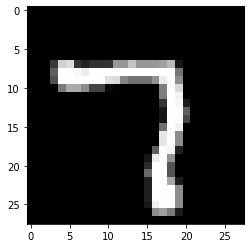

pred :  7 [3.8173464e-08 6.8469383e-11 2.1608847e-05 5.2655396e-09 1.1933416e-12
 2.6055127e-09 1.8705975e-17 9.9998915e-01 5.8013715e-16 1.9490805e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


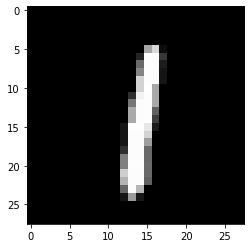

pred :  1 [6.14886336e-11 9.99995828e-01 1.35819093e-07 1.09750378e-08
 6.01962597e-07 4.78008417e-07 1.07047875e-07 6.58816407e-06
 7.56914858e-07 1.21130910e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


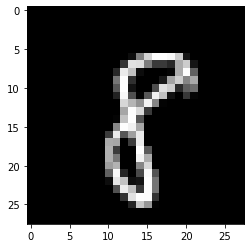

pred :  8 [2.2097804e-10 9.1472828e-08 1.4119477e-05 2.7382637e-08 5.2286047e-11
 5.3032988e-08 1.4266545e-06 4.3244466e-09 9.9999863e-01 3.5440076e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


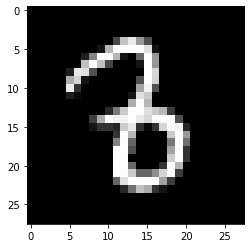

pred :  8 [1.88734255e-08 3.20291038e-09 1.09463245e-01 9.02697444e-03
 3.27251559e-10 3.20259264e-09 2.78128573e-05 1.23368142e-08
 1.47297710e-01 1.52396784e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


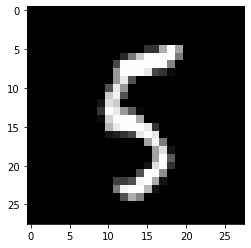

pred :  5 [4.9419167e-12 3.2950686e-07 1.0300497e-09 5.3071517e-07 2.3406591e-13
 9.9999923e-01 1.2043919e-10 4.7192472e-11 2.1064398e-07 8.1145656e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


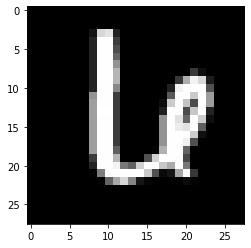

pred :  6 [9.9003817e-05 1.0791481e-15 8.6174964e-07 4.7831798e-15 1.1275127e-04
 2.6602448e-08 9.7930032e-01 1.2222249e-06 3.4530456e-10 1.6006810e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


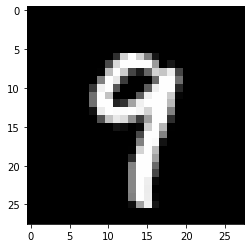

pred :  9 [4.3446066e-11 2.7206295e-09 1.1866608e-10 2.2677634e-08 7.9703331e-04
 2.5583688e-10 3.0403638e-14 1.2618303e-04 2.5036931e-04 9.9994755e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


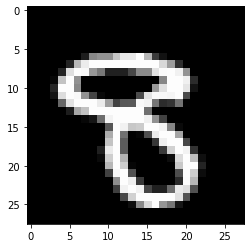

pred :  8 [8.9679594e-07 5.7257053e-13 6.0218429e-07 4.2130305e-05 2.7402725e-10
 5.1543668e-07 5.1308649e-05 2.6372529e-08 9.9995184e-01 6.4900517e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


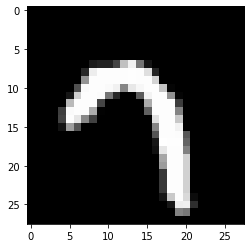

pred :  7 [3.9418364e-08 8.0858049e-09 1.1676629e-08 7.2213680e-07 3.6162837e-10
 8.4487269e-08 1.3751112e-08 9.9994886e-01 2.7495184e-10 3.6613047e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


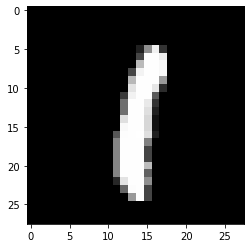

pred :  1 [2.19621903e-08 9.99968886e-01 2.92607396e-08 6.00304375e-08
 7.03711223e-09 2.87891481e-07 7.23439916e-06 1.14687406e-04
 4.57620299e-05 2.24542518e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


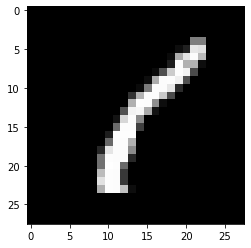

pred :  1 [1.2861117e-05 9.9999714e-01 5.7816169e-06 1.9928007e-11 1.0367064e-06
 8.2607221e-06 4.8047305e-06 1.0415925e-07 3.3703727e-05 2.2680800e-11]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


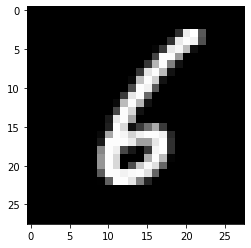

pred :  6 [8.1856879e-06 1.0426500e-07 7.9830107e-07 8.1416020e-11 3.3471430e-11
 5.3203106e-04 1.0000000e+00 4.7935805e-12 8.2910572e-07 5.0255312e-14]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


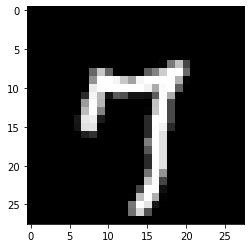

pred :  7 [4.36033432e-09 1.05191286e-10 1.20380683e-09 9.11997944e-09
 1.49026458e-09 1.93817215e-07 2.81815786e-11 9.99990344e-01
 1.44713148e-11 2.56720682e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


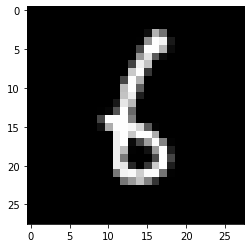

pred :  6 [8.5574781e-10 4.5124194e-05 2.0620131e-07 3.3411919e-11 1.2374815e-10
 5.7393312e-04 9.9999404e-01 9.8191895e-14 7.6027893e-05 8.8073564e-14]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


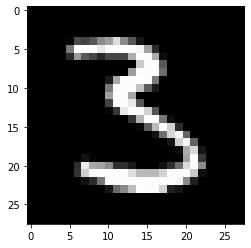

pred :  3 [4.2714006e-09 9.7740340e-05 5.1373350e-10 9.9998122e-01 1.2730557e-09
 9.6023607e-05 3.4582029e-12 2.5246905e-12 5.4067391e-09 7.1078921e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


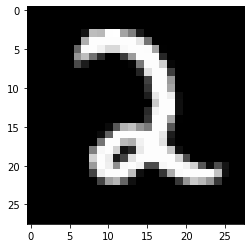

pred :  2 [1.7279889e-09 8.3983750e-08 1.0000000e+00 3.5259731e-08 1.2989513e-14
 1.5105948e-07 3.5487541e-10 2.7104027e-11 2.1685008e-12 1.8961302e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


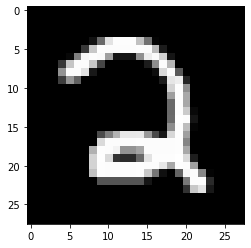

pred :  2 [4.5781341e-08 1.6389597e-09 1.0000000e+00 2.8983276e-09 6.4135771e-12
 1.0543947e-06 5.1273035e-09 1.1433672e-12 1.1748598e-10 5.4607894e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


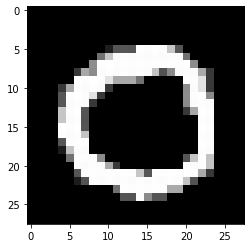

pred :  0 [1.0000000e+00 7.9252914e-07 1.0352979e-07 1.4071513e-07 2.0098404e-15
 7.2456401e-06 7.4657237e-08 2.2861896e-07 5.0258018e-13 6.9196227e-10]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


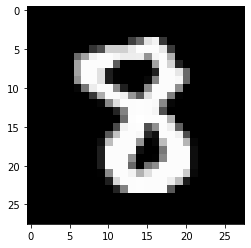

pred :  8 [8.2282617e-07 3.8350219e-08 3.6694841e-05 1.5632802e-05 7.8698015e-10
 1.6790439e-08 3.7156008e-07 8.8251909e-08 9.9986666e-01 3.5733109e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


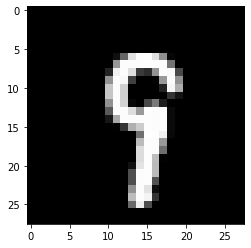

pred :  9 [7.0931528e-14 1.4947111e-09 1.8301283e-10 8.4492754e-08 2.3810457e-05
 9.3527052e-07 2.9714741e-11 9.7870077e-05 7.0047463e-05 9.9986947e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


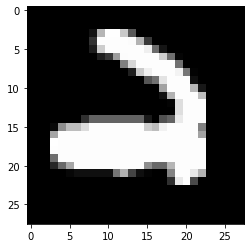

pred :  2 [9.1568877e-11 1.0695312e-12 1.0000000e+00 1.4439225e-04 6.3072891e-10
 1.4129855e-08 1.4657967e-07 2.0473488e-14 9.1567216e-13 4.1568268e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


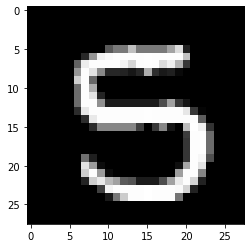

pred :  5 [5.0884888e-13 1.3253739e-11 3.3164114e-11 8.2825572e-06 1.2746410e-11
 9.9999917e-01 3.3367799e-14 6.6900636e-15 3.0969172e-08 1.3515353e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


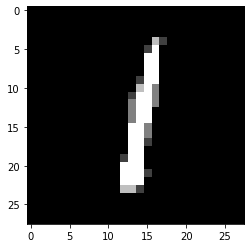

pred :  1 [7.2014020e-11 9.9999940e-01 7.7211233e-09 6.4815686e-09 3.7485478e-07
 2.3670300e-06 2.3907807e-08 7.8623529e-08 8.9007250e-07 2.9929381e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


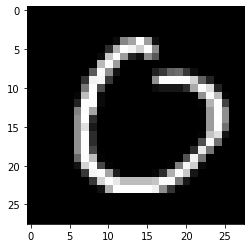

pred :  0 [9.9999636e-01 3.0135382e-08 1.9382554e-05 1.7479978e-07 2.1689269e-12
 2.1457242e-06 3.4644307e-07 3.3139137e-11 1.6470283e-10 2.5339002e-12]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


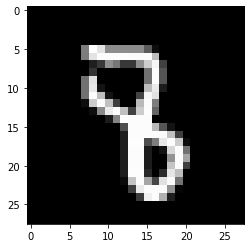

pred :  8 [2.88739139e-13 6.19982643e-09 6.52169740e-09 1.21581554e-03
 1.61617994e-04 1.26565016e-08 3.73222662e-08 1.04115756e-07
 9.99998808e-01 3.32954890e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


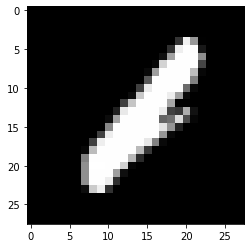

pred :  1 [4.2324509e-06 9.9998081e-01 9.8967095e-05 1.1416474e-07 1.5700758e-03
 2.2478925e-07 7.2040200e-07 2.0931031e-07 4.0392147e-06 1.6335013e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


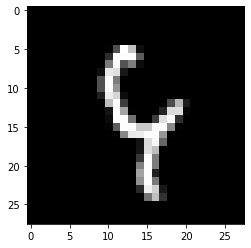

pred :  4 [5.1223883e-16 8.7223817e-10 2.2414404e-09 8.5411511e-11 9.7854388e-01
 9.8062257e-05 4.2924698e-06 2.2883010e-07 2.9732616e-06 1.9731522e-03]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


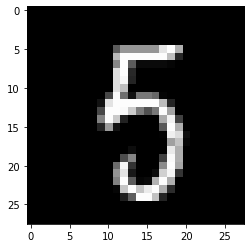

pred :  5 [2.7602924e-12 7.6959600e-07 1.7606785e-10 7.8812791e-06 2.2604814e-09
 9.9999237e-01 1.6970338e-06 1.7218900e-08 4.9539518e-11 3.5476120e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


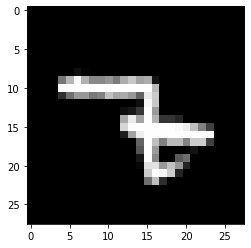

pred :  7 [9.2252592e-18 1.7732055e-10 4.2808056e-04 1.1522701e-04 1.4197826e-04
 3.3538200e-08 6.3851563e-10 9.9686652e-01 4.5419543e-11 1.5421584e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


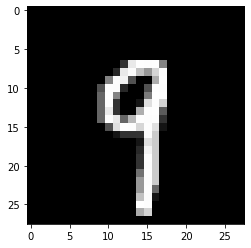

pred :  9 [2.1296299e-13 1.3888616e-06 2.4612005e-13 2.0280224e-07 1.1488307e-07
 1.3207949e-09 3.0091212e-12 6.1984315e-07 4.8908981e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


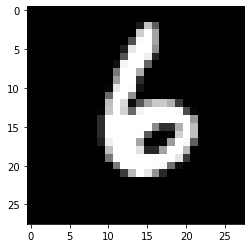

pred :  6 [2.6319585e-14 2.8334474e-08 7.2669712e-07 1.3098049e-06 1.7114377e-07
 1.2560978e-08 1.0000000e+00 1.0044638e-11 1.6547028e-07 3.1391608e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


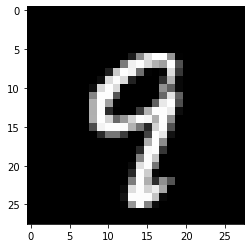

pred :  9 [6.0648040e-14 3.9040033e-13 1.1043988e-10 3.2854071e-09 2.3939990e-07
 3.2978082e-08 3.3050654e-10 5.9358117e-06 4.6884563e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


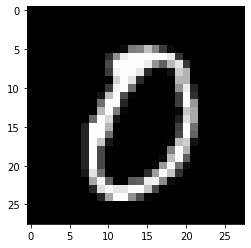

pred :  0 [9.9974310e-01 1.9407062e-07 7.7174427e-09 6.3447118e-08 1.2239546e-12
 4.8193336e-04 1.6712710e-07 8.4913609e-08 2.3687438e-08 1.8158430e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


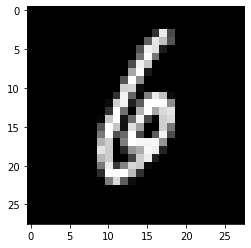

pred :  6 [8.4281332e-10 2.2715296e-06 4.5811236e-03 2.5324387e-10 1.4132936e-05
 1.4255631e-05 9.9754691e-01 1.1078651e-10 4.4925964e-06 6.3810967e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


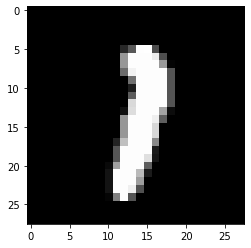

pred :  1 [6.2340867e-08 9.9867654e-01 8.6961984e-07 5.8654911e-07 3.7848933e-09
 2.2366315e-09 2.1924416e-10 2.2584200e-04 2.7628095e-05 2.5302892e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


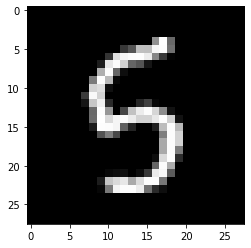

pred :  5 [7.4369469e-11 2.1371141e-12 2.8210984e-08 1.2340014e-08 5.0716176e-10
 9.9628556e-01 2.0870587e-08 8.5075313e-10 7.5095858e-07 1.8998638e-01]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


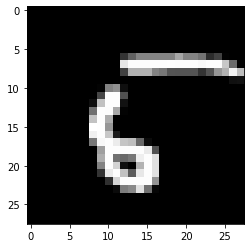

pred :  5 [2.3233835e-07 1.8170615e-09 6.7916894e-10 5.3196237e-14 2.5890676e-15
 9.8325878e-01 5.3618538e-01 1.8307688e-12 1.0896341e-06 7.6960589e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


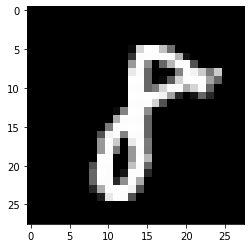

pred :  8 [6.3884609e-09 7.7414770e-06 1.9701082e-07 7.0440818e-09 4.5196428e-14
 2.1980703e-03 5.3369270e-08 1.3486505e-08 9.9996221e-01 8.7009351e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


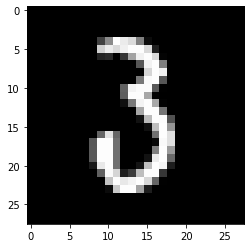

pred :  3 [2.9082885e-06 2.1344776e-07 2.3576021e-03 9.9077868e-01 7.9357321e-10
 9.5838892e-09 9.6759145e-08 1.9880165e-08 5.8783650e-02 7.5337088e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


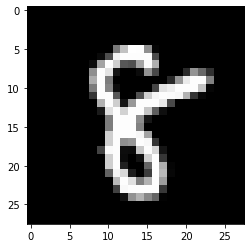

pred :  8 [7.2314052e-08 2.0204605e-11 2.8644001e-07 2.0067564e-08 5.4479186e-09
 2.1044941e-07 4.3706532e-06 6.9091151e-09 1.0000000e+00 5.7910306e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


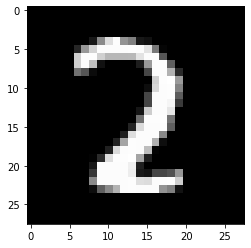

pred :  2 [5.4913437e-07 1.7685394e-08 9.9998856e-01 4.5301253e-08 1.1109921e-11
 3.8189812e-10 1.9673585e-10 5.1918214e-05 2.8671536e-06 1.0208259e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


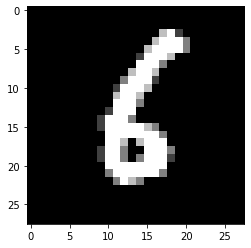

pred :  6 [3.1235723e-07 1.0557673e-06 5.1891702e-06 1.6265099e-12 6.7518491e-12
 2.0919599e-05 9.9999988e-01 3.4631830e-14 4.2640298e-07 9.3387819e-13]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


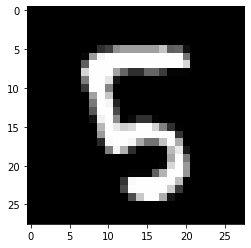

pred :  5 [1.7177215e-11 2.0092714e-13 2.2618603e-10 4.5664701e-06 3.3657566e-13
 9.9999940e-01 2.9249566e-07 1.5985431e-09 5.3431733e-05 1.4522519e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


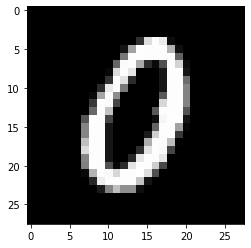

pred :  0 [9.99958634e-01 4.01563505e-12 2.64823437e-04 1.01837074e-07
 2.75518026e-08 1.09425602e-11 2.31474638e-04 8.13371003e-07
 2.26928762e-07 8.39084387e-04]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


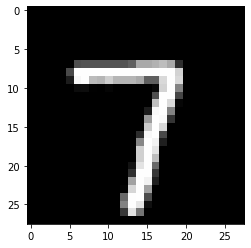

pred :  7 [9.08756959e-11 1.49719988e-08 2.50370142e-08 6.92622848e-07
 1.21478118e-13 8.67738780e-12 8.98038019e-14 1.00000000e+00
 1.47497140e-13 1.09173406e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


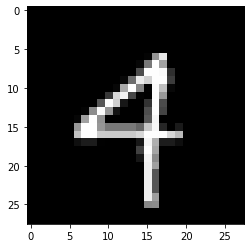

pred :  4 [1.08701427e-12 1.12371957e-07 1.42242740e-07 3.85305086e-08
 9.99959826e-01 1.11980353e-06 1.38095615e-07 3.68000269e-06
 1.01891615e-08 9.91096627e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


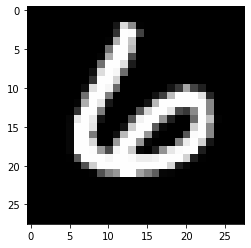

pred :  6 [1.4438445e-08 3.1485045e-10 1.9834424e-05 2.1252438e-09 3.4642834e-08
 5.5749155e-11 1.0000000e+00 9.5228868e-12 1.3922259e-08 4.4153443e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


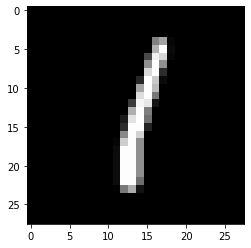

pred :  1 [2.3287874e-09 9.9999893e-01 5.5258903e-07 3.4585559e-10 5.8470519e-08
 2.7180702e-05 7.6473799e-07 1.3421013e-07 7.5100052e-06 8.2753832e-11]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


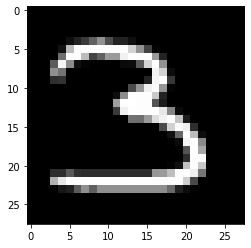

pred :  3 [5.2825244e-11 8.6752914e-07 2.2406484e-10 1.0000000e+00 2.2674984e-09
 4.1393888e-10 2.2769709e-14 7.9259259e-11 1.0275218e-10 1.5194625e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


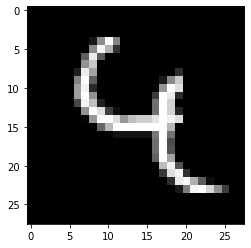

pred :  4 [1.7605860e-16 3.2688224e-10 5.0988973e-08 3.7288377e-09 1.0000000e+00
 7.6930758e-07 2.5844857e-10 4.8269214e-12 2.6542439e-08 2.1814120e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


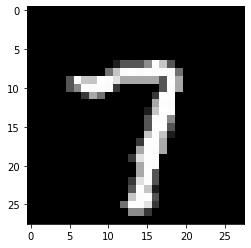

pred :  7 [3.1408407e-09 1.5083204e-09 3.7625105e-06 5.1644754e-08 5.1428859e-13
 2.3613031e-10 4.0458721e-12 9.9999905e-01 4.9657343e-13 3.5758592e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


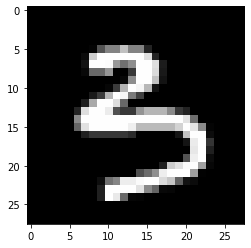

pred :  3 [1.5253156e-11 1.3247157e-09 4.3382078e-10 9.9994141e-01 1.0249000e-08
 7.1439147e-04 1.5762457e-11 6.4591660e-10 1.6964464e-06 1.8200525e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


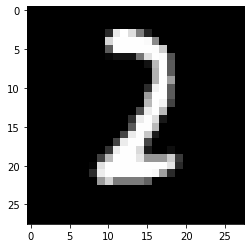

pred :  2 [1.8564206e-08 5.9150307e-07 9.9993062e-01 1.0086882e-04 3.1593427e-15
 2.1217009e-08 7.4225177e-08 1.3913491e-09 1.0836629e-08 1.0244157e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


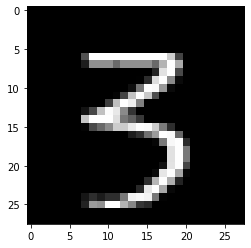

pred :  3 [1.0346478e-12 3.5965536e-11 1.8460702e-13 1.0000000e+00 1.8615575e-09
 7.4911277e-08 2.1582284e-14 4.4417402e-07 1.8172618e-06 7.6857784e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


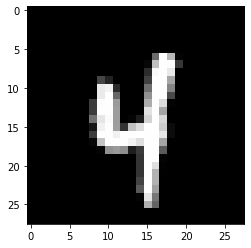

pred :  4 [4.8009188e-12 6.1558575e-07 5.8874399e-08 3.4789799e-10 9.9999756e-01
 8.6296968e-06 2.3608269e-09 3.1155010e-09 5.7705027e-09 7.3857086e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


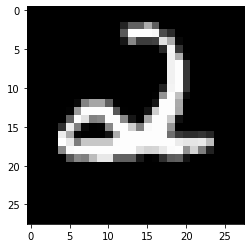

pred :  2 [1.3832661e-08 1.7865460e-15 9.9998307e-01 1.4596735e-06 8.7803602e-04
 2.0245836e-06 2.3082475e-06 3.9979183e-13 4.4911477e-10 3.2869272e-07]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


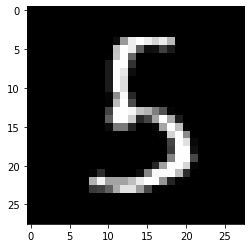

pred :  5 [5.5573607e-13 1.0047681e-04 7.4870311e-11 1.0080472e-05 6.4231881e-06
 9.9999464e-01 4.8574065e-09 6.6147390e-17 1.8823265e-09 8.4456779e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


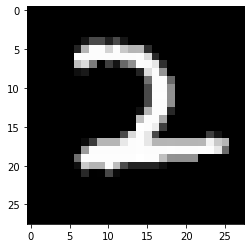

pred :  2 [1.4832601e-13 1.0147566e-05 9.9999654e-01 1.1020900e-05 3.4907799e-09
 1.3797562e-08 3.3206458e-11 1.6551203e-06 4.2231911e-13 7.5332232e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


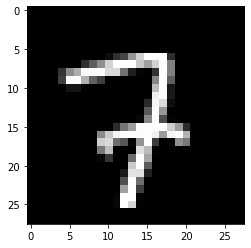

pred :  7 [1.1009746e-14 9.8856097e-12 3.1444149e-06 2.2907814e-07 4.9456435e-11
 1.1055959e-10 6.2900948e-11 9.9999577e-01 1.5153085e-11 1.0442715e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


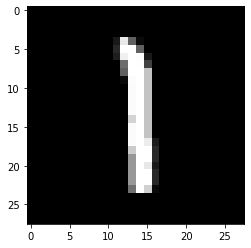

pred :  1 [5.2566680e-13 9.9996829e-01 4.7096014e-06 8.2970644e-08 2.5720257e-09
 5.4107859e-06 1.2818082e-08 4.0314622e-05 2.0592050e-05 8.0042987e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


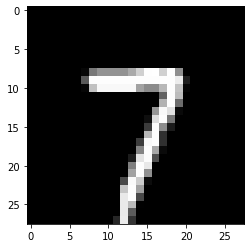

pred :  7 [1.95084704e-09 9.12398976e-11 6.03413355e-07 2.24475298e-06
 1.60022294e-14 3.48852538e-08 5.33109418e-13 1.00000000e+00
 7.20410537e-12 1.07126716e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


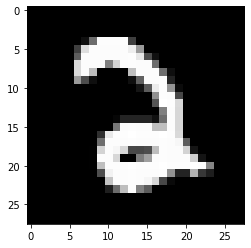

pred :  2 [1.9261452e-07 3.5612389e-09 9.9999899e-01 4.9949140e-06 2.2759789e-16
 1.8187069e-07 1.5864330e-07 7.7303186e-09 1.8289786e-08 8.6659421e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


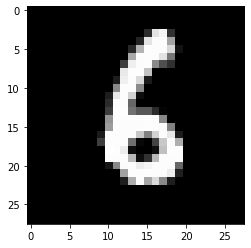

pred :  6 [2.7723556e-11 8.9452860e-06 2.1020280e-06 2.2621752e-10 2.1682278e-12
 5.5898443e-05 9.9999893e-01 1.6064217e-14 1.0960860e-07 9.4136254e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


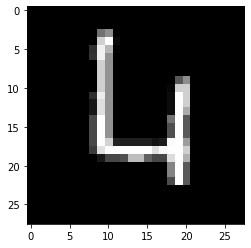

pred :  4 [1.38926691e-06 1.27446595e-11 4.42552118e-05 2.18041644e-12
 9.99600470e-01 5.64731636e-07 2.93552876e-04 3.56696290e-07
 1.08930985e-12 2.03486206e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


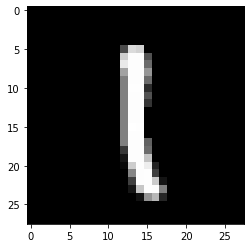

pred :  1 [1.7426546e-13 9.9998647e-01 8.0598411e-06 1.3215939e-07 1.3135319e-09
 9.5103997e-06 9.4428844e-07 2.4617607e-06 1.1582769e-04 4.6578230e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


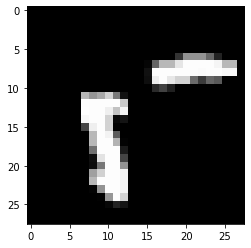

pred :  5 [3.6624968e-03 1.8508776e-11 5.1695134e-11 3.0140290e-18 6.7917083e-12
 9.9909687e-01 1.5378978e-07 3.2733101e-09 1.5486285e-07 8.8525515e-12]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


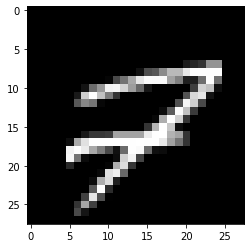

pred :  9 [2.8220672e-08 6.2809611e-18 1.9816458e-03 3.1153763e-07 3.8455950e-10
 2.9823184e-04 1.8842833e-10 2.1055937e-03 2.2773743e-03 9.6145213e-02]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


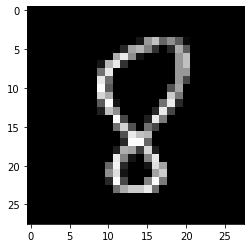

pred :  8 [3.0004028e-09 5.4771984e-08 8.6278658e-07 2.4261233e-09 1.1747058e-05
 1.4708224e-05 3.0556060e-07 3.8619571e-10 9.9816740e-01 8.7055332e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


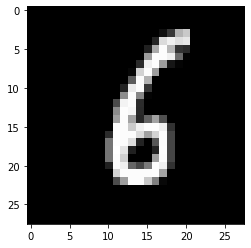

pred :  6 [1.4558517e-08 6.5390549e-07 4.2584766e-08 4.0929821e-10 7.6113491e-11
 9.9788303e-05 9.9998271e-01 4.2429359e-11 3.3827833e-05 4.4889166e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


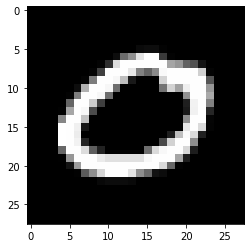

pred :  0 [9.98468101e-01 4.33128533e-11 4.99117141e-06 1.08095037e-06
 4.52988298e-12 4.59291050e-10 5.36139305e-06 1.02500216e-07
 1.28244752e-14 1.09066635e-01]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


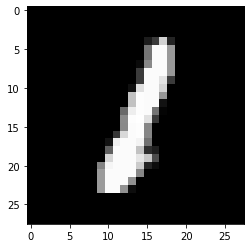

pred :  1 [8.62424159e-08 9.99953449e-01 1.82121992e-04 1.76625958e-09
 5.80601096e-08 7.66032144e-07 8.24441486e-06 1.00772368e-08
 1.04305973e-05 1.12621114e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


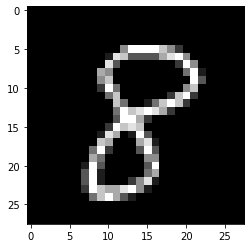

pred :  8 [5.6714904e-09 1.5904117e-08 2.0644973e-06 3.8438461e-08 1.6734990e-09
 9.6067481e-07 3.1224182e-10 3.6019427e-11 9.9999481e-01 6.1151385e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


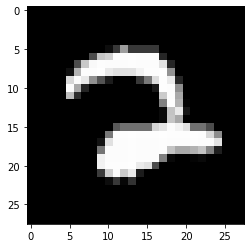

pred :  2 [3.8236603e-10 6.1834695e-13 9.9999541e-01 1.8323752e-07 1.1788501e-15
 1.9078543e-07 1.6874715e-08 4.2096026e-06 1.2956388e-09 1.1070434e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


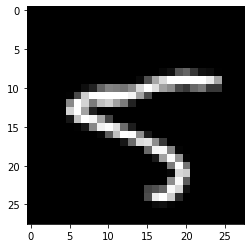

pred :  5 [7.7952167e-12 2.7254948e-10 3.3941515e-07 1.1379070e-11 3.7225842e-02
 9.9978381e-01 9.1017666e-13 8.0597720e-06 6.7494977e-05 4.1115708e-11]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


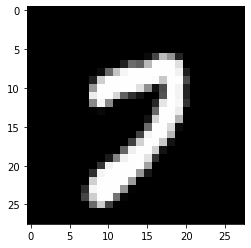

pred :  7 [5.2880394e-05 1.2662036e-11 8.8500977e-04 3.3032268e-07 5.7697181e-14
 1.2447229e-06 8.8374268e-14 9.9995339e-01 6.3674244e-10 3.3703197e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


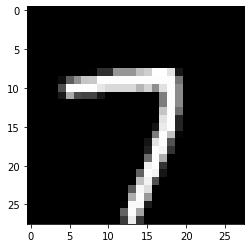

pred :  7 [1.3806236e-06 1.1772010e-11 3.9576889e-07 3.8819360e-07 1.3808157e-14
 5.0434332e-09 6.8030785e-12 9.9999976e-01 2.4022054e-14 7.4937574e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


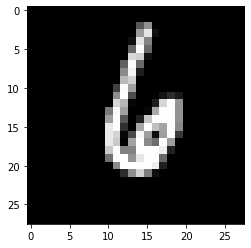

pred :  6 [4.6239540e-11 2.9235162e-10 9.3344031e-05 5.9085856e-09 2.7055930e-06
 4.9553811e-10 9.9999684e-01 7.6646546e-07 3.0586161e-10 3.4867394e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


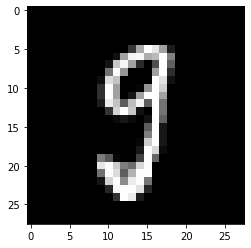

pred :  9 [5.6028366e-04 4.2814821e-07 1.6394258e-04 7.7933073e-04 2.3212959e-10
 9.2407681e-06 4.6317258e-13 1.3356887e-09 1.4645696e-02 8.1303740e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


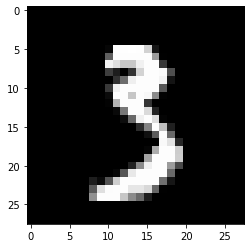

pred :  3 [9.7153183e-09 8.9274617e-05 2.9048970e-09 9.9882084e-01 9.9931383e-12
 3.8456917e-04 3.8029985e-13 2.7191121e-11 8.4754276e-07 2.1337062e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


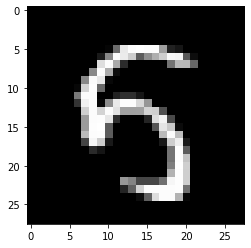

pred :  5 [8.7376252e-12 9.7357233e-09 4.7982205e-11 1.9433054e-08 7.7272307e-07
 9.9529099e-01 1.5767338e-06 1.6181707e-08 1.8745661e-04 2.0402458e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


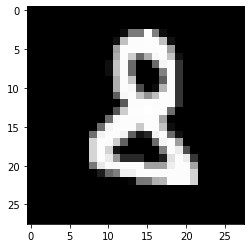

pred :  8 [1.2278290e-12 3.5019450e-08 1.4434949e-01 1.0669401e-07 1.2179523e-10
 1.2947514e-06 2.3003022e-07 3.6342335e-14 9.2380965e-01 3.4004287e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


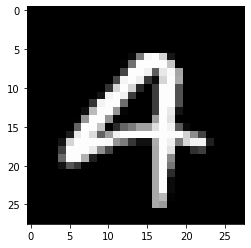

pred :  4 [3.6683014e-07 2.6695726e-15 8.4272027e-04 1.0991106e-08 9.9028862e-01
 1.6728960e-07 5.9346310e-09 2.7686201e-05 7.7388856e-10 1.3720989e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


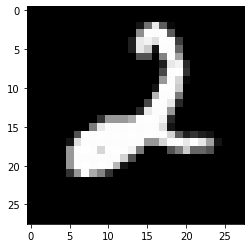

pred :  2 [1.07247176e-10 2.14429630e-08 1.00000000e+00 7.26405380e-09
 1.21467720e-05 1.41723855e-09 7.90376120e-08 6.49598309e-14
 5.58532243e-08 5.29731337e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


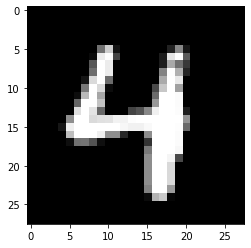

pred :  4 [9.9998392e-14 7.8551532e-13 2.0601504e-10 1.0592930e-08 1.0000000e+00
 4.9277325e-08 1.4935519e-08 4.8268782e-07 4.0940029e-11 1.9038657e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


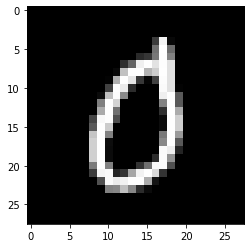

pred :  0 [9.9999833e-01 2.6904762e-10 1.4714228e-05 1.0362917e-07 1.4611615e-09
 1.9518493e-06 2.7964111e-07 1.1675317e-06 6.5318900e-10 2.1255721e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


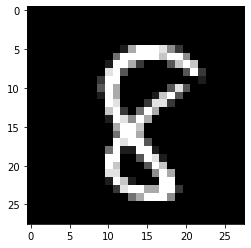

pred :  8 [4.1495589e-08 8.0990063e-08 8.5285518e-07 1.0387054e-08 2.2435949e-10
 3.3868682e-06 5.0765443e-06 6.8325491e-11 9.9988520e-01 3.6024794e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


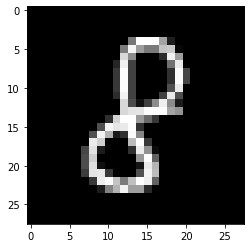

pred :  8 [5.2850493e-09 2.7762121e-06 3.2732496e-06 8.6824759e-05 3.2593598e-06
 1.8883688e-08 3.7456335e-08 5.3098975e-12 9.9996912e-01 2.9655942e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


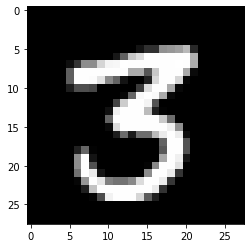

pred :  3 [1.9390226e-11 1.5763405e-09 1.2969684e-10 1.0000000e+00 2.4219815e-12
 1.3761340e-07 1.8592454e-15 2.0868625e-09 1.1670329e-08 7.1149553e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


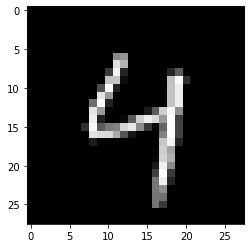

pred :  4 [2.3779226e-13 1.0314514e-13 2.7341602e-09 6.0942029e-09 9.9989522e-01
 2.8785838e-08 9.0792186e-11 4.3462851e-09 1.5005176e-10 1.0148257e-02]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


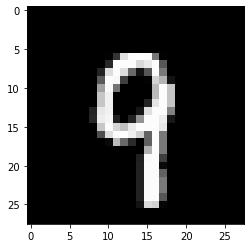

pred :  9 [9.6489882e-12 7.5398288e-10 1.6259533e-10 5.1316306e-08 5.4264127e-08
 3.8977168e-09 8.9917618e-10 4.1310346e-07 1.3415190e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


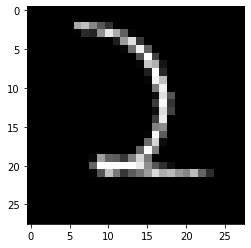

pred :  2 [5.6857175e-07 3.9061419e-05 9.9999607e-01 7.3249100e-07 1.5371452e-13
 2.2127635e-07 5.2901854e-08 3.0465610e-08 6.9197665e-14 1.3765794e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


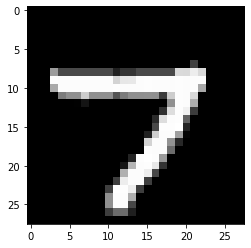

pred :  7 [2.1509342e-10 1.4694095e-16 5.4505689e-09 7.9641677e-07 5.9578465e-13
 8.1766567e-09 1.3496495e-11 9.9999976e-01 1.2184256e-11 1.3434189e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


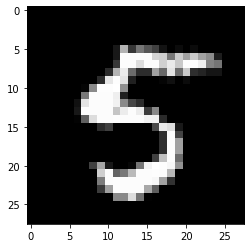

pred :  5 [1.5429755e-10 1.7601984e-10 1.1849865e-11 1.6302883e-10 4.6049406e-12
 1.0000000e+00 2.0058378e-12 2.1055369e-10 1.6271375e-11 2.9019759e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


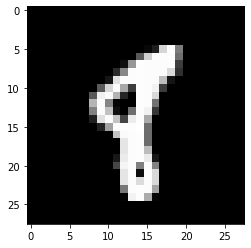

pred :  8 [1.0965679e-09 1.3302863e-03 5.5811160e-08 2.0341092e-08 4.6004308e-11
 1.4651307e-06 5.1536932e-07 4.1880994e-06 9.9993062e-01 7.6919794e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


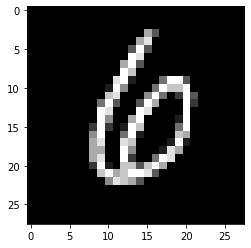

pred :  6 [5.4112077e-04 5.3650755e-08 5.5640277e-07 5.6036258e-01 4.0099546e-09
 1.2881733e-06 9.9014115e-01 4.4238329e-09 2.5576203e-06 1.5690424e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


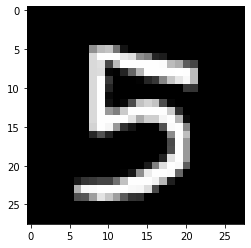

pred :  5 [8.8707763e-11 2.1867679e-12 1.4432099e-10 2.6657126e-06 4.1133125e-11
 9.9874240e-01 5.8446231e-15 3.5762970e-12 1.0490773e-07 2.6414806e-01]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


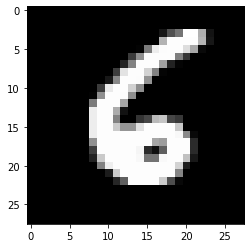

pred :  6 [2.6619476e-10 5.1662118e-07 9.6962737e-08 7.9317291e-12 6.4922126e-08
 4.4852495e-04 9.9999791e-01 1.5414391e-15 1.8287318e-07 7.5645806e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


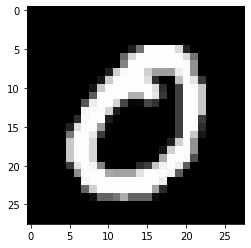

pred :  0 [9.9999988e-01 2.6427077e-05 2.1814215e-06 4.1580540e-07 8.6208028e-16
 3.4124409e-05 2.8441210e-07 1.4488943e-10 1.0574374e-09 6.2032659e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


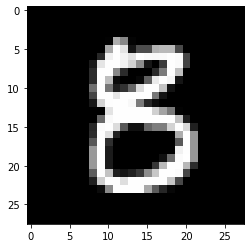

pred :  8 [1.1294891e-07 1.2691838e-09 3.9568997e-09 6.6900015e-02 5.9321867e-09
 5.1464317e-06 8.7640359e-07 1.6331944e-11 9.9994886e-01 2.1115343e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


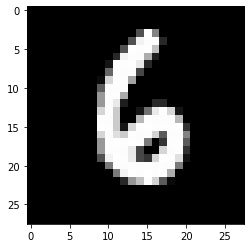

pred :  6 [1.0484091e-11 1.1206005e-08 1.9190092e-07 3.7315004e-08 8.4152794e-07
 8.8741535e-07 1.0000000e+00 5.4833622e-13 7.9674192e-07 1.1758480e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


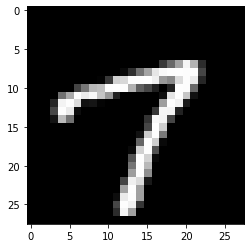

pred :  7 [7.3102574e-12 8.2187861e-15 3.0544319e-07 1.4411807e-03 1.5367181e-12
 1.5720477e-08 1.2154656e-12 9.9997085e-01 3.1358308e-05 2.7009423e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


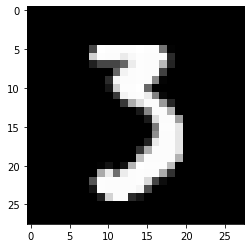

pred :  3 [5.5126652e-08 4.7992643e-07 1.8313052e-06 9.9999952e-01 1.0288392e-11
 5.9098205e-05 1.8852007e-13 9.9033457e-09 8.4195415e-09 2.0837474e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


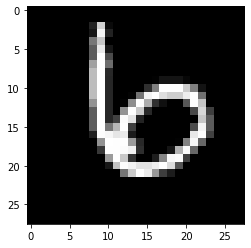

pred :  6 [2.9988095e-07 1.0482986e-12 3.3253298e-07 1.3142035e-09 3.4443662e-08
 4.0964933e-06 9.9999863e-01 3.9657117e-08 2.1305119e-05 4.3101245e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


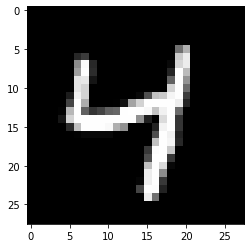

pred :  4 [2.5940344e-12 8.4702065e-11 1.4380173e-09 9.8805031e-06 1.0000000e+00
 2.0434927e-06 2.7409050e-10 1.4197501e-06 9.5236230e-10 9.6038029e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


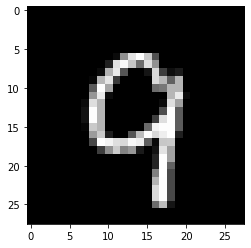

pred :  9 [1.6534905e-06 3.7419090e-14 8.1716480e-06 1.1714397e-08 1.2858241e-06
 5.3565019e-10 4.1472126e-10 2.3926955e-07 1.4265906e-06 9.9999976e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


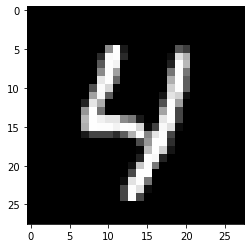

pred :  4 [1.3964362e-15 1.2619885e-12 5.8134043e-11 1.0700071e-11 1.0000000e+00
 2.4881356e-05 2.3606375e-13 4.7111760e-07 5.2792966e-09 1.3935895e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


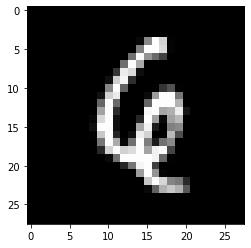

pred :  6 [6.0384070e-10 6.2576987e-08 5.4607380e-08 1.7311790e-07 1.0974109e-03
 2.4880333e-09 9.9977136e-01 2.1165111e-08 1.4643904e-06 2.8234035e-02]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


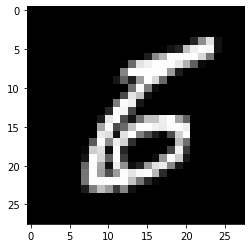

pred :  6 [1.4951817e-05 1.0872560e-06 1.1250514e-05 3.5227392e-12 6.7221500e-13
 2.1903104e-01 6.6126013e-01 1.7626853e-13 3.3910085e-06 1.6636760e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


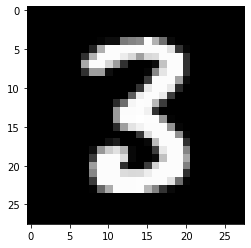

pred :  3 [1.0210888e-09 5.7921408e-08 2.1144748e-04 9.9963272e-01 1.7540677e-11
 1.1879913e-08 1.1676800e-13 1.4152598e-11 2.9480457e-04 1.0047949e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


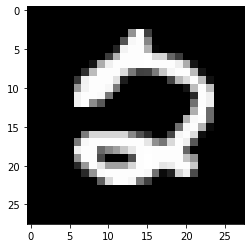

pred :  2 [3.9630246e-01 1.2058148e-10 7.0248389e-01 1.9481604e-11 4.5441569e-14
 1.9016510e-07 1.4671385e-03 5.8880067e-10 3.3625533e-10 1.5112181e-06]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


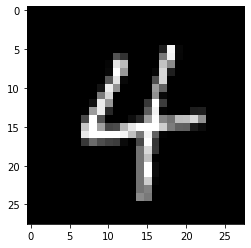

pred :  4 [1.4327127e-15 5.6164384e-09 1.7084273e-09 1.1399138e-08 1.0000000e+00
 1.2096515e-06 1.7079460e-06 3.4456360e-07 2.1790936e-09 1.1070826e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


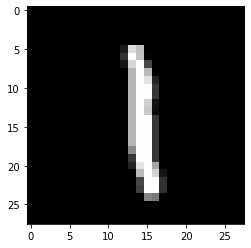

pred :  1 [1.2933837e-14 1.0000000e+00 1.5769194e-07 2.7650180e-09 2.2092348e-08
 2.7035128e-07 8.8542623e-07 1.0307372e-04 3.2840444e-07 1.0574460e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


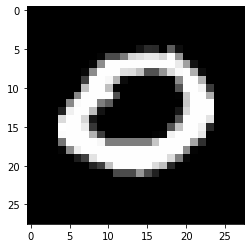

pred :  9 [9.8717153e-02 1.1797003e-15 3.8920948e-08 7.9238438e-10 2.5479127e-05
 1.2453171e-09 1.2345035e-05 2.2955621e-07 2.4090953e-08 9.9755782e-01]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


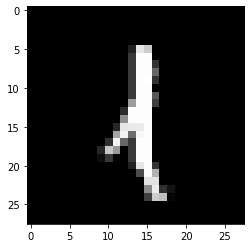

pred :  1 [4.55345353e-12 9.97681022e-01 1.34620459e-05 1.02783546e-10
 1.39513741e-05 8.22413071e-08 8.91500986e-06 4.26271072e-06
 3.34172473e-05 4.35502125e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


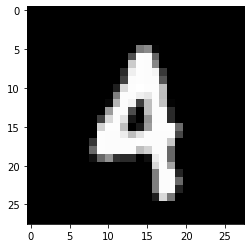

pred :  4 [1.4050929e-07 2.2649062e-06 8.8482273e-05 4.1719522e-07 9.9921095e-01
 1.7065850e-06 3.2889043e-06 7.3149517e-06 4.9244203e-10 1.7360944e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


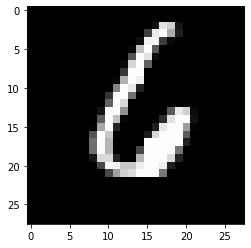

pred :  6 [6.1758794e-09 5.9165366e-09 2.6855137e-06 1.1561760e-09 2.3507810e-06
 1.6254187e-04 9.9914938e-01 2.9993572e-08 3.7088204e-13 2.1433107e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


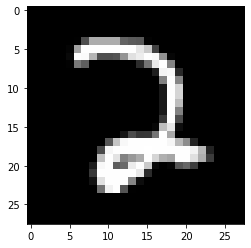

pred :  2 [4.7531572e-08 1.2785222e-11 1.0000000e+00 2.1387862e-08 7.7341587e-15
 2.7893461e-06 2.6410873e-09 4.7230181e-08 4.7462856e-10 9.3793667e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


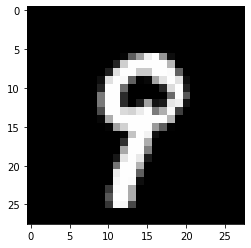

pred :  9 [3.1263898e-12 5.2144625e-11 1.5854685e-12 1.5967011e-07 2.0942333e-07
 7.2007538e-08 1.3955503e-10 5.6600925e-06 5.5259287e-02 9.9989772e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


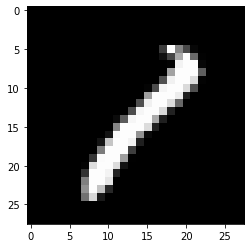

pred :  1 [2.3638039e-10 9.9670911e-01 1.4807129e-06 6.7402567e-08 1.6211828e-06
 1.2275130e-08 1.4545547e-09 1.4664148e-05 5.9951060e-05 1.5108233e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


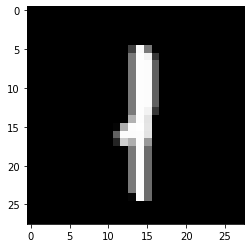

pred :  1 [1.2766232e-12 9.9987555e-01 2.1012944e-08 5.7335551e-08 1.6811886e-07
 1.6425987e-06 1.7085521e-08 1.4764100e-05 4.3448163e-06 2.4445853e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


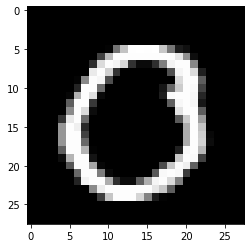

pred :  0 [9.9999726e-01 6.0988803e-08 7.2095941e-07 2.8403127e-07 1.7076820e-12
 6.1279501e-08 4.6851013e-12 2.6637977e-07 6.0326336e-12 1.1571050e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


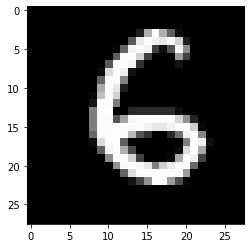

pred :  6 [6.7595707e-11 2.7331865e-08 2.7852218e-09 4.5295354e-09 3.1661219e-12
 7.6925755e-04 9.9998200e-01 4.1350104e-17 1.0379157e-07 2.6088533e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


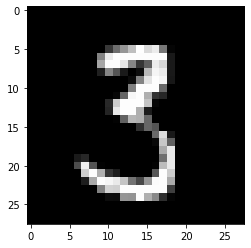

pred :  3 [1.1699598e-07 4.9532671e-09 1.0058907e-10 9.9999267e-01 7.5410875e-12
 2.5802316e-07 8.0521374e-15 1.4746523e-11 1.9474696e-07 4.8766951e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


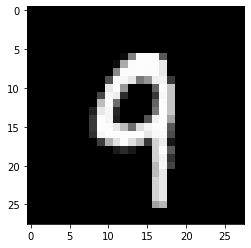

pred :  9 [9.2780761e-10 7.1936836e-12 7.3067595e-06 2.3307292e-07 1.9091549e-06
 7.6498523e-09 1.9498658e-12 3.2172577e-06 1.2536995e-08 9.9999958e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


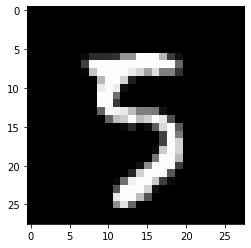

pred :  5 [1.8800928e-11 2.7810466e-11 1.6011801e-12 5.1300526e-07 2.0844176e-15
 9.9999875e-01 3.2886810e-12 2.3465432e-06 3.1748332e-10 2.5604243e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [1.0943254e-14 1.3577350e-09 6.0848942e-07 4.3917657e-06 1.9615329e-09
 1.8206983e-06 9.9999195e-01 6.9605541e-13 1.9539484e-06 2.7928183e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  5 [5.49204003e-07 2.15625564e-12 4.45135129e-08 3.54387020e-10
 7.40494777e-10 9.99889374e-01 9.61050358e-13 6.05103833e-06
 1.14443654e-04 1.93387270e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [1.9610008e-10 7.4598304e-08 5.9865783e-08 8.3223367e-06 1.8169922e-09
 7.9893205e-08 1.0000000e+00 2.4584395e-11 2.0495330e-10 2.2343185e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  5 [3.5089050e-12 4.5953755e-05 2.2246358e-11 7.5028856e-07 3.9611776e-11
 9.9999624e-01 2.5016882e-07 3.6436571e-15 4.3633022e-10 1.3949743e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [3.3609922e-08 7.1074679e-10 3.5362558e-07 1.3821000e-01 5.4872044e-12
 2.2875766e-07 4.9577865e-16 9.7313368e-10 1.4515895e-01 2.2133410e-01]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  4 [5.1104012e-06 1.7691033e-15 3.7658796e-05 4.3021285e-12 9.9989992e-01
 3.3649885e-06 1.7339994e-07 1.3474388e-09 6.7969799e-09 7.2600543e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [2.5615966e-06 1.4409626e-10 2.0390631e-05 3.5133922e-08 1.1369607e-08
 2.2920271e-05 9.9994659e-01 9.1543288e-13 2.8204918e-04 1.1712146e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  4 [5.8659090e-15 7.7403213e-09 7.2453113e-11 1.1970257e-08 1.0000000e+00
 3.8051605e-04 1.0142147e-11 3.6051922e-08 1.6433765e-09 1.0225574e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [1.2236326e-08 1.4705116e-08 6.7230929e-11 9.9998772e-01 2.1250126e-09
 4.2421074e-05 2.1413115e-13 4.7595958e-09 2.8152986e-06 2.4751827e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [3.9307438e-06 7.9598079e-13 2.1790138e-06 8.5910498e-05 3.3877662e-08
 2.8593222e-08 1.7808344e-07 6.8247382e-06 2.5022035e-07 9.9999762e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  1 [9.2816719e-17 9.9999970e-01 1.9416309e-06 3.7101920e-06 2.0167126e-05
 4.9083694e-05 3.9395269e-09 8.6632194e-11 1.9180775e-04 4.2477885e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [4.4095011e-10 2.8149509e-07 2.4908861e-06 9.9999881e-01 3.9088333e-12
 6.4367519e-08 4.4829865e-16 2.7829133e-08 2.4222199e-06 1.5817836e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [3.0432632e-15 1.8142808e-05 2.0865549e-14 2.2752737e-10 1.0000000e+00
 4.4172353e-07 3.1671683e-11 1.4269198e-08 6.1487199e-08 3.8210906e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [5.4190547e-17 9.9999964e-01 2.7758470e-06 3.3763888e-07 3.4474617e-08
 1.9517200e-05 9.9128002e-08 2.2305353e-07 3.7591231e-05 1.4521355e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [4.0508180e-10 2.7468541e-11 1.4269995e-07 5.1348889e-07 8.9635126e-09
 2.0692575e-08 3.2161757e-13 6.3624416e-06 1.1392427e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  1 [7.9110563e-13 9.9998927e-01 5.9564359e-06 8.0001694e-10 7.6585462e-07
 4.3434971e-05 2.5284256e-08 1.7195000e-05 2.4338173e-05 4.8928479e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [4.2179787e-11 1.2575962e-08 1.8231937e-01 4.3866038e-04 1.1054042e-06
 5.9145816e-10 1.0060480e-10 4.9389997e-01 4.5378803e-09 1.1246427e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  1 [4.6265254e-13 9.9997407e-01 3.7963911e-08 3.0363395e-08 3.5829169e-06
 5.4915922e-08 3.4657853e-07 3.5667250e-05 1.1276536e-06 6.5224449e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [2.4171970e-11 9.1416603e-01 1.9579560e-02 2.7471345e-09 8.1397197e-08
 1.0389110e-09 3.4720959e-08 7.1057677e-04 2.5627017e-04 4.0507472e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [1.0207134e-12 5.4697544e-12 1.6801113e-11 4.9430296e-06 1.3805736e-06
 1.6602107e-06 6.5686553e-11 1.2988505e-07 2.9139503e-11 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  3 [1.2024163e-09 5.2166764e-09 1.3319821e-09 1.0000000e+00 3.2507685e-09
 5.0055311e-09 7.4190197e-16 4.2778026e-08 2.2746524e-07 1.2468958e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [1.0446200e-12 3.0085944e-11 8.9169381e-14 1.5110329e-07 1.9783027e-12
 9.9999630e-01 1.7690552e-16 4.3184050e-07 2.1601622e-08 2.6448242e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [7.9633300e-17 1.8884821e-10 1.9234099e-13 1.4285871e-07 1.0000000e+00
 1.6411159e-06 1.3354142e-12 7.3348502e-07 5.3703149e-09 4.5338597e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.9975228e-01 6.9199594e-08 5.3854114e-06 1.7333464e-07 2.0695451e-16
 4.0655792e-02 1.2139956e-10 1.5078473e-07 2.8383518e-13 1.3100096e-12]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [3.5572082e-08 1.6896834e-09 1.4189798e-10 2.2169570e-14 1.6807678e-06
 3.8156359e-06 4.3712776e-12 5.9898347e-01 2.0623001e-07 8.7980556e-01]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  3 [3.3199905e-09 4.6588457e-06 7.5999109e-09 9.9639434e-01 1.3613011e-08
 1.3712357e-05 2.5528097e-06 4.8540994e-13 7.9299212e-03 1.3415049e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [6.4634203e-13 4.7431769e-08 6.9430498e-06 2.9606786e-08 1.9371605e-06
 4.1436273e-08 1.0000000e+00 9.3420027e-10 1.2104955e-09 1.2627060e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  1 [7.5857175e-13 9.9999428e-01 2.5001927e-07 4.6857254e-05 5.5256893e-11
 2.8882980e-05 4.3347365e-05 2.0892491e-08 3.8333201e-05 6.3319817e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [3.6840544e-12 7.7994791e-06 1.3147776e-09 1.9245541e-10 1.6950747e-12
 2.1988010e-06 3.6553013e-12 9.9918437e-01 1.1175115e-05 1.3399124e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  5 [2.0997388e-09 1.0195228e-06 6.5126418e-11 6.1916725e-09 4.8194796e-08
 9.6403247e-01 9.2718214e-02 1.2015481e-04 3.0294153e-08 1.6916731e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [1.1540064e-12 5.3628348e-08 4.7642753e-12 3.0444205e-10 2.0214455e-09
 1.0000000e+00 4.5620795e-11 3.4876535e-08 4.3808395e-06 1.2179854e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [9.1407465e-11 8.3557936e-08 8.5117069e-09 1.0000000e+00 6.9947415e-10
 1.7439615e-09 2.6148331e-16 4.4164641e-09 2.5872835e-09 5.9634750e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [1.0730513e-13 7.8724325e-09 2.0366606e-11 1.0000000e+00 9.2604893e-09
 2.5065910e-07 6.3984472e-17 4.4794274e-10 1.7852188e-10 8.9860994e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [8.4255552e-01 6.3869493e-13 5.0468234e-06 7.1877213e-11 2.1598935e-03
 1.0633208e-09 5.5870328e-06 9.1276590e-08 1.7733241e-06 1.0647428e-14]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [3.8987626e-14 9.9999911e-01 1.7857314e-08 5.0590437e-08 3.6247427e-10
 1.6149272e-06 1.7003117e-07 7.3283127e-07 2.2349845e-06 3.8581916e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [4.77200413e-09 2.76258927e-08 1.01742614e-09 9.12322402e-01
 1.62076549e-06 5.84068418e-01 5.45844487e-05 2.20337901e-10
 1.12107185e-10 1.18487858e-10]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [8.8028813e-08 8.1712737e-10 4.9893748e-07 1.6095733e-08 1.1887114e-13
 5.1656253e-09 7.1509062e-12 9.9999964e-01 2.4938904e-10 1.6966462e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  5 [4.30038560e-10 2.12679058e-11 1.16230005e-10 6.47920739e-09
 9.61154875e-13 9.99999762e-01 1.86524062e-06 7.97222913e-11
 3.42053175e-03 7.98912225e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [2.8229703e-09 1.7883193e-07 4.4820197e-05 2.0987480e-05 2.1820265e-12
 4.8260637e-07 7.3795504e-11 7.3572442e-06 9.9997771e-01 4.2773622e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  6 [7.0669457e-09 1.4649790e-09 1.4574647e-02 1.3393872e-10 1.4776621e-11
 4.6006043e-08 9.9999821e-01 2.0577028e-11 1.0362428e-06 1.0003905e-05]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  5 [3.6390791e-08 6.0626335e-09 4.9652994e-07 1.6316463e-08 5.3827012e-01
 6.5792954e-01 1.6858132e-06 3.2833380e-10 1.1946849e-09 1.4170088e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [1.3809059e-13 9.9999863e-01 1.3417878e-07 8.8737471e-09 1.1481971e-08
 3.9275246e-06 4.0766503e-07 8.1212202e-06 9.2123690e-07 1.7345485e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.9999577e-01 8.4017993e-09 5.0980782e-07 2.3070334e-11 1.2644177e-11
 3.1750892e-07 1.9383672e-08 1.0313497e-08 1.1583287e-08 1.2406707e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [6.6680315e-13 4.2838451e-08 1.0370001e-04 1.4048437e-07 8.8858575e-01
 1.6341035e-08 1.6707507e-06 8.0917182e-08 6.5702069e-01 1.1828099e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [3.3034284e-09 2.0685331e-14 2.6194820e-01 6.3148286e-07 8.6200376e-18
 1.6621655e-08 7.5376467e-13 2.5075376e-02 4.5181034e-05 2.4708253e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [2.6666175e-10 5.5123525e-07 9.5225780e-12 9.9999917e-01 3.2687728e-10
 1.2836629e-06 9.2738097e-18 9.0144808e-10 2.0494832e-09 3.3471976e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [1.1312222e-15 1.1005413e-08 3.9351180e-13 1.8534363e-10 1.0000000e+00
 1.3814786e-06 5.1979861e-12 8.1613560e-09 2.1578767e-08 4.1233498e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [1.8505416e-08 2.8645340e-05 7.9515769e-07 8.0963833e-11 6.9185002e-10
 4.9023926e-03 9.9984246e-01 6.8938479e-12 5.4357945e-13 9.4418067e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.7265120e-10 5.0434212e-10 1.1860708e-07 9.5553830e-08 1.2193057e-09
 8.6783443e-09 1.0929336e-11 9.9997807e-01 1.2536169e-10 6.0111284e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  9 [4.9581983e-10 1.9043179e-06 2.2147408e-06 1.7112958e-05 7.7153978e-05
 1.9338205e-07 3.2589442e-13 2.9489785e-08 1.8298579e-08 9.9979478e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  8 [4.38147254e-05 1.27479609e-06 3.64124775e-04 6.92968460e-05
 1.36575284e-09 4.96076236e-10 2.81484631e-07 1.14237714e-07
 9.99983370e-01 1.72734261e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  1 [9.8871711e-09 9.9999732e-01 5.1614057e-07 2.4414628e-11 1.9311814e-05
 5.2510650e-06 7.1308137e-09 3.9175572e-07 1.4674115e-06 2.7371984e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [5.1057773e-12 3.3469467e-14 1.3837516e-03 6.7290964e-11 1.2826771e-02
 1.2043358e-06 5.7173413e-05 6.3828608e-12 9.9817538e-01 6.8312694e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  9 [3.7812543e-14 5.6768124e-10 4.6824794e-10 5.8746859e-06 4.8648834e-02
 5.2194005e-10 8.1968426e-10 8.6238980e-04 4.0834769e-10 9.9831361e-01]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [1.2201129e-09 1.0899628e-15 1.6719627e-11 3.8015251e-06 5.5325581e-06
 1.3755539e-09 5.5360985e-12 1.8781424e-04 1.0503767e-07 9.9995738e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  2 [7.2554030e-08 1.2090505e-06 9.9922621e-01 2.5808566e-07 5.0733049e-16
 2.5831759e-03 1.3071973e-11 1.2816829e-09 1.2838536e-12 4.9834707e-06]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [5.9277447e-08 1.2833978e-07 1.4187019e-05 1.5467405e-04 1.3317280e-09
 9.0699032e-08 2.4548785e-07 3.8248713e-10 9.9988472e-01 4.3731047e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  6 [2.6704034e-05 3.8493617e-09 1.6434926e-07 7.0353044e-06 8.3889731e-09
 1.4302243e-09 1.0000000e+00 2.2999052e-07 7.9963449e-09 8.6672730e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  2 [1.2599449e-07 3.3827426e-08 9.9996042e-01 8.1040016e-05 2.5815515e-16
 3.1698988e-08 5.2885935e-11 4.7188997e-04 1.7368793e-04 2.0381384e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [2.0686763e-09 1.3026173e-06 2.7255302e-07 8.3140105e-07 1.2132739e-09
 2.1043765e-10 5.9629060e-13 9.9999952e-01 1.5503712e-14 3.5096015e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  0 [9.9999774e-01 8.5886029e-12 3.0721063e-07 1.1936936e-06 2.3500701e-10
 1.2269074e-07 3.5723724e-07 2.6943354e-08 9.6638939e-07 3.9165676e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.9999416e-01 2.0912108e-08 2.4765179e-06 6.5704569e-08 3.2598335e-09
 1.6478533e-06 6.1615697e-06 1.8904229e-06 6.6702677e-10 4.6274106e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [5.2745763e-09 9.8829330e-12 8.8698550e-07 1.1297761e-10 4.5551545e-09
 9.7777753e-10 1.0000000e+00 1.1357176e-10 9.7595489e-07 2.6639920e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  7 [9.3906891e-09 2.0199829e-07 3.2126891e-08 1.1975402e-01 6.0278258e-12
 1.8751142e-06 9.0964747e-09 9.7981739e-01 4.4501612e-05 3.0583278e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  5 [9.5779398e-11 4.1806128e-08 5.4866632e-11 1.6222437e-08 5.5818257e-13
 1.0000000e+00 1.2457786e-08 6.4927166e-09 9.8908352e-08 1.9126319e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [3.8657690e-09 5.0524358e-09 2.8649055e-07 4.7753412e-07 3.4904222e-08
 1.6976982e-07 8.4906611e-07 9.1492064e-11 9.9998701e-01 1.6182661e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  6 [1.0925544e-07 5.1489275e-11 1.1122671e-06 2.4163765e-11 4.2874722e-09
 4.7024143e-05 9.9999768e-01 6.9864519e-09 3.5042552e-07 5.7206268e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.9989349e-01 1.9348616e-12 1.7750263e-04 5.8351950e-09 8.9517109e-12
 2.6817794e-08 1.4462382e-02 2.2558456e-10 1.7166268e-08 2.3664937e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [1.9253048e-12 9.9230086e-13 7.2263560e-05 2.1789128e-07 3.9878488e-04
 6.5525360e-06 3.4930576e-09 5.3559168e-11 3.1711130e-07 9.9999523e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  3 [3.6411325e-09 3.8034761e-06 1.1166682e-08 1.0000000e+00 2.7101116e-12
 1.3621245e-08 1.2269494e-11 1.2188522e-09 3.8724921e-09 1.3375083e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [5.62054581e-08 4.13281805e-06 1.38144274e-10 1.37217477e-11
 1.92922175e-06 1.11109975e-08 3.66932120e-08 1.67399198e-01
 5.74119611e-07 2.19409764e-02]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  1 [6.8819182e-16 9.9999678e-01 2.9975945e-07 6.0199012e-11 4.5632067e-09
 6.7427259e-06 3.2685250e-09 2.2344040e-05 5.9048543e-06 1.5642838e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [1.1170089e-12 8.5493856e-10 6.2357575e-10 9.9998212e-01 8.1178626e-07
 2.3078810e-05 7.7143499e-17 2.9093451e-12 2.1992844e-05 7.6845038e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [9.6583366e-04 7.5241702e-10 2.2694830e-14 3.9898516e-09 1.7932171e-11
 9.1632688e-01 2.4169683e-04 6.8622981e-06 4.4596195e-04 1.7299338e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [7.0762244e-13 8.3210886e-16 4.2884045e-07 6.3477863e-08 9.9991167e-01
 1.1920058e-09 1.8468471e-07 3.3608897e-06 1.4560871e-05 6.8228284e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [3.3294597e-08 2.7578484e-10 1.5043126e-05 9.9993253e-01 8.3358986e-11
 8.5148573e-09 8.6952068e-10 3.8322029e-10 1.3845208e-01 4.7304061e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [4.2745911e-11 2.1311732e-10 7.9678934e-08 1.0000000e+00 4.8095271e-11
 6.1449448e-08 8.2507288e-16 1.1042446e-07 1.4970515e-08 3.6426120e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [1.7129660e-09 1.1527669e-06 2.6706692e-10 5.1502415e-08 1.3604762e-15
 1.0000000e+00 2.9054495e-10 7.5817148e-12 6.9059558e-12 1.1147950e-05]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [1.5675743e-08 2.0246105e-08 3.1228004e-13 2.6854545e-08 7.1725124e-13
 1.0000000e+00 1.7177870e-11 1.4646799e-13 1.2481689e-08 4.9803539e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [3.1706440e-07 6.3994830e-06 5.9554731e-07 6.9985653e-08 4.2545633e-08
 2.8664388e-05 9.9999946e-01 3.8475208e-12 2.6510413e-08 3.2729635e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  3 [3.5081202e-13 6.0409733e-11 1.7683343e-11 9.9999952e-01 2.1503278e-17
 6.1537830e-06 9.5082612e-19 2.3574848e-06 6.2399868e-12 4.3558042e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.99998450e-01 2.52388208e-08 1.41605387e-05 1.34022935e-08
 1.38645215e-11 1.03735360e-07 6.15079334e-05 1.35904787e-10
 8.54648352e-10 1.41842378e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [2.0649324e-08 5.6747427e-05 9.9999964e-01 2.5835124e-08 2.3766974e-10
 1.7789006e-04 8.4426091e-11 4.0317860e-14 3.3964307e-11 4.5671420e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [6.5157385e-10 2.1765596e-09 2.3015838e-07 9.9999779e-01 2.0597221e-10
 1.9893537e-06 9.4642144e-13 3.2079528e-10 1.1955888e-07 1.0671593e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [1.3123310e-15 1.3848367e-12 7.7631540e-08 9.5158065e-08 9.9997944e-01
 1.2040056e-07 5.5267595e-09 5.0562193e-11 1.2221813e-07 1.4892519e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [4.8472630e-09 2.6418783e-07 1.0000000e+00 4.7914053e-08 6.8006717e-14
 1.8626409e-07 1.3465203e-11 6.4044559e-07 2.9200860e-08 1.7023820e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [2.3836990e-13 3.6278397e-11 1.8125996e-09 9.9988806e-01 3.4030932e-13
 5.1400256e-08 1.5649063e-16 1.8339634e-08 3.4345913e-08 2.4017692e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [1.0000000e+00 6.4544521e-09 1.9425293e-06 2.2381980e-07 1.0043579e-12
 5.0902171e-09 3.4247790e-08 5.9436140e-09 6.9710578e-11 1.4956502e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [5.4457210e-11 6.5737590e-14 3.2972278e-09 4.3310652e-06 3.2176763e-07
 2.7669686e-10 1.0799580e-10 1.6810700e-05 3.0673255e-07 9.9999893e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  9 [3.6135271e-13 5.1152135e-08 9.5212345e-12 4.2290171e-10 1.4854085e-06
 1.0293869e-05 1.4506576e-15 9.4961521e-08 9.2978159e-09 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  4 [2.7049850e-11 3.7014484e-04 3.0114683e-07 1.6488271e-07 9.9846518e-01
 1.4066288e-06 2.5310734e-07 2.7147906e-05 6.6252461e-09 1.9541383e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [4.9443422e-11 1.5991675e-10 1.3902032e-09 2.2481595e-06 3.5397071e-11
 2.2775992e-06 6.6121952e-12 1.0000000e+00 2.6347186e-12 6.1307060e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  2 [1.9136737e-08 2.7605772e-08 1.0000000e+00 1.3357882e-07 6.9937869e-16
 1.9678755e-07 3.4915304e-10 4.7404657e-11 4.2765036e-09 8.4766343e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [6.9963932e-04 3.6829337e-01 6.7089995e-06 4.0643135e-07 8.3936219e-11
 1.0065097e-06 2.6016107e-08 1.0300354e-10 2.8344125e-02 1.3453499e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  4 [4.5193882e-16 5.5196460e-06 5.7200506e-13 7.3903514e-08 9.9999607e-01
 1.6076273e-09 7.3425372e-12 4.7398379e-07 9.5439763e-09 4.2956090e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [3.6741216e-10 2.7360877e-11 3.1180160e-05 3.4134384e-06 2.1956376e-11
 9.9287745e-11 4.6687853e-12 9.9999762e-01 6.0146704e-10 4.3137125e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  0 [9.9999946e-01 8.7707447e-10 1.7489091e-06 3.8283621e-09 5.3897777e-14
 4.0832941e-08 3.8000914e-07 7.5191167e-07 7.5817499e-14 1.5891987e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [4.6200821e-08 2.0057777e-07 7.0399051e-07 3.6477690e-10 2.6096159e-09
 1.7073819e-05 9.9997938e-01 2.7556779e-09 3.2115864e-08 9.0277211e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.8323691e-01 4.2568016e-09 4.2791027e-01 6.8448535e-06 4.8817846e-14
 1.7885810e-08 1.3290389e-08 1.0547543e-09 9.4165205e-12 5.0905617e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [3.6841735e-16 4.3919918e-10 9.7064508e-08 2.4845195e-07 4.8838624e-06
 2.7388933e-06 3.1221294e-08 1.7527636e-05 9.9791861e-01 3.5967529e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  5 [2.8879405e-14 5.2756528e-09 1.3698298e-10 3.1412543e-07 5.8640245e-13
 1.0000000e+00 3.4131791e-11 5.3207601e-14 2.4201103e-09 1.0779537e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [6.3022026e-10 8.9325795e-07 9.9987239e-01 1.0834485e-05 2.4204019e-16
 1.9772476e-07 2.8236890e-11 9.7444968e-08 5.8926832e-07 1.3715579e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [2.9970984e-08 8.5381462e-09 1.4784336e-03 7.7840454e-08 1.0010513e-08
 2.4665536e-07 2.7377087e-09 1.0902521e-07 9.9999952e-01 2.8202174e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  5 [1.0929095e-17 2.1874751e-10 1.3122278e-12 1.0144415e-10 7.6722081e-13
 1.0000000e+00 6.6756001e-14 2.4219030e-12 1.6798920e-05 1.3235369e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [4.6358808e-05 2.0490396e-11 2.0199982e-07 3.7496204e-07 8.7867392e-13
 2.8461966e-07 3.2715042e-14 9.9984229e-01 3.5516400e-13 4.1697885e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  3 [6.6675301e-07 5.9160143e-10 7.5365980e-09 9.9213099e-01 1.1268939e-11
 6.9165230e-04 7.5725982e-15 5.1612846e-12 1.1455328e-04 7.6586604e-03]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.9999666e-01 8.0426871e-10 1.5610929e-09 9.5086037e-08 6.2460060e-14
 4.8317560e-07 2.6436691e-08 5.8119387e-08 1.9129829e-09 3.6907196e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [6.0674548e-04 7.5271196e-12 4.7950806e-08 5.2215173e-06 2.6613675e-11
 4.1014988e-05 1.1616439e-02 5.6993751e-15 9.9972844e-01 2.9810607e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  2 [2.68606414e-06 2.83285999e-07 9.99999583e-01 9.80695950e-06
 1.41606231e-14 5.64177427e-10 1.73520605e-12 2.25262961e-10
 4.65175489e-08 1.06382944e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.8276681e-11 1.8047929e-05 3.2958388e-04 1.2616697e-06 9.0076370e-05
 9.9759323e-10 5.5095533e-12 9.1853201e-02 2.4625659e-04 1.4665723e-04]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [1.20529694e-05 1.94255591e-07 9.99927223e-01 1.99233909e-07
 5.42455469e-10 9.49945331e-11 1.71264258e-09 1.24026494e-14
 1.23944879e-03 9.79069910e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [9.8415933e-07 6.0711008e-10 6.2778372e-06 5.8438468e-06 5.5526937e-11
 1.2885320e-08 5.5060082e-06 7.0076411e-10 9.9999613e-01 2.0048933e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  2 [3.0543545e-10 1.6846954e-07 1.0000000e+00 7.1950017e-06 5.5231920e-11
 2.0317353e-07 5.8791020e-08 1.7010544e-11 8.4176395e-07 1.7012596e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [2.4887331e-15 6.0002740e-06 5.4527573e-11 5.5498936e-07 1.0688562e-12
 9.9999964e-01 1.1500156e-09 9.5380687e-15 1.7430852e-07 4.2517808e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [2.91294311e-12 5.26462600e-07 1.16906568e-10 4.02301836e-08
 1.10780385e-10 9.99999881e-01 2.54309208e-14 2.06973300e-10
 1.41140962e-12 7.50877689e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [3.7020445e-04 1.4031524e-13 1.3502906e-11 3.8083320e-10 3.7955225e-08
 4.6291279e-06 6.5108655e-11 9.9999332e-01 4.3001664e-09 2.1246076e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  6 [2.0980934e-07 2.0808301e-08 2.7999590e-06 2.3557224e-12 4.6515240e-12
 6.2927604e-04 9.9999523e-01 2.8317789e-15 4.0665332e-06 6.8541839e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  4 [3.94697830e-10 1.02058785e-10 3.53434060e-09 1.17895815e-11
 1.00000000e+00 3.89072920e-06 3.32501600e-07 1.16861274e-05
 1.07900064e-10 2.76761426e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [7.56760776e-01 1.29550695e-04 1.56737565e-06 4.62745277e-07
 4.66744382e-07 4.07019002e-07 2.36004591e-04 3.41539685e-09
 1.00784725e-07 5.11283793e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  8 [3.9996692e-07 6.8907758e-07 4.8903382e-07 5.8321604e-08 1.9048781e-07
 3.8871168e-08 2.1444896e-07 2.0892948e-10 9.9999845e-01 2.1741293e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  4 [6.1823458e-14 2.6491798e-09 2.8839062e-10 1.6769091e-08 1.0000000e+00
 8.5634255e-09 1.1799385e-08 2.0552634e-05 3.0285918e-10 6.5400873e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [6.6787488e-13 6.2499642e-03 2.1431649e-07 7.2325290e-10 2.3032798e-10
 1.0432562e-06 1.4087558e-04 8.0601254e-08 9.9980605e-01 9.4014406e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  2 [6.1377368e-13 2.9307604e-04 9.9999952e-01 1.5141055e-07 1.1244591e-11
 1.5423055e-07 2.9519485e-09 6.0700393e-07 2.0011175e-09 4.0415279e-13]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [2.0457389e-08 1.0301656e-09 2.4407960e-08 1.2969369e-07 4.0030861e-12
 3.6257077e-08 2.6492539e-14 9.9999207e-01 1.0820095e-10 1.7785592e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  4 [2.8063560e-08 1.5334394e-15 4.5295942e-06 3.7322816e-09 9.9999702e-01
 9.2250723e-09 3.5932885e-08 5.1023800e-08 3.5192456e-09 1.7413497e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [2.0207957e-15 3.6634046e-12 1.0936881e-08 2.8114925e-07 7.7032949e-09
 8.2602382e-01 3.2023806e-06 8.1850085e-06 4.5273112e-11 6.5754706e-01]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [4.6435017e-12 1.6920983e-06 9.9998671e-01 5.4514712e-06 2.3623232e-12
 5.5157784e-08 4.1394557e-12 4.7903424e-13 4.3740451e-09 8.0481493e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [1.0000000e+00 3.8181061e-05 3.6013145e-07 1.3404595e-08 1.7050847e-12
 2.9036908e-08 2.3327708e-05 2.1154273e-10 5.5791678e-12 9.7097970e-13]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [2.2178424e-09 9.5809594e-10 7.2860509e-08 9.9998951e-01 8.5985608e-10
 1.0517840e-07 1.5273497e-16 2.5539662e-10 8.1355601e-08 9.9170597e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [1.2419541e-08 2.5847910e-14 1.5670521e-05 1.4257431e-04 2.2918444e-08
 1.6162113e-07 3.9674458e-11 4.0729078e-09 4.7158128e-06 9.9613619e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  9 [8.3176738e-13 3.1053305e-14 1.7560287e-08 2.1086257e-06 7.7659130e-02
 2.2987880e-08 9.8407515e-10 7.3033739e-06 5.6806550e-07 9.7551322e-01]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [9.6706518e-09 1.0035556e-08 7.1974397e-03 2.9471301e-05 5.8902841e-11
 2.8778868e-06 9.9997580e-01 1.9937723e-09 2.7065271e-06 4.3802292e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  7 [7.8061457e-10 4.4949488e-08 3.5502858e-09 7.3886739e-08 1.0341872e-10
 2.7915890e-12 4.0442806e-13 1.0000000e+00 5.6261441e-12 5.8086915e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  2 [7.8263168e-10 6.9952762e-06 9.9996138e-01 4.9913474e-08 8.1108262e-17
 3.6791462e-08 6.8573223e-09 5.7450735e-11 3.4235461e-07 1.9736039e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [2.4682027e-11 5.7434849e-11 1.8343483e-08 1.0747356e-08 1.7152228e-08
 1.0000000e+00 1.4003893e-11 1.3198922e-05 4.0944093e-07 1.2778554e-09]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [3.2562852e-09 6.3272965e-01 3.5392724e-05 3.2658626e-10 1.9896180e-11
 4.7255456e-03 2.7327418e-02 4.9927583e-11 2.2410495e-05 1.2361656e-13]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  1 [8.5305718e-14 9.9999958e-01 2.2868395e-05 1.5286206e-08 8.7916611e-05
 7.3761143e-08 1.1506344e-09 5.8626860e-08 6.4602077e-06 2.0831823e-04]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [8.4435475e-10 9.9999762e-01 4.2114552e-09 7.4598799e-10 9.7066916e-08
 3.3236226e-06 2.5782846e-08 9.9999602e-07 6.1608998e-06 8.5857863e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [2.4532017e-08 1.1697684e-06 9.9988842e-01 9.6768563e-06 6.2826445e-16
 7.8025924e-09 8.6946466e-13 1.3564500e-05 1.8870456e-06 5.6884641e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [2.4552213e-10 2.7639335e-06 6.4050754e-10 1.0000000e+00 2.6254007e-10
 6.6195526e-08 9.0184912e-13 2.8140861e-15 5.3868288e-10 9.3354750e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [1.4339474e-05 2.8778153e-08 1.0224209e-07 1.4053469e-08 1.6920296e-07
 6.6792682e-10 1.0000000e+00 3.2242608e-06 4.2798060e-10 1.8651213e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  7 [3.2682163e-11 9.3652712e-09 1.1661362e-08 6.0549257e-07 2.0948354e-12
 1.7481003e-10 6.7820093e-13 1.0000000e+00 3.7989604e-13 1.2492209e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  8 [1.0777969e-07 4.7013646e-09 8.6886093e-06 1.2160722e-04 6.6668593e-10
 1.8675561e-10 1.4293194e-04 4.5022547e-10 9.9995863e-01 9.5399635e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  7 [5.2456715e-09 1.5187765e-09 4.5067072e-04 2.2981554e-09 2.5797046e-13
 2.6787642e-11 3.2546130e-14 9.9999505e-01 5.4822487e-11 1.3488325e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  6 [3.3791059e-06 4.4671966e-12 6.3252737e-05 6.7234356e-12 4.7697475e-05
 1.1811689e-10 9.9999952e-01 1.6034267e-06 2.6180576e-08 9.4220320e-09]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  4 [6.1473250e-04 2.2819144e-14 1.2890309e-02 1.3843918e-10 9.9996984e-01
 2.0060502e-10 8.0171027e-08 2.0259037e-09 6.2803305e-09 6.3082584e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [2.5915857e-05 2.3575497e-10 6.5139284e-05 7.4706099e-06 5.0525489e-10
 5.8945127e-10 1.0553599e-09 6.4265759e-10 9.9997818e-01 1.2078881e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  9 [3.7755649e-12 1.5801310e-12 2.3366204e-07 6.9825489e-07 1.2718653e-05
 1.5126188e-09 2.1435191e-12 1.3050437e-04 6.0603188e-06 9.9998677e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  4 [5.1830500e-07 4.2711761e-11 1.4078319e-03 2.8009191e-07 5.9695810e-01
 6.4052159e-08 7.0481739e-11 1.0063341e-06 4.9487503e-10 7.2444797e-02]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [1.96624800e-10 7.52370666e-11 1.10157295e-07 3.97168624e-05
 2.53766435e-11 1.46282915e-07 1.03962200e-10 1.58190727e-04
 9.99993801e-01 3.02955982e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  6 [7.21011584e-11 1.54741775e-09 1.58506044e-08 4.83479994e-08
 1.55508246e-07 1.43476955e-05 9.99998808e-01 3.88011605e-16
 9.80447680e-07 1.51282663e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  3 [3.6430517e-08 5.3504368e-06 3.8218033e-09 1.0000000e+00 6.0437138e-08
 5.5949855e-05 3.9897465e-12 3.5778203e-11 1.3590765e-10 1.7026514e-11]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [8.58966871e-08 3.03175050e-08 5.83416295e-06 1.20962540e-07
 5.73682803e-11 1.21880121e-05 1.37514276e-08 3.40180883e-09
 9.99958992e-01 5.13885894e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  3 [8.4776062e-08 4.3175814e-09 2.0922599e-08 9.9998832e-01 5.4105431e-10
 2.1229625e-02 9.3092837e-08 1.2769752e-10 7.0708117e-10 7.9626483e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [4.8545193e-08 9.9999970e-01 4.4728475e-07 3.3439351e-10 2.5741436e-05
 4.4278954e-06 8.1674294e-09 3.1819368e-07 3.1249385e-06 1.5471255e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.9999857e-01 3.7668997e-05 5.8457113e-07 2.2799286e-08 1.7659681e-11
 3.5062877e-09 1.1295953e-04 4.8703340e-11 5.7202222e-14 1.8374785e-12]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [7.3821559e-07 9.6444565e-13 4.2381929e-05 3.6322974e-06 1.8535963e-09
 1.7321938e-08 1.0000000e+00 9.3693409e-10 1.5491808e-07 1.3805223e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  2 [1.0902379e-10 7.2692797e-05 9.9997771e-01 1.6075047e-07 2.9394286e-14
 7.8644824e-08 8.2876527e-12 2.0894245e-08 5.6634508e-06 4.1598112e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [1.4878236e-07 8.9032461e-09 9.9999982e-01 4.4523023e-08 3.0305531e-16
 1.9462277e-05 7.0043575e-09 4.1589664e-07 7.0190018e-09 1.6042158e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [1.4660370e-11 4.4756612e-10 6.7695164e-06 7.7033202e-10 2.9262271e-14
 1.0000000e+00 2.5339385e-16 2.1391320e-07 8.4303681e-10 3.8528469e-11]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [8.2965525e-13 2.0142820e-06 3.1671777e-07 1.5575507e-07 2.9992112e-10
 4.1102114e-05 9.9999976e-01 2.7324108e-15 1.5814102e-11 3.2430535e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  9 [3.2287728e-11 1.4296197e-19 5.5822413e-09 2.9647021e-08 1.3785958e-03
 1.8006563e-04 1.3400880e-13 2.2441149e-04 3.7327585e-09 9.9982876e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  5 [1.2652394e-05 3.6225363e-11 2.9068076e-10 2.6551366e-05 8.1962756e-11
 9.9105704e-01 1.0073231e-06 3.4548836e-10 4.5623899e-02 4.6074390e-04]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [2.6378606e-05 2.6290916e-08 7.4681418e-05 1.0339378e-06 4.8779131e-10
 1.5686631e-08 1.4582437e-09 5.8266867e-09 9.9999285e-01 9.4446719e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  1 [4.6463788e-13 9.9999869e-01 6.6973995e-09 1.9324045e-07 5.3650037e-08
 9.8230169e-07 4.3852179e-07 4.5040201e-06 6.8116296e-06 9.2167713e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [1.6117043e-13 2.3859345e-15 9.4579300e-10 4.6249354e-10 1.0000000e+00
 2.4858952e-08 4.1267678e-10 1.4352231e-06 4.2788675e-10 2.6409818e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [3.44817491e-14 9.99996781e-01 7.63748972e-07 6.64402862e-08
 5.18300076e-05 7.62099148e-08 7.06372472e-09 9.64361675e-08
 1.29949485e-05 7.34011992e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.6133961e-07 6.0014889e-11 6.7293571e-10 5.5137484e-08 1.7896977e-11
 3.5493753e-07 4.1130416e-13 1.0000000e+00 5.8168428e-11 3.3088818e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  8 [2.6621710e-10 1.0256676e-06 1.0007769e-02 1.6460173e-06 1.2054614e-05
 9.0166697e-07 6.3022538e-09 3.3058740e-09 9.4171453e-01 1.3525094e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  4 [6.5718443e-13 4.2352083e-10 9.0528481e-11 2.6025821e-09 9.9990010e-01
 6.1894674e-08 5.0059554e-11 1.0252716e-06 1.2451294e-09 3.7856996e-03]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [3.7061196e-09 8.4950215e-12 7.7162249e-06 3.0337531e-11 3.0065612e-09
 7.9642618e-08 1.0000000e+00 1.1520628e-11 7.6278956e-09 3.0903379e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  1 [1.2220790e-16 9.9999785e-01 1.4679090e-07 2.4558247e-07 8.5953511e-09
 1.1998276e-05 9.8626906e-08 8.2515135e-07 1.0021111e-05 3.2742781e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [6.7150711e-07 3.0842902e-08 7.9210940e-06 8.0468688e-08 5.9978761e-10
 1.2243179e-06 1.0873130e-08 2.9462882e-10 9.9999702e-01 9.5741325e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  4 [1.5789378e-16 7.4705053e-13 3.4133174e-10 1.1240464e-09 1.0000000e+00
 1.4987186e-06 2.8846734e-12 3.0758937e-07 8.6810381e-10 3.9109574e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [1.2144136e-08 3.7501766e-06 1.6881484e-07 9.5507455e-01 3.1445554e-10
 1.8031743e-01 1.5913749e-10 7.5029141e-07 4.1361373e-10 8.3725445e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [2.3734029e-11 9.9947369e-01 7.6823339e-11 4.7752476e-08 5.0989096e-05
 3.8571892e-05 4.3571396e-10 9.8560520e-08 1.2797941e-06 1.5092184e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [3.0748861e-08 9.2232426e-09 1.0000000e+00 1.7357434e-07 8.5577598e-09
 1.2040923e-08 1.2815846e-06 1.9661045e-11 4.1106243e-10 8.6118557e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [2.8300704e-09 1.4767146e-12 1.0536198e-04 2.3054503e-05 2.4004024e-05
 4.6885296e-10 8.6648066e-07 2.4222277e-11 9.9999774e-01 1.4731413e-09]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  0 [9.9999976e-01 7.3369066e-09 1.7827648e-05 5.5667471e-10 1.9716972e-10
 3.6742145e-09 1.1385535e-08 3.1811419e-07 1.9976567e-11 8.5326974e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [3.0339589e-09 1.6412191e-08 2.1308661e-04 4.5389533e-03 7.7460770e-14
 2.5156540e-08 1.2585571e-10 5.6265662e-07 9.9993414e-01 4.3443315e-08]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  5 [7.7978943e-12 6.3930351e-08 2.1627368e-10 8.2844139e-08 6.3594709e-15
 1.0000000e+00 6.2073280e-09 1.6834746e-13 1.5854226e-09 3.0183301e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [9.3555819e-08 9.0361399e-13 4.0401010e-06 5.1864859e-09 5.1144161e-07
 8.2927441e-12 3.4555774e-07 2.5859863e-05 1.6542830e-07 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  2 [1.2835782e-10 1.3137430e-01 1.6441923e-01 1.6279619e-05 3.4392860e-15
 3.2359683e-05 2.1167339e-11 1.2760964e-06 5.2705031e-09 2.6714577e-11]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [1.8574380e-07 2.4102177e-11 3.4406960e-06 1.2172591e-08 9.9999917e-01
 9.0598656e-10 9.3367696e-04 6.9503231e-10 9.7846597e-10 2.3347225e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [5.7141219e-12 1.7035742e-07 1.0000000e+00 3.5430560e-08 1.1024115e-11
 7.8678690e-09 4.3385057e-10 3.6371598e-14 3.7582645e-08 4.1153625e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [2.7388069e-01 7.2196288e-10 3.5241832e-05 3.7507935e-09 2.7644315e-10
 3.7259805e-01 3.0519150e-06 3.1923880e-10 3.9651990e-04 3.6670036e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [1.5360117e-04 6.9953757e-08 9.3271959e-01 1.3097227e-03 2.9609512e-07
 6.0140974e-06 1.1414776e-07 5.5266848e-13 5.1014361e-08 8.9486635e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [2.5591448e-10 7.5098964e-12 1.3435720e-08 1.6619302e-07 3.2816099e-14
 5.2112585e-12 3.2165500e-13 1.0000000e+00 2.1173476e-11 3.5050357e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  0 [9.99944091e-01 2.26627460e-13 7.01159593e-07 1.16236720e-07
 1.17210549e-12 6.43074512e-04 2.23039706e-07 1.26895685e-08
 3.09863687e-03 1.26525983e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [7.2862348e-11 2.1815959e-01 5.3217370e-13 5.6842991e-10 4.1198550e-10
 3.0474550e-05 1.9202511e-12 1.9928884e-05 2.8998256e-03 9.4784766e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  0 [9.99983072e-01 9.71867209e-09 5.26070595e-04 3.15102504e-08
 1.63773866e-08 8.74949624e-09 8.49299395e-05 2.09565876e-08
 1.66877523e-09 1.38173935e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [6.2720892e-07 2.5514371e-08 9.9999923e-01 8.8461513e-07 6.3793892e-13
 3.2196317e-09 2.2379650e-11 2.2420324e-11 9.3928347e-06 1.8040158e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [9.6897713e-07 8.1497052e-07 3.2913107e-08 9.1412358e-07 3.7014285e-13
 9.9908352e-01 8.7018386e-11 2.6690805e-10 1.1536698e-06 2.8482318e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.3083149e-07 1.0429392e-13 1.7754046e-07 4.9108267e-04 8.1518371e-16
 5.2482931e-13 3.2004306e-13 9.9997681e-01 8.6044921e-08 8.8249169e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  6 [1.0929165e-08 1.2534282e-06 2.7686028e-08 8.4647719e-13 4.7930276e-10
 5.7201061e-07 9.9999833e-01 1.4369060e-14 1.4878213e-10 4.6665555e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  7 [8.86955092e-07 4.18470299e-13 1.10128522e-03 6.44583125e-08
 4.12256253e-12 1.16014504e-10 5.85816224e-07 9.99654412e-01
 7.49984519e-09 1.55221323e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  9 [2.0704979e-11 5.5315523e-11 5.7413080e-10 1.7603111e-06 3.6447491e-07
 1.7092030e-09 1.0145895e-12 8.3674040e-06 1.0365778e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  4 [2.2944960e-11 1.0627627e-06 2.3539621e-06 2.8529457e-10 9.9998903e-01
 1.3203681e-05 5.9871272e-06 5.1362946e-05 1.5611638e-06 7.6649398e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [3.2945800e-06 3.5803398e-05 9.9985635e-01 9.0291337e-08 2.5948535e-10
 6.1259868e-08 2.3775149e-09 5.8796996e-07 2.5270121e-05 8.0309383e-06]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [1.08050715e-08 1.06434861e-07 1.20109271e-05 1.03627175e-15
 1.75006342e-12 3.04952264e-03 1.00000000e+00 4.63424854e-15
 6.20744984e-08 4.16633589e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  2 [8.2752809e-09 4.3587647e-08 9.9977612e-01 2.2244453e-04 1.4050299e-09
 2.6506202e-09 9.7376108e-04 3.3167195e-12 2.4622688e-11 9.7009938e-15]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [2.4690419e-14 1.1039739e-09 6.7357520e-10 2.9232181e-06 9.9999940e-01
 1.3286942e-06 4.0930094e-12 2.9967540e-09 7.8961748e-06 1.9791548e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [1.32151425e-11 1.45529509e-06 1.45255986e-11 1.50879007e-08
 9.99996185e-01 6.95808300e-10 1.68094960e-09 2.80126778e-06
 5.05578828e-06 1.17566287e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [5.0249594e-07 1.4498965e-08 2.5722173e-07 1.7723441e-04 4.4881249e-10
 1.4763796e-08 1.0264392e-09 1.7025596e-12 9.9869502e-01 7.0030034e-02]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  0 [9.9997878e-01 7.4143421e-11 4.0931252e-05 3.4366734e-09 4.4887028e-12
 1.6782851e-06 6.8773198e-10 3.1298180e-06 5.4420434e-06 2.7577579e-03]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [3.26177696e-11 5.67878535e-13 3.44058249e-09 2.62185182e-07
 9.99997973e-01 3.72861697e-09 1.28274742e-08 1.79606676e-03
 1.02083314e-10 4.55221908e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [8.2981429e-15 3.1912316e-06 2.2714927e-10 5.3305044e-13 1.0000000e+00
 1.0014094e-06 2.8680749e-10 1.7776062e-08 3.6448740e-11 1.6154669e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [1.9894312e-12 8.4257113e-07 1.3178211e-12 3.1401216e-13 9.4703221e-12
 1.0000000e+00 2.1783537e-13 3.7765825e-11 2.1150572e-09 2.1435409e-07]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [2.1380704e-06 4.2222652e-09 2.7446837e-05 2.1672249e-04 1.6969791e-13
 6.0754047e-08 6.4327169e-11 8.6631753e-06 9.9999607e-01 3.7790363e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  0 [9.9993271e-01 3.3259447e-11 2.4070024e-02 1.0170696e-08 2.6101721e-10
 1.0874214e-07 4.4058211e-07 8.7583624e-07 7.1436681e-08 7.1651471e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [5.2115295e-11 6.7562067e-11 1.3921311e-05 1.3807416e-04 2.9153850e-07
 2.1044608e-10 9.9999934e-01 1.3478033e-06 1.7961413e-10 2.9039498e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  8 [1.0148906e-06 7.6242008e-09 3.9754586e-06 1.2960016e-06 6.3413541e-10
 1.9587365e-09 2.5310337e-06 1.6331750e-08 9.9999946e-01 3.7210527e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  9 [1.0706685e-15 2.4355928e-15 2.9897060e-07 4.0357970e-09 2.2767446e-05
 7.2589015e-09 1.2013136e-09 4.3569198e-06 1.1433363e-03 9.9998927e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  8 [9.8867190e-09 1.4648281e-09 2.0359619e-05 9.8660735e-07 2.0126804e-10
 2.3275675e-06 2.9513050e-10 9.9832609e-10 9.9999356e-01 2.8262150e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  5 [9.3938604e-07 1.0845831e-08 1.5447637e-09 6.5715819e-09 7.1958070e-13
 9.9999940e-01 1.7072531e-07 3.6871530e-09 6.9491671e-07 9.8785236e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [2.2570553e-06 4.3752092e-07 5.7228863e-06 5.1981684e-18 7.9927948e-12
 2.4492505e-01 9.9528903e-01 3.1550311e-15 1.2405915e-10 1.0915565e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  9 [5.3430632e-10 3.3319053e-12 4.7791224e-07 9.4038320e-08 2.7531303e-05
 1.6371289e-09 9.6690600e-10 2.5163981e-06 3.7907764e-08 9.9999619e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  0 [9.9999535e-01 3.5670342e-07 7.5067794e-07 2.3849316e-09 5.7996739e-14
 6.7001629e-06 2.1173489e-06 1.0038566e-11 2.3404549e-12 2.1253187e-11]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [7.1779280e-14 9.5389396e-08 2.7163514e-13 4.7975457e-10 9.9999166e-01
 1.1289868e-06 6.6454661e-14 1.9634692e-06 2.2798069e-08 1.0073453e-02]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [2.7590388e-09 6.9728056e-13 1.5246868e-04 1.6584596e-07 3.2608580e-10
 6.8812113e-08 4.6586365e-06 3.9926853e-08 1.0000000e+00 5.1108003e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  7 [2.1029751e-11 3.3954718e-15 1.1374655e-09 2.2890104e-05 3.6973641e-13
 2.4366458e-09 5.2344370e-13 9.9999923e-01 6.5275120e-12 1.3544159e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  1 [1.2052233e-07 9.9971884e-01 3.3123592e-07 3.4061703e-10 4.2578285e-11
 1.8259883e-04 1.4263095e-09 6.7009136e-09 2.6525500e-05 1.3932433e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [3.6583059e-09 5.7171013e-07 1.1033525e-06 1.0000000e+00 7.6594547e-14
 9.2676817e-07 6.4066391e-10 1.9864322e-06 4.9871829e-14 7.2800175e-13]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [1.9084836e-15 1.2407070e-07 4.8917321e-13 7.7921586e-11 1.0000000e+00
 3.1639914e-08 3.7702974e-12 5.7333473e-08 4.9975775e-08 4.5633918e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [2.8922324e-08 1.4478832e-10 6.0800849e-09 1.7448017e-05 7.4077051e-13
 9.4083935e-02 2.8389066e-02 8.9991099e-09 6.0086769e-01 6.9739940e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [1.8344225e-11 2.7468279e-11 4.1014811e-08 1.2714565e-03 1.1268462e-06
 1.8545985e-04 9.1450022e-07 1.6436336e-09 9.8651361e-01 9.6642673e-03]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  0 [9.9999988e-01 1.2422787e-08 2.4166118e-07 4.4693273e-08 9.0293602e-15
 3.8444750e-07 1.0761260e-05 6.5587091e-09 1.1249145e-10 1.1865397e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [1.5286352e-08 3.3516147e-15 2.2870827e-06 6.4965167e-10 3.7021971e-06
 1.4133756e-09 1.6601923e-11 8.2648121e-06 8.1140494e-12 9.9999505e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  1 [8.3175991e-08 9.9999225e-01 7.6841779e-08 1.7862303e-10 3.3353535e-07
 5.2707801e-05 2.1604993e-07 5.2705838e-07 3.0162109e-05 5.2650675e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [4.9332383e-10 7.0277328e-10 4.7432972e-05 9.9995995e-01 4.9309567e-12
 2.2430484e-09 4.2263437e-12 5.1184436e-08 3.6843783e-06 3.2536468e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [1.9653341e-09 2.8483799e-07 1.5633933e-09 1.0000000e+00 1.7159442e-10
 9.0384633e-10 6.0332433e-12 7.9409737e-13 3.2134000e-08 6.3504541e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [3.7572825e-08 7.2861863e-09 1.4865398e-04 1.6161719e-08 6.2997629e-10
 1.2806938e-08 1.0000000e+00 8.2533813e-14 3.5384165e-08 4.5269275e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  9 [1.26625626e-08 5.03735720e-09 3.69501186e-06 3.82951257e-05
 5.99688465e-05 7.88015839e-08 2.18173857e-09 4.20280514e-07
 3.88532300e-08 9.99996483e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  8 [1.6244123e-14 1.1564096e-13 1.9745896e-08 6.7181907e-07 7.1596864e-05
 1.8991617e-06 7.8660764e-07 5.1687694e-09 1.0000000e+00 6.8389323e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  7 [1.5913561e-07 5.4154059e-10 1.4445918e-05 1.2685552e-08 2.8598153e-14
 1.5994137e-11 2.8954982e-13 9.9996161e-01 1.4245926e-11 6.7435712e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  1 [1.2658100e-11 9.9996591e-01 2.2223592e-04 1.1811538e-09 5.9874094e-07
 1.6402694e-06 2.6232196e-09 1.4157351e-07 7.2528746e-07 3.3322456e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.9999833e-01 1.0465996e-06 5.1835864e-06 9.2761390e-08 1.9612289e-14
 1.1750441e-07 3.8012495e-06 1.3495118e-09 3.2299354e-12 4.7531913e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [2.8420248e-09 7.9988882e-10 1.0152846e-06 1.2602747e-10 1.3762695e-14
 9.9987572e-01 1.4187932e-01 6.0081007e-10 1.0482371e-03 7.6060630e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [7.0235118e-10 1.7677999e-09 5.8598770e-09 6.8588690e-08 3.3877187e-13
 1.5541438e-13 3.4538702e-13 9.9999660e-01 2.2851594e-10 2.0648574e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  1 [1.2101147e-09 9.9997377e-01 2.1725033e-09 7.6925764e-09 7.7371771e-09
 3.6713830e-06 4.0041652e-07 1.0097550e-05 3.4350520e-05 3.0195606e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.3994434e-08 1.5701327e-12 4.7167836e-10 3.2962282e-09 1.4683946e-13
 3.8989656e-09 3.7071230e-13 1.0000000e+00 1.4695041e-17 1.4732684e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  5 [6.4773542e-09 8.7907542e-11 7.3092860e-07 2.6855351e-09 2.9553830e-14
 1.0000000e+00 4.5127052e-08 3.4354970e-11 2.7474098e-07 1.3968306e-11]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [8.7766567e-09 2.1788558e-06 9.9999976e-01 2.1194319e-06 3.2779296e-19
 9.9596446e-07 5.6279044e-12 6.9080116e-08 1.6697464e-07 3.0044990e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.3918978e-10 1.5174251e-08 1.6645783e-06 2.7644528e-06 4.5276952e-13
 1.4015939e-08 2.0707783e-11 1.0000000e+00 8.0543960e-11 1.0636384e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  9 [4.6626408e-10 2.3873756e-09 8.8820098e-09 5.2862495e-05 9.2698519e-06
 6.4262116e-09 7.0597640e-13 4.3851554e-07 2.2995472e-04 9.9999762e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  1 [6.02745243e-10 9.99994397e-01 6.74426182e-10 4.49481604e-06
 8.48550397e-11 2.44826915e-05 3.99772432e-07 4.10653598e-07
 1.17488838e-07 1.18927055e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [4.0719018e-11 1.9562244e-04 4.0151150e-08 2.5390695e-10 3.9152209e-08
 3.9781759e-07 6.5803588e-06 2.0184713e-07 9.9999928e-01 7.0284943e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  5 [1.43649315e-09 1.77669750e-12 1.21522215e-12 9.59122701e-08
 1.48812213e-10 1.00000000e+00 1.42203718e-12 1.22339805e-10
 1.06544285e-08 5.13865324e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [3.1624165e-08 2.7016285e-11 9.9999750e-01 1.2020391e-05 6.2991767e-13
 2.7943728e-10 1.2238282e-05 9.9828847e-09 7.2832229e-10 3.3143974e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [1.51425899e-12 6.46193473e-15 3.16302885e-06 1.83578241e-09
 1.00000000e+00 3.22359028e-08 1.09172574e-10 1.79540494e-10
 2.70004175e-11 6.61769081e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [1.7181114e-11 1.1816648e-10 1.2585510e-12 2.7865569e-08 6.1569088e-05
 2.8137338e-06 6.4460739e-09 1.1345475e-06 1.2825070e-09 9.9999905e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  4 [3.6879950e-14 1.2018997e-10 2.5036405e-07 9.9438697e-09 1.0000000e+00
 2.3027757e-09 9.7906339e-10 8.5574044e-08 9.9626407e-10 2.4155679e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [4.2285009e-10 1.6841574e-07 1.5038620e-09 1.4556643e-06 1.5362609e-12
 4.1302069e-11 5.6807270e-16 1.0000000e+00 9.8425391e-13 5.0184652e-09]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  2 [7.4557192e-12 6.4802581e-09 9.9999809e-01 1.0305892e-07 3.9824063e-10
 3.8601258e-05 2.1948642e-10 1.6458044e-09 2.9834215e-08 2.0834804e-03]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [6.9965869e-09 1.7836223e-14 9.9999958e-01 1.7251576e-06 8.8484954e-13
 1.7875955e-06 7.7603817e-09 1.0649761e-07 2.1708310e-08 2.0935653e-08]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [3.0131389e-06 8.6156220e-09 3.4016596e-09 9.9988931e-01 3.6516169e-11
 2.8049581e-07 1.0321579e-13 3.8314667e-09 1.6114116e-04 5.6282778e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [1.5126044e-09 5.7841119e-09 2.1886667e-08 8.8728067e-11 9.9999952e-01
 1.3665111e-09 6.7838823e-10 1.2387267e-07 2.2766045e-08 2.8461316e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [1.7051863e-11 3.7951621e-11 1.4321351e-09 3.2970725e-08 5.0174272e-05
 9.3496366e-09 2.3752721e-12 3.6319561e-05 4.1171117e-07 9.9987608e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  1 [2.5481931e-08 9.9999118e-01 1.0728836e-03 5.0698767e-10 3.2946932e-06
 6.7684958e-08 6.0881646e-08 6.2619613e-08 1.4424140e-07 3.7740011e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [3.6818243e-10 3.4812116e-13 6.6741684e-08 3.3395804e-07 2.0684652e-07
 7.8811958e-08 6.1299077e-10 3.9932166e-07 1.6109885e-05 9.9999952e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  2 [4.0292054e-09 4.9345063e-11 9.9999976e-01 2.9285140e-06 3.4345288e-10
 3.4137717e-11 2.9827047e-06 1.3252310e-13 5.5832432e-05 1.5793114e-12]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [6.9540863e-07 9.9998832e-01 6.3133353e-05 9.1999533e-11 7.0350723e-07
 2.7325623e-07 1.8216822e-07 1.3309358e-07 6.1031460e-06 4.9017075e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [5.7861112e-12 5.3874505e-08 2.5823865e-10 1.2782216e-04 3.6789809e-14
 3.6064698e-09 2.1185916e-15 9.9999732e-01 4.5760297e-12 2.8195463e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  9 [7.4494757e-09 2.0698985e-14 2.2508850e-07 7.7711310e-10 1.6925139e-07
 2.6662732e-07 6.2708594e-10 2.1596390e-08 5.7715955e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  4 [1.2797181e-14 4.0580310e-11 1.1416856e-07 1.5405635e-07 9.9999976e-01
 1.2479452e-06 1.2476416e-06 3.0309654e-11 3.1897584e-14 7.5450728e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [7.1862085e-16 1.7257968e-11 5.0848072e-11 1.0215802e-08 9.9991149e-01
 4.9692312e-07 1.6644053e-08 1.4340951e-05 6.7167098e-11 3.2615662e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [3.0975755e-10 6.6783023e-01 6.5061959e-06 6.0415268e-04 3.0280188e-07
 1.4181426e-06 1.2990555e-01 7.3710577e-10 8.1273321e-10 3.5621291e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [2.9129268e-08 4.6320638e-12 1.4483929e-04 5.2590656e-09 3.7916673e-11
 7.0690390e-08 9.9999952e-01 2.2403032e-13 1.0648680e-06 1.0003976e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.5135474e-06 2.7590003e-14 7.3283574e-10 2.0468395e-08 6.1791937e-08
 8.8261160e-08 3.2253614e-12 9.9999464e-01 2.8773459e-10 3.9104169e-05]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  2 [5.7283789e-10 3.2480678e-08 9.9999964e-01 6.3488093e-10 2.9663744e-13
 2.3881874e-08 7.6893379e-12 1.1574425e-09 8.5547566e-04 3.1725162e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [7.8597207e-10 1.2847263e-11 3.6649354e-08 1.3056047e-06 1.1356666e-12
 1.9525576e-11 2.9869385e-13 1.0000000e+00 3.0778580e-10 1.9248385e-12]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  8 [4.1004483e-08 8.8243701e-07 4.6311437e-05 5.6751778e-06 8.2620017e-09
 8.4378653e-06 5.4704643e-08 5.6021584e-08 9.9999619e-01 5.8096225e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  8 [7.5489700e-02 6.2113310e-09 3.0666880e-07 7.4434292e-06 3.4311898e-10
 2.5239833e-06 4.2584538e-04 7.7353735e-10 1.8538681e-01 1.4794051e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  1 [1.3328283e-09 9.9998224e-01 3.0028192e-05 9.6781749e-10 4.3501463e-05
 2.0657704e-07 2.4765661e-09 1.3870891e-06 6.8358965e-08 6.2760350e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [8.0847176e-11 1.2185191e-14 7.4649797e-09 4.4460927e-07 1.1043309e-07
 4.9871764e-09 2.1947143e-13 1.3105278e-05 5.4393195e-06 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  7 [1.40273579e-08 1.15093664e-10 3.21533917e-05 5.05836113e-07
 3.03506813e-14 2.58491950e-10 1.80807517e-14 9.99998927e-01
 1.23812649e-13 1.24396280e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  1 [2.03731414e-14 9.99781072e-01 1.78259796e-07 3.70551902e-07
 3.18867571e-10 1.18312964e-04 2.06756397e-07 1.33171028e-07
 2.12594867e-03 6.54385246e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [1.0066825e-08 9.9999845e-01 1.8505910e-08 2.2831958e-07 1.0363386e-08
 3.2864932e-06 6.5881856e-09 4.2855613e-06 2.1382457e-06 7.3721900e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [2.4405389e-09 7.1347779e-15 9.5341148e-09 1.3448668e-08 4.2953727e-12
 2.3265707e-10 8.5500995e-11 1.0000000e+00 1.6570595e-12 5.0940371e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  5 [1.8708193e-09 5.9116489e-10 2.4646521e-10 9.7498469e-07 8.0560397e-15
 9.9999332e-01 9.7046537e-12 9.0580814e-11 5.6726153e-09 4.2702295e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [2.6421532e-05 2.5480463e-07 2.1075921e-08 9.7092754e-01 2.8113288e-11
 9.8878554e-06 2.1133907e-10 6.1263161e-11 9.9756853e-06 1.0992904e-05]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [5.2358000e-11 1.4221316e-09 3.3067051e-06 1.0000000e+00 7.5175138e-10
 1.6244840e-06 3.7727883e-11 1.1890000e-12 1.3618899e-09 2.0734670e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [3.0694086e-11 1.4040729e-06 1.3351080e-09 2.2800712e-05 8.1735020e-14
 9.9984932e-01 1.7013425e-08 8.5904173e-13 5.6429559e-07 1.4244141e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [1.4073036e-10 9.9999839e-01 6.4738494e-08 7.4244291e-08 5.0401786e-07
 2.2504665e-07 1.8968762e-09 1.5364319e-07 6.0706206e-08 1.0339398e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [1.5731627e-09 8.9924910e-08 3.4894485e-09 9.9999809e-01 1.9469366e-09
 5.2245056e-08 1.3583395e-15 3.9948125e-11 9.9229073e-05 1.0460351e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [6.0306409e-09 3.9926753e-13 2.1006151e-06 8.3083869e-08 1.7368327e-11
 2.0398711e-06 1.2432577e-08 1.0000000e+00 1.3513942e-06 7.7104645e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  6 [7.6301149e-07 8.7430725e-13 5.8215857e-04 4.4317328e-11 5.6253691e-09
 3.9832398e-11 1.0000000e+00 6.7322878e-07 4.2972639e-09 7.4201539e-06]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  1 [2.4112084e-13 9.9999982e-01 7.3209708e-07 5.1313540e-09 1.3941995e-09
 3.2704352e-06 4.8969628e-08 1.1269773e-06 6.1488081e-06 1.1192147e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [3.0333066e-08 1.0010141e-06 1.7811723e-07 9.9998051e-01 2.2957106e-13
 8.4483624e-04 7.9713472e-11 9.7287389e-10 1.9983522e-09 3.0121690e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [1.1809826e-09 1.6267163e-10 6.0220659e-03 7.9545424e-07 6.6649806e-09
 5.6508480e-08 1.2104991e-07 3.0388931e-09 9.9999493e-01 1.7983242e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  7 [3.5008700e-08 1.3237924e-07 1.4252564e-10 1.6967981e-09 1.0434313e-08
 8.1907672e-09 1.6170984e-14 9.9999827e-01 1.0816122e-12 1.3835663e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  5 [1.12196705e-08 2.09464668e-09 1.66703685e-05 3.53440374e-01
 2.14644448e-12 9.75861669e-01 5.30969203e-13 5.72745375e-05
 1.10108656e-09 2.69566165e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [6.2111178e-09 1.2780192e-12 8.5248223e-12 1.1486113e-03 4.8221160e-09
 6.2415004e-04 1.5213089e-11 1.5876294e-08 1.8379986e-03 9.9991816e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  6 [8.49455595e-04 3.12279296e-14 5.39858593e-06 2.32369249e-10
 4.53761240e-05 1.10681924e-07 1.48847461e-01 2.73657702e-12
 3.45452804e-06 1.25239789e-02]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  0 [9.9999905e-01 2.6428890e-07 2.6785909e-05 9.6495969e-06 2.3524555e-18
 5.7174503e-07 3.8358719e-11 2.5253893e-08 4.6375560e-11 1.2084543e-12]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.9999970e-01 4.9338082e-06 3.9234514e-08 3.0437253e-09 6.2136142e-14
 1.0107446e-05 7.6483971e-08 2.9122947e-11 3.2161865e-14 3.8278949e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [4.7724543e-11 1.2723029e-02 9.9985409e-01 6.1520370e-07 7.8980713e-14
 5.6744551e-09 4.0219268e-09 7.8793619e-08 3.6124786e-06 3.8370374e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [9.7620112e-10 5.3833753e-07 1.0173023e-03 2.9981848e-06 1.7909561e-09
 1.6019189e-07 1.4056103e-07 1.5466851e-10 9.9996150e-01 2.3770332e-04]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  8 [6.3630939e-04 1.2946793e-05 2.2534700e-06 1.5149187e-05 4.4827566e-08
 5.7009665e-06 7.4191066e-06 7.4856354e-10 9.5591158e-01 2.2194940e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  2 [7.5104559e-08 2.4537805e-13 9.9949372e-01 1.8428218e-05 4.4936216e-15
 2.0060426e-10 2.5395623e-11 2.8574765e-03 2.6126254e-01 1.2423082e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [1.9460548e-11 2.0670001e-09 9.3073395e-06 9.9999940e-01 2.9880712e-10
 2.8179901e-08 4.3587294e-09 1.0465890e-07 8.1655679e-07 1.8237418e-13]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [4.5615227e-11 5.9497474e-10 2.4088058e-08 3.5020639e-07 8.2373048e-15
 1.0825627e-10 9.6656802e-15 1.0000000e+00 1.5521065e-12 1.6229385e-10]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  1 [2.6815836e-09 9.9996877e-01 2.0760621e-07 2.5332190e-08 1.0766489e-06
 4.9347868e-08 1.1551835e-10 8.1666432e-05 2.1206106e-06 1.0027387e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [1.54955604e-09 3.01560959e-07 5.47728973e-09 9.99999702e-01
 7.58144714e-10 6.26740132e-07 1.19848201e-10 1.19961575e-11
 1.60271423e-08 5.22286603e-10]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.9995315e-01 3.1254163e-13 6.2779385e-08 1.0618656e-09 5.6455662e-09
 5.5166804e-09 1.1866162e-05 1.6943081e-07 7.6148376e-10 3.0334933e-05]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [1.5006650e-08 3.2407906e-06 4.9896244e-08 9.9992448e-01 2.7844528e-12
 3.8757549e-05 1.4834838e-09 3.9178016e-10 5.2377938e-05 1.1694997e-06]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [1.2607530e-14 9.9397846e-07 3.2055318e-13 7.0233810e-09 9.9999976e-01
 1.0796770e-08 1.3356473e-10 1.0870014e-09 1.9406045e-05 7.5752355e-09]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [1.0270157e-15 1.6037744e-09 8.5084849e-11 3.9361922e-07 1.0000000e+00
 2.7387964e-08 4.8308569e-11 5.8324323e-10 1.6661983e-10 5.7924035e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [8.5695450e-07 5.7233224e-10 1.7800499e-05 9.8671687e-01 3.2244786e-14
 1.3611615e-03 9.0384582e-15 2.8581143e-10 5.9801195e-08 3.2911348e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [1.1041071e-08 2.7189695e-09 3.4550749e-06 4.5305165e-07 3.6279474e-07
 1.7163781e-06 3.5365054e-05 7.4730847e-13 9.9963564e-01 4.7400550e-05]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  9 [4.09796586e-10 1.43984791e-09 1.03555863e-07 1.84861187e-06
 1.75041084e-08 1.16369044e-07 2.75802055e-11 4.09381801e-06
 2.98215855e-06 9.99999762e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  2 [7.8811541e-11 1.9521684e-09 9.9999869e-01 3.3580479e-06 9.5178168e-09
 1.4747220e-08 5.5657761e-08 1.3663907e-06 4.2100980e-09 8.5445720e-11]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [2.1591890e-09 4.1214960e-07 9.1898034e-10 9.9999541e-01 1.2907753e-08
 5.4736611e-05 3.2512860e-11 1.8749058e-09 6.6907603e-07 1.4444808e-08]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [5.2065495e-08 2.9392286e-09 1.7373125e-08 2.4697311e-09 2.4371674e-08
 8.5841821e-06 6.4842229e-14 1.6425165e-07 1.8683561e-08 9.9999958e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  7 [4.1580859e-07 6.8710458e-12 2.9864887e-07 3.3073895e-06 7.9649481e-15
 4.3573475e-10 1.0066157e-11 9.9999607e-01 1.1593344e-06 2.8640032e-04]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  1 [1.5631144e-11 9.9999881e-01 7.4575404e-08 4.9129984e-08 1.2276014e-07
 5.9311265e-06 3.8356731e-08 3.1507486e-06 1.0141844e-06 7.4394691e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [1.94064209e-12 9.99999166e-01 1.00464206e-07 1.84042420e-07
 9.34416367e-09 4.36093569e-06 5.82611186e-08 1.71356828e-06
 5.73139857e-07 4.96588655e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.9141966e-07 1.6759331e-09 6.3820494e-07 8.2579181e-06 2.9850957e-15
 7.7484941e-08 3.9760551e-13 9.9999690e-01 6.4957162e-16 9.6312455e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  0 [9.9998462e-01 3.5106407e-11 2.8969076e-05 4.5636739e-14 3.7319736e-10
 2.4072442e-06 9.5966214e-05 1.2743742e-10 3.4448538e-11 7.7429613e-06]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [5.4589236e-07 2.6545018e-12 2.6573036e-06 8.8511837e-12 9.9999839e-01
 1.2963217e-08 4.1390067e-06 4.1667556e-07 4.5507234e-10 7.6761842e-04]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [9.7278010e-12 5.8129728e-05 5.3776539e-09 4.1242836e-09 4.0356108e-06
 3.6107529e-06 4.1261910e-15 2.4111594e-06 2.1410679e-06 9.9999917e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  6 [8.8987762e-10 1.8504257e-11 6.4981068e-05 9.4110719e-10 8.6404714e-09
 6.6886039e-09 1.0000000e+00 1.5030475e-13 1.0702353e-08 1.1802868e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  5 [4.3773540e-11 6.2598024e-11 5.4781779e-09 3.5867529e-06 3.2741370e-15
 9.9999911e-01 3.0631306e-09 5.7686725e-14 1.5540773e-07 3.7500406e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [2.8574998e-09 8.3123450e-13 1.1071280e-06 2.4861135e-06 1.1603526e-07
 6.0498084e-10 2.1880248e-11 8.6525318e-08 1.8164283e-08 1.0000000e+00]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  1 [3.9433193e-11 9.9996805e-01 6.5017139e-07 3.1507184e-08 1.6047116e-08
 1.4464218e-06 4.5979288e-08 1.7002178e-05 4.9665119e-05 7.7426623e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [2.6462000e-13 1.3557076e-04 8.3974510e-02 2.1010637e-04 7.2860218e-16
 3.0935400e-08 4.1029540e-07 9.3445110e-01 7.0494345e-08 5.3512576e-12]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  0 [9.2780823e-01 2.7900219e-06 4.3699506e-09 7.3103971e-12 1.8331648e-17
 5.0238609e-01 4.6543130e-11 5.6573157e-07 4.8978529e-07 1.7141664e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [6.4362915e-10 6.1775347e-07 9.9968886e-01 4.6144130e-05 1.2012196e-13
 5.2627829e-11 2.7707170e-11 2.1320780e-06 7.2925963e-07 1.0870983e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.9999923e-01 7.3336469e-07 1.7677999e-09 2.0696687e-11 4.4253219e-11
 4.1973591e-04 1.2262710e-07 3.8613992e-09 2.8182224e-11 1.4935376e-12]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.6824098e-01 2.5305591e-11 6.4819551e-01 5.3043233e-05 4.9699218e-17
 9.6619308e-09 1.7838716e-13 3.3088796e-11 1.8571101e-13 9.6864449e-07]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [3.6999973e-12 4.0805175e-14 6.6345970e-11 8.8606934e-12 9.9999642e-01
 3.0336463e-07 7.7645931e-11 2.9919081e-05 1.8090240e-10 5.1389696e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [5.2779148e-10 3.4246810e-08 4.6058508e-06 5.7037965e-09 2.3898039e-07
 2.2781194e-07 9.9999952e-01 9.6086986e-11 1.3431299e-10 2.7047131e-10]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.2970725e-06 1.7075191e-12 2.0554515e-05 8.8941192e-08 4.6931343e-15
 6.7782757e-08 2.6855297e-13 9.9999988e-01 2.4474937e-13 2.6924104e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  0 [9.3589234e-01 3.7062275e-08 5.6715882e-05 3.5933465e-10 8.6385393e-10
 5.3277302e-07 8.5707390e-05 7.6302596e-11 9.8075940e-12 5.8790910e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.2407223e-09 9.0226125e-11 1.9400703e-10 8.4019601e-05 2.1803420e-08
 1.3399111e-10 1.1661699e-11 9.9234241e-01 1.8667541e-07 2.9127002e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  1 [2.0221086e-13 9.9999523e-01 2.1217606e-07 6.8423013e-08 3.3295535e-09
 5.1698146e-07 1.4083744e-07 1.0792308e-05 1.6451886e-06 7.2627245e-07]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [5.1931497e-12 5.9884937e-13 2.0954980e-05 4.9406584e-10 9.9999976e-01
 2.4981728e-06 4.5657031e-10 4.3375045e-10 1.1617310e-09 9.1755078e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [6.9017726e-05 1.1148715e-09 3.1408679e-05 2.5636555e-09 3.4114300e-10
 2.7553787e-07 9.9999940e-01 3.2051761e-10 1.0783263e-09 1.5188809e-07]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  4 [7.2638904e-12 1.5733599e-10 7.1161939e-09 6.4529972e-06 9.9996352e-01
 5.3458360e-10 1.1118602e-13 2.9187984e-07 2.3087459e-11 7.7388977e-05]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  5 [3.7117414e-14 1.3289753e-12 8.1374068e-08 1.1032146e-06 1.0615476e-09
 9.9968016e-01 3.2725637e-15 3.4527312e-07 4.7263503e-04 5.6796878e-08]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [3.9842179e-12 2.9768287e-15 3.0385106e-09 7.3923423e-11 1.0000000e+00
 6.5478974e-07 1.2829908e-10 4.6074476e-07 6.3483735e-10 1.4284659e-07]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [6.9202599e-07 1.5415376e-13 8.2497008e-06 6.0554048e-11 4.3873451e-06
 5.2711393e-08 3.0192226e-08 8.8488684e-07 1.1723075e-07 9.9999988e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  9 [2.4230468e-10 1.4361054e-11 1.2733331e-08 1.2395634e-05 2.0376983e-07
 1.9810706e-08 4.1492698e-10 1.0474433e-06 6.2305926e-06 9.9999917e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  1 [7.5025949e-12 9.9848723e-01 1.7165564e-06 3.3245908e-09 9.7240815e-10
 2.8200668e-07 1.4205179e-10 2.8705597e-04 7.2201698e-07 1.4270336e-05]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.8493100e-12 2.1717308e-07 3.9886665e-08 4.6248871e-08 3.3864836e-10
 5.5066303e-09 1.7363308e-13 9.9999768e-01 9.4029524e-12 9.3401411e-08]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  9 [1.5726578e-10 7.1374976e-12 1.0814618e-08 5.7684120e-09 7.2222874e-06
 3.0604777e-10 2.2082549e-14 3.5798825e-05 1.1380754e-07 9.9999452e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  5 [8.8163694e-13 1.9923838e-10 3.5568482e-12 1.7703644e-07 1.8084047e-12
 1.0000000e+00 2.0000775e-11 6.9039741e-10 1.1707824e-07 2.5870208e-06]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [6.4630685e-15 1.8437559e-08 3.3363779e-07 9.9999869e-01 7.5773166e-09
 3.5263026e-06 2.5911109e-09 1.5608113e-15 5.4157778e-10 5.6155494e-09]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [1.3694437e-13 5.3424141e-05 1.4881322e-08 9.9999928e-01 4.3214454e-09
 1.4150353e-06 2.2053275e-12 2.3018208e-07 4.2804963e-08 3.9511420e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  8 [1.0591077e-07 8.4893245e-11 1.0861922e-07 7.8083394e-07 3.3240249e-10
 1.4251709e-06 1.5965510e-08 1.0694864e-08 1.0000000e+00 5.8026126e-06]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  2 [4.5830284e-11 1.4101678e-10 1.0000000e+00 2.2825274e-07 2.5543683e-08
 2.1612905e-07 7.3324472e-08 1.1778488e-13 2.1557807e-10 4.2240451e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [8.7325077e-07 3.2213195e-06 3.1302076e-05 9.9999160e-01 2.0954098e-13
 7.6419958e-08 1.0491273e-07 6.2826103e-08 1.3933766e-15 5.8888654e-12]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [7.1371642e-10 6.1696336e-11 7.4720560e-06 1.2013428e-10 1.9278030e-05
 1.7080991e-08 1.0000000e+00 3.7925387e-13 2.6578928e-07 5.9368187e-12]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  2 [4.2421231e-09 1.8781844e-07 9.9997878e-01 2.0379402e-06 3.1803222e-15
 3.2996059e-09 5.6902299e-11 3.0419780e-13 1.9406274e-08 2.8932057e-14]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [9.1181711e-09 1.5727720e-06 1.0000000e+00 2.4376930e-06 7.5813853e-15
 1.6193755e-11 6.1828214e-09 7.0846615e-14 4.9857257e-11 1.3635632e-10]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [6.0113393e-08 9.9997854e-01 1.6446654e-07 4.0519177e-07 6.0515373e-07
 2.2953397e-08 3.6103829e-05 6.0611484e-07 4.5555375e-05 6.9345651e-10]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [2.3832055e-15 9.9999928e-01 1.6965208e-06 1.1700076e-09 1.5745893e-08
 3.2275912e-05 4.1111716e-07 1.1000953e-06 4.9234230e-05 1.9336617e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [4.20537116e-09 9.99998927e-01 6.97165660e-07 5.88566262e-09
 9.82304016e-08 4.93376592e-06 1.29069164e-08 1.01603476e-07
 8.05546847e-08 3.66326525e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [1.25268415e-11 9.98676181e-01 8.18961951e-07 3.73184681e-04
 1.06051260e-07 1.83688496e-06 1.11073533e-08 3.18192568e-14
 2.14694937e-05 6.98710467e-09]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  1 [7.9248108e-10 9.9999571e-01 8.6807939e-09 7.7836809e-10 1.4439236e-09
 6.5209395e-07 3.5372896e-08 1.3046357e-05 1.1397589e-05 3.8406511e-06]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [1.4275737e-11 6.6447153e-11 1.3047308e-08 8.6209560e-11 1.0137666e-06
 1.2194155e-08 1.0000000e+00 1.4571344e-09 1.5726805e-08 8.5911765e-08]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  9 [1.9300653e-13 2.2468999e-11 2.8240714e-11 5.8670682e-09 1.7026067e-04
 1.6716281e-07 3.4638259e-09 6.7315655e-06 2.2188271e-10 9.9989015e-01]
real :  9 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
-------------------------------------------


pred :  8 [3.7667358e-10 4.4978631e-05 3.2072083e-05 6.5402708e-07 6.5092359e-12
 2.1044590e-08 3.3874691e-08 4.0749129e-07 9.9996281e-01 3.1310316e-07]
real :  8 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
-------------------------------------------


pred :  4 [2.3194635e-14 6.8946325e-17 1.4819489e-08 4.8885195e-11 9.9999785e-01
 5.2621158e-07 2.9302026e-11 9.6511841e-04 6.9088583e-07 2.3666757e-06]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  3 [1.3305163e-10 1.8560303e-07 1.2330597e-09 1.0000000e+00 1.5343765e-10
 1.6393544e-08 1.5988562e-14 8.1798035e-10 1.4341305e-09 4.4852948e-07]
real :  3 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [1.5470156e-10 4.9062460e-12 1.4606433e-09 2.5067690e-08 6.3151923e-08
 6.0608099e-06 7.4669444e-09 9.9999124e-01 5.4627657e-04 1.5215079e-07]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  1 [4.4499147e-09 9.9995875e-01 8.3926661e-06 1.0551103e-09 2.9675493e-07
 1.8281415e-08 5.7772866e-09 6.5128414e-05 6.8684494e-07 1.0589213e-08]
real :  1 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  6 [7.9138901e-10 6.9914176e-07 2.2014490e-06 5.2505488e-08 7.8137621e-09
 9.7728589e-05 9.9999976e-01 1.0818604e-11 7.9639388e-09 9.8463793e-11]
real :  6 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
-------------------------------------------


pred :  4 [3.6591863e-16 6.2577399e-10 5.9246275e-11 5.5160015e-11 1.0000000e+00
 1.2981892e-04 7.6103801e-10 3.5038810e-09 2.0993472e-12 4.0201723e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  9 [1.3655223e-11 1.9888631e-11 7.2430312e-11 8.6588716e-06 2.0929376e-05
 3.0669219e-07 1.0538383e-05 1.5376684e-06 6.4359307e-03 1.7401990e-01]
real :  5 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [9.99932587e-01 2.82007484e-09 1.07629221e-05 2.48193081e-11
 1.09613874e-10 4.21854651e-07 2.56781059e-05 1.34938180e-11
 7.48531358e-12 5.49894463e-10]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [3.13076093e-10 3.72964290e-12 1.98084308e-05 1.68324937e-06
 9.99765098e-01 6.69318556e-09 6.30731023e-11 1.71371028e-10
 1.09380544e-07 1.11651152e-01]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [2.3915871e-05 4.3656891e-11 3.7279081e-06 1.8998870e-11 2.9193186e-11
 3.0773828e-10 2.7353402e-12 9.9910879e-01 1.4004527e-12 3.5452247e-03]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  4 [2.9112226e-15 1.3062940e-09 1.1167949e-10 1.1918103e-09 1.0000000e+00
 7.5948174e-07 1.8260025e-11 7.4090238e-08 8.1590251e-08 9.7307565e-11]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  2 [1.5737345e-07 3.5474699e-09 1.0000000e+00 6.6228836e-07 2.2258018e-12
 6.9009887e-09 3.5623764e-11 5.1985292e-09 4.3088326e-05 4.4815578e-09]
real :  2 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  4 [8.3825819e-15 2.2242008e-09 7.4153759e-05 3.3886486e-06 1.0000000e+00
 2.8218142e-08 4.0608379e-09 4.2442916e-13 3.1352819e-08 1.2449187e-08]
real :  4 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  0 [1.0000000e+00 2.6286878e-10 2.6738653e-06 3.7507433e-09 2.7003093e-15
 1.7688465e-06 1.1917950e-08 3.1808911e-12 5.0373433e-07 6.9761626e-08]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


pred :  7 [3.4744856e-09 1.3137662e-07 2.1193043e-10 1.7998032e-05 1.2706297e-13
 6.9300832e-10 5.4183215e-13 9.9999154e-01 3.7168091e-09 8.0403643e-06]
real :  7 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
-------------------------------------------


pred :  0 [9.9999750e-01 1.7297671e-08 6.6285802e-06 3.3427477e-03 2.0022286e-09
 2.6277945e-05 1.4376582e-07 6.4596095e-10 1.5588241e-11 1.5063826e-09]
real :  0 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
-------------------------------------------


In [ ]:
pred = model.predict(x_test)
for i in range(len(pred)):
    plt.imshow(x_test[i].reshape(28,28), cmap='gray')
    plt.show()
    
    print('pred : ',np.argmax(pred[i]),pred[i])
    print('real : ',np.argmax(y_test[i]), y_test[i])
    print('-------------------------------------------')